In [ ]:
# !pip install -U pandas-profiling

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%matplotlib inline
# 주피터 노트북 전용, 그래프를 주피터 노트북 안에 표시

In [3]:
import re
from string import punctuation

In [4]:
pattern1 = re.compile('[{}■「※」ㆍ√☎㎡□○◦㎥･◆￦￭▸▣♣◇←－：…………☞≫≪Ⅰ《》〈〉∨…➀Ⅲ➁‣⇨➂∙▪ⓛ‣Ⅱ․․․▲△Ｏ•×【】▶✓➡◀∼″→ㅇ⇒『』◯▼㎜×·④①②③⑤⑦⑥⑧⑨⑩⑪⑫⑬⑭⑮⑯⑰⑱｢｣◎❶❷❸❹❼❺❻]'.format(re.escape(punctuation)))
pattern2 = re.compile(r'\bwww\w+(?:[.]?\w+)+\b')
pattern3 = re.compile(r'[A-Za-z一-龥0-9]')
pattern4 = re.compile(r'\s{2,}')

In [ ]:
with open('total_text.txt', 'r',encoding='utf-8') as f:
    doc = pattern1.sub(' ', f.read()).strip()

In [ ]:
with open('total_text.txt', 'r',encoding='utf-8') as file:
    for text in file:
        print(text.strip('\n'))

In [ ]:
with open('total_text.txt', 'r',encoding='utf-8') as file:
    for text in file:
        doc = pattern1.sub(' ',
              re.sub(r' {2,}','', 
              pattern2.sub('',
              pattern3.sub('',
              pattern4.sub('',text.strip())))))
        print(doc)

In [4]:
sj_data = pd.read_csv("SEJONG_CORPUS.csv", header=0, sep=',', encoding='utf-8')

In [5]:
sj_data.head()

,pk,ko_text,thai_text,file_name,sent_count,cumsum_count
0,1,아이티의 임시 정부를 이끌게 될 대통령으로 13일 취임한 에르타 트루이요 여사는 남...,นางเออร์ตาทรูโยซึ่งเข้ารับตำแหน่งเมื่อวันที่ 1...,BA90A073.txt,1,1
1,2,트루이요는 34세의 나이에 대법원 12 명의 법관 중 최초의 여성 법관으로 임명됐으...,เมื่ออายุ 34 ปี Trujillo ได้รับแต่งตั้งเป็นผู้...,BA90A073.txt,1,1
2,3,아이티 여성의 법적 지위등 2권의 책을 저술한 트루이요는 임시 대통령직을 수락하면서...,Truiyo ผู้แต่งหนังสือสองเล่มรวมถึงสถานะทางกฎหม...,BA90A073.txt,1,1
3,4,그녀가 지금부터 해 내야 할 일은 지난 86년 뒤발리에의 독재 정권이 무너진 지 4...,สิ่งที่เธอต้องทำในตอนนี้ก็คือการจัดการเลือกตั้...,BA90A073.txt,1,3
4,5,이것은 너무나도 벅찬 임무라서 누구도 감히 떠맡으려하지 않았던 일이다.,นี่เป็นงานที่หนักหน่วงจนไม่มีใครกล้าเข้าครอบครอง,BA90A073.txt,1,3


In [6]:
sj = list(sj_data['ko_text'])

In [25]:
sj[0]

'아이티의 임시 정부를 이끌게 될 대통령으로 13일 취임한 에르타 트루이요 여사는 남성 우위의 나라에서 수많은 여성 최초의 기록을 세운 강인한 인상의 존경받는 판사이다.'

In [9]:
from konlpy.tag import Okt

okt = Okt()

def tokenizer1(doc): # 어절
    return doc.split()

def tokenizer2(doc): # 형태소
    return [_ for _ in okt.morphs(doc) if 1 < len(_) < 8]

def tokenizer3(doc): # 명사
    return [_ for _ in okt.nouns(doc) if 1 < len(_) < 8]

In [25]:
pattern1 = re.compile('[{}■「※」ㆍ√☎㎡□○◦㎥･◆￦￭▸▣♣◇←－：…………☞≫≪Ⅰ《》〈〉∨…➀Ⅲ➁‣⇨➂∙▪ⓛ‣Ⅱ․․․▲△Ｏ•×【】▶✓➡◀∼″→ㅇ⇒『』◯▼㎜×·④①②③⑤⑦⑥⑧⑨⑩⑪⑫⑬⑭⑮⑯⑰⑱｢｣◎❶❷❸❹❼❺❻]'.format(re.escape(punctuation)))
pattern2 = re.compile(r'\bwww\w+(?:[.]?\w+)+\b')
pattern3 = re.compile(r'[A-Za-z一-龥]')
pattern4 = re.compile(r'(\"|\')?([^\"\']+)(\"|\')?/"')
pattern5 = re.compile(r'\s{2,}')

In [12]:
from collections import defaultdict
def get_tokens(doc):
    global terms
    
    cnt1 = len(tokenizer1(doc))
    cnt2 = len(tokenizer2(doc))
    cnt4 = len(tokenizer3(doc))

    return cnt1, cnt2, cnt4

In [34]:
cnt1, cnt2, cnt3 = 0,0,0
cnt1_list = []
cnt2_list = []
cnt3_list = []

for text in sj:
    doc = pattern1.sub('',
          re.sub(r' {2,}','', 
          pattern2.sub('',
          pattern3.sub('',
          pattern4.sub(' ',
          pattern5.sub('',text.strip()))))))
    a,b,c= get_tokens(doc)
    cnt1 = cnt1 + a # 어절 갯수
    cnt2 = cnt2 + b # 형태소 개수
    cnt3 = cnt3 + c # 명사 개수
    cnt1_list.append(a)
    cnt2_list.append(b)
    cnt3_list.append(c)
    
    print(cnt1)

23
41
61
89
98
110
126
139
155
166
192
199
217
230
256
266
271
281
291
317
323
341
360
371
403
429
438
458
471
482
510
526
540
544
556
574
604
612
634
646
667
693
695
723
737
746
762
787
795
801
817
826
834
848
856
870
889
900
907
914
931
944
955
972
974
989
1004
1017
1034
1056
1093
1096
1114
1129
1152
1161
1177
1185
1203
1220
1244
1258
1275
1289
1307
1337
1353
1360
1371
1381
1392
1403
1411
1415
1442
1456
1482
1493
1511
1526
1555
1563
1570
1602
1621
1645
1657
1672
1685
1717
1733
1738
1761
1775
1807
1827
1850
1877
1891
1905
1927
1947
1958
1973
1991
2003
2009
2014
2022
2039
2046
2061
2083
2109
2121
2132
2155
2187
2197
2211
2225
2232
2244
2265
2287
2304
2312
2329
2336
2362
2374
2381
2399
2401
2418
2430
2442
2446
2448
2457
2465
2481
2491
2515
2539
2561
2584
2593
2603
2611
2618
2633
2645
2664
2667
2684
2709
2724
2732
2745
2762
2781
2795
2818
2841
2848
2857
2864
2883
2906
2914
2925
2951
2989
3008
3015
3033
3045
3070
3086
3097
3113
3129
3152
3178
3209
3216
3225
3241
3262
3268
3277
3289
3294
3

22345
22357
22367
22377
22388
22395
22425
22434
22438
22453
22463
22470
22478
22483
22488
22495
22509
22517
22520
22531
22548
22561
22567
22582
22591
22603
22616
22620
22632
22646
22650
22659
22669
22677
22694
22705
22711
22719
22724
22732
22737
22751
22766
22781
22788
22801
22812
22818
22830
22835
22844
22854
22859
22865
22884
22899
22914
22940
22959
22990
23012
23026
23031
23040
23057
23075
23090
23104
23116
23128
23141
23153
23174
23194
23208
23219
23235
23262
23276
23286
23317
23342
23349
23374
23386
23408
23425
23429
23437
23456
23470
23483
23499
23504
23521
23537
23542
23546
23559
23580
23589
23599
23616
23625
23643
23650
23652
23653
23660
23671
23675
23691
23702
23709
23717
23722
23731
23741
23751
23759
23765
23782
23794
23798
23806
23817
23835
23837
23843
23855
23866
23871
23876
23890
23901
23910
23915
23920
23927
23934
23943
23953
23962
23970
23980
23984
23987
23993
24006
24018
24024
24028
24032
24044
24054
24072
24082
24099
24125
24151
24160
24175
24185
24233
24266
24286
2429

39382
39396
39431
39455
39479
39488
39504
39530
39543
39563
39588
39599
39633
39645
39659
39663
39688
39706
39727
39752
39766
39782
39807
39832
39841
39860
39886
39931
39959
39979
40007
40025
40042
40054
40072
40084
40108
40130
40148
40166
40198
40221
40228
40244
40257
40272
40289
40305
40316
40327
40343
40368
40387
40390
40399
40412
40428
40449
40463
40466
40479
40491
40519
40524
40533
40544
40550
40567
40588
40607
40619
40635
40668
40687
40697
40703
40722
40728
40739
40755
40769
40781
40785
40797
40808
40820
40822
40827
40835
40844
40854
40861
40875
40885
40895
40906
40928
40948
40975
40984
40993
41001
41026
41045
41050
41058
41068
41080
41087
41096
41111
41126
41134
41161
41169
41183
41202
41217
41256
41307
41327
41346
41368
41385
41406
41412
41417
41428
41430
41436
41445
41456
41463
41468
41472
41482
41487
41497
41509
41514
41519
41531
41535
41540
41548
41558
41560
41575
41588
41600
41605
41626
41652
41678
41706
41727
41745
41755
41761
41769
41778
41800
41812
41817
41824
41832
4184

57979
57998
58023
58027
58028
58048
58077
58105
58109
58113
58147
58152
58168
58180
58187
58197
58213
58223
58235
58244
58254
58268
58275
58296
58304
58312
58332
58341
58368
58386
58416
58427
58466
58486
58508
58522
58546
58548
58550
58560
58584
58589
58601
58628
58635
58646
58656
58665
58681
58684
58702
58712
58716
58720
58729
58744
58766
58788
58817
58832
58838
58847
58858
58875
58883
58894
58909
58916
58928
58936
58943
58956
58968
58982
59002
59013
59032
59059
59077
59090
59095
59104
59126
59140
59144
59151
59160
59175
59191
59202
59220
59242
59255
59271
59277
59282
59296
59299
59308
59322
59342
59348
59352
59361
59369
59386
59390
59405
59413
59417
59423
59432
59443
59452
59463
59470
59478
59483
59488
59492
59495
59506
59512
59519
59527
59540
59549
59559
59561
59569
59578
59584
59600
59603
59624
59629
59635
59642
59649
59655
59673
59684
59689
59696
59709
59713
59726
59739
59763
59773
59779
59789
59799
59809
59816
59825
59839
59847
59858
59872
59877
59889
59913
59921
59927
59955
5997

74863
74869
74879
74886
74903
74914
74916
74919
74924
74935
74940
74945
74952
74959
74965
74987
74994
74999
75006
75011
75017
75023
75026
75031
75035
75039
75049
75052
75055
75062
75063
75075
75077
75083
75092
75110
75146
75156
75159
75164
75177
75184
75194
75198
75208
75213
75220
75234
75246
75257
75265
75271
75280
75291
75293
75305
75318
75324
75326
75332
75335
75342
75354
75371
75390
75401
75414
75425
75437
75442
75449
75468
75476
75485
75493
75499
75507
75521
75542
75555
75562
75580
75590
75604
75607
75624
75637
75657
75661
75665
75677
75695
75731
75738
75739
75741
75744
75746
75750
75751
75762
75801
75819
75826
75837
75845
75852
75864
75874
75899
75903
75904
75935
75950
75952
75965
75976
75978
75984
75989
76007
76041
76044
76047
76054
76060
76072
76083
76116
76137
76156
76161
76166
76187
76188
76224
76229
76235
76248
76250
76252
76267
76282
76288
76297
76309
76325
76344
76345
76354
76375
76389
76393
76396
76409
76421
76441
76450
76470
76477
76488
76494
76505
76507
76513
76520
7653

92459
92464
92465
92475
92483
92487
92500
92510
92520
92538
92552
92559
92567
92587
92600
92605
92637
92668
92690
92694
92706
92719
92725
92731
92745
92756
92759
92766
92779
92784
92795
92814
92826
92835
92843
92854
92864
92873
92889
92902
92911
92917
92923
92926
92933
92941
92945
92956
92960
92985
92998
93022
93056
93081
93111
93137
93162
93204
93238
93279
93288
93319
93349
93369
93390
93405
93421
93443
93463
93492
93519
93555
93573
93609
93638
93674
93735
93766
93769
93774
93796
93829
93833
93837
93850
93867
93872
93882
93896
93914
93920
93929
93941
93948
93967
93986
94005
94008
94020
94034
94043
94049
94062
94079
94085
94098
94105
94110
94132
94154
94163
94173
94221
94257
94296
94314
94326
94360
94369
94389
94408
94414
94439
94463
94481
94487
94504
94519
94531
94537
94549
94572
94590
94610
94638
94646
94656
94665
94673
94679
94690
94699
94716
94723
94731
94740
94748
94752
94765
94784
94796
94803
94807
94816
94825
94856
94902
94913
94921
94929
94935
94949
94970
95002
95029
95071
9510

109781
109796
109811
109832
109868
109891
109937
109958
109982
109984
109995
110012
110019
110028
110050
110055
110067
110082
110102
110110
110113
110126
110145
110168
110197
110199
110210
110215
110223
110234
110244
110265
110272
110287
110318
110324
110337
110355
110366
110370
110376
110379
110386
110393
110401
110413
110417
110426
110433
110444
110446
110451
110459
110478
110487
110497
110505
110520
110529
110563
110583
110589
110601
110608
110620
110634
110649
110661
110669
110677
110689
110699
110709
110719
110735
110744
110758
110774
110789
110801
110812
110827
110837
110850
110865
110883
110902
110915
110960
111005
111030
111079
111105
111141
111175
111189
111224
111246
111284
111309
111313
111321
111339
111349
111375
111398
111417
111427
111438
111450
111462
111471
111485
111505
111511
111516
111531
111549
111560
111571
111575
111587
111599
111604
111645
111668
111701
111730
111756
111801
111850
111869
111900
111911
111937
111962
111975
111980
111990
112004
112019
112029
112046

125540
125569
125575
125589
125594
125599
125601
125623
125635
125663
125677
125687
125695
125708
125725
125736
125760
125787
125799
125832
125836
125848
125870
125881
125890
125916
125951
125957
125976
125985
126016
126038
126053
126059
126069
126084
126098
126122
126140
126163
126180
126204
126230
126239
126248
126252
126263
126272
126278
126287
126293
126306
126320
126322
126329
126343
126351
126365
126373
126378
126385
126397
126406
126416
126421
126436
126445
126455
126464
126476
126492
126517
126529
126543
126565
126583
126601
126626
126633
126642
126660
126667
126684
126698
126703
126711
126726
126748
126759
126776
126781
126800
126807
126824
126831
126849
126873
126876
126895
126908
126913
126916
126938
126955
126963
126979
127000
127007
127033
127054
127064
127071
127082
127094
127113
127119
127124
127132
127139
127146
127156
127164
127173
127191
127203
127220
127242
127257
127271
127276
127299
127310
127319
127333
127343
127349
127360
127379
127402
127423
127428
127441
127457

141798
141804
141832
141859
141869
141884
141913
141939
141949
141967
141971
141975
142002
142010
142018
142028
142034
142041
142047
142066
142079
142086
142098
142102
142108
142114
142124
142133
142145
142151
142161
142167
142176
142181
142198
142207
142217
142226
142245
142256
142274
142285
142295
142304
142313
142317
142330
142349
142366
142374
142385
142395
142405
142416
142429
142449
142467
142472
142484
142507
142516
142525
142538
142546
142551
142559
142580
142589
142595
142607
142615
142623
142628
142638
142648
142655
142661
142668
142679
142695
142702
142711
142717
142731
142752
142759
142771
142779
142785
142796
142812
142833
142877
142885
142910
142935
142956
142973
142985
142995
143006
143024
143034
143085
143105
143127
143147
143161
143172
143206
143232
143252
143274
143305
143317
143342
143358
143376
143385
143397
143425
143442
143476
143488
143494
143499
143523
143547
143568
143580
143587
143603
143619
143630
143662
143688
143702
143716
143740
143764
143774
143785
143806

158627
158643
158652
158668
158692
158702
158724
158727
158736
158746
158754
158766
158790
158800
158811
158817
158827
158836
158868
158886
158897
158908
158924
158943
158960
158970
158982
158994
159000
159016
159043
159073
159089
159118
159137
159163
159173
159198
159228
159249
159270
159302
159314
159327
159335
159369
159377
159396
159418
159442
159457
159465
159476
159484
159500
159517
159522
159539
159554
159579
159589
159602
159622
159634
159664
159673
159703
159710
159715
159726
159730
159743
159757
159767
159778
159802
159842
159862
159870
159878
159887
159893
159903
159919
159932
159939
159948
159962
159970
159976
159994
160003
160015
160032
160044
160059
160064
160068
160076
160089
160101
160124
160144
160157
160182
160197
160221
160267
160292
160311
160337
160341
160358
160369
160379
160383
160396
160401
160414
160430
160442
160455
160462
160467
160480
160488
160496
160501
160512
160521
160543
160549
160559
160566
160584
160598
160621
160647
160663
160680
160705
160717
160745

176736
176766
176780
176796
176815
176846
176873
176892
176905
176919
176927
176941
176960
176974
176990
177000
177018
177024
177041
177056
177064
177085
177099
177114
177130
177138
177153
177161
177181
177200
177211
177218
177224
177239
177246
177262
177272
177281
177298
177311
177322
177324
177335
177354
177362
177375
177387
177403
177420
177451
177460
177467
177479
177500
177514
177533
177564
177574
177582
177595
177603
177612
177634
177659
177673
177709
177718
177731
177746
177761
177796
177824
177833
177849
177866
177879
177901
177926
177940
177957
177976
178001
178024
178037
178065
178083
178099
178120
178139
178150
178170
178184
178207
178221
178229
178248
178258
178276
178288
178293
178304
178317
178333
178340
178347
178360
178373
178379
178383
178391
178408
178425
178440
178459
178498
178512
178538
178548
178584
178591
178598
178607
178615
178621
178636
178644
178655
178665
178676
178688
178704
178723
178733
178758
178776
178803
178816
178839
178859
178871
178888
178894
178905

192222
192242
192252
192258
192270
192284
192294
192317
192336
192352
192370
192392
192410
192432
192446
192449
192465
192485
192499
192509
192527
192539
192552
192565
192582
192595
192603
192627
192649
192650
192665
192683
192701
192720
192732
192761
192776
192790
192803
192816
192819
192834
192849
192864
192875
192892
192902
192914
192939
192954
192983
192986
192996
193025
193036
193046
193069
193080
193097
193116
193137
193151
193154
193157
193160
193162
193165
193167
193184
193207
193209
193212
193234
193248
193268
193289
193304
193313
193323
193336
193345
193354
193371
193391
193416
193428
193436
193449
193462
193480
193488
193506
193525
193539
193557
193577
193599
193606
193625
193643
193653
193677
193696
193715
193727
193749
193766
193777
193789
193804
193822
193834
193850
193860
193871
193882
193900
193918
193928
193940
193948
193961
193968
193984
193993
194018
194033
194051
194067
194074
194086
194097
194112
194131
194145
194170
194182
194191
194218
194233
194234
194236
194238

210172
210198
210207
210228
210235
210245
210269
210302
210339
210354
210367
210383
210398
210419
210440
210462
210474
210484
210490
210503
210509
210520
210526
210535
210546
210551
210562
210579
210590
210602
210621
210624
210628
210636
210639
210645
210656
210660
210673
210697
210723
210739
210757
210781
210799
210815
210863
210896
210923
210954
210980
211011
211040
211073
211090
211108
211125
211131
211155
211176
211197
211228
211231
211242
211256
211280
211294
211307
211316
211321
211325
211326
211331
211349
211384
211402
211416
211435
211448
211466
211482
211493
211501
211524
211538
211566
211580
211594
211618
211630
211663
211697
211717
211741
211754
211776
211787
211819
211840
211852
211873
211895
211920
211944
211951
211979
211996
212004
212014
212031
212043
212069
212079
212099
212102
212115
212131
212145
212154
212170
212188
212203
212209
212226
212240
212254
212266
212279
212301
212306
212317
212324
212333
212352
212370
212381
212394
212413
212441
212467
212489
212500
212517

229947
229961
229984
230012
230027
230053
230087
230106
230124
230131
230143
230159
230173
230183
230196
230198
230207
230222
230239
230252
230265
230278
230290
230303
230318
230339
230361
230380
230403
230413
230431
230449
230469
230476
230483
230498
230515
230534
230555
230565
230567
230607
230622
230637
230653
230667
230710
230730
230743
230768
230789
230819
230842
230859
230874
230891
230911
230921
230929
230956
230965
230999
231010
231027
231047
231060
231073
231124
231137
231148
231168
231189
231201
231225
231245
231263
231267
231271
231283
231298
231322
231348
231368
231395
231415
231438
231454
231479
231497
231518
231532
231546
231575
231600
231613
231641
231657
231686
231709
231719
231734
231756
231780
231801
231820
231832
231838
231845
231853
231868
231887
231898
231904
231916
231939
231959
231969
231973
231985
232001
232016
232025
232031
232057
232063
232085
232094
232118
232127
232141
232158
232165
232184
232189
232194
232215
232229
232239
232263
232271
232282
232288
232301

247723
247731
247737
247742
247756
247762
247783
247792
247815
247820
247824
247833
247848
247858
247864
247881
247895
247906
247911
247918
247933
247941
247948
247961
247986
247991
248002
248009
248025
248030
248048
248055
248066
248073
248081
248089
248097
248112
248124
248136
248146
248153
248173
248179
248197
248202
248209
248219
248228
248245
248258
248276
248293
248306
248317
248326
248333
248344
248352
248355
248370
248390
248397
248408
248415
248420
248435
248439
248447
248467
248481
248487
248494
248497
248506
248512
248525
248535
248541
248552
248566
248573
248588
248599
248612
248624
248645
248669
248686
248702
248729
248739
248753
248765
248795
248813
248825
248849
248863
248872
248885
248889
248892
248898
248915
248926
248930
248935
248953
248970
248985
248997
249021
249032
249035
249045
249050
249063
249089
249106
249116
249120
249141
249153
249162
249177
249184
249192
249202
249223
249235
249245
249254
249266
249281
249292
249305
249314
249326
249336
249343
249347
249359

261632
261637
261641
261645
261660
261671
261676
261686
261692
261698
261699
261703
261737
261749
261762
261775
261790
261801
261807
261814
261818
261821
261828
261836
261850
261852
261855
261873
261879
261881
261882
261883
261885
261888
261889
261891
261892
261894
261912
261918
261930
261938
261956
261968
261976
261997
262015
262020
262034
262042
262057
262061
262067
262085
262088
262092
262098
262105
262109
262110
262114
262129
262134
262138
262141
262146
262149
262154
262162
262173
262179
262194
262202
262212
262217
262218
262220
262222
262225
262236
262239
262257
262260
262274
262278
262288
262290
262298
262313
262320
262329
262331
262335
262341
262346
262360
262366
262396
262399
262406
262424
262433
262446
262449
262479
262489
262494
262509
262512
262516
262518
262534
262537
262552
262556
262562
262578
262588
262595
262614
262616
262635
262642
262656
262661
262676
262685
262699
262709
262722
262728
262740
262756
262780
262790
262796
262806
262815
262819
262834
262844
262850
262867

276628
276635
276661
276671
276693
276709
276718
276738
276752
276764
276779
276795
276810
276821
276828
276835
276843
276859
276873
276886
276893
276901
276920
276926
276931
276946
276961
276978
277002
277022
277036
277045
277056
277067
277079
277088
277101
277106
277114
277124
277141
277151
277165
277180
277191
277196
277212
277228
277259
277275
277293
277311
277325
277332
277348
277369
277392
277407
277416
277424
277433
277442
277457
277467
277481
277501
277511
277521
277530
277540
277567
277590
277599
277604
277614
277621
277626
277640
277647
277652
277668
277676
277690
277694
277704
277715
277724
277731
277739
277747
277772
277781
277801
277822
277826
277832
277843
277855
277862
277866
277878
277889
277898
277905
277925
277942
277948
277981
277988
278004
278014
278018
278031
278044
278057
278077
278090
278102
278121
278132
278137
278153
278166
278175
278186
278199
278210
278219
278248
278255
278261
278276
278282
278290
278298
278310
278333
278339
278345
278351
278355
278357
278363

293604
293612
293617
293634
293637
293654
293675
293692
293705
293713
293730
293737
293751
293765
293781
293789
293812
293833
293851
293863
293868
293874
293883
293899
293910
293917
293935
293947
293970
293985
293993
293996
294000
294004
294018
294026
294038
294046
294060
294071
294080
294087
294095
294099
294107
294118
294127
294134
294143
294158
294168
294182
294193
294199
294204
294219
294236
294261
294267
294291
294307
294316
294328
294355
294371
294397
294423
294441
294453
294455
294475
294489
294510
294523
294539
294553
294562
294567
294580
294589
294598
294608
294617
294628
294643
294654
294664
294675
294679
294702
294714
294738
294755
294775
294784
294802
294825
294828
294840
294851
294857
294866
294873
294884
294891
294905
294913
294948
294957
294979
295002
295011
295023
295035
295046
295062
295080
295083
295086
295100
295113
295124
295143
295155
295166
295181
295193
295209
295234
295241
295246
295256
295265
295286
295294
295300
295314
295330
295352
295367
295383
295396
295412

311633
311645
311666
311675
311687
311728
311747
311763
311776
311798
311811
311824
311846
311863
311881
311895
311904
311928
311940
311959
311968
311980
312008
312023
312041
312057
312069
312088
312102
312143
312155
312169
312176
312188
312202
312215
312235
312249
312262
312280
312291
312318
312326
312346
312374
312396
312410
312435
312440
312448
312468
312483
312499
312510
312535
312545
312565
312582
312592
312602
312615
312630
312656
312662
312673
312697
312710
312721
312748
312770
312789
312804
312817
312827
312837
312851
312866
312885
312921
312931
312947
312974
312990
313010
313018
313031
313067
313092
313108
313129
313172
313198
313208
313223
313252
313280
313304
313325
313338
313361
313378
313398
313418
313440
313460
313467
313471
313484
313501
313505
313521
313541
313559
313575
313590
313624
313635
313648
313673
313678
313697
313704
313709
313723
313737
313769
313782
313808
313849
313873
313890
313917
313938
313950
313964
313977
313985
314006
314025
314042
314051
314066
314088

331393
331414
331423
331440
331453
331489
331506
331528
331540
331564
331573
331588
331627
331630
331658
331669
331687
331699
331708
331718
331729
331745
331755
331773
331783
331797
331823
331837
331844
331854
331868
331883
331901
331907
331915
331925
331937
331950
331970
331975
331986
331997
332006
332025
332032
332057
332085
332097
332120
332139
332151
332160
332170
332191
332195
332202
332223
332243
332263
332275
332299
332318
332331
332353
332365
332385
332395
332416
332427
332443
332457
332471
332489
332508
332522
332529
332542
332557
332569
332596
332622
332639
332659
332682
332696
332711
332730
332743
332759
332766
332777
332787
332806
332820
332836
332865
332891
332905
332912
332928
332960
332976
332985
332995
333018
333033
333037
333045
333066
333088
333104
333108
333125
333150
333171
333183
333211
333225
333234
333241
333257
333274
333295
333312
333320
333340
333348
333366
333374
333387
333406
333412
333420
333435
333459
333473
333491
333505
333521
333531
333559
333577
333586

349481
349491
349504
349517
349535
349549
349566
349576
349585
349598
349605
349617
349622
349658
349669
349679
349685
349706
349725
349737
349749
349758
349764
349776
349781
349797
349812
349827
349847
349860
349875
349883
349908
349930
349944
349953
349975
349995
349997
350018
350044
350052
350060
350083
350093
350102
350111
350117
350124
350150
350172
350194
350198
350214
350223
350233
350253
350264
350273
350281
350298
350315
350330
350350
350365
350378
350386
350396
350403
350423
350437
350459
350470
350478
350490
350497
350506
350520
350528
350549
350569
350581
350587
350609
350623
350646
350656
350681
350699
350725
350737
350749
350756
350771
350783
350817
350831
350832
350855
350868
350888
350899
350915
350940
350950
350958
350977
350997
351009
351015
351021
351033
351040
351071
351090
351112
351129
351136
351147
351161
351172
351187
351204
351221
351246
351261
351270
351300
351348
351357
351379
351411
351429
351451
351460
351478
351493
351528
351547
351564
351596
351613
351624

366286
366304
366310
366315
366322
366331
366346
366357
366362
366375
366381
366386
366390
366394
366400
366417
366428
366434
366437
366441
366448
366470
366488
366492
366501
366522
366534
366542
366557
366563
366582
366600
366609
366611
366622
366630
366653
366665
366672
366680
366702
366709
366716
366731
366740
366788
366805
366829
366842
366859
366876
366882
366890
366897
366910
366933
366946
366958
366970
366986
366987
366993
367002
367011
367024
367032
367044
367061
367077
367086
367105
367125
367154
367163
367183
367219
367232
367245
367256
367279
367287
367296
367308
367343
367355
367363
367379
367392
367399
367413
367417
367427
367435
367442
367453
367495
367519
367535
367576
367611
367641
367708
367722
367727
367733
367771
367777
367789
367799
367816
367828
367833
367847
367862
367875
367895
367906
367911
367924
367932
367947
367962
367979
367998
368005
368025
368049
368063
368074
368100
368115
368125
368140
368149
368153
368156
368161
368171
368184
368194
368202
368215
368220

384520
384526
384541
384568
384587
384592
384601
384613
384637
384652
384664
384667
384675
384676
384677
384679
384680
384682
384683
384684
384685
384686
384696
384722
384742
384748
384754
384766
384771
384779
384790
384804
384816
384836
384855
384874
384878
384888
384892
384900
384910
384939
384963
384986
385027
385041
385058
385078
385092
385123
385136
385157
385171
385189
385197
385224
385234
385252
385264
385276
385300
385311
385325
385335
385346
385348
385369
385387
385396
385413
385420
385426
385433
385446
385458
385470
385481
385490
385503
385513
385533
385545
385568
385582
385600
385609
385628
385636
385656
385673
385688
385713
385722
385731
385749
385765
385774
385790
385806
385812
385826
385841
385870
385885
385899
385907
385914
385930
385938
385945
385951
385963
385974
385989
385999
386002
386040
386058
386078
386099
386147
386207
386238
386241
386267
386269
386314
386329
386380
386391
386401
386410
386417
386431
386464
386474
386522
386562
386590
386601
386614
386914
386988

401551
401558
401575
401578
401580
401587
401598
401602
401616
401633
401653
401676
401697
401716
401724
401739
401743
401754
401774
401786
401806
401820
401829
401848
401867
401881
401888
401915
401921
401935
401961
401970
401993
402008
402036
402051
402079
402105
402132
402137
402153
402168
402175
402183
402190
402204
402224
402231
402237
402254
402270
402275
402292
402302
402331
402343
402361
402369
402385
402394
402401
402419
402439
402444
402455
402470
402474
402488
402503
402528
402540
402554
402575
402595
402611
402628
402632
402651
402661
402670
402686
402716
402729
402743
402776
402786
402794
402804
402845
402855
402861
402878
402888
402899
402920
402931
402949
402955
402995
403008
403023
403032
403046
403054
403073
403083
403090
403095
403111
403128
403144
403153
403161
403168
403171
403181
403198
403202
403208
403224
403233
403237
403250
403262
403269
403276
403286
403294
403313
403321
403334
403355
403373
403382
403388
403393
403403
403413
403418
403437
403452
403467
403473

418301
418319
418349
418374
418385
418407
418418
418425
418456
418488
418501
418541
418553
418563
418575
418593
418619
418624
418648
418678
418701
418712
418728
418737
418744
418758
418767
418774
418783
418790
418800
418807
418814
418835
418855
418865
418876
418892
418916
418941
418969
418987
419008
419018
419032
419046
419068
419091
419100
419117
419141
419149
419162
419190
419208
419229
419237
419259
419271
419278
419305
419314
419324
419330
419333
419353
419370
419403
419410
419436
419447
419465
419492
419504
419530
419562
419582
419591
419605
419611
419621
419636
419654
419677
419685
419696
419718
419731
419744
419770
419790
419810
419839
419860
419872
419885
419905
419919
419942
419961
420004
420014
420033
420050
420069
420082
420091
420099
420115
420124
420137
420146
420157
420173
420188
420215
420224
420235
420249
420257
420265
420285
420297
420317
420327
420341
420350
420362
420368
420382
420389
420398
420419
420431
420442
420467
420498
420511
420520
420539
420560
420568
420597

435279
435290
435295
435302
435310
435327
435342
435359
435375
435379
435392
435405
435411
435436
435448
435466
435489
435499
435513
435526
435535
435544
435566
435577
435588
435595
435613
435619
435625
435633
435655
435678
435696
435716
435723
435747
435750
435769
435784
435807
435820
435840
435866
435876
435889
435896
435907
435916
435945
435957
435974
435996
436011
436020
436046
436059
436074
436077
436097
436119
436140
436143
436145
436153
436163
436174
436189
436199
436209
436218
436245
436261
436272
436286
436299
436309
436313
436325
436339
436359
436366
436379
436390
436401
436409
436419
436431
436455
436468
436479
436490
436502
436508
436521
436532
436539
436549
436552
436554
436562
436581
436589
436606
436612
436621
436629
436638
436643
436651
436661
436674
436685
436691
436714
436734
436753
436756
436776
436790
436801
436821
436842
436858
436866
436879
436889
436902
436919
436931
436944
436977
436985
436999
437011
437023
437042
437068
437077
437096
437104
437108
437123
437133

452612
452625
452634
452641
452653
452669
452674
452696
452711
452720
452758
452763
452770
452782
452792
452811
452822
452825
452845
452863
452870
452893
452922
452941
452961
452984
453003
453014
453024
453065
453074
453084
453097
453104
453111
453122
453138
453158
453170
453187
453197
453203
453217
453234
453247
453260
453278
453303
453318
453351
453368
453383
453391
453401
453424
453427
453442
453457
453487
453504
453510
453517
453522
453526
453534
453543
453552
453574
453583
453598
453611
453626
453634
453640
453648
453651
453672
453678
453692
453710
453728
453752
453767
453783
453797
453808
453834
453856
453876
453897
453912
453922
453929
453936
453948
453966
453993
453998
454016
454025
454034
454048
454053
454079
454102
454124
454141
454167
454181
454200
454208
454224
454239
454249
454256
454263
454270
454275
454283
454290
454295
454316
454320
454328
454340
454370
454375
454397
454410
454422
454434
454440
454447
454471
454476
454485
454495
454502
454513
454519
454526
454536
454543

466608
466618
466624
466646
466666
466669
466692
466714
466728
466740
466776
466795
466807
466809
466818
466821
466827
466831
466840
466844
466857
466861
466867
466871
466887
466889
466892
466896
466903
466916
466924
466932
466936
466942
466947
466952
466960
466963
466968
466971
466974
466977
466982
466986
466989
467002
467007
467017
467025
467029
467052
467066
467068
467069
467076
467080
467083
467091
467101
467107
467115
467126
467133
467135
467139
467143
467144
467148
467160
467174
467195
467200
467201
467203
467208
467216
467221
467228
467233
467241
467246
467250
467254
467257
467264
467267
467276
467281
467288
467315
467325
467337
467348
467352
467357
467361
467364
467366
467372
467378
467390
467393
467396
467405
467409
467426
467433
467437
467445
467452
467456
467482
467489
467496
467502
467503
467512
467515
467523
467532
467537
467541
467551
467556
467561
467564
467565
467568
467577
467586
467591
467597
467602
467605
467607
467610
467613
467614
467616
467625
467634
467637
467640

475793
475813
475821
475824
475831
475832
475835
475839
475840
475861
475864
475882
475914
475935
475941
475949
475959
475961
475969
475979
475986
475999
476011
476012
476022
476035
476096
476144
476165
476175
476184
476199
476221
476238
476248
476257
476260
476263
476265
476274
476290
476295
476319
476350
476362
476397
476402
476405
476407
476421
476450
476467
476468
476501
476513
476518
476521
476523
476530
476535
476542
476543
476547
476549
476551
476556
476560
476566
476569
476572
476574
476576
476583
476586
476589
476595
476602
476607
476609
476615
476637
476653
476665
476667
476668
476674
476680
476681
476682
476686
476693
476709
476722
476725
476733
476735
476737
476744
476753
476765
476772
476775
476783
476794
476800
476801
476807
476810
476813
476834
476862
476883
476923
476929
476934
476937
476940
476950
476959
476987
476991
477011
477026
477031
477050
477054
477062
477068
477072
477090
477102
477110
477116
477119
477125
477127
477136
477144
477149
477160
477161
477175
477183

485872
485880
485888
485919
485924
485930
485937
485941
485950
485966
485979
485992
485996
485997
486001
486007
486021
486025
486026
486030
486032
486037
486039
486050
486060
486071
486088
486095
486112
486130
486144
486159
486177
486181
486193
486196
486198
486202
486212
486226
486230
486246
486249
486253
486256
486263
486264
486266
486269
486275
486284
486289
486299
486309
486331
486339
486340
486341
486345
486347
486348
486352
486355
486363
486368
486373
486382
486383
486384
486389
486392
486394
486395
486398
486404
486408
486416
486419
486429
486434
486446
486471
486485
486492
486502
486506
486508
486509
486514
486518
486521
486523
486528
486529
486532
486534
486543
486545
486553
486557
486561
486564
486567
486569
486573
486575
486584
486588
486590
486593
486608
486609
486617
486625
486627
486629
486633
486638
486645
486658
486669
486680
486684
486702
486710
486724
486738
486748
486751
486755
486763
486766
486775
486778
486782
486789
486795
486802
486810
486813
486819
486824
486835

494337
494340
494356
494366
494445
494458
494462
494485
494500
494512
494514
494520
494522
494525
494537
494539
494542
494549
494558
494562
494570
494588
494597
494601
494610
494619
494655
494666
494674
494679
494689
494698
494714
494718
494722
494724
494727
494731
494745
494746
494748
494751
494759
494760
494762
494769
494778
494782
494792
494808
494810
494812
494815
494829
494836
494841
494855
494856
494860
494871
494874
494882
494906
494921
494955
494973
494979
494995
495007
495012
495014
495023
495030
495037
495057
495068
495076
495086
495087
495092
495107
495119
495143
495148
495158
495176
495183
495188
495219
495223
495232
495245
495253
495256
495265
495288
495300
495314
495349
495356
495361
495377
495387
495411
495431
495437
495443
495465
495471
495475
495477
495491
495499
495510
495520
495526
495533
495545
495552
495563
495565
495587
495596
495602
495612
495613
495621
495627
495650
495658
495660
495671
495678
495685
495692
495699
495713
495715
495716
495737
495744
495753
495766

505238
505239
505240
505246
505259
505276
505280
505283
505293
505298
505303
505314
505321
505329
505335
505340
505350
505357
505375
505379
505392
505399
505400
505412
505416
505424
505429
505430
505437
505459
505473
505496
505500
505504
505508
505513
505519
505523
505527
505530
505536
505553
505567
505570
505577
505583
505586
505587
505589
505595
505610
505617
505635
505655
505669
505674
505677
505688
505689
505692
505697
505703
505708
505714
505719
505726
505730
505732
505741
505743
505753
505764
505770
505781
505783
505785
505802
505806
505822
505825
505827
505833
505854
505880
505882
505891
505896
505915
505918
505924
505940
505947
505948
505952
505953
505960
505987
506018
506022
506024
506030
506033
506041
506042
506048
506049
506057
506065
506074
506083
506085
506088
506092
506128
506171
506173
506174
506180
506187
506210
506211
506218
506220
506229
506233
506238
506243
506252
506266
506267
506273
506280
506284
506288
506292
506295
506298
506301
506305
506311
506331
506338
506368

513448
513451
513454
513458
513471
513492
513496
513502
513504
513518
513530
513538
513550
513561
513571
513581
513586
513591
513602
513615
513627
513642
513680
513726
513731
513741
513753
513794
513820
513843
513855
513878
513895
513898
513931
513959
513966
513977
513992
514001
514019
514021
514027
514055
514072
514073
514079
514086
514091
514102
514120
514145
514162
514166
514176
514196
514208
514212
514233
514242
514250
514269
514272
514307
514323
514331
514342
514349
514355
514357
514362
514368
514382
514394
514414
514442
514461
514465
514481
514508
514530
514534
514541
514548
514553
514559
514563
514570
514582
514588
514594
514599
514605
514612
514616
514617
514627
514629
514632
514649
514663
514683
514686
514689
514694
514700
514707
514740
514774
514777
514785
514800
514805
514817
514818
514827
514832
514834
514842
514845
514848
514850
514872
514877
514883
514889
514894
514896
514899
514904
514907
514916
514923
514933
514946
514954
514961
514963
514968
514971
514989
514996
515000

523058
523062
523065
523073
523077
523079
523089
523095
523104
523108
523116
523124
523130
523134
523138
523147
523149
523152
523159
523165
523169
523177
523186
523198
523203
523219
523221
523223
523228
523241
523244
523251
523257
523259
523268
523270
523273
523296
523300
523306
523311
523315
523326
523331
523341
523347
523359
523364
523370
523376
523382
523395
523400
523409
523417
523429
523432
523434
523440
523446
523447
523454
523458
523465
523476
523481
523485
523491
523499
523506
523517
523556
523561
523568
523574
523576
523590
523594
523596
523603
523615
523619
523622
523639
523645
523656
523664
523676
523691
523711
523719
523735
523742
523745
523746
523753
523756
523763
523769
523775
523776
523784
523785
523788
523791
523813
523821
523835
523838
523854
523868
523870
523880
523882
523889
523895
523897
523908
523911
523912
523915
523916
523918
523920
523925
523927
523933
523936
523937
523944
523946
523953
523958
523966
523972
523975
523977
523981
523987
523989
523995
523998
524008

532262
532269
532272
532273
532275
532280
532284
532293
532296
532298
532301
532306
532308
532310
532316
532330
532333
532334
532338
532345
532351
532353
532356
532361
532365
532366
532378
532389
532392
532408
532411
532417
532424
532425
532438
532441
532444
532449
532450
532454
532460
532463
532472
532480
532490
532493
532495
532531
532537
532548
532558
532580
532583
532588
532599
532602
532607
532609
532615
532620
532628
532642
532659
532671
532677
532686
532702
532707
532716
532722
532725
532729
532735
532743
532750
532758
532794
532802
532807
532819
532831
532840
532845
532853
532861
532885
532891
532894
532898
532905
532923
532928
532937
532946
532957
532981
532996
533003
533008
533021
533024
533028
533035
533037
533045
533054
533066
533067
533071
533073
533077
533082
533088
533097
533104
533107
533116
533120
533122
533124
533128
533133
533141
533149
533163
533170
533172
533176
533209
533214
533218
533227
533232
533234
533240
533252
533254
533258
533263
533268
533272
533276
533282

541160
541163
541164
541165
541179
541180
541189
541193
541197
541198
541200
541202
541212
541217
541219
541222
541223
541225
541234
541235
541240
541243
541246
541249
541257
541260
541263
541269
541278
541281
541286
541299
541300
541308
541310
541312
541317
541330
541335
541348
541350
541353
541359
541365
541370
541372
541376
541379
541380
541387
541391
541398
541405
541408
541411
541416
541423
541439
541446
541449
541453
541456
541468
541470
541474
541480
541492
541500
541503
541510
541513
541519
541522
541524
541526
541531
541538
541540
541541
541544
541548
541553
541558
541561
541565
541576
541587
541593
541602
541606
541608
541618
541621
541625
541630
541632
541633
541636
541639
541641
541642
541643
541646
541648
541656
541662
541663
541669
541674
541679
541685
541687
541691
541692
541695
541697
541712
541718
541724
541726
541729
541730
541734
541735
541737
541745
541748
541750
541755
541771
541781
541790
541796
541802
541805
541811
541813
541824
541831
541833
541846
541849
541852

549287
549288
549289
549294
549313
549315
549322
549344
549358
549365
549386
549401
549425
549435
549445
549452
549456
549461
549470
549482
549496
549523
549529
549537
549540
549546
549553
549556
549574
549593
549599
549607
549611
549614
549616
549626
549631
549635
549637
549641
549645
549650
549663
549672
549674
549676
549685
549689
549696
549702
549706
549712
549728
549736
549737
549750
549753
549756
549764
549772
549773
549776
549778
549780
549786
549791
549796
549798
549806
549812
549819
549827
549833
549839
549847
549858
549863
549880
549886
549901
549907
549911
549922
549936
549945
549954
549962
549964
549967
549976
549991
549994
549996
550003
550029
550048
550066
550077
550084
550089
550101
550110
550118
550121
550133
550134
550150
550155
550163
550172
550178
550183
550194
550215
550224
550252
550272
550282
550286
550292
550295
550306
550310
550319
550322
550328
550330
550336
550341
550344
550349
550351
550354
550355
550361
550365
550368
550371
550377
550381
550387
550396
550404

558561
558563
558575
558594
558604
558613
558629
558634
558652
558655
558659
558669
558674
558676
558693
558700
558702
558705
558713
558734
558743
558746
558757
558760
558782
558789
558807
558816
558831
558838
558850
558857
558863
558874
558887
558893
558898
558902
558914
558930
558933
558941
558951
558957
558965
558988
558991
558997
559000
559008
559010
559047
559055
559058
559061
559070
559077
559092
559094
559106
559110
559121
559126
559129
559138
559146
559154
559155
559159
559161
559162
559169
559181
559193
559198
559204
559211
559219
559230
559239
559252
559266
559271
559275
559277
559281
559288
559299
559311
559317
559324
559328
559332
559335
559344
559357
559361
559365
559371
559383
559390
559398
559405
559410
559427
559431
559446
559479
559492
559499
559503
559510
559526
559536
559542
559545
559558
559565
559566
559567
559570
559573
559587
559588
559591
559604
559608
559611
559637
559642
559647
559665
559675
559683
559686
559692
559710
559713
559729
559744
559751
559760
559763

568419
568429
568432
568433
568437
568439
568444
568445
568450
568452
568457
568459
568472
568482
568487
568495
568505
568507
568510
568544
568551
568581
568609
568616
568617
568623
568639
568659
568695
568699
568722
568732
568738
568755
568765
568777
568781
568783
568791
568808
568814
568817
568825
568829
568854
568861
568864
568871
568877
568881
568896
568907
568924
568936
568952
568961
568972
568981
568987
568999
569013
569024
569029
569045
569055
569066
569078
569094
569104
569112
569116
569122
569132
569140
569148
569160
569164
569169
569171
569173
569175
569176
569178
569180
569188
569199
569210
569236
569254
569291
569305
569319
569361
569419
569434
569447
569552
569554
569563
569564
569571
569577
569585
569591
569595
569599
569610
569615
569618
569641
569652
569655
569664
569666
569672
569674
569676
569689
569694
569701
569703
569709
569715
569725
569729
569735
569741
569769
569779
569801
569806
569818
569822
569830
569834
569842
569847
569864
569879
569899
569911
569919
569925

577006
577021
577022
577030
577043
577046
577055
577059
577065
577070
577077
577085
577088
577099
577106
577111
577126
577135
577140
577151
577172
577177
577185
577190
577193
577201
577207
577210
577226
577231
577244
577254
577258
577262
577268
577279
577316
577327
577343
577348
577354
577417
577428
577445
577460
577464
577475
577544
577553
577581
577637
577668
577710
577718
577736
577763
577766
577773
577780
577789
577795
577803
577816
577844
577848
577855
577862
577865
577869
577878
577882
577887
577892
577899
577903
577909
577921
577924
577928
577941
577947
577950
577956
577965
577972
577979
577988
577999
578007
578018
578020
578022
578033
578038
578044
578048
578057
578065
578066
578071
578078
578080
578083
578086
578091
578093
578094
578096
578101
578105
578107
578113
578120
578128
578135
578151
578153
578158
578162
578164
578166
578169
578172
578176
578183
578191
578196
578199
578204
578209
578213
578221
578223
578227
578231
578235
578240
578242
578244
578247
578259
578265
578273

587914
587918
587931
587941
587945
587955
587963
587966
587979
587986
587992
587998
588026
588036
588045
588055
588058
588060
588063
588066
588072
588078
588085
588124
588157
588169
588175
588183
588186
588188
588198
588205
588209
588225
588229
588237
588253
588259
588267
588271
588281
588289
588301
588309
588326
588344
588353
588366
588385
588393
588396
588402
588412
588426
588443
588459
588462
588463
588469
588478
588495
588501
588513
588518
588525
588527
588530
588540
588546
588562
588571
588574
588577
588585
588587
588589
588595
588596
588600
588603
588608
588613
588622
588626
588628
588632
588642
588646
588647
588650
588665
588669
588672
588678
588681
588690
588696
588713
588729
588740
588755
588758
588779
588786
588789
588794
588801
588827
588857
588874
588881
588884
588887
588905
588919
588922
588927
588931
588973
588992
589003
589011
589033
589045
589047
589051
589063
589067
589072
589086
589089
589100
589105
589109
589114
589118
589121
589123
589126
589128
589130
589132
589135

596969
596972
596988
597027
597031
597044
597055
597058
597063
597080
597083
597089
597110
597114
597135
597140
597153
597167
597182
597185
597199
597207
597221
597226
597239
597245
597247
597250
597274
597276
597284
597286
597296
597306
597314
597330
597336
597358
597363
597371
597381
597385
597387
597392
597401
597403
597408
597412
597415
597418
597432
597449
597464
597487
597505
597522
597542
597545
597551
597565
597567
597575
597589
597592
597603
597609
597615
597621
597629
597645
597647
597650
597652
597663
597665
597672
597686
597689
597694
597696
597700
597706
597729
597768
597776
597780
597796
597799
597801
597803
597804
597809
597814
597826
597829
597839
597844
597848
597855
597861
597872
597887
597891
597896
597907
597909
597910
597918
597928
597930
597932
597942
597958
597973
597976
597979
597990
598003
598013
598020
598031
598037
598040
598043
598048
598051
598057
598072
598092
598109
598115
598129
598134
598141
598144
598150
598153
598158
598166
598173
598177
598194
598205

606586
606590
606603
606605
606612
606619
606626
606635
606640
606660
606672
606686
606705
606757
606769
606808
606815
606817
606819
606839
606846
606856
606860
606870
606877
606881
606884
606889
606894
606901
606907
606913
606921
606931
606947
606974
606994
606999
607010
607013
607014
607017
607028
607048
607055
607063
607067
607069
607081
607082
607106
607118
607122
607124
607125
607145
607149
607153
607165
607174
607191
607194
607226
607229
607235
607238
607245
607261
607280
607284
607323
607345
607353
607355
607360
607363
607366
607373
607379
607386
607412
607444
607445
607460
607464
607487
607491
607493
607497
607500
607510
607530
607537
607540
607556
607577
607585
607589
607603
607610
607626
607634
607639
607644
607651
607680
607723
607743
607747
607749
607751
607759
607787
607789
607790
607798
607812
607822
607825
607840
607875
607885
607904
607917
607920
607924
607926
607935
607946
607949
607952
607962
607965
607974
607985
607987
607994
607995
607997
608007
608009
608010
608012

616713
616719
616725
616731
616737
616741
616751
616756
616762
616765
616782
616790
616791
616795
616801
616811
616820
616823
616829
616830
616835
616841
616843
616846
616850
616851
616854
616856
616860
616861
616864
616865
616869
616871
616878
616883
616897
616901
616903
616907
616915
616919
616924
616931
616935
616950
616964
616969
616983
616987
616997
617008
617019
617023
617034
617040
617042
617054
617056
617057
617060
617063
617068
617071
617073
617078
617085
617094
617101
617110
617113
617114
617124
617130
617135
617141
617147
617152
617156
617160
617163
617166
617170
617178
617182
617190
617196
617211
617214
617218
617230
617233
617236
617240
617241
617250
617253
617260
617268
617272
617287
617325
617342
617350
617360
617363
617368
617378
617383
617385
617387
617390
617394
617397
617405
617421
617424
617429
617433
617437
617440
617452
617465
617468
617477
617482
617491
617506
617523
617529
617531
617534
617535
617536
617542
617548
617554
617556
617562
617566
617584
617599
617603

626202
626212
626236
626241
626252
626265
626280
626295
626299
626309
626325
626336
626361
626374
626388
626393
626400
626405
626414
626425
626431
626433
626440
626444
626448
626449
626454
626457
626470
626478
626498
626501
626507
626537
626554
626560
626570
626578
626597
626611
626629
626646
626650
626656
626675
626684
626692
626695
626702
626716
626735
626739
626756
626770
626782
626786
626794
626809
626816
626819
626830
626847
626851
626869
626879
626881
626891
626896
626909
626932
626936
626942
626945
626952
626965
626974
626984
626995
627007
627014
627045
627057
627069
627080
627084
627108
627115
627129
627147
627156
627171
627177
627190
627195
627202
627218
627221
627234
627242
627253
627256
627271
627281
627289
627296
627301
627303
627304
627309
627315
627331
627345
627354
627366
627382
627406
627409
627447
627461
627465
627470
627480
627490
627498
627510
627558
627570
627573
627590
627599
627609
627614
627625
627627
627630
627631
627639
627648
627659
627665
627666
627679
627686

639279
639290
639294
639305
639313
639317
639326
639330
639334
639338
639356
639375
639382
639393
639403
639410
639416
639444
639455
639466
639510
639515
639518
639522
639524
639542
639547
639564
639571
639585
639588
639594
639596
639603
639611
639613
639616
639625
639626
639646
639676
639681
639685
639691
639700
639715
639720
639724
639730
639735
639747
639762
639768
639780
639802
639815
639821
639829
639839
639856
639883
639890
639891
639917
639939
639950
639967
639984
640004
640034
640044
640057
640072
640080
640092
640113
640154
640164
640173
640186
640197
640203
640210
640223
640241
640255
640261
640271
640296
640302
640318
640325
640332
640350
640367
640381
640397
640418
640439
640456
640479
640513
640524
640531
640545
640552
640568
640570
640581
640584
640606
640619
640649
640670
640678
640682
640693
640697
640718
640731
640739
640742
640761
640774
640779
640791
640809
640813
640825
640832
640851
640853
640866
640880
640890
640918
640925
640940
640945
640967
640980
640985
640993

653357
653364
653378
653386
653391
653398
653403
653410
653411
653422
653429
653433
653444
653447
653455
653458
653462
653472
653479
653483
653491
653493
653513
653523
653524
653547
653551
653553
653559
653565
653586
653597
653606
653629
653649
653663
653669
653681
653683
653686
653698
653703
653709
653714
653716
653719
653728
653753
653763
653782
653793
653799
653810
653814
653817
653822
653836
653850
653868
653877
653882
653898
653904
653916
653921
653923
653931
653938
653947
653953
653962
653963
654004
654016
654021
654032
654038
654046
654060
654073
654091
654103
654111
654117
654127
654128
654131
654133
654135
654141
654150
654153
654161
654172
654179
654187
654188
654191
654193
654204
654206
654211
654218
654228
654240
654245
654254
654275
654279
654288
654310
654314
654327
654336
654341
654348
654357
654376
654396
654418
654432
654437
654448
654459
654476
654486
654494
654497
654508
654526
654542
654549
654558
654567
654584
654595
654601
654608
654612
654617
654634
654645
654649

666557
666572
666580
666585
666588
666592
666608
666619
666627
666644
666652
666683
666694
666698
666706
666713
666719
666730
666743
666758
666780
666806
666824
666829
666841
666852
666857
666858
666885
666896
666913
666921
666928
666950
666964
666986
667000
667018
667022
667032
667043
667052
667064
667078
667108
667123
667138
667143
667151
667160
667174
667182
667188
667195
667209
667213
667225
667236
667243
667252
667268
667293
667328
667348
667363
667366
667375
667380
667390
667403
667408
667424
667446
667455
667508
667547
667575
667580
667596
667602
667612
667628
667646
667673
667700
667719
667729
667741
667765
667789
667804
667808
667817
667829
667832
667835
667843
667849
667857
667864
667870
667880
667886
667896
667898
667899
667900
667905
667908
667930
667940
667946
667954
667980
668009
668021
668024
668034
668038
668045
668056
668061
668067
668069
668076
668080
668082
668095
668103
668110
668127
668129
668136
668143
668147
668161
668166
668200
668211
668217
668233
668243
668251

678649
678653
678661
678670
678673
678674
678680
678687
678690
678691
678697
678703
678708
678715
678720
678722
678726
678727
678731
678737
678742
678749
678750
678752
678754
678762
678765
678769
678773
678784
678791
678795
678799
678804
678809
678812
678816
678818
678821
678822
678824
678830
678841
678852
678864
678884
678891
678893
678901
678903
678915
678919
678926
678932
678936
678947
678955
678965
678968
678975
678981
678987
678996
679000
679019
679026
679030
679037
679042
679050
679054
679061
679067
679077
679083
679090
679097
679104
679111
679120
679127
679134
679146
679150
679157
679158
679162
679164
679167
679173
679174
679182
679187
679199
679212
679217
679220
679230
679235
679238
679239
679241
679242
679244
679248
679256
679264
679283
679288
679297
679301
679311
679314
679317
679318
679320
679323
679326
679330
679337
679342
679346
679352
679354
679356
679358
679363
679369
679370
679377
679384
679391
679412
679426
679434
679449
679451
679464
679472
679480
679505
679508
679513

686293
686308
686320
686334
686339
686349
686359
686362
686378
686384
686391
686397
686403
686409
686411
686423
686428
686438
686449
686466
686474
686476
686486
686493
686502
686504
686510
686514
686520
686526
686537
686554
686565
686573
686584
686595
686597
686600
686609
686628
686638
686644
686657
686666
686675
686684
686689
686694
686712
686716
686727
686734
686738
686747
686755
686760
686765
686770
686782
686793
686801
686808
686813
686824
686833
686842
686847
686853
686865
686882
686891
686904
686916
686927
686934
686937
686954
686960
686966
686970
686975
686985
686994
686997
687020
687027
687034
687040
687048
687054
687065
687074
687085
687090
687094
687100
687102
687108
687118
687126
687131
687133
687135
687140
687144
687147
687148
687153
687154
687158
687165
687166
687173
687178
687183
687189
687193
687202
687207
687212
687218
687227
687235
687242
687248
687255
687259
687263
687268
687276
687306
687310
687320
687326
687336
687340
687347
687352
687358
687367
687371
687374
687382

693854
693856
693858
693862
693867
693871
693880
693881
693888
693893
693894
693902
693905
693908
693913
693915
693919
693928
693940
693947
693958
693962
693971
693982
693993
693996
694001
694012
694025
694032
694036
694045
694056
694060
694065
694070
694073
694080
694087
694090
694100
694119
694131
694141
694144
694150
694159
694167
694174
694181
694198
694206
694211
694214
694219
694221
694225
694229
694231
694238
694240
694241
694246
694247
694253
694255
694256
694259
694260
694263
694267
694272
694289
694313
694344
694346
694355
694361
694366
694371
694375
694381
694385
694394
694406
694418
694428
694432
694442
694447
694453
694463
694466
694467
694473
694474
694475
694479
694488
694496
694503
694506
694508
694524
694532
694536
694537
694548
694553
694561
694567
694571
694576
694593
694598
694604
694607
694624
694626
694633
694644
694648
694661
694668
694680
694688
694697
694714
694720
694721
694732
694737
694742
694747
694750
694757
694763
694768
694773
694780
694789
694797
694800

702007
702023
702046
702052
702064
702067
702100
702132
702140
702144
702151
702155
702159
702164
702183
702194
702210
702215
702229
702231
702239
702244
702261
702267
702287
702293
702304
702311
702314
702318
702321
702326
702331
702336
702345
702355
702370
702372
702375
702378
702385
702396
702401
702410
702416
702425
702434
702442
702450
702455
702467
702472
702478
702482
702484
702490
702501
702506
702509
702511
702514
702518
702525
702540
702544
702561
702564
702568
702576
702583
702585
702588
702594
702595
702600
702603
702607
702624
702631
702638
702643
702646
702650
702654
702665
702668
702674
702683
702687
702696
702712
702727
702731
702734
702735
702756
702761
702774
702783
702786
702804
702812
702820
702831
702839
702851
702853
702863
702871
702874
702877
702882
702885
702900
702906
702913
702924
702932
702938
702955
702959
702971
702988
703000
703003
703011
703025
703036
703045
703052
703055
703060
703063
703068
703078
703080
703089
703092
703098
703102
703108
703111
703123

710312
710321
710332
710338
710339
710344
710348
710358
710359
710366
710370
710375
710382
710385
710394
710409
710427
710432
710437
710460
710468
710473
710480
710485
710491
710498
710503
710505
710511
710517
710525
710534
710540
710547
710549
710555
710560
710573
710579
710599
710605
710609
710618
710625
710632
710637
710646
710648
710657
710662
710664
710676
710701
710709
710714
710716
710742
710746
710795
710798
710806
710809
710820
710836
710841
710844
710860
710868
710870
710873
710884
710889
710895
710907
710911
710918
710922
710942
710948
710956
710958
710964
710970
710974
710981
710986
710999
711004
711007
711016
711024
711033
711042
711047
711056
711069
711080
711086
711102
711107
711110
711112
711113
711123
711129
711135
711138
711146
711153
711160
711166
711168
711170
711175
711180
711186
711188
711194
711204
711212
711215
711229
711238
711244
711250
711262
711268
711289
711299
711304
711320
711326
711340
711345
711355
711374
711378
711391
711402
711406
711414
711422
711430

719101
719106
719110
719117
719123
719128
719136
719142
719146
719149
719154
719158
719160
719163
719169
719177
719179
719181
719189
719195
719204
719208
719217
719220
719229
719234
719240
719245
719250
719252
719255
719258
719263
719266
719271
719278
719281
719299
719301
719304
719310
719314
719316
719323
719333
719336
719338
719340
719355
719361
719371
719385
719399
719408
719412
719417
719422
719432
719439
719472
719481
719483
719492
719495
719504
719507
719514
719516
719522
719525
719545
719550
719554
719558
719562
719575
719579
719583
719589
719593
719601
719610
719628
719630
719645
719653
719667
719669
719673
719675
719678
719683
719692
719699
719711
719714
719719
719722
719727
719728
719732
719735
719741
719744
719748
719754
719758
719765
719770
719783
719785
719789
719790
719791
719794
719802
719803
719804
719809
719813
719820
719832
719846
719859
719864
719867
719873
719879
719883
719887
719890
719893
719910
719914
719922
719927
719929
719931
719936
719950
719960
719964
719971

726847
726852
726861
726871
726878
726884
726890
726896
726898
726903
726914
726923
726932
726935
726937
726939
726948
726962
726977
726992
726994
727005
727018
727022
727027
727038
727040
727048
727054
727065
727070
727074
727085
727089
727094
727097
727102
727118
727121
727128
727131
727135
727137
727140
727149
727156
727160
727164
727166
727168
727171
727175
727186
727192
727195
727204
727213
727217
727227
727234
727242
727246
727253
727260
727264
727273
727274
727276
727280
727284
727292
727297
727302
727312
727319
727324
727327
727331
727339
727343
727346
727354
727360
727365
727371
727381
727392
727401
727404
727410
727417
727422
727427
727432
727437
727453
727468
727478
727482
727484
727488
727499
727503
727511
727519
727530
727541
727550
727558
727566
727572
727588
727591
727602
727611
727620
727624
727634
727643
727651
727658
727665
727674
727682
727686
727690
727706
727718
727725
727739
727744
727752
727757
727761
727770
727778
727786
727790
727796
727799
727805
727809
727814

738670
738678
738686
738707
738715
738728
738733
738737
738763
738771
738788
738822
738839
738873
738882
738895
738931
738941
738959
738975
738977
738984
738996
739006
739030
739047
739058
739071
739084
739093
739095
739114
739141
739148
739171
739180
739197
739221
739232
739242
739260
739280
739288
739313
739332
739346
739365
739383
739394
739418
739423
739429
739435
739439
739441
739450
739461
739479
739487
739497
739500
739507
739519
739523
739526
739528
739536
739560
739573
739582
739585
739586
739589
739593
739594
739606
739610
739612
739613
739615
739617
739626
739631
739635
739637
739638
739643
739649
739654
739657
739663
739679
739688
739698
739701
739710
739721
739727
739732
739734
739736
739747
739786
739789
739799
739810
739817
739834
739848
739861
739876
739895
739915
739934
739960
739992
740004
740025
740037
740045
740047
740051
740059
740062
740070
740079
740087
740107
740116
740122
740126
740129
740134
740142
740154
740168
740173
740184
740192
740199
740204
740214
740215

750503
750504
750506
750509
750521
750543
750548
750552
750556
750560
750574
750580
750596
750609
750628
750644
750661
750676
750686
750709
750718
750733
750747
750767
750823
750858
750884
750916
750938
750964
750982
750988
751009
751040
751049
751051
751068
751079
751091
751103
751119
751126
751137
751158
751161
751200
751267
751281
751303
751311
751319
751329
751345
751398
751441
751450
751456
751462
751465
751480
751490
751508
751512
751526
751536
751538
751549
751562
751565
751581
751623
751638
751660
751676
751694
751706
751715
751726
751754
751771
751792
751805
751825
751857
751874
751885
751892
751912
751916
751923
751931
751935
751942
751964
751985
751989
751996
751999
752001
752021
752032
752040
752044
752051
752062
752065
752085
752108
752121
752146
752153
752164
752170
752176
752184
752190
752194
752196
752199
752207
752209
752217
752231
752243
752251
752259
752265
752268
752277
752311
752346
752353
752373
752376
752379
752380
752382
752386
752387
752389
752393
752396
752400

762586
762587
762592
762598
762610
762621
762624
762625
762626
762631
762636
762645
762651
762654
762655
762658
762663
762670
762676
762677
762679
762682
762687
762692
762720
762723
762729
762738
762744
762745
762748
762750
762754
762756
762758
762762
762778
762784
762790
762798
762800
762802
762811
762833
762856
762866
762872
762874
762879
762893
762898
762902
762914
762925
762935
762954
762963
763003
763052
763064
763083
763095
763102
763114
763125
763148
763168
763191
763209
763226
763240
763250
763257
763279
763287
763288
763296
763312
763328
763337
763344
763356
763360
763366
763372
763375
763384
763392
763394
763403
763409
763421
763423
763433
763441
763442
763458
763464
763469
763477
763486
763499
763506
763523
763524
763530
763541
763545
763553
763558
763559
763577
763596
763635
763641
763647
763663
763685
763698
763707
763721
763726
763733
763755
763767
763785
763791
763799
763819
763839
763848
763855
763864
763871
763880
763890
763892
763896
763907
763917
763921
763930
763934

772164
772179
772191
772194
772196
772200
772207
772212
772215
772224
772230
772239
772250
772260
772272
772285
772287
772290
772293
772295
772302
772306
772309
772311
772317
772324
772327
772329
772332
772335
772340
772346
772353
772359
772364
772409
772435
772439
772451
772459
772478
772508
772522
772533
772547
772566
772581
772597
772611
772616
772622
772626
772634
772638
772643
772647
772650
772663
772669
772675
772678
772679
772683
772692
772707
772711
772712
772713
772725
772733
772745
772751
772752
772758
772760
772761
772769
772782
772790
772800
772801
772805
772812
772823
772843
772845
772848
772852
772856
772858
772868
772871
772872
772876
772887
772888
772890
772895
772898
772900
772904
772910
772914
772928
772930
772932
772933
772941
772946
772949
772958
772968
772975
772986
772998
773003
773008
773021
773027
773032
773038
773042
773055
773056
773067
773076
773086
773095
773104
773111
773114
773120
773124
773134
773137
773142
773146
773161
773164
773168
773186
773193
773205

781318
781321
781329
781330
781333
781337
781345
781347
781354
781357
781359
781367
781373
781383
781394
781397
781404
781405
781408
781416
781426
781437
781442
781469
781474
781487
781499
781501
781505
781510
781512
781516
781521
781524
781533
781535
781542
781543
781548
781551
781558
781560
781564
781569
781578
781584
781587
781595
781599
781607
781611
781615
781624
781636
781647
781657
781661
781667
781678
781680
781686
781691
781702
781709
781719
781726
781729
781736
781747
781752
781755
781759
781765
781767
781769
781776
781779
781783
781787
781795
781803
781807
781809
781812
781819
781824
781829
781833
781836
781841
781846
781849
781852
781854
781859
781863
781866
781868
781870
781872
781877
781881
781885
781905
781909
781930
781937
781943
781954
781983
781998
782016
782019
782030
782036
782039
782043
782045
782052
782054
782063
782066
782069
782074
782080
782083
782089
782096
782104
782112
782116
782121
782124
782137
782143
782155
782158
782163
782165
782170
782179
782180
782194

790070
790086
790105
790114
790118
790124
790131
790137
790139
790159
790166
790172
790173
790177
790189
790194
790198
790223
790228
790253
790256
790264
790280
790285
790320
790335
790347
790359
790364
790371
790373
790381
790387
790392
790397
790399
790407
790412
790416
790431
790434
790439
790444
790449
790456
790468
790474
790480
790488
790510
790526
790534
790539
790544
790548
790549
790551
790564
790578
790586
790591
790592
790597
790599
790603
790616
790637
790642
790653
790671
790674
790681
790687
790702
790706
790733
790734
790738
790746
790747
790749
790752
790758
790759
790763
790771
790776
790793
790800
790804
790807
790809
790814
790825
790829
790836
790845
790849
790857
790860
790862
790865
790866
790871
790876
790880
790882
790884
790887
790896
790905
790919
790933
790936
790939
790941
790943
790949
790951
790965
790978
790984
790993
790998
791004
791005
791007
791010
791013
791016
791021
791029
791031
791047
791057
791059
791066
791075
791080
791082
791093
791095
791100

798042
798054
798065
798070
798076
798080
798083
798096
798108
798121
798124
798128
798138
798144
798145
798148
798154
798156
798160
798163
798164
798168
798174
798181
798184
798189
798201
798206
798210
798213
798215
798218
798220
798229
798234
798242
798256
798261
798269
798275
798286
798319
798327
798339
798358
798372
798388
798401
798408
798412
798423
798437
798450
798461
798474
798479
798485
798499
798503
798504
798506
798508
798510
798516
798521
798526
798531
798532
798535
798539
798543
798550
798553
798558
798563
798566
798575
798578
798579
798607
798611
798617
798619
798624
798629
798638
798651
798656
798666
798672
798679
798682
798689
798693
798696
798698
798704
798708
798718
798724
798728
798735
798738
798741
798750
798753
798756
798761
798765
798769
798781
798792
798795
798806
798831
798838
798843
798867
798900
798905
798924
798934
798940
798946
798966
798984
798996
799007
799049
799057
799064
799079
799096
799101
799114
799121
799128
799142
799150
799160
799167
799173
799193

807422
807424
807426
807429
807432
807434
807438
807444
807446
807451
807463
807465
807466
807468
807472
807473
807480
807481
807485
807491
807500
807502
807505
807514
807524
807526
807531
807533
807540
807548
807553
807561
807565
807570
807575
807580
807585
807587
807589
807594
807600
807604
807617
807623
807626
807634
807638
807641
807650
807653
807662
807670
807678
807684
807685
807688
807691
807700
807703
807705
807712
807715
807728
807733
807736
807740
807742
807746
807750
807752
807758
807766
807770
807772
807785
807792
807799
807804
807810
807821
807824
807830
807832
807841
807844
807854
807868
807873
807877
807879
807881
807890
807903
807915
807922
807930
807940
807945
807953
807960
807966
807971
807973
807985
807992
807996
807998
808003
808007
808012
808022
808031
808036
808052
808056
808060
808063
808069
808073
808077
808080
808084
808096
808104
808116
808130
808142
808155
808160
808164
808173
808177
808181
808189
808199
808210
808216
808221
808226
808231
808234
808238
808251

815805
815811
815856
815857
815880
815895
815913
815924
815936
815940
815946
815950
815955
815956
815964
815968
815971
815976
815986
815990
815999
816005
816015
816020
816023
816030
816036
816041
816057
816068
816106
816110
816116
816120
816121
816132
816135
816148
816154
816159
816176
816190
816193
816200
816223
816226
816237
816246
816258
816269
816292
816314
816331
816347
816372
816383
816387
816391
816393
816399
816403
816407
816411
816423
816426
816430
816432
816435
816441
816444
816456
816463
816468
816475
816484
816488
816491
816496
816499
816506
816507
816520
816522
816525
816531
816536
816542
816553
816559
816563
816565
816577
816581
816588
816596
816603
816608
816617
816635
816648
816681
816702
816705
816711
816716
816726
816732
816734
816740
816750
816760
816762
816767
816783
816791
816798
816806
816810
816818
816823
816826
816833
816837
816846
816850
816853
816860
816892
816899
816902
816906
816907
816910
816913
816915
816924
816932
816933
816936
816940
816942
816944
816945

824244
824249
824254
824257
824266
824268
824301
824315
824341
824347
824374
824381
824384
824394
824399
824426
824440
824445
824455
824460
824464
824474
824478
824501
824503
824506
824516
824519
824526
824528
824537
824565
824581
824584
824586
824596
824608
824612
824614
824626
824653
824693
824702
824707
824710
824715
824729
824744
824757
824763
824784
824800
824807
824824
824831
824834
824836
824897
824917
824926
824927
824930
824937
824973
824974
824979
824993
824999
825005
825027
825059
825064
825067
825084
825097
825105
825109
825112
825117
825119
825132
825133
825148
825160
825167
825195
825211
825217
825244
825268
825274
825284
825286
825292
825319
825323
825332
825338
825346
825349
825352
825360
825365
825369
825371
825374
825376
825388
825402
825410
825413
825420
825435
825444
825447
825451
825457
825463
825466
825472
825478
825484
825490
825500
825507
825515
825525
825545
825552
825562
825568
825571
825579
825588
825593
825594
825604
825629
825661
825670
825675
825686
825691

833612
833617
833624
833626
833630
833632
833637
833647
833653
833668
833673
833680
833687
833689
833695
833701
833703
833706
833709
833712
833718
833730
833736
833749
833755
833769
833783
833788
833792
833794
833796
833804
833812
833837
833848
833857
833867
833877
833884
833890
833902
833907
833915
833917
833919
833926
833937
833940
833947
833948
833951
833953
833964
833975
833982
833996
834004
834009
834012
834016
834029
834032
834041
834046
834049
834053
834054
834057
834060
834063
834065
834067
834072
834077
834082
834084
834086
834090
834096
834119
834121
834128
834132
834133
834138
834148
834160
834164
834169
834177
834191
834197
834202
834207
834224
834229
834234
834238
834241
834243
834249
834253
834257
834260
834264
834271
834277
834285
834291
834295
834297
834300
834302
834306
834328
834336
834337
834342
834353
834361
834381
834396
834414
834422
834429
834438
834441
834449
834461
834467
834471
834483
834499
834503
834506
834521
834525
834541
834543
834554
834558
834562
834565

843442
843456
843458
843471
843503
843507
843542
843551
843560
843564
843605
843615
843624
843628
843636
843639
843644
843656
843676
843694
843696
843700
843728
843799
843812
843836
843844
843999
844027
844040
844114
844116
844119
844124
844133
844147
844156
844165
844178
844200
844205
844212
844219
844223
844226
844236
844244
844245
844248
844251
844281
844305
844355
844405
844412
844424
844443
844455
844461
844476
844479
844490
844494
844517
844526
844541
844546
844550
844552
844556
844565
844573
844634
844655
844668
844677
844688
844694
844705
844709
844728
844731
844735
844738
844746
844770
844865
844874
844889
844921
844925
844953
844978
845015
845036
845043
845079
845101
845104
845105
845109
845115
845121
845154
845187
845195
845207
845215
845229
845270
845285
845312
845317
845326
845329
845333
845338
845345
845350
845359
845373
845400
845409
845414
845440
845471
845565
845587
845590
845595
845603
845608
845620
845636
845651
845654
845658
845661
845667
845672
845679
845681
845695

858379
858402
858418
858457
858494
858516
858529
858535
858539
858578
858592
858595
858603
858624
858629
858645
858692
858710
858726
858742
858762
858772
858806
858816
858863
858885
858904
858928
858939
858953
858989
859006
859030
859034
859051
859065
859099
859111
859150
859155
859157
859174
859185
859201
859205
859209
859215
859226
859241
859259
859287
859289
859294
859301
859318
859322
859325
859333
859354
859375
859404
859449
859455
859480
859494
859535
859536
859552
859617
859619
859625
859629
859633
859648
859662
859675
859688
859694
859703
859718
859723
859728
859730
859733
859751
859769
859785
859790
859804
859807
859813
859821
859824
859826
859830
859843
859849
859863
859871
859903
859940
859957
859960
859965
859969
859971
859975
859976
859977
859980
859982
859991
859993
859999
860004
860009
860028
860032
860037
860045
860051
860053
860058
860061
860066
860072
860076
860078
860084
860087
860090
860096
860120
860122
860126
860131
860135
860141
860144
860160
860164
860174
860182

870221
870226
870229
870231
870233
870246
870256
870296
870308
870320
870335
870340
870359
870364
870372
870377
870380
870385
870391
870398
870420
870446
870466
870475
870488
870495
870497
870502
870512
870517
870520
870521
870525
870529
870550
870570
870579
870582
870587
870602
870606
870617
870619
870629
870637
870648
870659
870666
870668
870671
870677
870687
870689
870702
870708
870711
870722
870724
870738
870747
870750
870753
870770
870775
870777
870781
870787
870791
870796
870806
870812
870816
870819
870826
870839
870851
870856
870887
870892
870899
870903
870915
870921
870931
870936
870940
870944
870949
870964
870970
870977
870986
870988
871006
871011
871016
871020
871032
871036
871041
871046
871054
871057
871063
871067
871070
871073
871076
871083
871088
871092
871095
871098
871106
871111
871116
871129
871140
871143
871156
871171
871177
871182
871187
871197
871206
871211
871215
871223
871240
871244
871249
871256
871264
871274
871276
871280
871301
871308
871316
871324
871331
871337

879638
879639
879676
879677
879690
879708
879717
879724
879739
879744
879747
879749
879757
879760
879763
879766
879776
879779
879783
879786
879796
879804
879809
879816
879819
879823
879828
879831
879837
879848
879870
879894
879907
879909
879911
879912
879916
879920
879925
879929
879937
879949
879959
879967
879972
879980
879983
879984
879988
879991
879997
880004
880007
880011
880014
880019
880027
880033
880035
880046
880051
880055
880059
880073
880076
880082
880087
880094
880102
880107
880111
880115
880118
880129
880161
880172
880175
880179
880183
880197
880209
880215
880223
880224
880231
880240
880245
880247
880254
880262
880277
880285
880289
880291
880294
880297
880299
880311
880314
880321
880327
880339
880345
880375
880392
880395
880403
880409
880415
880421
880429
880438
880445
880467
880472
880481
880492
880499
880509
880519
880527
880531
880535
880553
880558
880561
880574
880579
880581
880590
880593
880602
880606
880615
880619
880622
880628
880635
880639
880658
880662
880671
880675

889339
889346
889351
889357
889368
889375
889377
889380
889389
889401
889410
889424
889431
889442
889451
889458
889462
889468
889471
889474
889481
889483
889487
889489
889499
889511
889513
889524
889528
889532
889537
889540
889550
889566
889573
889577
889580
889591
889609
889660
889687
889693
889697
889701
889716
889723
889726
889739
889750
889754
889759
889764
889767
889773
889778
889786
889790
889792
889798
889811
889813
889817
889819
889821
889827
889838
889854
889869
889870
889877
889903
889907
889911
889918
889921
889930
889936
889941
889954
889957
889962
889969
889971
889987
889991
889995
889997
890001
890010
890024
890028
890042
890059
890077
890082
890094
890121
890132
890139
890144
890153
890164
890174
890179
890183
890190
890193
890200
890216
890219
890229
890237
890239
890244
890246
890255
890261
890272
890288
890294
890317
890331
890336
890341
890346
890352
890365
890373
890379
890409
890419
890438
890445
890479
890485
890487
890493
890503
890515
890525
890564
890573
890614

898319
898325
898330
898335
898345
898350
898351
898355
898366
898369
898372
898377
898385
898390
898394
898404
898409
898416
898423
898428
898445
898451
898460
898463
898474
898483
898485
898492
898499
898506
898510
898521
898525
898532
898542
898554
898560
898568
898581
898585
898589
898600
898601
898608
898612
898614
898619
898620
898623
898626
898629
898633
898635
898643
898647
898653
898661
898662
898668
898674
898682
898691
898698
898706
898722
898734
898742
898752
898762
898763
898767
898770
898773
898780
898784
898788
898793
898794
898798
898800
898808
898811
898819
898824
898830
898833
898843
898845
898855
898861
898866
898867
898869
898876
898884
898888
898897
898904
898913
898915
898916
898920
898922
898926
898929
898930
898933
898937
898951
898957
898959
898961
898966
898970
898973
898977
898981
898983
898987
898991
898994
898998
899006
899013
899044
899051
899066
899076
899083
899088
899090
899096
899099
899103
899113
899121
899123
899128
899132
899136
899137
899138
899141

906023
906027
906028
906035
906037
906047
906057
906064
906072
906079
906084
906090
906092
906097
906102
906107
906114
906120
906125
906128
906148
906152
906156
906164
906169
906175
906181
906189
906191
906196
906205
906209
906215
906218
906221
906226
906230
906234
906240
906244
906246
906257
906261
906267
906281
906284
906287
906299
906304
906306
906317
906324
906334
906336
906345
906377
906387
906400
906405
906416
906421
906433
906435
906460
906471
906478
906487
906509
906519
906534
906541
906547
906564
906570
906582
906590
906600
906607
906617
906618
906623
906634
906638
906648
906657
906664
906676
906685
906693
906703
906711
906719
906725
906729
906730
906733
906739
906740
906745
906749
906752
906756
906781
906785
906792
906795
906802
906812
906817
906826
906828
906833
906835
906841
906851
906855
906858
906866
906874
906876
906884
906888
906897
906903
906909
906942
906981
906987
906991
907001
907006
907011
907019
907028
907041
907046
907052
907061
907080
907085
907091
907098
907101

913329
913335
913338
913341
913353
913358
913367
913379
913381
913382
913391
913392
913405
913408
913419
913431
913434
913438
913443
913446
913453
913457
913467
913475
913483
913489
913491
913497
913499
913502
913504
913511
913515
913521
913528
913532
913547
913548
913558
913570
913574
913581
913585
913591
913593
913595
913600
913618
913624
913627
913634
913643
913647
913654
913656
913661
913667
913672
913680
913683
913689
913693
913696
913701
913708
913717
913720
913723
913725
913731
913733
913740
913748
913750
913757
913764
913767
913773
913778
913781
913782
913791
913798
913807
913808
913814
913816
913821
913826
913831
913841
913847
913848
913853
913858
913868
913877
913897
913905
913919
913922
913929
913932
913943
913949
913957
913968
913977
913983
913995
914000
914007
914012
914025
914050
914059
914062
914064
914072
914079
914086
914095
914101
914104
914118
914121
914137
914143
914145
914155
914159
914162
914167
914170
914174
914178
914183
914187
914192
914195
914199
914205
914206

928914
928931
928948
928969
928973
928981
928988
928993
929036
929048
929059
929067
929078
929087
929100
929115
929130
929138
929146
929169
929183
929198
929208
929217
929257
929267
929278
929286
929305
929312
929320
929337
929341
929347
929351
929375
929416
929427
929444
929462
929482
929494
929497
929505
929520
929557
929584
929591
929616
929632
929643
929664
929696
929701
929711
929719
929735
929751
929755
929758
929761
929773
929776
929779
929834
929860
929884
929889
929897
929905
929920
929925
929935
929944
929947
929973
929980
929996
930013
930024
930035
930100
930165
930175
930187
930204
930226
930252
930270
930278
930299
930305
930319
930327
930332
930361
930370
930391
930397
930410
930419
930433
930455
930492
930497
930503
930520
930536
930541
930554
930557
930565
930585
930616
930637
930639
930646
930660
930675
930697
930702
930724
930746
930752
930772
930788
930797
930816
930826
930845
930855
930865
930882
930910
930939
930961
930978
930998
931009
931024
931034
931042
931053

946922
946946
946962
946976
946988
946997
947011
947030
947039
947064
947086
947107
947122
947145
947155
947162
947170
947176
947189
947194
947214
947235
947245
947256
947298
947304
947316
947330
947351
947361
947368
947390
947421
947429
947438
947442
947455
947508
947548
947570
947579
947588
947594
947603
947613
947622
947767
947783
947806
947823
947832
947848
947870
947883
947911
947919
947928
947941
947973
947983
948042
948047
948058
948066
948074
948087
948102
948123
948133
948164
948173
948221
948255
948263
948275
948280
948285
948293
948301
948318
948331
948337
948347
948360
948378
948395
948403
948411
948416
948423
948430
948474
948495
948507
948526
948564
948586
948594
948630
948711
948718
948726
948737
948739
948752
948765
948781
948793
948802
948810
948830
948834
948840
948849
948861
948881
948897
948911
948928
948941
948949
948957
948961
948972
948993
948999
949007
949020
949027
949034
949048
949055
949065
949076
949092
949102
949117
949127
949136
949151
949161
949172
949186

958606
958619
958632
958638
958644
958655
958664
958672
958677
958685
958699
958706
958710
958725
958732
958742
958752
958763
958772
958776
958789
958796
958803
958815
958820
958833
958841
958852
958865
958872
958883
958889
958897
958906
958923
958930
958941
958949
958969
958982
959005
959020
959022
959026
959027
959038
959046
959051
959059
959065
959073
959084
959096
959099
959106
959115
959129
959137
959143
959154
959158
959171
959188
959198
959213
959224
959228
959239
959247
959260
959271
959283
959289
959301
959315
959324
959332
959341
959347
959362
959369
959388
959393
959402
959411
959419
959428
959439
959449
959453
959459
959473
959479
959483
959491
959503
959515
959525
959539
959556
959569
959582
959589
959600
959611
959624
959634
959653
959661
959670
959677
959697
959714
959722
959729
959735
959742
959747
959754
959763
959769
959781
959789
959794
959799
959805
959818
959828
959833
959838
959847
959858
959867
959880
959881
959888
959894
959896
959902
959909
959916
959923
959927

968843
968852
968869
968881
968887
968892
968898
968904
968912
968919
968927
968935
968952
968966
968979
968989
969006
969019
969033
969047
969057
969082
969103
969108
969118
969128
969137
969149
969154
969166
969180
969191
969216
969227
969237
969244
969255
969269
969279
969282
969287
969299
969324
969329
969340
969350
969357
969364
969369
969374
969383
969387
969403
969404
969412
969418
969422
969430
969440
969447
969459
969476
969487
969492
969506
969517
969521
969531
969539
969559
969567
969570
969579
969580
969589
969600
969606
969619
969629
969635
969642
969662
969665
969668
969674
969675
969693
969695
969696
969701
969714
969724
969740
969747
969753
969758
969767
969783
969792
969801
969807
969819
969831
969839
969857
969877
969893
969907
969914
969921
969930
969940
969953
969967
969979
969989
969992
969997
970006
970013
970024
970034
970045
970056
970080
970088
970106
970113
970117
970126
970131
970144
970150
970155
970162
970173
970184
970199
970208
970220
970229
970235
970242

979914
979921
979935
979941
979956
979975
979995
980002
980008
980015
980033
980046
980058
980060
980068
980072
980077
980082
980095
980103
980111
980118
980135
980145
980169
980180
980185
980196
980208
980212
980231
980248
980260
980284
980292
980297
980315
980325
980330
980338
980366
980381
980390
980405
980416
980433
980447
980453
980459
980463
980468
980481
980505
980519
980523
980529
980546
980554
980569
980581
980587
980592
980600
980606
980614
980629
980638
980646
980666
980673
980677
980679
980686
980693
980707
980716
980729
980741
980749
980760
980766
980775
980782
980789
980795
980809
980817
980821
980830
980838
980844
980853
980865
980889
980900
980905
980909
980929
980937
980948
980962
980966
980977
980986
980993
981007
981013
981026
981036
981050
981065
981075
981089
981095
981102
981113
981118
981127
981148
981161
981179
981196
981205
981217
981228
981241
981255
981265
981273
981279
981287
981297
981303
981307
981309
981312
981320
981325
981332
981342
981358
981373
981382

990888
990899
990905
990927
990939
990954
990958
990964
990971
990992
991005
991014
991039
991051
991072
991084
991102
991107
991116
991120
991132
991147
991159
991178
991186
991192
991201
991206
991215
991231
991234
991244
991251
991258
991267
991273
991278
991287
991292
991295
991308
991322
991327
991334
991341
991346
991355
991381
991391
991410
991418
991426
991431
991435
991440
991446
991452
991457
991458
991468
991476
991486
991493
991498
991511
991519
991533
991542
991554
991585
991599
991612
991619
991629
991640
991647
991657
991672
991683
991698
991705
991711
991722
991726
991744
991756
991762
991770
991782
991790
991808
991813
991838
991850
991860
991876
991896
991907
991918
991926
991930
991941
991946
991954
991963
991970
991974
991979
991985
992007
992014
992024
992029
992041
992055
992074
992079
992097
992111
992130
992138
992145
992151
992159
992172
992191
992212
992235
992249
992264
992274
992280
992285
992296
992302
992312
992322
992328
992343
992353
992377
992384
992392

1006956
1006961
1006972
1006981
1006985
1006997
1007008
1007034
1007045
1007065
1007087
1007101
1007128
1007149
1007154
1007157
1007160
1007162
1007165
1007168
1007171
1007176
1007180
1007183
1007196
1007215
1007226
1007248
1007291
1007308
1007321
1007349
1007361
1007375
1007382
1007397
1007412
1007427
1007468
1007498
1007511
1007528
1007569
1007578
1007589
1007599
1007605
1007623
1007628
1007643
1007659
1007688
1007700
1007711
1007737
1007748
1007767
1007793
1007838
1007872
1007899
1007931
1007934
1007979
1007991
1008002
1008025
1008039
1008058
1008088
1008101
1008115
1008119
1008124
1008130
1008154
1008161
1008161
1008161
1008161
1008162
1008169
1008173
1008189
1008195
1008196
1008197
1008208
1008216
1008228
1008232
1008250
1008266
1008274
1008276
1008279
1008286
1008294
1008341
1008363
1008365
1008374
1008398
1008399
1008400
1008401
1008412
1008438
1008453
1008472
1008487
1008502
1008518
1008528
1008610
1008612
1008623
1008645
1008655
1008712
1008721
1008732
1008737
1008804
1008826


1024621
1024642
1024662
1024682
1024697
1024706
1024756
1024762
1024790
1024809
1024845
1024846
1024893
1024929
1024948
1024968
1024982
1025047
1025062
1025071
1025137
1025163
1025203
1025227
1025257
1025277
1025326
1025361
1025367
1025380
1025390
1025416
1025427
1025443
1025453
1025500
1025542
1025578
1025587
1025601
1025608
1025628
1025639
1025671
1025672
1025690
1025693
1025711
1025723
1025745
1025759
1025790
1025806
1025811
1025817
1025827
1025839
1025852
1025875
1025901
1025910
1025926
1025943
1025964
1025969
1025982
1026008
1026020
1026038
1026049
1026057
1026068
1026094
1026107
1026129
1026137
1026141
1026148
1026210
1026234
1026246
1026255
1026306
1026322
1026347
1026362
1026384
1026398
1026407
1026414
1026461
1026475
1026489
1026545
1026560
1026561
1026575
1026579
1026586
1026595
1026601
1026639
1026666
1026684
1026699
1026706
1026727
1026731
1026758
1026808
1026815
1026846
1026861
1026915
1026946
1026982
1026994
1027008
1027024
1027037
1027093
1027113
1027130
1027147
1027158


1044360
1044362
1044366
1044371
1044375
1044378
1044386
1044398
1044422
1044436
1044484
1044496
1044510
1044528
1044581
1044595
1044611
1044618
1044637
1044642
1044646
1044674
1044678
1044682
1044686
1044695
1044705
1044714
1044727
1044735
1044737
1044750
1044757
1044780
1044798
1044800
1044820
1044828
1044837
1044848
1044859
1044872
1044886
1044893
1044896
1044897
1044898
1044912
1044921
1044932
1044937
1044968
1044977
1044983
1044992
1044997
1045008
1045012
1045020
1045026
1045037
1045045
1045079
1045092
1045096
1045134
1045148
1045154
1045161
1045167
1045175
1045179
1045183
1045191
1045220
1045227
1045229
1045240
1045249
1045254
1045256
1045264
1045275
1045276
1045296
1045302
1045306
1045311
1045329
1045331
1045337
1045359
1045374
1045380
1045381
1045403
1045426
1045433
1045441
1045488
1045495
1045496
1045497
1045499
1045512
1045533
1045563
1045574
1045586
1045600
1045608
1045619
1045630
1045639
1045662
1045664
1045666
1045668
1045670
1045672
1045674
1045676
1045678
1045682
1045692


1053790
1053790
1053790
1053790
1053791
1053792
1053793
1053794
1053795
1053848
1054016
1054028
1054067
1054103
1054132
1054135
1054146
1054151
1054151
1054153
1054153
1054160
1054164
1054231
1054249
1054269
1054282
1054296
1054348
1054350
1054364
1054387
1054396
1054468
1054499
1054619
1054626
1054640
1054644
1054715
1054725
1054726
1054726
1054733
1054809
1054809
1054809
1054810
1054823
1054830
1054844
1054846
1054847
1054855
1054862
1054876
1054892
1054893
1054906
1054910
1054914
1054929
1054934
1054936
1054938
1054939
1054941
1054941
1054951
1054963
1054974
1055010
1055028
1055029
1055030
1055048
1055060
1055060
1055061
1055062
1055062
1055062
1055072
1055085
1055093
1055109
1055153
1055154
1055155
1055172
1055178
1055178
1055178
1055179
1055185
1055205
1055218
1055244
1055255
1055257
1055258
1055258
1055259
1055270
1055283
1055379
1055384
1055397
1055406
1055416
1055430
1055451
1055456
1055470
1055526
1055539
1055564
1055564
1055591
1055660
1055660
1055661
1055662
1055662
1055662


1069788
1069820
1069842
1069865
1069873
1069895
1069911
1069947
1069976
1070000
1070031
1070062
1070084
1070097
1070112
1070124
1070132
1070139
1070157
1070191
1070206
1070218
1070258
1070300
1070319
1070335
1070366
1070388
1070473
1070497
1070508
1070523
1070547
1070575
1070581
1070665
1070673
1070686
1070715
1070761
1070777
1070817
1070890
1070902
1070914
1070937
1070984
1071012
1071019
1071051
1071061
1071088
1071096
1071102
1071122
1071147
1071153
1071159
1071172
1071179
1071214
1071243
1071257
1071282
1071292
1071309
1071329
1071341
1071344
1071352
1071359
1071374
1071383
1071395
1071401
1071404
1071424
1071437
1071444
1071451
1071461
1071513
1071523
1071538
1071547
1071556
1071651
1071720
1071725
1071752
1071767
1071791
1071799
1071835
1071854
1071876
1071883
1071910
1071926
1071937
1071970
1071999
1072005
1072030
1072055
1072062
1072094
1072114
1072138
1072146
1072156
1072174
1072194
1072213
1072245
1072252
1072268
1072289
1072302
1072321
1072359
1072394
1072405
1072423
1072445


1084610
1084630
1084639
1084657
1084677
1084681
1084686
1084718
1084736
1084741
1084743
1084745
1084747
1084748
1084755
1084757
1084760
1084761
1084765
1084770
1084772
1084773
1084792
1084799
1084803
1084811
1084814
1084826
1084832
1084835
1084840
1084871
1084878
1084879
1084884
1084898
1084929
1084951
1084980
1084988
1084996
1085008
1085012
1085018
1085019
1085022
1085026
1085029
1085035
1085037
1085039
1085043
1085055
1085070
1085077
1085087
1085142
1085158
1085193
1085277
1085290
1085293
1085317
1085321
1085329
1085333
1085338
1085339
1085344
1085346
1085347
1085351
1085357
1085370
1085375
1085388
1085400
1085422
1085436
1085447
1085458
1085460
1085469
1085476
1085501
1085502
1085504
1085511
1085524
1085551
1085572
1085600
1085634
1085656
1085675
1085685
1085694
1085712
1085792
1085808
1085825
1085838
1085843
1085849
1085851
1085853
1085855
1085874
1085879
1085888
1085891
1085894
1085896
1085901
1085914
1085916
1085918
1085920
1085924
1085926
1085933
1085935
1085965
1085982
1086085


1099615
1099648
1099697
1099709
1099714
1099739
1099744
1099751
1099755
1099769
1099778
1099785
1099798
1099808
1099866
1099898
1099952
1099958
1099966
1099972
1099979
1099994
1100004
1100021
1100026
1100038
1100051
1100058
1100063
1100071
1100083
1100091
1100095
1100120
1100129
1100140
1100153
1100165
1100174
1100178
1100186
1100193
1100205
1100214
1100235
1100256
1100266
1100277
1100291
1100296
1100310
1100329
1100353
1100361
1100370
1100378
1100385
1100388
1100400
1100422
1100437
1100452
1100469
1100474
1100493
1100505
1100517
1100523
1100533
1100536
1100541
1100544
1100552
1100561
1100570
1100582
1100598
1100618
1100629
1100633
1100639
1100659
1100688
1100698
1100710
1100717
1100729
1100737
1100744
1100757
1100764
1100773
1100783
1100803
1100812
1100821
1100824
1100832
1100841
1100865
1100870
1100882
1100903
1100924
1100942
1100945
1100958
1100981
1100989
1100992
1100995
1101008
1101035
1101040
1101068
1101073
1101100
1101121
1101129
1101149
1101178
1101200
1101208
1101216
1101223


1113023
1113045
1113065
1113075
1113080
1113087
1113103
1113119
1113133
1113150
1113156
1113162
1113171
1113181
1113189
1113193
1113199
1113209
1113218
1113233
1113256
1113265
1113271
1113303
1113315
1113342
1113360
1113365
1113373
1113380
1113388
1113401
1113410
1113418
1113429
1113455
1113463
1113469
1113479
1113492
1113517
1113529
1113530
1113538
1113563
1113602
1113620
1113632
1113637
1113646
1113679
1113685
1113698
1113705
1113727
1113738
1113745
1113761
1113767
1113790
1113796
1113819
1113828
1113839
1113845
1113864
1113889
1113900
1113911
1113931
1113947
1113958
1113971
1113979
1113983
1113987
1114009
1114021
1114031
1114042
1114049
1114067
1114084
1114098
1114102
1114119
1114138
1114144
1114148
1114163
1114176
1114192
1114202
1114222
1114237
1114246
1114260
1114271
1114287
1114300
1114316
1114335
1114339
1114353
1114362
1114371
1114383
1114392
1114403
1114408
1114415
1114429
1114433
1114440
1114455
1114478
1114483
1114488
1114503
1114507
1114510
1114524
1114528
1114536
1114545


1126519
1126528
1126537
1126546
1126559
1126582
1126592
1126598
1126607
1126611
1126617
1126644
1126666
1126683
1126695
1126720
1126726
1126757
1126770
1126773
1126791
1126799
1126807
1126827
1126847
1126853
1126866
1126874
1126888
1126890
1126898
1126908
1126912
1126945
1126954
1126964
1126979
1126983
1127002
1127024
1127035
1127037
1127042
1127048
1127055
1127068
1127078
1127086
1127094
1127102
1127107
1127115
1127120
1127129
1127134
1127146
1127154
1127164
1127175
1127188
1127198
1127216
1127235
1127257
1127262
1127270
1127274
1127277
1127281
1127304
1127314
1127325
1127337
1127343
1127346
1127364
1127376
1127393
1127402
1127427
1127431
1127471
1127482
1127497
1127519
1127529
1127541
1127554
1127568
1127579
1127586
1127599
1127628
1127635
1127663
1127681
1127689
1127694
1127708
1127721
1127748
1127758
1127771
1127791
1127807
1127810
1127811
1127843
1127862
1127872
1127877
1127880
1127904
1127911
1127917
1127937
1127972
1127975
1127976
1128017
1128050
1128058
1128065
1128085
1128093


1141802
1141812
1141817
1141823
1141841
1141847
1141851
1141883
1141898
1141904
1141922
1141940
1141946
1141978
1142011
1142016
1142023
1142040
1142052
1142055
1142076
1142091
1142105
1142122
1142140
1142151
1142162
1142171
1142185
1142194
1142203
1142220
1142231
1142239
1142247
1142256
1142263
1142269
1142284
1142294
1142305
1142332
1142346
1142353
1142362
1142371
1142385
1142408
1142425
1142442
1142456
1142471
1142482
1142496
1142511
1142534
1142564
1142572
1142586
1142593
1142598
1142607
1142621
1142626
1142649
1142679
1142700
1142724
1142749
1142751
1142762
1142766
1142774
1142784
1142804
1142815
1142821
1142841
1142851
1142858
1142865
1142883
1142891
1142908
1142929
1142956
1142963
1142969
1142975
1142982
1143011
1143018
1143028
1143038
1143048
1143050
1143064
1143082
1143087
1143094
1143098
1143103
1143116
1143121
1143143
1143145
1143150
1143152
1143156
1143163
1143168
1143178
1143196
1143204
1143211
1143229
1143234
1143237
1143244
1143250
1143259
1143278
1143295
1143300
1143308


1153567
1153577
1153590
1153596
1153601
1153608
1153611
1153632
1153649
1153672
1153689
1153701
1153719
1153722
1153733
1153741
1153743
1153756
1153759
1153791
1153812
1153817
1153839
1153859
1153873
1153885
1153901
1153917
1153950
1153959
1153967
1153971
1153994
1153996
1154007
1154010
1154045
1154048
1154058
1154067
1154086
1154109
1154128
1154135
1154139
1154160
1154171
1154184
1154200
1154205
1154224
1154238
1154250
1154262
1154266
1154279
1154305
1154316
1154334
1154339
1154352
1154357
1154371
1154386
1154393
1154401
1154414
1154428
1154440
1154456
1154470
1154481
1154492
1154501
1154522
1154530
1154536
1154549
1154556
1154586
1154597
1154608
1154614
1154626
1154642
1154666
1154681
1154691
1154699
1154713
1154734
1154749
1154754
1154759
1154764
1154784
1154791
1154792
1154803
1154813
1154831
1154835
1154850
1154856
1154864
1154890
1154894
1154914
1154931
1154937
1154950
1154962
1154964
1154972
1154986
1155004
1155031
1155034
1155055
1155058
1155082
1155089
1155102
1155128
1155139


1166695
1166704
1166752
1166765
1166769
1166777
1166782
1166788
1166795
1166802
1166812
1166825
1166833
1166860
1166875
1166895
1166906
1166915
1166920
1166931
1166946
1166966
1166979
1166990
1166995
1167016
1167038
1167054
1167058
1167082
1167091
1167093
1167101
1167105
1167113
1167121
1167125
1167133
1167146
1167154
1167163
1167169
1167178
1167182
1167186
1167189
1167196
1167200
1167209
1167222
1167224
1167234
1167250
1167261
1167270
1167278
1167284
1167292
1167298
1167312
1167320
1167333
1167341
1167345
1167353
1167355
1167361
1167369
1167380
1167397
1167415
1167425
1167432
1167440
1167447
1167459
1167470
1167480
1167498
1167510
1167529
1167535
1167537
1167540
1167549
1167555
1167563
1167583
1167594
1167601
1167605
1167614
1167616
1167622
1167629
1167643
1167651
1167657
1167660
1167666
1167670
1167683
1167692
1167697
1167703
1167722
1167729
1167742
1167748
1167754
1167772
1167785
1167794
1167810
1167816
1167823
1167831
1167835
1167853
1167856
1167868
1167876
1167878
1167884
1167891


1177083
1177086
1177097
1177103
1177107
1177116
1177117
1177124
1177133
1177139
1177151
1177163
1177170
1177180
1177184
1177191
1177196
1177208
1177210
1177215
1177233
1177239
1177251
1177261
1177276
1177279
1177295
1177302
1177317
1177328
1177340
1177354
1177360
1177387
1177403
1177407
1177421
1177434
1177445
1177448
1177463
1177470
1177476
1177479
1177488
1177498
1177509
1177519
1177542
1177557
1177569
1177581
1177585
1177605
1177615
1177628
1177642
1177660
1177665
1177675
1177685
1177694
1177705
1177716
1177727
1177729
1177731
1177745
1177750
1177770
1177782
1177788
1177799
1177821
1177834
1177839
1177849
1177859
1177867
1177889
1177901
1177909
1177933
1177940
1177962
1177969
1177982
1177989
1178001
1178011
1178026
1178034
1178041
1178053
1178063
1178072
1178083
1178092
1178098
1178115
1178132
1178137
1178145
1178153
1178164
1178181
1178200
1178210
1178218
1178228
1178239
1178251
1178259
1178268
1178277
1178290
1178298
1178308
1178316
1178326
1178331
1178340
1178349
1178353
1178357


1189001
1189021
1189038
1189052
1189067
1189083
1189097
1189127
1189144
1189150
1189157
1189168
1189205
1189217
1189236
1189244
1189248
1189255
1189261
1189268
1189280
1189289
1189294
1189307
1189315
1189325
1189337
1189344
1189350
1189367
1189370
1189377
1189391
1189414
1189429
1189435
1189447
1189460
1189465
1189477
1189485
1189500
1189505
1189527
1189538
1189552
1189572
1189592
1189609
1189622
1189634
1189651
1189659
1189680
1189702
1189709
1189719
1189733
1189741
1189761
1189770
1189784
1189792
1189798
1189803
1189806
1189820
1189832
1189834
1189843
1189853
1189856
1189887
1189895
1189904
1189914
1189919
1189930
1189942
1189950
1189963
1189972
1189983
1190003
1190017
1190032
1190044
1190065
1190076
1190096
1190103
1190106
1190116
1190129
1190139
1190163
1190173
1190182
1190187
1190201
1190215
1190221
1190232
1190235
1190243
1190260
1190280
1190285
1190294
1190303
1190311
1190328
1190346
1190360
1190369
1190385
1190408
1190432
1190439
1190447
1190457
1190473
1190481
1190495
1190505


1201793
1201813
1201828
1201853
1201869
1201891
1201915
1201928
1201937
1201946
1201957
1201963
1201971
1201978
1201992
1202002
1202005
1202017
1202021
1202028
1202043
1202053
1202064
1202079
1202089
1202095
1202117
1202125
1202145
1202155
1202181
1202190
1202198
1202205
1202216
1202223
1202232
1202238
1202243
1202258
1202262
1202268
1202280
1202287
1202289
1202302
1202314
1202331
1202334
1202342
1202347
1202354
1202357
1202361
1202372
1202380
1202390
1202405
1202425
1202433
1202441
1202453
1202462
1202472
1202480
1202485
1202492
1202507
1202518
1202535
1202542
1202553
1202563
1202571
1202591
1202608
1202614
1202621
1202633
1202643
1202651
1202657
1202663
1202668
1202684
1202692
1202713
1202724
1202734
1202751
1202770
1202778
1202789
1202802
1202808
1202815
1202844
1202854
1202869
1202884
1202903
1202919
1202936
1202943
1202954
1202967
1202979
1202988
1202997
1203009
1203017
1203050
1203061
1203069
1203084
1203092
1203103
1203112
1203129
1203143
1203168
1203173
1203180
1203184
1203194


1215234
1215251
1215270
1215279
1215292
1215304
1215324
1215333
1215345
1215366
1215386
1215396
1215415
1215429
1215439
1215455
1215468
1215489
1215512
1215522
1215531
1215544
1215560
1215579
1215595
1215607
1215615
1215629
1215644
1215658
1215667
1215673
1215686
1215698
1215704
1215710
1215718
1215728
1215738
1215750
1215756
1215770
1215777
1215781
1215788
1215814
1215824
1215832
1215839
1215856
1215879
1215899
1215913
1215938
1215966
1215988
1215996
1216002
1216028
1216039
1216047
1216058
1216066
1216077
1216093
1216101
1216113
1216131
1216147
1216155
1216162
1216172
1216180
1216190
1216199
1216217
1216222
1216227
1216240
1216255
1216261
1216265
1216287
1216292
1216306
1216311
1216318
1216334
1216341
1216349
1216361
1216377
1216390
1216398
1216406
1216417
1216435
1216447
1216464
1216477
1216484
1216491
1216517
1216525
1216540
1216546
1216557
1216570
1216601
1216610
1216628
1216653
1216666
1216678
1216696
1216715
1216725
1216737
1216746
1216756
1216775
1216791
1216820
1216836
1216842


1227522
1227530
1227540
1227553
1227568
1227581
1227591
1227596
1227603
1227619
1227628
1227639
1227643
1227650
1227660
1227687
1227695
1227702
1227713
1227723
1227729
1227737
1227743
1227749
1227761
1227779
1227785
1227794
1227804
1227812
1227821
1227828
1227834
1227846
1227858
1227870
1227878
1227886
1227896
1227911
1227925
1227930
1227936
1227945
1227976
1227995
1228008
1228018
1228025
1228044
1228055
1228073
1228087
1228095
1228101
1228118
1228140
1228147
1228161
1228179
1228186
1228197
1228217
1228236
1228250
1228268
1228278
1228288
1228297
1228312
1228321
1228331
1228342
1228355
1228369
1228384
1228388
1228408
1228418
1228435
1228444
1228454
1228470
1228503
1228509
1228528
1228531
1228536
1228543
1228557
1228574
1228585
1228602
1228609
1228625
1228628
1228637
1228646
1228655
1228665
1228679
1228687
1228704
1228721
1228730
1228739
1228752
1228762
1228775
1228788
1228799
1228807
1228825
1228833
1228846
1228858
1228868
1228878
1228886
1228893
1228903
1228916
1228929
1228938
1228948


1238250
1238264
1238271
1238280
1238296
1238306
1238320
1238332
1238341
1238359
1238377
1238380
1238404
1238414
1238418
1238427
1238446
1238456
1238466
1238489
1238497
1238514
1238520
1238534
1238543
1238552
1238558
1238565
1238573
1238579
1238585
1238594
1238598
1238606
1238615
1238626
1238631
1238635
1238648
1238662
1238672
1238684
1238693
1238697
1238711
1238718
1238727
1238730
1238739
1238749
1238754
1238764
1238779
1238790
1238796
1238803
1238812
1238819
1238831
1238847
1238861
1238872
1238877
1238886
1238891
1238895
1238899
1238905
1238908
1238927
1238936
1238953
1238962
1238972
1238982
1238990
1238994
1239003
1239011
1239031
1239040
1239045
1239057
1239066
1239084
1239100
1239106
1239109
1239114
1239125
1239137
1239154
1239160
1239166
1239177
1239184
1239189
1239197
1239210
1239221
1239228
1239237
1239242
1239250
1239271
1239279
1239286
1239294
1239307
1239316
1239325
1239333
1239346
1239359
1239372
1239376
1239389
1239398
1239406
1239416
1239428
1239435
1239442
1239452
1239469


1248687
1248691
1248711
1248725
1248742
1248754
1248756
1248758
1248762
1248768
1248773
1248777
1248792
1248811
1248824
1248842
1248863
1248868
1248879
1248890
1248899
1248914
1248924
1248931
1248944
1248953
1248961
1248971
1248983
1248990
1248996
1249006
1249015
1249023
1249030
1249042
1249057
1249070
1249075
1249083
1249098
1249104
1249125
1249129
1249133
1249138
1249151
1249153
1249157
1249163
1249165
1249181
1249189
1249202
1249209
1249219
1249228
1249236
1249241
1249248
1249256
1249260
1249262
1249265
1249268
1249286
1249293
1249301
1249315
1249327
1249334
1249349
1249356
1249360
1249365
1249380
1249396
1249403
1249422
1249427
1249431
1249435
1249443
1249454
1249460
1249489
1249495
1249516
1249531
1249549
1249558
1249571
1249583
1249593
1249609
1249614
1249624
1249632
1249647
1249655
1249667
1249673
1249685
1249695
1249706
1249709
1249723
1249732
1249742
1249755
1249762
1249772
1249778
1249783
1249790
1249800
1249805
1249813
1249825
1249828
1249835
1249844
1249853
1249859
1249865


1258592
1258596
1258603
1258621
1258630
1258640
1258649
1258657
1258665
1258680
1258695
1258705
1258720
1258723
1258733
1258744
1258750
1258760
1258775
1258788
1258794
1258798
1258806
1258824
1258832
1258842
1258858
1258869
1258874
1258882
1258887
1258896
1258904
1258910
1258919
1258927
1258932
1258935
1258945
1258956
1258962
1258968
1258978
1258991
1259012
1259018
1259033
1259035
1259044
1259050
1259059
1259074
1259092
1259107
1259115
1259126
1259148
1259162
1259169
1259176
1259193
1259202
1259211
1259220
1259229
1259239
1259255
1259270
1259285
1259289
1259303
1259316
1259330
1259339
1259343
1259354
1259359
1259370
1259378
1259386
1259394
1259402
1259415
1259427
1259439
1259451
1259462
1259472
1259487
1259494
1259505
1259508
1259523
1259530
1259535
1259554
1259567
1259572
1259582
1259590
1259601
1259613
1259622
1259626
1259634
1259643
1259654
1259665
1259675
1259681
1259691
1259700
1259709
1259711
1259723
1259732
1259741
1259748
1259763
1259777
1259782
1259784
1259792
1259807
1259816


1272171
1272176
1272181
1272190
1272198
1272206
1272214
1272224
1272234
1272245
1272254
1272255
1272259
1272266
1272274
1272277
1272295
1272309
1272325
1272336
1272344
1272357
1272363
1272365
1272368
1272372
1272380
1272389
1272399
1272405
1272419
1272433
1272441
1272455
1272460
1272467
1272473
1272475
1272480
1272486
1272493
1272500
1272505
1272515
1272527
1272534
1272541
1272548
1272560
1272576
1272599
1272606
1272614
1272625
1272628
1272635
1272643
1272657
1272665
1272672
1272682
1272689
1272693
1272706
1272711
1272715
1272732
1272744
1272775
1272792
1272801
1272820
1272840
1272856
1272867
1272891
1272906
1272915
1272923
1272934
1272947
1272959
1272964
1272973
1272980
1272989
1273008
1273025
1273033
1273047
1273064
1273081
1273094
1273108
1273129
1273136
1273144
1273156
1273163
1273181
1273199
1273215
1273227
1273237
1273248
1273257
1273268
1273271
1273281
1273298
1273303
1273313
1273319
1273324
1273338
1273344
1273352
1273365
1273380
1273395
1273417
1273431
1273453
1273465
1273481


1285465
1285469
1285486
1285496
1285506
1285522
1285534
1285542
1285562
1285568
1285584
1285602
1285619
1285634
1285642
1285648
1285671
1285684
1285691
1285697
1285715
1285730
1285757
1285773
1285785
1285797
1285809
1285817
1285824
1285834
1285850
1285857
1285868
1285883
1285902
1285913
1285935
1285944
1285974
1285982
1285988
1285998
1286012
1286021
1286032
1286058
1286071
1286082
1286104
1286111
1286126
1286133
1286142
1286154
1286164
1286171
1286177
1286186
1286198
1286215
1286224
1286231
1286258
1286267
1286272
1286286
1286299
1286319
1286328
1286347
1286356
1286363
1286367
1286395
1286405
1286417
1286435
1286466
1286486
1286495
1286521
1286526
1286531
1286544
1286568
1286579
1286588
1286597
1286609
1286627
1286634
1286654
1286669
1286680
1286689
1286700
1286717
1286739
1286781
1286789
1286805
1286815
1286824
1286840
1286856
1286867
1286886
1286906
1286933
1286961
1286968
1286986
1286996
1287008
1287017
1287041
1287050
1287075
1287089
1287102
1287138
1287157
1287178
1287200
1287211


1299709
1299721
1299738
1299755
1299769
1299777
1299793
1299799
1299808
1299825
1299835
1299843
1299900
1299927
1299936
1299943
1299951
1299965
1300040
1300053
1300061
1300071
1300086
1300104
1300112
1300133
1300142
1300158
1300163
1300170
1300176
1300185
1300201
1300205
1300215
1300229
1300241
1300249
1300256
1300276
1300283
1300289
1300297
1300304
1300320
1300340
1300354
1300368
1300377
1300461
1300465
1300482
1300497
1300511
1300520
1300533
1300539
1300552
1300630
1300642
1300658
1300664
1300673
1300684
1300688
1300695
1300709
1300721
1300734
1300743
1300753
1300770
1300778
1300862
1300883
1300897
1300916
1300928
1300946
1300967
1300974
1300985
1300999
1301012
1301021
1301031
1301046
1301066
1301073
1301088
1301093
1301106
1301115
1301128
1301142
1301205
1301221
1301230
1301238
1301248
1301294
1301308
1301322
1301337
1301343
1301362
1301374
1301391
1301408
1301420
1301426
1301441
1301455
1301464
1301491
1301495
1301548
1301568
1301582
1301595
1301601
1301611
1301623
1301633
1301638


1315855
1315868
1315878
1315883
1315898
1315917
1315925
1315939
1315952
1315958
1315969
1315987
1315994
1316002
1316014
1316022
1316029
1316037
1316045
1316057
1316063
1316083
1316101
1316113
1316119
1316142
1316156
1316169
1316176
1316189
1316197
1316243
1316252
1316257
1316265
1316274
1316296
1316303
1316317
1316327
1316423
1316444
1316457
1316470
1316480
1316487
1316507
1316522
1316532
1316541
1316545
1316560
1316568
1316574
1316587
1316594
1316611
1316622
1316630
1316638
1316644
1316655
1316659
1316721
1316731
1316739
1316747
1316766
1316772
1316792
1316795
1316841
1316876
1316884
1316900
1316931
1316932
1316945
1316964
1316970
1316986
1316994
1316999
1317005
1317012
1317032
1317038
1317056
1317061
1317073
1317084
1317092
1317104
1317109
1317151
1317162
1317173
1317189
1317198
1317213
1317276
1317290
1317303
1317316
1317330
1317392
1317401
1317413
1317419
1317432
1317446
1317454
1317461
1317470
1317479
1317488
1317511
1317523
1317538
1317545
1317557
1317575
1317585
1317592
1317629


1330992
1330997
1331013
1331024
1331036
1331054
1331063
1331069
1331086
1331091
1331108
1331118
1331126
1331130
1331136
1331144
1331151
1331154
1331166
1331174
1331179
1331189
1331200
1331209
1331214
1331251
1331259
1331274
1331280
1331293
1331301
1331313
1331333
1331342
1331352
1331361
1331367
1331385
1331390
1331399
1331407
1331423
1331427
1331430
1331447
1331461
1331467
1331477
1331484
1331491
1331497
1331500
1331513
1331520
1331529
1331537
1331560
1331571
1331582
1331589
1331597
1331604
1331610
1331625
1331637
1331645
1331656
1331668
1331681
1331700
1331714
1331718
1331723
1331728
1331733
1331746
1331757
1331766
1331774
1331781
1331790
1331799
1331810
1331825
1331838
1331849
1331856
1331867
1331885
1331904
1331915
1331925
1331932
1331948
1331960
1331966
1331980
1332004
1332014
1332029
1332039
1332052
1332061
1332068
1332076
1332081
1332091
1332098
1332105
1332113
1332131
1332135
1332144
1332159
1332173
1332179
1332191
1332197
1332214
1332227
1332236
1332246
1332267
1332277
1332281


1345890
1345912
1345927
1345933
1345945
1345955
1345968
1345987
1345994
1346020
1346032
1346042
1346053
1346064
1346072
1346084
1346107
1346138
1346160
1346172
1346188
1346202
1346209
1346233
1346243
1346265
1346280
1346292
1346305
1346333
1346351
1346360
1346375
1346387
1346396
1346406
1346412
1346425
1346435
1346447
1346462
1346474
1346495
1346523
1346535
1346567
1346580
1346592
1346609
1346619
1346636
1346649
1346679
1346703
1346716
1346727
1346738
1346755
1346767
1346790
1346799
1346810
1346845
1346850
1346859
1346870
1346879
1346894
1346916
1346928
1346941
1346967
1346974
1346983
1347003
1347010
1347020
1347037
1347054
1347066
1347083
1347108
1347120
1347128
1347155
1347177
1347195
1347220
1347245
1347252
1347267
1347287
1347301
1347320
1347335
1347344
1347366
1347379
1347396
1347413
1347430
1347445
1347470
1347498
1347517
1347536
1347552
1347568
1347577
1347604
1347632
1347639
1347649
1347671
1347679
1347682
1347703
1347715
1347736
1347754
1347772
1347788
1347807
1347816
1347845


1361165
1361172
1361184
1361206
1361221
1361223
1361230
1361235
1361244
1361255
1361273
1361314
1361333
1361354
1361371
1361413
1361440
1361470
1361487
1361510
1361523
1361546
1361580
1361592
1361608
1361626
1361656
1361682
1361700
1361719
1361739
1361752
1361770
1361822
1361837
1361865
1361876
1361892
1361923
1361938
1361978
1361991
1362014
1362023
1362039
1362061
1362082
1362105
1362130
1362155
1362171
1362176
1362184
1362219
1362242
1362252
1362262
1362287
1362295
1362301
1362312
1362331
1362361
1362374
1362408
1362421
1362461
1362473
1362508
1362538
1362575
1362588
1362595
1362604
1362620
1362635
1362661
1362677
1362700
1362736
1362773
1362784
1362805
1362835
1362846
1362879
1362899
1362919
1362933
1362946
1362981
1362992
1363021
1363038
1363048
1363056
1363064
1363084
1363101
1363108
1363142
1363152
1363170
1363191
1363194
1363203
1363220
1363234
1363258
1363272
1363284
1363292
1363314
1363334
1363350
1363383
1363397
1363408
1363419
1363428
1363432
1363454
1363464
1363474
1363484


1377249
1377260
1377289
1377302
1377306
1377315
1377323
1377345
1377355
1377366
1377378
1377399
1377411
1377448
1377456
1377468
1377474
1377478
1377483
1377490
1377496
1377504
1377528
1377544
1377552
1377575
1377593
1377598
1377604
1377611
1377619
1377638
1377660
1377666
1377684
1377692
1377723
1377753
1377758
1377762
1377779
1377788
1377800
1377819
1377837
1377848
1377856
1377885
1377902
1377923
1377933
1377956
1377968
1377978
1377993
1377998
1378006
1378012
1378047
1378064
1378094
1378110
1378135
1378167
1378199
1378206
1378224
1378230
1378247
1378250
1378266
1378280
1378292
1378296
1378317
1378325
1378346
1378351
1378364
1378381
1378391
1378402
1378411
1378420
1378435
1378464
1378477
1378478
1378497
1378499
1378521
1378534
1378544
1378556
1378576
1378593
1378614
1378632
1378634
1378666
1378688
1378701
1378718
1378727
1378736
1378745
1378753
1378768
1378783
1378804
1378815
1378836
1378839
1378851
1378880
1378886
1378897
1378909
1378916
1378931
1378960
1378981
1379004
1379019
1379029


1391065
1391073
1391084
1391103
1391112
1391129
1391153
1391170
1391198
1391216
1391227
1391253
1391258
1391270
1391280
1391298
1391316
1391329
1391346
1391361
1391375
1391400
1391423
1391434
1391442
1391456
1391484
1391504
1391537
1391552
1391567
1391583
1391591
1391606
1391613
1391622
1391645
1391658
1391670
1391685
1391704
1391716
1391730
1391747
1391776
1391812
1391838
1391854
1391858
1391868
1391873
1391899
1391917
1391930
1391951
1391968
1391977
1392009
1392038
1392058
1392069
1392083
1392088
1392110
1392134
1392154
1392179
1392205
1392227
1392243
1392263
1392268
1392275
1392283
1392298
1392300
1392308
1392330
1392338
1392354
1392387
1392400
1392415
1392427
1392433
1392444
1392458
1392475
1392484
1392506
1392515
1392535
1392547
1392571
1392589
1392617
1392652
1392665
1392675
1392683
1392692
1392715
1392739
1392751
1392765
1392791
1392810
1392827
1392843
1392859
1392868
1392888
1392916
1392942
1392958
1392978
1392984
1393000
1393018
1393025
1393044
1393068
1393079
1393116
1393133


1406021
1406029
1406043
1406062
1406076
1406085
1406106
1406121
1406131
1406151
1406170
1406191
1406239
1406260
1406277
1406295
1406307
1406361
1406374
1406387
1406401
1406410
1406426
1406437
1406447
1406462
1406477
1406487
1406496
1406507
1406528
1406558
1406588
1406595
1406615
1406641
1406649
1406658
1406670
1406681
1406699
1406719
1406734
1406746
1406758
1406764
1406811
1406842
1406860
1406886
1406898
1406908
1406921
1406935
1406942
1406959
1406982
1406989
1407009
1407022
1407043
1407052
1407059
1407065
1407074
1407090
1407104
1407117
1407136
1407143
1407156
1407180
1407199
1407228
1407249
1407267
1407296
1407311
1407328
1407344
1407368
1407395
1407402
1407422
1407441
1407462
1407473
1407495
1407526
1407538
1407552
1407563
1407575
1407595
1407599
1407609
1407624
1407640
1407646
1407663
1407672
1407684
1407703
1407716
1407725
1407743
1407767
1407772
1407782
1407792
1407802
1407813
1407831
1407855
1407868
1407877
1407885
1407910
1407931
1407957
1407973
1407990
1408008
1408027
1408048


1422046
1422074
1422082
1422104
1422134
1422165
1422189
1422260
1422280
1422301
1422303
1422318
1422341
1422361
1422369
1422384
1422389
1422409
1422422
1422433
1422436
1422456
1422485
1422492
1422498
1422514
1422518
1422524
1422540
1422580
1422606
1422630
1422634
1422651
1422661
1422685
1422691
1422715
1422733
1422744
1422766
1422784
1422810
1422836
1422863
1422881
1422902
1422942
1422960
1422988
1423004
1423063
1423082
1423106
1423113
1423116
1423122
1423134
1423181
1423212
1423227
1423258
1423266
1423275
1423300
1423318
1423339
1423359
1423398
1423453
1423479
1423484
1423517
1423524
1423556
1423575
1423605
1423641
1423669
1423677
1423685
1423704
1423719
1423732
1423759
1423761
1423794
1423831
1423886
1423934
1423975
1424003
1424092
1424119
1424197
1424222
1424264
1424283
1424295
1424313
1424326
1424352
1424362
1424405
1424490
1424521
1424534
1424562
1424591
1424654
1424673
1424680
1424690
1424705
1424712
1424755
1424777
1424802
1424841
1424887
1424915
1424941
1424954
1424996
1425065


1445969
1445982
1445989
1446024
1446066
1446099
1446116
1446162
1446181
1446219
1446234
1446260
1446281
1446288
1446330
1446338
1446364
1446380
1446398
1446422
1446443
1446462
1446481
1446509
1446538
1446563
1446607
1446639
1446666
1446697
1446730
1446771
1446813
1446843
1446889
1446926
1446943
1446960
1446983
1447007
1447039
1447067
1447100
1447121
1447189
1447213
1447256
1447290
1447319
1447331
1447340
1447349
1447368
1447394
1447433
1447460
1447463
1447501
1447518
1447547
1447579
1447607
1447638
1447679
1447710
1447715
1447720
1447728
1447737
1447753
1447765
1447790
1447807
1447821
1447832
1447852
1447880
1447897
1447915
1447933
1447942
1447966
1447979
1447986
1447991
1448011
1448052
1448080
1448087
1448113
1448141
1448168
1448215
1448233
1448245
1448265
1448283
1448299
1448314
1448351
1448371
1448380
1448386
1448411
1448425
1448435
1448440
1448458
1448480
1448499
1448521
1448532
1448556
1448569
1448581
1448590
1448634
1448659
1448680
1448689
1448705
1448730
1448758
1448760
1448771


1468791
1468802
1468841
1468859
1468884
1468897
1468918
1468929
1468938
1468949
1468954
1468965
1468994
1468998
1469036
1469057
1469071
1469120
1469152
1469186
1469328
1469360
1469400
1469440
1469503
1469521
1469563
1469578
1469596
1469663
1469682
1469689
1469735
1469745
1469771
1469773
1469783
1469799
1469830
1469847
1469861
1469886
1469916
1469932
1469962
1469987
1470027
1470055
1470069
1470089
1470105
1470117
1470143
1470194
1470216
1470232
1470248
1470282
1470299
1470322
1470338
1470351
1470361
1470387
1470402
1470423
1470443
1470481
1470498
1470530
1470561
1470583
1470588
1470598
1470627
1470645
1470670
1470696
1470728
1470754
1470767
1470804
1470825
1470839
1470854
1470877
1470890
1470911
1470947
1470988
1471012
1471076
1471086
1471136
1471184
1471222
1471225
1471232
1471239
1471250
1471309
1471317
1471347
1471356
1471395
1471401
1471417
1471431
1471440
1471449
1471511
1471540
1471542
1471553
1471574
1471615
1471624
1471638
1471657
1471696
1471710
1471721
1471727
1471738
1471752


1485522
1485553
1485558
1485564
1485572
1485595
1485615
1485642
1485659
1485677
1485687
1485695
1485705
1485718
1485750
1485761
1485775
1485784
1485795
1485813
1485821
1485837
1485850
1485856
1485886
1485895
1485923
1485976
1486004
1486041
1486074
1486097
1486135
1486167
1486194
1486226
1486253
1486269
1486286
1486305
1486314
1486345
1486372
1486383
1486394
1486403
1486430
1486462
1486493
1486507
1486550
1486558
1486569
1486573
1486609
1486624
1486640
1486653
1486683
1486699
1486716
1486729
1486743
1486757
1486792
1486817
1486827
1486850
1486871
1486887
1486898
1486911
1486934
1486940
1486967
1486989
1487002
1487012
1487026
1487036
1487049
1487058
1487069
1487078
1487092
1487093
1487112
1487125
1487132
1487143
1487165
1487181
1487188
1487202
1487205
1487208
1487216
1487226
1487235
1487249
1487256
1487271
1487286
1487300
1487316
1487329
1487340
1487345
1487357
1487370
1487376
1487385
1487396
1487411
1487420
1487437
1487443
1487450
1487476
1487491
1487499
1487526
1487550
1487563
1487580


1499975
1499989
1500007
1500022
1500034
1500042
1500049
1500063
1500072
1500098
1500113
1500125
1500133
1500145
1500159
1500168
1500182
1500190
1500201
1500204
1500209
1500217
1500229
1500251
1500260
1500269
1500285
1500306
1500325
1500330
1500342
1500359
1500379
1500396
1500419
1500427
1500437
1500455
1500467
1500504
1500539
1500555
1500571
1500579
1500595
1500608
1500629
1500638
1500662
1500673
1500682
1500692
1500706
1500714
1500726
1500746
1500761
1500778
1500807
1500810
1500843
1500853
1500867
1500876
1500888
1500895
1500916
1500923
1500962
1500990
1500999
1501026
1501038
1501062
1501072
1501082
1501098
1501109
1501125
1501136
1501149
1501157
1501172
1501178
1501191
1501206
1501232
1501248
1501269
1501283
1501297
1501309
1501321
1501342
1501352
1501358
1501371
1501392
1501410
1501425
1501430
1501448
1501462
1501482
1501490
1501503
1501516
1501527
1501548
1501566
1501578
1501597
1501604
1501620
1501639
1501674
1501682
1501699
1501712
1501722
1501737
1501749
1501756
1501767
1501775


1513774
1513785
1513798
1513813
1513845
1513853
1513860
1513867
1513878
1513886
1513903
1513917
1513930
1513937
1513943
1513963
1513976
1513986
1514010
1514024
1514031
1514038
1514051
1514059
1514066
1514084
1514090
1514105
1514123
1514133
1514143
1514152
1514164
1514172
1514183
1514192
1514205
1514215
1514229
1514235
1514241
1514246
1514261
1514275
1514295
1514305
1514312
1514332
1514345
1514352
1514356
1514362
1514373
1514378
1514386
1514395
1514401
1514411
1514421
1514428
1514435
1514455
1514467
1514474
1514484
1514490
1514499
1514503
1514508
1514513
1514522
1514526
1514535
1514542
1514551
1514560
1514571
1514584
1514593
1514599
1514606
1514612
1514618
1514639
1514654
1514659
1514671
1514679
1514685
1514699
1514710
1514718
1514733
1514742
1514755
1514760
1514776
1514790
1514796
1514808
1514823
1514835
1514844
1514855
1514872
1514893
1514909
1514918
1514933
1514946
1514959
1514967
1514979
1514983
1514996
1515003
1515013
1515023
1515034
1515042
1515048
1515065
1515076
1515093
1515104


1530529
1530572
1530585
1530618
1530650
1530670
1530690
1530703
1530728
1530764
1530775
1530787
1530800
1530817
1530829
1530845
1530865
1530877
1530887
1530911
1530924
1530940
1530977
1530991
1530999
1531017
1531042
1531060
1531070
1531112
1531124
1531142
1531158
1531178
1531186
1531223
1531243
1531251
1531266
1531278
1531295
1531311
1531325
1531344
1531349
1531364
1531386
1531407
1531416
1531449
1531463
1531473
1531481
1531507
1531517
1531534
1531545
1531554
1531581
1531590
1531610
1531628
1531647
1531668
1531695
1531707
1531743
1531762
1531768
1531778
1531799
1531824
1531838
1531865
1531887
1531906
1531937
1531958
1531968
1531981
1532003
1532012
1532026
1532038
1532059
1532082
1532109
1532112
1532117
1532133
1532143
1532177
1532199
1532215
1532224
1532242
1532251
1532263
1532271
1532291
1532321
1532324
1532335
1532353
1532371
1532380
1532396
1532411
1532437
1532471
1532497
1532534
1532570
1532595
1532620
1532635
1532674
1532697
1532724
1532748
1532772
1532781
1532784
1532815
1532829


1554359
1554374
1554405
1554432
1554456
1554481
1554498
1554528
1554555
1554568
1554590
1554629
1554674
1554723
1554774
1554805
1554840
1554865
1554899
1554949
1554969
1555003
1555050
1555068
1555097
1555116
1555136
1555149
1555159
1555190
1555215
1555231
1555246
1555259
1555286
1555328
1555349
1555364
1555396
1555416
1555430
1555449
1555466
1555474
1555495
1555529
1555560
1555596
1555620
1555637
1555643
1555663
1555696
1555716
1555726
1555748
1555776
1555791
1555805
1555834
1555851
1555873
1555912
1555936
1555965
1555993
1556002
1556024
1556041
1556070
1556093
1556120
1556131
1556144
1556167
1556195
1556208
1556224
1556243
1556276
1556292
1556309
1556332
1556352
1556375
1556399
1556434
1556451
1556474
1556495
1556513
1556542
1556559
1556596
1556618
1556652
1556678
1556731
1556767
1556773
1556797
1556824
1556840
1556862
1556885
1556909
1556933
1556948
1556971
1556993
1557016
1557032
1557054
1557074
1557100
1557124
1557139
1557173
1557192
1557223
1557238
1557256
1557300
1557330
1557364


1575818
1575835
1575847
1575873
1575888
1575898
1575910
1575923
1575936
1575951
1575981
1576000
1576036
1576054
1576101
1576126
1576143
1576175
1576186
1576194
1576210
1576220
1576224
1576231
1576244
1576258
1576268
1576289
1576308
1576321
1576326
1576356
1576364
1576379
1576390
1576407
1576425
1576431
1576438
1576452
1576471
1576479
1576492
1576500
1576510
1576518
1576529
1576544
1576555
1576578
1576598
1576612
1576616
1576626
1576644
1576665
1576670
1576687
1576700
1576725
1576734
1576743
1576758
1576783
1576801
1576814
1576821
1576827
1576842
1576869
1576881
1576894
1576913
1576937
1576951
1576977
1577002
1577011
1577016
1577022
1577028
1577046
1577056
1577073
1577082
1577101
1577109
1577121
1577130
1577145
1577159
1577166
1577168
1577176
1577192
1577224
1577229
1577242
1577251
1577270
1577291
1577306
1577320
1577348
1577364
1577382
1577389
1577394
1577419
1577448
1577465
1577487
1577507
1577532
1577559
1577565
1577574
1577587
1577600
1577611
1577625
1577644
1577659
1577674
1577693


1593881
1593924
1593935
1593954
1593975
1593990
1593998
1594031
1594060
1594076
1594095
1594111
1594124
1594143
1594168
1594185
1594216
1594241
1594267
1594295
1594307
1594327
1594347
1594369
1594377
1594392
1594405
1594414
1594423
1594454
1594464
1594479
1594489
1594512
1594528
1594544
1594573
1594578
1594602
1594627
1594642
1594651
1594669
1594677
1594694
1594709
1594727
1594746
1594773
1594791
1594799
1594822
1594848
1594858
1594894
1594924
1594943
1594960
1594993
1595019
1595040
1595054
1595066
1595074
1595094
1595119
1595149
1595159
1595178
1595204
1595218
1595239
1595274
1595296
1595308
1595325
1595335
1595344
1595368
1595378
1595403
1595418
1595441
1595453
1595463
1595473
1595487
1595505
1595528
1595557
1595587
1595613
1595628
1595649
1595664
1595685
1595698
1595712
1595746
1595762
1595793
1595822
1595839
1595859
1595880
1595904
1595928
1595954
1595991
1596010
1596036
1596075
1596094
1596111
1596130
1596154
1596177
1596191
1596196
1596208
1596228
1596240
1596248
1596267
1596276


1609919
1609933
1609946
1609969
1609997
1610013
1610043
1610063
1610081
1610105
1610124
1610147
1610178
1610193
1610221
1610227
1610239
1610251
1610255
1610264
1610273
1610294
1610301
1610307
1610321
1610333
1610342
1610346
1610357
1610365
1610367
1610373
1610380
1610389
1610396
1610408
1610414
1610423
1610429
1610436
1610452
1610471
1610505
1610521
1610529
1610538
1610555
1610566
1610583
1610602
1610623
1610660
1610696
1610711
1610733
1610753
1610773
1610788
1610800
1610808
1610824
1610837
1610850
1610879
1610911
1610923
1610947
1610976
1611005
1611026
1611037
1611050
1611074
1611084
1611117
1611137
1611176
1611193
1611220
1611231
1611254
1611262
1611275
1611302
1611316
1611331
1611339
1611348
1611356
1611365
1611379
1611386
1611406
1611412
1611428
1611438
1611450
1611470
1611492
1611509
1611520
1611540
1611553
1611571
1611581
1611583
1611607
1611621
1611636
1611647
1611665
1611671
1611687
1611702
1611709
1611725
1611741
1611749
1611773
1611792
1611802
1611824
1611832
1611836
1611843


1624729
1624749
1624775
1624805
1624836
1624844
1624870
1624891
1624905
1624919
1624935
1624956
1624972
1624991
1625001
1625029
1625045
1625060
1625066
1625087
1625133
1625163
1625170
1625182
1625204
1625210
1625224
1625237
1625248
1625250
1625267
1625284
1625296
1625301
1625311
1625319
1625330
1625345
1625352
1625365
1625372
1625395
1625432
1625463
1625478
1625483
1625492
1625514
1625522
1625535
1625557
1625576
1625584
1625610
1625624
1625639
1625654
1625659
1625663
1625666
1625671
1625673
1625687
1625691
1625705
1625714
1625725
1625739
1625752
1625757
1625766
1625773
1625778
1625789
1625795
1625809
1625845
1625867
1625884
1625906
1625929
1625944
1625966
1625987
1626008
1626045
1626064
1626077
1626097
1626109
1626126
1626142
1626163
1626175
1626196
1626209
1626218
1626233
1626245
1626267
1626284
1626296
1626306
1626318
1626331
1626338
1626366
1626379
1626396
1626408
1626420
1626428
1626456
1626471
1626489
1626499
1626533
1626545
1626553
1626567
1626581
1626588
1626605
1626623
1626633


1639224
1639232
1639240
1639248
1639260
1639275
1639287
1639316
1639319
1639331
1639346
1639353
1639380
1639397
1639410
1639440
1639460
1639470
1639477
1639492
1639497
1639512
1639518
1639531
1639541
1639564
1639571
1639588
1639612
1639623
1639646
1639664
1639692
1639710
1639737
1639753
1639776
1639799
1639829
1639847
1639869
1639886
1639896
1639919
1639930
1639957
1639968
1639980
1639993
1640004
1640018
1640031
1640049
1640054
1640087
1640101
1640134
1640151
1640167
1640188
1640192
1640207
1640225
1640238
1640264
1640278
1640303
1640311
1640321
1640337
1640368
1640378
1640405
1640415
1640420
1640427
1640435
1640441
1640455
1640477
1640492
1640519
1640531
1640536
1640546
1640552
1640554
1640580
1640592
1640614
1640638
1640648
1640665
1640684
1640709
1640732
1640757
1640768
1640792
1640804
1640826
1640837
1640856
1640878
1640896
1640917
1640924
1640943
1640965
1640974
1641004
1641029
1641045
1641049
1641064
1641080
1641090
1641109
1641114
1641140
1641166
1641191
1641196
1641207
1641231


1656748
1656774
1656787
1656816
1656827
1656857
1656875
1656906
1656918
1656932
1656959
1656973
1656990
1657006
1657033
1657055
1657064
1657070
1657078
1657099
1657119
1657135
1657145
1657175
1657188
1657220
1657237
1657257
1657275
1657284
1657297
1657305
1657325
1657358
1657364
1657384
1657400
1657408
1657438
1657462
1657478
1657487
1657496
1657507
1657512
1657534
1657547
1657559
1657578
1657590
1657599
1657609
1657620
1657629
1657642
1657646
1657660
1657674
1657697
1657719
1657743
1657784
1657816
1657833
1657851
1657871
1657899
1657917
1657922
1657932
1657945
1657958
1657990
1658001
1658020
1658037
1658049
1658073
1658079
1658094
1658118
1658149
1658165
1658169
1658182
1658201
1658204
1658216
1658224
1658243
1658253
1658265
1658284
1658309
1658314
1658333
1658351
1658374
1658399
1658412
1658431
1658444
1658464
1658473
1658487
1658505
1658519
1658544
1658558
1658581
1658604
1658624
1658648
1658673
1658690
1658706
1658738
1658760
1658783
1658801
1658815
1658826
1658847
1658869
1658882


1673880
1673890
1673910
1673921
1673927
1673947
1673953
1673963
1673970
1673975
1673985
1673996
1674018
1674031
1674041
1674057
1674069
1674095
1674113
1674118
1674125
1674145
1674154
1674179
1674187
1674203
1674211
1674243
1674254
1674262
1674267
1674280
1674295
1674325
1674337
1674348
1674360
1674380
1674390
1674414
1674418
1674424
1674432
1674445
1674465
1674471
1674496
1674509
1674529
1674546
1674570
1674578
1674589
1674601
1674610
1674625
1674634
1674640
1674659
1674676
1674686
1674692
1674698
1674712
1674720
1674729
1674744
1674765
1674776
1674790
1674796
1674808
1674814
1674824
1674839
1674846
1674867
1674887
1674899
1674918
1674932
1674944
1674966
1674979
1675003
1675019
1675036
1675038
1675050
1675063
1675082
1675101
1675118
1675132
1675139
1675152
1675176
1675178
1675185
1675199
1675214
1675232
1675246
1675260
1675272
1675292
1675308
1675341
1675365
1675383
1675396
1675400
1675409
1675429
1675442
1675467
1675484
1675497
1675507
1675516
1675521
1675530
1675544
1675550
1675567


1691037
1691057
1691059
1691081
1691098
1691105
1691113
1691125
1691142
1691166
1691195
1691205
1691213
1691223
1691228
1691230
1691238
1691248
1691274
1691286
1691292
1691296
1691306
1691310
1691314
1691323
1691346
1691359
1691368
1691378
1691395
1691396
1691428
1691430
1691439
1691460
1691477
1691497
1691516
1691523
1691546
1691556
1691571
1691603
1691616
1691640
1691653
1691679
1691689
1691712
1691726
1691732
1691742
1691759
1691774
1691786
1691793
1691826
1691850
1691868
1691890
1691900
1691919
1691924
1691946
1691980
1692015
1692045
1692063
1692084
1692108
1692129
1692138
1692151
1692164
1692181
1692200
1692218
1692231
1692250
1692274
1692289
1692303
1692327
1692363
1692364
1692368
1692372
1692377
1692381
1692386
1692392
1692399
1692406
1692422
1692447
1692461
1692496
1692512
1692526
1692532
1692550
1692568
1692577
1692588
1692602
1692618
1692638
1692649
1692680
1692699
1692712
1692737
1692752
1692771
1692794
1692813
1692817
1692827
1692836
1692846
1692866
1692881
1692895
1692925


1707800
1707813
1707830
1707841
1707851
1707866
1707884
1707904
1707927
1707940
1707950
1707979
1707992
1708004
1708017
1708045
1708057
1708068
1708100
1708115
1708128
1708139
1708146
1708159
1708173
1708182
1708197
1708213
1708226
1708254
1708262
1708274
1708289
1708303
1708314
1708329
1708355
1708366
1708387
1708394
1708407
1708425
1708434
1708445
1708453
1708468
1708490
1708515
1708534
1708587
1708617
1708641
1708660
1708697
1708745
1708749
1708775
1708791
1708803
1708811
1708818
1708845
1708860
1708884
1708903
1708910
1708945
1708963
1708975
1708996
1709013
1709025
1709044
1709055
1709072
1709084
1709103
1709121
1709135
1709150
1709167
1709185
1709187
1709229
1709250
1709255
1709268
1709293
1709300
1709309
1709334
1709336
1709351
1709370
1709390
1709403
1709418
1709426
1709441
1709459
1709486
1709499
1709523
1709548
1709595
1709608
1709628
1709635
1709652
1709666
1709686
1709699
1709718
1709739
1709745
1709761
1709775
1709788
1709804
1709809
1709817
1709821
1709840
1709883
1709901


1723335
1723360
1723369
1723381
1723389
1723400
1723411
1723418
1723428
1723437
1723440
1723448
1723463
1723480
1723483
1723495
1723502
1723510
1723518
1723523
1723529
1723542
1723555
1723570
1723591
1723628
1723640
1723648
1723662
1723677
1723689
1723695
1723707
1723737
1723762
1723776
1723813
1723830
1723845
1723849
1723862
1723875
1723885
1723902
1723914
1723967
1723974
1723993
1724014
1724034
1724057
1724062
1724083
1724089
1724104
1724112
1724128
1724142
1724154
1724164
1724174
1724184
1724197
1724222
1724241
1724260
1724261
1724272
1724299
1724322
1724336
1724341
1724343
1724349
1724360
1724373
1724381
1724391
1724409
1724426
1724456
1724471
1724479
1724497
1724506
1724523
1724536
1724559
1724590
1724591
1724596
1724629
1724630
1724649
1724659
1724685
1724705
1724716
1724718
1724733
1724778
1724803
1724824
1724834
1724847
1724865
1724887
1724901
1724906
1724918
1724949
1724970
1724980
1724999
1725014
1725048
1725054
1725086
1725100
1725111
1725129
1725141
1725157
1725174
1725202


1738282
1738284
1738292
1738301
1738315
1738325
1738332
1738338
1738348
1738368
1738376
1738386
1738392
1738405
1738414
1738432
1738462
1738488
1738509
1738515
1738538
1738565
1738578
1738586
1738597
1738605
1738622
1738634
1738651
1738670
1738681
1738703
1738712
1738720
1738731
1738741
1738747
1738762
1738784
1738788
1738809
1738819
1738842
1738856
1738881
1738892
1738906
1738921
1738930
1738949
1738975
1738991
1739005
1739019
1739042
1739050
1739061
1739083
1739087
1739095
1739101
1739112
1739125
1739139
1739169
1739184
1739209
1739227
1739254
1739270
1739284
1739298
1739314
1739324
1739331
1739352
1739363
1739376
1739398
1739430
1739451
1739458
1739472
1739490
1739510
1739517
1739526
1739538
1739558
1739561
1739569
1739579
1739588
1739604
1739620
1739628
1739655
1739663
1739695
1739709
1739719
1739739
1739771
1739790
1739802
1739823
1739836
1739853
1739877
1739893
1739914
1739916
1739941
1739955
1739960
1739962
1739967
1739985
1739999
1740010
1740027
1740047
1740056
1740069
1740077


1754311
1754325
1754344
1754356
1754384
1754405
1754431
1754441
1754469
1754490
1754508
1754543
1754576
1754598
1754609
1754620
1754653
1754673
1754685
1754715
1754738
1754750
1754757
1754767
1754779
1754796
1754823
1754832
1754854
1754867
1754882
1754891
1754917
1754926
1754934
1754950
1754966
1754983
1754992
1755010
1755028
1755045
1755052
1755086
1755112
1755131
1755144
1755160
1755175
1755195
1755212
1755231
1755262
1755285
1755304
1755316
1755342
1755353
1755378
1755392
1755404
1755416
1755422
1755443
1755467
1755488
1755505
1755524
1755541
1755557
1755566
1755581
1755598
1755606
1755623
1755647
1755661
1755677
1755696
1755724
1755733
1755746
1755757
1755778
1755802
1755823
1755845
1755856
1755877
1755905
1755913
1755936
1755947
1755987
1756016
1756040
1756056
1756077
1756101
1756110
1756133
1756149
1756176
1756189
1756220
1756250
1756257
1756274
1756294
1756306
1756317
1756332
1756349
1756368
1756387
1756403
1756415
1756432
1756447
1756461
1756479
1756494
1756507
1756520
1756537


1769673
1769688
1769704
1769711
1769725
1769741
1769750
1769756
1769773
1769786
1769797
1769805
1769810
1769825
1769838
1769842
1769855
1769871
1769892
1769917
1769926
1769940
1769948
1769976
1769989
1770008
1770023
1770040
1770059
1770073
1770087
1770110
1770121
1770130
1770141
1770162
1770178
1770192
1770210
1770226
1770237
1770250
1770270
1770283
1770299
1770334
1770355
1770372
1770379
1770396
1770401
1770415
1770428
1770469
1770483
1770493
1770505
1770521
1770555
1770566
1770599
1770606
1770612
1770619
1770633
1770639
1770654
1770659
1770671
1770683
1770685
1770692
1770695
1770701
1770706
1770718
1770729
1770737
1770746
1770748
1770754
1770775
1770782
1770801
1770816
1770828
1770837
1770855
1770872
1770882
1770896
1770905
1770920
1770932
1770942
1770956
1770970
1770983
1770992
1771001
1771006
1771023
1771035
1771050
1771062
1771074
1771090
1771109
1771116
1771133
1771149
1771167
1771184
1771197
1771211
1771227
1771238
1771247
1771254
1771263
1771286
1771307
1771314
1771335
1771347


1785224
1785244
1785271
1785280
1785289
1785295
1785310
1785321
1785337
1785348
1785353
1785375
1785385
1785417
1785443
1785464
1785483
1785494
1785507
1785515
1785551
1785569
1785588
1785620
1785633
1785643
1785663
1785683
1785712
1785733
1785740
1785752
1785774
1785796
1785820
1785842
1785854
1785881
1785899
1785914
1785930
1785958
1785983
1786010
1786028
1786061
1786069
1786104
1786116
1786141
1786162
1786180
1786213
1786220
1786241
1786258
1786279
1786297
1786311
1786322
1786334
1786354
1786386
1786413
1786426
1786453
1786486
1786524
1786526
1786540
1786566
1786586
1786612
1786626
1786644
1786655
1786668
1786680
1786691
1786705
1786717
1786729
1786734
1786744
1786753
1786763
1786772
1786785
1786805
1786811
1786834
1786866
1786877
1786886
1786895
1786902
1786918
1786927
1786937
1786944
1786959
1786978
1786990
1787000
1787012
1787037
1787045
1787055
1787074
1787081
1787107
1787119
1787138
1787149
1787163
1787178
1787209
1787219
1787225
1787263
1787284
1787295
1787314
1787329
1787341


1801428
1801436
1801452
1801458
1801481
1801514
1801541
1801577
1801590
1801608
1801616
1801626
1801639
1801655
1801670
1801677
1801692
1801702
1801721
1801738
1801754
1801761
1801780
1801798
1801826
1801844
1801873
1801914
1801944
1801953
1801978
1801986
1802018
1802040
1802052
1802062
1802081
1802105
1802120
1802147
1802162
1802177
1802207
1802211
1802223
1802250
1802257
1802270
1802287
1802296
1802312
1802321
1802337
1802362
1802375
1802389
1802397
1802400
1802412
1802426
1802436
1802443
1802461
1802475
1802493
1802504
1802515
1802522
1802538
1802552
1802566
1802579
1802584
1802609
1802625
1802645
1802658
1802673
1802689
1802703
1802719
1802736
1802750
1802761
1802775
1802785
1802789
1802797
1802817
1802843
1802870
1802896
1802913
1802920
1802936
1802949
1802963
1802978
1802995
1803012
1803031
1803040
1803070
1803097
1803110
1803137
1803148
1803161
1803179
1803199
1803227
1803239
1803256
1803267
1803285
1803302
1803331
1803344
1803361
1803377
1803392
1803460
1803470
1803498
1803508


1820108
1820133
1820166
1820172
1820200
1820233
1820266
1820295
1820330
1820367
1820396
1820433
1820452
1820492
1820519
1820532
1820562
1820588
1820615
1820635
1820659
1820688
1820727
1820756
1820776
1820797
1820817
1820834
1820867
1820902
1820917
1820945
1820969
1820997
1821020
1821056
1821081
1821094
1821109
1821143
1821173
1821204
1821225
1821237
1821253
1821277
1821301
1821326
1821359
1821389
1821401
1821433
1821469
1821484
1821506
1821520
1821553
1821580
1821614
1821642
1821660
1821683
1821700
1821718
1821744
1821759
1821788
1821816
1821844
1821871
1821887
1821905
1821920
1821948
1821975
1821995
1822016
1822050
1822065
1822102
1822123
1822151
1822163
1822193
1822215
1822238
1822279
1822305
1822326
1822353
1822369
1822394
1822427
1822459
1822484
1822506
1822533
1822555
1822588
1822604
1822620
1822651
1822674
1822689
1822716
1822749
1822771
1822797
1822816
1822846
1822879
1822899
1822930
1822966
1823000
1823012
1823034
1823060
1823092
1823128
1823157
1823192
1823214
1823238
1823269


1842719
1842729
1842744
1842758
1842765
1842770
1842778
1842783
1842789
1842793
1842800
1842811
1842816
1842829
1842845
1842863
1842895
1842908
1842914
1842920
1842930
1842936
1842962
1842973
1842984
1842993
1842999
1843004
1843010
1843019
1843028
1843034
1843050
1843066
1843079
1843088
1843102
1843109
1843121
1843126
1843132
1843138
1843153
1843157
1843160
1843164
1843166
1843172
1843179
1843204
1843210
1843226
1843249
1843267
1843284
1843311
1843323
1843331
1843343
1843355
1843373
1843388
1843414
1843418
1843431
1843444
1843465
1843482
1843505
1843538
1843553
1843581
1843592
1843614
1843625
1843652
1843666
1843687
1843696
1843727
1843745
1843764
1843780
1843807
1843815
1843840
1843854
1843868
1843915
1843954
1844014
1844064
1844106
1844183
1844277
1844321
1844371
1844465
1844471
1844577
1844692
1844810
1844843
1844892
1844918
1844947
1844969
1844987
1844990
1845008
1845024
1845041
1845057
1845067
1845086
1845100
1845113
1845124
1845139
1845154
1845162
1845172
1845187
1845204
1845238


1858432
1858451
1858464
1858493
1858500
1858506
1858510
1858519
1858523
1858544
1858557
1858575
1858591
1858605
1858616
1858624
1858625
1858637
1858662
1858676
1858689
1858705
1858719
1858736
1858752
1858775
1858789
1858813
1858825
1858840
1858861
1858872
1858881
1858891
1858897
1858917
1858931
1858948
1858966
1858983
1858989
1859001
1859011
1859022
1859034
1859051
1859052
1859064
1859073
1859082
1859093
1859124
1859136
1859148
1859172
1859183
1859207
1859232
1859247
1859258
1859269
1859276
1859285
1859300
1859326
1859351
1859364
1859373
1859383
1859390
1859405
1859423
1859438
1859454
1859463
1859481
1859497
1859517
1859536
1859553
1859565
1859577
1859588
1859600
1859612
1859628
1859652
1859665
1859671
1859690
1859697
1859702
1859721
1859732
1859749
1859763
1859772
1859779
1859784
1859800
1859808
1859817
1859826
1859838
1859848
1859853
1859867
1859875
1859886
1859896
1859903
1859911
1859918
1859924
1859930
1859946
1859955
1859961
1859968
1859977
1859985
1860006
1860019
1860035
1860040


1873235
1873248
1873271
1873283
1873290
1873292
1873303
1873306
1873311
1873322
1873337
1873346
1873350
1873351
1873357
1873364
1873371
1873374
1873376
1873377
1873383
1873390
1873394
1873407
1873413
1873417
1873425
1873433
1873435
1873438
1873451
1873457
1873465
1873471
1873477
1873488
1873501
1873516
1873531
1873546
1873565
1873581
1873606
1873622
1873640
1873649
1873653
1873659
1873667
1873685
1873700
1873713
1873724
1873736
1873759
1873793
1873820
1873842
1873862
1873881
1873905
1873915
1873921
1873934
1873965
1873973
1873989
1874001
1874024
1874061
1874083
1874113
1874130
1874139
1874148
1874169
1874180
1874190
1874204
1874231
1874258
1874266
1874275
1874296
1874329
1874352
1874362
1874382
1874391
1874414
1874429
1874443
1874460
1874485
1874497
1874504
1874517
1874527
1874542
1874558
1874580
1874592
1874597
1874609
1874610
1874625
1874632
1874645
1874653
1874660
1874669
1874671
1874676
1874682
1874693
1874695
1874710
1874723
1874732
1874738
1874760
1874765
1874776
1874797
1874814


1888706
1888717
1888731
1888747
1888763
1888784
1888808
1888826
1888834
1888849
1888873
1888886
1888899
1888923
1888938
1888951
1888965
1888987
1889009
1889023
1889033
1889040
1889054
1889063
1889086
1889103
1889129
1889144
1889156
1889165
1889176
1889196
1889216
1889232
1889238
1889249
1889257
1889270
1889283
1889297
1889305
1889321
1889335
1889344
1889358
1889372
1889382
1889399
1889418
1889433
1889450
1889465
1889473
1889481
1889503
1889523
1889535
1889548
1889562
1889584
1889601
1889613
1889635
1889645
1889657
1889675
1889691
1889701
1889712
1889744
1889748
1889764
1889781
1889787
1889792
1889800
1889813
1889826
1889828
1889848
1889854
1889866
1889874
1889881
1889891
1889910
1889921
1889948
1889966
1889978
1889992
1890019
1890036
1890050
1890064
1890076
1890090
1890114
1890124
1890153
1890175
1890182
1890186
1890189
1890198
1890212
1890218
1890221
1890229
1890243
1890248
1890256
1890260
1890267
1890272
1890283
1890288
1890294
1890299
1890311
1890318
1890331
1890347
1890361
1890382


1904599
1904608
1904622
1904640
1904655
1904670
1904680
1904684
1904694
1904710
1904720
1904722
1904732
1904742
1904749
1904758
1904761
1904770
1904785
1904789
1904797
1904812
1904830
1904838
1904844
1904855
1904862
1904874
1904896
1904905
1904907
1904918
1904934
1904953
1904966
1904979
1904994
1905008
1905026
1905048
1905055
1905068
1905080
1905091
1905112
1905134
1905140
1905145
1905163
1905180
1905189
1905198
1905221
1905235
1905247
1905269
1905285
1905302
1905324
1905340
1905355
1905370
1905393
1905409
1905433
1905446
1905454
1905457
1905459
1905464
1905482
1905508
1905530
1905558
1905568
1905579
1905604
1905607
1905609
1905614
1905640
1905658
1905661
1905669
1905690
1905704
1905732
1905743
1905763
1905782
1905799
1905810
1905831
1905834
1905847
1905869
1905887
1905913
1905925
1905949
1905960
1905962
1905968
1905971
1905982
1905994
1906028
1906070
1906104
1906137
1906164
1906167
1906183
1906191
1906225
1906246
1906281
1906305
1906308
1906338
1906363
1906388
1906425
1906443
1906459


1920792
1920822
1920836
1920881
1920922
1920947
1920968
1920996
1921008
1921027
1921052
1921075
1921094
1921123
1921143
1921149
1921161
1921176
1921187
1921209
1921217
1921225
1921231
1921239
1921252
1921259
1921274
1921295
1921321
1921356
1921399
1921428
1921462
1921496
1921517
1921524
1921542
1921556
1921567
1921592
1921595
1921615
1921626
1921658
1921673
1921690
1921711
1921734
1921746
1921763
1921770
1921784
1921790
1921803
1921831
1921844
1921863
1921898
1921909
1921920
1921932
1921946
1921958
1921979
1921990
1922001
1922020
1922041
1922054
1922084
1922103
1922110
1922121
1922150
1922167
1922173
1922194
1922228
1922248
1922263
1922278
1922305
1922323
1922341
1922354
1922369
1922383
1922396
1922414
1922436
1922440
1922445
1922465
1922501
1922522
1922555
1922569
1922574
1922580
1922610
1922622
1922635
1922659
1922690
1922704
1922723
1922733
1922747
1922781
1922794
1922824
1922862
1922882
1922902
1922921
1922942
1922948
1922955
1922962
1922971
1922987
1923008
1923017
1923023
1923050


1938578
1938589
1938607
1938631
1938657
1938681
1938700
1938707
1938716
1938721
1938727
1938754
1938766
1938782
1938785
1938790
1938819
1938830
1938835
1938839
1938847
1938851
1938862
1938865
1938877
1938884
1938891
1938894
1938898
1938903
1938914
1938919
1938950
1938969
1938978
1939006
1939027
1939049
1939078
1939104
1939124
1939148
1939155
1939176
1939180
1939198
1939227
1939253
1939263
1939287
1939300
1939321
1939332
1939353
1939374
1939393
1939418
1939463
1939478
1939496
1939514
1939529
1939543
1939578
1939605
1939619
1939646
1939663
1939676
1939703
1939715
1939745
1939764
1939784
1939799
1939817
1939832
1939849
1939876
1939901
1939914
1939943
1939980
1940013
1940039
1940071
1940088
1940105
1940129
1940161
1940175
1940190
1940212
1940249
1940269
1940290
1940301
1940317
1940322
1940345
1940364
1940383
1940397
1940409
1940422
1940443
1940476
1940495
1940502
1940519
1940552
1940564
1940592
1940603
1940615
1940624
1940639
1940649
1940680
1940689
1940700
1940712
1940717
1940736
1940748


1954170
1954173
1954183
1954203
1954225
1954230
1954255
1954258
1954277
1954278
1954282
1954288
1954291
1954294
1954297
1954306
1954316
1954332
1954334
1954346
1954356
1954361
1954364
1954379
1954382
1954403
1954406
1954417
1954422
1954440
1954459
1954471
1954474
1954485
1954497
1954517
1954525
1954534
1954539
1954551
1954562
1954565
1954570
1954571
1954572
1954575
1954583
1954600
1954601
1954602
1954603
1954606
1954610
1954616
1954625
1954636
1954637
1954640
1954645
1954650
1954657
1954675
1954676
1954677
1954680
1954685
1954710
1954714
1954724
1954726
1954731
1954749
1954753
1954767
1954770
1954778
1954791
1954792
1954793
1954796
1954802
1954807
1954816
1954817
1954820
1954828
1954855
1954875
1954897
1954898
1954899
1954902
1954905
1954915
1954932
1954935
1954956
1954957
1954963
1954977
1954990
1955002
1955007
1955039
1955040
1955045
1955052
1955077
1955102
1955116
1955117
1955119
1955125
1955144
1955158
1955169
1955183
1955211
1955212
1955213
1955216
1955219
1955224
1955245
1955250


1965838
1965851
1965855
1965865
1965876
1965886
1965898
1965913
1965922
1965932
1965952
1965960
1965980
1965987
1965994
1966001
1966029
1966037
1966050
1966062
1966069
1966085
1966109
1966113
1966122
1966129
1966137
1966146
1966156
1966174
1966187
1966189
1966191
1966201
1966204
1966211
1966217
1966230
1966247
1966254
1966264
1966270
1966277
1966282
1966293
1966311
1966321
1966338
1966353
1966366
1966381
1966387
1966396
1966414
1966446
1966455
1966469
1966485
1966495
1966506
1966522
1966541
1966547
1966566
1966570
1966581
1966595
1966604
1966616
1966633
1966643
1966664
1966688
1966705
1966714
1966725
1966748
1966759
1966769
1966787
1966790
1966794
1966800
1966808
1966816
1966827
1966839
1966850
1966867
1966872
1966877
1966885
1966900
1966911
1966936
1966949
1966953
1966957
1966974
1966983
1966991
1967009
1967010
1967014
1967018
1967028
1967035
1967061
1967081
1967086
1967102
1967109
1967117
1967141
1967155
1967164
1967173
1967194
1967215
1967230
1967248
1967259
1967266
1967271
1967278


1978398
1978437
1978440
1978446
1978448
1978452
1978470
1978481
1978501
1978503
1978510
1978538
1978559
1978562
1978566
1978575
1978593
1978621
1978634
1978648
1978656
1978673
1978680
1978704
1978707
1978714
1978724
1978734
1978745
1978754
1978764
1978770
1978784
1978789
1978799
1978805
1978824
1978833
1978846
1978854
1978861
1978869
1978875
1978891
1978906
1978915
1978923
1978932
1978943
1978950
1978965
1978983
1978989
1978999
1979011
1979034
1979053
1979058
1979073
1979085
1979093
1979105
1979114
1979120
1979124
1979132
1979141
1979147
1979156
1979169
1979182
1979188
1979202
1979211
1979219
1979224
1979232
1979238
1979247
1979254
1979268
1979279
1979292
1979310
1979313
1979322
1979325
1979341
1979353
1979354
1979368
1979386
1979392
1979403
1979422
1979423
1979435
1979444
1979447
1979455
1979458
1979462
1979468
1979478
1979486
1979515
1979525
1979526
1979529
1979535
1979542
1979549
1979563
1979574
1979600
1979601
1979606
1979612
1979630
1979644
1979670
1979671
1979675
1979683
1979705


1991032
1991066
1991084
1991097
1991119
1991135
1991151
1991165
1991183
1991204
1991228
1991245
1991254
1991268
1991278
1991301
1991324
1991339
1991354
1991368
1991384
1991394
1991420
1991428
1991448
1991465
1991487
1991513
1991532
1991554
1991565
1991580
1991599
1991613
1991625
1991649
1991655
1991680
1991688
1991704
1991712
1991730
1991746
1991751
1991759
1991772
1991795
1991809
1991822
1991839
1991852
1991865
1991871
1991878
1991883
1991891
1991904
1991917
1991937
1991960
1991981
1991989
1991999
1992011
1992024
1992049
1992062
1992074
1992089
1992108
1992113
1992119
1992139
1992150
1992157
1992171
1992176
1992183
1992196
1992207
1992220
1992244
1992256
1992268
1992283
1992291
1992295
1992319
1992323
1992339
1992359
1992364
1992389
1992398
1992407
1992426
1992437
1992443
1992448
1992454
1992468
1992471
1992479
1992494
1992501
1992511
1992526
1992535
1992545
1992556
1992564
1992576
1992583
1992594
1992598
1992605
1992611
1992620
1992632
1992641
1992649
1992666
1992682
1992692
1992718


2004582
2004612
2004644
2004658
2004666
2004676
2004694
2004708
2004729
2004742
2004757
2004773
2004776
2004796
2004817
2004851
2004882
2004911
2004915
2004920
2004930
2004950
2004974
2004994
2005004
2005013
2005025
2005036
2005061
2005064
2005068
2005079
2005093
2005111
2005129
2005141
2005154
2005173
2005182
2005196
2005206
2005209
2005213
2005237
2005252
2005268
2005279
2005298
2005317
2005332
2005344
2005353
2005357
2005369
2005381
2005397
2005415
2005426
2005439
2005473
2005498
2005519
2005529
2005548
2005562
2005573
2005592
2005617
2005626
2005645
2005669
2005699
2005715
2005723
2005738
2005747
2005766
2005786
2005811
2005822
2005837
2005846
2005870
2005882
2005903
2005923
2005942
2005956
2005966
2005977
2005988
2005999
2006007
2006019
2006035
2006044
2006051
2006057
2006069
2006081
2006109
2006121
2006143
2006162
2006170
2006173
2006177
2006183
2006185
2006198
2006213
2006222
2006229
2006233
2006239
2006252
2006262
2006279
2006298
2006309
2006312
2006315
2006323
2006336
2006352


2018646
2018650
2018671
2018686
2018706
2018722
2018737
2018747
2018760
2018764
2018777
2018791
2018807
2018824
2018845
2018861
2018895
2018908
2018932
2018947
2018973
2018991
2019010
2019020
2019028
2019047
2019066
2019084
2019109
2019138
2019151
2019158
2019164
2019198
2019218
2019233
2019257
2019271
2019287
2019307
2019332
2019346
2019358
2019367
2019386
2019400
2019416
2019427
2019443
2019452
2019460
2019486
2019511
2019525
2019535
2019552
2019570
2019571
2019578
2019590
2019603
2019614
2019616
2019631
2019637
2019652
2019665
2019688
2019700
2019731
2019748
2019772
2019806
2019809
2019827
2019850
2019871
2019881
2019905
2019924
2019942
2019957
2019982
2020006
2020019
2020053
2020057
2020075
2020098
2020118
2020139
2020157
2020174
2020207
2020233
2020258
2020283
2020304
2020324
2020336
2020347
2020360
2020380
2020396
2020402
2020411
2020422
2020436
2020447
2020456
2020474
2020491
2020503
2020527
2020544
2020557
2020560
2020566
2020576
2020577
2020581
2020598
2020610
2020613
2020626


2033098
2033116
2033134
2033150
2033156
2033175
2033179
2033190
2033205
2033208
2033217
2033225
2033226
2033229
2033239
2033246
2033251
2033254
2033261
2033266
2033275
2033276
2033280
2033288
2033300
2033303
2033314
2033325
2033326
2033330
2033349
2033350
2033354
2033362
2033373
2033381
2033382
2033396
2033410
2033437
2033457
2033480
2033501
2033510
2033527
2033538
2033551
2033574
2033591
2033602
2033617
2033634
2033660
2033673
2033682
2033692
2033708
2033724
2033742
2033753
2033768
2033778
2033800
2033817
2033827
2033838
2033844
2033849
2033862
2033865
2033876
2033885
2033898
2033912
2033926
2033948
2033960
2033976
2033992
2034011
2034035
2034057
2034075
2034102
2034115
2034127
2034138
2034151
2034158
2034162
2034171
2034183
2034194
2034203
2034219
2034232
2034243
2034260
2034275
2034282
2034291
2034305
2034315
2034323
2034335
2034342
2034351
2034360
2034367
2034378
2034392
2034400
2034418
2034432
2034437
2034446
2034458
2034472
2034494
2034499
2034510
2034523
2034535
2034547
2034557


2046159
2046165
2046171
2046175
2046179
2046187
2046192
2046204
2046231
2046243
2046247
2046265
2046272
2046288
2046300
2046306
2046326
2046337
2046341
2046350
2046370
2046374
2046382
2046391
2046399
2046409
2046416
2046436
2046452
2046465
2046467
2046476
2046484
2046490
2046498
2046505
2046506
2046512
2046522
2046533
2046541
2046543
2046552
2046559
2046565
2046572
2046578
2046580
2046584
2046591
2046595
2046600
2046604
2046619
2046621
2046629
2046649
2046660
2046673
2046683
2046695
2046706
2046721
2046735
2046744
2046753
2046763
2046775
2046782
2046795
2046808
2046829
2046847
2046868
2046877
2046904
2046915
2046935
2046940
2046966
2046978
2046984
2046998
2047014
2047032
2047050
2047059
2047081
2047093
2047101
2047110
2047118
2047121
2047126
2047138
2047144
2047153
2047155
2047168
2047181
2047195
2047198
2047208
2047219
2047237
2047240
2047258
2047269
2047272
2047282
2047290
2047297
2047301
2047318
2047336
2047351
2047369
2047392
2047404
2047414
2047425
2047438
2047457
2047482
2047494


2057796
2057809
2057819
2057834
2057847
2057864
2057875
2057885
2057902
2057914
2057933
2057939
2057962
2057972
2057984
2057997
2058004
2058023
2058055
2058069
2058080
2058093
2058103
2058124
2058141
2058146
2058159
2058162
2058175
2058182
2058188
2058194
2058208
2058215
2058219
2058227
2058240
2058264
2058279
2058292
2058305
2058323
2058333
2058349
2058359
2058364
2058375
2058386
2058410
2058415
2058420
2058432
2058443
2058448
2058475
2058497
2058506
2058517
2058533
2058558
2058563
2058565
2058570
2058581
2058597
2058613
2058617
2058636
2058645
2058663
2058674
2058686
2058707
2058718
2058736
2058738
2058742
2058749
2058755
2058759
2058772
2058791
2058808
2058811
2058820
2058829
2058838
2058849
2058861
2058877
2058884
2058896
2058910
2058922
2058924
2058934
2058947
2058960
2058970
2058993
2059003
2059021
2059043
2059058
2059068
2059091
2059107
2059113
2059121
2059129
2059133
2059142
2059153
2059173
2059176
2059180
2059193
2059201
2059206
2059214
2059226
2059229
2059234
2059239
2059250


2070049
2070069
2070093
2070104
2070115
2070132
2070141
2070154
2070170
2070182
2070190
2070214
2070221
2070225
2070235
2070249
2070257
2070269
2070282
2070306
2070313
2070325
2070340
2070358
2070368
2070390
2070404
2070420
2070424
2070426
2070442
2070448
2070451
2070459
2070461
2070464
2070472
2070478
2070497
2070502
2070513
2070524
2070527
2070531
2070546
2070552
2070562
2070564
2070567
2070573
2070577
2070584
2070592
2070595
2070603
2070609
2070617
2070623
2070631
2070635
2070643
2070664
2070672
2070683
2070686
2070690
2070693
2070697
2070708
2070717
2070735
2070743
2070752
2070759
2070765
2070778
2070789
2070797
2070817
2070837
2070851
2070859
2070882
2070900
2070902
2070919
2070934
2070936
2070941
2070952
2070955
2070971
2070989
2070991
2071014
2071040
2071047
2071064
2071079
2071103
2071110
2071131
2071156
2071187
2071196
2071209
2071216
2071228
2071239
2071259
2071285
2071295
2071302
2071310
2071320
2071329
2071336
2071344
2071350
2071359
2071367
2071376
2071383
2071388
2071396


2082618
2082634
2082653
2082664
2082676
2082694
2082703
2082722
2082737
2082750
2082758
2082761
2082777
2082781
2082797
2082812
2082830
2082846
2082849
2082865
2082869
2082880
2082888
2082910
2082921
2082935
2082948
2082956
2082963
2082987
2083005
2083029
2083032
2083053
2083069
2083091
2083097
2083114
2083122
2083132
2083135
2083151
2083173
2083183
2083201
2083205
2083216
2083229
2083237
2083245
2083252
2083267
2083281
2083299
2083305
2083317
2083330
2083347
2083366
2083371
2083388
2083402
2083409
2083419
2083431
2083443
2083464
2083474
2083487
2083500
2083505
2083532
2083552
2083577
2083600
2083615
2083631
2083668
2083676
2083683
2083695
2083720
2083746
2083766
2083778
2083796
2083812
2083832
2083858
2083877
2083894
2083906
2083930
2083943
2083954
2083961
2083976
2083999
2084029
2084047
2084064
2084075
2084096
2084119
2084154
2084167
2084176
2084207
2084241
2084256
2084281
2084306
2084328
2084336
2084348
2084372
2084382
2084394
2084408
2084417
2084435
2084461
2084476
2084504
2084509


2100479
2100494
2100515
2100553
2100571
2100588
2100596
2100605
2100620
2100638
2100668
2100692
2100714
2100724
2100746
2100765
2100773
2100781
2100800
2100814
2100824
2100828
2100847
2100862
2100878
2100893
2100900
2100914
2100971
2100985
2101001
2101012
2101026
2101063
2101097
2101115
2101137
2101143
2101163
2101184
2101226
2101243
2101246
2101253
2101281
2101295
2101308
2101322
2101335
2101350
2101371
2101384
2101402
2101424
2101467
2101490
2101511
2101536
2101564
2101577
2101602
2101623
2101635
2101655
2101667
2101678
2101697
2101713
2101760
2101771
2101784
2101798
2101823
2101842
2101869
2101894
2101907
2101937
2101963
2101977
2101996
2102012
2102023
2102052
2102063
2102069
2102083
2102103
2102113
2102126
2102145
2102159
2102167
2102189
2102211
2102229
2102244
2102257
2102276
2102284
2102301
2102317
2102346
2102365
2102395
2102419
2102437
2102449
2102478
2102489
2102507
2102527
2102536
2102556
2102575
2102584
2102591
2102607
2102625
2102631
2102641
2102650
2102682
2102693
2102708


2117565
2117580
2117594
2117611
2117627
2117638
2117649
2117664
2117671
2117679
2117701
2117739
2117765
2117779
2117787
2117805
2117828
2117856
2117878
2117892
2117923
2117953
2117961
2117970
2117981
2117990
2117996
2117999
2118005
2118012
2118021
2118028
2118041
2118051
2118060
2118068
2118072
2118076
2118090
2118099
2118106
2118115
2118121
2118127
2118140
2118151
2118156
2118165
2118172
2118181
2118187
2118202
2118213
2118226
2118233
2118248
2118265
2118276
2118283
2118308
2118334
2118351
2118373
2118380
2118413
2118433
2118437
2118459
2118480
2118496
2118513
2118521
2118538
2118560
2118580
2118588
2118592
2118606
2118616
2118618
2118627
2118647
2118656
2118661
2118673
2118693
2118703
2118713
2118741
2118758
2118764
2118780
2118788
2118810
2118826
2118844
2118867
2118883
2118903
2118920
2118945
2118963
2118986
2119002
2119019
2119030
2119037
2119051
2119057
2119067
2119079
2119099
2119110
2119120
2119133
2119162
2119174
2119199
2119216
2119240
2119251
2119260
2119278
2119295
2119302


2133809
2133841
2133861
2133889
2133910
2133933
2133954
2133974
2133996
2134003
2134027
2134035
2134044
2134069
2134085
2134095
2134116
2134140
2134153
2134167
2134176
2134191
2134206
2134224
2134255
2134263
2134277
2134290
2134302
2134318
2134326
2134337
2134351
2134375
2134381
2134396
2134404
2134415
2134436
2134457
2134471
2134483
2134497
2134509
2134516
2134524
2134540
2134549
2134558
2134560
2134570
2134583
2134591
2134597
2134613
2134631
2134649
2134666
2134672
2134687
2134697
2134711
2134714
2134730
2134746
2134758
2134786
2134792
2134808
2134815
2134822
2134831
2134855
2134868
2134874
2134878
2134883
2134890
2134893
2134907
2134920
2134933
2134947
2134965
2134973
2134981
2134987
2134999
2135009
2135021
2135031
2135047
2135052
2135064
2135075
2135085
2135100
2135107
2135123
2135145
2135184
2135206
2135231
2135242
2135273
2135297
2135323
2135362
2135378
2135403
2135412
2135440
2135455
2135476
2135496
2135512
2135549
2135579
2135589
2135613
2135631
2135656
2135680
2135695
2135731


2149376
2149389
2149396
2149407
2149418
2149426
2149440
2149444
2149451
2149455
2149465
2149476
2149491
2149510
2149520
2149528
2149535
2149541
2149560
2149585
2149595
2149610
2149617
2149619
2149625
2149642
2149658
2149676
2149686
2149708
2149726
2149737
2149755
2149772
2149787
2149804
2149812
2149824
2149840
2149856
2149872
2149899
2149917
2149931
2149946
2149962
2149979
2149999
2150012
2150045
2150058
2150085
2150087
2150095
2150110
2150125
2150132
2150144
2150166
2150175
2150201
2150217
2150238
2150269
2150285
2150303
2150319
2150329
2150340
2150349
2150352
2150369
2150386
2150413
2150417
2150425
2150436
2150442
2150453
2150459
2150482
2150491
2150498
2150510
2150518
2150529
2150535
2150553
2150557
2150563
2150572
2150580
2150586
2150601
2150608
2150615
2150623
2150637
2150649
2150657
2150666
2150677
2150685
2150700
2150715
2150726
2150739
2150755
2150779
2150800
2150843
2150898
2150931
2150990
2151016
2151034
2151053
2151066
2151078
2151106
2151147
2151189
2151207
2151239
2151270


2170788
2170818
2170876
2170929
2170959
2170974
2170994
2171010
2171040
2171072
2171109
2171158
2171191
2171210
2171244
2171267
2171285
2171304
2171328
2171357
2171367
2171390
2171396
2171428
2171472
2171494
2171520
2171530
2171550
2171600
2171626
2171677
2171696
2171708
2171717
2171723
2171744
2171779
2171796
2171810
2171850
2171885
2171916
2171947
2171973
2171995
2172029
2172057
2172086
2172116
2172144
2172165
2172194
2172219
2172236
2172255
2172269
2172289
2172348
2172380
2172398
2172401
2172434
2172457
2172492
2172514
2172561
2172591
2172618
2172652
2172662
2172693
2172717
2172742
2172769
2172813
2172847
2172870
2172889
2172907
2172945
2172976
2173013
2173043
2173076
2173102
2173120
2173135
2173154
2173167
2173196
2173218
2173239
2173249
2173279
2173308
2173349
2173356
2173374
2173378
2173393
2173420
2173438
2173453
2173486
2173504
2173518
2173547
2173569
2173585
2173612
2173653
2173673
2173699
2173720
2173742
2173765
2173806
2173828
2173841
2173865
2173877
2173899
2173933
2173951


2197680
2197712
2197764
2197807
2197825
2197870
2197895
2197921
2197934
2197948
2197964
2197994
2198008
2198059
2198076
2198108
2198140
2198170
2198196
2198235
2198253
2198280
2198289
2198319
2198359
2198391
2198404
2198433
2198446
2198461
2198504
2198547
2198565
2198589
2198623
2198659
2198679
2198701
2198725
2198748
2198764
2198804
2198830
2198849
2198882
2198918
2198943
2198985
2199016
2199070
2199110
2199132
2199164
2199202
2199238
2199270
2199325
2199347
2199364
2199419
2199439
2199463
2199491
2199507
2199532
2199552
2199581
2199610
2199646
2199677
2199696
2199715
2199744
2199755
2199795
2199845
2199868
2199884
2199913
2199946
2199962
2199982
2199998
2200012
2200028
2200060
2200098
2200126
2200153
2200182
2200197
2200212
2200238
2200263
2200290
2200311
2200328
2200351
2200381
2200408
2200435
2200451
2200473
2200505
2200533
2200563
2200594
2200641
2200677
2200696
2200725
2200739
2200781
2200804
2200833
2200860
2200891
2200921
2200944
2200969
2200986
2200994
2201031
2201074
2201107


2221601
2221607
2221634
2221667
2221714
2221755
2221803
2221827
2221887
2221904
2221931
2221980
2222001
2222019
2222048
2222076
2222105
2222131
2222162
2222184
2222214
2222260
2222279
2222283
2222306
2222334
2222365
2222411
2222430
2222457
2222465
2222484
2222505
2222524
2222583
2222622
2222650
2222667
2222693
2222702
2222721
2222746
2222789
2222816
2222831
2222857
2222879
2222921
2222940
2222970
2222991
2223033
2223059
2223109
2223130
2223138
2223157
2223174
2223212
2223244
2223250
2223271
2223304
2223324
2223347
2223368
2223401
2223410
2223424
2223442
2223445
2223482
2223505
2223511
2223540
2223554
2223582
2223602
2223625
2223706
2223720
2223749
2223788
2223818
2223829
2223864
2223895
2223931
2223948
2223981
2224002
2224027
2224058
2224104
2224126
2224153
2224182
2224219
2224242
2224257
2224300
2224326
2224371
2224400
2224424
2224457
2224492
2224524
2224549
2224584
2224615
2224649
2224674
2224699
2224718
2224744
2224793
2224817
2224838
2224855
2224875
2224890
2224909
2224925
2224948


2244842
2244870
2244891
2244912
2244959
2244991
2245011
2245054
2245086
2245113
2245143
2245185
2245213
2245250
2245273
2245284
2245305
2245316
2245338
2245364
2245384
2245409
2245459
2245500
2245539
2245568
2245606
2245627
2245642
2245643
2245650
2245672
2245703
2245720
2245747
2245787
2245809
2245822
2245841
2245849
2245869
2245907
2245931
2245964
2245978
2246003
2246022
2246073
2246098
2246103
2246137
2246160
2246170
2246187
2246209
2246228
2246251
2246267
2246284
2246313
2246338
2246345
2246374
2246411
2246445
2246477
2246515
2246548
2246566
2246590
2246640
2246657
2246683
2246709
2246724
2246733
2246747
2246771
2246799
2246824
2246842
2246859
2246878
2246911
2246950
2246979
2247005
2247050
2247084
2247120
2247143
2247165
2247209
2247219
2247232
2247252
2247272
2247317
2247340
2247362
2247373
2247392
2247409
2247453
2247488
2247520
2247554
2247625
2247630
2247663
2247674
2247686
2247697
2247711
2247722
2247726
2247738
2247742
2247749
2247751
2247753
2247760
2247769
2247772
2247796


2268939
2268962
2268980
2269011
2269035
2269063
2269082
2269121
2269162
2269185
2269206
2269231
2269248
2269270
2269294
2269324
2269348
2269368
2269400
2269437
2269467
2269503
2269542
2269588
2269598
2269622
2269635
2269678
2269717
2269753
2269780
2269792
2269837
2269875
2269904
2269929
2269962
2269983
2270030
2270067
2270086
2270095
2270106
2270123
2270142
2270169
2270194
2270202
2270212
2270223
2270245
2270249
2270266
2270292
2270314
2270338
2270365
2270402
2270440
2270479
2270495
2270522
2270546
2270574
2270600
2270624
2270643
2270677
2270703
2270742
2270771
2270812
2270848
2270883
2270905
2270930
2270943
2270969
2270982
2271011
2271037
2271042
2271077
2271107
2271119
2271157
2271195
2271230
2271277
2271309
2271352
2271380
2271407
2271424
2271473
2271504
2271534
2271571
2271590
2271638
2271662
2271667
2271680
2271718
2271747
2271771
2271786
2271798
2271821
2271831
2271857
2271875
2271903
2271947
2271984
2272006
2272043
2272063
2272091
2272112
2272135
2272148
2272156
2272179
2272190


2286642
2286645
2286648
2286664
2286665
2286668
2286685
2286690
2286693
2286706
2286710
2286713
2286729
2286732
2286735
2286747
2286749
2286751
2286754
2286767
2286770
2286773
2286786
2286787
2286789
2286792
2286807
2286808
2286811
2286815
2286830
2286832
2286835
2286854
2286858
2286861
2286874
2286875
2286877
2286880
2286883
2286903
2286904
2286905
2286908
2286932
2286933
2286937
2286940
2286953
2286957
2286960
2286974
2286978
2286982
2286994
2286998
2287002
2287018
2287021
2287024
2287039
2287046
2287061
2287089
2287119
2287131
2287155
2287164
2287177
2287191
2287200
2287215
2287228
2287247
2287277
2287310
2287319
2287327
2287346
2287348
2287353
2287358
2287363
2287381
2287387
2287396
2287397
2287424
2287433
2287452
2287459
2287477
2287492
2287513
2287523
2287531
2287546
2287565
2287583
2287591
2287597
2287606
2287620
2287644
2287676
2287683
2287695
2287704
2287713
2287721
2287729
2287735
2287741
2287750
2287762
2287784
2287790
2287794
2287801
2287806
2287813
2287817
2287839
2287865


2300270
2300276
2300279
2300292
2300294
2300298
2300310
2300316
2300317
2300321
2300340
2300344
2300347
2300369
2300372
2300375
2300378
2300400
2300403
2300406
2300424
2300425
2300426
2300429
2300440
2300442
2300447
2300466
2300471
2300474
2300490
2300491
2300496
2300500
2300514
2300516
2300519
2300544
2300549
2300554
2300569
2300570
2300573
2300578
2300589
2300603
2300620
2300633
2300646
2300656
2300665
2300667
2300679
2300703
2300723
2300728
2300735
2300736
2300746
2300751
2300763
2300771
2300778
2300788
2300790
2300802
2300810
2300822
2300834
2300846
2300858
2300870
2300886
2300900
2300908
2300925
2300940
2300952
2300963
2300971
2300976
2300981
2300994
2301004
2301008
2301014
2301036
2301050
2301055
2301065
2301071
2301089
2301099
2301105
2301107
2301115
2301137
2301151
2301170
2301183
2301198
2301223
2301237
2301249
2301261
2301268
2301276
2301282
2301298
2301326
2301344
2301362
2301367
2301376
2301393
2301406
2301417
2301419
2301451
2301463
2301468
2301471
2301480
2301490
2301511


2313574
2313585
2313602
2313624
2313629
2313638
2313648
2313662
2313669
2313682
2313690
2313702
2313713
2313734
2313745
2313759
2313765
2313770
2313777
2313788
2313796
2313802
2313813
2313832
2313845
2313849
2313860
2313870
2313892
2313899
2313929
2313936
2313944
2313951
2313970
2313984
2314008
2314025
2314054
2314076
2314091
2314098
2314116
2314127
2314164
2314173
2314184
2314194
2314210
2314215
2314228
2314261
2314281
2314294
2314304
2314319
2314342
2314358
2314368
2314377
2314378
2314381
2314382
2314387
2314398
2314413
2314419
2314427
2314446
2314467
2314475
2314484
2314493
2314512
2314518
2314531
2314538
2314544
2314568
2314574
2314584
2314588
2314602
2314616
2314620
2314633
2314648
2314655
2314670
2314700
2314718
2314725
2314741
2314746
2314755
2314767
2314772
2314783
2314792
2314805
2314834
2314866
2314878
2314885
2314903
2314910
2314919
2314935
2314961
2314970
2314987
2315019
2315039
2315052
2315066
2315082
2315104
2315140
2315162
2315176
2315191
2315206
2315218
2315233
2315242


2327742
2327766
2327779
2327786
2327802
2327816
2327823
2327835
2327852
2327853
2327869
2327889
2327893
2327903
2327912
2327924
2327941
2327955
2327964
2327978
2327978
2327982
2328000
2328017
2328033
2328047
2328073
2328090
2328102
2328116
2328127
2328140
2328161
2328165
2328196
2328202
2328219
2328236
2328250
2328271
2328289
2328293
2328310
2328330
2328335
2328346
2328360
2328368
2328390
2328399
2328425
2328434
2328439
2328461
2328474
2328477
2328497
2328505
2328521
2328534
2328555
2328570
2328583
2328600
2328610
2328621
2328631
2328644
2328656
2328665
2328681
2328705
2328716
2328731
2328752
2328769
2328783
2328802
2328823
2328847
2328859
2328867
2328890
2328928
2328954
2328985
2329013
2329046
2329063
2329074
2329101
2329102
2329109
2329125
2329137
2329156
2329174
2329182
2329203
2329212
2329225
2329238
2329252
2329268
2329279
2329311
2329316
2329325
2329340
2329360
2329363
2329372
2329383
2329404
2329408
2329420
2329425
2329436
2329449
2329463
2329470
2329473
2329482
2329490
2329508


2343676
2343704
2343721
2343744
2343757
2343784
2343812
2343833
2343854
2343879
2343887
2343899
2343918
2343938
2343952
2343983
2344023
2344028
2344052
2344066
2344075
2344090
2344094
2344114
2344122
2344143
2344153
2344165
2344171
2344176
2344204
2344226
2344244
2344250
2344281
2344302
2344321
2344342
2344363
2344398
2344407
2344422
2344440
2344453
2344466
2344493
2344509
2344530
2344551
2344569
2344609
2344632
2344659
2344662
2344683
2344696
2344716
2344734
2344745
2344764
2344774
2344791
2344809
2344834
2344842
2344855
2344876
2344896
2344903
2344933
2344959
2344986
2345002
2345031
2345048
2345077
2345093
2345115
2345122
2345126
2345154
2345182
2345203
2345226
2345235
2345256
2345275
2345305
2345320
2345336
2345351
2345376
2345388
2345411
2345432
2345449
2345473
2345497
2345502
2345505
2345520
2345546
2345562
2345581
2345600
2345614
2345630
2345654
2345683
2345689
2345689
2345692
2345718
2345727
2345744
2345770
2345771
2345774
2345792
2345816
2345824
2345844
2345859
2345874
2345896


2360628
2360648
2360661
2360680
2360691
2360696
2360713
2360742
2360766
2360770
2360776
2360780
2360798
2360817
2360831
2360851
2360858
2360867
2360882
2360901
2360908
2360912
2360919
2360940
2360949
2360957
2360976
2360987
2361007
2361012
2361030
2361042
2361046
2361052
2361067
2361072
2361077
2361090
2361107
2361118
2361130
2361139
2361145
2361157
2361164
2361169
2361187
2361199
2361216
2361230
2361250
2361264
2361282
2361288
2361304
2361313
2361322
2361338
2361344
2361352
2361363
2361364
2361370
2361373
2361382
2361393
2361399
2361422
2361430
2361442
2361455
2361464
2361472
2361483
2361493
2361507
2361529
2361547
2361550
2361572
2361589
2361600
2361612
2361630
2361650
2361663
2361679
2361699
2361724
2361733
2361747
2361766
2361786
2361797
2361821
2361834
2361844
2361858
2361875
2361878
2361887
2361911
2361936
2361946
2361961
2361988
2361996
2362021
2362051
2362070
2362087
2362097
2362118
2362139
2362162
2362171
2362181
2362202
2362221
2362239
2362262
2362281
2362299
2362317
2362340


2374589
2374609
2374623
2374632
2374642
2374660
2374668
2374683
2374709
2374725
2374729
2374747
2374752
2374769
2374786
2374807
2374811
2374820
2374837
2374849
2374856
2374866
2374873
2374894
2374897
2374904
2374923
2374937
2374949
2374968
2374981
2374993
2375006
2375025
2375036
2375071
2375086
2375092
2375110
2375117
2375124
2375161
2375173
2375177
2375197
2375217
2375224
2375259
2375272
2375286
2375306
2375326
2375339
2375361
2375386
2375402
2375423
2375437
2375441
2375470
2375487
2375505
2375511
2375528
2375542
2375548
2375558
2375582
2375595
2375607
2375620
2375632
2375639
2375650
2375669
2375685
2375698
2375709
2375718
2375726
2375748
2375760
2375771
2375779
2375800
2375810
2375827
2375838
2375845
2375864
2375879
2375906
2375911
2375932
2375948
2375980
2375993
2376011
2376027
2376037
2376052
2376077
2376089
2376114
2376130
2376142
2376169
2376184
2376206
2376215
2376235
2376242
2376260
2376279
2376283
2376296
2376301
2376313
2376319
2376327
2376344
2376348
2376359
2376363
2376374


2388604
2388610
2388615
2388618
2388630
2388639
2388647
2388654
2388666
2388675
2388688
2388695
2388705
2388709
2388716
2388725
2388728
2388730
2388735
2388738
2388755
2388760
2388765
2388768
2388772
2388780
2388790
2388793
2388805
2388819
2388826
2388834
2388848
2388852
2388862
2388870
2388884
2388891
2388909
2388915
2388928
2388934
2388939
2388942
2388953
2388960
2388966
2388974
2388986
2388994
2389004
2389017
2389029
2389035
2389052
2389062
2389072
2389076
2389083
2389090
2389111
2389115
2389125
2389138
2389146
2389152
2389169
2389180
2389190
2389214
2389249
2389265
2389281
2389298
2389320
2389341
2389353
2389368
2389387
2389396
2389406
2389432
2389450
2389459
2389466
2389484
2389505
2389511
2389533
2389543
2389572
2389598
2389618
2389632
2389645
2389656
2389677
2389686
2389700
2389730
2389754
2389769
2389786
2389796
2389808
2389821
2389835
2389844
2389859
2389887
2389896
2389915
2389940
2389960
2389984
2389997
2390027
2390054
2390070
2390091
2390099
2390114
2390121
2390135
2390161


2401893
2401896
2401901
2401909
2401913
2401923
2401930
2401933
2401944
2401961
2401978
2401982
2402008
2402021
2402042
2402047
2402069
2402080
2402094
2402115
2402126
2402137
2402144
2402149
2402159
2402166
2402185
2402192
2402205
2402218
2402234
2402245
2402268
2402272
2402293
2402299
2402322
2402332
2402353
2402376
2402387
2402398
2402421
2402433
2402443
2402450
2402474
2402482
2402508
2402529
2402534
2402548
2402566
2402578
2402586
2402601
2402618
2402639
2402653
2402669
2402703
2402723
2402727
2402739
2402762
2402766
2402792
2402809
2402818
2402838
2402850
2402855
2402869
2402893
2402919
2402940
2402946
2402970
2402982
2402990
2403002
2403011
2403021
2403038
2403053
2403062
2403073
2403080
2403102
2403122
2403142
2403145
2403162
2403176
2403189
2403200
2403205
2403221
2403228
2403242
2403256
2403264
2403282
2403292
2403310
2403323
2403339
2403368
2403385
2403390
2403401
2403419
2403435
2403449
2403451
2403464
2403476
2403495
2403503
2403512
2403527
2403535
2403549
2403560
2403575


2415607
2415616
2415631
2415643
2415645
2415658
2415671
2415682
2415695
2415704
2415722
2415730
2415745
2415778
2415798
2415816
2415826
2415838
2415849
2415867
2415877
2415885
2415902
2415932
2415940
2415944
2415948
2415958
2415970
2415976
2415983
2415989
2415994
2415994
2416005
2416014
2416021
2416030
2416031
2416053
2416054
2416076
2416100
2416119
2416124
2416129
2416131
2416137
2416168
2416169
2416177
2416199
2416206
2416228
2416229
2416233
2416262
2416263
2416265
2416272
2416284
2416290
2416297
2416307
2416316
2416322
2416328
2416336
2416341
2416356
2416357
2416367
2416381
2416400
2416444
2416453
2416466
2416473
2416489
2416529
2416545
2416550
2416568
2416587
2416610
2416623
2416633
2416645
2416670
2416680
2416705
2416713
2416722
2416736
2416758
2416769
2416784
2416807
2416814
2416822
2416828
2416852
2416874
2416883
2416898
2416907
2416912
2416926
2416937
2416944
2416950
2416960
2416969
2417003
2417021
2417035
2417050
2417080
2417092
2417109
2417123
2417140
2417149
2417171
2417182


2429500
2429502
2429505
2429520
2429552
2429575
2429577
2429579
2429592
2429609
2429616
2429630
2429640
2429654
2429661
2429687
2429696
2429701
2429726
2429735
2429752
2429763
2429775
2429782
2429793
2429798
2429813
2429827
2429838
2429856
2429867
2429879
2429895
2429902
2429943
2429963
2429971
2429991
2430034
2430045
2430059
2430079
2430087
2430095
2430099
2430103
2430139
2430144
2430155
2430162
2430168
2430178
2430199
2430220
2430230
2430238
2430265
2430275
2430286
2430289
2430297
2430317
2430322
2430339
2430360
2430382
2430384
2430399
2430430
2430436
2430445
2430458
2430477
2430489
2430500
2430531
2430558
2430571
2430581
2430603
2430605
2430617
2430646
2430667
2430698
2430716
2430736
2430753
2430760
2430768
2430780
2430799
2430812
2430835
2430851
2430862
2430884
2430901
2430910
2430944
2430967
2430992
2431013
2431014
2431025
2431034
2431043
2431050
2431053
2431059
2431060
2431094
2431105
2431112
2431123
2431132
2431142
2431156
2431161
2431179
2431192
2431200
2431216
2431224
2431238


2444559
2444572
2444585
2444588
2444597
2444613
2444624
2444657
2444679
2444696
2444708
2444728
2444737
2444744
2444759
2444772
2444773
2444787
2444800
2444815
2444840
2444855
2444891
2444916
2444917
2444932
2444942
2444950
2444960
2444969
2444973
2444994
2445012
2445018
2445030
2445041
2445047
2445057
2445070
2445077
2445085
2445093
2445105
2445112
2445119
2445134
2445145
2445151
2445154
2445161
2445190
2445192
2445204
2445208
2445220
2445226
2445229
2445234
2445246
2445255
2445261
2445268
2445274
2445280
2445296
2445303
2445309
2445321
2445326
2445331
2445346
2445356
2445359
2445364
2445371
2445380
2445402
2445409
2445432
2445448
2445476
2445490
2445501
2445520
2445528
2445567
2445587
2445601
2445615
2445637
2445664
2445677
2445697
2445709
2445717
2445747
2445757
2445773
2445779
2445790
2445798
2445805
2445831
2445844
2445861
2445873
2445884
2445885
2445891
2445898
2445912
2445922
2445926
2445933
2445950
2445973
2445981
2446000
2446007
2446019
2446026
2446035
2446042
2446048
2446064


2458257
2458273
2458300
2458306
2458326
2458346
2458352
2458371
2458391
2458397
2458423
2458461
2458477
2458485
2458498
2458515
2458525
2458553
2458578
2458598
2458605
2458615
2458633
2458646
2458659
2458675
2458683
2458686
2458690
2458693
2458699
2458709
2458716
2458726
2458737
2458748
2458756
2458769
2458792
2458813
2458821
2458831
2458843
2458855
2458872
2458890
2458910
2458925
2458936
2458953
2458965
2458979
2458994
2458999
2459002
2459006
2459031
2459037
2459057
2459093
2459106
2459111
2459135
2459148
2459178
2459198
2459205
2459217
2459222
2459227
2459230
2459242
2459245
2459259
2459268
2459296
2459308
2459312
2459318
2459334
2459342
2459354
2459371
2459384
2459391
2459394
2459403
2459407
2459411
2459413
2459419
2459422
2459432
2459443
2459459
2459466
2459467
2459474
2459487
2459504
2459513
2459533
2459549
2459554
2459558
2459585
2459589
2459606
2459607
2459616
2459635
2459641
2459651
2459663
2459671
2459675
2459687
2459695
2459706
2459715
2459716
2459723
2459731
2459740
2459748


2472351
2472354
2472358
2472363
2472367
2472373
2472376
2472379
2472381
2472401
2472420
2472433
2472437
2472438
2472451
2472465
2472489
2472515
2472540
2472553
2472566
2472583
2472609
2472639
2472658
2472681
2472695
2472719
2472736
2472756
2472766
2472787
2472801
2472807
2472826
2472844
2472868
2472889
2472904
2472924
2472944
2472956
2472983
2472999
2473016
2473029
2473045
2473062
2473077
2473088
2473092
2473105
2473117
2473138
2473152
2473177
2473189
2473198
2473220
2473251
2473272
2473287
2473290
2473308
2473338
2473350
2473363
2473370
2473381
2473391
2473408
2473413
2473424
2473435
2473446
2473453
2473460
2473471
2473478
2473501
2473509
2473527
2473542
2473546
2473558
2473564
2473569
2473581
2473596
2473608
2473626
2473644
2473657
2473683
2473696
2473720
2473736
2473752
2473769
2473784
2473796
2473815
2473824
2473829
2473834
2473846
2473862
2473873
2473880
2473899
2473925
2473932
2473950
2473963
2473979
2474007
2474019
2474050
2474057
2474075
2474093
2474102
2474122
2474139
2474162


2488658
2488678
2488694
2488723
2488746
2488771
2488814
2488836
2488850
2488864
2488866
2488869
2488886
2488921
2488924
2488951
2488967
2488976
2488993
2489012
2489017
2489039
2489047
2489049
2489103
2489106
2489133
2489154
2489161
2489186
2489193
2489206
2489230
2489259
2489277
2489285
2489305
2489324
2489334
2489350
2489360
2489372
2489383
2489388
2489404
2489429
2489461
2489487
2489511
2489530
2489562
2489578
2489602
2489626
2489653
2489668
2489673
2489685
2489687
2489702
2489730
2489752
2489769
2489803
2489805
2489832
2489866
2489882
2489905
2489935
2489958
2489984
2490002
2490004
2490024
2490041
2490062
2490081
2490087
2490094
2490115
2490125
2490133
2490144
2490162
2490176
2490186
2490196
2490209
2490234
2490249
2490271
2490296
2490328
2490347
2490366
2490381
2490406
2490425
2490445
2490447
2490462
2490479
2490481
2490490
2490497
2490500
2490504
2490514
2490524
2490534
2490541
2490544
2490555
2490560
2490578
2490583
2490589
2490594
2490603
2490619
2490636
2490651
2490688
2490697


2505379
2505393
2505421
2505444
2505469
2505479
2505513
2505550
2505590
2505602
2505632
2505642
2505647
2505666
2505681
2505702
2505717
2505743
2505756
2505779
2505791
2505807
2505810
2505824
2505832
2505849
2505865
2505870
2505890
2505910
2505934
2505955
2505983
2506004
2506015
2506041
2506063
2506071
2506096
2506113
2506134
2506145
2506166
2506177
2506192
2506208
2506223
2506248
2506265
2506273
2506296
2506313
2506335
2506356
2506373
2506384
2506401
2506418
2506430
2506445
2506453
2506462
2506472
2506487
2506512
2506532
2506546
2506564
2506582
2506590
2506605
2506619
2506626
2506644
2506646
2506653
2506661
2506674
2506685
2506688
2506695
2506699
2506708
2506721
2506730
2506737
2506741
2506748
2506757
2506765
2506786
2506804
2506813
2506826
2506842
2506846
2506850
2506868
2506881
2506905
2506931
2506945
2506955
2506977
2506995
2507014
2507030
2507049
2507057
2507079
2507097
2507113
2507125
2507141
2507143
2507173
2507192
2507217
2507232
2507250
2507263
2507276
2507290
2507310
2507318


2520771
2520785
2520791
2520798
2520801
2520811
2520815
2520819
2520829
2520835
2520844
2520867
2520872
2520897
2520908
2520912
2520929
2520938
2520949
2520970
2520980
2520990
2521004
2521006
2521022
2521033
2521040
2521053
2521073
2521089
2521101
2521119
2521132
2521140
2521145
2521152
2521158
2521171
2521184
2521193
2521204
2521206
2521213
2521232
2521240
2521248
2521259
2521278
2521292
2521313
2521325
2521354
2521381
2521415
2521445
2521461
2521477
2521487
2521503
2521524
2521544
2521565
2521577
2521603
2521623
2521637
2521662
2521678
2521703
2521725
2521753
2521783
2521809
2521833
2521852
2521875
2521888
2521913
2521929
2521950
2521966
2521982
2521991
2522011
2522021
2522032
2522042
2522052
2522057
2522069
2522077
2522082
2522096
2522107
2522129
2522137
2522157
2522181
2522201
2522209
2522236
2522241
2522274
2522291
2522311
2522318
2522328
2522333
2522360
2522377
2522428
2522449
2522468
2522484
2522500
2522532
2522547
2522568
2522581
2522605
2522622
2522634
2522648
2522665
2522674


2534930
2534939
2534949
2534965
2534981
2534989
2535009
2535030
2535036
2535049
2535058
2535073
2535085
2535092
2535113
2535136
2535147
2535163
2535184
2535186
2535199
2535207
2535213
2535226
2535239
2535247
2535266
2535276
2535283
2535290
2535298
2535305
2535315
2535330
2535347
2535361
2535366
2535388
2535395
2535402
2535408
2535418
2535427
2535441
2535455
2535472
2535483
2535507
2535525
2535534
2535539
2535550
2535553
2535559
2535563
2535568
2535576
2535581
2535589
2535598
2535600
2535606
2535625
2535637
2535639
2535645
2535655
2535665
2535681
2535694
2535695
2535699
2535712
2535731
2535760
2535774
2535785
2535818
2535835
2535844
2535863
2535874
2535898
2535909
2535923
2535938
2535959
2535981
2536000
2536003
2536017
2536037
2536062
2536076
2536082
2536110
2536134
2536141
2536154
2536179
2536214
2536238
2536259
2536293
2536311
2536327
2536350
2536368
2536374
2536393
2536407
2536426
2536435
2536449
2536461
2536477
2536498
2536512
2536524
2536529
2536542
2536570
2536595
2536610
2536629


2549324
2549338
2549355
2549367
2549394
2549408
2549418
2549439
2549452
2549488
2549510
2549520
2549536
2549556
2549571
2549607
2549627
2549640
2549650
2549663
2549681
2549699
2549715
2549729
2549737
2549758
2549775
2549786
2549800
2549816
2549830
2549850
2549867
2549897
2549927
2549948
2549961
2549967
2549984
2549991
2550005
2550026
2550052
2550072
2550083
2550092
2550102
2550109
2550119
2550133
2550146
2550162
2550182
2550200
2550204
2550215
2550221
2550228
2550235
2550250
2550258
2550268
2550278
2550290
2550304
2550314
2550337
2550347
2550357
2550367
2550380
2550392
2550406
2550415
2550429
2550436
2550460
2550480
2550486
2550492
2550498
2550508
2550516
2550537
2550552
2550561
2550570
2550589
2550591
2550600
2550608
2550617
2550622
2550631
2550645
2550657
2550671
2550681
2550692
2550701
2550709
2550725
2550732
2550760
2550768
2550799
2550814
2550824
2550841
2550857
2550867
2550893
2550910
2550929
2550941
2550944
2550953
2550979
2550993
2550999
2551007
2551013
2551020
2551027
2551035


2564061
2564086
2564094
2564122
2564134
2564153
2564166
2564185
2564206
2564225
2564249
2564261
2564282
2564292
2564305
2564323
2564339
2564357
2564370
2564384
2564404
2564425
2564451
2564470
2564489
2564509
2564542
2564569
2564576
2564595
2564607
2564621
2564627
2564644
2564655
2564674
2564690
2564715
2564745
2564767
2564788
2564803
2564818
2564827
2564837
2564863
2564896
2564912
2564925
2564936
2564945
2564959
2564970
2564977
2564988
2564997
2565006
2565019
2565026
2565038
2565056
2565077
2565096
2565110
2565128
2565153
2565162
2565180
2565192
2565201
2565209
2565222
2565229
2565242
2565252
2565271
2565296
2565308
2565318
2565329
2565345
2565370
2565402
2565423
2565454
2565463
2565480
2565500
2565518
2565543
2565556
2565581
2565618
2565656
2565687
2565708
2565735
2565749
2565755
2565767
2565777
2565786
2565797
2565807
2565821
2565846
2565865
2565886
2565896
2565911
2565928
2565956
2565982
2565994
2566016
2566027
2566046
2566061
2566078
2566090
2566106
2566113
2566126
2566126
2566144


2578331
2578342
2578343
2578345
2578356
2578365
2578371
2578375
2578383
2578392
2578399
2578418
2578420
2578425
2578436
2578442
2578458
2578468
2578474
2578489
2578495
2578518
2578552
2578557
2578572
2578583
2578597
2578616
2578629
2578631
2578641
2578649
2578656
2578666
2578675
2578680
2578692
2578696
2578705
2578707
2578716
2578727
2578742
2578761
2578766
2578783
2578788
2578796
2578805
2578820
2578846
2578861
2578873
2578879
2578889
2578905
2578908
2578922
2578930
2578947
2578961
2578982
2578997
2579002
2579003
2579012
2579019
2579030
2579036
2579048
2579056
2579059
2579064
2579084
2579091
2579095
2579102
2579113
2579136
2579145
2579156
2579166
2579172
2579186
2579190
2579199
2579201
2579212
2579219
2579245
2579256
2579262
2579275
2579294
2579309
2579326
2579344
2579360
2579379
2579395
2579415
2579419
2579438
2579451
2579460
2579476
2579487
2579517
2579525
2579534
2579542
2579544
2579554
2579563
2579575
2579588
2579596
2579604
2579620
2579632
2579640
2579644
2579654
2579666
2579667


2589466
2589471
2589475
2589487
2589497
2589508
2589517
2589524
2589530
2589552
2589559
2589599
2589622
2589627
2589638
2589654
2589662
2589681
2589689
2589701
2589703
2589707
2589727
2589759
2589763
2589773
2589779
2589795
2589814
2589827
2589843
2589858
2589872
2589881
2589896
2589912
2589917
2589927
2589941
2589951
2589955
2589968
2589973
2589981
2589991
2590005
2590008
2590012
2590032
2590043
2590055
2590070
2590084
2590092
2590100
2590110
2590127
2590138
2590145
2590166
2590176
2590199
2590216
2590222
2590234
2590259
2590279
2590295
2590308
2590320
2590340
2590363
2590378
2590392
2590408
2590428
2590441
2590457
2590476
2590488
2590493
2590501
2590514
2590520
2590527
2590531
2590542
2590555
2590577
2590596
2590603
2590620
2590632
2590648
2590657
2590667
2590675
2590683
2590692
2590701
2590712
2590736
2590755
2590771
2590785
2590798
2590805
2590817
2590835
2590845
2590856
2590865
2590874
2590892
2590905
2590909
2590926
2590946
2590953
2590960
2590976
2590985
2591001
2591008
2591016


2602844
2602867
2602885
2602905
2602921
2602937
2602945
2602966
2602985
2602993
2603016
2603030
2603042
2603049
2603061
2603066
2603078
2603086
2603088
2603097
2603099
2603115
2603125
2603148
2603162
2603181
2603196
2603214
2603235
2603251
2603262
2603276
2603296
2603321
2603337
2603357
2603370
2603381
2603389
2603403
2603415
2603432
2603442
2603451
2603460
2603483
2603498
2603515
2603532
2603541
2603555
2603571
2603600
2603614
2603631
2603657
2603674
2603692
2603702
2603720
2603737
2603749
2603768
2603776
2603791
2603821
2603825
2603834
2603853
2603866
2603893
2603911
2603928
2603940
2603942
2603954
2603976
2603990
2604007
2604022
2604055
2604074
2604090
2604112
2604131
2604156
2604164
2604176
2604194
2604215
2604223
2604232
2604250
2604257
2604277
2604291
2604303
2604319
2604347
2604360
2604371
2604385
2604398
2604407
2604419
2604445
2604468
2604488
2604507
2604524
2604545
2604567
2604583
2604594
2604610
2604620
2604641
2604666
2604681
2604693
2604703
2604737
2604745
2604757
2604776


2617425
2617436
2617455
2617465
2617480
2617493
2617512
2617521
2617535
2617540
2617544
2617558
2617566
2617575
2617601
2617623
2617629
2617644
2617660
2617676
2617681
2617688
2617699
2617711
2617722
2617736
2617748
2617756
2617764
2617772
2617785
2617796
2617804
2617815
2617828
2617837
2617852
2617858
2617874
2617887
2617898
2617907
2617920
2617931
2617951
2617961
2617980
2617987
2617997
2618004
2618024
2618033
2618045
2618052
2618061
2618074
2618079
2618094
2618103
2618116
2618131
2618148
2618155
2618161
2618180
2618200
2618209
2618224
2618247
2618271
2618287
2618299
2618308
2618319
2618333
2618356
2618368
2618376
2618383
2618395
2618402
2618423
2618438
2618449
2618460
2618472
2618490
2618516
2618539
2618552
2618566
2618585
2618592
2618619
2618631
2618651
2618666
2618677
2618699
2618716
2618733
2618736
2618750
2618776
2618792
2618800
2618823
2618837
2618847
2618871
2618879
2618898
2618914
2618926
2618956
2618971
2619006
2619022
2619044
2619059
2619079
2619088
2619119
2619140
2619156


2632005
2632022
2632034
2632060
2632071
2632086
2632097
2632114
2632123
2632130
2632150
2632160
2632171
2632184
2632208
2632230
2632236
2632251
2632271
2632281
2632297
2632310
2632327
2632335
2632351
2632367
2632384
2632396
2632409
2632421
2632437
2632454
2632460
2632477
2632495
2632515
2632530
2632550
2632574
2632588
2632609
2632628
2632646
2632662
2632674
2632694
2632715
2632734
2632749
2632759
2632765
2632787
2632797
2632806
2632817
2632832
2632854
2632880
2632896
2632912
2632926
2632936
2632952
2632966
2632992
2633005
2633015
2633033
2633056
2633073
2633093
2633110
2633133
2633140
2633152
2633172
2633190
2633214
2633235
2633240
2633249
2633271
2633286
2633304
2633324
2633351
2633373
2633380
2633397
2633418
2633438
2633448
2633453
2633474
2633491
2633506
2633517
2633537
2633549
2633559
2633571
2633578
2633595
2633616
2633632
2633646
2633656
2633667
2633677
2633687
2633710
2633729
2633744
2633762
2633774
2633793
2633815
2633826
2633831
2633840
2633853
2633862
2633867
2633877
2633882


2647503
2647512
2647527
2647549
2647564
2647574
2647591
2647606
2647617
2647644
2647660
2647672
2647696
2647706
2647723
2647731
2647746
2647757
2647774
2647793
2647800
2647808
2647833
2647843
2647867
2647875
2647883
2647894
2647910
2647926
2647935
2647954
2647962
2647984
2647999
2648015
2648030
2648049
2648061
2648080
2648093
2648111
2648137
2648146
2648154
2648161
2648175
2648183
2648205
2648229
2648256
2648273
2648299
2648323
2648350
2648362
2648379
2648407
2648418
2648433
2648447
2648465
2648478
2648498
2648525
2648539
2648559
2648572
2648589
2648597
2648613
2648617
2648633
2648651
2648665
2648667
2648684
2648701
2648712
2648723
2648730
2648752
2648760
2648771
2648780
2648789
2648804
2648819
2648843
2648853
2648868
2648876
2648888
2648905
2648923
2648933
2648944
2648950
2648961
2648978
2648983
2649001
2649007
2649022
2649039
2649052
2649072
2649081
2649100
2649111
2649120
2649139
2649153
2649162
2649174
2649192
2649197
2649204
2649213
2649234
2649239
2649248
2649260
2649288
2649314


2661119
2661129
2661148
2661162
2661177
2661191
2661198
2661206
2661222
2661233
2661242
2661250
2661267
2661284
2661296
2661318
2661332
2661366
2661379
2661401
2661414
2661427
2661456
2661472
2661482
2661502
2661512
2661516
2661532
2661543
2661554
2661557
2661561
2661570
2661590
2661607
2661621
2661649
2661668
2661706
2661727
2661750
2661765
2661785
2661797
2661826
2661857
2661870
2661888
2661905
2661915
2661922
2661937
2661952
2661971
2661976
2661988
2661999
2662016
2662025
2662033
2662042
2662050
2662066
2662069
2662082
2662097
2662101
2662127
2662136
2662158
2662164
2662175
2662194
2662207
2662221
2662228
2662231
2662234
2662243
2662255
2662275
2662293
2662303
2662308
2662320
2662336
2662363
2662379
2662395
2662416
2662431
2662447
2662454
2662466
2662490
2662508
2662534
2662544
2662583
2662593
2662596
2662635
2662659
2662674
2662686
2662697
2662730
2662754
2662763
2662793
2662806
2662826
2662838
2662863
2662875
2662889
2662892
2662898
2662901
2662927
2662935
2662940
2662957
2662965


2675855
2675876
2675898
2675923
2675934
2675944
2675960
2675980
2676003
2676015
2676045
2676059
2676082
2676109
2676127
2676153
2676165
2676187
2676195
2676216
2676223
2676231
2676242
2676262
2676297
2676309
2676322
2676334
2676343
2676356
2676371
2676384
2676390
2676418
2676430
2676441
2676457
2676507
2676520
2676527
2676580
2676613
2676631
2676638
2676647
2676675
2676755
2676766
2676770
2676832
2676851
2676869
2676892
2676904
2676926
2676932
2676949
2676961
2676966
2676985
2676991
2677006
2677020
2677037
2677042
2677051
2677060
2677066
2677081
2677089
2677119
2677139
2677149
2677167
2677194
2677225
2677250
2677290
2677312
2677341
2677377
2677387
2677420
2677439
2677463
2677492
2677507
2677534
2677546
2677572
2677580
2677587
2677608
2677622
2677627
2677661
2677685
2677691
2677720
2677752
2677769
2677793
2677812
2677833
2677837
2677858
2677869
2677879
2677891
2677907
2677916
2677925
2677936
2677956
2677965
2677972
2677977
2677999
2678010
2678040
2678064
2678091
2678109
2678120
2678135


2693209
2693230
2693265
2693297
2693316
2693334
2693346
2693360
2693368
2693377
2693380
2693386
2693409
2693425
2693445
2693452
2693466
2693479
2693487
2693499
2693506
2693522
2693539
2693547
2693555
2693587
2693600
2693618
2693637
2693661
2693692
2693704
2693721
2693737
2693755
2693778
2693795
2693810
2693825
2693844
2693854
2693862
2693870
2693877
2693892
2693902
2693916
2693925
2693937
2693962
2693987
2693995
2693998
2694017
2694020
2694029
2694054
2694064
2694069
2694082
2694088
2694099
2694127
2694165
2694178
2694185
2694204
2694213
2694225
2694231
2694233
2694247
2694264
2694282
2694295
2694309
2694329
2694344
2694361
2694384
2694402
2694430
2694453
2694469
2694473
2694488
2694513
2694522
2694531
2694538
2694548
2694552
2694568
2694574
2694585
2694589
2694611
2694617
2694623
2694645
2694651
2694659
2694667
2694675
2694680
2694701
2694712
2694733
2694740
2694751
2694759
2694765
2694777
2694784
2694811
2694833
2694840
2694851
2694864
2694879
2694890
2694898
2694907
2694922
2694938


2708408
2708413
2708426
2708436
2708443
2708450
2708462
2708471
2708481
2708502
2708511
2708524
2708528
2708540
2708542
2708550
2708582
2708599
2708616
2708635
2708649
2708668
2708682
2708688
2708693
2708710
2708726
2708736
2708759
2708774
2708784
2708801
2708820
2708834
2708859
2708869
2708889
2708902
2708915
2708928
2708940
2708954
2708965
2708975
2708989
2708999
2709009
2709018
2709035
2709040
2709052
2709063
2709074
2709084
2709097
2709115
2709125
2709133
2709147
2709168
2709177
2709183
2709193
2709200
2709221
2709229
2709241
2709255
2709279
2709304
2709306
2709312
2709337
2709356
2709374
2709386
2709403
2709418
2709435
2709452
2709466
2709493
2709499
2709503
2709528
2709545
2709581
2709596
2709604
2709623
2709640
2709643
2709648
2709654
2709658
2709673
2709696
2709713
2709719
2709734
2709750
2709758
2709772
2709779
2709799
2709817
2709857
2709888
2709901
2709919
2709942
2709967
2709994
2710019
2710048
2710083
2710095
2710119
2710123
2710127
2710134
2710142
2710149
2710156
2710165


2723202
2723219
2723235
2723266
2723274
2723284
2723313
2723329
2723347
2723359
2723379
2723390
2723396
2723404
2723418
2723429
2723442
2723448
2723464
2723478
2723494
2723506
2723509
2723523
2723543
2723553
2723566
2723579
2723597
2723609
2723628
2723647
2723662
2723677
2723687
2723699
2723720
2723729
2723737
2723745
2723774
2723783
2723789
2723800
2723805
2723816
2723830
2723843
2723856
2723867
2723882
2723890
2723905
2723913
2723933
2723956
2723966
2723973
2723997
2724009
2724024
2724033
2724041
2724053
2724077
2724096
2724100
2724112
2724120
2724136
2724148
2724165
2724186
2724225
2724244
2724255
2724281
2724293
2724301
2724322
2724334
2724358
2724399
2724400
2724408
2724416
2724428
2724435
2724449
2724479
2724492
2724517
2724543
2724560
2724578
2724592
2724594
2724623
2724645
2724669
2724700
2724713
2724715
2724731
2724741
2724755
2724768
2724785
2724810
2724835
2724846
2724867
2724884
2724897
2724911
2724924
2724941
2724952
2724961
2724978
2724985
2725013
2725034
2725041
2725057


2738653
2738660
2738673
2738701
2738712
2738719
2738733
2738748
2738768
2738784
2738792
2738810
2738836
2738851
2738860
2738872
2738887
2738897
2738899
2738905
2738910
2738913
2738921
2738933
2738937
2738948
2738955
2738964
2738970
2738976
2738990
2739008
2739020
2739028
2739041
2739051
2739057
2739068
2739074
2739082
2739091
2739103
2739110
2739124
2739134
2739140
2739144
2739149
2739156
2739167
2739171
2739176
2739183
2739205
2739217
2739226
2739232
2739239
2739241
2739256
2739271
2739277
2739284
2739297
2739306
2739309
2739314
2739324
2739346
2739381
2739406
2739426
2739455
2739478
2739503
2739529
2739555
2739583
2739605
2739615
2739627
2739629
2739641
2739648
2739667
2739679
2739685
2739710
2739731
2739744
2739747
2739765
2739776
2739787
2739807
2739821
2739843
2739882
2739902
2739917
2739932
2739952
2739967
2739977
2739990
2740004
2740012
2740034
2740045
2740071
2740085
2740108
2740124
2740142
2740173
2740193
2740223
2740233
2740266
2740282
2740306
2740346
2740365
2740380
2740396


2755753
2755766
2755779
2755792
2755818
2755839
2755857
2755877
2755890
2755916
2755930
2755940
2755953
2755968
2755981
2755990
2756010
2756027
2756044
2756060
2756069
2756081
2756091
2756097
2756111
2756138
2756158
2756170
2756177
2756191
2756205
2756219
2756226
2756243
2756260
2756278
2756285
2756287
2756299
2756311
2756321
2756331
2756340
2756364
2756377
2756388
2756402
2756423
2756427
2756438
2756445
2756465
2756479
2756488
2756506
2756521
2756534
2756545
2756564
2756573
2756588
2756623
2756658
2756683
2756702
2756728
2756757
2756773
2756806
2756827
2756840
2756866
2756895
2756930
2756947
2756973
2756997
2757029
2757046
2757068
2757091
2757119
2757142
2757165
2757182
2757201
2757227
2757262
2757275
2757289
2757314
2757332
2757359
2757378
2757380
2757393
2757412
2757419
2757440
2757458
2757479
2757499
2757510
2757527
2757540
2757555
2757564
2757589
2757613
2757639
2757641
2757670
2757692
2757732
2757768
2757797
2757799
2757830
2757842
2757862
2757879
2757915
2757936
2757948
2757968


2772215
2772240
2772264
2772286
2772316
2772336
2772358
2772372
2772388
2772417
2772431
2772446
2772458
2772463
2772471
2772478
2772506
2772528
2772540
2772563
2772580
2772598
2772627
2772649
2772683
2772711
2772723
2772742
2772761
2772789
2772801
2772816
2772835
2772852
2772872
2772894
2772916
2772921
2772926
2772953
2772967
2772997
2773008
2773038
2773059
2773067
2773078
2773091
2773117
2773135
2773150
2773155
2773180
2773195
2773219
2773232
2773248
2773281
2773299
2773311
2773326
2773353
2773367
2773385
2773405
2773421
2773436
2773455
2773472
2773487
2773497
2773511
2773531
2773555
2773563
2773571
2773596
2773626
2773634
2773653
2773676
2773690
2773708
2773735
2773751
2773756
2773765
2773778
2773790
2773806
2773815
2773846
2773867
2773880
2773904
2773912
2773927
2773946
2773956
2773966
2773980
2773998
2774018
2774035
2774051
2774064
2774090
2774110
2774126
2774150
2774181
2774221
2774238
2774256
2774290
2774327
2774348
2774355
2774375
2774411
2774427
2774446
2774482
2774508
2774538


2790243
2790270
2790291
2790317
2790339
2790363
2790385
2790396
2790409
2790426
2790428
2790444
2790460
2790474
2790496
2790511
2790519
2790540
2790548
2790557
2790568
2790579
2790614
2790621
2790623
2790630
2790642
2790667
2790688
2790701
2790717
2790725
2790738
2790754
2790756
2790765
2790779
2790799
2790808
2790820
2790834
2790873
2790879
2790886
2790896
2790900
2790906
2790915
2790929
2790933
2790945
2790963
2790969
2790984
2790994
2791001
2791012
2791022
2791026
2791037
2791055
2791071
2791074
2791077
2791089
2791102
2791112
2791125
2791131
2791137
2791149
2791160
2791177
2791183
2791195
2791211
2791220
2791233
2791242
2791252
2791257
2791274
2791293
2791295
2791312
2791327
2791338
2791344
2791355
2791360
2791362
2791366
2791367
2791373
2791383
2791392
2791402
2791416
2791425
2791437
2791452
2791463
2791472
2791488
2791514
2791540
2791550
2791571
2791601
2791617
2791619
2791627
2791638
2791658
2791674
2791684
2791690
2791700
2791716
2791743
2791752
2791767
2791782
2791795
2791817


2803197
2803201
2803239
2803251
2803258
2803262
2803276
2803277
2803279
2803281
2803286
2803290
2803296
2803302
2803309
2803316
2803322
2803330
2803336
2803341
2803345
2803350
2803356
2803361
2803366
2803372
2803376
2803381
2803403
2803413
2803440
2803462
2803479
2803482
2803516
2803517
2803523
2803533
2803547
2803561
2803573
2803584
2803599
2803616
2803632
2803645
2803648
2803660
2803672
2803698
2803707
2803726
2803741
2803755
2803760
2803770
2803782
2803797
2803820
2803825
2803838
2803857
2803868
2803883
2803889
2803910
2803921
2803923
2803933
2803948
2803952
2803986
2804007
2804026
2804052
2804065
2804085
2804103
2804119
2804158
2804182
2804188
2804228
2804255
2804281
2804283
2804303
2804314
2804320
2804334
2804344
2804351
2804372
2804386
2804397
2804408
2804413
2804421
2804431
2804443
2804452
2804461
2804476
2804481
2804491
2804501
2804523
2804540
2804557
2804598
2804606
2804618
2804628
2804649
2804654
2804673
2804683
2804711
2804742
2804780
2804807
2804810
2804816
2804826
2804862


2816633
2816645
2816650
2816657
2816676
2816684
2816703
2816710
2816712
2816726
2816754
2816765
2816771
2816783
2816792
2816807
2816817
2816828
2816838
2816849
2816861
2816867
2816876
2816893
2816900
2816913
2816930
2816948
2816962
2816968
2816989
2817003
2817022
2817040
2817049
2817064
2817077
2817088
2817103
2817119
2817132
2817149
2817158
2817174
2817189
2817201
2817208
2817223
2817234
2817244
2817258
2817261
2817276
2817288
2817300
2817302
2817309
2817316
2817332
2817342
2817345
2817360
2817371
2817384
2817396
2817399
2817401
2817415
2817426
2817437
2817450
2817461
2817487
2817497
2817510
2817520
2817530
2817541
2817555
2817564
2817588
2817604
2817629
2817638
2817657
2817683
2817691
2817702
2817711
2817722
2817730
2817749
2817759
2817766
2817770
2817773
2817788
2817814
2817820
2817824
2817834
2817840
2817846
2817854
2817861
2817871
2817883
2817892
2817900
2817905
2817919
2817931
2817946
2817956
2817967
2817968
2817983
2818017
2818036
2818062
2818076
2818078
2818091
2818131
2818161


2832899
2832917
2832942
2832960
2832974
2832995
2833022
2833030
2833049
2833065
2833074
2833087
2833096
2833107
2833114
2833129
2833140
2833154
2833169
2833175
2833193
2833202
2833215
2833224
2833239
2833251
2833258
2833268
2833294
2833308
2833335
2833355
2833379
2833390
2833394
2833408
2833418
2833438
2833449
2833461
2833476
2833518
2833562
2833584
2833601
2833624
2833636
2833654
2833678
2833706
2833726
2833744
2833753
2833771
2833785
2833794
2833804
2833815
2833829
2833844
2833862
2833886
2833894
2833910
2833917
2833923
2833940
2833960
2833981
2834008
2834024
2834030
2834040
2834043
2834054
2834056
2834059
2834072
2834079
2834081
2834093
2834096
2834103
2834106
2834112
2834116
2834124
2834129
2834132
2834143
2834152
2834159
2834174
2834193
2834211
2834237
2834264
2834280
2834300
2834320
2834340
2834343
2834349
2834369
2834387
2834405
2834434
2834449
2834457
2834467
2834483
2834490
2834502
2834512
2834516
2834524
2834527
2834536
2834538
2834549
2834563
2834573
2834583
2834597
2834600


2850639
2850661
2850674
2850687
2850704
2850715
2850727
2850750
2850767
2850778
2850788
2850809
2850821
2850837
2850851
2850866
2850886
2850895
2850920
2850938
2850947
2850963
2850978
2850991
2851007
2851021
2851039
2851051
2851065
2851074
2851093
2851108
2851127
2851138
2851152
2851166
2851180
2851190
2851197
2851205
2851216
2851225
2851240
2851257
2851268
2851285
2851300
2851313
2851323
2851338
2851340
2851359
2851372
2851395
2851408
2851425
2851437
2851455
2851458
2851470
2851488
2851501
2851508
2851520
2851532
2851547
2851566
2851575
2851599
2851619
2851622
2851637
2851661
2851673
2851694
2851716
2851731
2851742
2851772
2851792
2851815
2851822
2851835
2851861
2851888
2851921
2851931
2851946
2851960
2851986
2852009
2852028
2852061
2852067
2852096
2852117
2852131
2852143
2852160
2852189
2852211
2852231
2852243
2852254
2852263
2852280
2852305
2852328
2852347
2852359
2852380
2852399
2852424
2852449
2852466
2852491
2852518
2852535
2852548
2852559
2852572
2852590
2852609
2852633
2852643


2870148
2870173
2870192
2870204
2870215
2870229
2870243
2870264
2870297
2870321
2870341
2870355
2870365
2870382
2870401
2870415
2870440
2870471
2870502
2870515
2870533
2870537
2870544
2870548
2870551
2870552
2870566
2870600
2870622
2870628
2870663
2870678
2870706
2870727
2870754
2870780
2870812
2870839
2870857
2870863
2870876
2870908
2870929
2870950
2870968
2870978
2870992
2871005
2871031
2871059
2871092
2871122
2871152
2871184
2871203
2871231
2871252
2871284
2871312
2871337
2871344
2871370
2871380
2871396
2871402
2871413
2871430
2871436
2871444
2871458
2871475
2871490
2871507
2871518
2871554
2871570
2871605
2871617
2871634
2871649
2871696
2871720
2871750
2871757
2871777
2871786
2871797
2871802
2871808
2871827
2871832
2871844
2871867
2871902
2871908
2871919
2871925
2871946
2871952
2871958
2871975
2871992
2872003
2872012
2872019
2872030
2872050
2872056
2872074
2872083
2872087
2872098
2872115
2872122
2872134
2872161
2872174
2872180
2872197
2872215
2872233
2872244
2872260
2872264
2872279


2890111
2890143
2890172
2890187
2890206
2890227
2890240
2890268
2890284
2890302
2890318
2890335
2890356
2890383
2890396
2890408
2890428
2890463
2890473
2890485
2890497
2890503
2890519
2890535
2890546
2890550
2890559
2890572
2890578
2890599
2890618
2890627
2890637
2890641
2890661
2890667
2890676
2890686
2890696
2890706
2890729
2890745
2890757
2890767
2890776
2890792
2890807
2890833
2890859
2890887
2890913
2890937
2890970
2890978
2891013
2891050
2891080
2891099
2891143
2891158
2891169
2891185
2891191
2891198
2891206
2891214
2891217
2891222
2891232
2891234
2891253
2891282
2891293
2891307
2891326
2891338
2891347
2891351
2891358
2891370
2891388
2891399
2891410
2891431
2891447
2891456
2891484
2891493
2891499
2891501
2891508
2891514
2891531
2891534
2891543
2891554
2891565
2891573
2891584
2891594
2891607
2891632
2891650
2891662
2891685
2891706
2891725
2891745
2891768
2891796
2891811
2891814
2891827
2891841
2891865
2891874
2891898
2891921
2891948
2891961
2891978
2891998
2892031
2892041
2892078


2909806
2909829
2909852
2909875
2909896
2909920
2909941
2909971
2909990
2910038
2910062
2910085
2910103
2910165
2910182
2910203
2910217
2910242
2910267
2910282
2910305
2910337
2910353
2910372
2910400
2910428
2910447
2910465
2910498
2910524
2910551
2910575
2910592
2910615
2910650
2910669
2910678
2910693
2910724
2910748
2910765
2910788
2910792
2910807
2910832
2910844
2910867
2910871
2910888
2910913
2910922
2910948
2910954
2910974
2910995
2911004
2911025
2911039
2911050
2911058
2911072
2911082
2911092
2911101
2911109
2911114
2911131
2911144
2911175
2911188
2911196
2911202
2911206
2911219
2911221
2911243
2911254
2911281
2911291
2911311
2911328
2911342
2911366
2911380
2911411
2911434
2911452
2911469
2911485
2911500
2911513
2911529
2911558
2911570
2911609
2911638
2911655
2911674
2911704
2911727
2911749
2911768
2911792
2911809
2911838
2911863
2911890
2911907
2911929
2911959
2911971
2911988
2912012
2912038
2912071
2912093
2912111
2912136
2912157
2912186
2912202
2912216
2912234
2912244
2912271


2925660
2925669
2925679
2925687
2925705
2925727
2925735
2925746
2925764
2925779
2925789
2925797
2925800
2925806
2925809
2925817
2925825
2925837
2925848
2925858
2925862
2925871
2925880
2925884
2925898
2925913
2925926
2925933
2925946
2925954
2925972
2925988
2926013
2926018
2926036
2926042
2926056
2926065
2926074
2926087
2926098
2926124
2926146
2926164
2926181
2926190
2926199
2926208
2926218
2926243
2926244
2926254
2926260
2926267
2926268
2926282
2926313
2926325
2926333
2926348
2926355
2926376
2926390
2926399
2926414
2926431
2926452
2926468
2926479
2926489
2926507
2926511
2926529
2926535
2926543
2926553
2926561
2926567
2926572
2926575
2926588
2926598
2926619
2926628
2926636
2926646
2926656
2926666
2926678
2926687
2926690
2926701
2926704
2926716
2926731
2926735
2926749
2926763
2926773
2926789
2926791
2926797
2926804
2926819
2926832
2926833
2926843
2926854
2926856
2926869
2926876
2926881
2926896
2926897
2926911
2926921
2926923
2926933
2926935
2926947
2926954
2926985
2926995
2927005
2927020


2938768
2938773
2938786
2938794
2938804
2938816
2938829
2938843
2938855
2938864
2938880
2938888
2938895
2938902
2938911
2938919
2938928
2938941
2938955
2938969
2938981
2938994
2939006
2939012
2939023
2939042
2939052
2939060
2939070
2939086
2939097
2939108
2939123
2939125
2939133
2939144
2939152
2939159
2939168
2939184
2939190
2939192
2939201
2939216
2939242
2939248
2939268
2939296
2939299
2939322
2939341
2939354
2939361
2939387
2939394
2939407
2939424
2939435
2939458
2939482
2939489
2939511
2939522
2939535
2939559
2939579
2939601
2939613
2939620
2939634
2939641
2939669
2939676
2939696
2939711
2939737
2939743
2939751
2939758
2939783
2939797
2939812
2939825
2939849
2939853
2939872
2939893
2939913
2939921
2939929
2939942
2939968
2939978
2940001
2940019
2940047
2940079
2940101
2940121
2940141
2940155
2940175
2940192
2940217
2940231
2940244
2940252
2940257
2940281
2940295
2940315
2940324
2940334
2940340
2940341
2940349
2940364
2940374
2940386
2940403
2940421
2940431
2940454
2940478
2940492


2952945
2952969
2952989
2953019
2953050
2953065
2953076
2953092
2953109
2953133
2953153
2953168
2953198
2953217
2953226
2953239
2953262
2953281
2953287
2953302
2953317
2953323
2953341
2953353
2953365
2953382
2953394
2953396
2953409
2953432
2953461
2953484
2953497
2953518
2953537
2953550
2953564
2953567
2953606
2953625
2953636
2953647
2953661
2953672
2953692
2953707
2953715
2953733
2953738
2953756
2953766
2953774
2953798
2953807
2953814
2953821
2953839
2953853
2953869
2953876
2953890
2953912
2953929
2953935
2953952
2953961
2953971
2953997
2953999
2954015
2954044
2954046
2954054
2954071
2954081
2954087
2954110
2954126
2954162
2954171
2954181
2954205
2954226
2954242
2954258
2954268
2954283
2954298
2954312
2954327
2954339
2954356
2954373
2954380
2954389
2954400
2954416
2954427
2954435
2954466
2954481
2954486
2954496
2954497
2954509
2954518
2954534
2954573
2954594
2954614
2954632
2954639
2954652
2954674
2954688
2954692
2954699
2954708
2954723
2954734
2954742
2954764
2954778
2954794
2954818


2966917
2966932
2966947
2966959
2966962
2966983
2966998
2967006
2967030
2967058
2967068
2967075
2967082
2967089
2967093
2967098
2967114
2967125
2967160
2967173
2967179
2967215
2967220
2967250
2967268
2967280
2967300
2967329
2967333
2967338
2967350
2967358
2967383
2967386
2967400
2967403
2967407
2967422
2967438
2967445
2967468
2967485
2967506
2967525
2967530
2967540
2967554
2967575
2967596
2967621
2967627
2967656
2967667
2967679
2967693
2967702
2967712
2967726
2967738
2967753
2967773
2967797
2967801
2967807
2967813
2967835
2967846
2967863
2967878
2967882
2967891
2967897
2967905
2967909
2967922
2967924
2967929
2967936
2967946
2967957
2967960
2967974
2967981
2967994
2968016
2968047
2968062
2968081
2968091
2968114
2968132
2968154
2968175
2968206
2968248
2968261
2968272
2968282
2968294
2968326
2968343
2968369
2968386
2968401
2968409
2968427
2968439
2968460
2968476
2968495
2968514
2968532
2968544
2968554
2968566
2968572
2968579
2968590
2968607
2968632
2968658
2968670
2968675
2968695
2968706


2981178
2981191
2981202
2981217
2981224
2981242
2981249
2981264
2981272
2981277
2981282
2981296
2981313
2981324
2981337
2981357
2981367
2981378
2981386
2981401
2981407
2981431
2981442
2981451
2981458
2981464
2981479
2981490
2981494
2981503
2981514
2981523
2981532
2981535
2981539
2981551
2981554
2981561
2981569
2981575
2981591
2981595
2981610
2981621
2981631
2981637
2981653
2981663
2981671
2981680
2981698
2981703
2981713
2981723
2981743
2981759
2981766
2981792
2981810
2981813
2981818
2981822
2981837
2981839
2981846
2981851
2981857
2981871
2981876
2981880
2981885
2981894
2981904
2981909
2981930
2981947
2981958
2981961
2981971
2981982
2981995
2982010
2982021
2982031
2982037
2982054
2982061
2982066
2982072
2982084
2982089
2982099
2982105
2982110
2982118
2982121
2982130
2982138
2982143
2982151
2982158
2982163
2982170
2982178
2982188
2982195
2982203
2982211
2982222
2982227
2982234
2982239
2982245
2982260
2982262
2982268
2982274
2982277
2982283
2982293
2982302
2982314
2982319
2982325
2982336


2992290
2992297
2992309
2992345
2992359
2992370
2992385
2992389
2992400
2992414
2992441
2992461
2992467
2992475
2992491
2992505
2992513
2992526
2992541
2992545
2992549
2992557
2992567
2992573
2992583
2992611
2992618
2992624
2992634
2992639
2992652
2992665
2992673
2992688
2992720
2992726
2992765
2992789
2992826
2992842
2992861
2992876
2992887
2992900
2992921
2992964
2992969
2992971
2992978
2992986
2992994
2992999
2993005
2993009
2993023
2993027
2993030
2993036
2993046
2993052
2993057
2993062
2993080
2993102
2993126
2993146
2993155
2993165
2993169
2993179
2993182
2993193
2993197
2993208
2993219
2993231
2993245
2993257
2993271
2993289
2993320
2993335
2993346
2993366
2993384
2993391
2993406
2993417
2993423
2993438
2993448
2993456
2993473
2993487
2993494
2993517
2993533
2993538
2993543
2993566
2993576
2993593
2993615
2993618
2993623
2993628
2993641
2993645
2993653
2993663
2993673
2993689
2993694
2993710
2993718
2993723
2993728
2993733
2993737
2993751
2993762
2993770
2993771
2993776
2993781


3003744
3003770
3003808
3003819
3003829
3003851
3003877
3003886
3003896
3003899
3003923
3003947
3003973
3003981
3003986
3004001
3004029
3004054
3004058
3004060
3004066
3004074
3004079
3004090
3004099
3004103
3004106
3004117
3004119
3004123
3004142
3004145
3004148
3004154
3004158
3004160
3004165
3004168
3004177
3004197
3004215
3004235
3004254
3004304
3004361
3004370
3004404
3004426
3004433
3004442
3004467
3004496
3004522
3004541
3004550
3004572
3004587
3004595
3004611
3004628
3004639
3004654
3004664
3004674
3004691
3004706
3004712
3004724
3004755
3004782
3004801
3004813
3004827
3004845
3004872
3004885
3004914
3004923
3004928
3004948
3004962
3004973
3004983
3004993
3005003
3005031
3005041
3005067
3005115
3005134
3005170
3005188
3005199
3005226
3005248
3005277
3005291
3005315
3005328
3005351
3005386
3005413
3005432
3005440
3005468
3005491
3005502
3005523
3005565
3005579
3005599
3005625
3005645
3005675
3005699
3005713
3005727
3005743
3005767
3005793
3005828
3005842
3005864
3005876
3005889


3023245
3023258
3023269
3023287
3023293
3023311
3023320
3023327
3023353
3023365
3023377
3023397
3023403
3023407
3023436
3023500
3023507
3023517
3023527
3023539
3023574
3023597
3023613
3023625
3023636
3023646
3023659
3023673
3023710
3023727
3023742
3023762
3023773
3023790
3023804
3023831
3023867
3023897
3023909
3023941
3023968
3023995
3024037
3024043
3024064
3024088
3024109
3024131
3024161
3024187
3024201
3024228
3024238
3024244
3024255
3024281
3024306
3024325
3024341
3024357
3024391
3024422
3024442
3024449
3024492
3024518
3024542
3024581
3024594
3024613
3024632
3024661
3024671
3024687
3024700
3024721
3024743
3024768
3024778
3024791
3024830
3024863
3024882
3024902
3024923
3024950
3024964
3024993
3025007
3025024
3025048
3025064
3025078
3025091
3025101
3025111
3025134
3025143
3025157
3025185
3025214
3025224
3025252
3025288
3025315
3025329
3025354
3025364
3025377
3025401
3025423
3025441
3025456
3025477
3025492
3025516
3025534
3025547
3025553
3025580
3025591
3025609
3025628
3025652
3025669


3039605
3039616
3039628
3039644
3039660
3039669
3039685
3039697
3039719
3039732
3039752
3039755
3039782
3039787
3039824
3039831
3039841
3039868
3039877
3039895
3039902
3039920
3039937
3039965
3039975
3039991
3040031
3040058
3040079
3040120
3040172
3040197
3040226
3040271
3040280
3040292
3040322
3040341
3040359
3040385
3040412
3040421
3040430
3040442
3040460
3040470
3040499
3040507
3040521
3040532
3040542
3040556
3040568
3040578
3040587
3040596
3040608
3040619
3040633
3040652
3040665
3040694
3040708
3040728
3040747
3040754
3040762
3040784
3040790
3040811
3040833
3040857
3040878
3040880
3040890
3040907
3040922
3040933
3040979
3040997
3041005
3041014
3041023
3041030
3041042
3041053
3041068
3041089
3041106
3041124
3041135
3041162
3041182
3041204
3041217
3041236
3041256
3041275
3041292
3041306
3041328
3041341
3041350
3041371
3041389
3041410
3041429
3041444
3041465
3041478
3041501
3041514
3041534
3041559
3041573
3041596
3041613
3041630
3041644
3041658
3041674
3041689
3041694
3041708
3041719


3053654
3053674
3053707
3053719
3053739
3053785
3053806
3053846
3053873
3053899
3053910
3053939
3053953
3053974
3054003
3054031
3054044
3054066
3054079
3054088
3054105
3054117
3054123
3054140
3054146
3054154
3054162
3054168
3054186
3054200
3054208
3054217
3054222
3054229
3054236
3054246
3054249
3054257
3054273
3054288
3054293
3054298
3054306
3054322
3054326
3054343
3054349
3054356
3054366
3054376
3054386
3054407
3054418
3054422
3054433
3054445
3054462
3054474
3054486
3054497
3054512
3054528
3054536
3054545
3054556
3054565
3054573
3054583
3054590
3054599
3054629
3054632
3054637
3054646
3054663
3054672
3054685
3054689
3054699
3054706
3054709
3054724
3054728
3054746
3054750
3054762
3054763
3054786
3054787
3054793
3054796
3054808
3054810
3054828
3054830
3054850
3054853
3054867
3054869
3054884
3054886
3054898
3054901
3054922
3054935
3054959
3054960
3054984
3054987
3054995
3055004
3055005
3055006
3055007
3055008
3055009
3055027
3055029
3055061
3055076
3055119
3055127
3055129
3055139
3055148


3066162
3066177
3066184
3066202
3066213
3066229
3066245
3066249
3066264
3066274
3066285
3066293
3066300
3066304
3066332
3066348
3066353
3066363
3066387
3066391
3066407
3066417
3066427
3066439
3066451
3066462
3066472
3066476
3066493
3066503
3066516
3066543
3066568
3066590
3066603
3066624
3066626
3066646
3066669
3066687
3066704
3066723
3066736
3066745
3066754
3066759
3066770
3066787
3066792
3066795
3066805
3066815
3066821
3066829
3066835
3066840
3066850
3066856
3066864
3066874
3066901
3066916
3066936
3066944
3066957
3066964
3066979
3066985
3067006
3067026
3067036
3067052
3067067
3067079
3067087
3067093
3067101
3067115
3067120
3067134
3067159
3067172
3067186
3067196
3067205
3067210
3067232
3067244
3067254
3067266
3067275
3067284
3067307
3067327
3067342
3067352
3067365
3067381
3067398
3067425
3067432
3067438
3067457
3067470
3067492
3067513
3067534
3067565
3067570
3067590
3067596
3067631
3067642
3067646
3067684
3067702
3067713
3067725
3067747
3067763
3067782
3067789
3067803
3067829
3067871


3079115
3079123
3079128
3079135
3079148
3079163
3079178
3079182
3079199
3079215
3079240
3079258
3079266
3079281
3079286
3079289
3079292
3079303
3079331
3079336
3079349
3079358
3079373
3079388
3079396
3079411
3079427
3079443
3079449
3079456
3079470
3079508
3079530
3079533
3079552
3079574
3079603
3079618
3079627
3079648
3079712
3079722
3079727
3079739
3079755
3079766
3079771
3079783
3079807
3079818
3079830
3079836
3079850
3079865
3079882
3079891
3079897
3079904
3079915
3079923
3079928
3079938
3079946
3079950
3079960
3079969
3079971
3079988
3079993
3079999
3080007
3080017
3080036
3080041
3080055
3080061
3080065
3080085
3080091
3080107
3080112
3080118
3080123
3080135
3080143
3080155
3080159
3080165
3080177
3080186
3080191
3080198
3080207
3080214
3080217
3080222
3080251
3080265
3080290
3080308
3080313
3080320
3080324
3080326
3080332
3080350
3080369
3080386
3080400
3080409
3080421
3080435
3080452
3080467
3080477
3080485
3080502
3080514
3080531
3080539
3080551
3080561
3080591
3080598
3080603


3092596
3092621
3092646
3092659
3092672
3092688
3092706
3092736
3092776
3092809
3092832
3092860
3092872
3092889
3092919
3092944
3092957
3092979
3092991
3093010
3093040
3093060
3093071
3093090
3093101
3093131
3093139
3093156
3093176
3093190
3093216
3093231
3093272
3093288
3093320
3093345
3093358
3093392
3093408
3093420
3093446
3093462
3093480
3093487
3093504
3093527
3093535
3093545
3093586
3093600
3093617
3093631
3093652
3093664
3093683
3093699
3093713
3093743
3093763
3093777
3093791
3093809
3093832
3093852
3093856
3093869
3093882
3093902
3093923
3093951
3093962
3093971
3093987
3094015
3094025
3094055
3094071
3094087
3094114
3094129
3094142
3094150
3094171
3094200
3094216
3094234
3094247
3094264
3094285
3094300
3094320
3094326
3094339
3094351
3094374
3094375
3094394
3094404
3094415
3094424
3094445
3094455
3094467
3094483
3094490
3094504
3094517
3094533
3094556
3094562
3094580
3094601
3094615
3094638
3094649
3094668
3094687
3094701
3094710
3094725
3094735
3094758
3094763
3094775
3094792


3106035
3106042
3106056
3106068
3106079
3106081
3106092
3106101
3106105
3106117
3106127
3106137
3106146
3106163
3106170
3106186
3106192
3106204
3106211
3106218
3106223
3106232
3106236
3106249
3106253
3106274
3106302
3106312
3106323
3106337
3106339
3106348
3106354
3106367
3106373
3106385
3106396
3106403
3106435
3106439
3106449
3106466
3106477
3106500
3106515
3106530
3106553
3106565
3106597
3106613
3106616
3106619
3106623
3106634
3106646
3106656
3106665
3106681
3106690
3106703
3106708
3106719
3106720
3106729
3106739
3106752
3106775
3106786
3106790
3106793
3106805
3106818
3106838
3106848
3106852
3106858
3106864
3106867
3106870
3106880
3106892
3106895
3106904
3106915
3106922
3106932
3106948
3106964
3106974
3106987
3106992
3106998
3107006
3107014
3107034
3107038
3107057
3107072
3107076
3107084
3107088
3107104
3107130
3107145
3107160
3107174
3107187
3107199
3107207
3107217
3107225
3107238
3107256
3107273
3107293
3107310
3107321
3107333
3107339
3107348
3107363
3107372
3107385
3107395
3107401


3119372
3119377
3119384
3119391
3119405
3119418
3119433
3119451
3119467
3119476
3119484
3119500
3119509
3119522
3119525
3119540
3119547
3119557
3119564
3119572
3119583
3119603
3119618
3119634
3119644
3119651
3119662
3119666
3119699
3119708
3119717
3119743
3119750
3119754
3119772
3119780
3119788
3119799
3119827
3119860
3119870
3119910
3119926
3119943
3119956
3119974
3119983
3120003
3120017
3120027
3120037
3120046
3120066
3120083
3120088
3120102
3120115
3120130
3120142
3120153
3120173
3120182
3120207
3120215
3120228
3120234
3120235
3120248
3120261
3120274
3120285
3120310
3120334
3120357
3120375
3120389
3120407
3120420
3120427
3120465
3120482
3120504
3120519
3120535
3120571
3120589
3120599
3120613
3120619
3120646
3120662
3120675
3120680
3120695
3120716
3120730
3120738
3120759
3120783
3120790
3120803
3120819
3120841
3120873
3120882
3120893
3120901
3120911
3120925
3120945
3120968
3120988
3121007
3121016
3121040
3121054
3121073
3121085
3121108
3121126
3121150
3121164
3121177
3121192
3121206


3134876
3134887
3134908
3134929
3134946
3134989
3135018
3135037
3135045
3135058
3135067
3135080
3135099
3135108
3135138
3135147
3135152
3135180
3135201
3135225
3135233
3135254
3135261
3135284
3135299
3135315
3135327
3135352
3135359
3135366
3135392
3135403
3135409
3135434
3135443
3135456
3135461
3135477
3135500
3135507
3135518
3135548
3135566
3135595
3135621
3135649
3135666
3135687
3135698
3135733
3135756
3135779
3135785
3135824
3135832
3135845
3135871
3135886
3135902
3135935
3135967
3135997
3136022
3136035
3136062
3136086
3136101
3136117
3136156
3136170
3136197
3136229
3136254
3136266
3136294
3136304
3136320
3136338
3136376
3136404
3136424
3136441
3136469
3136494
3136498
3136512
3136523
3136531
3136539
3136555
3136565
3136570
3136582
3136591
3136602
3136613
3136627
3136665
3136677
3136702
3136719
3136727
3136754
3136773
3136785
3136801
3136819
3136840
3136851
3136872
3136878
3136895
3136900
3136907
3136913
3136922
3136936
3136955
3136968
3136985
3137000
3137009
3137030
3137051
3137075


3151919
3151934
3151952
3151963
3151982
3151991
3152000
3152006
3152018
3152041
3152049
3152059
3152064
3152075
3152085
3152102
3152109
3152127
3152137
3152142
3152157
3152172
3152179
3152201
3152225
3152231
3152241
3152248
3152256
3152264
3152281
3152302
3152320
3152331
3152344
3152356
3152363
3152387
3152400
3152410
3152423
3152441
3152465
3152484
3152497
3152507
3152517
3152535
3152553
3152559
3152574
3152589
3152597
3152611
3152622
3152648
3152657
3152675
3152696
3152712
3152726
3152743
3152749
3152760
3152773
3152787
3152805
3152827
3152850
3152866
3152880
3152891
3152904
3152911
3152931
3152954
3152964
3152976
3152993
3153017
3153033
3153047
3153059
3153070
3153098
3153102
3153118
3153132
3153139
3153155
3153158
3153164
3153174
3153183
3153185
3153196
3153199
3153209
3153224
3153230
3153238
3153242
3153253
3153259
3153290
3153300
3153306
3153313
3153324
3153329
3153350
3153362
3153373
3153384
3153391
3153395
3153401
3153411
3153424
3153444
3153465
3153474
3153486
3153500
3153525


3166819
3166837
3166848
3166858
3166877
3166896
3166920
3166944
3166967
3166979
3167004
3167012
3167016
3167037
3167060
3167078
3167098
3167114
3167129
3167139
3167174
3167182
3167209
3167219
3167232
3167251
3167273
3167291
3167313
3167321
3167355
3167371
3167385
3167398
3167410
3167427
3167436
3167447
3167463
3167487
3167500
3167510
3167535
3167555
3167563
3167582
3167603
3167619
3167630
3167645
3167673
3167702
3167712
3167722
3167761
3167778
3167784
3167810
3167837
3167840
3167864
3167883
3167906
3167916
3167928
3167946
3167971
3167984
3167992
3168000
3168016
3168024
3168029
3168034
3168066
3168075
3168088
3168112
3168126
3168142
3168150
3168164
3168167
3168184
3168200
3168233
3168250
3168260
3168268
3168286
3168315
3168335
3168356
3168380
3168396
3168425
3168440
3168458
3168466
3168481
3168497
3168511
3168528
3168559
3168590
3168599
3168610
3168632
3168650
3168670
3168679
3168695
3168707
3168738
3168764
3168790
3168803
3168820
3168832
3168844
3168865
3168883
3168891
3168903
3168917


3182308
3182325
3182343
3182349
3182358
3182376
3182385
3182399
3182414
3182431
3182448
3182464
3182492
3182503
3182525
3182532
3182545
3182558
3182570
3182577
3182589
3182611
3182630
3182642
3182650
3182670
3182686
3182696
3182708
3182736
3182749
3182758
3182773
3182779
3182789
3182808
3182818
3182837
3182844
3182855
3182866
3182874
3182883
3182891
3182906
3182910
3182921
3182939
3182958
3182971
3182987
3183003
3183015
3183029
3183043
3183051
3183067
3183073
3183102
3183127
3183143
3183156
3183180
3183190
3183219
3183239
3183248
3183261
3183271
3183280
3183304
3183314
3183325
3183356
3183384
3183407
3183419
3183433
3183447
3183456
3183476
3183482
3183492
3183503
3183521
3183541
3183549
3183563
3183579
3183597
3183607
3183620
3183631
3183645
3183656
3183662
3183671
3183684
3183697
3183712
3183721
3183731
3183743
3183755
3183770
3183781
3183792
3183808
3183831
3183846
3183863
3183882
3183899
3183916
3183940
3183969
3183979
3183994
3184006
3184033
3184047
3184057
3184065
3184071
3184086


3195311
3195314
3195326
3195338
3195345
3195346
3195359
3195361
3195374
3195390
3195405
3195411
3195413
3195415
3195425
3195428
3195433
3195444
3195446
3195461
3195473
3195484
3195494
3195497
3195505
3195508
3195513
3195526
3195529
3195564
3195579
3195589
3195592
3195597
3195609
3195614
3195622
3195626
3195637
3195642
3195644
3195651
3195653
3195655
3195669
3195671
3195682
3195687
3195691
3195695
3195697
3195701
3195702
3195712
3195723
3195725
3195744
3195751
3195754
3195762
3195767
3195789
3195798
3195812
3195815
3195820
3195821
3195829
3195834
3195840
3195845
3195848
3195856
3195869
3195876
3195884
3195889
3195897
3195899
3195906
3195918
3195934
3195958
3195971
3195984
3195992
3195996
3196027
3196038
3196048
3196057
3196065
3196088
3196112
3196121
3196123
3196126
3196156
3196219
3196232
3196247
3196281
3196291
3196308
3196320
3196349
3196363
3196387
3196395
3196409
3196431
3196449
3196458
3196473
3196488
3196509
3196525
3196539
3196549
3196558
3196579
3196585
3196604
3196614
3196624


3207243
3207245
3207255
3207259
3207260
3207266
3207280
3207291
3207297
3207304
3207323
3207326
3207341
3207367
3207374
3207405
3207418
3207425
3207441
3207467
3207483
3207499
3207509
3207530
3207543
3207548
3207559
3207570
3207589
3207595
3207627
3207640
3207649
3207662
3207672
3207686
3207694
3207713
3207716
3207723
3207748
3207754
3207765
3207786
3207795
3207804
3207824
3207832
3207844
3207864
3207880
3207903
3207913
3207918
3207927
3207934
3207936
3207955
3207963
3207966
3207985
3207997
3208004
3208026
3208039
3208046
3208057
3208070
3208083
3208096
3208114
3208121
3208128
3208139
3208172
3208180
3208200
3208210
3208225
3208231
3208245
3208249
3208266
3208279
3208298
3208305
3208319
3208331
3208340
3208361
3208382
3208399
3208412
3208418
3208425
3208434
3208446
3208460
3208474
3208488
3208506
3208512
3208535
3208547
3208564
3208571
3208595
3208604
3208610
3208616
3208622
3208627
3208639
3208643
3208658
3208661
3208665
3208670
3208675
3208677
3208688
3208719
3208735
3208747
3208765


3220116
3220122
3220129
3220132
3220135
3220149
3220156
3220167
3220190
3220203
3220213
3220222
3220241
3220276
3220310
3220341
3220360
3220372
3220378
3220391
3220428
3220433
3220455
3220467
3220475
3220482
3220491
3220503
3220505
3220517
3220521
3220529
3220555
3220566
3220574
3220588
3220590
3220595
3220601
3220620
3220629
3220633
3220639
3220652
3220665
3220684
3220705
3220714
3220731
3220750
3220761
3220770
3220790
3220798
3220803
3220823
3220841
3220849
3220859
3220865
3220870
3220877
3220885
3220892
3220908
3220915
3220927
3220938
3220942
3220949
3220960
3220974
3220977
3220990
3220995
3221002
3221015
3221028
3221035
3221041
3221056
3221058
3221065
3221075
3221095
3221105
3221116
3221125
3221136
3221146
3221166
3221174
3221185
3221188
3221200
3221214
3221222
3221225
3221242
3221251
3221257
3221264
3221268
3221281
3221290
3221296
3221306
3221316
3221321
3221327
3221336
3221349
3221353
3221361
3221370
3221377
3221381
3221382
3221384
3221408
3221414
3221427
3221435
3221444
3221451


3232773
3232794
3232801
3232811
3232822
3232832
3232845
3232849
3232866
3232876
3232887
3232906
3232924
3232930
3232950
3232976
3232995
3233016
3233022
3233040
3233044
3233062
3233079
3233094
3233119
3233142
3233152
3233171
3233179
3233206
3233216
3233232
3233242
3233256
3233262
3233275
3233295
3233300
3233308
3233335
3233340
3233350
3233354
3233361
3233383
3233390
3233425
3233437
3233457
3233470
3233491
3233507
3233513
3233541
3233551
3233559
3233570
3233576
3233607
3233619
3233626
3233648
3233668
3233679
3233701
3233708
3233742
3233765
3233781
3233785
3233806
3233826
3233845
3233877
3233904
3233917
3233939
3233945
3233947
3233952
3233967
3233974
3233988
3233993
3234010
3234017
3234022
3234034
3234038
3234053
3234063
3234082
3234099
3234100
3234101
3234107
3234108
3234115
3234128
3234147
3234162
3234175
3234185
3234193
3234207
3234216
3234240
3234264
3234291
3234313
3234327
3234352
3234371
3234381
3234410
3234427
3234433
3234441
3234452
3234467
3234483
3234500
3234509
3234531
3234547


3245721
3245741
3245743
3245746
3245765
3245776
3245785
3245793
3245799
3245802
3245806
3245815
3245828
3245844
3245856
3245858
3245862
3245866
3245870
3245874
3245876
3245883
3245888
3245896
3245899
3245903
3245906
3245919
3245932
3245955
3245983
3246000
3246024
3246044
3246062
3246083
3246114
3246135
3246155
3246164
3246167
3246179
3246189
3246202
3246214
3246223
3246234
3246243
3246251
3246255
3246270
3246278
3246287
3246295
3246307
3246315
3246322
3246325
3246331
3246339
3246349
3246359
3246371
3246388
3246395
3246401
3246404
3246419
3246425
3246432
3246443
3246458
3246462
3246469
3246480
3246491
3246494
3246517
3246528
3246547
3246571
3246579
3246601
3246611
3246627
3246638
3246651
3246668
3246679
3246692
3246697
3246705
3246714
3246731
3246738
3246744
3246747
3246755
3246774
3246789
3246805
3246815
3246827
3246839
3246860
3246882
3246916
3246932
3246957
3246979
3247001
3247015
3247025
3247037
3247057
3247092
3247110
3247123
3247132
3247153
3247180
3247193
3247205
3247223
3247230


3257742
3257752
3257760
3257781
3257782
3257794
3257801
3257806
3257813
3257817
3257823
3257838
3257845
3257857
3257861
3257874
3257879
3257907
3257927
3257935
3257945
3257968
3257974
3257983
3257989
3257998
3258015
3258022
3258040
3258045
3258054
3258058
3258067
3258073
3258080
3258087
3258095
3258105
3258111
3258134
3258144
3258155
3258162
3258172
3258176
3258185
3258189
3258193
3258200
3258203
3258209
3258216
3258236
3258243
3258271
3258273
3258286
3258292
3258297
3258310
3258317
3258323
3258339
3258344
3258362
3258390
3258403
3258417
3258427
3258435
3258446
3258450
3258467
3258488
3258502
3258506
3258511
3258520
3258530
3258550
3258565
3258579
3258588
3258597
3258606
3258625
3258629
3258644
3258650
3258661
3258681
3258704
3258730
3258738
3258742
3258745
3258750
3258761
3258770
3258776
3258800
3258821
3258839
3258841
3258850
3258875
3258885
3258889
3258908
3258918
3258924
3258947
3258984
3258996
3259004
3259009
3259032
3259048
3259059
3259086
3259097
3259113
3259124
3259129
3259135


3268807
3268828
3268837
3268865
3268901
3268917
3268925
3268937
3268942
3268961
3268975
3268980
3268988
3269010
3269033
3269044
3269060
3269064
3269073
3269088
3269103
3269110
3269130
3269144
3269162
3269172
3269185
3269197
3269213
3269253
3269262
3269278
3269300
3269305
3269311
3269324
3269329
3269337
3269355
3269367
3269392
3269401
3269417
3269433
3269446
3269450
3269475
3269488
3269493
3269500
3269511
3269513
3269515
3269529
3269542
3269552
3269566
3269576
3269581
3269591
3269599
3269611
3269616
3269625
3269635
3269646
3269662
3269669
3269679
3269693
3269708
3269719
3269731
3269742
3269751
3269765
3269776
3269789
3269801
3269811
3269830
3269845
3269860
3269867
3269881
3269890
3269903
3269914
3269922
3269933
3269942
3269957
3269965
3269979
3269990
3270020
3270028
3270050
3270057
3270072
3270080
3270085
3270089
3270099
3270103
3270112
3270121
3270129
3270139
3270143
3270149
3270154
3270158
3270166
3270173
3270182
3270193
3270197
3270202
3270208
3270211
3270212
3270219
3270234
3270243


3278946
3278955
3278959
3278969
3278986
3278989
3279000
3279013
3279030
3279036
3279041
3279063
3279072
3279085
3279091
3279099
3279117
3279124
3279141
3279162
3279175
3279185
3279191
3279203
3279217
3279245
3279258
3279262
3279267
3279284
3279287
3279299
3279316
3279328
3279340
3279348
3279357
3279361
3279386
3279393
3279398
3279407
3279409
3279417
3279426
3279437
3279445
3279454
3279457
3279466
3279469
3279475
3279497
3279502
3279510
3279522
3279524
3279531
3279549
3279551
3279559
3279567
3279590
3279604
3279610
3279622
3279630
3279638
3279644
3279660
3279667
3279675
3279687
3279706
3279716
3279728
3279739
3279748
3279771
3279788
3279793
3279808
3279813
3279820
3279827
3279833
3279852
3279862
3279867
3279880
3279891
3279911
3279918
3279927
3279939
3279964
3279970
3279993
3279999
3280009
3280016
3280024
3280044
3280053
3280071
3280075
3280088
3280094
3280099
3280107
3280115
3280126
3280136
3280140
3280145
3280169
3280178
3280181
3280190
3280194
3280208
3280222
3280228
3280233
3280237


3291271
3291290
3291311
3291331
3291340
3291356
3291380
3291396
3291405
3291414
3291429
3291441
3291467
3291482
3291495
3291508
3291519
3291526
3291546
3291552
3291566
3291572
3291578
3291590
3291598
3291601
3291611
3291625
3291640
3291649
3291653
3291656
3291661
3291664
3291666
3291670
3291672
3291687
3291693
3291727
3291742
3291752
3291769
3291785
3291797
3291800
3291833
3291842
3291848
3291855
3291864
3291877
3291886
3291888
3291901
3291924
3291947
3291956
3291972
3291979
3291984
3291992
3292018
3292032
3292038
3292058
3292065
3292069
3292078
3292087
3292113
3292117
3292131
3292144
3292152
3292158
3292168
3292184
3292186
3292218
3292221
3292236
3292253
3292257
3292264
3292281
3292305
3292314
3292333
3292348
3292366
3292377
3292385
3292396
3292406
3292425
3292433
3292442
3292446
3292451
3292476
3292486
3292495
3292508
3292518
3292524
3292538
3292543
3292566
3292575
3292606
3292621
3292631
3292644
3292646
3292651
3292662
3292663
3292678
3292682
3292689
3292697
3292706
3292723
3292733


3303448
3303465
3303488
3303505
3303509
3303521
3303527
3303564
3303598
3303602
3303618
3303627
3303642
3303659
3303669
3303689
3303708
3303723
3303739
3303748
3303767
3303781
3303808
3303818
3303834
3303854
3303865
3303880
3303892
3303924
3303947
3303954
3303971
3303980
3303983
3303986
3303996
3304002
3304009
3304016
3304023
3304031
3304034
3304044
3304061
3304065
3304071
3304100
3304104
3304117
3304119
3304124
3304126
3304129
3304146
3304149
3304150
3304153
3304154
3304158
3304165
3304171
3304178
3304186
3304195
3304210
3304214
3304223
3304224
3304229
3304232
3304233
3304250
3304254
3304256
3304261
3304273
3304280
3304284
3304287
3304291
3304299
3304311
3304314
3304325
3304333
3304336
3304339
3304342
3304344
3304348
3304349
3304356
3304360
3304370
3304374
3304386
3304398
3304405
3304410
3304420
3304432
3304445
3304462
3304485
3304500
3304521
3304544
3304566
3304584
3304591
3304635
3304665
3304675
3304693
3304718
3304746
3304761
3304781
3304785
3304800
3304817
3304848
3304867
3304872


3315353
3315369
3315387
3315399
3315410
3315413
3315430
3315442
3315460
3315484
3315500
3315535
3315553
3315556
3315559
3315564
3315566
3315575
3315587
3315600
3315618
3315636
3315642
3315657
3315675
3315684
3315707
3315731
3315751
3315762
3315781
3315797
3315808
3315823
3315844
3315874
3315881
3315909
3315927
3315939
3315947
3315961
3315970
3315975
3315987
3316004
3316011
3316015
3316026
3316035
3316046
3316057
3316085
3316095
3316101
3316110
3316113
3316131
3316137
3316140
3316142
3316150
3316166
3316173
3316186
3316192
3316200
3316204
3316213
3316223
3316226
3316236
3316241
3316254
3316261
3316267
3316277
3316283
3316291
3316302
3316311
3316318
3316324
3316328
3316348
3316352
3316360
3316367
3316377
3316381
3316390
3316401
3316403
3316411
3316418
3316422
3316439
3316451
3316470
3316481
3316504
3316506
3316529
3316539
3316545
3316550
3316560
3316572
3316576
3316595
3316597
3316606
3316627
3316633
3316645
3316665
3316681
3316691
3316717
3316727
3316736
3316757
3316768
3316787
3316800


3328407
3328434
3328447
3328472
3328486
3328507
3328561
3328580
3328608
3328631
3328633
3328676
3328702
3328725
3328762
3328770
3328782
3328795
3328809
3328811
3328850
3328868
3328874
3328882
3328892
3328912
3328922
3328927
3328938
3328957
3328963
3328965
3328970
3328985
3328991
3329000
3329009
3329021
3329029
3329039
3329054
3329062
3329065
3329080
3329090
3329102
3329119
3329122
3329128
3329141
3329155
3329161
3329164
3329170
3329184
3329193
3329196
3329200
3329213
3329224
3329239
3329247
3329258
3329266
3329275
3329281
3329285
3329289
3329294
3329304
3329307
3329309
3329313
3329324
3329327
3329341
3329349
3329372
3329377
3329388
3329395
3329406
3329414
3329419
3329443
3329450
3329456
3329465
3329478
3329487
3329494
3329510
3329523
3329537
3329561
3329567
3329575
3329582
3329589
3329593
3329598
3329604
3329608
3329621
3329632
3329639
3329658
3329667
3329675
3329685
3329690
3329699
3329704
3329711
3329719
3329744
3329762
3329769
3329786
3329796
3329808
3329817
3329829
3329842
3329852


3341686
3341703
3341712
3341739
3341745
3341751
3341756
3341769
3341773
3341785
3341795
3341800
3341809
3341817
3341831
3341837
3341847
3341855
3341868
3341876
3341885
3341897
3341905
3341912
3341923
3341935
3341949
3341962
3341975
3341995
3342011
3342023
3342028
3342040
3342050
3342068
3342073
3342079
3342085
3342088
3342102
3342111
3342117
3342128
3342135
3342154
3342166
3342170
3342174
3342180
3342187
3342198
3342210
3342224
3342236
3342263
3342272
3342289
3342294
3342298
3342312
3342320
3342338
3342348
3342352
3342358
3342366
3342381
3342389
3342405
3342419
3342439
3342453
3342469
3342488
3342497
3342505
3342510
3342526
3342530
3342539
3342543
3342551
3342558
3342571
3342581
3342591
3342601
3342630
3342640
3342651
3342661
3342673
3342688
3342691
3342700
3342707
3342713
3342726
3342732
3342744
3342767
3342774
3342798
3342813
3342821
3342825
3342837
3342868
3342880
3342894
3342897
3342910
3342920
3342927
3342938
3342942
3342955
3342965
3342976
3342984
3342990
3342997
3343017
3343025


3352486
3352496
3352504
3352511
3352518
3352524
3352533
3352543
3352551
3352556
3352564
3352570
3352577
3352586
3352594
3352602
3352610
3352617
3352625
3352637
3352640
3352648
3352653
3352661
3352669
3352680
3352697
3352708
3352726
3352735
3352755
3352770
3352792
3352808
3352819
3352836
3352852
3352861
3352865
3352872
3352878
3352884
3352894
3352899
3352906
3352912
3352925
3352937
3352945
3352956
3352962
3352969
3352976
3352983
3353001
3353011
3353016
3353020
3353033
3353055
3353063
3353071
3353076
3353085
3353096
3353106
3353119
3353129
3353133
3353145
3353157
3353165
3353172
3353182
3353191
3353197
3353208
3353213
3353220
3353228
3353239
3353253
3353260
3353267
3353273
3353286
3353289
3353296
3353309
3353316
3353329
3353343
3353348
3353355
3353364
3353385
3353397
3353409
3353419
3353431
3353442
3353449
3353456
3353471
3353479
3353489
3353508
3353518
3353527
3353544
3353564
3353574
3353584
3353599
3353602
3353622
3353636
3353645
3353655
3353661
3353673
3353677
3353696
3353702
3353712


3363724
3363738
3363743
3363747
3363758
3363768
3363793
3363797
3363803
3363826
3363844
3363857
3363862
3363867
3363883
3363885
3363890
3363893
3363900
3363902
3363908
3363920
3363928
3363932
3363937
3363951
3363963
3363980
3363989
3363997
3364001
3364018
3364026
3364041
3364047
3364052
3364061
3364068
3364076
3364080
3364092
3364100
3364110
3364128
3364140
3364146
3364154
3364174
3364176
3364182
3364192
3364203
3364211
3364219
3364233
3364240
3364242
3364255
3364265
3364282
3364294
3364301
3364312
3364316
3364321
3364332
3364346
3364359
3364360
3364362
3364370
3364372
3364387
3364398
3364410
3364413
3364419
3364431
3364439
3364443
3364450
3364462
3364476
3364495
3364501
3364505
3364512
3364517
3364519
3364529
3364534
3364537
3364542
3364554
3364564
3364582
3364587
3364594
3364601
3364626
3364638
3364642
3364652
3364670
3364676
3364682
3364695
3364708
3364721
3364732
3364740
3364742
3364748
3364760
3364768
3364781
3364793
3364802
3364809
3364815
3364822
3364844
3364859
3364870
3364880


3376778
3376798
3376806
3376827
3376845
3376858
3376872
3376889
3376924
3376955
3376977
3376995
3377009
3377025
3377038
3377044
3377067
3377096
3377102
3377109
3377130
3377136
3377149
3377162
3377180
3377215
3377240
3377258
3377277
3377285
3377299
3377309
3377316
3377337
3377346
3377354
3377381
3377394
3377401
3377417
3377430
3377441
3377463
3377495
3377512
3377519
3377541
3377551
3377563
3377573
3377601
3377630
3377662
3377681
3377704
3377711
3377729
3377743
3377757
3377768
3377777
3377780
3377801
3377823
3377840
3377849
3377859
3377870
3377883
3377899
3377912
3377928
3377943
3377954
3377973
3377978
3377984
3377998
3378011
3378018
3378039
3378044
3378048
3378056
3378086
3378095
3378108
3378127
3378129
3378135
3378138
3378154
3378166
3378181
3378187
3378211
3378212
3378223
3378236
3378250
3378272
3378291
3378292
3378302
3378304
3378312
3378319
3378338
3378349
3378354
3378366
3378373
3378377
3378393
3378413
3378418
3378429
3378436
3378455
3378467
3378480
3378487
3378493
3378499
3378512


3390289
3390298
3390315
3390319
3390325
3390332
3390335
3390342
3390349
3390357
3390365
3390381
3390385
3390393
3390403
3390411
3390431
3390436
3390447
3390455
3390461
3390466
3390489
3390509
3390516
3390529
3390540
3390545
3390553
3390565
3390578
3390594
3390601
3390614
3390624
3390638
3390645
3390653
3390665
3390684
3390692
3390709
3390722
3390740
3390748
3390764
3390789
3390802
3390809
3390813
3390824
3390831
3390840
3390855
3390865
3390875
3390877
3390898
3390926
3390946
3390966
3390972
3390980
3390994
3391002
3391014
3391022
3391032
3391047
3391051
3391066
3391080
3391092
3391106
3391125
3391140
3391149
3391169
3391182
3391191
3391206
3391219
3391223
3391236
3391246
3391255
3391264
3391275
3391286
3391295
3391305
3391310
3391316
3391323
3391335
3391349
3391369
3391387
3391403
3391418
3391428
3391436
3391446
3391452
3391461
3391489
3391500
3391518
3391524
3391538
3391555
3391567
3391572
3391580
3391595
3391599
3391609
3391618
3391626
3391631
3391649
3391656
3391665
3391676
3391685


3402817
3402821
3402835
3402845
3402853
3402868
3402879
3402888
3402900
3402915
3402920
3402935
3402940
3402946
3402954
3402958
3402970
3402980
3403000
3403003
3403012
3403026
3403033
3403041
3403065
3403070
3403081
3403093
3403099
3403115
3403138
3403157
3403173
3403184
3403192
3403205
3403212
3403222
3403234
3403246
3403274
3403278
3403280
3403296
3403300
3403306
3403311
3403315
3403318
3403343
3403358
3403382
3403385
3403388
3403402
3403432
3403437
3403441
3403454
3403476
3403494
3403497
3403509
3403511
3403513
3403519
3403521
3403531
3403544
3403561
3403568
3403577
3403593
3403603
3403620
3403643
3403653
3403656
3403658
3403673
3403688
3403699
3403704
3403720
3403726
3403734
3403742
3403745
3403752
3403771
3403777
3403793
3403798
3403809
3403820
3403829
3403832
3403839
3403849
3403854
3403858
3403870
3403890
3403895
3403912
3403920
3403928
3403931
3403944
3403980
3403985
3404010
3404031
3404043
3404047
3404063
3404071
3404078
3404086
3404087
3404095
3404110
3404137
3404157
3404183


3416093
3416120
3416141
3416168
3416213
3416223
3416242
3416249
3416254
3416266
3416279
3416316
3416332
3416340
3416361
3416386
3416394
3416400
3416417
3416428
3416430
3416441
3416478
3416488
3416499
3416536
3416544
3416570
3416602
3416608
3416629
3416632
3416669
3416702
3416716
3416744
3416746
3416782
3416850
3416865
3416880
3416908
3416915
3416926
3416928
3416971
3417012
3417019
3417032
3417107
3417122
3417132
3417136
3417138
3417186
3417203
3417222
3417239
3417259
3417262
3417285
3417301
3417315
3417334
3417356
3417383
3417409
3417443
3417487
3417524
3417559
3417601
3417640
3417681
3417736
3417812
3417822
3417869
3417885
3417974
3417983
3418008
3418038
3418087
3418106
3418123
3418143
3418187
3418220
3418262
3418298
3418356
3418372
3418414
3418435
3418470
3418528
3418550
3418563
3418620
3418667
3418687
3418715
3418738
3418769
3418785
3418804
3418841
3418850
3418883
3418902
3418921
3418938
3418948
3418967
3418984
3418997
3419009
3419015
3419034
3419052
3419074
3419092
3419109
3419125


3434308
3434340
3434389
3434412
3434429
3434464
3434477
3434506
3434543
3434557
3434575
3434609
3434626
3434633
3434650
3434665
3434674
3434688
3434696
3434720
3434740
3434761
3434777
3434805
3434819
3434834
3434853
3434874
3434898
3434945
3434978
3434990
3435036
3435070
3435090
3435120
3435144
3435170
3435194
3435225
3435247
3435269
3435284
3435297
3435322
3435361
3435376
3435409
3435437
3435448
3435491
3435510
3435524
3435552
3435568
3435581
3435603
3435605
3435637
3435669
3435691
3435711
3435720
3435755
3435795
3435847
3435867
3435901
3435906
3435940
3435971
3435983
3436001
3436046
3436068
3436088
3436125
3436153
3436177
3436208
3436221
3436254
3436277
3436296
3436316
3436328
3436333
3436365
3436379
3436397
3436424
3436434
3436460
3436492
3436499
3436510
3436520
3436527
3436545
3436556
3436573
3436587
3436606
3436613
3436624
3436635
3436644
3436650
3436664
3436670
3436677
3436682
3436703
3436711
3436727
3436734
3436741
3436755
3436787
3436799
3436815
3436829
3436848
3436869
3436890


3454974
3454994
3455008
3455031
3455057
3455076
3455088
3455106
3455134
3455154
3455179
3455212
3455247
3455256
3455294
3455315
3455337
3455356
3455370
3455372
3455390
3455406
3455423
3455448
3455480
3455497
3455514
3455521
3455533
3455545
3455549
3455566
3455572
3455581
3455588
3455600
3455611
3455631
3455637
3455643
3455651
3455660
3455670
3455675
3455685
3455711
3455714
3455722
3455730
3455743
3455765
3455780
3455798
3455855
3455864
3455882
3455908
3455942
3455962
3456004
3456015
3456024
3456031
3456041
3456050
3456068
3456075
3456080
3456098
3456103
3456114
3456120
3456138
3456155
3456168
3456175
3456188
3456204
3456217
3456234
3456260
3456284
3456298
3456317
3456330
3456337
3456344
3456356
3456379
3456405
3456420
3456431
3456445
3456459
3456472
3456485
3456494
3456515
3456529
3456543
3456557
3456568
3456585
3456603
3456616
3456622
3456634
3456638
3456648
3456661
3456677
3456689
3456705
3456720
3456727
3456738
3456744
3456762
3456781
3456798
3456831
3456843
3456855
3456865
3456881


3469515
3469518
3469521
3469531
3469540
3469550
3469565
3469578
3469582
3469591
3469602
3469608
3469611
3469616
3469626
3469636
3469648
3469677
3469694
3469727
3469744
3469777
3469789
3469813
3469836
3469854
3469882
3469903
3469936
3469958
3469987
3470006
3470048
3470062
3470081
3470106
3470131
3470178
3470207
3470228
3470243
3470254
3470272
3470284
3470294
3470300
3470310
3470317
3470323
3470325
3470335
3470346
3470362
3470372
3470387
3470399
3470423
3470442
3470467
3470494
3470506
3470517
3470524
3470535
3470581
3470590
3470625
3470639
3470659
3470679
3470698
3470717
3470752
3470761
3470779
3470802
3470825
3470852
3470865
3470902
3470909
3470928
3470943
3470960
3470981
3470989
3471008
3471021
3471037
3471054
3471063
3471073
3471100
3471114
3471127
3471138
3471153
3471172
3471180
3471195
3471213
3471225
3471241
3471265
3471286
3471296
3471310
3471340
3471363
3471386
3471407
3471419
3471435
3471462
3471479
3471504
3471532
3471545
3471556
3471577
3471582
3471602
3471613
3471624
3471651


3485535
3485547
3485564
3485578
3485594
3485618
3485631
3485642
3485664
3485681
3485706
3485733
3485737
3485751
3485769
3485786
3485810
3485852
3485872
3485901
3485916
3485922
3485933
3485952
3485989
3486013
3486038
3486055
3486071
3486120
3486135
3486153
3486191
3486201
3486279
3486315
3486348
3486369
3486408
3486422
3486432
3486437
3486459
3486477
3486506
3486544
3486567
3486586
3486608
3486629
3486637
3486657
3486676
3486691
3486698
3486718
3486732
3486754
3486768
3486805
3486818
3486831
3486842
3486863
3486872
3486885
3486900
3486932
3486944
3486970
3486974
3486982
3487002
3487020
3487024
3487074
3487091
3487123
3487132
3487140
3487157
3487185
3487217
3487236
3487255
3487270
3487291
3487308
3487325
3487378
3487403
3487422
3487446
3487470
3487486
3487504
3487514
3487534
3487558
3487578
3487600
3487616
3487630
3487657
3487667
3487682
3487689
3487699
3487721
3487733
3487750
3487778
3487804
3487821
3487843
3487862
3487874
3487899
3487927
3487973
3487992
3488012
3488028
3488053
3488076


3501882
3501898
3501916
3501930
3501945
3501964
3501981
3501995
3502018
3502049
3502060
3502089
3502101
3502115
3502129
3502162
3502185
3502200
3502213
3502223
3502238
3502257
3502276
3502292
3502307
3502319
3502340
3502361
3502377
3502389
3502412
3502421
3502457
3502468
3502488
3502516
3502545
3502551
3502568
3502589
3502606
3502623
3502636
3502650
3502662
3502676
3502694
3502716
3502732
3502747
3502797
3502821
3502848
3502854
3502867
3502882
3502907
3502938
3502956
3502966
3502978
3502992
3503007
3503030
3503052
3503060
3503085
3503094
3503114
3503134
3503143
3503164
3503179
3503198
3503203
3503215
3503224
3503248
3503277
3503295
3503322
3503353
3503367
3503401
3503438
3503474
3503496
3503503
3503522
3503550
3503572
3503600
3503616
3503641
3503653
3503677
3503688
3503694
3503705
3503720
3503751
3503772
3503798
3503823
3503839
3503852
3503860
3503880
3503905
3503924
3503932
3503955
3503959
3503971
3503990
3503997
3504005
3504034
3504046
3504066
3504086
3504101
3504132
3504155
3504166


3522738
3522752
3522770
3522776
3522798
3522818
3522849
3522875
3522911
3522950
3522979
3522996
3523030
3523050
3523100
3523121
3523142
3523179
3523223
3523255
3523266
3523312
3523326
3523339
3523355
3523378
3523427
3523446
3523478
3523493
3523514
3523529
3523537
3523544
3523554
3523572
3523580
3523600
3523608
3523619
3523638
3523667
3523680
3523697
3523702
3523713
3523721
3523749
3523773
3523809
3523828
3523852
3523867
3523898
3523940
3524001
3524038
3524051
3524073
3524101
3524116
3524140
3524163
3524188
3524206
3524219
3524258
3524292
3524314
3524340
3524368
3524380
3524401
3524417
3524442
3524468
3524497
3524519
3524556
3524590
3524617
3524637
3524642
3524667
3524682
3524698
3524708
3524750
3524772
3524788
3524812
3524819
3524830
3524854
3524874
3524884
3524908
3524919
3524937
3524946
3524961
3524966
3524980
3524996
3525005
3525020
3525037
3525061
3525082
3525088
3525118
3525124
3525142
3525151
3525174
3525181
3525207
3525227
3525244
3525258
3525268
3525281
3525299
3525314
3525337


3543687
3543701
3543713
3543749
3543778
3543795
3543834
3543864
3543874
3543884
3543899
3543912
3543931
3543935
3543955
3543968
3543976
3544002
3544014
3544029
3544056
3544079
3544117
3544141
3544160
3544178
3544191
3544205
3544218
3544238
3544248
3544260
3544299
3544308
3544328
3544345
3544354
3544372
3544411
3544417
3544430
3544444
3544457
3544489
3544504
3544527
3544544
3544571
3544585
3544611
3544624
3544641
3544665
3544680
3544693
3544721
3544734
3544770
3544786
3544812
3544844
3544846
3544870
3544882
3544915
3544950
3544984
3545012
3545049
3545086
3545117
3545152
3545170
3545196
3545219
3545254
3545290
3545328
3545355
3545391
3545432
3545460
3545492
3545519
3545547
3545594
3545627
3545669
3545687
3545689
3545709
3545724
3545746
3545778
3545804
3545821
3545872
3545904
3545951
3545975
3545977
3546004
3546046
3546091
3546093
3546127
3546146
3546169
3546209
3546225
3546252
3546256
3546283
3546306
3546310
3546344
3546381
3546384
3546411
3546440
3546488
3546517
3546554
3546574
3546578


3558332
3558349
3558371
3558388
3558431
3558440
3558449
3558458
3558460
3558477
3558484
3558491
3558504
3558517
3558523
3558540
3558567
3558583
3558600
3558621
3558639
3558676
3558692
3558712
3558719
3558731
3558784
3558806
3558829
3558851
3558875
3558895
3558906
3558927
3558949
3558960
3558984
3559062
3559100
3559116
3559131
3559185
3559191
3559205
3559244
3559265
3559278
3559354
3559386
3559401
3559418
3559448
3559478
3559498
3559504
3559525
3559543
3559578
3559591
3559616
3559652
3559665
3559683
3559694
3559715
3559732
3559739
3559758
3559778
3559789
3559804
3559819
3559828
3559839
3559866
3559890
3559909
3559923
3559939
3559959
3559971
3560005
3560025
3560039
3560053
3560062
3560075
3560089
3560098
3560117
3560121
3560133
3560142
3560145
3560155
3560166
3560181
3560184
3560193
3560207
3560230
3560242
3560257
3560267
3560274
3560283
3560295
3560304
3560327
3560345
3560356
3560382
3560398
3560415
3560431
3560438
3560445
3560458
3560469
3560479
3560494
3560498
3560508
3560519
3560527


3571844
3571853
3571860
3571875
3571891
3571915
3571924
3571938
3571945
3571954
3571971
3571997
3572014
3572025
3572038
3572045
3572055
3572079
3572096
3572111
3572121
3572141
3572159
3572172
3572192
3572202
3572225
3572232
3572245
3572263
3572277
3572308
3572311
3572335
3572350
3572372
3572395
3572409
3572431
3572446
3572463
3572473
3572480
3572493
3572514
3572523
3572536
3572543
3572549
3572561
3572572
3572589
3572598
3572609
3572615
3572640
3572651
3572661
3572667
3572689
3572693
3572718
3572731
3572750
3572757
3572770
3572786
3572801
3572818
3572833
3572840
3572852
3572857
3572861
3572867
3572876
3572896
3572901
3572910
3572921
3572932
3572948
3572959
3572978
3572994
3573005
3573013
3573023
3573031
3573047
3573066
3573072
3573076
3573087
3573096
3573104
3573120
3573132
3573143
3573161
3573170
3573186
3573205
3573223
3573239
3573255
3573266
3573290
3573307
3573326
3573338
3573344
3573352
3573361
3573385
3573412
3573429
3573456
3573462
3573465
3573473
3573482
3573483
3573488
3573498


3586151
3586160
3586165
3586168
3586175
3586187
3586200
3586208
3586211
3586216
3586226
3586239
3586244
3586248
3586250
3586257
3586269
3586281
3586302
3586314
3586326
3586336
3586351
3586364
3586377
3586392
3586410
3586418
3586427
3586431
3586438
3586441
3586448
3586470
3586492
3586509
3586521
3586534
3586544
3586555
3586576
3586590
3586599
3586606
3586617
3586628
3586663
3586673
3586683
3586691
3586699
3586713
3586735
3586743
3586750
3586773
3586783
3586789
3586795
3586825
3586846
3586854
3586860
3586868
3586878
3586886
3586892
3586905
3586916
3586932
3586942
3586956
3586964
3586969
3586981
3587003
3587011
3587022
3587033
3587044
3587098
3587111
3587132
3587145
3587154
3587176
3587185
3587195
3587211
3587241
3587252
3587262
3587284
3587291
3587328
3587348
3587362
3587370
3587392
3587405
3587422
3587425
3587431
3587447
3587452
3587466
3587511
3587524
3587532
3587555
3587572
3587577
3587587
3587600
3587616
3587624
3587636
3587647
3587659
3587671
3587684
3587691
3587700
3587729
3587743


3598747
3598756
3598768
3598775
3598783
3598798
3598804
3598814
3598825
3598836
3598846
3598855
3598859
3598873
3598880
3598894
3598900
3598909
3598922
3598946
3598958
3598966
3598976
3598986
3599005
3599021
3599030
3599045
3599063
3599075
3599087
3599096
3599110
3599121
3599129
3599155
3599172
3599188
3599196
3599205
3599212
3599217
3599238
3599249
3599268
3599286
3599306
3599314
3599326
3599337
3599351
3599358
3599367
3599374
3599383
3599392
3599400
3599410
3599421
3599429
3599442
3599456
3599463
3599475
3599484
3599492
3599497
3599503
3599508
3599520
3599528
3599540
3599546
3599549
3599560
3599574
3599584
3599592
3599613
3599619
3599629
3599638
3599650
3599661
3599665
3599686
3599699
3599708
3599726
3599744
3599754
3599770
3599788
3599809
3599818
3599834
3599847
3599873
3599881
3599893
3599904
3599916
3599924
3599931
3599951
3599960
3599977
3599990
3600005
3600023
3600029
3600032
3600059
3600089
3600108
3600124
3600131
3600145
3600182
3600198
3600201
3600207
3600213
3600220
3600234


3611644
3611668
3611684
3611700
3611716
3611724
3611749
3611768
3611772
3611782
3611803
3611821
3611824
3611850
3611874
3611896
3611945
3611968
3611987
3612023
3612070
3612102
3612139
3612154
3612189
3612199
3612214
3612224
3612237
3612254
3612261
3612267
3612275
3612297
3612310
3612327
3612354
3612377
3612388
3612396
3612407
3612419
3612443
3612453
3612471
3612488
3612499
3612522
3612536
3612555
3612577
3612593
3612608
3612622
3612628
3612634
3612640
3612652
3612664
3612670
3612676
3612696
3612703
3612720
3612731
3612738
3612744
3612755
3612768
3612785
3612794
3612807
3612818
3612825
3612841
3612869
3612872
3612889
3612905
3612909
3612917
3612930
3612937
3612941
3612954
3612966
3612979
3612986
3612988
3613007
3613019
3613037
3613063
3613066
3613072
3613080
3613092
3613101
3613111
3613115
3613135
3613151
3613165
3613194
3613204
3613221
3613233
3613247
3613253
3613257
3613267
3613275
3613287
3613293
3613302
3613314
3613322
3613328
3613340
3613351
3613363
3613374
3613385
3613395
3613406


3620929
3620935
3620939
3620958
3620978
3620983
3620990
3620992
3620995
3621013
3621033
3621050
3621054
3621061
3621069
3621078
3621080
3621082
3621133
3621143
3621147
3621157
3621168
3621185
3621193
3621206
3621230
3621242
3621253
3621274
3621308
3621312
3621314
3621318
3621335
3621339
3621352
3621366
3621382
3621397
3621416
3621422
3621424
3621430
3621433
3621443
3621457
3621468
3621484
3621502
3621511
3621525
3621531
3621538
3621545
3621549
3621558
3621570
3621573
3621582
3621586
3621591
3621600
3621604
3621611
3621614
3621624
3621627
3621641
3621649
3621665
3621673
3621693
3621699
3621706
3621707
3621721
3621725
3621733
3621738
3621742
3621750
3621762
3621765
3621789
3621793
3621794
3621797
3621800
3621802
3621812
3621815
3621825
3621840
3621844
3621849
3621852
3621854
3621864
3621873
3621882
3621896
3621903
3621910
3621912
3621922
3621924
3621934
3621956
3621960
3621963
3621970
3621971
3621974
3621986
3621992
3621995
3621997
3621998
3622002
3622008
3622010
3622023
3622028
3622031


3631458
3631467
3631478
3631489
3631494
3631504
3631521
3631535
3631547
3631582
3631590
3631600
3631602
3631615
3631631
3631637
3631645
3631652
3631654
3631662
3631663
3631666
3631673
3631684
3631689
3631694
3631701
3631703
3631711
3631715
3631719
3631724
3631742
3631747
3631764
3631786
3631813
3631833
3631836
3631841
3631849
3631867
3631875
3631893
3631901
3631902
3631918
3631930
3631935
3631946
3631972
3631977
3631978
3631987
3631997
3632007
3632022
3632055
3632065
3632073
3632091
3632116
3632134
3632150
3632168
3632173
3632191
3632198
3632217
3632232
3632241
3632246
3632261
3632263
3632275
3632284
3632297
3632314
3632331
3632335
3632347
3632367
3632372
3632378
3632395
3632406
3632410
3632416
3632424
3632444
3632446
3632460
3632475
3632498
3632504
3632509
3632521
3632530
3632536
3632538
3632546
3632558
3632561
3632567
3632596
3632606
3632611
3632619
3632631
3632651
3632668
3632684
3632688
3632699
3632726
3632739
3632749
3632755
3632768
3632787
3632809
3632820
3632834
3632845
3632862


3647859
3647898
3647938
3647952
3647973
3647993
3648007
3648024
3648042
3648049
3648067
3648080
3648083
3648095
3648107
3648132
3648142
3648152
3648185
3648200
3648232
3648266
3648282
3648298
3648300
3648321
3648329
3648350
3648369
3648387
3648410
3648422
3648437
3648440
3648457
3648490
3648506
3648531
3648539
3648560
3648573
3648587
3648597
3648620
3648638
3648651
3648667
3648681
3648697
3648725
3648771
3648787
3648807
3648827
3648849
3648854
3648857
3648879
3648902
3648927
3648947
3648963
3648994
3649022
3649038
3649055
3649086
3649100
3649118
3649136
3649163
3649167
3649195
3649215
3649235
3649263
3649289
3649323
3649365
3649399
3649425
3649443
3649474
3649500
3649515
3649532
3649558
3649576
3649589
3649611
3649622
3649630
3649657
3649676
3649709
3649719
3649740
3649768
3649794
3649812
3649859
3649862
3649872
3649891
3649905
3649906
3649915
3649949
3649982
3649992
3650021
3650031
3650049
3650076
3650108
3650136
3650155
3650179
3650204
3650213
3650237
3650262
3650274
3650285
3650286


3665321
3665331
3665346
3665373
3665392
3665414
3665428
3665440
3665454
3665490
3665509
3665526
3665537
3665563
3665592
3665610
3665627
3665645
3665674
3665688
3665713
3665741
3665765
3665778
3665791
3665816
3665838
3665857
3665875
3665892
3665900
3665912
3665924
3665935
3665946
3665967
3665980
3665995
3666006
3666018
3666029
3666048
3666057
3666076
3666091
3666107
3666126
3666149
3666165
3666185
3666198
3666223
3666230
3666240
3666253
3666280
3666296
3666309
3666326
3666347
3666372
3666393
3666412
3666434
3666453
3666471
3666487
3666496
3666507
3666527
3666560
3666571
3666582
3666594
3666607
3666619
3666639
3666645
3666656
3666663
3666674
3666684
3666691
3666728
3666751
3666757
3666774
3666790
3666813
3666833
3666844
3666854
3666861
3666870
3666892
3666899
3666906
3666937
3666943
3666965
3666984
3667009
3667025
3667030
3667035
3667044
3667057
3667078
3667096
3667114
3667126
3667139
3667142
3667153
3667163
3667170
3667178
3667187
3667191
3667195
3667209
3667235
3667263
3667271
3667283


3682711
3682735
3682750
3682758
3682773
3682790
3682815
3682826
3682844
3682852
3682862
3682875
3682893
3682911
3682919
3682941
3682950
3682964
3682981
3682997
3683008
3683027
3683037
3683050
3683071
3683090
3683109
3683137
3683146
3683155
3683171
3683188
3683201
3683220
3683228
3683256
3683273
3683288
3683311
3683320
3683340
3683358
3683365
3683375
3683400
3683427
3683463
3683478
3683491
3683498
3683518
3683533
3683549
3683570
3683575
3683602
3683621
3683634
3683642
3683654
3683667
3683682
3683694
3683712
3683720
3683733
3683734
3683744
3683757
3683762
3683776
3683783
3683799
3683814
3683822
3683837
3683844
3683851
3683872
3683886
3683897
3683906
3683924
3683935
3683954
3683964
3683975
3683991
3684003
3684012
3684026
3684039
3684055
3684071
3684083
3684093
3684105
3684123
3684140
3684154
3684163
3684177
3684196
3684208
3684223
3684240
3684251
3684262
3684280
3684296
3684308
3684325
3684341
3684352
3684368
3684383
3684394
3684411
3684432
3684444
3684461
3684471
3684503
3684521
3684532


3698965
3698983
3699004
3699018
3699030
3699044
3699062
3699077
3699092
3699103
3699133
3699143
3699174
3699205
3699212
3699221
3699245
3699257
3699271
3699297
3699301
3699308
3699344
3699348
3699363
3699388
3699392
3699426
3699460
3699466
3699490
3699520
3699525
3699540
3699552
3699566
3699570
3699582
3699585
3699609
3699660
3699679
3699701
3699724
3699761
3699795
3699820
3699843
3699862
3699872
3699891
3699918
3699956
3699979
3700018
3700058
3700077
3700096
3700139
3700207
3700227
3700234
3700255
3700272
3700308
3700324
3700338
3700340
3700347
3700358
3700374
3700385
3700390
3700397
3700406
3700442
3700458
3700466
3700484
3700496
3700511
3700525
3700541
3700555
3700567
3700575
3700586
3700591
3700600
3700617
3700630
3700635
3700649
3700656
3700667
3700680
3700690
3700700
3700719
3700736
3700747
3700752
3700768
3700774
3700785
3700789
3700804
3700823
3700850
3700882
3700901
3700939
3700970
3700980
3701005
3701043
3701073
3701110
3701132
3701145
3701181
3701195
3701221
3701234
3701242


3717001
3717026
3717041
3717049
3717064
3717071
3717089
3717105
3717127
3717160
3717183
3717202
3717212
3717245
3717258
3717260
3717278
3717303
3717316
3717323
3717339
3717345
3717370
3717387
3717403
3717416
3717417
3717433
3717437
3717452
3717466
3717491
3717517
3717530
3717557
3717574
3717584
3717607
3717613
3717647
3717659
3717670
3717688
3717709
3717735
3717736
3717748
3717781
3717792
3717809
3717820
3717836
3717863
3717894
3717895
3717934
3717937
3717964
3717984
3717987
3718003
3718025
3718028
3718064
3718083
3718086
3718120
3718124
3718127
3718158
3718161
3718175
3718194
3718197
3718222
3718251
3718252
3718265
3718300
3718311
3718324
3718345
3718361
3718366
3718367
3718378
3718391
3718395
3718410
3718429
3718431
3718436
3718453
3718468
3718474
3718498
3718534
3718563
3718583
3718607
3718629
3718659
3718684
3718709
3718723
3718734
3718766
3718783
3718808
3718838
3718847
3718861
3718893
3718915
3718942
3718962
3718975
3718979
3719011
3719026
3719070
3719081
3719114
3719153
3719164


3731675
3731683
3731693
3731707
3731731
3731738
3731743
3731754
3731759
3731764
3731773
3731780
3731784
3731789
3731804
3731816
3731822
3731842
3731853
3731865
3731891
3731911
3731923
3731943
3731951
3731964
3731984
3731998
3732024
3732030
3732055
3732060
3732071
3732108
3732133
3732144
3732153
3732163
3732171
3732182
3732196
3732216
3732232
3732238
3732260
3732271
3732287
3732295
3732305
3732316
3732332
3732341
3732356
3732388
3732419
3732433
3732441
3732445
3732452
3732464
3732467
3732514
3732527
3732548
3732564
3732582
3732597
3732616
3732624
3732654
3732673
3732684
3732704
3732715
3732723
3732731
3732742
3732758
3732768
3732771
3732799
3732809
3732833
3732847
3732868
3732877
3732908
3732931
3732942
3732949
3732970
3732986
3733001
3733041
3733061
3733074
3733091
3733105
3733119
3733147
3733160
3733169
3733176
3733191
3733200
3733226
3733233
3733235
3733241
3733252
3733303
3733315
3733382
3733393
3733403
3733446
3733457
3733462
3733485
3733496
3733517
3733533
3733551
3733558
3733568


3747678
3747684
3747694
3747701
3747705
3747709
3747715
3747723
3747729
3747735
3747741
3747745
3747752
3747758
3747771
3747792
3747814
3747832
3747853
3747863
3747882
3747887
3747900
3747909
3747917
3747930
3747945
3747981
3747987
3747995
3748000
3748011
3748059
3748075
3748098
3748102
3748116
3748122
3748135
3748146
3748172
3748194
3748203
3748219
3748249
3748265
3748298
3748309
3748315
3748342
3748354
3748371
3748382
3748407
3748417
3748446
3748469
3748478
3748484
3748501
3748518
3748526
3748543
3748556
3748566
3748589
3748598
3748614
3748641
3748654
3748663
3748677
3748690
3748696
3748703
3748723
3748732
3748742
3748748
3748755
3748764
3748772
3748779
3748794
3748805
3748815
3748830
3748836
3748860
3748880
3748891
3748921
3748934
3748944
3748957
3748964
3748978
3748989
3748990
3749014
3749027
3749034
3749051
3749068
3749076
3749092
3749103
3749116
3749128
3749152
3749161
3749174
3749181
3749202
3749227
3749251
3749274
3749291
3749303
3749318
3749333
3749344
3749367
3749391
3749415


3762472
3762499
3762521
3762532
3762543
3762577
3762589
3762610
3762649
3762659
3762675
3762683
3762708
3762732
3762736
3762748
3762770
3762776
3762793
3762802
3762822
3762830
3762847
3762852
3762875
3762885
3762903
3762918
3762927
3762946
3762961
3762971
3762976
3762995
3763012
3763022
3763038
3763057
3763071
3763083
3763097
3763125
3763130
3763134
3763143
3763164
3763170
3763189
3763210
3763224
3763236
3763259
3763266
3763284
3763292
3763303
3763322
3763326
3763340
3763355
3763364
3763386
3763392
3763395
3763398
3763405
3763413
3763424
3763430
3763436
3763445
3763449
3763460
3763471
3763480
3763490
3763517
3763526
3763543
3763551
3763564
3763579
3763601
3763609
3763630
3763638
3763660
3763673
3763694
3763720
3763726
3763734
3763747
3763769
3763778
3763787
3763820
3763823
3763841
3763846
3763855
3763866
3763872
3763883
3763894
3763903
3763914
3763929
3763941
3763956
3763973
3763983
3763990
3763999
3764006
3764016
3764019
3764028
3764033
3764044
3764060
3764072
3764085
3764097
3764100


3777149
3777165
3777181
3777219
3777256
3777269
3777280
3777301
3777308
3777329
3777332
3777336
3777349
3777355
3777365
3777376
3777385
3777396
3777402
3777409
3777422
3777456
3777466
3777473
3777487
3777496
3777518
3777522
3777574
3777587
3777629
3777649
3777661
3777679
3777690
3777700
3777733
3777755
3777769
3777792
3777794
3777813
3777828
3777846
3777855
3777867
3777877
3777896
3777914
3777923
3777932
3777936
3777946
3777958
3777971
3777981
3777990
3778005
3778021
3778033
3778045
3778057
3778080
3778112
3778137
3778153
3778179
3778206
3778213
3778219
3778254
3778290
3778319
3778340
3778349
3778362
3778369
3778387
3778408
3778422
3778451
3778467
3778485
3778495
3778515
3778521
3778532
3778560
3778572
3778589
3778605
3778620
3778633
3778639
3778652
3778659
3778679
3778689
3778694
3778720
3778726
3778740
3778763
3778771
3778788
3778806
3778814
3778830
3778842
3778860
3778877
3778886
3778901
3778912
3778918
3778932
3778944
3778947
3778966
3778973
3778993
3779002
3779011
3779032
3779043


3790469
3790471
3790490
3790508
3790517
3790519
3790530
3790541
3790562
3790570
3790572
3790582
3790598
3790607
3790618
3790637
3790650
3790662
3790669
3790684
3790698
3790719
3790738
3790749
3790756
3790771
3790787
3790797
3790810
3790824
3790847
3790865
3790886
3790897
3790912
3790925
3790941
3790961
3790971
3790997
3791005
3791039
3791058
3791072
3791095
3791102
3791117
3791122
3791129
3791146
3791156
3791166
3791175
3791210
3791216
3791237
3791255
3791286
3791295
3791307
3791332
3791359
3791383
3791404
3791419
3791453
3791467
3791477
3791488
3791513
3791521
3791546
3791556
3791573
3791592
3791621
3791631
3791647
3791672
3791684
3791703
3791716
3791739
3791762
3791787
3791826
3791827
3791838
3791854
3791863
3791869
3791884
3791903
3791929
3791961
3791993
3792000
3792017
3792018
3792034
3792054
3792105
3792134
3792161
3792173
3792196
3792201
3792202
3792219
3792249
3792263
3792268
3792282
3792308
3792325
3792331
3792343
3792354
3792355
3792364
3792375
3792376
3792395
3792419
3792421


3806199
3806210
3806219
3806228
3806235
3806245
3806261
3806273
3806290
3806312
3806336
3806363
3806402
3806438
3806451
3806458
3806469
3806505
3806531
3806538
3806555
3806571
3806580
3806594
3806598
3806619
3806625
3806639
3806644
3806652
3806663
3806680
3806703
3806721
3806730
3806732
3806742
3806773
3806789
3806803
3806816
3806834
3806852
3806866
3806878
3806883
3806902
3806942
3806950
3806961
3806975
3806994
3807020
3807029
3807038
3807062
3807070
3807083
3807093
3807108
3807112
3807119
3807122
3807123
3807125
3807134
3807149
3807150
3807152
3807160
3807175
3807180
3807186
3807194
3807197
3807200
3807203
3807213
3807228
3807243
3807251
3807260
3807273
3807286
3807317
3807336
3807352
3807383
3807416
3807455
3807479
3807489
3807500
3807513
3807522
3807535
3807553
3807582
3807591
3807609
3807617
3807629
3807653
3807662
3807669
3807673
3807683
3807697
3807703
3807717
3807723
3807752
3807757
3807773
3807791
3807801
3807807
3807823
3807847
3807850
3807867
3807885
3807899
3807909
3807920


3819652
3819659
3819666
3819681
3819697
3819701
3819711
3819729
3819742
3819751
3819768
3819783
3819796
3819797
3819807
3819810
3819812
3819817
3819823
3819832
3819839
3819848
3819862
3819869
3819876
3819880
3819893
3819899
3819904
3819909
3819920
3819926
3819939
3819948
3819954
3819961
3819970
3819977
3819988
3819997
3820004
3820025
3820033
3820046
3820057
3820078
3820097
3820117
3820131
3820146
3820149
3820153
3820161
3820167
3820179
3820197
3820202
3820212
3820218
3820228
3820235
3820249
3820252
3820255
3820268
3820275
3820289
3820291
3820298
3820305
3820320
3820342
3820359
3820369
3820382
3820402
3820412
3820418
3820428
3820439
3820457
3820468
3820484
3820499
3820508
3820519
3820527
3820534
3820538
3820546
3820551
3820559
3820564
3820569
3820580
3820599
3820607
3820619
3820641
3820651
3820666
3820679
3820683
3820689
3820715
3820732
3820747
3820761
3820780
3820798
3820814
3820828
3820842
3820866
3820882
3820911
3820934
3820956
3820984
3820995
3821007
3821019
3821029
3821035
3821042


3833280
3833290
3833300
3833311
3833324
3833332
3833346
3833371
3833387
3833391
3833419
3833435
3833458
3833493
3833504
3833510
3833522
3833531
3833549
3833562
3833579
3833593
3833602
3833621
3833635
3833651
3833667
3833674
3833690
3833704
3833711
3833726
3833739
3833751
3833766
3833777
3833784
3833798
3833807
3833817
3833838
3833855
3833869
3833888
3833904
3833922
3833931
3833940
3833958
3833964
3833971
3834002
3834015
3834028
3834047
3834054
3834066
3834075
3834090
3834099
3834105
3834116
3834139
3834144
3834156
3834171
3834186
3834210
3834226
3834242
3834264
3834302
3834310
3834320
3834336
3834349
3834356
3834396
3834408
3834424
3834469
3834479
3834512
3834538
3834564
3834573
3834587
3834606
3834617
3834646
3834657
3834662
3834668
3834676
3834693
3834699
3834707
3834716
3834721
3834739
3834758
3834768
3834778
3834787
3834794
3834798
3834810
3834819
3834834
3834844
3834850
3834859
3834875
3834888
3834898
3834916
3834936
3834945
3834958
3834967
3834973
3834988
3834996
3835016
3835029


3846972
3846996
3847007
3847012
3847018
3847033
3847056
3847072
3847090
3847102
3847111
3847126
3847156
3847165
3847179
3847192
3847203
3847211
3847241
3847257
3847269
3847282
3847312
3847352
3847363
3847371
3847378
3847386
3847409
3847431
3847448
3847452
3847485
3847497
3847504
3847523
3847533
3847546
3847563
3847577
3847592
3847600
3847617
3847625
3847638
3847656
3847669
3847677
3847684
3847695
3847699
3847705
3847718
3847732
3847745
3847784
3847790
3847799
3847804
3847820
3847845
3847855
3847863
3847873
3847891
3847905
3847912
3847918
3847929
3847950
3847961
3847963
3847969
3847973
3847978
3847993
3848004
3848011
3848031
3848044
3848068
3848079
3848090
3848105
3848127
3848138
3848144
3848149
3848155
3848160
3848178
3848188
3848195
3848202
3848220
3848230
3848239
3848250
3848266
3848279
3848290
3848301
3848308
3848320
3848326
3848347
3848365
3848374
3848387
3848392
3848416
3848424
3848445
3848466
3848476
3848481
3848495
3848500
3848518
3848540
3848553
3848592
3848598
3848613
3848621


3861455
3861482
3861486
3861494
3861505
3861518
3861556
3861576
3861600
3861617
3861652
3861679
3861683
3861722
3861740
3861776
3861789
3861793
3861807
3861816
3861820
3861835
3861850
3861861
3861913
3861930
3861939
3861950
3861970
3861978
3861990
3861999
3862000
3862014
3862028
3862053
3862074
3862108
3862120
3862142
3862151
3862186
3862198
3862212
3862224
3862229
3862233
3862252
3862266
3862279
3862287
3862309
3862330
3862342
3862364
3862407
3862419
3862424
3862442
3862459
3862485
3862492
3862497
3862516
3862520
3862531
3862534
3862544
3862569
3862597
3862602
3862614
3862644
3862646
3862675
3862678
3862699
3862733
3862749
3862756
3862768
3862778
3862797
3862814
3862822
3862829
3862837
3862849
3862863
3862927
3862953
3862973
3863001
3863030
3863071
3863074
3863084
3863087
3863096
3863103
3863126
3863144
3863156
3863161
3863173
3863192
3863214
3863232
3863282
3863294
3863315
3863327
3863342
3863353
3863415
3863437
3863439
3863454
3863486
3863497
3863509
3863516
3863521
3863543
3863552


3874929
3874935
3874936
3874943
3874954
3874960
3874969
3874985
3874988
3874994
3875005
3875014
3875015
3875028
3875031
3875036
3875045
3875051
3875059
3875068
3875071
3875082
3875087
3875105
3875106
3875114
3875126
3875137
3875142
3875143
3875149
3875163
3875167
3875171
3875181
3875182
3875190
3875203
3875217
3875218
3875229
3875244
3875259
3875268
3875269
3875280
3875287
3875291
3875298
3875318
3875326
3875347
3875349
3875358
3875372
3875378
3875388
3875402
3875406
3875411
3875430
3875437
3875438
3875450
3875476
3875494
3875498
3875513
3875523
3875541
3875551
3875563
3875586
3875599
3875608
3875623
3875634
3875654
3875669
3875682
3875700
3875713
3875729
3875736
3875742
3875764
3875782
3875807
3875821
3875833
3875857
3875875
3875898
3875911
3875928
3875936
3875951
3875975
3875999
3876007
3876019
3876044
3876049
3876054
3876073
3876084
3876106
3876137
3876148
3876155
3876184
3876196
3876219
3876231
3876255
3876268
3876278
3876289
3876301
3876310
3876312
3876322
3876338
3876346
3876353


3888263
3888269
3888286
3888302
3888306
3888314
3888326
3888333
3888344
3888355
3888357
3888373
3888377
3888384
3888394
3888413
3888421
3888428
3888440
3888447
3888453
3888469
3888474
3888485
3888492
3888499
3888509
3888523
3888546
3888548
3888551
3888552
3888553
3888556
3888557
3888561
3888564
3888566
3888569
3888571
3888572
3888573
3888577
3888581
3888590
3888599
3888602
3888612
3888618
3888638
3888648
3888657
3888666
3888678
3888688
3888700
3888704
3888719
3888726
3888736
3888741
3888756
3888776
3888779
3888800
3888803
3888809
3888815
3888820
3888831
3888834
3888845
3888848
3888849
3888852
3888864
3888871
3888876
3888889
3888894
3888898
3888906
3888909
3888914
3888918
3888921
3888937
3888941
3888957
3888960
3888970
3888977
3888982
3888994
3888997
3889009
3889021
3889035
3889053
3889066
3889086
3889101
3889118
3889129
3889149
3889157
3889168
3889186
3889213
3889232
3889241
3889257
3889260
3889266
3889271
3889279
3889281
3889288
3889294
3889301
3889307
3889311
3889313
3889318
3889326


3899548
3899572
3899585
3899601
3899617
3899645
3899654
3899671
3899678
3899690
3899697
3899716
3899722
3899746
3899762
3899797
3899807
3899821
3899842
3899854
3899864
3899888
3899902
3899905
3899908
3899933
3899942
3899943
3899944
3899954
3899969
3899980
3899987
3899999
3900004
3900004
3900005
3900009
3900009
3900009
3900027
3900041
3900047
3900060
3900068
3900082
3900114
3900143
3900145
3900157
3900171
3900184
3900188
3900206
3900233
3900246
3900264
3900280
3900307
3900327
3900333
3900344
3900353
3900362
3900372
3900377
3900381
3900396
3900411
3900427
3900442
3900447
3900452
3900460
3900466
3900479
3900495
3900502
3900514
3900522
3900535
3900539
3900544
3900547
3900554
3900561
3900569
3900575
3900585
3900597
3900607
3900610
3900613
3900615
3900619
3900623
3900628
3900643
3900649
3900660
3900669
3900675
3900682
3900690
3900694
3900698
3900702
3900710
3900718
3900727
3900732
3900735
3900744
3900759
3900768
3900783
3900791
3900802
3900835
3900858
3900884
3900914
3900926
3900934
3900953


3911260
3911290
3911299
3911316
3911337
3911356
3911376
3911410
3911450
3911474
3911492
3911508
3911518
3911545
3911560
3911572
3911596
3911604
3911608
3911610
3911615
3911620
3911629
3911635
3911653
3911663
3911675
3911682
3911695
3911706
3911717
3911736
3911743
3911768
3911777
3911811
3911822
3911831
3911846
3911864
3911872
3911883
3911895
3911912
3911929
3911939
3911963
3911983
3911987
3912001
3912008
3912024
3912039
3912048
3912062
3912073
3912085
3912102
3912113
3912135
3912148
3912167
3912174
3912185
3912196
3912211
3912227
3912231
3912238
3912244
3912250
3912263
3912275
3912298
3912303
3912320
3912338
3912352
3912368
3912377
3912392
3912395
3912416
3912430
3912439
3912465
3912481
3912493
3912505
3912511
3912529
3912538
3912545
3912566
3912579
3912588
3912596
3912614
3912627
3912635
3912652
3912662
3912723
3912732
3912759
3912770
3912781
3912796
3912818
3912832
3912842
3912862
3912870
3912880
3912887
3912902
3912908
3912916
3912925
3912929
3912953
3912971
3912995
3913016
3913022


3925291
3925308
3925340
3925351
3925364
3925374
3925379
3925431
3925449
3925482
3925501
3925508
3925513
3925532
3925540
3925549
3925560
3925565
3925576
3925592
3925610
3925620
3925630
3925636
3925641
3925656
3925669
3925680
3925711
3925739
3925754
3925768
3925783
3925791
3925799
3925812
3925832
3925841
3925857
3925861
3925883
3925897
3925915
3925943
3925954
3925963
3925970
3925974
3925981
3925985
3926003
3926019
3926031
3926051
3926073
3926095
3926098
3926126
3926144
3926159
3926170
3926183
3926198
3926208
3926223
3926239
3926248
3926262
3926276
3926288
3926295
3926319
3926332
3926356
3926377
3926386
3926401
3926419
3926428
3926443
3926459
3926471
3926481
3926488
3926503
3926520
3926544
3926558
3926583
3926588
3926612
3926619
3926643
3926658
3926664
3926674
3926692
3926715
3926726
3926744
3926755
3926773
3926777
3926791
3926799
3926812
3926820
3926836
3926856
3926861
3926892
3926899
3926927
3926948
3926959
3926971
3926989
3926997
3927006
3927011
3927017
3927033
3927044
3927052
3927067


3936394
3936404
3936413
3936422
3936436
3936454
3936481
3936499
3936523
3936534
3936546
3936562
3936573
3936588
3936594
3936623
3936637
3936648
3936688
3936691
3936707
3936723
3936752
3936763
3936774
3936793
3936803
3936823
3936831
3936850
3936859
3936873
3936883
3936890
3936901
3936921
3936932
3936946
3936964
3936979
3936986
3936997
3937017
3937041
3937047
3937067
3937079
3937097
3937110
3937136
3937150
3937179
3937196
3937203
3937216
3937246
3937255
3937273
3937292
3937302
3937325
3937335
3937357
3937362
3937373
3937402
3937428
3937441
3937455
3937464
3937472
3937479
3937494
3937505
3937527
3937539
3937552
3937577
3937585
3937607
3937624
3937635
3937657
3937669
3937674
3937684
3937694
3937702
3937711
3937719
3937728
3937737
3937756
3937760
3937764
3937770
3937781
3937799
3937808
3937820
3937836
3937849
3937868
3937888
3937909
3937938
3937958
3937973
3937982
3937995
3938013
3938036
3938041
3938054
3938062
3938074
3938085
3938088
3938100
3938129
3938145
3938153
3938164
3938180
3938186


3951100
3951121
3951130
3951143
3951194
3951213
3951223
3951236
3951259
3951280
3951291
3951303
3951310
3951321
3951328
3951353
3951366
3951394
3951400
3951413
3951427
3951441
3951452
3951460
3951467
3951479
3951492
3951505
3951518
3951524
3951527
3951537
3951545
3951555
3951563
3951571
3951581
3951588
3951600
3951608
3951622
3951636
3951655
3951670
3951681
3951700
3951716
3951725
3951739
3951752
3951757
3951762
3951778
3951787
3951801
3951808
3951823
3951831
3951837
3951847
3951871
3951879
3951888
3951901
3951920
3951932
3951942
3951955
3951965
3951977
3952007
3952017
3952037
3952048
3952074
3952107
3952136
3952158
3952167
3952184
3952205
3952225
3952238
3952247
3952268
3952281
3952285
3952294
3952305
3952317
3952337
3952352
3952361
3952372
3952388
3952405
3952430
3952441
3952449
3952489
3952503
3952521
3952547
3952550
3952570
3952588
3952591
3952604
3952616
3952619
3952620
3952638
3952641
3952654
3952676
3952688
3952690
3952710
3952715
3952739
3952750
3952754
3952757
3952764
3952768


3964466
3964483
3964503
3964520
3964538
3964567
3964599
3964612
3964632
3964649
3964662
3964674
3964686
3964698
3964705
3964719
3964740
3964744
3964753
3964756
3964780
3964787
3964797
3964811
3964815
3964821
3964844
3964857
3964864
3964873
3964896
3964901
3964924
3964931
3964943
3964951
3964966
3964978
3964992
3965022
3965032
3965036
3965062
3965082
3965094
3965106
3965113
3965131
3965165
3965196
3965218
3965249
3965256
3965270
3965284
3965291
3965320
3965328
3965339
3965367
3965392
3965401
3965414
3965426
3965439
3965457
3965479
3965497
3965515
3965523
3965560
3965591
3965612
3965622
3965644
3965660
3965667
3965677
3965690
3965700
3965717
3965727
3965754
3965767
3965777
3965785
3965794
3965801
3965809
3965821
3965831
3965839
3965850
3965859
3965873
3965878
3965898
3965904
3965948
3965956
3965967
3965987
3966000
3966006
3966013
3966023
3966033
3966046
3966058
3966064
3966069
3966091
3966102
3966122
3966142
3966148
3966159
3966174
3966194
3966206
3966232
3966253
3966260
3966271
3966281


3978653
3978689
3978702
3978744
3978759
3978772
3978780
3978801
3978814
3978818
3978831
3978841
3978853
3978860
3978873
3978886
3978909
3978929
3978936
3978939
3978960
3978963
3978981
3979004
3979037
3979046
3979052
3979093
3979105
3979117
3979124
3979129
3979134
3979151
3979170
3979196
3979208
3979212
3979225
3979237
3979267
3979275
3979303
3979313
3979323
3979336
3979352
3979358
3979374
3979384
3979396
3979407
3979414
3979429
3979441
3979450
3979455
3979460
3979466
3979470
3979482
3979512
3979521
3979535
3979549
3979561
3979570
3979577
3979586
3979598
3979612
3979626
3979656
3979668
3979678
3979685
3979694
3979725
3979759
3979786
3979796
3979810
3979818
3979824
3979829
3979846
3979853
3979868
3979882
3979895
3979930
3979938
3979949
3979964
3979974
3980021
3980059
3980063
3980084
3980099
3980102
3980117
3980128
3980137
3980151
3980160
3980165
3980171
3980188
3980202
3980211
3980249
3980257
3980270
3980284
3980294
3980307
3980314
3980329
3980333
3980373
3980383
3980408
3980416
3980420


3992795
3992807
3992821
3992831
3992841
3992865
3992876
3992884
3992894
3992917
3992925
3992940
3992959
3992974
3992983
3992992
3993019
3993040
3993066
3993079
3993111
3993126
3993138
3993157
3993173
3993187
3993202
3993216
3993224
3993230
3993246
3993265
3993306
3993314
3993326
3993335
3993347
3993360
3993372
3993391
3993398
3993409
3993425
3993438
3993448
3993463
3993474
3993478
3993480
3993492
3993502
3993523
3993538
3993551
3993590
3993603
3993611
3993636
3993650
3993667
3993682
3993694
3993712
3993725
3993739
3993762
3993775
3993781
3993789
3993810
3993824
3993834
3993862
3993879
3993889
3993907
3993924
3993942
3993951
3993958
3993971
3993991
3994003
3994015
3994023
3994036
3994045
3994061
3994082
3994101
3994126
3994135
3994143
3994158
3994167
3994181
3994192
3994213
3994235
3994245
3994262
3994277
3994289
3994303
3994314
3994336
3994345
3994363
3994384
3994409
3994417
3994441
3994469
3994479
3994496
3994522
3994528
3994550
3994570
3994590
3994610
3994625
3994637
3994643
3994671


4007721
4007741
4007754
4007775
4007800
4007836
4007852
4007863
4007870
4007878
4007882
4007886
4007897
4007904
4007906
4007912
4007925
4007931
4007936
4007958
4007974
4007978
4007997
4008026
4008034
4008051
4008073
4008077
4008088
4008101
4008105
4008110
4008128
4008133
4008149
4008171
4008177
4008192
4008206
4008224
4008228
4008247
4008258
4008286
4008327
4008353
4008355
4008357
4008368
4008371
4008381
4008395
4008434
4008448
4008550
4008559
4008573
4008593
4008619
4008650
4008655
4008659
4008661
4008674
4008695
4008704
4008737
4008757
4008790
4008799
4008814
4008827
4008835
4008843
4008852
4008879
4008905
4008929
4008937
4008945
4008963
4008969
4008994
4009009
4009013
4009021
4009027
4009043
4009060
4009068
4009079
4009087
4009092
4009103
4009116
4009129
4009142
4009163
4009174
4009184
4009192
4009196
4009216
4009231
4009242
4009254
4009271
4009284
4009288
4009298
4009314
4009327
4009343
4009350
4009372
4009384
4009408
4009418
4009439
4009465
4009491
4009505
4009536
4009558
4009593


4023194
4023200
4023208
4023227
4023232
4023246
4023256
4023267
4023279
4023300
4023312
4023331
4023350
4023360
4023379
4023406
4023421
4023442
4023470
4023480
4023491
4023500
4023514
4023521
4023537
4023553
4023621
4023634
4023650
4023659
4023671
4023679
4023688
4023695
4023705
4023726
4023740
4023754
4023769
4023774
4023782
4023790
4023819
4023827
4023832
4023843
4023858
4023874
4023908
4023916
4023942
4023963
4023974
4023984
4023998
4024013
4024026
4024048
4024067
4024079
4024099
4024110
4024113
4024126
4024134
4024158
4024173
4024193
4024215
4024227
4024233
4024234
4024241
4024257
4024289
4024293
4024311
4024328
4024342
4024344
4024380
4024385
4024389
4024414
4024426
4024439
4024448
4024462
4024478
4024484
4024494
4024499
4024507
4024515
4024537
4024549
4024570
4024588
4024594
4024608
4024621
4024634
4024658
4024676
4024707
4024724
4024740
4024752
4024760
4024782
4024796
4024810
4024820
4024827
4024835
4024847
4024851
4024858
4024865
4024876
4024882
4024892
4024900
4024912
4024922


4037275
4037284
4037293
4037315
4037337
4037345
4037368
4037373
4037389
4037405
4037417
4037431
4037457
4037474
4037480
4037485
4037498
4037503
4037519
4037527
4037531
4037533
4037548
4037566
4037588
4037608
4037620
4037633
4037642
4037662
4037676
4037684
4037688
4037692
4037700
4037711
4037737
4037758
4037783
4037791
4037800
4037812
4037821
4037835
4037844
4037859
4037868
4037880
4037906
4037948
4037972
4037983
4037997
4038032
4038046
4038058
4038081
4038101
4038112
4038120
4038152
4038163
4038172
4038186
4038205
4038218
4038236
4038246
4038266
4038274
4038289
4038302
4038314
4038326
4038339
4038345
4038351
4038367
4038384
4038397
4038402
4038416
4038425
4038441
4038453
4038466
4038478
4038503
4038522
4038539
4038561
4038573
4038587
4038598
4038622
4038631
4038638
4038644
4038654
4038665
4038670
4038680
4038698
4038704
4038724
4038732
4038747
4038761
4038773
4038782
4038792
4038804
4038812
4038820
4038828
4038835
4038851
4038876
4038891
4038903
4038936
4038954
4038981
4038991
4039016


4050637
4050645
4050648
4050654
4050659
4050666
4050669
4050677
4050686
4050689
4050696
4050703
4050717
4050734
4050742
4050752
4050760
4050810
4050814
4050835
4050845
4050861
4050867
4050878
4050886
4050908
4050918
4050924
4050932
4050940
4050948
4050964
4050979
4050980
4050991
4051002
4051008
4051014
4051022
4051038
4051047
4051060
4051069
4051080
4051083
4051092
4051101
4051110
4051115
4051117
4051121
4051134
4051147
4051152
4051155
4051166
4051174
4051178
4051187
4051193
4051196
4051210
4051260
4051264
4051272
4051280
4051292
4051297
4051300
4051311
4051332
4051338
4051348
4051358
4051374
4051382
4051391
4051394
4051403
4051412
4051418
4051424
4051426
4051433
4051451
4051455
4051457
4051467
4051480
4051485
4051500
4051504
4051516
4051523
4051535
4051541
4051557
4051572
4051588
4051607
4051623
4051650
4051673
4051679
4051697
4051703
4051730
4051750
4051763
4051768
4051773
4051791
4051799
4051812
4051819
4051829
4051834
4051855
4051864
4051887
4051896
4051904
4051920
4051925
4051932


4061572
4061642
4061667
4061672
4061683
4061691
4061700
4061703
4061707
4061721
4061724
4061732
4061740
4061750
4061760
4061767
4061783
4061787
4061804
4061811
4061819
4061827
4061842
4061853
4061867
4061873
4061878
4061888
4061897
4061906
4061912
4061927
4061939
4061951
4061968
4061971
4061982
4061988
4062000
4062003
4062006
4062017
4062023
4062055
4062065
4062070
4062073
4062077
4062081
4062107
4062119
4062125
4062130
4062138
4062145
4062152
4062158
4062170
4062172
4062189
4062205
4062218
4062224
4062232
4062242
4062248
4062259
4062269
4062277
4062280
4062285
4062295
4062307
4062313
4062321
4062330
4062334
4062343
4062358
4062369
4062381
4062382
4062393
4062421
4062431
4062439
4062451
4062454
4062467
4062470
4062487
4062497
4062510
4062522
4062531
4062537
4062542
4062551
4062555
4062563
4062576
4062584
4062589
4062602
4062610
4062618
4062623
4062634
4062647
4062654
4062660
4062671
4062679
4062698
4062735
4062760
4062767
4062780
4062784
4062793
4062804
4062807
4062816
4062836
4062840


4071705
4071714
4071722
4071731
4071738
4071752
4071772
4071790
4071813
4071822
4071830
4071842
4071856
4071866
4071879
4071888
4071898
4071912
4071917
4071927
4071938
4071942
4071945
4071959
4071962
4071971
4071980
4071984
4071995
4072009
4072016
4072031
4072038
4072049
4072065
4072072
4072075
4072081
4072085
4072096
4072101
4072106
4072120
4072142
4072155
4072169
4072188
4072233
4072244
4072269
4072283
4072304
4072309
4072312
4072322
4072344
4072352
4072364
4072369
4072373
4072390
4072400
4072408
4072429
4072453
4072472
4072487
4072491
4072503
4072511
4072517
4072522
4072523
4072561
4072588
4072605
4072623
4072636
4072641
4072646
4072669
4072685
4072693
4072702
4072713
4072717
4072728
4072742
4072751
4072755
4072764
4072770
4072778
4072790
4072797
4072801
4072815
4072824
4072833
4072839
4072844
4072854
4072858
4072879
4072887
4072901
4072905
4072916
4072927
4072957
4072962
4072970
4072981
4072987
4072990
4073009
4073015
4073030
4073037
4073058
4073064
4073082
4073087
4073093
4073103


4082266
4082273
4082279
4082287
4082289
4082308
4082310
4082312
4082315
4082320
4082323
4082328
4082332
4082336
4082339
4082343
4082354
4082365
4082370
4082381
4082383
4082388
4082394
4082402
4082405
4082416
4082421
4082429
4082436
4082448
4082452
4082461
4082475
4082489
4082511
4082521
4082526
4082546
4082551
4082564
4082571
4082596
4082604
4082615
4082624
4082628
4082687
4082698
4082707
4082715
4082725
4082730
4082745
4082753
4082759
4082765
4082777
4082782
4082794
4082804
4082813
4082822
4082833
4082843
4082853
4082858
4082864
4082871
4082875
4082880
4082903
4082917
4082940
4082946
4082963
4082985
4082994
4083000
4083021
4083024
4083037
4083041
4083054
4083062
4083070
4083079
4083089
4083097
4083104
4083106
4083111
4083125
4083130
4083138
4083152
4083166
4083182
4083185
4083194
4083197
4083205
4083215
4083228
4083238
4083240
4083242
4083255
4083265
4083275
4083280
4083285
4083287
4083294
4083297
4083309
4083315
4083326
4083332
4083337
4083341
4083344
4083350
4083354
4083357
4083363


4091469
4091481
4091496
4091503
4091508
4091519
4091526
4091533
4091542
4091553
4091562
4091572
4091578
4091593
4091598
4091602
4091618
4091641
4091659
4091665
4091670
4091676
4091682
4091695
4091702
4091709
4091722
4091730
4091739
4091747
4091755
4091765
4091770
4091771
4091775
4091782
4091794
4091796
4091798
4091805
4091820
4091823
4091837
4091844
4091853
4091862
4091868
4091874
4091880
4091900
4091905
4091909
4091912
4091920
4091932
4091939
4091947
4091955
4091961
4091981
4091989
4091991
4091995
4092009
4092013
4092027
4092033
4092041
4092051
4092063
4092067
4092076
4092082
4092088
4092093
4092104
4092124
4092132
4092143
4092154
4092162
4092166
4092173
4092183
4092190
4092196
4092205
4092216
4092221
4092234
4092242
4092250
4092259
4092265
4092275
4092288
4092300
4092315
4092318
4092321
4092326
4092331
4092345
4092357
4092363
4092371
4092375
4092383
4092387
4092396
4092402
4092408
4092413
4092416
4092419
4092425
4092436
4092444
4092457
4092488
4092498
4092501
4092525
4092550
4092560


4100770
4100774
4100783
4100790
4100800
4100806
4100813
4100821
4100825
4100832
4100849
4100856
4100859
4100870
4100875
4100883
4100901
4100909
4100918
4100935
4100938
4100962
4100968
4100983
4100987
4101005
4101014
4101020
4101033
4101042
4101051
4101064
4101069
4101074
4101091
4101103
4101112
4101129
4101137
4101142
4101143
4101158
4101164
4101165
4101166
4101181
4101191
4101196
4101202
4101216
4101226
4101229
4101230
4101236
4101239
4101253
4101257
4101262
4101290
4101296
4101313
4101323
4101336
4101337
4101357
4101364
4101368
4101372
4101382
4101392
4101396
4101401
4101408
4101409
4101413
4101414
4101424
4101429
4101435
4101448
4101456
4101461
4101468
4101492
4101501
4101504
4101527
4101546
4101554
4101569
4101587
4101601
4101610
4101622
4101625
4101634
4101639
4101649
4101660
4101669
4101678
4101684
4101711
4101722
4101737
4101741
4101744
4101766
4101769
4101796
4101804
4101811
4101829
4101838
4101843
4101854
4101868
4101895
4101905
4101922
4101926
4101939
4101944
4101956
4101962


4111619
4111624
4111632
4111634
4111638
4111645
4111648
4111654
4111657
4111667
4111674
4111678
4111681
4111685
4111693
4111696
4111697
4111699
4111704
4111716
4111724
4111728
4111740
4111743
4111747
4111759
4111774
4111793
4111809
4111817
4111878
4111884
4111897
4111906
4111914
4111918
4111938
4111943
4111948
4111953
4111959
4111963
4111967
4111979
4111991
4111998
4112007
4112014
4112017
4112023
4112024
4112027
4112029
4112033
4112038
4112041
4112046
4112053
4112059
4112067
4112071
4112075
4112077
4112079
4112082
4112086
4112090
4112091
4112096
4112103
4112107
4112114
4112118
4112125
4112128
4112131
4112135
4112139
4112142
4112161
4112167
4112174
4112180
4112183
4112196
4112197
4112204
4112206
4112215
4112218
4112243
4112257
4112261
4112267
4112277
4112285
4112294
4112303
4112315
4112323
4112341
4112345
4112353
4112364
4112382
4112389
4112392
4112400
4112404
4112420
4112426
4112436
4112441
4112448
4112454
4112463
4112469
4112476
4112484
4112510
4112519
4112527
4112541
4112560
4112569


4119874
4119877
4119890
4119897
4119920
4119926
4119930
4119934
4119936
4119937
4119939
4119941
4119942
4119949
4119956
4119961
4119974
4119977
4119982
4119983
4119986
4119987
4120001
4120005
4120008
4120013
4120016
4120019
4120030
4120037
4120047
4120054
4120065
4120068
4120077
4120080
4120085
4120089
4120090
4120091
4120095
4120097
4120098
4120100
4120103
4120108
4120113
4120126
4120131
4120139
4120147
4120157
4120173
4120179
4120189
4120194
4120197
4120205
4120207
4120213
4120220
4120227
4120228
4120237
4120240
4120242
4120243
4120258
4120262
4120268
4120271
4120273
4120275
4120282
4120294
4120299
4120306
4120316
4120317
4120319
4120327
4120333
4120335
4120336
4120337
4120341
4120344
4120352
4120362
4120368
4120370
4120380
4120385
4120388
4120391
4120400
4120414
4120426
4120430
4120433
4120446
4120460
4120481
4120500
4120502
4120505
4120513
4120519
4120531
4120535
4120541
4120548
4120551
4120553
4120564
4120571
4120573
4120575
4120576
4120581
4120585
4120586
4120587
4120589
4120590


4129342
4129349
4129364
4129372
4129376
4129397
4129401
4129412
4129422
4129438
4129443
4129455
4129474
4129486
4129491
4129502
4129506
4129534
4129538
4129552
4129565
4129583
4129584
4129595
4129606
4129615
4129627
4129639
4129653
4129661
4129665
4129683
4129704
4129719
4129738
4129743
4129759
4129790
4129801
4129812
4129819
4129830
4129847
4129867
4129892
4129908
4129926
4129932
4129942
4129949
4129966
4129990
4129992
4130010
4130039
4130047
4130060
4130069
4130094
4130102
4130108
4130118
4130129
4130152
4130167
4130174
4130179
4130186
4130198
4130203
4130213
4130221
4130227
4130242
4130255
4130263
4130297
4130304
4130320
4130324
4130342
4130364
4130373
4130380
4130393
4130400
4130416
4130429
4130449
4130470
4130497
4130507
4130515
4130526
4130541
4130562
4130578
4130584
4130594
4130611
4130616
4130625
4130629
4130637
4130642
4130655
4130660
4130670
4130678
4130687
4130701
4130706
4130707
4130716
4130723
4130727
4130736
4130751
4130759
4130767
4130779
4130787
4130800
4130807
4130815


4140866
4140872
4140877
4140883
4140892
4140903
4140930
4140938
4140951
4140966
4140975
4140987
4140993
4140999
4141007
4141020
4141034
4141044
4141057
4141061
4141066
4141073
4141079
4141088
4141091
4141099
4141118
4141125
4141141
4141146
4141152
4141158
4141169
4141185
4141193
4141201
4141205
4141218
4141222
4141230
4141238
4141242
4141253
4141274
4141299
4141304
4141322
4141336
4141345
4141351
4141360
4141365
4141373
4141388
4141403
4141410
4141417
4141430
4141434
4141441
4141446
4141462
4141478
4141495
4141500
4141509
4141515
4141522
4141531
4141549
4141557
4141575
4141585
4141592
4141608
4141620
4141631
4141659
4141685
4141689
4141701
4141709
4141716
4141739
4141750
4141763
4141790
4141804
4141818
4141826
4141830
4141839
4141844
4141866
4141874
4141883
4141906
4141915
4141923
4141927
4141936
4141945
4141956
4141960
4141967
4141984
4141986
4141995
4142015
4142021
4142027
4142031
4142050
4142054
4142077
4142093
4142106
4142120
4142127
4142137
4142140
4142152
4142161
4142171
4142181


4152323
4152338
4152346
4152359
4152367
4152374
4152377
4152388
4152401
4152407
4152417
4152427
4152433
4152441
4152447
4152461
4152480
4152485
4152491
4152501
4152512
4152517
4152532
4152536
4152545
4152548
4152554
4152558
4152564
4152576
4152585
4152603
4152614
4152622
4152639
4152649
4152659
4152663
4152674
4152682
4152693
4152713
4152721
4152732
4152740
4152763
4152766
4152787
4152811
4152816
4152823
4152826
4152836
4152838
4152843
4152846
4152848
4152853
4152856
4152869
4152874
4152880
4152889
4152904
4152913
4152925
4152944
4152949
4152956
4152972
4152983
4153011
4153029
4153033
4153044
4153053
4153070
4153075
4153083
4153086
4153095
4153102
4153112
4153130
4153147
4153163
4153171
4153177
4153183
4153190
4153200
4153232
4153241
4153245
4153253
4153265
4153273
4153287
4153295
4153306
4153314
4153325
4153330
4153334
4153341
4153351
4153358
4153366
4153374
4153382
4153394
4153397
4153399
4153409
4153412
4153419
4153432
4153446
4153451
4153464
4153477
4153487
4153500
4153507
4153517


4163095
4163098
4163103
4163113
4163118
4163126
4163129
4163144
4163153
4163165
4163171
4163187
4163197
4163205
4163222
4163228
4163244
4163249
4163253
4163265
4163280
4163286
4163293
4163311
4163324
4163330
4163342
4163347
4163367
4163385
4163399
4163422
4163432
4163448
4163461
4163487
4163493
4163513
4163524
4163532
4163541
4163546
4163555
4163566
4163572
4163578
4163592
4163599
4163607
4163614
4163623
4163632
4163718
4163722
4163724
4163755
4163899
4163907
4163914
4163922
4163937
4163949
4163963
4163977
4163996
4164002
4164009
4164026
4164030
4164041
4164060
4164083
4164096
4164104
4164111
4164119
4164140
4164154
4164169
4164177
4164187
4164196
4164204
4164218
4164227
4164242
4164254
4164263
4164280
4164297
4164308
4164318
4164339
4164349
4164360
4164368
4164378
4164399
4164404
4164410
4164414
4164429
4164438
4164443
4164456
4164481
4164491
4164501
4164518
4164539
4164546
4164553
4164570
4164576
4164580
4164600
4164613
4164619
4164631
4164640
4164654
4164666
4164680
4164689
4164693


4174316
4174340
4174350
4174362
4174371
4174378
4174387
4174399
4174406
4174415
4174426
4174431
4174434
4174436
4174440
4174450
4174455
4174469
4174472
4174482
4174498
4174503
4174513
4174520
4174522
4174530
4174535
4174556
4174572
4174582
4174598
4174611
4174617
4174629
4174642
4174646
4174657
4174667
4174677
4174683
4174686
4174692
4174702
4174707
4174710
4174719
4174721
4174723
4174725
4174729
4174733
4174741
4174746
4174756
4174759
4174764
4174771
4174782
4174792
4174799
4174802
4174804
4174810
4174815
4174825
4174832
4174839
4174842
4174857
4174866
4174868
4174882
4174885
4174894
4174904
4174919
4174926
4174929
4174936
4174942
4174951
4174962
4174972
4174976
4174981
4174986
4175003
4175011
4175020
4175026
4175038
4175044
4175048
4175057
4175070
4175086
4175102
4175114
4175128
4175134
4175145
4175153
4175160
4175168
4175176
4175189
4175194
4175206
4175211
4175226
4175229
4175233
4175244
4175251
4175261
4175270
4175276
4175294
4175303
4175307
4175309
4175312
4175322
4175329
4175337


4184222
4184227
4184231
4184237
4184240
4184245
4184250
4184254
4184268
4184282
4184288
4184291
4184299
4184312
4184321
4184324
4184325
4184341
4184347
4184351
4184361
4184368
4184391
4184404
4184417
4184421
4184427
4184432
4184452
4184462
4184468
4184493
4184515
4184520
4184548
4184555
4184565
4184574
4184600
4184605
4184627
4184631
4184638
4184647
4184652
4184664
4184674
4184685
4184699
4184714
4184717
4184719
4184723
4184738
4184754
4184759
4184764
4184770
4184786
4184793
4184810
4184823
4184827
4184847
4184857
4184864
4184882
4184905
4184915
4184928
4184940
4184962
4184970
4184981
4184998
4185012
4185016
4185024
4185033
4185042
4185045
4185053
4185059
4185069
4185070
4185076
4185085
4185094
4185098
4185108
4185123
4185133
4185136
4185145
4185151
4185158
4185162
4185175
4185180
4185195
4185211
4185237
4185251
4185256
4185265
4185270
4185279
4185287
4185300
4185309
4185318
4185328
4185337
4185341
4185350
4185358
4185361
4185374
4185383
4185385
4185387
4185391
4185406
4185421
4185437


4192940
4192944
4192950
4192959
4192974
4192988
4193000
4193004
4193012
4193017
4193019
4193025
4193041
4193056
4193077
4193078
4193081
4193086
4193088
4193096
4193104
4193118
4193120
4193125
4193129
4193136
4193138
4193139
4193146
4193156
4193158
4193161
4193168
4193176
4193188
4193194
4193203
4193208
4193216
4193224
4193229
4193235
4193245
4193253
4193261
4193277
4193282
4193295
4193300
4193304
4193312
4193315
4193329
4193339
4193350
4193362
4193368
4193375
4193389
4193418
4193429
4193433
4193436
4193440
4193448
4193455
4193470
4193475
4193482
4193493
4193507
4193514
4193526
4193532
4193535
4193538
4193545
4193549
4193556
4193562
4193579
4193586
4193596
4193610
4193617
4193635
4193641
4193654
4193663
4193680
4193690
4193697
4193701
4193704
4193718
4193728
4193736
4193743
4193746
4193756
4193765
4193777
4193798
4193806
4193823
4193838
4193844
4193859
4193888
4193909
4193911
4193929
4193949
4193963
4193977
4193979
4193985
4193997
4194013
4194019
4194022
4194039
4194047
4194063
4194074


4201509
4201517
4201520
4201522
4201533
4201548
4201551
4201562
4201566
4201574
4201581
4201590
4201595
4201601
4201606
4201610
4201615
4201624
4201631
4201635
4201638
4201640
4201649
4201663
4201668
4201677
4201694
4201698
4201705
4201713
4201724
4201732
4201737
4201742
4201746
4201759
4201766
4201777
4201781
4201788
4201797
4201801
4201811
4201820
4201822
4201838
4201841
4201852
4201865
4201870
4201882
4201896
4201902
4201910
4201915
4201919
4201922
4201924
4201930
4201932
4201940
4201944
4201947
4201955
4201960
4201963
4201970
4201985
4202004
4202014
4202019
4202033
4202041
4202053
4202055
4202060
4202072
4202079
4202097
4202105
4202123
4202126
4202131
4202137
4202145
4202157
4202170
4202176
4202178
4202184
4202186
4202188
4202193
4202200
4202207
4202214
4202221
4202234
4202249
4202257
4202264
4202267
4202274
4202278
4202284
4202305
4202313
4202322
4202333
4202335
4202371
4202383
4202393
4202408
4202425
4202452
4202464
4202486
4202507
4202528
4202531
4202533
4202538
4202549
4202555


4210780
4210798
4210811
4210827
4210840
4210846
4210852
4210858
4210861
4210865
4210903
4210908
4210914
4210930
4210938
4210940
4210963
4210972
4210980
4210987
4210993
4211001
4211006
4211034
4211037
4211045
4211052
4211063
4211079
4211089
4211095
4211105
4211117
4211133
4211141
4211155
4211158
4211162
4211166
4211184
4211188
4211209
4211226
4211238
4211243
4211248
4211256
4211259
4211264
4211277
4211283
4211288
4211309
4211312
4211314
4211316
4211319
4211323
4211333
4211339
4211344
4211347
4211363
4211366
4211374
4211380
4211394
4211401
4211407
4211422
4211442
4211446
4211455
4211475
4211483
4211485
4211487
4211493
4211500
4211510
4211514
4211526
4211535
4211542
4211547
4211550
4211563
4211571
4211583
4211588
4211595
4211601
4211605
4211613
4211620
4211628
4211648
4211654
4211668
4211672
4211680
4211684
4211693
4211701
4211705
4211709
4211715
4211720
4211732
4211739
4211746
4211758
4211776
4211783
4211797
4211809
4211819
4211826
4211841
4211851
4211865
4211871
4211877
4211884
4211898


4221837
4221842
4221850
4221861
4221868
4221873
4221885
4221896
4221907
4221911
4221918
4221941
4221949
4221967
4221975
4221979
4221990
4221993
4222003
4222006
4222012
4222023
4222034
4222046
4222052
4222058
4222077
4222093
4222114
4222134
4222165
4222182
4222224
4222245
4222258
4222267
4222273
4222287
4222292
4222307
4222311
4222319
4222328
4222338
4222346
4222361
4222372
4222380
4222389
4222399
4222405
4222411
4222418
4222428
4222433
4222437
4222438
4222441
4222446
4222449
4222459
4222473
4222479
4222482
4222495
4222504
4222514
4222529
4222537
4222542
4222546
4222556
4222563
4222568
4222575
4222590
4222599
4222606
4222611
4222620
4222625
4222631
4222633
4222637
4222642
4222651
4222660
4222664
4222667
4222674
4222681
4222694
4222708
4222716
4222722
4222726
4222733
4222744
4222747
4222749
4222756
4222768
4222783
4222792
4222798
4222807
4222816
4222826
4222833
4222848
4222856
4222876
4222878
4222893
4222900
4222909
4222925
4222932
4222948
4222956
4222964
4222972
4222977
4222991
4222996


4229913
4229923
4229927
4229930
4229934
4229939
4229947
4229951
4229958
4229960
4229963
4229967
4229970
4229976
4229984
4230004
4230011
4230017
4230025
4230030
4230033
4230040
4230051
4230062
4230065
4230074
4230077
4230086
4230091
4230095
4230101
4230107
4230114
4230121
4230131
4230139
4230144
4230153
4230168
4230175
4230186
4230189
4230192
4230197
4230204
4230214
4230220
4230224
4230229
4230231
4230251
4230255
4230261
4230264
4230269
4230278
4230289
4230294
4230301
4230315
4230325
4230349
4230355
4230365
4230373
4230380
4230396
4230405
4230417
4230424
4230433
4230436
4230439
4230442
4230450
4230453
4230456
4230459
4230465
4230481
4230487
4230492
4230499
4230504
4230506
4230509
4230514
4230523
4230527
4230530
4230533
4230540
4230544
4230559
4230569
4230575
4230589
4230591
4230597
4230604
4230609
4230613
4230619
4230624
4230625
4230627
4230629
4230635
4230642
4230646
4230649
4230655
4230660
4230671
4230675
4230679
4230681
4230686
4230694
4230698
4230704
4230707
4230709
4230711
4230713


4238085
4238093
4238103
4238110
4238116
4238125
4238134
4238138
4238148
4238154
4238156
4238160
4238196
4238204
4238212
4238218
4238221
4238225
4238229
4238231
4238235
4238237
4238239
4238248
4238255
4238264
4238270
4238275
4238289
4238305
4238309
4238318
4238325
4238331
4238341
4238352
4238356
4238361
4238366
4238371
4238374
4238388
4238390
4238397
4238400
4238405
4238412
4238418
4238428
4238441
4238456
4238465
4238480
4238481
4238486
4238491
4238506
4238529
4238536
4238541
4238546
4238556
4238561
4238572
4238575
4238578
4238584
4238591
4238596
4238600
4238607
4238613
4238622
4238638
4238646
4238652
4238664
4238676
4238684
4238690
4238700
4238707
4238712
4238714
4238723
4238736
4238741
4238745
4238747
4238750
4238753
4238759
4238763
4238777
4238781
4238785
4238790
4238792
4238794
4238797
4238798
4238804
4238811
4238817
4238826
4238836
4238838
4238840
4238848
4238850
4238855
4238862
4238870
4238892
4238899
4238910
4238914
4238937
4238956
4238966
4238972
4238978
4238992
4238998
4239007


4247076
4247082
4247087
4247093
4247098
4247101
4247104
4247107
4247115
4247122
4247125
4247132
4247143
4247149
4247152
4247155
4247158
4247164
4247172
4247175
4247180
4247187
4247191
4247193
4247197
4247205
4247208
4247211
4247214
4247219
4247227
4247229
4247232
4247234
4247237
4247248
4247252
4247266
4247271
4247285
4247290
4247293
4247299
4247302
4247306
4247310
4247316
4247318
4247327
4247333
4247336
4247341
4247347
4247358
4247364
4247368
4247374
4247378
4247381
4247387
4247391
4247395
4247399
4247411
4247415
4247419
4247425
4247434
4247441
4247444
4247450
4247455
4247459
4247464
4247475
4247480
4247484
4247488
4247491
4247501
4247505
4247526
4247532
4247538
4247548
4247555
4247561
4247568
4247586
4247591
4247597
4247615
4247620
4247637
4247638
4247650
4247668
4247677
4247683
4247686
4247691
4247698
4247701
4247703
4247712
4247714
4247725
4247735
4247747
4247749
4247756
4247762
4247767
4247775
4247778
4247781
4247786
4247790
4247801
4247820
4247829
4247837
4247854
4247862
4247870


4256524
4256536
4256551
4256565
4256583
4256607
4256612
4256618
4256622
4256638
4256649
4256665
4256668
4256676
4256679
4256687
4256691
4256704
4256712
4256725
4256750
4256768
4256793
4256795
4256809
4256821
4256827
4256836
4256846
4256854
4256858
4256870
4256877
4256888
4256897
4256902
4256923
4256926
4256932
4256937
4256942
4256961
4256979
4256984
4257001
4257005
4257006
4257011
4257014
4257027
4257032
4257048
4257061
4257073
4257079
4257096
4257111
4257125
4257129
4257141
4257149
4257170
4257179
4257183
4257189
4257196
4257205
4257208
4257212
4257217
4257223
4257233
4257240
4257244
4257251
4257254
4257260
4257272
4257291
4257294
4257321
4257340
4257347
4257366
4257375
4257387
4257394
4257416
4257423
4257432
4257443
4257451
4257457
4257473
4257478
4257486
4257496
4257500
4257507
4257517
4257536
4257544
4257550
4257560
4257563
4257567
4257587
4257596
4257604
4257616
4257637
4257646
4257656
4257685
4257686
4257697
4257705
4257711
4257718
4257723
4257736
4257741
4257747
4257762
4257797


4266664
4266684
4266700
4266716
4266728
4266731
4266754
4266768
4266783
4266790
4266801
4266804
4266809
4266825
4266831
4266840
4266847
4266856
4266863
4266869
4266881
4266884
4266888
4266894
4266906
4266907
4266921
4266926
4266935
4266944
4266948
4266952
4266957
4266965
4266974
4266979
4266982
4266984
4266986
4266993
4267004
4267009
4267012
4267018
4267028
4267034
4267036
4267039
4267044
4267046
4267049
4267054
4267060
4267067
4267076
4267083
4267110
4267117
4267125
4267136
4267138
4267148
4267151
4267157
4267171
4267180
4267195
4267203
4267226
4267238
4267248
4267254
4267264
4267274
4267289
4267294
4267300
4267305
4267316
4267327
4267336
4267347
4267358
4267362
4267366
4267374
4267380
4267387
4267392
4267403
4267439
4267448
4267456
4267459
4267469
4267477
4267485
4267518
4267542
4267563
4267573
4267593
4267604
4267607
4267621
4267625
4267629
4267647
4267650
4267651
4267653
4267659
4267667
4267668
4267680
4267689
4267698
4267706
4267712
4267716
4267725
4267730
4267739
4267746
4267752


4276510
4276518
4276536
4276542
4276549
4276573
4276581
4276589
4276592
4276614
4276627
4276642
4276652
4276659
4276676
4276685
4276698
4276713
4276716
4276725
4276732
4276738
4276749
4276793
4276803
4276824
4276833
4276844
4276853
4276859
4276875
4276878
4276885
4276892
4276903
4276909
4276916
4276922
4276931
4276941
4276952
4276957
4276966
4276977
4276987
4276994
4277006
4277012
4277030
4277042
4277074
4277080
4277087
4277093
4277103
4277107
4277135
4277140
4277144
4277152
4277163
4277172
4277199
4277223
4277235
4277244
4277250
4277262
4277289
4277301
4277339
4277366
4277384
4277401
4277418
4277425
4277431
4277442
4277458
4277465
4277475
4277480
4277488
4277491
4277495
4277503
4277515
4277523
4277532
4277539
4277544
4277566
4277588
4277591
4277599
4277614
4277620
4277632
4277647
4277656
4277670
4277686
4277694
4277698
4277716
4277721
4277732
4277767
4277787
4277796
4277810
4277822
4277834
4277843
4277848
4277858
4277877
4277895
4277900
4277905
4277907
4277928
4277932
4277938
4277942


4285621
4285628
4285635
4285640
4285650
4285655
4285658
4285661
4285665
4285668
4285670
4285673
4285678
4285682
4285685
4285693
4285696
4285699
4285704
4285708
4285716
4285732
4285738
4285746
4285759
4285782
4285787
4285794
4285804
4285818
4285823
4285830
4285837
4285840
4285845
4285849
4285853
4285856
4285858
4285860
4285869
4285890
4285904
4285911
4285922
4285934
4285940
4285945
4285955
4285962
4285967
4285971
4285974
4285977
4285985
4285991
4285994
4285996
4286002
4286006
4286008
4286010
4286016
4286019
4286022
4286024
4286030
4286037
4286048
4286051
4286074
4286093
4286108
4286110
4286122
4286134
4286141
4286148
4286151
4286161
4286163
4286172
4286178
4286184
4286191
4286219
4286242
4286264
4286269
4286276
4286284
4286292
4286299
4286305
4286312
4286322
4286327
4286339
4286345
4286354
4286359
4286364
4286368
4286383
4286392
4286397
4286407
4286414
4286425
4286428
4286435
4286440
4286461
4286474
4286491
4286494
4286504
4286505
4286524
4286529
4286537
4286542
4286546
4286550
4286554


4293982
4293989
4293998
4294005
4294011
4294015
4294023
4294037
4294043
4294048
4294059
4294070
4294074
4294079
4294086
4294096
4294104
4294109
4294117
4294123
4294135
4294157
4294170
4294196
4294213
4294219
4294229
4294231
4294238
4294255
4294259
4294264
4294267
4294272
4294280
4294285
4294291
4294297
4294305
4294308
4294314
4294322
4294334
4294338
4294344
4294351
4294366
4294373
4294378
4294385
4294396
4294401
4294404
4294409
4294412
4294417
4294421
4294424
4294432
4294437
4294439
4294447
4294452
4294457
4294467
4294470
4294481
4294484
4294491
4294495
4294501
4294506
4294512
4294516
4294522
4294529
4294542
4294550
4294556
4294558
4294562
4294567
4294577
4294580
4294583
4294592
4294606
4294636
4294641
4294653
4294662
4294668
4294670
4294679
4294686
4294699
4294705
4294716
4294723
4294728
4294732
4294738
4294759
4294768
4294770
4294774
4294814
4294817
4294826
4294836
4294839
4294845
4294856
4294874
4294879
4294882
4294889
4294893
4294901
4294915
4294948
4294953
4294960
4294964
4294968


4302934
4302947
4302954
4302971
4302976
4302986
4302993
4302999
4303002
4303019
4303024
4303027
4303033
4303036
4303046
4303054
4303057
4303069
4303072
4303085
4303095
4303104
4303149
4303161
4303175
4303180
4303192
4303205
4303211
4303217
4303223
4303230
4303266
4303285
4303289
4303293
4303299
4303304
4303306
4303309
4303321
4303326
4303331
4303334
4303335
4303343
4303346
4303353
4303363
4303380
4303385
4303403
4303419
4303423
4303428
4303436
4303440
4303444
4303448
4303450
4303454
4303455
4303459
4303467
4303473
4303483
4303492
4303508
4303518
4303533
4303539
4303545
4303572
4303579
4303589
4303596
4303607
4303627
4303644
4303653
4303669
4303677
4303684
4303692
4303709
4303725
4303746
4303770
4303779
4303783
4303790
4303800
4303807
4303818
4303827
4303835
4303839
4303847
4303857
4303859
4303863
4303871
4303886
4303898
4303907
4303910
4303915
4303924
4303939
4303944
4303957
4303974
4303977
4303990
4303994
4304010
4304033
4304037
4304052
4304078
4304096
4304102
4304123
4304126
4304129


4313434
4313437
4313447
4313452
4313457
4313462
4313477
4313493
4313506
4313518
4313525
4313527
4313545
4313563
4313568
4313574
4313591
4313596
4313601
4313616
4313621
4313626
4313631
4313636
4313640
4313650
4313659
4313668
4313680
4313687
4313692
4313700
4313704
4313707
4313716
4313726
4313734
4313742
4313753
4313756
4313762
4313766
4313771
4313785
4313789
4313798
4313821
4313832
4313849
4313858
4313873
4313881
4313892
4313901
4313911
4313926
4313942
4313946
4313953
4313963
4314007
4314013
4314023
4314028
4314031
4314050
4314076
4314085
4314092
4314097
4314105
4314109
4314118
4314124
4314133
4314137
4314144
4314154
4314158
4314164
4314173
4314176
4314180
4314186
4314193
4314203
4314211
4314218
4314238
4314243
4314261
4314267
4314282
4314290
4314297
4314309
4314329
4314348
4314362
4314375
4314385
4314389
4314404
4314411
4314426
4314444
4314452
4314461
4314472
4314477
4314481
4314490
4314503
4314515
4314517
4314529
4314537
4314549
4314562
4314573
4314579
4314605
4314614
4314622
4314626


4323270
4323278
4323282
4323285
4323319
4323350
4323360
4323369
4323378
4323387
4323398
4323407
4323413
4323425
4323452
4323474
4323477
4323481
4323493
4323517
4323544
4323554
4323572
4323578
4323586
4323593
4323602
4323609
4323612
4323620
4323624
4323637
4323647
4323656
4323660
4323674
4323676
4323681
4323688
4323695
4323700
4323708
4323712
4323717
4323737
4323746
4323752
4323761
4323767
4323770
4323781
4323789
4323799
4323812
4323824
4323837
4323845
4323850
4323864
4323881
4323886
4323889
4323901
4323908
4323912
4323917
4323922
4323932
4323935
4323939
4323943
4323949
4323954
4323958
4323975
4323984
4323990
4323996
4324000
4324005
4324018
4324021
4324034
4324040
4324049
4324054
4324060
4324062
4324073
4324078
4324091
4324102
4324105
4324112
4324115
4324122
4324127
4324130
4324139
4324145
4324152
4324165
4324174
4324179
4324183
4324189
4324197
4324201
4324202
4324208
4324214
4324225
4324234
4324239
4324244
4324258
4324263
4324270
4324276
4324283
4324292
4324297
4324300
4324309
4324315


4333123
4333132
4333137
4333143
4333161
4333177
4333192
4333194
4333207
4333224
4333248
4333255
4333266
4333270
4333275
4333280
4333288
4333298
4333304
4333311
4333320
4333329
4333337
4333343
4333360
4333371
4333379
4333392
4333408
4333421
4333430
4333439
4333451
4333458
4333467
4333476
4333479
4333482
4333493
4333494
4333504
4333510
4333514
4333518
4333527
4333535
4333538
4333546
4333551
4333553
4333567
4333570
4333575
4333579
4333588
4333593
4333597
4333603
4333609
4333613
4333617
4333633
4333639
4333653
4333665
4333674
4333678
4333699
4333706
4333713
4333723
4333724
4333733
4333749
4333755
4333759
4333772
4333778
4333789
4333793
4333802
4333815
4333819
4333824
4333830
4333836
4333846
4333858
4333899
4333924
4333936
4333940
4333952
4333964
4333975
4333980
4333985
4333995
4334002
4334007
4334017
4334020
4334025
4334032
4334040
4334047
4334049
4334064
4334077
4334094
4334105
4334114
4334120
4334126
4334135
4334143
4334152
4334169
4334182
4334190
4334194
4334208
4334217
4334223
4334234


4343335
4343347
4343362
4343371
4343386
4343405
4343410
4343413
4343425
4343437
4343450
4343474
4343485
4343495
4343500
4343509
4343526
4343541
4343548
4343559
4343568
4343575
4343587
4343594
4343603
4343604
4343613
4343618
4343625
4343630
4343633
4343645
4343657
4343660
4343663
4343680
4343686
4343695
4343706
4343713
4343721
4343742
4343750
4343764
4343765
4343767
4343777
4343797
4343800
4343811
4343821
4343833
4343848
4343856
4343879
4343888
4343891
4343907
4343922
4343933
4343954
4343960
4343990
4343994
4344013
4344022
4344027
4344037
4344043
4344059
4344071
4344074
4344087
4344096
4344110
4344121
4344135
4344147
4344158
4344164
4344166
4344187
4344199
4344210
4344224
4344241
4344253
4344265
4344283
4344291
4344303
4344308
4344317
4344325
4344329
4344336
4344348
4344355
4344364
4344366
4344369
4344372
4344375
4344377
4344382
4344385
4344392
4344404
4344411
4344427
4344431
4344440
4344452
4344463
4344474
4344483
4344496
4344504
4344513
4344520
4344526
4344532
4344537
4344571
4344585


4354412
4354419
4354434
4354441
4354452
4354462
4354483
4354492
4354510
4354517
4354528
4354538
4354545
4354556
4354569
4354579
4354587
4354605
4354613
4354627
4354634
4354648
4354665
4354674
4354692
4354707
4354716
4354738
4354761
4354772
4354786
4354792
4354800
4354811
4354824
4354832
4354845
4354853
4354868
4354883
4354892
4354900
4354907
4354937
4354950
4354958
4354967
4354974
4354985
4354989
4355000
4355014
4355026
4355038
4355046
4355054
4355059
4355072
4355082
4355086
4355099
4355129
4355134
4355146
4355167
4355179
4355207
4355239
4355241
4355257
4355278
4355281
4355285
4355291
4355300
4355309
4355324
4355330
4355338
4355343
4355358
4355382
4355386
4355407
4355414
4355426
4355435
4355439
4355455
4355465
4355474
4355487
4355494
4355506
4355516
4355525
4355532
4355536
4355550
4355555
4355565
4355578
4355610
4355622
4355634
4355650
4355667
4355675
4355689
4355702
4355710
4355719
4355730
4355736
4355748
4355759
4355770
4355781
4355787
4355801
4355808
4355827
4355834
4355841
4355852


4364468
4364483
4364498
4364506
4364512
4364517
4364520
4364531
4364541
4364550
4364569
4364573
4364583
4364590
4364602
4364611
4364616
4364627
4364653
4364665
4364679
4364685
4364699
4364721
4364729
4364734
4364747
4364767
4364771
4364774
4364783
4364791
4364802
4364810
4364823
4364842
4364849
4364860
4364865
4364877
4364888
4364896
4364901
4364910
4364929
4364943
4364951
4364955
4364968
4364976
4364985
4364990
4365004
4365014
4365016
4365027
4365037
4365049
4365060
4365064
4365071
4365080
4365083
4365106
4365110
4365128
4365133
4365143
4365153
4365159
4365164
4365176
4365185
4365190
4365201
4365210
4365222
4365228
4365239
4365252
4365267
4365275
4365294
4365302
4365309
4365317
4365331
4365338
4365349
4365355
4365364
4365375
4365386
4365391
4365404
4365418
4365426
4365438
4365451
4365463
4365478
4365486
4365497
4365511
4365526
4365534
4365542
4365558
4365568
4365582
4365598
4365611
4365615
4365622
4365637
4365644
4365652
4365661
4365670
4365682
4365685
4365707
4365711
4365715
4365725


4374997
4375018
4375024
4375034
4375042
4375048
4375065
4375069
4375087
4375095
4375101
4375108
4375116
4375120
4375124
4375132
4375140
4375155
4375165
4375171
4375181
4375187
4375193
4375208
4375212
4375234
4375247
4375258
4375261
4375264
4375270
4375281
4375288
4375292
4375302
4375313
4375316
4375328
4375337
4375353
4375360
4375368
4375379
4375389
4375396
4375407
4375423
4375431
4375463
4375474
4375482
4375494
4375515
4375526
4375542
4375550
4375567
4375583
4375601
4375628
4375637
4375640
4375654
4375662
4375668
4375689
4375704
4375706
4375712
4375717
4375729
4375734
4375742
4375755
4375765
4375783
4375791
4375806
4375812
4375817
4375827
4375848
4375860
4375870
4375893
4375902
4375961
4375976
4375988
4375993
4376011
4376019
4376026
4376041
4376051
4376059
4376070
4376085
4376102
4376113
4376121
4376141
4376146
4376159
4376174
4376192
4376199
4376208
4376216
4376229
4376237
4376243
4376264
4376272
4376289
4376301
4376315
4376320
4376353
4376361
4376376
4376381
4376398
4376414
4376422


4386454
4386465
4386488
4386497
4386500
4386501
4386517
4386520
4386534
4386535
4386536
4386543
4386554
4386556
4386565
4386578
4386583
4386587
4386595
4386598
4386601
4386613
4386617
4386625
4386628
4386632
4386640
4386648
4386657
4386665
4386677
4386681
4386692
4386701
4386710
4386719
4386722
4386733
4386745
4386751
4386758
4386760
4386769
4386775
4386795
4386811
4386839
4386855
4386867
4386909
4386919
4386931
4386971
4386986
4387038
4387069
4387093
4387103
4387141
4387145
4387168
4387180
4387198
4387207
4387222
4387276
4387299
4387382
4387405
4387407
4387495
4387526
4387549
4387557
4387577
4387600
4387618
4387632
4387650
4387656
4387659
4387660
4387671
4387684
4387686
4387694
4387697
4387705
4387709
4387718
4387723
4387737
4387741
4387754
4387756
4387767
4387776
4387793
4387797
4387810
4387831
4387851
4387867
4387878
4387886
4387896
4387897
4387901
4387904
4387910
4387920
4387926
4387933
4387942
4387948
4387949
4387951
4387955
4387961
4387966
4387975
4387982
4387987
4388003
4388012


4396598
4396601
4396605
4396608
4396609
4396622
4396629
4396689
4396699
4396710
4396720
4396733
4396745
4396764
4396820
4396833
4396838
4396844
4396848
4396852
4396858
4396862
4396876
4396896
4396906
4396909
4396910
4396922
4396934
4396941
4396950
4396957
4396960
4396963
4396966
4396979
4396982
4396992
4397010
4397017
4397037
4397045
4397065
4397067
4397069
4397077
4397081
4397102
4397126
4397136
4397154
4397197
4397202
4397210
4397233
4397269
4397331
4397454
4397465
4397467
4397478
4397482
4397485
4397535
4397544
4397580
4397587
4397623
4397709
4397713
4397727
4397773
4397784
4397788
4397792
4397814
4397836
4397879
4397889
4397895
4397903
4397914
4397932
4397938
4397950
4397980
4397995
4397999
4398012
4398025
4398047
4398058
4398066
4398074
4398082
4398087
4398093
4398099
4398109
4398119
4398128
4398130
4398142
4398143
4398145
4398153
4398161
4398163
4398170
4398177
4398198
4398210
4398214
4398248
4398258
4398271
4398298
4398301
4398303
4398305
4398306
4398308
4398317
4398326
4398342


4412003
4412012
4412021
4412024
4412029
4412054
4412064
4412075
4412085
4412095
4412100
4412105
4412123
4412128
4412132
4412139
4412143
4412149
4412187
4412193
4412210
4412214
4412218
4412221
4412241
4412268
4412288
4412289
4412315
4412323
4412327
4412328
4412330
4412332
4412334
4412357
4412363
4412377
4412414
4412429
4412435
4412473
4412509
4412543
4412566
4412589
4412594
4412630
4412663
4412679
4412685
4412710
4412730
4412737
4412759
4412764
4412769
4412774
4412781
4412794
4412820
4412851
4412855
4412862
4412869
4412883
4412888
4412890
4412899
4412907
4412937
4412972
4412982
4412995
4413018
4413035
4413047
4413085
4413095
4413105
4413109
4413121
4413129
4413136
4413147
4413151
4413167
4413200
4413238
4413257
4413273
4413360
4413362
4413379
4413387
4413401
4413413
4413429
4413457
4413459
4413473
4413482
4413494
4413503
4413541
4413579
4413599
4413604
4413609
4413614
4413631
4413655
4413668
4413704
4413719
4413732
4413738
4413766
4413779
4413792
4413794
4413820
4413828
4413839
4413872


4423875
4423881
4423887
4423890
4423891
4423894
4423897
4423902
4423908
4423910
4423914
4423917
4423920
4423929
4423933
4423937
4423947
4423955
4423972
4423981
4423984
4423987
4423988
4423993
4424001
4424003
4424010
4424013
4424026
4424030
4424033
4424043
4424049
4424051
4424062
4424072
4424092
4424099
4424102
4424107
4424118
4424122
4424128
4424135
4424138
4424142
4424150
4424165
4424169
4424188
4424206
4424210
4424213
4424216
4424226
4424232
4424236
4424243
4424251
4424255
4424265
4424271
4424286
4424287
4424299
4424304
4424315
4424330
4424337
4424338
4424347
4424350
4424355
4424361
4424382
4424395
4424406
4424411
4424414
4424450
4424455
4424460
4424489
4424505
4424518
4424520
4424537
4424546
4424554
4424559
4424562
4424571
4424574
4424576
4424579
4424588
4424607
4424622
4424631
4424634
4424645
4424668
4424684
4424689
4424697
4424702
4424719
4424733
4424737
4424748
4424757
4424771
4424788
4424796
4424808
4424812
4424819
4424829
4424838
4424846
4424850
4424853
4424859
4424877
4424878


4433351
4433380
4433382
4433386
4433395
4433492
4433541
4433566
4433622
4433654
4433683
4433700
4433727
4433754
4433774
4433797
4433824
4433838
4433849
4433856
4433864
4433883
4433887
4433892
4433905
4433906
4433913
4433918
4433922
4433930
4433931
4433932
4433933
4433934
4433935
4433939
4433940
4433941
4433951
4433952
4433956
4433958
4433959
4433960
4433961
4433971
4433987
4433990
4433996
4433999
4434003
4434008
4434009
4434015
4434022
4434038
4434049
4434071
4434076
4434087
4434104
4434121
4434144
4434164
4434182
4434185
4434223
4434253
4434257
4434265
4434269
4434273
4434281
4434287
4434291
4434296
4434301
4434305
4434308
4434311
4434317
4434323
4434336
4434346
4434351
4434352
4434362
4434370
4434376
4434379
4434393
4434409
4434411
4434413
4434422
4434427
4434428
4434437
4434438
4434447
4434466
4434479
4434488
4434505
4434520
4434523
4434532
4434535
4434546
4434566
4434579
4434602
4434623
4434626
4434637
4434641
4434649
4434654
4434674
4434678
4434681
4434709
4434710
4434712
4434715


4443655
4443658
4443660
4443665
4443669
4443677
4443680
4443682
4443692
4443694
4443699
4443700
4443712
4443716
4443725
4443733
4443737
4443739
4443741
4443752
4443768
4443779
4443782
4443788
4443796
4443798
4443800
4443802
4443809
4443810
4443812
4443821
4443825
4443828
4443837
4443840
4443845
4443850
4443855
4443856
4443857
4443863
4443866
4443879
4443881
4443882
4443887
4443898
4443909
4443914
4443974
4443977
4443993
4444053
4444057
4444060
4444075
4444077
4444080
4444086
4444113
4444115
4444117
4444126
4444132
4444155
4444164
4444176
4444178
4444187
4444200
4444202
4444212
4444228
4444234
4444247
4444250
4444267
4444285
4444294
4444308
4444318
4444321
4444323
4444325
4444327
4444334
4444340
4444352
4444371
4444373
4444385
4444394
4444396
4444401
4444411
4444415
4444420
4444425
4444434
4444438
4444444
4444450
4444458
4444462
4444476
4444483
4444489
4444497
4444505
4444510
4444518
4444526
4444532
4444538
4444546
4444548
4444549
4444566
4444572
4444581
4444610
4444614
4444617
4444634


4455172
4455177
4455184
4455189
4455215
4455225
4455238
4455248
4455259
4455283
4455293
4455303
4455308
4455316
4455346
4455354
4455370
4455372
4455393
4455398
4455402
4455404
4455414
4455420
4455433
4455442
4455450
4455457
4455461
4455475
4455486
4455499
4455508
4455520
4455525
4455532
4455543
4455548
4455550
4455571
4455580
4455595
4455613
4455621
4455634
4455637
4455645
4455658
4455669
4455689
4455721
4455770
4455782
4455786
4455792
4455800
4455825
4455835
4455847
4455859
4455865
4455879
4455884
4455892
4455914
4455931
4455954
4455962
4455989
4456042
4456052
4456057
4456067
4456078
4456086
4456093
4456098
4456102
4456107
4456117
4456125
4456138
4456143
4456149
4456171
4456226
4456233
4456250
4456261
4456271
4456283
4456307
4456352
4456364
4456391
4456392
4456405
4456415
4456431
4456452
4456468
4456492
4456499
4456522
4456528
4456536
4456554
4456563
4456565
4456579
4456597
4456620
4456645
4456664
4456667
4456695
4456713
4456735
4456740
4456753
4456770
4456784
4456788
4456803
4456807


4466303
4466329
4466342
4466349
4466356
4466360
4466370
4466384
4466415
4466426
4466436
4466452
4466458
4466479
4466502
4466508
4466522
4466528
4466539
4466549
4466563
4466586
4466587
4466598
4466604
4466608
4466613
4466616
4466637
4466659
4466662
4466669
4466689
4466694
4466703
4466707
4466714
4466730
4466734
4466746
4466755
4466762
4466780
4466805
4466812
4466818
4466849
4466863
4466870
4466919
4466924
4466932
4466936
4466940
4466946
4466953
4466965
4466972
4466975
4466984
4466994
4467004
4467013
4467018
4467023
4467029
4467043
4467057
4467076
4467081
4467094
4467109
4467111
4467120
4467125
4467144
4467153
4467162
4467180
4467189
4467204
4467208
4467214
4467219
4467226
4467229
4467233
4467238
4467245
4467271
4467279
4467284
4467299
4467319
4467326
4467341
4467346
4467351
4467363
4467371
4467376
4467382
4467400
4467406
4467421
4467426
4467433
4467437
4467444
4467447
4467455
4467467
4467480
4467484
4467495
4467506
4467516
4467528
4467533
4467537
4467541
4467552
4467555
4467570
4467576


4477408
4477421
4477455
4477489
4477493
4477532
4477563
4477583
4477606
4477612
4477627
4477640
4477669
4477685
4477691
4477707
4477731
4477749
4477766
4477792
4477800
4477817
4477835
4477849
4477866
4477878
4477907
4477917
4477929
4477945
4477972
4477997
4478017
4478054
4478100
4478132
4478145
4478185
4478225
4478249
4478262
4478293
4478307
4478348
4478360
4478372
4478389
4478418
4478425
4478436
4478473
4478494
4478510
4478533
4478545
4478562
4478576
4478587
4478598
4478610
4478615
4478626
4478639
4478665
4478694
4478697
4478704
4478711
4478719
4478747
4478755
4478770
4478794
4478808
4478828
4478846
4478849
4478867
4478883
4478884
4478888
4478901
4478905
4478918
4478932
4478945
4478952
4478974
4478989
4478997
4479012
4479032
4479037
4479073
4479087
4479100
4479111
4479121
4479135
4479158
4479164
4479176
4479186
4479214
4479226
4479238
4479250
4479268
4479280
4479288
4479301
4479312
4479327
4479340
4479355
4479377
4479384
4479394
4479406
4479432
4479452
4479461
4479477
4479489
4479512


4491671
4491673
4491681
4491696
4491699
4491714
4491718
4491729
4491731
4491749
4491763
4491770
4491791
4491803
4491821
4491826
4491835
4491855
4491860
4491880
4491901
4491914
4491930
4491936
4491967
4491977
4491983
4491997
4492000
4492008
4492015
4492060
4492094
4492107
4492113
4492145
4492151
4492164
4492167
4492187
4492214
4492225
4492228
4492238
4492245
4492275
4492292
4492297
4492311
4492325
4492335
4492337
4492343
4492351
4492357
4492387
4492396
4492409
4492423
4492435
4492449
4492466
4492488
4492494
4492500
4492511
4492517
4492527
4492535
4492545
4492558
4492567
4492588
4492592
4492607
4492613
4492623
4492640
4492660
4492675
4492683
4492758
4492797
4492832
4492853
4492864
4492869
4492887
4492926
4492947
4492965
4492988
4493001
4493013
4493044
4493056
4493098
4493120
4493140
4493154
4493173
4493209
4493212
4493220
4493228
4493237
4493253
4493262
4493275
4493283
4493287
4493300
4493315
4493328
4493337
4493343
4493357
4493378
4493381
4493391
4493399
4493404
4493409
4493413
4493414


4504752
4504767
4504778
4504790
4504799
4504806
4504811
4504820
4504824
4504826
4504829
4504834
4504852
4504864
4504871
4504873
4504898
4504903
4504910
4504922
4504936
4504947
4504953
4504967
4504975
4504984
4504996
4505006
4505014
4505027
4505031
4505039
4505053
4505065
4505075
4505112
4505128
4505138
4505154
4505166
4505172
4505176
4505180
4505191
4505197
4505201
4505213
4505218
4505230
4505239
4505256
4505270
4505284
4505296
4505309
4505325
4505329
4505334
4505344
4505356
4505362
4505371
4505384
4505390
4505400
4505411
4505419
4505430
4505441
4505446
4505453
4505465
4505468
4505475
4505484
4505494
4505504
4505508
4505523
4505532
4505560
4505577
4505601
4505607
4505612
4505627
4505638
4505647
4505655
4505670
4505680
4505687
4505695
4505701
4505713
4505721
4505775
4505814
4505825
4505834
4505845
4505858
4505863
4505878
4505884
4505904
4505911
4505917
4505924
4505931
4505943
4505948
4505955
4505964
4505968
4505983
4506024
4506036
4506052
4506059
4506064
4506069
4506076
4506078
4506082


4519006
4519060
4519089
4519098
4519140
4519177
4519213
4519217
4519278
4519292
4519320
4519337
4519343
4519366
4519444
4519538
4519563
4519622
4519648
4519698
4519745
4519800
4519815
4519818
4519841
4519855
4519871
4519874
4519890
4519956
4520016
4520055
4520077
4520172
4520197
4520211
4520237
4520277
4520318
4520324
4520344
4520380
4520396
4520432
4520453
4520478
4520491
4520564
4520612
4520620
4520641
4520678
4520719
4520739
4520764
4520873
4520945
4520958
4520977
4521016
4521025
4521111
4521127
4521162
4521192
4521283
4521324
4521405
4521408
4521459
4521471
4521482
4521505
4521508
4521547
4521581
4521599
4521627
4521630
4521640
4521646
4521651
4521658
4521677
4521684
4521685
4521696
4521759
4521767
4521778
4521804
4521806
4521839
4521874
4521941
4521988
4521996
4522002
4522067
4522075
4522093
4522109
4522121
4522148
4522156
4522162
4522169
4522177
4522195
4522217
4522254
4522263
4522274
4522277
4522279
4522281
4522297
4522334
4522344
4522350
4522376
4522381
4522404
4522430
4522454


4536115
4536118
4536132
4536138
4536151
4536155
4536159
4536184
4536206
4536212
4536232
4536244
4536255
4536271
4536282
4536295
4536308
4536316
4536325
4536333
4536343
4536362
4536369
4536380
4536407
4536412
4536420
4536430
4536442
4536451
4536460
4536467
4536477
4536486
4536492
4536511
4536522
4536533
4536542
4536548
4536554
4536561
4536564
4536572
4536579
4536587
4536601
4536605
4536612
4536618
4536627
4536638
4536648
4536660
4536668
4536672
4536680
4536693
4536703
4536714
4536728
4536731
4536747
4536749
4536762
4536774
4536778
4536783
4536808
4536814
4536824
4536829
4536864
4536886
4536892
4536962
4536971
4536978
4536993
4537003
4537018
4537032
4537046
4537087
4537098
4537099
4537106
4537116
4537130
4537137
4537156
4537168
4537179
4537186
4537192
4537197
4537201
4537207
4537218
4537228
4537240
4537252
4537260
4537279
4537282
4537284
4537289
4537325
4537331
4537343
4537349
4537355
4537367
4537381
4537403
4537434
4537448
4537454
4537461
4537483
4537485
4537489
4537504
4537510
4537515


4547021
4547035
4547051
4547060
4547067
4547074
4547085
4547086
4547099
4547110
4547117
4547122
4547131
4547139
4547151
4547163
4547168
4547174
4547181
4547187
4547193
4547200
4547212
4547223
4547230
4547237
4547241
4547244
4547254
4547269
4547281
4547297
4547314
4547337
4547353
4547365
4547389
4547415
4547430
4547456
4547474
4547488
4547512
4547532
4547549
4547567
4547569
4547575
4547587
4547598
4547604
4547617
4547628
4547645
4547660
4547680
4547697
4547706
4547723
4547726
4547738
4547750
4547762
4547769
4547775
4547781
4547794
4547800
4547801
4547810
4547823
4547832
4547838
4547845
4547856
4547863
4547868
4547873
4547881
4547888
4547890
4547893
4547897
4547900
4547904
4547912
4547918
4547928
4547954
4547970
4547975
4547988
4548000
4548002
4548005
4548012
4548021
4548028
4548037
4548040
4548053
4548057
4548064
4548071
4548083
4548084
4548092
4548107
4548117
4548120
4548126
4548138
4548141
4548152
4548165
4548169
4548174
4548185
4548189
4548195
4548201
4548215
4548219
4548228
4548236


4557366
4557374
4557408
4557435
4557459
4557467
4557475
4557480
4557485
4557490
4557492
4557499
4557506
4557521
4557529
4557533
4557549
4557552
4557566
4557576
4557585
4557601
4557613
4557623
4557639
4557644
4557655
4557666
4557675
4557703
4557711
4557731
4557753
4557759
4557772
4557786
4557788
4557794
4557804
4557819
4557822
4557827
4557830
4557835
4557840
4557853
4557860
4557867
4557876
4557887
4557894
4557905
4557913
4557923
4557938
4557948
4557951
4557967
4557977
4557984
4558003
4558006
4558011
4558021
4558029
4558033
4558043
4558047
4558051
4558057
4558059
4558061
4558067
4558072
4558077
4558082
4558092
4558097
4558106
4558133
4558151
4558167
4558192
4558203
4558239
4558260
4558266
4558271
4558277
4558282
4558293
4558317
4558332
4558341
4558353
4558368
4558375
4558377
4558391
4558396
4558408
4558418
4558428
4558433
4558446
4558449
4558462
4558475
4558488
4558495
4558503
4558517
4558527
4558541
4558557
4558562
4558573
4558579
4558588
4558595
4558603
4558611
4558626
4558640
4558655


4567565
4567570
4567584
4567591
4567593
4567600
4567607
4567621
4567630
4567637
4567651
4567667
4567677
4567691
4567696
4567709
4567712
4567722
4567738
4567745
4567746
4567753
4567760
4567769
4567771
4567778
4567788
4567810
4567815
4567825
4567845
4567866
4567872
4567902
4567929
4567936
4567942
4567950
4567961
4567965
4567968
4567975
4567983
4567988
4567992
4567996
4568002
4568014
4568016
4568026
4568027
4568033
4568038
4568050
4568064
4568069
4568086
4568099
4568114
4568137
4568157
4568169
4568176
4568190
4568193
4568201
4568213
4568216
4568226
4568252
4568265
4568282
4568295
4568306
4568321
4568341
4568350
4568365
4568383
4568401
4568408
4568413
4568421
4568424
4568432
4568439
4568441
4568450
4568457
4568461
4568465
4568470
4568476
4568481
4568488
4568496
4568510
4568525
4568533
4568547
4568562
4568570
4568572
4568578
4568592
4568605
4568607
4568619
4568632
4568646
4568660
4568668
4568678
4568692
4568708
4568712
4568716
4568729
4568734
4568751
4568760
4568777
4568807
4568820
4568834


4578106
4578113
4578120
4578124
4578130
4578135
4578139
4578147
4578148
4578156
4578163
4578172
4578174
4578183
4578189
4578193
4578200
4578215
4578228
4578233
4578245
4578254
4578257
4578270
4578277
4578278
4578280
4578285
4578298
4578306
4578349
4578357
4578370
4578374
4578379
4578384
4578393
4578404
4578409
4578417
4578420
4578431
4578443
4578451
4578465
4578476
4578480
4578485
4578493
4578498
4578509
4578519
4578528
4578536
4578543
4578558
4578559
4578560
4578564
4578565
4578575
4578582
4578592
4578603
4578610
4578626
4578634
4578638
4578657
4578662
4578665
4578671
4578684
4578686
4578707
4578736
4578745
4578755
4578769
4578776
4578780
4578789
4578792
4578798
4578802
4578812
4578828
4578843
4578849
4578857
4578865
4578878
4578882
4578891
4578893
4578910
4578926
4578938
4578940
4578952
4578964
4578970
4578979
4578982
4579008
4579016
4579029
4579038
4579056
4579063
4579084
4579092
4579101
4579127
4579141
4579161
4579168
4579185
4579202
4579240
4579251
4579257
4579270
4579282
4579295


4588587
4588593
4588601
4588603
4588611
4588619
4588644
4588654
4588656
4588668
4588673
4588684
4588690
4588696
4588706
4588711
4588720
4588737
4588745
4588752
4588761
4588766
4588767
4588771
4588775
4588788
4588792
4588798
4588808
4588811
4588816
4588818
4588821
4588833
4588841
4588850
4588855
4588861
4588865
4588871
4588876
4588890
4588892
4588899
4588904
4588906
4588908
4588918
4588922
4588936
4588947
4588952
4588957
4588964
4588973
4588986
4588993
4588999
4589007
4589013
4589023
4589032
4589043
4589051
4589066
4589098
4589114
4589129
4589136
4589143
4589168
4589188
4589193
4589201
4589214
4589218
4589247
4589252
4589258
4589263
4589272
4589287
4589297
4589306
4589318
4589331
4589338
4589344
4589352
4589362
4589370
4589378
4589384
4589392
4589399
4589402
4589413
4589417
4589427
4589440
4589451
4589460
4589469
4589477
4589485
4589490
4589501
4589517
4589530
4589552
4589559
4589566
4589569
4589575
4589583
4589589
4589601
4589610
4589615
4589627
4589636
4589645
4589653
4589657
4589658


4598504
4598516
4598529
4598542
4598545
4598570
4598595
4598604
4598617
4598632
4598644
4598658
4598689
4598749
4598754
4598778
4598788
4598815
4598850
4598861
4598864
4598888
4598903
4598922
4598927
4598938
4598978
4598991
4599018
4599025
4599055
4599083
4599096
4599103
4599141
4599155
4599168
4599195
4599219
4599231
4599234
4599263
4599293
4599306
4599323
4599329
4599340
4599370
4599383
4599393
4599425
4599453
4599469
4599511
4599534
4599545
4599555
4599565
4599590
4599596
4599610
4599616
4599622
4599638
4599645
4599655
4599660
4599690
4599698
4599713
4599732
4599756
4599769
4599774
4599810
4599828
4599848
4599857
4599878
4599904
4599924
4599948
4599961
4599990
4600011
4600049
4600065
4600077
4600108
4600116
4600136
4600153
4600169
4600178
4600187
4600217
4600232
4600253
4600261
4600271
4600285
4600297
4600316
4600331
4600341
4600360
4600376
4600383
4600394
4600402
4600425
4600478
4600564
4600584
4600601
4600643
4600654
4600759
4600799
4600835
4600889
4600911
4600960
4601017
4601047


4626203
4626244
4626247
4626264
4626280
4626296
4626310
4626339
4626351
4626379
4626404
4626454
4626527
4626561
4626566
4626571
4626578
4626586
4626607
4626659
4626690
4626706
4626720
4626731
4626753
4626757
4626768
4626791
4626805
4626841
4626856
4626859
4626882
4626912
4626922
4626929
4626951
4626974
4627004
4627015
4627054
4627075
4627094
4627128
4627160
4627184
4627189
4627223
4627255
4627264
4627280
4627304
4627310
4627328
4627358
4627367
4627403
4627427
4627462
4627472
4627476
4627488
4627498
4627510
4627530
4627582
4627602
4627640
4627651
4627676
4627728
4627745
4627747
4627784
4627791
4627794
4627805
4627820
4627845
4627865
4627879
4627890
4627899
4627949
4627967
4627974
4627977
4627990
4627995
4628008
4628023
4628033
4628038
4628047
4628051
4628058
4628061
4628085
4628087
4628097
4628144
4628175
4628184
4628203
4628262
4628297
4628312
4628321
4628333
4628587
4628809
4628830
4628846
4628859
4628971
4628979
4628989
4629073
4629124
4629141
4629150
4629181
4629189
4629260
4629268


4650476
4650484
4650492
4650506
4650516
4650531
4650563
4650607
4650661
4650683
4650721
4650758
4650813
4650859
4650862
4650872
4650878
4650893
4650904
4650913
4650921
4651025
4651071
4651131
4651137
4651183
4651195
4651200
4651203
4651204
4651222
4651227
4651245
4651247
4651252
4651255
4651276
4651284
4651288
4651299
4651307
4651316
4651328
4651346
4651352
4651374
4651383
4651406
4651439
4651457
4651477
4651482
4651485
4651508
4651528
4651544
4651600
4651645
4651666
4651676
4651678
4651689
4651692
4651724
4651735
4651759
4651785
4651862
4651898
4651910
4651913
4651918
4651924
4651932
4651938
4651958
4651971
4651976
4651997
4652000
4652017
4652024
4652069
4652083
4652092
4652121
4652176
4652204
4652222
4652238
4652266
4652277
4652283
4652285
4652291
4652296
4652299
4652303
4652308
4652312
4652331
4652339
4652343
4652353
4652369
4652387
4652426
4652447
4652456
4652467
4652475
4652499
4652507
4652521
4652531
4652538
4652549
4652588
4652613
4652628
4652633
4652651
4652686
4652699
4652714


4667394
4667399
4667425
4667438
4667460
4667472
4667501
4667509
4667519
4667526
4667539
4667553
4667561
4667574
4667584
4667609
4667629
4667652
4667662
4667673
4667687
4667697
4667704
4667714
4667724
4667732
4667751
4667764
4667771
4667779
4667785
4667801
4667812
4667819
4667827
4667833
4667835
4667842
4667851
4667860
4667868
4667897
4667904
4667905
4667908
4667913
4667926
4667941
4667952
4667957
4667972
4667974
4667988
4667991
4667994
4668004
4668045
4668082
4668101
4668136
4668181
4668198
4668207
4668273
4668292
4668294
4668314
4668317
4668324
4668334
4668361
4668370
4668388
4668412
4668425
4668434
4668441
4668459
4668473
4668474
4668497
4668516
4668521
4668536
4668560
4668568
4668583
4668598
4668605
4668624
4668635
4668655
4668664
4668684
4668695
4668707
4668710
4668715
4668725
4668748
4668756
4668759
4668775
4668781
4668821
4668830
4668837
4668856
4668863
4668867
4668879
4668887
4668896
4668909
4668933
4668939
4668946
4668955
4668962
4668975
4668987
4668995
4669004
4669011
4669027


4676957
4676975
4676983
4677008
4677016
4677036
4677057
4677066
4677082
4677093
4677104
4677116
4677127
4677142
4677146
4677154
4677160
4677162
4677170
4677175
4677181
4677212
4677224
4677229
4677254
4677313
4677326
4677346
4677352
4677361
4677368
4677377
4677385
4677394
4677400
4677410
4677425
4677446
4677459
4677466
4677470
4677490
4677498
4677515
4677531
4677544
4677558
4677576
4677579
4677588
4677609
4677635
4677639
4677644
4677649
4677654
4677661
4677680
4677731
4677735
4677759
4677762
4677782
4677794
4677798
4677811
4677814
4677819
4677828
4677845
4677849
4677868
4677885
4677908
4677919
4677924
4677941
4677943
4677947
4677973
4677992
4677996
4678003
4678017
4678024
4678061
4678072
4678079
4678089
4678100
4678120
4678132
4678136
4678147
4678153
4678167
4678174
4678189
4678195
4678197
4678204
4678212
4678216
4678223
4678231
4678233
4678242
4678250
4678259
4678279
4678294
4678300
4678306
4678327
4678352
4678368
4678380
4678406
4678427
4678428
4678434
4678466
4678477
4678487
4678494


4686550
4686554
4686562
4686571
4686579
4686580
4686583
4686614
4686619
4686641
4686647
4686671
4686684
4686696
4686706
4686723
4686735
4686751
4686764
4686807
4686817
4686825
4686835
4686843
4686851
4686856
4686875
4686891
4686907
4686934
4686939
4686944
4686950
4686963
4686968
4686971
4686978
4686997
4687020
4687025
4687034
4687044
4687055
4687063
4687070
4687082
4687095
4687116
4687124
4687137
4687152
4687166
4687175
4687184
4687188
4687205
4687218
4687225
4687232
4687247
4687279
4687288
4687304
4687316
4687344
4687368
4687374
4687377
4687389
4687399
4687404
4687413
4687446
4687450
4687455
4687458
4687469
4687478
4687483
4687486
4687492
4687506
4687510
4687529
4687538
4687548
4687561
4687573
4687580
4687589
4687598
4687601
4687602
4687604
4687615
4687620
4687626
4687650
4687654
4687657
4687674
4687686
4687694
4687699
4687704
4687731
4687737
4687752
4687763
4687768
4687779
4687788
4687799
4687808
4687830
4687834
4687842
4687854
4687868
4687873
4687884
4687891
4687908
4687916
4687926


4695824
4695825
4695831
4695832
4695836
4695841
4695848
4695852
4695855
4695860
4695871
4695878
4695881
4695886
4695889
4695896
4695897
4695899
4695901
4695908
4695913
4695919
4695922
4695929
4695935
4695942
4695943
4695944
4695948
4695982
4695987
4695990
4695995
4696009
4696012
4696017
4696023
4696033
4696042
4696076
4696099
4696103
4696109
4696115
4696132
4696139
4696146
4696155
4696175
4696191
4696197
4696206
4696212
4696236
4696247
4696258
4696262
4696273
4696284
4696309
4696318
4696328
4696330
4696336
4696345
4696357
4696373
4696392
4696400
4696416
4696423
4696439
4696446
4696469
4696476
4696479
4696487
4696503
4696510
4696515
4696545
4696548
4696554
4696560
4696565
4696568
4696576
4696582
4696588
4696598
4696606
4696615
4696639
4696644
4696650
4696659
4696669
4696675
4696678
4696686
4696695
4696702
4696707
4696715
4696725
4696738
4696747
4696756
4696766
4696776
4696779
4696784
4696790
4696794
4696797
4696801
4696804
4696841
4696845
4696851
4696857
4696861
4696864
4696889
4696898


4704846
4704855
4704867
4704875
4704886
4704891
4704912
4704920
4704933
4704949
4704971
4704980
4704987
4704999
4705006
4705008
4705014
4705020
4705040
4705065
4705069
4705074
4705095
4705096
4705101
4705108
4705115
4705116
4705122
4705133
4705144
4705152
4705157
4705164
4705188
4705193
4705202
4705204
4705207
4705215
4705227
4705231
4705235
4705252
4705258
4705261
4705274
4705276
4705280
4705282
4705294
4705298
4705300
4705304
4705313
4705323
4705333
4705337
4705347
4705372
4705378
4705383
4705389
4705394
4705403
4705414
4705422
4705428
4705434
4705445
4705459
4705466
4705473
4705486
4705496
4705506
4705525
4705530
4705547
4705554
4705557
4705563
4705566
4705577
4705585
4705591
4705607
4705616
4705626
4705642
4705650
4705653
4705671
4705698
4705709
4705716
4705724
4705741
4705751
4705759
4705772
4705781
4705803
4705815
4705820
4705829
4705836
4705848
4705868
4705873
4705882
4705897
4705913
4705916
4705922
4705944
4705949
4705956
4705960
4705980
4705998
4706010
4706015
4706030
4706039


4713899
4713907
4713915
4713927
4713951
4713961
4713973
4713985
4713995
4714002
4714018
4714030
4714032
4714037
4714038
4714041
4714042
4714045
4714064
4714066
4714077
4714080
4714083
4714098
4714111
4714114
4714116
4714122
4714135
4714141
4714144
4714156
4714165
4714231
4714242
4714246
4714250
4714266
4714273
4714278
4714290
4714306
4714325
4714334
4714347
4714351
4714355
4714370
4714392
4714404
4714426
4714430
4714437
4714446
4714448
4714452
4714462
4714469
4714479
4714495
4714514
4714520
4714532
4714547
4714550
4714565
4714587
4714589
4714605
4714607
4714614
4714623
4714625
4714635
4714653
4714676
4714687
4714702
4714709
4714719
4714725
4714734
4714755
4714764
4714768
4714774
4714781
4714795
4714798
4714808
4714812
4714819
4714821
4714827
4714837
4714851
4714859
4714865
4714881
4714893
4714897
4714903
4714909
4714914
4714918
4714927
4714929
4714935
4714945
4714958
4714964
4714968
4714970
4714974
4714981
4714986
4714989
4715001
4715008
4715011
4715017
4715023
4715038
4715046
4715054


4724884
4724906
4724916
4724929
4724936
4724951
4724959
4724966
4724968
4724974
4724975
4724993
4725002
4725015
4725029
4725037
4725043
4725061
4725071
4725075
4725079
4725092
4725094
4725112
4725124
4725136
4725138
4725151
4725165
4725181
4725192
4725198
4725220
4725227
4725236
4725251
4725254
4725265
4725278
4725289
4725292
4725319
4725324
4725325
4725330
4725337
4725342
4725349
4725358
4725364
4725377
4725390
4725396
4725403
4725409
4725421
4725428
4725442
4725449
4725456
4725460
4725465
4725474
4725480
4725486
4725495
4725501
4725509
4725515
4725520
4725524
4725533
4725536
4725537
4725542
4725546
4725553
4725561
4725572
4725582
4725588
4725596
4725602
4725605
4725621
4725626
4725635
4725640
4725645
4725653
4725668
4725687
4725701
4725722
4725748
4725755
4725787
4725799
4725811
4725833
4725835
4725840
4725866
4725870
4725880
4725896
4725909
4725939
4725962
4725993
4726004
4726006
4726019
4726024
4726036
4726041
4726059
4726097
4726099
4726100
4726111
4726119
4726121
4726135
4726146


4736183
4736197
4736205
4736211
4736217
4736225
4736226
4736235
4736244
4736249
4736252
4736263
4736274
4736291
4736300
4736308
4736315
4736319
4736325
4736328
4736330
4736333
4736344
4736351
4736352
4736356
4736368
4736371
4736375
4736378
4736382
4736388
4736390
4736394
4736404
4736419
4736422
4736436
4736445
4736448
4736469
4736478
4736485
4736486
4736492
4736497
4736501
4736508
4736515
4736522
4736556
4736563
4736565
4736570
4736577
4736583
4736595
4736611
4736630
4736633
4736642
4736649
4736655
4736661
4736672
4736682
4736696
4736701
4736708
4736720
4736729
4736736
4736739
4736744
4736752
4736760
4736765
4736767
4736768
4736769
4736774
4736778
4736782
4736788
4736792
4736796
4736807
4736814
4736818
4736824
4736832
4736834
4736845
4736859
4736879
4736880
4736882
4736891
4736897
4736904
4736914
4736926
4736947
4736967
4736978
4737002
4737014
4737018
4737025
4737036
4737040
4737047
4737052
4737062
4737067
4737080
4737094
4737105
4737111
4737114
4737121
4737128
4737136
4737141
4737163


4745571
4745574
4745581
4745593
4745596
4745611
4745618
4745632
4745644
4745664
4745676
4745686
4745698
4745712
4745714
4745720
4745723
4745727
4745730
4745738
4745759
4745772
4745786
4745797
4745807
4745830
4745835
4745844
4745851
4745860
4745866
4745875
4745879
4745891
4745905
4745921
4745924
4745928
4745932
4745941
4745945
4745976
4745982
4745994
4745998
4746003
4746013
4746022
4746031
4746039
4746047
4746056
4746065
4746079
4746080
4746101
4746111
4746118
4746129
4746138
4746174
4746182
4746191
4746199
4746211
4746215
4746221
4746228
4746234
4746238
4746241
4746249
4746255
4746265
4746270
4746280
4746292
4746302
4746308
4746310
4746316
4746330
4746353
4746358
4746362
4746366
4746369
4746379
4746392
4746394
4746397
4746403
4746411
4746425
4746428
4746432
4746436
4746439
4746445
4746455
4746471
4746475
4746486
4746496
4746504
4746515
4746537
4746550
4746555
4746567
4746572
4746592
4746621
4746630
4746647
4746664
4746690
4746694
4746715
4746731
4746746
4746753
4746763
4746780
4746795


4754871
4754881
4754889
4754900
4754908
4754913
4754919
4754926
4754937
4754940
4754944
4754949
4754955
4754964
4754967
4754971
4754978
4754983
4754989
4754996
4755000
4755014
4755022
4755025
4755029
4755039
4755048
4755056
4755064
4755069
4755085
4755089
4755099
4755104
4755109
4755117
4755121
4755133
4755137
4755140
4755147
4755157
4755162
4755171
4755177
4755185
4755202
4755207
4755218
4755229
4755242
4755255
4755271
4755282
4755294
4755310
4755316
4755322
4755330
4755334
4755340
4755352
4755364
4755372
4755381
4755387
4755399
4755417
4755428
4755435
4755443
4755457
4755473
4755481
4755498
4755505
4755509
4755515
4755521
4755523
4755536
4755546
4755557
4755575
4755583
4755596
4755600
4755609
4755626
4755630
4755640
4755649
4755674
4755680
4755688
4755700
4755705
4755718
4755724
4755735
4755741
4755743
4755744
4755751
4755762
4755770
4755778
4755786
4755789
4755793
4755808
4755820
4755830
4755834
4755849
4755858
4755866
4755874
4755880
4755890
4755898
4755906
4755911
4755923
4755940


4764738
4764756
4764764
4764771
4764785
4764789
4764795
4764803
4764807
4764811
4764819
4764831
4764848
4764863
4764868
4764877
4764880
4764886
4764899
4764913
4764938
4764947
4764959
4764964
4764969
4764975
4764980
4764987
4764999
4765009
4765031
4765034
4765042
4765048
4765051
4765069
4765081
4765093
4765095
4765103
4765107
4765119
4765126
4765138
4765141
4765152
4765164
4765174
4765184
4765193
4765199
4765211
4765225
4765241
4765253
4765264
4765283
4765293
4765296
4765297
4765302
4765318
4765321
4765332
4765339
4765355
4765367
4765377
4765388
4765399
4765414
4765433
4765437
4765448
4765460
4765472
4765480
4765489
4765498
4765507
4765519
4765523
4765528
4765536
4765540
4765546
4765552
4765560
4765568
4765575
4765587
4765598
4765605
4765611
4765619
4765627
4765633
4765640
4765646
4765650
4765659
4765662
4765675
4765682
4765686
4765692
4765699
4765703
4765706
4765710
4765717
4765720
4765724
4765728
4765732
4765742
4765745
4765761
4765764
4765767
4765771
4765779
4765789
4765793
4765799


4774853
4774858
4774863
4774875
4774878
4774887
4774897
4774916
4774924
4774928
4774950
4774962
4774970
4774982
4774996
4775004
4775013
4775020
4775023
4775029
4775040
4775070
4775081
4775088
4775103
4775107
4775111
4775121
4775144
4775153
4775172
4775194
4775200
4775205
4775218
4775223
4775228
4775242
4775249
4775257
4775273
4775279
4775297
4775301
4775306
4775328
4775335
4775352
4775371
4775387
4775395
4775397
4775401
4775406
4775415
4775418
4775424
4775431
4775440
4775445
4775450
4775455
4775462
4775472
4775479
4775492
4775498
4775517
4775527
4775532
4775536
4775544
4775553
4775557
4775566
4775574
4775584
4775599
4775608
4775614
4775621
4775626
4775629
4775642
4775646
4775663
4775674
4775688
4775700
4775720
4775735
4775755
4775761
4775766
4775773
4775780
4775796
4775803
4775809
4775813
4775815
4775827
4775831
4775854
4775864
4775885
4775897
4775906
4775910
4775920
4775925
4775943
4775950
4775953
4775967
4775997
4775998
4776004
4776008
4776015
4776023
4776034
4776042
4776049
4776054


4784940
4784952
4784954
4784970
4785002
4785012
4785017
4785035
4785045
4785057
4785078
4785084
4785093
4785099
4785108
4785124
4785153
4785169
4785180
4785187
4785209
4785218
4785229
4785235
4785236
4785242
4785250
4785252
4785257
4785271
4785274
4785283
4785301
4785313
4785323
4785340
4785348
4785355
4785370
4785386
4785408
4785421
4785425
4785448
4785459
4785465
4785478
4785487
4785501
4785513
4785515
4785526
4785530
4785532
4785534
4785559
4785576
4785582
4785597
4785601
4785617
4785621
4785626
4785628
4785633
4785648
4785650
4785654
4785666
4785684
4785688
4785707
4785714
4785726
4785737
4785742
4785751
4785759
4785764
4785769
4785779
4785801
4785825
4785836
4785842
4785844
4785855
4785873
4785884
4785887
4785891
4785897
4785916
4785926
4785932
4785945
4785956
4785970
4785973
4785977
4785981
4785996
4786004
4786013
4786017
4786023
4786028
4786042
4786054
4786059
4786066
4786080
4786088
4786098
4786103
4786107
4786114
4786117
4786133
4786138
4786153
4786158
4786201
4786206
4786222


4794954
4794966
4794973
4794978
4794984
4794995
4794999
4795003
4795020
4795028
4795030
4795032
4795038
4795042
4795046
4795051
4795060
4795063
4795074
4795078
4795086
4795102
4795119
4795123
4795133
4795143
4795149
4795152
4795153
4795155
4795174
4795190
4795196
4795204
4795214
4795224
4795237
4795251
4795264
4795281
4795284
4795288
4795295
4795317
4795331
4795346
4795349
4795356
4795358
4795364
4795369
4795386
4795390
4795400
4795420
4795427
4795435
4795447
4795457
4795463
4795471
4795488
4795494
4795506
4795515
4795547
4795564
4795575
4795581
4795589
4795609
4795624
4795636
4795647
4795657
4795671
4795677
4795681
4795713
4795727
4795736
4795738
4795748
4795791
4795807
4795816
4795823
4795828
4795840
4795842
4795856
4795870
4795876
4795890
4795900
4795907
4795914
4795920
4795931
4795939
4795948
4795956
4795964
4795986
4795996
4796007
4796017
4796022
4796034
4796043
4796048
4796052
4796062
4796075
4796085
4796102
4796107
4796121
4796127
4796136
4796146
4796150
4796165
4796174
4796178


4806156
4806158
4806160
4806188
4806193
4806198
4806207
4806216
4806234
4806244
4806259
4806269
4806283
4806295
4806301
4806308
4806314
4806318
4806325
4806330
4806345
4806347
4806358
4806363
4806367
4806371
4806385
4806393
4806395
4806400
4806403
4806406
4806411
4806428
4806430
4806435
4806446
4806457
4806464
4806471
4806481
4806499
4806504
4806531
4806541
4806545
4806551
4806561
4806573
4806585
4806588
4806589
4806602
4806613
4806620
4806630
4806633
4806636
4806640
4806648
4806653
4806659
4806669
4806683
4806694
4806711
4806738
4806740
4806745
4806752
4806758
4806763
4806774
4806794
4806802
4806818
4806826
4806836
4806842
4806847
4806877
4806881
4806887
4806891
4806909
4806929
4806945
4806951
4806961
4806969
4806984
4807001
4807015
4807021
4807030
4807043
4807052
4807072
4807083
4807095
4807117
4807133
4807143
4807160
4807166
4807172
4807186
4807196
4807209
4807221
4807239
4807257
4807269
4807286
4807301
4807309
4807323
4807339
4807350
4807354
4807371
4807376
4807402
4807409
4807416


4816316
4816330
4816331
4816353
4816368
4816383
4816389
4816412
4816431
4816443
4816450
4816452
4816467
4816479
4816481
4816483
4816500
4816510
4816516
4816528
4816535
4816538
4816557
4816569
4816570
4816573
4816579
4816586
4816612
4816615
4816618
4816620
4816640
4816648
4816652
4816657
4816663
4816674
4816690
4816701
4816706
4816713
4816719
4816731
4816742
4816751
4816756
4816769
4816776
4816779
4816785
4816795
4816811
4816821
4816845
4816860
4816864
4816881
4816887
4816921
4816923
4816929
4816934
4816951
4816964
4816971
4816975
4816978
4816981
4816989
4816997
4817006
4817015
4817047
4817059
4817064
4817074
4817101
4817119
4817129
4817133
4817144
4817153
4817159
4817165
4817170
4817174
4817186
4817192
4817210
4817213
4817216
4817220
4817233
4817258
4817264
4817265
4817267
4817275
4817279
4817294
4817298
4817310
4817315
4817318
4817322
4817331
4817334
4817338
4817341
4817351
4817358
4817378
4817393
4817405
4817415
4817421
4817427
4817445
4817452
4817455
4817460
4817473
4817479
4817501


4826944
4826957
4826963
4826967
4826977
4826986
4826994
4827005
4827006
4827020
4827044
4827048
4827057
4827060
4827076
4827099
4827109
4827111
4827115
4827119
4827131
4827147
4827156
4827161
4827170
4827183
4827191
4827200
4827225
4827227
4827240
4827248
4827265
4827271
4827279
4827288
4827299
4827306
4827309
4827315
4827326
4827332
4827338
4827340
4827353
4827362
4827375
4827379
4827393
4827407
4827409
4827417
4827425
4827440
4827450
4827454
4827475
4827492
4827504
4827511
4827516
4827523
4827527
4827557
4827576
4827580
4827585
4827588
4827604
4827607
4827611
4827626
4827637
4827649
4827664
4827666
4827672
4827678
4827695
4827708
4827719
4827723
4827733
4827741
4827757
4827772
4827776
4827783
4827795
4827808
4827820
4827834
4827841
4827860
4827862
4827864
4827872
4827880
4827883
4827891
4827902
4827912
4827919
4827923
4827952
4827956
4827973
4827984
4827986
4827998
4828008
4828023
4828026
4828034
4828043
4828055
4828058
4828063
4828065
4828066
4828073
4828077
4828081
4828083
4828089


4836695
4836698
4836701
4836717
4836732
4836735
4836737
4836759
4836763
4836784
4836794
4836798
4836810
4836816
4836820
4836825
4836840
4836843
4836846
4836860
4836874
4836887
4836915
4836918
4836930
4836954
4836967
4836973
4836984
4836996
4837009
4837026
4837045
4837070
4837082
4837087
4837099
4837116
4837139
4837142
4837157
4837168
4837175
4837177
4837178
4837196
4837206
4837218
4837231
4837234
4837237
4837250
4837270
4837271
4837284
4837291
4837301
4837318
4837320
4837332
4837351
4837363
4837366
4837374
4837382
4837395
4837402
4837410
4837421
4837426
4837461
4837480
4837495
4837500
4837513
4837516
4837524
4837549
4837557
4837563
4837598
4837603
4837620
4837628
4837643
4837650
4837666
4837682
4837711
4837723
4837728
4837740
4837745
4837754
4837774
4837803
4837808
4837835
4837859
4837870
4837874
4837885
4837896
4837899
4837912
4837922
4837937
4837949
4837968
4837991
4838016
4838039
4838048
4838067
4838086
4838092
4838112
4838128
4838150
4838158
4838175
4838185
4838192
4838199
4838210


4846764
4846773
4846787
4846804
4846816
4846831
4846853
4846861
4846870
4846874
4846877
4846885
4846910
4846916
4846920
4846923
4846927
4846928
4846932
4846939
4846947
4846953
4846958
4846966
4846978
4846980
4846991
4847041
4847058
4847065
4847073
4847088
4847093
4847095
4847107
4847122
4847125
4847141
4847151
4847158
4847170
4847179
4847186
4847213
4847233
4847247
4847258
4847276
4847283
4847299
4847307
4847316
4847342
4847354
4847364
4847370
4847380
4847388
4847396
4847415
4847425
4847444
4847463
4847483
4847484
4847499
4847516
4847530
4847537
4847540
4847552
4847565
4847571
4847593
4847613
4847618
4847629
4847645
4847663
4847669
4847682
4847688
4847695
4847699
4847713
4847718
4847725
4847733
4847742
4847756
4847764
4847773
4847787
4847794
4847797
4847803
4847817
4847829
4847833
4847852
4847858
4847872
4847876
4847880
4847885
4847892
4847898
4847909
4847916
4847921
4847925
4847929
4847937
4847943
4847953
4847973
4847975
4847986
4847996
4848017
4848019
4848038
4848050
4848056
4848081


4857661
4857668
4857675
4857680
4857692
4857694
4857703
4857712
4857721
4857725
4857733
4857746
4857755
4857769
4857771
4857773
4857778
4857780
4857787
4857798
4857809
4857817
4857822
4857830
4857836
4857843
4857855
4857880
4857885
4857902
4857926
4857945
4857954
4857959
4857963
4857968
4857989
4857997
4858006
4858009
4858021
4858027
4858029
4858040
4858045
4858050
4858062
4858070
4858087
4858101
4858110
4858122
4858127
4858145
4858157
4858161
4858170
4858190
4858202
4858225
4858238
4858256
4858275
4858283
4858289
4858292
4858293
4858295
4858300
4858305
4858317
4858320
4858330
4858338
4858343
4858349
4858361
4858367
4858376
4858380
4858410
4858434
4858459
4858473
4858483
4858490
4858496
4858510
4858514
4858522
4858527
4858535
4858542
4858545
4858548
4858552
4858558
4858576
4858593
4858601
4858619
4858630
4858642
4858670
4858675
4858684
4858689
4858698
4858710
4858725
4858741
4858757
4858761
4858766
4858772
4858782
4858792
4858793
4858794
4858803
4858825
4858827
4858829
4858833
4858839


4869339
4869349
4869354
4869358
4869362
4869365
4869381
4869383
4869392
4869397
4869420
4869427
4869445
4869460
4869507
4869514
4869517
4869530
4869533
4869539
4869546
4869553
4869555
4869571
4869582
4869590
4869601
4869607
4869611
4869634
4869640
4869648
4869666
4869674
4869679
4869697
4869703
4869712
4869720
4869729
4869740
4869760
4869777
4869786
4869799
4869813
4869824
4869839
4869859
4869875
4869884
4869899
4869908
4869916
4869931
4869942
4869945
4869950
4869956
4869959
4869965
4869976
4870018
4870034
4870046
4870051
4870054
4870072
4870089
4870099
4870122
4870130
4870137
4870157
4870160
4870165
4870171
4870181
4870190
4870192
4870202
4870206
4870209
4870211
4870222
4870224
4870233
4870255
4870259
4870261
4870266
4870273
4870279
4870296
4870298
4870300
4870307
4870316
4870319
4870321
4870326
4870346
4870353
4870357
4870362
4870364
4870371
4870374
4870382
4870390
4870396
4870421
4870427
4870436
4870447
4870459
4870470
4870475
4870486
4870491
4870498
4870508
4870523
4870537
4870546


4879433
4879439
4879464
4879471
4879478
4879486
4879493
4879506
4879515
4879521
4879527
4879531
4879539
4879550
4879563
4879591
4879601
4879611
4879615
4879628
4879635
4879639
4879653
4879674
4879679
4879682
4879685
4879691
4879698
4879701
4879706
4879711
4879715
4879724
4879733
4879740
4879744
4879749
4879757
4879768
4879778
4879788
4879805
4879810
4879815
4879826
4879836
4879856
4879862
4879875
4879882
4879888
4879893
4879897
4879917
4879929
4879931
4879939
4879948
4879958
4879968
4879977
4879985
4879996
4880000
4880002
4880012
4880019
4880026
4880043
4880046
4880052
4880061
4880068
4880077
4880083
4880086
4880097
4880102
4880126
4880139
4880144
4880150
4880170
4880177
4880186
4880195
4880202
4880206
4880210
4880218
4880224
4880228
4880231
4880237
4880247
4880260
4880263
4880276
4880287
4880291
4880302
4880307
4880312
4880319
4880323
4880327
4880331
4880337
4880344
4880345
4880374
4880383
4880390
4880396
4880407
4880416
4880419
4880424
4880430
4880437
4880444
4880457
4880465
4880470


4890355
4890369
4890393
4890399
4890408
4890421
4890432
4890441
4890446
4890464
4890466
4890494
4890502
4890519
4890522
4890532
4890534
4890542
4890555
4890559
4890563
4890575
4890591
4890614
4890622
4890633
4890637
4890643
4890647
4890654
4890663
4890677
4890688
4890697
4890709
4890735
4890741
4890746
4890768
4890786
4890812
4890836
4890851
4890864
4890876
4890881
4890891
4890903
4890914
4890928
4890939
4890964
4890979
4891002
4891008
4891025
4891046
4891060
4891068
4891077
4891088
4891092
4891119
4891131
4891147
4891181
4891193
4891208
4891226
4891234
4891252
4891262
4891263
4891275
4891289
4891300
4891302
4891306
4891312
4891327
4891337
4891343
4891355
4891358
4891363
4891376
4891391
4891396
4891398
4891404
4891409
4891417
4891434
4891449
4891453
4891468
4891478
4891490
4891495
4891496
4891502
4891510
4891520
4891525
4891531
4891535
4891542
4891554
4891560
4891571
4891585
4891594
4891604
4891613
4891623
4891631
4891634
4891639
4891651
4891656
4891675
4891691
4891705
4891708
4891716


4900932
4900938
4900947
4900954
4900957
4900968
4900974
4900979
4900980
4900983
4900987
4900993
4901003
4901011
4901017
4901025
4901035
4901040
4901068
4901083
4901106
4901142
4901170
4901187
4901197
4901210
4901223
4901229
4901243
4901265
4901272
4901296
4901307
4901310
4901316
4901324
4901328
4901336
4901343
4901357
4901366
4901373
4901379
4901381
4901384
4901397
4901405
4901413
4901424
4901428
4901433
4901457
4901476
4901483
4901495
4901508
4901528
4901533
4901537
4901545
4901552
4901567
4901578
4901600
4901633
4901645
4901654
4901661
4901665
4901671
4901681
4901700
4901706
4901710
4901717
4901722
4901726
4901732
4901752
4901765
4901768
4901787
4901794
4901809
4901811
4901818
4901829
4901836
4901859
4901881
4901892
4901898
4901913
4901917
4901931
4901948
4901951
4901965
4901985
4901987
4901991
4901996
4902003
4902008
4902013
4902052
4902059
4902061
4902064
4902076
4902096
4902101
4902110
4902122
4902138
4902143
4902150
4902166
4902181
4902189
4902195
4902202
4902214
4902222
4902234


4911789
4911794
4911805
4911812
4911818
4911824
4911827
4911837
4911845
4911850
4911858
4911863
4911868
4911872
4911883
4911889
4911896
4911909
4911919
4911935
4911944
4911958
4911973
4911977
4911992
4911999
4912004
4912015
4912021
4912023
4912038
4912041
4912047
4912050
4912061
4912063
4912070
4912086
4912112
4912124
4912127
4912136
4912138
4912149
4912174
4912188
4912202
4912214
4912221
4912227
4912239
4912249
4912256
4912278
4912302
4912317
4912329
4912343
4912369
4912397
4912407
4912418
4912427
4912436
4912439
4912444
4912456
4912462
4912468
4912473
4912481
4912484
4912490
4912501
4912509
4912516
4912521
4912524
4912529
4912536
4912548
4912550
4912555
4912566
4912568
4912574
4912582
4912597
4912607
4912625
4912633
4912641
4912654
4912663
4912679
4912703
4912707
4912714
4912720
4912731
4912742
4912766
4912797
4912811
4912817
4912839
4912857
4912875
4912887
4912890
4912908
4912913
4912917
4912932
4912943
4912952
4912965
4912975
4912980
4912989
4913001
4913027
4913039
4913067
4913083


4920206
4920208
4920212
4920215
4920223
4920225
4920228
4920232
4920234
4920235
4920243
4920251
4920262
4920277
4920280
4920284
4920287
4920290
4920296
4920304
4920306
4920315
4920322
4920324
4920330
4920337
4920342
4920348
4920352
4920359
4920363
4920369
4920375
4920383
4920395
4920402
4920408
4920417
4920425
4920431
4920444
4920448
4920453
4920463
4920466
4920473
4920489
4920503
4920510
4920520
4920528
4920535
4920538
4920544
4920551
4920558
4920562
4920564
4920569
4920573
4920578
4920586
4920592
4920603
4920610
4920615
4920619
4920621
4920627
4920636
4920641
4920648
4920659
4920661
4920669
4920675
4920682
4920688
4920694
4920703
4920708
4920710
4920727
4920733
4920740
4920750
4920759
4920770
4920782
4920785
4920788
4920790
4920800
4920802
4920804
4920815
4920827
4920832
4920843
4920849
4920864
4920883
4920890
4920902
4920907
4920924
4920928
4920931
4920937
4920944
4920959
4920971
4920978
4920984
4920995
4921005
4921010
4921017
4921019
4921021
4921029
4921034
4921040
4921048
4921055


4929660
4929670
4929703
4929714
4929718
4929722
4929732
4929752
4929763
4929816
4929817
4929825
4929834
4929852
4929855
4929858
4929861
4929865
4929872
4929876
4929893
4929909
4929911
4929961
4929977
4929985
4930006
4930056
4930077
4930081
4930108
4930111
4930112
4930120
4930138
4930142
4930144
4930158
4930163
4930170
4930179
4930184
4930197
4930199
4930205
4930218
4930221
4930227
4930244
4930252
4930295
4930299
4930306
4930324
4930348
4930361
4930377
4930382
4930383
4930387
4930389
4930392
4930405
4930418
4930428
4930431
4930439
4930454
4930483
4930490
4930494
4930502
4930515
4930541
4930553
4930578
4930581
4930598
4930611
4930614
4930628
4930634
4930640
4930656
4930660
4930670
4930692
4930698
4930707
4930731
4930738
4930828
4930849
4930865
4930871
4930901
4930917
4930934
4930970
4931013
4931029
4931056
4931080
4931102
4931109
4931114
4931121
4931125
4931132
4931138
4931146
4931148
4931156
4931163
4931172
4931185
4931197
4931200
4931206
4931214
4931223
4931230
4931231
4931232
4931242


4939963
4939966
4939971
4939979
4939986
4939991
4940003
4940006
4940018
4940023
4940029
4940034
4940039
4940045
4940051
4940057
4940059
4940064
4940069
4940080
4940093
4940103
4940128
4940145
4940155
4940196
4940206
4940234
4940241
4940247
4940250
4940259
4940272
4940283
4940300
4940329
4940344
4940355
4940360
4940365
4940373
4940387
4940407
4940420
4940424
4940429
4940436
4940456
4940464
4940475
4940487
4940499
4940503
4940520
4940527
4940534
4940543
4940557
4940562
4940570
4940576
4940592
4940612
4940630
4940645
4940670
4940686
4940697
4940707
4940713
4940717
4940729
4940735
4940749
4940755
4940759
4940765
4940769
4940778
4940804
4940808
4940822
4940830
4940836
4940840
4940848
4940852
4940859
4940865
4940870
4940873
4940885
4940907
4940922
4940935
4940945
4940949
4940956
4940968
4940979
4940984
4940987
4940998
4941004
4941023
4941045
4941048
4941054
4941061
4941065
4941074
4941086
4941098
4941102
4941107
4941114
4941119
4941124
4941133
4941136
4941144
4941148
4941154
4941169
4941175


4947669
4947679
4947681
4947685
4947689
4947691
4947697
4947704
4947710
4947713
4947716
4947723
4947729
4947736
4947739
4947742
4947744
4947745
4947749
4947751
4947760
4947762
4947767
4947768
4947775
4947777
4947780
4947787
4947791
4947801
4947806
4947819
4947822
4947827
4947847
4947852
4947860
4947868
4947878
4947885
4947899
4947911
4947921
4947932
4947938
4947942
4947946
4947952
4947960
4947964
4947967
4947973
4947975
4947978
4947987
4947991
4947994
4947998
4948006
4948010
4948016
4948026
4948032
4948036
4948040
4948046
4948050
4948056
4948061
4948065
4948070
4948075
4948078
4948081
4948083
4948084
4948086
4948089
4948091
4948093
4948096
4948100
4948106
4948113
4948122
4948126
4948149
4948154
4948165
4948172
4948178
4948182
4948187
4948198
4948208
4948219
4948223
4948231
4948237
4948244
4948249
4948258
4948260
4948263
4948265
4948274
4948285
4948293
4948297
4948302
4948305
4948311
4948316
4948319
4948326
4948329
4948336
4948343
4948346
4948357
4948368
4948376
4948382
4948387
4948402


4957339
4957359
4957373
4957380
4957384
4957395
4957408
4957412
4957428
4957431
4957440
4957456
4957460
4957465
4957470
4957474
4957482
4957488
4957502
4957510
4957514
4957519
4957530
4957539
4957548
4957555
4957562
4957570
4957579
4957586
4957595
4957606
4957612
4957613
4957624
4957627
4957634
4957641
4957650
4957660
4957695
4957719
4957742
4957750
4957768
4957770
4957778
4957799
4957822
4957845
4957853
4957856
4957877
4957885
4957888
4957893
4957906
4957912
4957926
4957946
4957963
4957966
4957972
4957980
4957997
4958017
4958021
4958025
4958036
4958047
4958055
4958060
4958064
4958070
4958075
4958077
4958080
4958087
4958096
4958101
4958104
4958109
4958130
4958134
4958155
4958162
4958172
4958178
4958186
4958199
4958204
4958209
4958220
4958229
4958236
4958241
4958247
4958262
4958275
4958284
4958291
4958302
4958306
4958311
4958314
4958318
4958330
4958334
4958339
4958347
4958356
4958360
4958363
4958374
4958386
4958391
4958393
4958404
4958409
4958420
4958424
4958435
4958440
4958443
4958462


4967786
4967794
4967800
4967806
4967828
4967834
4967838
4967856
4967871
4967876
4967882
4967896
4967900
4967907
4967913
4967924
4967939
4967941
4967945
4967952
4967966
4967982
4967994
4968009
4968037
4968049
4968068
4968078
4968093
4968101
4968105
4968130
4968144
4968152
4968160
4968167
4968169
4968177
4968186
4968197
4968205
4968251
4968266
4968276
4968286
4968293
4968322
4968325
4968340
4968344
4968363
4968376
4968390
4968399
4968410
4968421
4968426
4968441
4968449
4968455
4968459
4968472
4968488
4968491
4968505
4968526
4968545
4968554
4968564
4968575
4968589
4968603
4968605
4968612
4968618
4968621
4968623
4968628
4968647
4968653
4968656
4968666
4968681
4968693
4968713
4968723
4968736
4968747
4968774
4968786
4968812
4968836
4968854
4968868
4968886
4968908
4968929
4968944
4968963
4968979
4968992
4969008
4969025
4969031
4969046
4969060
4969067
4969083
4969088
4969092
4969102
4969103
4969118
4969122
4969132
4969138
4969154
4969176
4969191
4969203
4969214
4969215
4969222
4969233
4969253


4979075
4979092
4979096
4979098
4979102
4979104
4979110
4979115
4979129
4979134
4979138
4979143
4979145
4979148
4979150
4979161
4979171
4979189
4979207
4979213
4979228
4979248
4979260
4979264
4979274
4979294
4979306
4979335
4979361
4979377
4979382
4979394
4979399
4979405
4979420
4979426
4979438
4979457
4979462
4979469
4979474
4979488
4979511
4979523
4979532
4979545
4979563
4979586
4979588
4979593
4979607
4979611
4979619
4979620
4979634
4979653
4979665
4979669
4979687
4979696
4979701
4979704
4979709
4979721
4979733
4979742
4979748
4979750
4979757
4979769
4979789
4979800
4979809
4979823
4979829
4979852
4979856
4979861
4979872
4979885
4979894
4979907
4979930
4979940
4979945
4979954
4979979
4979986
4979993
4979998
4980019
4980037
4980042
4980047
4980062
4980079
4980089
4980099
4980122
4980135
4980146
4980155
4980164
4980178
4980198
4980208
4980221
4980246
4980280
4980290
4980308
4980333
4980352
4980369
4980382
4980403
4980427
4980442
4980450
4980469
4980476
4980501
4980504
4980522
4980544


4990766
4990795
4990801
4990814
4990820
4990823
4990835
4990847
4990864
4990879
4990885
4990892
4990908
4990911
4990922
4990938
4990954
4990960
4990972
4990996
4991011
4991033
4991054
4991070
4991085
4991107
4991134
4991153
4991159
4991185
4991205
4991212
4991240
4991256
4991267
4991287
4991300
4991307
4991314
4991324
4991333
4991335
4991344
4991354
4991366
4991384
4991389
4991398
4991408
4991411
4991415
4991418
4991424
4991432
4991453
4991468
4991513
4991532
4991539
4991547
4991554
4991575
4991581
4991592
4991606
4991619
4991624
4991636
4991646
4991677
4991685
4991692
4991715
4991724
4991731
4991740
4991753
4991775
4991788
4991805
4991814
4991825
4991852
4991856
4991862
4991865
4991871
4991881
4991897
4991916
4991921
4991928
4991931
4991939
4991951
4991958
4991968
4991974
4991989
4991996
4992004
4992015
4992021
4992033
4992047
4992060
4992075
4992079
4992088
4992095
4992101
4992113
4992122
4992133
4992138
4992146
4992155
4992162
4992169
4992172
4992179
4992187
4992191
4992199
4992202


5002345
5002350
5002361
5002372
5002376
5002386
5002396
5002405
5002412
5002416
5002433
5002441
5002477
5002504
5002510
5002534
5002550
5002555
5002567
5002577
5002580
5002581
5002583
5002589
5002601
5002614
5002627
5002629
5002638
5002655
5002664
5002678
5002691
5002697
5002702
5002710
5002729
5002750
5002764
5002769
5002771
5002779
5002796
5002804
5002813
5002835
5002847
5002871
5002876
5002886
5002890
5002905
5002912
5002936
5002943
5002952
5002962
5002974
5002983
5002987
5002990
5003004
5003008
5003029
5003033
5003042
5003055
5003071
5003078
5003080
5003093
5003097
5003102
5003106
5003114
5003126
5003137
5003141
5003156
5003170
5003172
5003184
5003216
5003233
5003244
5003247
5003254
5003265
5003271
5003282
5003296
5003315
5003324
5003350
5003360
5003376
5003389
5003401
5003430
5003441
5003455
5003467
5003476
5003478
5003489
5003504
5003517
5003530
5003539
5003549
5003567
5003578
5003584
5003600
5003608
5003616
5003631
5003646
5003648
5003661
5003683
5003694
5003715
5003739
5003752


5014517
5014527
5014556
5014579
5014587
5014595
5014617
5014623
5014634
5014640
5014645
5014653
5014658
5014660
5014664
5014666
5014669
5014674
5014680
5014691
5014696
5014707
5014711
5014716
5014724
5014728
5014737
5014756
5014769
5014773
5014786
5014807
5014814
5014818
5014825
5014831
5014839
5014854
5014864
5014866
5014872
5014887
5014891
5014895
5014903
5014909
5014915
5014923
5014934
5014945
5014952
5014955
5014958
5014964
5014969
5014971
5014978
5014984
5014988
5014992
5014999
5015009
5015011
5015023
5015033
5015039
5015044
5015047
5015055
5015058
5015079
5015096
5015101
5015113
5015133
5015143
5015146
5015152
5015164
5015166
5015178
5015181
5015186
5015196
5015208
5015211
5015219
5015229
5015239
5015256
5015266
5015272
5015280
5015295
5015305
5015314
5015321
5015346
5015356
5015380
5015383
5015395
5015405
5015411
5015418
5015425
5015429
5015436
5015441
5015445
5015450
5015452
5015456
5015465
5015470
5015472
5015476
5015483
5015488
5015497
5015502
5015510
5015520
5015537
5015543


5025692
5025707
5025725
5025743
5025751
5025776
5025800
5025810
5025826
5025845
5025858
5025878
5025888
5025895
5025914
5025926
5025979
5025983
5025994
5026008
5026019
5026032
5026065
5026093
5026108
5026123
5026143
5026147
5026159
5026177
5026196
5026200
5026215
5026230
5026258
5026268
5026291
5026298
5026326
5026344
5026352
5026377
5026401
5026426
5026440
5026450
5026461
5026474
5026482
5026491
5026519
5026534
5026547
5026563
5026583
5026597
5026604
5026616
5026628
5026638
5026647
5026666
5026680
5026703
5026719
5026745
5026767
5026782
5026805
5026819
5026821
5026859
5026859
5026865
5026904
5026920
5026940
5026955
5026991
5027021
5027034
5027048
5027054
5027059
5027071
5027083
5027097
5027107
5027124
5027132
5027140
5027150
5027156
5027166
5027172
5027195
5027217
5027230
5027241
5027251
5027258
5027271
5027308
5027333
5027344
5027356
5027365
5027383
5027386
5027398
5027404
5027422
5027442
5027470
5027483
5027490
5027502
5027517
5027534
5027536
5027547
5027552
5027557
5027572
5027576


5039781
5039790
5039808
5039817
5039836
5039845
5039861
5039870
5039876
5039883
5039889
5039899
5039914
5039924
5039937
5039950
5039969
5039977
5039980
5040002
5040017
5040039
5040061
5040077
5040092
5040100
5040126
5040147
5040161
5040174
5040187
5040197
5040219
5040242
5040267
5040272
5040286
5040306
5040313
5040331
5040341
5040372
5040379
5040397
5040406
5040421
5040432
5040438
5040448
5040459
5040472
5040481
5040491
5040500
5040504
5040528
5040538
5040553
5040565
5040577
5040583
5040598
5040607
5040628
5040643
5040668
5040677
5040690
5040707
5040725
5040734
5040753
5040764
5040774
5040783
5040831
5040847
5040851
5040864
5040876
5040885
5040892
5040905
5040918
5040930
5040940
5040952
5040961
5040971
5040992
5041001
5041016
5041033
5041046
5041062
5041079
5041098
5041102
5041122
5041130
5041147
5041158
5041175
5041193
5041207
5041232
5041243
5041269
5041275
5041299
5041313
5041322
5041332
5041353
5041376
5041396
5041409
5041429
5041442
5041469
5041483
5041502
5041522
5041539
5041554


5055420
5055446
5055460
5055464
5055477
5055492
5055506
5055524
5055539
5055553
5055566
5055571
5055576
5055578
5055583
5055589
5055611
5055628
5055640
5055648
5055654
5055668
5055687
5055696
5055711
5055738
5055756
5055769
5055784
5055795
5055811
5055816
5055831
5055835
5055864
5055876
5055887
5055913
5055917
5055921
5055941
5055949
5055957
5055969
5055988
5055999
5056012
5056025
5056031
5056054
5056091
5056108
5056125
5056138
5056151
5056171
5056181
5056200
5056226
5056228
5056244
5056262
5056278
5056282
5056295
5056302
5056306
5056311
5056321
5056333
5056349
5056362
5056376
5056385
5056407
5056417
5056430
5056440
5056445
5056450
5056459
5056469
5056486
5056498
5056520
5056542
5056565
5056598
5056616
5056626
5056635
5056643
5056658
5056669
5056679
5056689
5056694
5056699
5056710
5056716
5056724
5056735
5056744
5056757
5056772
5056779
5056799
5056812
5056823
5056846
5056858
5056889
5056905
5056911
5056924
5056938
5056967
5056980
5056998
5057009
5057028
5057039
5057052
5057066
5057077


5067991
5067998
5068028
5068032
5068042
5068055
5068096
5068108
5068127
5068139
5068155
5068169
5068180
5068185
5068194
5068209
5068220
5068233
5068241
5068260
5068266
5068271
5068278
5068293
5068301
5068307
5068332
5068346
5068360
5068365
5068376
5068389
5068413
5068446
5068459
5068478
5068490
5068504
5068516
5068542
5068559
5068568
5068580
5068590
5068594
5068602
5068609
5068625
5068631
5068637
5068643
5068664
5068673
5068689
5068697
5068711
5068721
5068737
5068747
5068766
5068779
5068802
5068813
5068831
5068843
5068856
5068871
5068881
5068898
5068902
5068911
5068913
5068918
5068925
5068937
5068946
5068965
5068979
5068993
5068996
5069000
5069004
5069015
5069028
5069035
5069040
5069050
5069059
5069063
5069069
5069080
5069091
5069107
5069109
5069117
5069125
5069135
5069142
5069154
5069176
5069188
5069196
5069207
5069235
5069247
5069256
5069270
5069283
5069293
5069299
5069308
5069341
5069349
5069354
5069364
5069372
5069393
5069399
5069419
5069427
5069449
5069455
5069484
5069488
5069497


5079649
5079662
5079673
5079679
5079685
5079687
5079691
5079698
5079704
5079726
5079740
5079746
5079756
5079769
5079779
5079784
5079796
5079800
5079805
5079806
5079810
5079814
5079821
5079835
5079840
5079849
5079863
5079874
5079888
5079899
5079905
5079916
5079934
5079949
5079961
5079970
5079990
5079996
5080001
5080007
5080024
5080044
5080051
5080069
5080080
5080090
5080095
5080105
5080118
5080128
5080151
5080173
5080182
5080210
5080217
5080221
5080229
5080249
5080263
5080294
5080311
5080330
5080338
5080346
5080352
5080368
5080383
5080396
5080405
5080410
5080424
5080437
5080450
5080456
5080463
5080473
5080478
5080493
5080508
5080519
5080530
5080534
5080550
5080554
5080562
5080572
5080586
5080597
5080622
5080626
5080638
5080641
5080649
5080658
5080679
5080696
5080697
5080711
5080725
5080734
5080741
5080744
5080756
5080767
5080777
5080782
5080796
5080802
5080804
5080807
5080822
5080834
5080853
5080877
5080888
5080902
5080913
5080921
5080928
5080952
5080963
5080970
5080986
5080997
5081003


5089042
5089048
5089054
5089058
5089062
5089077
5089082
5089086
5089096
5089100
5089105
5089120
5089126
5089134
5089146
5089153
5089165
5089173
5089184
5089189
5089205
5089221
5089227
5089230
5089233
5089236
5089257
5089268
5089277
5089282
5089288
5089292
5089302
5089312
5089316
5089324
5089327
5089331
5089338
5089342
5089347
5089349
5089351
5089353
5089355
5089360
5089397
5089404
5089407
5089418
5089431
5089443
5089448
5089456
5089466
5089477
5089492
5089496
5089507
5089524
5089543
5089549
5089556
5089563
5089577
5089584
5089588
5089590
5089591
5089595
5089616
5089630
5089637
5089641
5089645
5089647
5089653
5089673
5089681
5089689
5089701
5089724
5089727
5089735
5089755
5089762
5089777
5089783
5089790
5089793
5089811
5089830
5089841
5089859
5089870
5089873
5089888
5089898
5089904
5089908
5089915
5089921
5089925
5089935
5089939
5089950
5089954
5089959
5089967
5089973
5089983
5089986
5089992
5089994
5090002
5090004
5090011
5090016
5090022
5090027
5090035
5090040
5090043
5090052
5090054


5098119
5098125
5098135
5098142
5098146
5098151
5098165
5098170
5098180
5098183
5098185
5098189
5098201
5098209
5098213
5098221
5098224
5098227
5098231
5098233
5098236
5098244
5098248
5098254
5098269
5098275
5098287
5098292
5098295
5098300
5098307
5098322
5098337
5098341
5098349
5098356
5098363
5098367
5098372
5098385
5098393
5098402
5098405
5098412
5098425
5098430
5098436
5098444
5098455
5098461
5098465
5098471
5098476
5098500
5098503
5098506
5098517
5098534
5098545
5098550
5098579
5098591
5098599
5098610
5098619
5098630
5098635
5098639
5098648
5098659
5098678
5098687
5098691
5098697
5098705
5098715
5098724
5098727
5098733
5098737
5098747
5098751
5098759
5098765
5098779
5098787
5098790
5098796
5098802
5098804
5098808
5098814
5098820
5098826
5098840
5098845
5098850
5098853
5098856
5098868
5098907
5098911
5098921
5098926
5098943
5098952
5098957
5098967
5098973
5098978
5098991
5098998
5099001
5099008
5099013
5099020
5099030
5099038
5099041
5099048
5099061
5099074
5099077
5099086
5099097


5107694
5107700
5107716
5107718
5107732
5107742
5107747
5107778
5107784
5107793
5107802
5107806
5107818
5107826
5107842
5107861
5107887
5107905
5107919
5107927
5107934
5107948
5107977
5107985
5108000
5108021
5108024
5108027
5108031
5108042
5108051
5108055
5108058
5108065
5108071
5108094
5108100
5108119
5108132
5108137
5108145
5108155
5108162
5108185
5108197
5108200
5108204
5108215
5108227
5108240
5108241
5108244
5108296
5108300
5108316
5108332
5108338
5108338
5108344
5108352
5108363
5108381
5108388
5108394
5108399
5108423
5108431
5108438
5108449
5108454
5108477
5108490
5108523
5108540
5108556
5108557
5108559
5108567
5108569
5108574
5108578
5108587
5108592
5108595
5108603
5108617
5108629
5108641
5108656
5108664
5108678
5108682
5108693
5108695
5108703
5108713
5108732
5108753
5108763
5108784
5108796
5108797
5108804
5108813
5108819
5108828
5108838
5108849
5108857
5108865
5108868
5108873
5108883
5108888
5108893
5108899
5108911
5108920
5108932
5108937
5108940
5108948
5108969
5108972
5108981


5117770
5117789
5117810
5117818
5117841
5117846
5117860
5117877
5117891
5117894
5117910
5117926
5117944
5117958
5117981
5117990
5118004
5118018
5118032
5118041
5118043
5118052
5118068
5118086
5118104
5118116
5118126
5118147
5118153
5118164
5118176
5118183
5118194
5118200
5118211
5118223
5118227
5118235
5118242
5118252
5118257
5118269
5118276
5118287
5118292
5118306
5118313
5118321
5118329
5118336
5118353
5118362
5118367
5118378
5118388
5118396
5118409
5118420
5118429
5118452
5118470
5118485
5118500
5118510
5118523
5118542
5118552
5118569
5118580
5118606
5118620
5118626
5118646
5118667
5118676
5118695
5118702
5118711
5118720
5118728
5118748
5118766
5118774
5118780
5118795
5118822
5118834
5118854
5118868
5118879
5118894
5118908
5118927
5118938
5118951
5118961
5118966
5118973
5118981
5118995
5119000
5119009
5119021
5119042
5119049
5119056
5119068
5119074
5119082
5119090
5119095
5119100
5119107
5119118
5119125
5119129
5119149
5119161
5119164
5119168
5119178
5119186
5119196
5119207
5119212


5128958
5128965
5128978
5129006
5129037
5129055
5129059
5129064
5129071
5129076
5129104
5129130
5129139
5129155
5129163
5129166
5129173
5129180
5129187
5129191
5129198
5129199
5129201
5129211
5129213
5129215
5129219
5129224
5129228
5129235
5129238
5129241
5129250
5129260
5129265
5129272
5129277
5129282
5129284
5129318
5129328
5129338
5129348
5129354
5129357
5129367
5129381
5129384
5129386
5129388
5129392
5129393
5129398
5129405
5129415
5129419
5129423
5129426
5129439
5129448
5129457
5129468
5129474
5129479
5129488
5129495
5129503
5129510
5129517
5129519
5129521
5129523
5129528
5129534
5129545
5129554
5129579
5129596
5129604
5129608
5129624
5129631
5129636
5129642
5129645
5129648
5129653
5129667
5129671
5129689
5129700
5129707
5129710
5129720
5129730
5129739
5129742
5129757
5129768
5129794
5129815
5129821
5129825
5129838
5129844
5129853
5129858
5129875
5129891
5129898
5129912
5129924
5129930
5129939
5129946
5129959
5129971
5129977
5129992
5129997
5130013
5130025
5130036
5130054
5130073


5137463
5137468
5137479
5137482
5137499
5137502
5137505
5137510
5137516
5137521
5137535
5137546
5137552
5137554
5137560
5137564
5137567
5137571
5137575
5137577
5137581
5137586
5137591
5137596
5137597
5137607
5137609
5137616
5137623
5137634
5137648
5137655
5137662
5137664
5137681
5137683
5137686
5137692
5137705
5137713
5137717
5137733
5137735
5137739
5137747
5137751
5137753
5137758
5137771
5137781
5137792
5137795
5137802
5137807
5137819
5137839
5137854
5137859
5137865
5137881
5137894
5137897
5137925
5137945
5137948
5137956
5137958
5137977
5138000
5138016
5138026
5138044
5138049
5138051
5138056
5138065
5138072
5138083
5138086
5138090
5138094
5138108
5138125
5138133
5138141
5138144
5138189
5138194
5138207
5138214
5138217
5138222
5138234
5138256
5138268
5138273
5138279
5138286
5138294
5138307
5138317
5138325
5138335
5138342
5138352
5138354
5138365
5138372
5138383
5138396
5138405
5138418
5138425
5138432
5138453
5138460
5138465
5138480
5138489
5138499
5138511
5138516
5138528
5138543
5138545


5146093
5146098
5146109
5146123
5146132
5146136
5146141
5146149
5146156
5146168
5146180
5146184
5146194
5146203
5146206
5146209
5146218
5146225
5146235
5146241
5146248
5146257
5146261
5146266
5146268
5146277
5146283
5146291
5146298
5146303
5146319
5146324
5146338
5146346
5146352
5146363
5146370
5146377
5146382
5146396
5146403
5146406
5146409
5146411
5146416
5146423
5146431
5146452
5146458
5146463
5146469
5146477
5146487
5146491
5146496
5146507
5146512
5146515
5146520
5146522
5146533
5146536
5146540
5146545
5146554
5146566
5146572
5146582
5146590
5146596
5146604
5146609
5146612
5146626
5146630
5146635
5146644
5146647
5146662
5146671
5146692
5146697
5146708
5146721
5146731
5146746
5146756
5146759
5146760
5146765
5146771
5146774
5146779
5146783
5146786
5146792
5146802
5146806
5146810
5146815
5146821
5146830
5146831
5146850
5146852
5146857
5146866
5146867
5146871
5146887
5146894
5146902
5146923
5146925
5146934
5146939
5146958
5146960
5146964
5146971
5146977
5146981
5146984
5146987
5146990


5152969
5152975
5152979
5152987
5152994
5152996
5153001
5153012
5153015
5153025
5153031
5153035
5153038
5153041
5153052
5153056
5153059
5153061
5153069
5153070
5153077
5153081
5153088
5153091
5153098
5153101
5153105
5153112
5153117
5153119
5153121
5153125
5153129
5153133
5153136
5153139
5153147
5153150
5153167
5153169
5153177
5153189
5153204
5153209
5153212
5153226
5153230
5153241
5153250
5153259
5153268
5153270
5153271
5153274
5153278
5153287
5153294
5153303
5153306
5153319
5153320
5153324
5153328
5153330
5153333
5153336
5153348
5153350
5153361
5153365
5153370
5153381
5153382
5153392
5153399
5153410
5153411
5153415
5153422
5153429
5153432
5153434
5153446
5153451
5153456
5153459
5153464
5153479
5153483
5153486
5153494
5153504
5153510
5153513
5153523
5153527
5153539
5153542
5153554
5153561
5153564
5153575
5153582
5153585
5153596
5153601
5153605
5153609
5153615
5153618
5153625
5153632
5153636
5153654
5153655
5153660
5153672
5153677
5153695
5153698
5153700
5153701
5153710
5153719
5153723


5160326
5160336
5160343
5160348
5160351
5160354
5160369
5160381
5160397
5160411
5160420
5160436
5160442
5160456
5160468
5160483
5160494
5160496
5160507
5160523
5160530
5160542
5160545
5160549
5160561
5160571
5160587
5160614
5160617
5160622
5160641
5160671
5160677
5160680
5160684
5160693
5160705
5160716
5160721
5160725
5160726
5160734
5160743
5160746
5160748
5160753
5160757
5160772
5160775
5160781
5160788
5160800
5160806
5160812
5160814
5160823
5160830
5160836
5160837
5160850
5160866
5160881
5160882
5160892
5160895
5160898
5160900
5160906
5160908
5160927
5160929
5160933
5160938
5160945
5160955
5160977
5160979
5160993
5161011
5161016
5161020
5161022
5161024
5161029
5161040
5161041
5161057
5161066
5161069
5161074
5161082
5161089
5161091
5161126
5161133
5161138
5161140
5161149
5161151
5161161
5161168
5161181
5161182
5161194
5161209
5161219
5161241
5161253
5161255
5161269
5161288
5161290
5161295
5161310
5161314
5161317
5161321
5161328
5161333
5161339
5161341
5161348
5161354
5161364
5161366


5167943
5167945
5167947
5167950
5167952
5167955
5167961
5167962
5167967
5167978
5167993
5167998
5168005
5168012
5168014
5168018
5168025
5168039
5168042
5168049
5168054
5168074
5168078
5168084
5168091
5168097
5168100
5168107
5168111
5168120
5168122
5168124
5168130
5168133
5168141
5168145
5168148
5168161
5168166
5168172
5168180
5168186
5168192
5168203
5168213
5168220
5168224
5168227
5168248
5168254
5168255
5168259
5168261
5168265
5168268
5168270
5168273
5168280
5168288
5168294
5168301
5168305
5168332
5168346
5168363
5168373
5168388
5168401
5168415
5168418
5168434
5168442
5168459
5168484
5168499
5168510
5168522
5168532
5168541
5168550
5168570
5168587
5168593
5168601
5168626
5168637
5168648
5168661
5168674
5168675
5168676
5168680
5168682
5168688
5168704
5168708
5168712
5168725
5168727
5168731
5168733
5168735
5168751
5168762
5168773
5168784
5168790
5168804
5168808
5168816
5168823
5168829
5168833
5168837
5168852
5168859
5168869
5168873
5168884
5168890
5168894
5168907
5168922
5168934
5168937


5175628
5175633
5175639
5175646
5175648
5175652
5175657
5175665
5175669
5175671
5175677
5175679
5175692
5175698
5175702
5175708
5175716
5175722
5175726
5175730
5175732
5175736
5175744
5175754
5175767
5175779
5175784
5175785
5175792
5175796
5175798
5175801
5175804
5175813
5175829
5175851
5175855
5175858
5175867
5175869
5175871
5175873
5175876
5175885
5175896
5175903
5175907
5175911
5175915
5175916
5175918
5175924
5175928
5175929
5175935
5175939
5175943
5175945
5175953
5175959
5175966
5175969
5175974
5175987
5175993
5175997
5176000
5176011
5176014
5176017
5176023
5176028
5176033
5176040
5176056
5176063
5176071
5176074
5176079
5176082
5176083
5176086
5176092
5176100
5176103
5176108
5176111
5176121
5176140
5176147
5176153
5176156
5176161
5176166
5176181
5176192
5176198
5176202
5176211
5176221
5176224
5176227
5176236
5176244
5176246
5176249
5176253
5176254
5176257
5176263
5176266
5176277
5176283
5176289
5176312
5176318
5176344
5176362
5176379
5176396
5176400
5176404
5176409
5176414
5176422


5183160
5183169
5183180
5183195
5183204
5183216
5183226
5183234
5183236
5183239
5183245
5183253
5183260
5183267
5183279
5183286
5183290
5183302
5183307
5183314
5183318
5183324
5183326
5183329
5183331
5183354
5183360
5183364
5183368
5183381
5183385
5183417
5183419
5183435
5183437
5183442
5183455
5183461
5183472
5183484
5183491
5183506
5183510
5183513
5183519
5183524
5183531
5183536
5183555
5183568
5183577
5183583
5183585
5183587
5183591
5183595
5183602
5183610
5183622
5183640
5183652
5183662
5183664
5183669
5183678
5183681
5183687
5183698
5183711
5183715
5183717
5183722
5183726
5183734
5183738
5183747
5183755
5183757
5183760
5183764
5183773
5183780
5183791
5183793
5183797
5183802
5183807
5183817
5183819
5183825
5183842
5183845
5183853
5183868
5183870
5183877
5183883
5183893
5183905
5183914
5183925
5183930
5183935
5183938
5183943
5183946
5183955
5183961
5183965
5183966
5183974
5183986
5183991
5183999
5184005
5184011
5184012
5184017
5184019
5184030
5184032
5184033
5184038
5184045
5184050


5191457
5191472
5191498
5191503
5191507
5191510
5191522
5191533
5191538
5191542
5191549
5191558
5191567
5191585
5191591
5191593
5191598
5191611
5191616
5191625
5191631
5191635
5191639
5191657
5191662
5191668
5191675
5191686
5191687
5191693
5191708
5191716
5191726
5191735
5191769
5191777
5191791
5191795
5191806
5191809
5191817
5191820
5191823
5191828
5191830
5191837
5191839
5191842
5191852
5191860
5191873
5191876
5191883
5191886
5191893
5191903
5191913
5191918
5191931
5191935
5191943
5191970
5191977
5191982
5191992
5191996
5192002
5192007
5192013
5192067
5192076
5192080
5192087
5192088
5192090
5192101
5192106
5192112
5192124
5192134
5192145
5192151
5192154
5192165
5192178
5192185
5192189
5192191
5192198
5192204
5192210
5192216
5192224
5192229
5192232
5192240
5192256
5192267
5192272
5192286
5192293
5192304
5192319
5192333
5192341
5192348
5192362
5192369
5192375
5192378
5192382
5192390
5192399
5192413
5192416
5192424
5192433
5192462
5192471
5192477
5192492
5192503
5192509
5192513
5192517


5200352
5200361
5200363
5200369
5200375
5200380
5200382
5200390
5200395
5200406
5200411
5200425
5200429
5200454
5200464
5200469
5200480
5200497
5200511
5200527
5200535
5200556
5200567
5200572
5200586
5200590
5200597
5200609
5200612
5200624
5200629
5200634
5200636
5200645
5200650
5200655
5200661
5200664
5200672
5200681
5200692
5200706
5200715
5200733
5200736
5200742
5200749
5200753
5200763
5200767
5200772
5200779
5200782
5200786
5200789
5200794
5200799
5200802
5200805
5200810
5200814
5200823
5200828
5200839
5200842
5200848
5200853
5200858
5200861
5200867
5200879
5200886
5200895
5200902
5200909
5200914
5200916
5200921
5200939
5200945
5200949
5200952
5200957
5200962
5200967
5200970
5200979
5200983
5200989
5200998
5201012
5201029
5201041
5201053
5201073
5201084
5201095
5201104
5201108
5201115
5201125
5201136
5201140
5201144
5201150
5201158
5201162
5201172
5201179
5201185
5201187
5201190
5201194
5201200
5201201
5201215
5201217
5201222
5201226
5201229
5201237
5201252
5201260
5201269
5201277


5208301
5208309
5208329
5208339
5208350
5208359
5208377
5208410
5208414
5208417
5208439
5208446
5208461
5208470
5208474
5208477
5208498
5208503
5208508
5208513
5208527
5208530
5208545
5208551
5208562
5208584
5208588
5208593
5208602
5208620
5208626
5208633
5208651
5208659
5208674
5208679
5208695
5208714
5208718
5208722
5208727
5208732
5208739
5208749
5208756
5208761
5208781
5208787
5208798
5208816
5208817
5208821
5208827
5208849
5208857
5208863
5208892
5208906
5208926
5208934
5208941
5208943
5208952
5208958
5208962
5208965
5208968
5208978
5208981
5208987
5208996
5209002
5209019
5209021
5209038
5209041
5209055
5209097
5209125
5209133
5209144
5209165
5209171
5209180
5209184
5209198
5209203
5209206
5209211
5209226
5209231
5209255
5209259
5209264
5209281
5209294
5209301
5209313
5209324
5209335
5209345
5209348
5209353
5209361
5209377
5209387
5209390
5209396
5209405
5209407
5209412
5209416
5209417
5209423
5209430
5209436
5209441
5209445
5209448
5209455
5209459
5209461
5209474
5209479
5209484


5219006
5219013
5219025
5219031
5219047
5219064
5219076
5219097
5219104
5219118
5219122
5219130
5219161
5219163
5219178
5219180
5219181
5219185
5219201
5219208
5219214
5219217
5219226
5219239
5219255
5219261
5219270
5219282
5219289
5219297
5219299
5219317
5219328
5219351
5219359
5219366
5219375
5219396
5219400
5219423
5219429
5219438
5219447
5219451
5219455
5219456
5219462
5219466
5219474
5219482
5219496
5219498
5219502
5219508
5219511
5219512
5219520
5219525
5219529
5219534
5219538
5219544
5219570
5219585
5219601
5219619
5219628
5219630
5219634
5219638
5219648
5219667
5219681
5219699
5219705
5219724
5219741
5219763
5219766
5219790
5219799
5219813
5219817
5219821
5219827
5219832
5219840
5219868
5219899
5219905
5219912
5219954
5219964
5219990
5220009
5220026
5220045
5220051
5220059
5220072
5220084
5220108
5220117
5220129
5220151
5220159
5220178
5220189
5220193
5220210
5220221
5220245
5220261
5220270
5220292
5220296
5220322
5220331
5220340
5220357
5220374
5220383
5220389
5220393
5220400


5229569
5229579
5229585
5229597
5229603
5229606
5229643
5229654
5229673
5229678
5229685
5229693
5229704
5229717
5229719
5229741
5229747
5229753
5229758
5229762
5229769
5229779
5229784
5229801
5229809
5229821
5229825
5229835
5229838
5229845
5229857
5229862
5229867
5229875
5229878
5229883
5229897
5229910
5229920
5229927
5229934
5229939
5229948
5229954
5229961
5229974
5229984
5229997
5230005
5230012
5230018
5230026
5230032
5230037
5230044
5230050
5230078
5230111
5230115
5230128
5230132
5230144
5230150
5230161
5230170
5230183
5230200
5230209
5230215
5230221
5230255
5230268
5230270
5230280
5230282
5230292
5230298
5230306
5230353
5230360
5230368
5230375
5230384
5230399
5230415
5230427
5230442
5230454
5230458
5230470
5230480
5230487
5230496
5230506
5230516
5230519
5230528
5230540
5230546
5230565
5230582
5230589
5230598
5230605
5230624
5230628
5230639
5230653
5230664
5230666
5230683
5230701
5230724
5230735
5230743
5230745
5230751
5230755
5230762
5230768
5230782
5230801
5230807
5230811
5230826


5240883
5240907
5240922
5240929
5240935
5240947
5240951
5240962
5240987
5240988
5241008
5241010
5241021
5241023
5241027
5241030
5241041
5241045
5241051
5241057
5241060
5241062
5241066
5241076
5241079
5241082
5241089
5241108
5241118
5241121
5241131
5241137
5241140
5241152
5241161
5241162
5241174
5241179
5241201
5241203
5241212
5241220
5241232
5241236
5241242
5241251
5241281
5241296
5241299
5241306
5241312
5241326
5241332
5241341
5241351
5241354
5241357
5241360
5241363
5241379
5241387
5241394
5241396
5241406
5241408
5241413
5241447
5241457
5241459
5241471
5241478
5241482
5241492
5241497
5241500
5241511
5241522
5241523
5241526
5241529
5241534
5241537
5241541
5241555
5241556
5241565
5241569
5241572
5241579
5241587
5241593
5241599
5241610
5241618
5241628
5241633
5241647
5241655
5241669
5241676
5241686
5241691
5241707
5241711
5241719
5241723
5241748
5241759
5241776
5241779
5241790
5241794
5241824
5241843
5241859
5241861
5241866
5241873
5241878
5241888
5241904
5241942
5241946
5241970
5241974


5251728
5251729
5251733
5251740
5251753
5251763
5251776
5251787
5251861
5251873
5251885
5251894
5251909
5251917
5251923
5251934
5251940
5251943
5251947
5251952
5251965
5251968
5251974
5251987
5251994
5252001
5252017
5252026
5252042
5252058
5252061
5252062
5252064
5252076
5252084
5252086
5252089
5252091
5252096
5252101
5252115
5252123
5252141
5252149
5252163
5252166
5252186
5252201
5252210
5252220
5252264
5252273
5252288
5252295
5252325
5252336
5252346
5252349
5252367
5252389
5252391
5252395
5252407
5252423
5252441
5252443
5252450
5252482
5252498
5252538
5252569
5252571
5252574
5252591
5252605
5252626
5252641
5252652
5252664
5252687
5252711
5252745
5252749
5252754
5252756
5252759
5252768
5252773
5252782
5252785
5252789
5252794
5252808
5252820
5252824
5252848
5252857
5252860
5252863
5252872
5252884
5252890
5252924
5252927
5252930
5252947
5252961
5252968
5252977
5252992
5253003
5253005
5253010
5253027
5253031
5253041
5253046
5253052
5253061
5253091
5253095
5253103
5253122
5253137
5253155


5261223
5261243
5261248
5261256
5261281
5261299
5261305
5261324
5261356
5261369
5261390
5261405
5261410
5261416
5261428
5261456
5261472
5261477
5261484
5261487
5261488
5261509
5261523
5261528
5261530
5261539
5261553
5261600
5261611
5261626
5261632
5261637
5261655
5261669
5261678
5261686
5261695
5261701
5261742
5261744
5261751
5261752
5261759
5261768
5261791
5261795
5261800
5261808
5261811
5261820
5261825
5261832
5261837
5261839
5261842
5261847
5261856
5261858
5261860
5261865
5261879
5261896
5261898
5261911
5261918
5261922
5261932
5261941
5261955
5261963
5261972
5261978
5261988
5262025
5262040
5262043
5262065
5262071
5262083
5262094
5262104
5262108
5262116
5262119
5262126
5262136
5262153
5262158
5262162
5262166
5262170
5262177
5262182
5262197
5262210
5262219
5262236
5262256
5262264
5262274
5262287
5262302
5262310
5262318
5262322
5262327
5262330
5262336
5262356
5262376
5262384
5262400
5262418
5262428
5262439
5262464
5262472
5262485
5262500
5262513
5262518
5262530
5262540
5262559
5262567


5271044
5271052
5271056
5271074
5271076
5271082
5271112
5271115
5271117
5271121
5271124
5271126
5271127
5271130
5271137
5271156
5271166
5271179
5271191
5271207
5271215
5271225
5271254
5271263
5271269
5271284
5271289
5271300
5271303
5271308
5271315
5271331
5271334
5271337
5271346
5271354
5271366
5271371
5271379
5271388
5271390
5271411
5271417
5271421
5271430
5271432
5271434
5271454
5271460
5271468
5271477
5271485
5271488
5271492
5271494
5271503
5271507
5271516
5271531
5271542
5271554
5271575
5271588
5271599
5271621
5271638
5271647
5271663
5271668
5271673
5271680
5271703
5271711
5271720
5271723
5271729
5271733
5271735
5271737
5271742
5271757
5271762
5271771
5271779
5271782
5271791
5271795
5271813
5271819
5271824
5271842
5271855
5271862
5271864
5271868
5271877
5271880
5271881
5271886
5271893
5271906
5271916
5271920
5271927
5271936
5271938
5271944
5271952
5271960
5271971
5271983
5271994
5272007
5272017
5272034
5272042
5272050
5272057
5272093
5272120
5272131
5272136
5272147
5272178
5272187


5280721
5280723
5280726
5280737
5280739
5280742
5280744
5280750
5280754
5280760
5280782
5280834
5280836
5280843
5280848
5280876
5280885
5280891
5280898
5280913
5280915
5280916
5280920
5280925
5280929
5280932
5280934
5280938
5280944
5280947
5280952
5280955
5280959
5280963
5280969
5280978
5280984
5281001
5281009
5281012
5281019
5281025
5281033
5281041
5281049
5281051
5281054
5281064
5281075
5281081
5281110
5281121
5281129
5281142
5281150
5281156
5281161
5281174
5281186
5281203
5281230
5281237
5281242
5281247
5281261
5281280
5281289
5281295
5281299
5281304
5281309
5281319
5281321
5281331
5281345
5281355
5281365
5281379
5281396
5281413
5281430
5281448
5281462
5281466
5281492
5281502
5281514
5281518
5281530
5281540
5281545
5281551
5281555
5281579
5281588
5281596
5281605
5281624
5281643
5281650
5281654
5281666
5281669
5281671
5281674
5281685
5281690
5281700
5281708
5281714
5281721
5281730
5281737
5281738
5281747
5281757
5281779
5281808
5281828
5281849
5281855
5281880
5281892
5281904
5281910


5290712
5290719
5290735
5290789
5290802
5290815
5290820
5290832
5290853
5290866
5290872
5290880
5290890
5290910
5290922
5290936
5290945
5290948
5290957
5290969
5290980
5290983
5290992
5290997
5291003
5291023
5291028
5291043
5291063
5291064
5291075
5291081
5291085
5291091
5291096
5291101
5291103
5291147
5291150
5291152
5291163
5291174
5291179
5291189
5291204
5291205
5291206
5291207
5291217
5291219
5291239
5291241
5291244
5291253
5291256
5291266
5291272
5291284
5291289
5291311
5291332
5291344
5291348
5291350
5291355
5291359
5291364
5291366
5291382
5291389
5291395
5291402
5291404
5291409
5291415
5291418
5291421
5291426
5291435
5291447
5291482
5291497
5291502
5291520
5291534
5291546
5291554
5291566
5291578
5291596
5291600
5291612
5291622
5291637
5291647
5291669
5291682
5291688
5291692
5291714
5291750
5291775
5291782
5291796
5291800
5291807
5291819
5291829
5291855
5291864
5291875
5291887
5291909
5291921
5291934
5291938
5291949
5291985
5291998
5292009
5292017
5292022
5292040
5292048
5292054


5301253
5301262
5301276
5301281
5301287
5301298
5301300
5301305
5301311
5301313
5301318
5301335
5301341
5301343
5301356
5301365
5301374
5301379
5301383
5301386
5301394
5301399
5301409
5301415
5301427
5301432
5301443
5301452
5301466
5301469
5301476
5301491
5301500
5301505
5301513
5301520
5301529
5301533
5301543
5301552
5301563
5301567
5301586
5301596
5301606
5301613
5301623
5301639
5301648
5301652
5301656
5301665
5301673
5301679
5301689
5301695
5301699
5301701
5301706
5301713
5301719
5301721
5301739
5301746
5301750
5301755
5301761
5301771
5301792
5301812
5301846
5301863
5301864
5301881
5301896
5301897
5301923
5301940
5301947
5301950
5301955
5301961
5301971
5301979
5301983
5301994
5301996
5302004
5302015
5302018
5302025
5302049
5302072
5302078
5302084
5302088
5302097
5302110
5302114
5302122
5302137
5302148
5302169
5302175
5302181
5302199
5302202
5302209
5302210
5302215
5302222
5302229
5302234
5302239
5302272
5302286
5302293
5302300
5302306
5302307
5302309
5302326
5302330
5302332
5302342


5312657
5312662
5312671
5312678
5312680
5312689
5312697
5312700
5312709
5312718
5312728
5312742
5312759
5312770
5312779
5312799
5312811
5312822
5312831
5312876
5312881
5312894
5312908
5312913
5312925
5312939
5312945
5312955
5312957
5312966
5312999
5313002
5313022
5313030
5313073
5313097
5313114
5313123
5313129
5313141
5313212
5313217
5313235
5313243
5313250
5313262
5313278
5313286
5313294
5313298
5313303
5313308
5313322
5313322
5313327
5313330
5313346
5313351
5313378
5313392
5313409
5313421
5313452
5313458
5313469
5313479
5313490
5313500
5313530
5313538
5313567
5313575
5313595
5313707
5313715
5313724
5313756
5313780
5313798
5313811
5313839
5313848
5313856
5313862
5313871
5313885
5313911
5313918
5313926
5313942
5313947
5313964
5313974
5313976
5313984
5313992
5314005
5314018
5314029
5314041
5314057
5314066
5314075
5314110
5314117
5314122
5314127
5314132
5314139
5314156
5314165
5314188
5314201
5314213
5314224
5314230
5314235
5314239
5314245
5314264
5314268
5314282
5314308
5314322
5314327


5324766
5324769
5324780
5324789
5324793
5324798
5324799
5324801
5324802
5324810
5324819
5324830
5324841
5324857
5324876
5324882
5324890
5324912
5324920
5324928
5324930
5324931
5324936
5324938
5324941
5324946
5324954
5324959
5324963
5324967
5324987
5324996
5325008
5325015
5325028
5325034
5325045
5325052
5325055
5325061
5325063
5325074
5325078
5325082
5325089
5325091
5325097
5325106
5325110
5325116
5325118
5325122
5325129
5325132
5325137
5325145
5325152
5325157
5325161
5325168
5325175
5325179
5325188
5325197
5325203
5325211
5325218
5325233
5325240
5325267
5325276
5325294
5325317
5325332
5325348
5325356
5325362
5325369
5325387
5325397
5325409
5325421
5325432
5325439
5325445
5325447
5325454
5325459
5325462
5325470
5325476
5325489
5325503
5325513
5325537
5325553
5325559
5325572
5325584
5325594
5325603
5325611
5325614
5325616
5325623
5325638
5325643
5325650
5325653
5325660
5325698
5325727
5325743
5325752
5325769
5325781
5325791
5325807
5325814
5325818
5325820
5325824
5325831
5325841
5325844


5335334
5335357
5335373
5335387
5335396
5335407
5335419
5335424
5335433
5335444
5335458
5335474
5335485
5335501
5335520
5335535
5335547
5335549
5335559
5335566
5335573
5335583
5335590
5335603
5335608
5335615
5335625
5335639
5335656
5335659
5335667
5335688
5335689
5335697
5335698
5335700
5335709
5335721
5335725
5335739
5335743
5335749
5335755
5335762
5335767
5335772
5335785
5335786
5335797
5335803
5335810
5335813
5335822
5335826
5335837
5335843
5335871
5335879
5335887
5335909
5335927
5335938
5335946
5335958
5335972
5335985
5335987
5335998
5336003
5336016
5336026
5336034
5336040
5336044
5336045
5336052
5336067
5336071
5336081
5336090
5336096
5336114
5336116
5336139
5336147
5336156
5336164
5336179
5336185
5336195
5336222
5336229
5336243
5336258
5336268
5336286
5336299
5336306
5336309
5336327
5336345
5336357
5336381
5336392
5336397
5336407
5336444
5336457
5336465
5336468
5336477
5336487
5336509
5336528
5336531
5336538
5336543
5336550
5336558
5336561
5336572
5336583
5336589
5336596
5336600


5345578
5345596
5345600
5345619
5345631
5345633
5345642
5345653
5345661
5345676
5345682
5345689
5345697
5345703
5345706
5345714
5345717
5345727
5345739
5345740
5345746
5345757
5345760
5345781
5345783
5345791
5345797
5345799
5345807
5345828
5345829
5345833
5345841
5345853
5345859
5345871
5345874
5345879
5345886
5345898
5345904
5345929
5345942
5345954
5345959
5345975
5345976
5345993
5345994
5346011
5346019
5346032
5346034
5346041
5346057
5346060
5346061
5346063
5346067
5346071
5346079
5346086
5346103
5346111
5346133
5346144
5346152
5346170
5346178
5346190
5346193
5346197
5346207
5346215
5346217
5346219
5346228
5346239
5346240
5346242
5346248
5346255
5346267
5346272
5346280
5346289
5346297
5346308
5346324
5346341
5346361
5346388
5346399
5346407
5346418
5346423
5346426
5346431
5346436
5346451
5346457
5346461
5346466
5346479
5346496
5346508
5346518
5346529
5346543
5346562
5346576
5346598
5346616
5346628
5346632
5346651
5346665
5346669
5346680
5346683
5346691
5346697
5346702
5346712
5346720


5354549
5354560
5354565
5354569
5354573
5354580
5354583
5354588
5354592
5354602
5354608
5354611
5354615
5354623
5354629
5354633
5354640
5354656
5354666
5354676
5354682
5354697
5354703
5354710
5354714
5354721
5354723
5354725
5354730
5354737
5354742
5354757
5354763
5354791
5354802
5354806
5354818
5354828
5354848
5354853
5354864
5354870
5354874
5354882
5354890
5354906
5354918
5354922
5354931
5354934
5354943
5354947
5354951
5354953
5354960
5354966
5354973
5354981
5354984
5354989
5355000
5355007
5355029
5355042
5355043
5355044
5355047
5355059
5355062
5355074
5355082
5355083
5355085
5355087
5355100
5355106
5355117
5355132
5355149
5355160
5355172
5355175
5355184
5355198
5355209
5355220
5355232
5355248
5355259
5355271
5355277
5355287
5355301
5355307
5355314
5355323
5355331
5355342
5355363
5355377
5355386
5355396
5355418
5355433
5355448
5355459
5355466
5355474
5355480
5355484
5355497
5355511
5355526
5355541
5355551
5355564
5355571
5355585
5355595
5355605
5355618
5355620
5355628
5355629
5355641


5365090
5365097
5365113
5365121
5365135
5365144
5365146
5365150
5365152
5365168
5365187
5365195
5365221
5365238
5365249
5365254
5365276
5365284
5365288
5365294
5365303
5365309
5365326
5365333
5365346
5365367
5365377
5365401
5365418
5365426
5365436
5365443
5365463
5365470
5365475
5365485
5365493
5365500
5365505
5365513
5365521
5365528
5365536
5365544
5365560
5365562
5365567
5365574
5365579
5365586
5365592
5365602
5365613
5365620
5365628
5365640
5365646
5365652
5365664
5365671
5365680
5365686
5365688
5365705
5365714
5365724
5365735
5365743
5365753
5365771
5365778
5365803
5365813
5365815
5365828
5365838
5365846
5365862
5365875
5365882
5365887
5365893
5365896
5365903
5365917
5365922
5365924
5365932
5365943
5365960
5365970
5365998
5366010
5366017
5366021
5366041
5366042
5366046
5366051
5366054
5366057
5366063
5366068
5366076
5366092
5366096
5366100
5366110
5366121
5366138
5366146
5366159
5366167
5366173
5366178
5366186
5366195
5366209
5366215
5366227
5366237
5366243
5366251
5366259
5366266


5376160
5376162
5376164
5376176
5376179
5376185
5376186
5376193
5376201
5376203
5376207
5376210
5376214
5376216
5376220
5376222
5376232
5376240
5376247
5376256
5376259
5376276
5376279
5376292
5376300
5376316
5376322
5376335
5376364
5376385
5376410
5376418
5376424
5376426
5376441
5376444
5376460
5376472
5376486
5376492
5376502
5376506
5376513
5376520
5376527
5376543
5376549
5376556
5376564
5376572
5376581
5376584
5376594
5376607
5376616
5376628
5376642
5376654
5376658
5376677
5376695
5376700
5376710
5376719
5376734
5376740
5376746
5376769
5376788
5376800
5376803
5376809
5376814
5376820
5376828
5376839
5376842
5376851
5376860
5376867
5376890
5376898
5376911
5376927
5376933
5376949
5376956
5376960
5376968
5376976
5376978
5376980
5376989
5376993
5377004
5377009
5377020
5377023
5377030
5377034
5377037
5377052
5377054
5377062
5377066
5377070
5377075
5377081
5377090
5377095
5377119
5377131
5377139
5377147
5377149
5377165
5377172
5377177
5377191
5377197
5377206
5377211
5377215
5377224
5377226


5386883
5386905
5386907
5386917
5386924
5386931
5386935
5386938
5386944
5386952
5386968
5386971
5386980
5386985
5386996
5387036
5387050
5387056
5387076
5387090
5387101
5387110
5387116
5387122
5387132
5387135
5387146
5387168
5387178
5387190
5387194
5387201
5387204
5387214
5387218
5387226
5387242
5387246
5387267
5387280
5387285
5387293
5387298
5387303
5387315
5387323
5387334
5387341
5387355
5387359
5387362
5387369
5387374
5387378
5387388
5387393
5387415
5387422
5387425
5387432
5387440
5387445
5387462
5387475
5387495
5387507
5387516
5387526
5387535
5387544
5387561
5387568
5387578
5387585
5387589
5387602
5387625
5387630
5387637
5387641
5387646
5387654
5387669
5387680
5387684
5387692
5387713
5387719
5387727
5387758
5387764
5387771
5387778
5387794
5387814
5387824
5387836
5387847
5387857
5387860
5387866
5387872
5387876
5387882
5387886
5387891
5387899
5387902
5387903
5387915
5387919
5387928
5387929
5387945
5387952
5387966
5387976
5387978
5387981
5388004
5388013
5388025
5388040
5388055
5388066


5396822
5396828
5396836
5396844
5396849
5396856
5396870
5396881
5396895
5396915
5396925
5396933
5396943
5396952
5396982
5396989
5396992
5397000
5397007
5397023
5397029
5397032
5397040
5397043
5397052
5397060
5397071
5397084
5397097
5397113
5397130
5397142
5397149
5397163
5397196
5397207
5397232
5397241
5397256
5397265
5397276
5397287
5397304
5397309
5397315
5397331
5397340
5397345
5397348
5397353
5397356
5397359
5397364
5397377
5397387
5397395
5397404
5397420
5397432
5397441
5397453
5397462
5397476
5397484
5397497
5397506
5397520
5397537
5397554
5397559
5397571
5397580
5397589
5397603
5397612
5397630
5397640
5397652
5397688
5397700
5397712
5397731
5397736
5397747
5397760
5397767
5397777
5397794
5397816
5397826
5397834
5397851
5397858
5397874
5397889
5397912
5397930
5397944
5397951
5397960
5397988
5397994
5398015
5398018
5398025
5398039
5398045
5398055
5398068
5398081
5398088
5398095
5398100
5398117
5398120
5398121
5398128
5398135
5398141
5398148
5398151
5398155
5398161
5398166
5398179


5406217
5406220
5406248
5406277
5406283
5406297
5406320
5406340
5406348
5406364
5406383
5406394
5406405
5406414
5406420
5406438
5406449
5406458
5406466
5406492
5406508
5406514
5406517
5406521
5406529
5406580
5406591
5406600
5406615
5406618
5406631
5406649
5406666
5406670
5406682
5406690
5406693
5406705
5406716
5406733
5406741
5406754
5406765
5406776
5406805
5406818
5406824
5406838
5406866
5406880
5406894
5406902
5406911
5406919
5406924
5406928
5406950
5406973
5406982
5406985
5406995
5407003
5407008
5407023
5407031
5407044
5407050
5407052
5407060
5407068
5407074
5407076
5407083
5407086
5407091
5407101
5407106
5407109
5407112
5407120
5407122
5407126
5407136
5407139
5407155
5407161
5407177
5407192
5407199
5407203
5407205
5407222
5407226
5407229
5407231
5407233
5407245
5407250
5407255
5407262
5407267
5407276
5407283
5407293
5407296
5407298
5407305
5407312
5407329
5407335
5407349
5407356
5407366
5407383
5407397
5407409
5407420
5407431
5407436
5407448
5407460
5407470
5407481
5407484
5407492


5416196
5416208
5416215
5416224
5416246
5416258
5416262
5416264
5416270
5416273
5416281
5416292
5416297
5416305
5416313
5416320
5416323
5416328
5416333
5416338
5416349
5416355
5416376
5416401
5416407
5416422
5416428
5416443
5416458
5416476
5416483
5416501
5416507
5416522
5416534
5416547
5416570
5416580
5416595
5416601
5416610
5416617
5416628
5416635
5416642
5416647
5416656
5416660
5416675
5416686
5416697
5416710
5416718
5416731
5416752
5416755
5416761
5416796
5416806
5416816
5416821
5416828
5416833
5416836
5416860
5416886
5416915
5416919
5416927
5416932
5416936
5416941
5416945
5416952
5416963
5416967
5416973
5416975
5416983
5416986
5416991
5417003
5417007
5417015
5417032
5417034
5417040
5417042
5417055
5417072
5417078
5417085
5417091
5417107
5417116
5417139
5417142
5417155
5417177
5417186
5417202
5417207
5417215
5417226
5417234
5417241
5417252
5417254
5417268
5417275
5417283
5417290
5417307
5417321
5417329
5417343
5417349
5417362
5417380
5417383
5417395
5417413
5417424
5417433
5417451


5426421
5426431
5426438
5426453
5426469
5426477
5426485
5426494
5426507
5426512
5426538
5426548
5426565
5426572
5426584
5426592
5426615
5426623
5426630
5426643
5426649
5426654
5426659
5426669
5426674
5426677
5426680
5426684
5426686
5426693
5426696
5426705
5426722
5426734
5426741
5426754
5426758
5426768
5426785
5426792
5426798
5426818
5426831
5426862
5426869
5426882
5426895
5426900
5426909
5426914
5426926
5426940
5426958
5426968
5426976
5426981
5426987
5426995
5426998
5427007
5427018
5427036
5427040
5427049
5427054
5427056
5427060
5427071
5427077
5427084
5427098
5427104
5427111
5427116
5427133
5427139
5427148
5427157
5427166
5427175
5427185
5427188
5427192
5427198
5427202
5427212
5427227
5427238
5427253
5427262
5427271
5427280
5427291
5427295
5427318
5427346
5427355
5427371
5427383
5427392
5427407
5427413
5427415
5427418
5427423
5427429
5427438
5427445
5427451
5427466
5427470
5427478
5427484
5427488
5427498
5427507
5427516
5427524
5427528
5427536
5427539
5427548
5427557
5427566
5427578


5435888
5435893
5435904
5435908
5435913
5435935
5435947
5435959
5435962
5435972
5435974
5435980
5435986
5436000
5436013
5436021
5436033
5436040
5436053
5436070
5436087
5436105
5436133
5436139
5436159
5436186
5436193
5436202
5436215
5436228
5436231
5436243
5436253
5436269
5436284
5436296
5436314
5436322
5436333
5436340
5436349
5436354
5436368
5436377
5436385
5436394
5436400
5436403
5436408
5436410
5436412
5436417
5436420
5436424
5436426
5436435
5436445
5436457
5436464
5436470
5436473
5436482
5436485
5436488
5436498
5436501
5436502
5436512
5436518
5436527
5436536
5436541
5436547
5436561
5436575
5436584
5436599
5436607
5436624
5436634
5436649
5436653
5436662
5436668
5436681
5436685
5436692
5436697
5436708
5436719
5436730
5436735
5436744
5436746
5436747
5436767
5436773
5436782
5436800
5436806
5436807
5436814
5436831
5436841
5436845
5436859
5436876
5436890
5436902
5436911
5436929
5436932
5436946
5436960
5436963
5436975
5436988
5436996
5437002
5437006
5437021
5437024
5437026
5437045
5437054


5445193
5445203
5445213
5445226
5445241
5445248
5445259
5445269
5445272
5445288
5445313
5445329
5445334
5445356
5445365
5445371
5445373
5445387
5445398
5445416
5445433
5445446
5445456
5445481
5445490
5445498
5445517
5445525
5445533
5445541
5445551
5445566
5445588
5445596
5445601
5445609
5445628
5445642
5445652
5445666
5445679
5445700
5445724
5445749
5445760
5445773
5445778
5445785
5445800
5445810
5445824
5445833
5445853
5445898
5445911
5445914
5445918
5445932
5445956
5445959
5445962
5445973
5445987
5445994
5445996
5446020
5446037
5446041
5446051
5446058
5446071
5446087
5446094
5446115
5446118
5446145
5446161
5446165
5446171
5446180
5446190
5446196
5446199
5446210
5446232
5446242
5446248
5446252
5446260
5446270
5446277
5446280
5446290
5446293
5446303
5446313
5446320
5446328
5446340
5446351
5446371
5446378
5446385
5446403
5446416
5446432
5446449
5446466
5446471
5446483
5446497
5446509
5446521
5446539
5446545
5446560
5446587
5446598
5446606
5446615
5446630
5446650
5446658
5446663
5446664


5456572
5456577
5456584
5456593
5456599
5456616
5456623
5456632
5456636
5456640
5456648
5456653
5456658
5456663
5456671
5456678
5456685
5456691
5456711
5456724
5456733
5456743
5456760
5456768
5456780
5456790
5456795
5456806
5456811
5456815
5456823
5456827
5456832
5456839
5456843
5456851
5456854
5456857
5456860
5456868
5456877
5456893
5456898
5456902
5456912
5456919
5456924
5456930
5456937
5456941
5456946
5456954
5456964
5456975
5456987
5456996
5457002
5457007
5457015
5457026
5457035
5457044
5457050
5457060
5457065
5457077
5457082
5457085
5457087
5457093
5457096
5457101
5457104
5457110
5457116
5457133
5457143
5457156
5457165
5457168
5457179
5457183
5457187
5457188
5457195
5457205
5457214
5457222
5457225
5457229
5457236
5457244
5457251
5457263
5457269
5457274
5457283
5457288
5457296
5457300
5457305
5457311
5457322
5457324
5457331
5457342
5457347
5457355
5457357
5457363
5457367
5457381
5457384
5457387
5457389
5457394
5457399
5457408
5457416
5457446
5457449
5457457
5457462
5457479
5457484


5466989
5467007
5467012
5467032
5467050
5467056
5467071
5467084
5467093
5467106
5467130
5467135
5467146
5467154
5467165
5467187
5467199
5467207
5467224
5467237
5467246
5467249
5467255
5467260
5467269
5467275
5467279
5467287
5467295
5467300
5467308
5467318
5467323
5467326
5467328
5467330
5467340
5467347
5467356
5467363
5467373
5467376
5467382
5467390
5467394
5467399
5467414
5467417
5467423
5467431
5467436
5467443
5467452
5467460
5467469
5467479
5467487
5467492
5467498
5467515
5467519
5467523
5467526
5467531
5467550
5467554
5467562
5467569
5467576
5467583
5467602
5467609
5467622
5467629
5467633
5467658
5467674
5467682
5467688
5467696
5467709
5467734
5467758
5467779
5467794
5467810
5467822
5467839
5467860
5467890
5467900
5467912
5467923
5467934
5467948
5467964
5467981
5468004
5468009
5468017
5468024
5468037
5468047
5468057
5468066
5468074
5468081
5468107
5468114
5468130
5468142
5468182
5468187
5468196
5468205
5468209
5468228
5468238
5468251
5468266
5468283
5468307
5468315
5468322
5468336


5474899
5474904
5474910
5474913
5474921
5474928
5474935
5474940
5474954
5474958
5474970
5474974
5474977
5474980
5474983
5474987
5474995
5475002
5475009
5475014
5475017
5475021
5475026
5475027
5475032
5475035
5475040
5475049
5475050
5475057
5475071
5475079
5475083
5475088
5475095
5475105
5475107
5475112
5475126
5475127
5475134
5475138
5475147
5475159
5475168
5475173
5475184
5475198
5475207
5475210
5475215
5475223
5475241
5475246
5475252
5475259
5475262
5475269
5475271
5475276
5475278
5475283
5475292
5475296
5475307
5475313
5475316
5475322
5475331
5475336
5475343
5475348
5475363
5475372
5475384
5475391
5475396
5475405
5475409
5475414
5475425
5475435
5475443
5475446
5475465
5475472
5475488
5475498
5475503
5475507
5475523
5475526
5475530
5475537
5475540
5475551
5475553
5475556
5475558
5475561
5475572
5475576
5475582
5475590
5475592
5475599
5475603
5475611
5475613
5475620
5475624
5475629
5475638
5475642
5475654
5475668
5475674
5475677
5475679
5475682
5475690
5475710
5475719
5475720
5475722


5483460
5483465
5483473
5483482
5483492
5483504
5483520
5483534
5483546
5483567
5483579
5483592
5483604
5483610
5483613
5483618
5483624
5483632
5483645
5483660
5483672
5483687
5483692
5483700
5483709
5483723
5483740
5483752
5483762
5483767
5483783
5483789
5483802
5483806
5483818
5483836
5483847
5483852
5483861
5483870
5483881
5483882
5483887
5483889
5483906
5483917
5483932
5483951
5483968
5483988
5483997
5484002
5484023
5484032
5484038
5484046
5484101
5484109
5484119
5484124
5484128
5484136
5484137
5484149
5484155
5484164
5484176
5484194
5484235
5484239
5484245
5484251
5484255
5484260
5484265
5484272
5484282
5484290
5484294
5484298
5484318
5484319
5484324
5484327
5484342
5484347
5484356
5484367
5484373
5484376
5484383
5484396
5484406
5484413
5484418
5484422
5484436
5484442
5484453
5484457
5484475
5484490
5484502
5484509
5484528
5484539
5484547
5484554
5484566
5484578
5484596
5484604
5484609
5484623
5484632
5484636
5484643
5484650
5484658
5484664
5484671
5484679
5484681
5484686
5484705


5492546
5492558
5492567
5492580
5492593
5492618
5492621
5492625
5492630
5492633
5492635
5492641
5492645
5492650
5492656
5492659
5492661
5492662
5492667
5492669
5492672
5492681
5492690
5492701
5492711
5492720
5492728
5492733
5492739
5492743
5492745
5492752
5492755
5492759
5492763
5492767
5492769
5492779
5492789
5492798
5492800
5492804
5492811
5492820
5492829
5492837
5492842
5492846
5492853
5492856
5492860
5492870
5492881
5492888
5492895
5492908
5492920
5492927
5492935
5492937
5492940
5492945
5492953
5492962
5492968
5492972
5492983
5492992
5492996
5493001
5493007
5493017
5493022
5493034
5493038
5493044
5493046
5493048
5493050
5493060
5493066
5493075
5493093
5493101
5493113
5493131
5493144
5493153
5493166
5493174
5493184
5493196
5493204
5493218
5493226
5493235
5493246
5493260
5493277
5493287
5493302
5493310
5493315
5493328
5493351
5493359
5493367
5493382
5493402
5493417
5493428
5493435
5493448
5493462
5493475
5493485
5493505
5493516
5493527
5493539
5493560
5493572
5493580
5493590
5493618


5501295
5501306
5501316
5501326
5501340
5501350
5501359
5501366
5501376
5501385
5501401
5501411
5501421
5501430
5501432
5501440
5501443
5501458
5501463
5501473
5501481
5501494
5501516
5501532
5501538
5501551
5501559
5501566
5501574
5501584
5501592
5501605
5501612
5501620
5501627
5501636
5501645
5501651
5501659
5501665
5501672
5501685
5501689
5501695
5501707
5501713
5501720
5501731
5501735
5501746
5501758
5501764
5501778
5501789
5501798
5501809
5501820
5501828
5501837
5501841
5501848
5501856
5501859
5501862
5501870
5501879
5501891
5501900
5501906
5501915
5501917
5501920
5501925
5501927
5501934
5501942
5501947
5501955
5501967
5501973
5501982
5501993
5502001
5502009
5502014
5502024
5502039
5502051
5502062
5502068
5502076
5502080
5502083
5502090
5502094
5502098
5502105
5502112
5502115
5502129
5502132
5502145
5502155
5502165
5502172
5502181
5502185
5502187
5502200
5502204
5502214
5502217
5502223
5502232
5502238
5502251
5502264
5502268
5502272
5502275
5502282
5502286
5502294
5502296
5502306


5510296
5510301
5510306
5510314
5510322
5510328
5510342
5510353
5510362
5510370
5510374
5510387
5510396
5510400
5510410
5510412
5510419
5510434
5510451
5510468
5510484
5510485
5510501
5510503
5510515
5510523
5510536
5510557
5510559
5510571
5510577
5510588
5510596
5510614
5510617
5510621
5510622
5510635
5510643
5510652
5510658
5510661
5510674
5510684
5510686
5510696
5510697
5510707
5510714
5510725
5510735
5510742
5510744
5510760
5510775
5510793
5510796
5510801
5510807
5510815
5510824
5510837
5510846
5510850
5510856
5510871
5510878
5510881
5510889
5510900
5510908
5510912
5510920
5510922
5510926
5510932
5510937
5510950
5510953
5510964
5510971
5510974
5510978
5510981
5510983
5510986
5510995
5511003
5511005
5511009
5511024
5511031
5511035
5511043
5511050
5511055
5511057
5511061
5511067
5511073
5511076
5511090
5511098
5511114
5511116
5511125
5511138
5511145
5511149
5511154
5511156
5511167
5511169
5511172
5511187
5511196
5511224
5511231
5511240
5511256
5511272
5511279
5511290
5511308
5511327


5520515
5520533
5520554
5520572
5520579
5520584
5520608
5520623
5520630
5520634
5520637
5520640
5520646
5520661
5520674
5520708
5520713
5520716
5520725
5520728
5520741
5520745
5520750
5520753
5520760
5520770
5520774
5520783
5520786
5520793
5520798
5520807
5520810
5520812
5520818
5520822
5520831
5520838
5520845
5520848
5520852
5520856
5520860
5520867
5520872
5520885
5520938
5520948
5520955
5520970
5520983
5520988
5520991
5521012
5521021
5521030
5521044
5521058
5521070
5521073
5521130
5521140
5521158
5521172
5521183
5521203
5521207
5521226
5521243
5521260
5521278
5521297
5521311
5521322
5521350
5521361
5521385
5521392
5521402
5521421
5521433
5521447
5521477
5521496
5521520
5521529
5521547
5521565
5521593
5521605
5521611
5521617
5521624
5521633
5521654
5521662
5521684
5521690
5521691
5521698
5521722
5521738
5521740
5521751
5521762
5521764
5521768
5521778
5521781
5521786
5521795
5521801
5521806
5521811
5521831
5521841
5521853
5521862
5521868
5521883
5521895
5521905
5521915
5521926
5521928


5530867
5530875
5530885
5530890
5530896
5530902
5530915
5530922
5530927
5530937
5530947
5530953
5530959
5530963
5530974
5531005
5531014
5531030
5531032
5531039
5531043
5531053
5531065
5531085
5531096
5531101
5531117
5531124
5531132
5531135
5531145
5531157
5531178
5531189
5531198
5531208
5531217
5531225
5531236
5531240
5531248
5531255
5531264
5531268
5531270
5531276
5531280
5531284
5531289
5531294
5531302
5531311
5531318
5531324
5531339
5531343
5531348
5531350
5531356
5531365
5531370
5531379
5531382
5531388
5531392
5531396
5531404
5531418
5531428
5531446
5531454
5531459
5531470
5531477
5531480
5531483
5531491
5531496
5531499
5531513
5531516
5531521
5531525
5531530
5531531
5531536
5531554
5531560
5531574
5531580
5531590
5531593
5531595
5531602
5531608
5531615
5531621
5531638
5531649
5531654
5531659
5531671
5531677
5531684
5531688
5531692
5531701
5531709
5531713
5531734
5531741
5531748
5531755
5531774
5531786
5531805
5531817
5531826
5531834
5531836
5531840
5531849
5531865
5531878
5531888


5541089
5541104
5541112
5541119
5541123
5541132
5541142
5541150
5541154
5541169
5541171
5541179
5541183
5541188
5541191
5541193
5541199
5541217
5541220
5541226
5541228
5541232
5541248
5541258
5541274
5541278
5541288
5541293
5541298
5541312
5541326
5541327
5541332
5541341
5541351
5541357
5541360
5541361
5541366
5541371
5541375
5541386
5541388
5541393
5541396
5541398
5541402
5541413
5541427
5541430
5541434
5541441
5541448
5541460
5541464
5541466
5541478
5541480
5541486
5541491
5541497
5541502
5541506
5541509
5541510
5541514
5541519
5541523
5541527
5541531
5541537
5541539
5541542
5541544
5541547
5541550
5541559
5541561
5541564
5541571
5541579
5541590
5541596
5541599
5541602
5541610
5541611
5541618
5541624
5541630
5541633
5541640
5541643
5541645
5541652
5541655
5541660
5541666
5541672
5541676
5541684
5541688
5541691
5541696
5541705
5541717
5541721
5541722
5541729
5541745
5541750
5541756
5541761
5541770
5541778
5541785
5541787
5541812
5541837
5541845
5541858
5541878
5541887
5541891
5541895


5549646
5549671
5549694
5549697
5549700
5549703
5549705
5549713
5549720
5549773
5549784
5549788
5549804
5549815
5549834
5549877
5549882
5549889
5549897
5549909
5549917
5549926
5549930
5549937
5549950
5549958
5549963
5549966
5549971
5549975
5549978
5549985
5549989
5549996
5550005
5550009
5550012
5550018
5550064
5550086
5550117
5550124
5550127
5550136
5550144
5550162
5550175
5550189
5550197
5550207
5550234
5550271
5550323
5550329
5550341
5550351
5550360
5550379
5550384
5550391
5550394
5550396
5550399
5550420
5550426
5550430
5550445
5550449
5550453
5550462
5550473
5550476
5550481
5550493
5550502
5550506
5550513
5550520
5550524
5550532
5550538
5550571
5550594
5550614
5550627
5550639
5550653
5550657
5550666
5550671
5550676
5550681
5550683
5550686
5550695
5550715
5550717
5550720
5550726
5550728
5550732
5550736
5550742
5550751
5550759
5550768
5550808
5550813
5550817
5550826
5550828
5550838
5550853
5550858
5550860
5550869
5550874
5550895
5550902
5550910
5550919
5550970
5550978
5551005
5551028


5559211
5559224
5559235
5559245
5559249
5559251
5559260
5559266
5559273
5559293
5559299
5559307
5559311
5559316
5559322
5559328
5559344
5559349
5559359
5559365
5559368
5559373
5559389
5559396
5559434
5559438
5559466
5559471
5559479
5559486
5559535
5559539
5559550
5559555
5559570
5559580
5559586
5559591
5559606
5559611
5559615
5559620
5559627
5559632
5559637
5559642
5559647
5559656
5559661
5559666
5559672
5559676
5559678
5559688
5559695
5559699
5559728
5559734
5559745
5559749
5559753
5559756
5559759
5559764
5559768
5559775
5559777
5559783
5559793
5559795
5559799
5559802
5559806
5559809
5559817
5559821
5559836
5559840
5559846
5559851
5559858
5559864
5559868
5559872
5559878
5559886
5559890
5559892
5559895
5559902
5559907
5559912
5559919
5559923
5559931
5559942
5559946
5559950
5559964
5559972
5559989
5560018
5560023
5560029
5560032
5560035
5560041
5560057
5560064
5560069
5560072
5560075
5560093
5560106
5560111
5560118
5560122
5560135
5560142
5560168
5560179
5560187
5560216
5560219
5560223


5569188
5569200
5569217
5569229
5569236
5569241
5569247
5569250
5569253
5569257
5569264
5569285
5569293
5569297
5569305
5569311
5569321
5569328
5569338
5569344
5569350
5569358
5569369
5569377
5569382
5569389
5569417
5569434
5569442
5569449
5569458
5569465
5569477
5569479
5569485
5569488
5569496
5569504
5569516
5569524
5569530
5569535
5569558
5569562
5569578
5569582
5569589
5569593
5569604
5569612
5569620
5569634
5569654
5569664
5569669
5569674
5569682
5569694
5569701
5569707
5569712
5569718
5569721
5569724
5569729
5569733
5569736
5569737
5569741
5569754
5569760
5569764
5569794
5569799
5569803
5569807
5569809
5569812
5569815
5569822
5569832
5569837
5569839
5569842
5569844
5569848
5569851
5569857
5569858
5569862
5569866
5569869
5569879
5569886
5569899
5569905
5569909
5569917
5569925
5569933
5569944
5569950
5569960
5569965
5569968
5569970
5569972
5569974
5569980
5569985
5569995
5569999
5570006
5570009
5570015
5570024
5570043
5570047
5570058
5570063
5570072
5570103
5570124
5570133
5570138


5577214
5577217
5577221
5577223
5577228
5577240
5577243
5577246
5577248
5577260
5577267
5577269
5577275
5577282
5577288
5577292
5577300
5577309
5577314
5577321
5577332
5577338
5577346
5577356
5577367
5577368
5577386
5577393
5577397
5577416
5577420
5577428
5577430
5577449
5577456
5577461
5577479
5577487
5577491
5577495
5577503
5577506
5577512
5577517
5577533
5577540
5577544
5577549
5577557
5577570
5577576
5577581
5577591
5577598
5577607
5577611
5577619
5577649
5577656
5577662
5577674
5577679
5577680
5577685
5577694
5577703
5577717
5577723
5577727
5577733
5577736
5577741
5577758
5577766
5577775
5577785
5577800
5577804
5577814
5577821
5577825
5577848
5577860
5577866
5577879
5577884
5577913
5577919
5577932
5577935
5577941
5577958
5577961
5577964
5577972
5577985
5577999
5578002
5578026
5578036
5578053
5578059
5578068
5578083
5578086
5578090
5578101
5578116
5578128
5578131
5578137
5578142
5578150
5578155
5578161
5578174
5578184
5578189
5578194
5578200
5578206
5578207
5578216
5578230
5578236


5586426
5586446
5586470
5586479
5586562
5586569
5586588
5586597
5586602
5586610
5586618
5586624
5586628
5586635
5586639
5586654
5586656
5586661
5586666
5586671
5586684
5586687
5586702
5586706
5586714
5586718
5586722
5586732
5586740
5586755
5586769
5586779
5586783
5586795
5586801
5586819
5586848
5586859
5586869
5586873
5586875
5586880
5586895
5586905
5586910
5586915
5586933
5586937
5586966
5586999
5587042
5587049
5587052
5587063
5587069
5587083
5587087
5587102
5587111
5587117
5587124
5587138
5587147
5587150
5587164
5587170
5587174
5587191
5587198
5587203
5587219
5587227
5587232
5587250
5587272
5587283
5587298
5587306
5587320
5587322
5587323
5587326
5587337
5587343
5587350
5587355
5587360
5587367
5587370
5587379
5587381
5587387
5587396
5587402
5587421
5587430
5587440
5587448
5587449
5587453
5587458
5587463
5587467
5587477
5587499
5587509
5587512
5587519
5587530
5587535
5587544
5587547
5587561
5587566
5587580
5587591
5587599
5587615
5587620
5587622
5587634
5587636
5587646
5587651
5587654


5596070
5596075
5596080
5596086
5596093
5596109
5596117
5596126
5596139
5596146
5596152
5596159
5596168
5596172
5596175
5596179
5596186
5596204
5596209
5596212
5596215
5596222
5596224
5596228
5596235
5596261
5596271
5596278
5596285
5596288
5596306
5596313
5596321
5596342
5596344
5596346
5596355
5596361
5596369
5596375
5596380
5596383
5596384
5596385
5596390
5596394
5596398
5596404
5596412
5596417
5596421
5596428
5596438
5596445
5596450
5596471
5596474
5596479
5596487
5596496
5596499
5596504
5596507
5596509
5596518
5596525
5596528
5596530
5596534
5596536
5596539
5596545
5596549
5596559
5596565
5596577
5596586
5596596
5596607
5596618
5596633
5596647
5596657
5596664
5596690
5596697
5596715
5596720
5596722
5596753
5596757
5596781
5596789
5596796
5596804
5596814
5596833
5596839
5596848
5596852
5596857
5596860
5596869
5596887
5596897
5596904
5596912
5596921
5596926
5596936
5596946
5596951
5596958
5596965
5596973
5596981
5596994
5597003
5597016
5597024
5597028
5597036
5597044
5597049
5597053


5605382
5605401
5605423
5605431
5605439
5605461
5605470
5605480
5605489
5605512
5605555
5605564
5605576
5605582
5605605
5605609
5605613
5605626
5605632
5605643
5605653
5605679
5605697
5605701
5605730
5605758
5605786
5605795
5605824
5605851
5605878
5605902
5605927
5605961
5605989
5606004
5606015
5606031
5606037
5606050
5606066
5606069
5606086
5606117
5606120
5606148
5606166
5606170
5606193
5606211
5606229
5606233
5606263
5606275
5606317
5606357
5606360
5606364
5606374
5606400
5606408
5606415
5606423
5606448
5606461
5606480
5606482
5606490
5606500
5606520
5606524
5606557
5606560
5606569
5606584
5606589
5606593
5606599
5606632
5606680
5606688
5606691
5606704
5606711
5606722
5606726
5606733
5606745
5606750
5606758
5606761
5606791
5606811
5606831
5606855
5606871
5606886
5606895
5606900
5606905
5606919
5606952
5606977
5607023
5607044
5607053
5607062
5607070
5607072
5607075
5607085
5607089
5607091
5607096
5607102
5607112
5607119
5607123
5607138
5607155
5607165
5607196
5607204
5607215
5607224


5617625
5617640
5617645
5617675
5617689
5617702
5617709
5617713
5617723
5617735
5617746
5617754
5617764
5617768
5617773
5617776
5617785
5617797
5617813
5617815
5617819
5617828
5617837
5617839
5617842
5617848
5617851
5617861
5617866
5617874
5617881
5617882
5617899
5617909
5617915
5617922
5617947
5617955
5617999
5618001
5618019
5618026
5618049
5618073
5618086
5618091
5618105
5618114
5618129
5618138
5618146
5618159
5618179
5618198
5618212
5618228
5618278
5618324
5618331
5618346
5618352
5618378
5618391
5618427
5618435
5618446
5618462
5618469
5618483
5618493
5618514
5618525
5618533
5618550
5618568
5618574
5618586
5618589
5618597
5618620
5618634
5618652
5618681
5618690
5618694
5618722
5618734
5618746
5618766
5618776
5618781
5618788
5618791
5618815
5618853
5618868
5618878
5618886
5618901
5618928
5618933
5618955
5618983
5618994
5619013
5619039
5619051
5619068
5619075
5619078
5619086
5619092
5619107
5619124
5619135
5619144
5619152
5619154
5619165
5619216
5619228
5619233
5619240
5619258
5619265


5630215
5630230
5630245
5630260
5630272
5630290
5630308
5630319
5630365
5630373
5630375
5630378
5630385
5630400
5630409
5630416
5630418
5630427
5630435
5630443
5630449
5630455
5630468
5630474
5630492
5630496
5630500
5630508
5630514
5630526
5630528
5630531
5630542
5630557
5630558
5630567
5630577
5630584
5630590
5630604
5630611
5630616
5630623
5630637
5630643
5630648
5630657
5630665
5630672
5630683
5630689
5630697
5630700
5630723
5630728
5630731
5630747
5630755
5630761
5630764
5630776
5630783
5630790
5630795
5630804
5630813
5630817
5630820
5630827
5630835
5630842
5630844
5630845
5630857
5630860
5630867
5630874
5630876
5630879
5630888
5630911
5630920
5630922
5630927
5630937
5630940
5630945
5630947
5630949
5630951
5630953
5630953
5630953
5630962
5630970
5630984
5630992
5630998
5631003
5631027
5631030
5631043
5631052
5631056
5631063
5631066
5631081
5631087
5631092
5631104
5631108
5631122
5631124
5631130
5631138
5631151
5631160
5631164
5631172
5631177
5631183
5631186
5631192
5631194
5631201


5642382
5642390
5642403
5642413
5642423
5642432
5642440
5642445
5642452
5642461
5642473
5642483
5642491
5642498
5642505
5642507
5642510
5642515
5642522
5642538
5642541
5642548
5642552
5642556
5642561
5642567
5642578
5642586
5642591
5642600
5642614
5642631
5642639
5642652
5642659
5642661
5642672
5642692
5642707
5642713
5642733
5642749
5642759
5642773
5642786
5642796
5642809
5642820
5642827
5642831
5642837
5642847
5642860
5642867
5642875
5642899
5642909
5642915
5642918
5642928
5642945
5642965
5642973
5642981
5642988
5642996
5643010
5643020
5643024
5643041
5643056
5643061
5643078
5643084
5643089
5643106
5643114
5643119
5643131
5643135
5643147
5643157
5643169
5643187
5643205
5643212
5643226
5643240
5643244
5643260
5643277
5643288
5643296
5643307
5643321
5643335
5643359
5643366
5643376
5643390
5643403
5643414
5643425
5643438
5643452
5643457
5643470
5643484
5643494
5643496
5643510
5643521
5643529
5643536
5643549
5643561
5643570
5643575
5643582
5643595
5643607
5643616
5643628
5643631
5643642


5651629
5651633
5651641
5651650
5651655
5651659
5651665
5651669
5651684
5651689
5651704
5651720
5651730
5651762
5651765
5651778
5651791
5651796
5651798
5651809
5651813
5651832
5651845
5651851
5651858
5651862
5651866
5651879
5651887
5651897
5651899
5651912
5651919
5651924
5651933
5651935
5651947
5651955
5651961
5651971
5651979
5651983
5651994
5652005
5652013
5652023
5652032
5652042
5652056
5652067
5652072
5652080
5652090
5652095
5652113
5652116
5652136
5652147
5652159
5652170
5652178
5652189
5652196
5652209
5652227
5652233
5652261
5652266
5652280
5652286
5652305
5652309
5652312
5652320
5652327
5652338
5652347
5652363
5652367
5652380
5652389
5652405
5652413
5652428
5652433
5652440
5652458
5652470
5652479
5652496
5652508
5652521
5652531
5652539
5652545
5652552
5652559
5652570
5652575
5652579
5652590
5652607
5652617
5652628
5652646
5652674
5652678
5652682
5652693
5652709
5652717
5652727
5652732
5652747
5652763
5652772
5652780
5652797
5652803
5652811
5652818
5652825
5652831
5652835
5652841


5661985
5661989
5662004
5662014
5662022
5662027
5662035
5662039
5662048
5662053
5662056
5662058
5662064
5662065
5662071
5662090
5662096
5662099
5662124
5662127
5662131
5662135
5662140
5662147
5662157
5662162
5662170
5662173
5662183
5662187
5662199
5662203
5662214
5662231
5662235
5662238
5662245
5662260
5662268
5662281
5662286
5662298
5662311
5662317
5662321
5662330
5662334
5662340
5662350
5662358
5662366
5662372
5662384
5662396
5662400
5662404
5662417
5662427
5662448
5662458
5662463
5662469
5662478
5662483
5662497
5662505
5662509
5662524
5662533
5662539
5662551
5662558
5662561
5662571
5662575
5662582
5662586
5662598
5662604
5662612
5662621
5662633
5662644
5662669
5662672
5662677
5662683
5662690
5662699
5662715
5662723
5662734
5662746
5662758
5662771
5662782
5662790
5662804
5662813
5662822
5662826
5662829
5662834
5662852
5662859
5662868
5662876
5662892
5662901
5662920
5662934
5662948
5662966
5662975
5662982
5662998
5663004
5663013
5663024
5663031
5663039
5663055
5663060
5663074
5663089


5671224
5671230
5671238
5671244
5671251
5671257
5671267
5671273
5671287
5671292
5671295
5671300
5671314
5671327
5671343
5671351
5671353
5671359
5671370
5671374
5671381
5671387
5671393
5671397
5671401
5671411
5671420
5671423
5671434
5671446
5671455
5671458
5671468
5671481
5671490
5671501
5671507
5671525
5671534
5671545
5671550
5671557
5671565
5671569
5671577
5671583
5671587
5671602
5671608
5671616
5671628
5671631
5671632
5671638
5671642
5671649
5671656
5671669
5671678
5671684
5671688
5671697
5671705
5671711
5671734
5671746
5671749
5671759
5671764
5671771
5671781
5671785
5671797
5671801
5671812
5671835
5671841
5671850
5671858
5671869
5671881
5671888
5671899
5671908
5671923
5671937
5671949
5671959
5671972
5671996
5672003
5672010
5672023
5672030
5672036
5672044
5672051
5672061
5672072
5672082
5672091
5672097
5672100
5672105
5672114
5672124
5672131
5672136
5672145
5672156
5672161
5672180
5672183
5672193
5672220
5672230
5672234
5672239
5672249
5672262
5672267
5672268
5672272
5672276
5672283


5680659
5680671
5680689
5680698
5680712
5680715
5680731
5680737
5680743
5680755
5680761
5680774
5680787
5680796
5680806
5680809
5680813
5680819
5680832
5680847
5680861
5680875
5680888
5680899
5680903
5680911
5680926
5680935
5680942
5680955
5680970
5680986
5681001
5681010
5681034
5681050
5681061
5681075
5681090
5681100
5681113
5681120
5681140
5681162
5681165
5681185
5681194
5681205
5681226
5681233
5681240
5681251
5681265
5681284
5681286
5681296
5681308
5681319
5681325
5681335
5681339
5681346
5681357
5681367
5681373
5681378
5681388
5681393
5681398
5681402
5681407
5681414
5681416
5681418
5681419
5681429
5681437
5681444
5681462
5681472
5681478
5681491
5681493
5681497
5681501
5681513
5681521
5681524
5681534
5681543
5681557
5681565
5681575
5681587
5681590
5681596
5681605
5681615
5681635
5681638
5681644
5681651
5681653
5681654
5681658
5681661
5681669
5681678
5681684
5681697
5681707
5681710
5681718
5681727
5681735
5681741
5681745
5681755
5681760
5681764
5681767
5681772
5681779
5681785
5681793


5690089
5690095
5690102
5690103
5690115
5690130
5690145
5690162
5690183
5690209
5690229
5690239
5690255
5690273
5690295
5690300
5690308
5690315
5690317
5690320
5690323
5690329
5690332
5690345
5690354
5690358
5690359
5690368
5690371
5690373
5690384
5690390
5690397
5690406
5690424
5690433
5690442
5690447
5690452
5690461
5690472
5690475
5690484
5690488
5690489
5690491
5690498
5690501
5690504
5690506
5690509
5690517
5690519
5690524
5690528
5690531
5690539
5690548
5690549
5690553
5690555
5690563
5690565
5690570
5690582
5690587
5690590
5690597
5690598
5690600
5690605
5690607
5690609
5690612
5690615
5690618
5690625
5690639
5690641
5690651
5690672
5690683
5690685
5690690
5690701
5690709
5690714
5690716
5690721
5690726
5690731
5690739
5690749
5690754
5690759
5690761
5690766
5690772
5690783
5690789
5690794
5690797
5690808
5690812
5690818
5690823
5690828
5690830
5690833
5690841
5690852
5690862
5690866
5690867
5690880
5690887
5690898
5690907
5690910
5690915
5690922
5690925
5690934
5690948
5690954


5699426
5699437
5699442
5699447
5699449
5699452
5699465
5699473
5699478
5699495
5699506
5699513
5699528
5699543
5699553
5699566
5699574
5699579
5699588
5699591
5699595
5699597
5699621
5699628
5699644
5699652
5699672
5699704
5699734
5699739
5699750
5699778
5699791
5699804
5699821
5699837
5699855
5699875
5699883
5699896
5699904
5699916
5699932
5699938
5699946
5699960
5700005
5700013
5700037
5700053
5700058
5700065
5700083
5700086
5700091
5700102
5700104
5700109
5700118
5700124
5700128
5700135
5700141
5700147
5700156
5700166
5700186
5700197
5700203
5700213
5700224
5700232
5700254
5700264
5700274
5700297
5700304
5700311
5700314
5700326
5700330
5700339
5700342
5700345
5700354
5700363
5700379
5700382
5700390
5700406
5700411
5700425
5700439
5700446
5700454
5700461
5700464
5700469
5700489
5700502
5700514
5700524
5700528
5700537
5700546
5700552
5700558
5700569
5700580
5700606
5700608
5700617
5700629
5700635
5700645
5700651
5700660
5700667
5700669
5700681
5700710
5700717
5700733
5700740
5700744


5708916
5708927
5708933
5708942
5708944
5708950
5708958
5708962
5708969
5708974
5708980
5708985
5708992
5708998
5709009
5709013
5709016
5709023
5709027
5709034
5709037
5709042
5709045
5709051
5709068
5709087
5709115
5709118
5709125
5709130
5709135
5709150
5709176
5709192
5709201
5709207
5709227
5709238
5709245
5709250
5709253
5709266
5709272
5709285
5709293
5709304
5709315
5709326
5709332
5709337
5709344
5709354
5709363
5709371
5709374
5709383
5709411
5709416
5709434
5709447
5709458
5709465
5709471
5709489
5709503
5709509
5709529
5709540
5709547
5709557
5709596
5709617
5709635
5709640
5709653
5709663
5709670
5709685
5709688
5709691
5709693
5709704
5709711
5709718
5709723
5709732
5709740
5709757
5709770
5709774
5709791
5709806
5709814
5709832
5709837
5709851
5709877
5709883
5709892
5709898
5709903
5709914
5709923
5709937
5709951
5709955
5709959
5709968
5709985
5709991
5710000
5710011
5710020
5710031
5710035
5710041
5710047
5710048
5710052
5710059
5710063
5710065
5710068
5710072
5710074


5718717
5718741
5718751
5718761
5718765
5718784
5718793
5718800
5718833
5718838
5718844
5718850
5718854
5718864
5718876
5718886
5718899
5718905
5718914
5718922
5718927
5718932
5718939
5718951
5718958
5718961
5718967
5718971
5718979
5718985
5718987
5718994
5719002
5719013
5719025
5719031
5719035
5719046
5719061
5719067
5719074
5719077
5719084
5719090
5719102
5719113
5719115
5719123
5719129
5719145
5719152
5719163
5719173
5719180
5719189
5719196
5719203
5719224
5719233
5719251
5719262
5719266
5719276
5719296
5719307
5719316
5719322
5719338
5719348
5719356
5719360
5719369
5719384
5719390
5719398
5719414
5719420
5719427
5719437
5719446
5719459
5719469
5719478
5719493
5719503
5719507
5719522
5719530
5719539
5719547
5719555
5719563
5719572
5719582
5719587
5719600
5719618
5719633
5719642
5719659
5719670
5719677
5719682
5719690
5719696
5719709
5719713
5719721
5719729
5719739
5719747
5719757
5719760
5719773
5719777
5719779
5719785
5719787
5719799
5719809
5719817
5719831
5719847
5719850
5719855


5727690
5727693
5727698
5727702
5727712
5727715
5727727
5727751
5727757
5727761
5727766
5727786
5727790
5727804
5727811
5727820
5727837
5727843
5727846
5727849
5727859
5727877
5727881
5727900
5727908
5727917
5727924
5727938
5727947
5727956
5727968
5727996
5728016
5728033
5728053
5728074
5728078
5728099
5728105
5728113
5728132
5728143
5728147
5728161
5728171
5728193
5728201
5728205
5728212
5728225
5728239
5728249
5728257
5728276
5728281
5728292
5728309
5728319
5728342
5728359
5728382
5728388
5728398
5728410
5728424
5728444
5728455
5728467
5728482
5728492
5728503
5728520
5728528
5728543
5728557
5728561
5728576
5728584
5728590
5728594
5728606
5728613
5728631
5728636
5728643
5728658
5728673
5728689
5728727
5728750
5728765
5728775
5728786
5728794
5728800
5728813
5728815
5728823
5728829
5728840
5728852
5728856
5728865
5728887
5728890
5728894
5728900
5728904
5728907
5728913
5728922
5728936
5728946
5728955
5728976
5728997
5729003
5729009
5729017
5729023
5729029
5729045
5729057
5729066
5729081


5735966
5735978
5735982
5735988
5735994
5736002
5736005
5736014
5736025
5736032
5736046
5736051
5736057
5736073
5736077
5736084
5736088
5736090
5736093
5736097
5736109
5736115
5736119
5736133
5736148
5736159
5736167
5736172
5736177
5736194
5736197
5736200
5736207
5736209
5736214
5736216
5736220
5736222
5736225
5736240
5736248
5736256
5736264
5736268
5736271
5736275
5736281
5736284
5736290
5736305
5736307
5736311
5736313
5736315
5736328
5736332
5736335
5736339
5736356
5736361
5736371
5736377
5736381
5736388
5736398
5736401
5736405
5736416
5736421
5736430
5736432
5736438
5736442
5736445
5736447
5736453
5736456
5736462
5736465
5736470
5736473
5736485
5736497
5736507
5736526
5736530
5736549
5736552
5736565
5736573
5736576
5736590
5736595
5736599
5736603
5736605
5736621
5736624
5736634
5736649
5736655
5736662
5736665
5736669
5736672
5736676
5736688
5736692
5736698
5736702
5736707
5736709
5736719
5736722
5736728
5736731
5736743
5736745
5736752
5736754
5736767
5736789
5736800
5736810
5736812


5745199
5745220
5745225
5745230
5745232
5745241
5745250
5745259
5745267
5745290
5745301
5745321
5745337
5745345
5745356
5745363
5745370
5745393
5745401
5745425
5745431
5745450
5745467
5745474
5745479
5745485
5745491
5745510
5745567
5745576
5745578
5745594
5745619
5745632
5745651
5745658
5745683
5745699
5745702
5745707
5745714
5745722
5745744
5745749
5745761
5745766
5745773
5745813
5745853
5745867
5745881
5745913
5745924
5745933
5745941
5745944
5745965
5745970
5745987
5746007
5746011
5746017
5746031
5746041
5746054
5746068
5746079
5746088
5746096
5746103
5746106
5746109
5746121
5746135
5746146
5746161
5746171
5746180
5746195
5746205
5746213
5746218
5746229
5746247
5746253
5746262
5746276
5746287
5746301
5746313
5746320
5746325
5746335
5746338
5746348
5746350
5746357
5746376
5746382
5746401
5746420
5746429
5746436
5746444
5746459
5746493
5746507
5746521
5746532
5746534
5746540
5746556
5746564
5746579
5746590
5746595
5746603
5746614
5746624
5746631
5746643
5746664
5746681
5746695
5746706


5758946
5758951
5758961
5758966
5758979
5758987
5759000
5759004
5759015
5759027
5759030
5759039
5759046
5759055
5759087
5759095
5759114
5759121
5759141
5759182
5759208
5759210
5759216
5759231
5759247
5759260
5759277
5759292
5759298
5759321
5759325
5759354
5759366
5759382
5759391
5759397
5759413
5759419
5759439
5759445
5759460
5759468
5759473
5759488
5759496
5759506
5759513
5759519
5759527
5759543
5759551
5759564
5759569
5759579
5759599
5759604
5759608
5759621
5759630
5759634
5759635
5759637
5759643
5759649
5759651
5759653
5759664
5759669
5759688
5759708
5759715
5759740
5759750
5759754
5759758
5759769
5759791
5759795
5759808
5759817
5759819
5759834
5759843
5759857
5759867
5759886
5759889
5759909
5759918
5759940
5759973
5759987
5759991
5759999
5760027
5760042
5760068
5760082
5760088
5760093
5760102
5760106
5760137
5760160
5760168
5760178
5760194
5760208
5760219
5760234
5760236
5760244
5760250
5760251
5760267
5760282
5760292
5760296
5760316
5760325
5760342
5760376
5760383
5760413
5760419


5778430
5778452
5778456
5778468
5778475
5778506
5778518
5778533
5778546
5778556
5778584
5778595
5778617
5778635
5778640
5778659
5778664
5778674
5778685
5778686
5778692
5778699
5778700
5778707
5778721
5778733
5778747
5778753
5778756
5778762
5778764
5778776
5778797
5778811
5778820
5778837
5778854
5778868
5778879
5778890
5778898
5778912
5778916
5778929
5778935
5778950
5778959
5778974
5778977
5778984
5778988
5778992
5778999
5779015
5779017
5779022
5779032
5779037
5779047
5779051
5779055
5779064
5779068
5779076
5779086
5779098
5779106
5779119
5779132
5779151
5779159
5779175
5779178
5779186
5779196
5779203
5779208
5779224
5779233
5779238
5779253
5779257
5779263
5779265
5779274
5779283
5779300
5779308
5779324
5779337
5779346
5779359
5779379
5779390
5779398
5779410
5779413
5779427
5779434
5779446
5779454
5779463
5779472
5779485
5779492
5779493
5779502
5779537
5779546
5779561
5779565
5779571
5779586
5779603
5779632
5779646
5779653
5779664
5779669
5779692
5779703
5779716
5779726
5779731
5779744


5789039
5789048
5789063
5789074
5789082
5789089
5789093
5789096
5789105
5789112
5789113
5789115
5789126
5789136
5789144
5789152
5789161
5789170
5789178
5789191
5789193
5789196
5789198
5789204
5789215
5789220
5789233
5789238
5789240
5789246
5789256
5789264
5789270
5789274
5789285
5789289
5789300
5789312
5789321
5789332
5789345
5789369
5789377
5789378
5789393
5789399
5789409
5789420
5789428
5789454
5789464
5789471
5789477
5789485
5789490
5789497
5789511
5789523
5789533
5789537
5789540
5789550
5789553
5789561
5789572
5789582
5789590
5789614
5789628
5789636
5789659
5789661
5789672
5789682
5789686
5789695
5789701
5789711
5789750
5789763
5789780
5789789
5789801
5789812
5789825
5789836
5789851
5789863
5789869
5789875
5789884
5789890
5789899
5789903
5789912
5789921
5789927
5789936
5789943
5789951
5789955
5789966
5789974
5789980
5789984
5789994
5789997
5790007
5790013
5790043
5790055
5790065
5790083
5790091
5790095
5790098
5790105
5790116
5790119
5790126
5790139
5790148
5790152
5790157
5790163


5797490
5797496
5797502
5797504
5797511
5797513
5797524
5797525
5797529
5797537
5797541
5797544
5797546
5797548
5797551
5797553
5797558
5797559
5797568
5797578
5797587
5797599
5797617
5797621
5797631
5797638
5797641
5797650
5797651
5797675
5797682
5797688
5797691
5797693
5797698
5797699
5797701
5797703
5797712
5797715
5797720
5797726
5797732
5797735
5797762
5797766
5797770
5797779
5797789
5797802
5797810
5797814
5797818
5797822
5797823
5797827
5797834
5797835
5797840
5797845
5797849
5797850
5797854
5797861
5797866
5797871
5797884
5797894
5797897
5797905
5797915
5797920
5797928
5797938
5797942
5797949
5797962
5797969
5797971
5797975
5797983
5797986
5797987
5797995
5798008
5798022
5798041
5798047
5798069
5798072
5798081
5798097
5798110
5798116
5798123
5798130
5798131
5798133
5798138
5798151
5798154
5798167
5798170
5798174
5798177
5798186
5798191
5798197
5798204
5798205
5798211
5798216
5798222
5798224
5798227
5798233
5798236
5798240
5798247
5798251
5798253
5798263
5798266
5798277
5798280


5805258
5805274
5805280
5805286
5805294
5805305
5805317
5805326
5805330
5805335
5805353
5805357
5805365
5805368
5805370
5805376
5805386
5805394
5805400
5805404
5805409
5805411
5805416
5805426
5805430
5805437
5805440
5805445
5805447
5805451
5805458
5805471
5805481
5805487
5805494
5805505
5805508
5805514
5805519
5805532
5805535
5805540
5805549
5805554
5805561
5805565
5805584
5805594
5805608
5805617
5805626
5805628
5805638
5805648
5805650
5805656
5805664
5805682
5805714
5805719
5805735
5805744
5805761
5805772
5805779
5805790
5805804
5805808
5805813
5805823
5805831
5805834
5805841
5805848
5805855
5805857
5805858
5805861
5805865
5805867
5805871
5805878
5805890
5805902
5805914
5805916
5805927
5805929
5805934
5805946
5805955
5805966
5805970
5805975
5805982
5805986
5805993
5805994
5806004
5806011
5806023
5806033
5806052
5806065
5806079
5806091
5806097
5806103
5806111
5806116
5806118
5806123
5806124
5806134
5806142
5806150
5806153
5806166
5806173
5806187
5806210
5806216
5806224
5806232
5806236


5813028
5813039
5813041
5813045
5813048
5813051
5813059
5813061
5813070
5813077
5813090
5813100
5813105
5813108
5813113
5813122
5813126
5813136
5813146
5813151
5813157
5813175
5813178
5813187
5813194
5813206
5813227
5813234
5813240
5813247
5813254
5813262
5813270
5813283
5813294
5813304
5813310
5813320
5813325
5813351
5813361
5813365
5813369
5813375
5813379
5813385
5813389
5813395
5813405
5813408
5813416
5813419
5813428
5813438
5813455
5813470
5813482
5813486
5813488
5813497
5813504
5813508
5813513
5813515
5813521
5813524
5813533
5813539
5813554
5813563
5813573
5813583
5813596
5813602
5813604
5813610
5813619
5813624
5813626
5813629
5813635
5813645
5813646
5813657
5813665
5813669
5813679
5813683
5813687
5813689
5813691
5813704
5813715
5813730
5813738
5813748
5813764
5813774
5813781
5813785
5813787
5813792
5813800
5813823
5813831
5813836
5813846
5813858
5813860
5813866
5813875
5813886
5813897
5813901
5813906
5813914
5813919
5813924
5813926
5813932
5813937
5813946
5813951
5813955
5813962


5821531
5821540
5821542
5821543
5821546
5821557
5821565
5821568
5821572
5821580
5821587
5821593
5821608
5821614
5821619
5821625
5821629
5821631
5821646
5821650
5821662
5821671
5821683
5821700
5821710
5821721
5821724
5821733
5821740
5821748
5821766
5821773
5821777
5821781
5821790
5821796
5821807
5821823
5821824
5821829
5821835
5821838
5821843
5821853
5821857
5821861
5821876
5821886
5821895
5821901
5821908
5821917
5821928
5821943
5821949
5821956
5821968
5821979
5821981
5821992
5821996
5822001
5822005
5822006
5822010
5822021
5822030
5822033
5822039
5822049
5822054
5822060
5822076
5822087
5822094
5822102
5822109
5822113
5822116
5822132
5822139
5822140
5822146
5822150
5822156
5822161
5822168
5822173
5822186
5822187
5822193
5822201
5822209
5822214
5822227
5822239
5822254
5822266
5822275
5822293
5822302
5822318
5822320
5822324
5822328
5822333
5822336
5822341
5822355
5822363
5822370
5822380
5822386
5822388
5822397
5822404
5822411
5822425
5822437
5822447
5822459
5822462
5822466
5822471
5822473


5830037
5830055
5830066
5830069
5830073
5830081
5830087
5830097
5830103
5830115
5830122
5830130
5830136
5830142
5830154
5830161
5830170
5830177
5830185
5830200
5830207
5830215
5830226
5830247
5830258
5830272
5830287
5830290
5830298
5830304
5830310
5830315
5830318
5830327
5830334
5830342
5830347
5830360
5830381
5830386
5830400
5830405
5830406
5830418
5830421
5830426
5830431
5830457
5830459
5830465
5830473
5830482
5830492
5830508
5830517
5830526
5830532
5830541
5830545
5830549
5830557
5830563
5830570
5830589
5830591
5830603
5830607
5830613
5830621
5830634
5830641
5830651
5830663
5830677
5830682
5830688
5830695
5830702
5830710
5830722
5830730
5830747
5830753
5830759
5830766
5830774
5830776
5830808
5830818
5830821
5830827
5830835
5830848
5830873
5830880
5830887
5830893
5830901
5830908
5830916
5830931
5830936
5830940
5830952
5830957
5830969
5830977
5830984
5830989
5830996
5831010
5831014
5831022
5831025
5831034
5831040
5831050
5831059
5831062
5831067
5831071
5831075
5831079
5831086
5831089


5839137
5839146
5839152
5839179
5839190
5839206
5839235
5839242
5839252
5839258
5839278
5839295
5839306
5839326
5839335
5839351
5839358
5839367
5839377
5839393
5839398
5839407
5839425
5839433
5839448
5839457
5839472
5839483
5839505
5839519
5839540
5839574
5839582
5839599
5839611
5839635
5839654
5839668
5839674
5839678
5839692
5839694
5839700
5839706
5839710
5839721
5839729
5839738
5839748
5839752
5839762
5839771
5839778
5839787
5839793
5839814
5839824
5839837
5839852
5839872
5839881
5839895
5839903
5839918
5839923
5839950
5839955
5839971
5839982
5839985
5839996
5839998
5840001
5840015
5840027
5840031
5840035
5840044
5840061
5840070
5840083
5840090
5840096
5840101
5840109
5840113
5840116
5840129
5840134
5840141
5840146
5840151
5840161
5840163
5840167
5840181
5840191
5840197
5840210
5840218
5840222
5840235
5840245
5840252
5840275
5840280
5840287
5840293
5840296
5840326
5840333
5840338
5840354
5840364
5840373
5840383
5840391
5840392
5840395
5840404
5840420
5840434
5840446
5840452
5840460


5849334
5849344
5849354
5849375
5849383
5849394
5849402
5849408
5849414
5849435
5849472
5849475
5849479
5849484
5849486
5849492
5849507
5849514
5849521
5849529
5849531
5849540
5849544
5849553
5849563
5849582
5849598
5849602
5849608
5849618
5849630
5849648
5849664
5849671
5849675
5849680
5849691
5849699
5849702
5849718
5849730
5849734
5849738
5849742
5849745
5849748
5849755
5849760
5849764
5849767
5849776
5849795
5849801
5849811
5849816
5849822
5849846
5849852
5849867
5849868
5849874
5849884
5849890
5849893
5849897
5849905
5849921
5849936
5849941
5849965
5849979
5849989
5849994
5850003
5850011
5850017
5850019
5850032
5850038
5850047
5850065
5850093
5850115
5850117
5850147
5850149
5850153
5850165
5850182
5850193
5850213
5850223
5850232
5850241
5850250
5850255
5850269
5850288
5850293
5850306
5850312
5850319
5850326
5850330
5850332
5850341
5850344
5850363
5850366
5850371
5850391
5850395
5850404
5850413
5850418
5850430
5850432
5850434
5850441
5850444
5850448
5850459
5850463
5850473
5850490


5859051
5859061
5859076
5859091
5859093
5859110
5859145
5859156
5859162
5859180
5859190
5859221
5859224
5859239
5859252
5859262
5859268
5859270
5859275
5859285
5859297
5859308
5859314
5859317
5859323
5859332
5859349
5859354
5859365
5859370
5859377
5859386
5859389
5859395
5859408
5859413
5859416
5859422
5859432
5859437
5859446
5859448
5859456
5859475
5859482
5859490
5859495
5859506
5859511
5859516
5859540
5859555
5859561
5859570
5859577
5859584
5859601
5859615
5859649
5859676
5859678
5859686
5859697
5859729
5859736
5859745
5859767
5859794
5859807
5859822
5859837
5859843
5859855
5859869
5859875
5859896
5859917
5859951
5859980
5860004
5860024
5860028
5860032
5860078
5860094
5860112
5860125
5860141
5860175
5860187
5860191
5860197
5860213
5860216
5860232
5860241
5860255
5860266
5860271
5860291
5860295
5860302
5860317
5860323
5860326
5860330
5860342
5860356
5860360
5860375
5860381
5860382
5860407
5860413
5860425
5860430
5860449
5860453
5860478
5860487
5860500
5860505
5860512
5860519
5860524


5868209
5868214
5868230
5868252
5868264
5868273
5868281
5868284
5868292
5868296
5868298
5868303
5868306
5868312
5868316
5868321
5868333
5868336
5868344
5868350
5868355
5868371
5868391
5868394
5868399
5868404
5868406
5868409
5868415
5868418
5868424
5868439
5868444
5868449
5868453
5868456
5868460
5868464
5868478
5868485
5868489
5868494
5868496
5868502
5868508
5868519
5868528
5868534
5868541
5868554
5868567
5868572
5868626
5868635
5868639
5868653
5868671
5868723
5868730
5868740
5868758
5868771
5868779
5868794
5868799
5868821
5868826
5868834
5868845
5868854
5868860
5868869
5868888
5868892
5868904
5868906
5868912
5868919
5868923
5868931
5868936
5868940
5868944
5868955
5868962
5868971
5868977
5868984
5868988
5868998
5869007
5869011
5869020
5869029
5869034
5869046
5869052
5869056
5869078
5869084
5869089
5869100
5869108
5869112
5869123
5869132
5869136
5869143
5869147
5869149
5869151
5869158
5869161
5869178
5869183
5869193
5869212
5869222
5869238
5869270
5869283
5869288
5869291
5869294
5869316


5879167
5879173
5879181
5879235
5879252
5879264
5879272
5879290
5879296
5879300
5879335
5879337
5879355
5879363
5879406
5879413
5879426
5879430
5879456
5879481
5879499
5879520
5879572
5879588
5879598
5879603
5879629
5879638
5879652
5879659
5879665
5879672
5879802
5879856
5879870
5879876
5879893
5879905
5879919
5879924
5879928
5879933
5879953
5879966
5879971
5879978
5879987
5880006
5880014
5880019
5880024
5880027
5880048
5880054
5880056
5880062
5880080
5880088
5880130
5880144
5880175
5880186
5880202
5880230
5880272
5880286
5880319
5880328
5880346
5880360
5880381
5880412
5880437
5880449
5880471
5880478
5880537
5880548
5880560
5880578
5880588
5880610
5880620
5880635
5880641
5880651
5880676
5880714
5880725
5880728
5880738
5880758
5880765
5880776
5880816
5880829
5880833
5880835
5880856
5880875
5880883
5880884
5880886
5880889
5880902
5880904
5880907
5880918
5880931
5880966
5880969
5880979
5880980
5880983
5880991
5880995
5881009
5881019
5881026
5881038
5881039
5881054
5881056
5881064
5881067


5891562
5891570
5891580
5891589
5891602
5891609
5891615
5891636
5891647
5891656
5891659
5891662
5891664
5891673
5891677
5891688
5891697
5891715
5891737
5891757
5891778
5891789
5891793
5891801
5891823
5891826
5891830
5891837
5891851
5891853
5891859
5891862
5891867
5891873
5891887
5891900
5891909
5891911
5891924
5891934
5891946
5891965
5891979
5891997
5892017
5892032
5892040
5892052
5892058
5892069
5892083
5892103
5892111
5892120
5892123
5892127
5892130
5892140
5892156
5892164
5892173
5892204
5892222
5892229
5892240
5892246
5892259
5892271
5892274
5892278
5892282
5892288
5892291
5892299
5892309
5892326
5892347
5892356
5892359
5892366
5892374
5892380
5892386
5892391
5892397
5892409
5892424
5892434
5892446
5892455
5892482
5892488
5892494
5892498
5892526
5892533
5892549
5892554
5892565
5892571
5892576
5892580
5892586
5892597
5892604
5892622
5892640
5892644
5892670
5892688
5892703
5892721
5892748
5892770
5892776
5892791
5892818
5892834
5892844
5892849
5892857
5892865
5892872
5892880
5892885


5901348
5901358
5901362
5901373
5901375
5901380
5901387
5901396
5901405
5901410
5901417
5901421
5901430
5901434
5901440
5901446
5901454
5901463
5901467
5901475
5901484
5901488
5901497
5901503
5901508
5901512
5901518
5901522
5901529
5901535
5901542
5901550
5901557
5901563
5901567
5901577
5901580
5901584
5901589
5901592
5901597
5901609
5901622
5901632
5901639
5901645
5901648
5901654
5901662
5901674
5901682
5901688
5901692
5901695
5901704
5901716
5901729
5901739
5901753
5901769
5901776
5901791
5901805
5901807
5901822
5901828
5901836
5901851
5901853
5901858
5901866
5901873
5901879
5901892
5901899
5901904
5901912
5901918
5901922
5901926
5901931
5901937
5901941
5901947
5901950
5901963
5901970
5901978
5901983
5901994
5902006
5902019
5902023
5902027
5902032
5902035
5902046
5902053
5902058
5902060
5902068
5902080
5902085
5902090
5902096
5902103
5902116
5902121
5902126
5902138
5902148
5902153
5902156
5902170
5902175
5902180
5902187
5902197
5902203
5902207
5902211
5902217
5902228
5902235
5902248


5910167
5910172
5910180
5910184
5910198
5910219
5910226
5910245
5910257
5910294
5910306
5910309
5910313
5910322
5910337
5910340
5910347
5910349
5910356
5910361
5910382
5910389
5910393
5910398
5910411
5910420
5910429
5910439
5910441
5910449
5910457
5910466
5910474
5910478
5910483
5910498
5910510
5910515
5910524
5910528
5910535
5910541
5910548
5910572
5910593
5910602
5910613
5910628
5910643
5910670
5910676
5910689
5910693
5910699
5910712
5910727
5910735
5910756
5910765
5910784
5910800
5910815
5910825
5910830
5910838
5910841
5910846
5910848
5910859
5910870
5910875
5910880
5910882
5910894
5910900
5910909
5910926
5910954
5910961
5911010
5911127
5911135
5911149
5911155
5911164
5911173
5911185
5911192
5911194
5911201
5911208
5911211
5911216
5911219
5911223
5911226
5911233
5911240
5911244
5911251
5911258
5911261
5911265
5911279
5911284
5911289
5911297
5911314
5911319
5911341
5911359
5911367
5911372
5911378
5911384
5911390
5911393
5911398
5911412
5911415
5911434
5911441
5911446
5911457
5911459


5920171
5920178
5920184
5920187
5920193
5920199
5920205
5920219
5920227
5920232
5920242
5920247
5920253
5920272
5920278
5920282
5920288
5920294
5920302
5920306
5920313
5920332
5920336
5920360
5920365
5920375
5920390
5920396
5920408
5920417
5920428
5920431
5920438
5920453
5920459
5920473
5920487
5920498
5920503
5920510
5920520
5920534
5920541
5920552
5920555
5920557
5920565
5920600
5920613
5920616
5920624
5920633
5920638
5920645
5920655
5920671
5920679
5920683
5920693
5920700
5920710
5920720
5920737
5920754
5920775
5920777
5920783
5920804
5920813
5920829
5920832
5920839
5920844
5920848
5920852
5920874
5920879
5920888
5920891
5920896
5920910
5920914
5920919
5920931
5920939
5920948
5920951
5920962
5920980
5920997
5921001
5921007
5921016
5921021
5921027
5921040
5921060
5921069
5921075
5921089
5921109
5921117
5921123
5921130
5921143
5921150
5921170
5921183
5921187
5921199
5921207
5921221
5921232
5921242
5921248
5921254
5921267
5921274
5921282
5921290
5921298
5921306
5921310
5921317
5921319


5929531
5929544
5929547
5929563
5929569
5929574
5929579
5929586
5929592
5929599
5929605
5929619
5929623
5929632
5929638
5929644
5929653
5929655
5929660
5929667
5929676
5929684
5929697
5929705
5929718
5929733
5929742
5929759
5929777
5929790
5929801
5929810
5929816
5929831
5929846
5929854
5929856
5929866
5929872
5929877
5929882
5929886
5929889
5929901
5929909
5929917
5929926
5929943
5929954
5929966
5929979
5929989
5929992
5929999
5930018
5930023
5930027
5930034
5930042
5930047
5930057
5930089
5930097
5930111
5930114
5930122
5930135
5930143
5930146
5930148
5930154
5930162
5930164
5930184
5930190
5930193
5930196
5930207
5930214
5930224
5930230
5930241
5930246
5930251
5930257
5930267
5930273
5930280
5930296
5930303
5930312
5930322
5930326
5930336
5930341
5930350
5930356
5930366
5930379
5930390
5930396
5930405
5930417
5930454
5930460
5930477
5930483
5930492
5930517
5930526
5930543
5930555
5930564
5930572
5930585
5930593
5930598
5930608
5930628
5930645
5930661
5930673
5930697
5930706
5930711


5940879
5940881
5940887
5940894
5940902
5940906
5940913
5940923
5940927
5940958
5940962
5940967
5940979
5940985
5940995
5940998
5941015
5941027
5941048
5941062
5941074
5941080
5941098
5941114
5941131
5941134
5941136
5941147
5941148
5941153
5941155
5941174
5941187
5941211
5941225
5941245
5941255
5941276
5941279
5941286
5941296
5941312
5941316
5941323
5941325
5941333
5941340
5941357
5941360
5941367
5941373
5941375
5941379
5941397
5941403
5941412
5941418
5941421
5941435
5941442
5941453
5941475
5941481
5941492
5941499
5941503
5941515
5941549
5941553
5941558
5941562
5941568
5941579
5941587
5941597
5941602
5941610
5941616
5941619
5941631
5941641
5941649
5941663
5941691
5941711
5941718
5941722
5941727
5941733
5941756
5941773
5941787
5941801
5941805
5941808
5941818
5941825
5941833
5941837
5941853
5941865
5941874
5941906
5941913
5941919
5941930
5941942
5941962
5941969
5941974
5941987
5941993
5941999
5942014
5942021
5942029
5942035
5942065
5942093
5942125
5942151
5942154
5942162
5942169
5942172


5952386
5952393
5952396
5952400
5952410
5952432
5952460
5952471
5952480
5952486
5952501
5952592
5952594
5952651
5952658
5952670
5952673
5952681
5952690
5952692
5952698
5952705
5952715
5952726
5952728
5952737
5952741
5952745
5952751
5952759
5952762
5952773
5952777
5952790
5952793
5952797
5952816
5952820
5952835
5952840
5952846
5952859
5952864
5952871
5952874
5952891
5952893
5952899
5952902
5952908
5952934
5952943
5952962
5952975
5952989
5952997
5953011
5953013
5953015
5953021
5953035
5953042
5953066
5953069
5953074
5953093
5953098
5953109
5953111
5953116
5953121
5953158
5953168
5953183
5953197
5953204
5953218
5953230
5953239
5953254
5953262
5953292
5953295
5953305
5953318
5953339
5953340
5953363
5953371
5953372
5953377
5953382
5953396
5953426
5953438
5953472
5953514
5953524
5953527
5953542
5953551
5953568
5953575
5953588
5953596
5953607
5953619
5953629
5953640
5953648
5953656
5953661
5953677
5953683
5953701
5953708
5953722
5953745
5953765
5953773
5953775
5953787
5953798
5953811
5953819


5964286
5964290
5964298
5964303
5964311
5964319
5964325
5964338
5964349
5964367
5964385
5964395
5964410
5964418
5964429
5964438
5964443
5964444
5964455
5964460
5964467
5964474
5964478
5964483
5964486
5964502
5964507
5964514
5964522
5964528
5964537
5964553
5964583
5964607
5964620
5964637
5964652
5964674
5964687
5964700
5964707
5964713
5964719
5964727
5964733
5964753
5964764
5964774
5964783
5964793
5964807
5964827
5964836
5964852
5964862
5964880
5964901
5964919
5964928
5964952
5964990
5964994
5965020
5965029
5965039
5965071
5965115
5965125
5965140
5965146
5965150
5965174
5965200
5965204
5965220
5965231
5965248
5965260
5965271
5965277
5965288
5965306
5965323
5965331
5965338
5965344
5965378
5965384
5965407
5965412
5965419
5965428
5965440
5965448
5965480
5965485
5965487
5965489
5965494
5965514
5965521
5965528
5965547
5965556
5965577
5965599
5965610
5965620
5965633
5965643
5965663
5965687
5965690
5965706
5965711
5965716
5965718
5965733
5965754
5965758
5965763
5965780
5965786
5965807
5965829


5975359
5975366
5975367
5975373
5975389
5975397
5975400
5975402
5975410
5975418
5975426
5975432
5975437
5975441
5975446
5975448
5975458
5975465
5975473
5975477
5975482
5975486
5975488
5975489
5975507
5975517
5975529
5975547
5975562
5975566
5975574
5975600
5975611
5975620
5975630
5975641
5975662
5975671
5975685
5975694
5975715
5975725
5975730
5975736
5975745
5975749
5975756
5975760
5975767
5975776
5975786
5975811
5975828
5975838
5975843
5975854
5975863
5975869
5975887
5975899
5975901
5975906
5975918
5975928
5975940
5975957
5975968
5975977
5976004
5976017
5976024
5976035
5976038
5976041
5976055
5976069
5976087
5976090
5976094
5976102
5976111
5976119
5976135
5976142
5976149
5976153
5976156
5976171
5976178
5976184
5976191
5976205
5976213
5976221
5976229
5976249
5976258
5976268
5976271
5976275
5976281
5976284
5976291
5976295
5976301
5976308
5976311
5976329
5976400
5976455
5976465
5976479
5976482
5976502
5976512
5976536
5976542
5976547
5976582
5976600
5976605
5976611
5976620
5976631
5976633


5987731
5987738
5987745
5987750
5987760
5987765
5987771
5987775
5987778
5987786
5987792
5987799
5987806
5987835
5987845
5987854
5987863
5987872
5987874
5987882
5987885
5987890
5987907
5987925
5987935
5987947
5987968
5987979
5987992
5988015
5988028
5988032
5988046
5988053
5988072
5988079
5988093
5988105
5988106
5988114
5988121
5988126
5988138
5988152
5988161
5988163
5988174
5988182
5988187
5988200
5988207
5988217
5988224
5988233
5988240
5988252
5988270
5988297
5988304
5988310
5988325
5988331
5988350
5988366
5988382
5988391
5988420
5988429
5988446
5988456
5988467
5988479
5988481
5988488
5988529
5988533
5988539
5988556
5988591
5988619
5988633
5988642
5988645
5988650
5988657
5988676
5988683
5988691
5988707
5988722
5988736
5988744
5988751
5988754
5988757
5988760
5988776
5988780
5988793
5988797
5988801
5988804
5988812
5988826
5988840
5988853
5988870
5988880
5988885
5988890
5988893
5988900
5988914
5988919
5988925
5988945
5988961
5988964
5988978
5988990
5989016
5989029
5989052
5989062
5989076


5999028
5999038
5999043
5999056
5999062
5999082
5999093
5999103
5999115
5999120
5999142
5999148
5999154
5999158
5999168
5999184
5999192
5999207
5999222
5999238
5999240
5999244
5999248
5999253
5999261
5999274
5999279
5999282
5999290
5999303
5999312
5999323
5999326
5999330
5999333
5999338
5999345
5999354
5999358
5999373
5999388
5999392
5999404
5999414
5999416
5999419
5999421
5999433
5999444
5999454
5999459
5999478
5999494
5999505
5999525
5999538
5999550
5999552
5999594
5999609
5999614
5999632
5999661
5999679
5999688
5999708
5999716
5999725
5999735
5999738
5999764
5999769
5999784
5999800
5999804
5999813
5999817
5999826
5999834
5999836
5999842
5999844
5999848
5999851
5999860
5999887
5999892
5999916
5999921
5999925
5999942
5999947
5999954
5999959
5999970
5999978
6000008
6000063
6000065
6000076
6000080
6000081
6000084
6000092
6000100
6000108
6000125
6000133
6000153
6000159
6000167
6000175
6000188
6000198
6000203
6000220
6000223
6000229
6000238
6000244
6000254
6000259
6000268
6000280
6000290


In [7]:
tokenized_sj = [s.split() for s in sj]

In [35]:
tokenized_sj[0]

['아이티의',
 '임시',
 '정부를',
 '이끌게',
 '될',
 '대통령으로',
 '13일',
 '취임한',
 '에르타',
 '트루이요',
 '여사는',
 '남성',
 '우위의',
 '나라에서',
 '수많은',
 '여성',
 '최초의',
 '기록을',
 '세운',
 '강인한',
 '인상의',
 '존경받는',
 '판사이다.']

In [8]:
sj_len_by_token = [len(t) for t in tokenized_sj]

In [24]:
sj_len_by_token[43]

28

In [36]:
sum(sj_len_by_token)

6074142

In [39]:
print(cnt1, cnt2, cnt3)
print(cnt1/497391, cnt2/497391, cnt3/497391)

6002326 5997472 3485021
12.067620845572195 12.057861923516912 7.006602451592409


NameError: name 'cnt1_list' is not defined

In [9]:
sj_len_by_eumjeol = [len(s.replace(' ', '')) for s in sj]

In [21]:
sj_len_by_eumjeol[0]

71

c:\users\jsw\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: The 'nonposy' parameter of __init__() has been renamed 'nonpositive' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  


Text(0, 0.5, 'number of SJ')

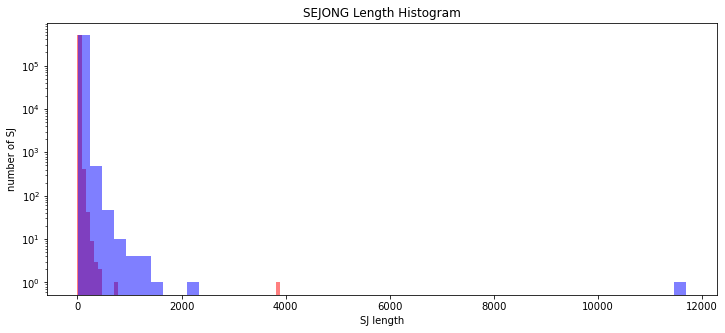

In [11]:
plt.figure(figsize = (12,5))

plt.hist(sj_len_by_token, bins = 50, alpha=0.5, color="r", label="word")
plt.hist(sj_len_by_eumjeol, bins = 50, alpha=0.5, color="b", label="aplt.yscallphabet")

plt.yscale('log', nonposy = 'clip')
plt.title('SEJONG Length Histogram')
plt.xlabel('SJ length')
plt.ylabel('number of SJ')
plt.legend(labels = ('어절','음절'))

In [12]:
# 어절 
print('문장 최대 길이 : {}'.format(np.max(sj_len_by_token)))
print('문장 최소 길이 : {}'.format(np.min(sj_len_by_token)))
print('문장 평균 길이 : {:.2f}'.format(np.mean(sj_len_by_token)))
print('문장 길이 표준편차 : {:.2f}'.format(np.std(sj_len_by_token)))
print('문장 중간 길이 : {}'.format(np.median(sj_len_by_token)))
print('제 1사분위 길이 : {}'.format(np.percentile(sj_len_by_token, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(sj_len_by_token, 75)))

문장 최대 길이 : 3893
문장 최소 길이 : 0
문장 평균 길이 : 12.21
문장 길이 표준편타 : 10.69
문장 중간 길이 : 10.0
제 1사분위 길이 : 6.0
제 3사분위 길이 : 16.0


In [13]:
print('음절 최대 길이 : {}'.format(np.max(sj_len_by_eumjeol)))
print('음절 최소 길이 : {}'.format(np.min(sj_len_by_eumjeol)))
print('음절 평균 길이 : {:.2f}'.format(np.mean(sj_len_by_eumjeol)))
print('문장 길이 표준편차 : {:.2f}'.format(np.std(sj_len_by_eumjeol)))
print('문장 중간 길이 : {}'.format(np.median(sj_len_by_eumjeol)))
print('제 1사분위 길이 : {}'.format(np.percentile(sj_len_by_eumjeol, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(sj_len_by_eumjeol, 75)))

문장 최대 길이 : 11693
문장 최소 길이 : 1
문장 평균 길이 : 38.11
문장 길이 표준편차 : 33.40
문장 중간 길이 : 31.0
제 1사분위 길이 : 19.0
제 3사분위 길이 : 50.0


In [16]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline

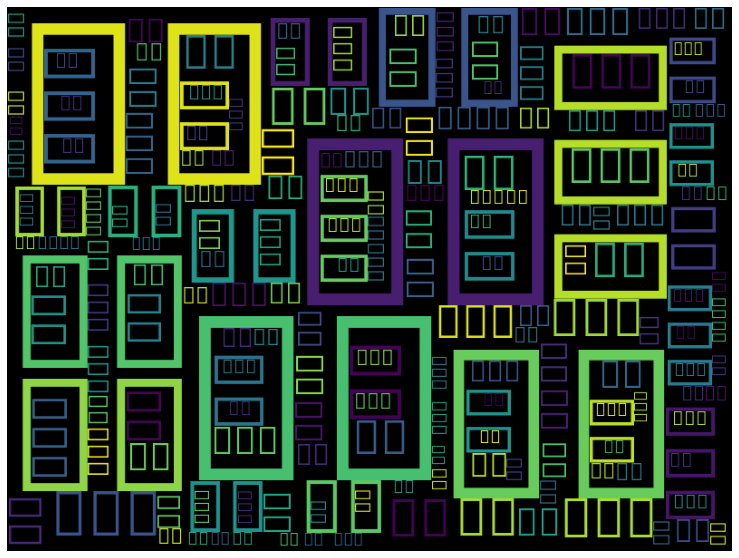

In [18]:
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', width=800, height=600)
wordcloud = wordcloud.generate(' '.join(sj_data['ko_text']))

plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [7]:
min_data = pd.read_csv("MINWON_CORPUS.csv", header=0, encoding='utf-8')

In [8]:
min_data.head()

,pk,min_text,sent_count,cumsum_count
0,1,경매장개설 운영승인신청서,1,1
1,2,신청인,1,1
2,3,상호 명칭,1,1
3,4,성명 대표자,1,1
4,5,주민등록번호,1,1


In [10]:
mw = list(min_data['min_text'])

In [11]:
mw[0]

'경매장개설 운영승인신청서'

In [13]:
tokenized_mw = [s.split() for s in mw]

In [14]:
tokenized_mw[0]

['경매장개설', '운영승인신청서']

In [15]:
mw_len_by_token = [len(t) for t in tokenized_mw]

In [16]:
mw_len_by_token[0]

2

In [17]:
sum(mw_len_by_token)

2890536

In [30]:
cnt1_mw, cnt2_mw, cnt3_mw = 0,0,0
cnt1_list = []
cnt2_list = []
cnt3_list = []

for text in mw:
    doc = pattern1.sub('',
          re.sub(r' {2,}','', 
          pattern2.sub('',
          pattern3.sub('',
          pattern4.sub(' ',
          pattern5.sub('',text.strip()))))))
    a,b,c= get_tokens(doc)
    cnt1_mw = cnt1_mw + a # 어절 갯수
    cnt2_mw = cnt2_mw + b # 형태소 개수
    cnt3_mw = cnt3_mw + c # 명사 개수
    cnt1_list.append(a)
    cnt2_list.append(b)
    cnt3_list.append(c)
    
    print(cnt1_mw)

2
3
5
7
8
9
10
11
14
15
16
17
26
27
31
32
33
34
35
37
39
49
57
67
72
76
78
80
81
82
83
84
85
94
101
111
112
113
114
117
118
119
121
122
125
128
129
130
131
132
133
136
137
138
140
141
142
143
145
147
149
150
151
152
153
155
156
157
171
182
184
185
188
192
194
195
198
199
202
203
209
210
217
218
219
220
222
223
225
226
230
231
234
238
246
247
248
249
252
253
254
265
266
276
277
282
284
285
289
292
299
305
306
307
333
351
375
422
435
446
470
494
532
534
536
539
547
549
551
553
561
562
573
574
576
577
578
579
581
582
583
585
586
587
594
597
614
615
616
617
619
621
622
623
624
627
634
634
639
641
642
654
664
668
669
670
671
675
676
680
681
683
684
688
695
704
712
719
722
725
728
732
738
742
745
749
749
753
754
755
759
773
787
805
816
820
840
842
847
850
855
857
861
862
865
870
885
886
896
902
903
908
911
986
987
1051
1063
1064
1070
1071
1077
1078
1095
1096
1103
1114
1115
1147
1148
1162
1180
1183
1260
1262
1263
1283
1285
1286
1307
1325
1344
1345
1393
1395
1396
1412
1414
1415
1434
1447
1448


11267
11268
11269
11270
11273
11274
11276
11277
11278
11286
11293
11294
11295
11296
11298
11300
11301
11305
11307
11309
11311
11314
11316
11323
11328
11332
11340
11343
11345
11347
11348
11349
11350
11352
11359
11361
11362
11362
11362
11363
11363
11364
11365
11373
11379
11380
11381
11389
11399
11400
11401
11409
11414
11418
11419
11430
11431
11432
11440
11444
11445
11446
11457
11458
11459
11623
11624
11625
11626
11629
11630
11632
11633
11634
11642
11648
11649
11650
11658
11669
11670
11671
11679
11684
11685
11686
11694
11705
11706
11707
11715
11721
11722
11723
11731
11742
11743
11744
11746
11748
11752
11753
11760
11761
11762
11765
11768
11770
11772
11775
11776
11780
11784
11786
11788
11791
11793
11797
11801
11803
11806
11807
11811
11813
11814
11815
11816
11818
11820
11822
11826
11827
11828
11829
11837
11838
11839
11840
11841
11842
11851
11858
11865
11866
11869
11872
11884
11885
11887
11888
11891
11893
11897
11900
11902
11904
11907
11910
11910
11914
11918
12075
12079
12081
12082
12083
1208

16611
16616
16622
16624
16626
16628
16633
16634
16634
16634
16634
16639
16641
16647
16647
16647
16647
16647
16650
16658
16661
16664
16682
16682
16694
16695
16698
16701
16716
16743
16749
16755
16775
16802
16810
16826
16831
16837
16849
16858
16872
16881
16899
16922
16923
16925
16928
16929
16930
16931
16932
16934
16936
16946
16951
16960
16964
16969
16970
16971
16974
16977
16981
16983
16992
16997
17001
17002
17010
17015
17016
17018
17020
17021
17025
17026
17032
17034
17040
17042
17052
17053
17054
17057
17058
17060
17061
17062
17062
17063
17065
17066
17067
17067
17068
17069
17069
17071
17071
17072
17072
17073
17073
17074
17074
17078
17082
17090
17093
17094
17095
17097
17098
17099
17099
17100
17103
17103
17103
17103
17109
17113
17114
17115
17115
17115
17115
17115
17120
17122
17126
17126
17127
17137
17139
17140
17141
17143
17145
17146
17146
17146
17146
17147
17147
17147
17147
17148
17148
17148
17148
17149
17151
17153
17155
17159
17164
17166
17169
17171
17173
17175
17180
17181
17181
17181
1718

20480
20480
20480
20480
20485
20487
20493
20493
20493
20493
20493
20496
20504
20507
20510
20528
20528
20540
20541
20544
20547
20563
20590
20596
20602
20622
20648
20656
20672
20677
20683
20695
20703
20717
20726
20743
20763
20764
20766
20769
20770
20771
20772
20773
20775
20777
20787
20792
20801
20805
20810
20811
20812
20815
20818
20822
20824
20832
20836
20840
20841
20848
20853
20854
20856
20858
20859
20863
20864
20870
20872
20878
20880
20890
20891
20892
20895
20896
20898
20899
20900
20900
20901
20903
20904
20905
20905
20906
20907
20907
20909
20909
20910
20910
20911
20911
20912
20912
20916
20920
20928
20931
20932
20933
20935
20936
20937
20937
20938
20941
20941
20941
20941
20947
20951
20952
20953
20953
20953
20953
20953
20958
20960
20964
20964
20965
20975
20977
20978
20979
20981
20983
20984
20984
20984
20984
20985
20985
20985
20985
20986
20986
20986
20986
20987
20989
20991
20993
20997
21002
21004
21007
21009
21011
21013
21018
21019
21019
21019
21019
21024
21026
21032
21032
21032
21032
2103

25629
25630
25631
25635
25639
25643
25646
25650
25653
25656
25663
25671
25674
25678
25765
25767
25769
25770
25771
25772
25773
25774
25775
25776
25777
25780
25781
25782
25783
25784
25785
25786
25787
25788
25789
25790
25791
25792
25793
25794
25796
25797
25799
25802
25805
25808
25809
25810
25811
25812
25813
25814
25815
25816
25818
25819
25821
25823
25825
25827
25828
25831
25832
25833
25834
25835
25836
25841
25842
25845
25849
25860
25861
25865
25868
25869
25875
25955
25956
25957
25959
25960
25961
25973
25974
25993
25998
25999
26000
26012
26014
26033
26043
26048
26163
26165
26166
26168
26169
26170
26171
26172
26177
26181
26184
26184
26189
26192
26198
26198
26202
26209
26209
26213
26216
26220
26226
26230
26242
26248
26255
26262
26265
26269
26272
26274
26276
26280
26283
26283
26288
26292
26297
26300
26303
26303
26304
26327
26329
26330
26331
26332
26333
26334
26335
26336
26352
26353
26355
26357
26424
26427
26433
26434
26435
26436
26438
26439
26440
26441
26444
26445
26446
26447
26448
26450
2645

31883
31885
31939
31942
31943
31949
31955
31957
31958
31962
31964
31966
31968
31971
31972
31973
31974
31975
31976
31977
31978
31980
31981
31982
31983
31984
31985
31986
31988
31989
31990
31991
31992
31993
31994
31995
31996
31997
31999
32000
32002
32004
32008
32009
32010
32011
32011
32012
32013
32014
32015
32016
32016
32018
32036
32039
32040
32045
32047
32048
32050
32052
32056
32057
32058
32059
32059
32060
32061
32062
32063
32064
32066
32080
32083
32086
32089
32093
32095
32096
32098
32099
32099
32099
32099
32099
32099
32099
32099
32101
32118
32121
32124
32127
32131
32131
32132
32133
32136
32138
32138
32139
32141
32142
32144
32157
32160
32161
32163
32166
32167
32169
32171
32172
32173
32174
32175
32176
32178
32180
32181
32182
32183
32184
32185
32187
32189
32190
32191
32192
32193
32195
32212
32217
32220
32222
32223
32230
32232
32232
32233
32233
32234
32234
32235
32235
32236
32236
32237
32239
32245
32247
32250
32251
32252
32277
32278
32279
32281
32282
32282
32285
32287
32288
32291
32293
3229

37872
37875
37876
37877
37878
37879
37880
37880
37881
37882
37883
37884
37887
37889
37891
37893
37896
37898
37902
37904
37905
37907
38052
38053
38054
38055
38056
38058
38059
38061
38064
38069
38074
38075
38078
38080
38081
38082
38083
38085
38087
38089
38091
38092
38093
38094
38095
38097
38098
38099
38101
38153
38165
38171
38172
38177
38181
38184
38185
38187
38188
38189
38190
38191
38194
38196
38198
38198
38200
38201
38203
38204
38205
38207
38209
38210
38212
38213
38214
38216
38217
38218
38219
38220
38221
38222
38223
38224
38226
38227
38229
38231
38232
38233
38234
38235
38236
38237
38238
38239
38239
38241
38398
38399
38400
38401
38411
38413
38427
38430
38451
38466
38473
38484
38491
38500
38503
38517
38520
38531
38536
38555
38557
38573
38575
38674
38747
38748
38749
38750
38752
38767
38784
38786
38798
38802
38823
38826
38843
38856
38860
38882
38885
38897
38909
38912
38934
38941
38942
38948
38970
38988
38992
39001
39023
39049
39072
39096
39112
39116
39117
39119
39120
39121
39122
39126
3912

44624
44625
44626
44627
44628
44629
44630
44630
44631
44632
44632
44633
44634
44634
44635
44636
44636
44637
44638
44638
44639
44640
44641
44643
44645
44646
44647
44648
44653
44655
44657
44661
44662
44681
44682
44684
44686
44689
44692
44695
44696
44697
44699
44699
44701
44701
44702
44702
44702
44702
44702
44703
44704
44704
44704
44704
44704
44705
44706
44706
44706
44706
44706
44711
44713
44714
44717
44719
44724
44729
44735
44740
44743
44746
44747
44749
44753
44760
44761
44762
44767
44774
44779
44784
44788
44792
44794
44798
44801
44802
44803
44805
44809
44815
44816
44818
44823
44827
44830
44835
44839
44847
44848
44849
44855
44862
44869
44876
44878
44881
44883
44907
44931
44932
44933
44937
44940
44943
44947
44952
44955
44955
44958
44961
44962
44964
44972
45009
45010
45011
45012
45013
45014
45015
45016
45017
45018
45021
45024
45025
45026
45027
45033
45042
45042
45045
45049
45051
45055
45056
45088
45092
45093
45094
45095
45096
45097
45098
45099
45100
45103
45106
45107
45108
45109
45110
4511

49522
49524
49525
49527
49528
49529
49530
49531
49532
49533
49534
49535
49536
49537
49538
49540
49541
49543
49545
49547
49548
49549
49550
49551
49552
49553
49563
49564
49568
49569
49570
49571
49572
49573
49574
49577
49583
49589
49592
49608
49621
49637
49644
49655
49682
49705
49743
49744
49745
49747
49749
49752
49767
49787
49793
49821
49844
49848
50031
50033
50034
50035
50036
50037
50038
50039
50040
50041
50042
50044
50052
50052
50053
50058
50058
50059
50060
50063
50064
50065
50067
50068
50069
50070
50071
50072
50074
50082
50082
50083
50088
50088
50089
50090
50093
50094
50095
50097
50107
50108
50112
50116
50118
50119
50120
50121
50122
50123
50125
50131
50137
50146
50159
50201
50214
50230
50237
50248
50249
50578
50579
50593
50598
50616
50628
50662
50686
50724
50740
50764
50766
50768
50776
50817
50837
50855
50863
50893
50918
50922
50924
50965
50966
50967
50981
50998
51014
51018
51025
51031
51054
51058
51062
51067
51075
51088
51103
51107
51111
51119
51123
51128
51150
51155
51171
51182
5119

57013
57013
57014
57016
57018
57019
57020
57022
57024
57025
57026
57040
57044
57044
57045
57047
57049
57050
57051
57053
57055
57056
57057
57062
57066
57066
57067
57069
57071
57072
57073
57075
57077
57078
57079
57086
57087
57089
57091
57092
57093
57095
57097
57098
57099
57100
57101
57107
57111
57111
57112
57114
57116
57117
57118
57120
57122
57123
57124
57128
57132
57132
57133
57135
57137
57138
57139
57141
57143
57144
57145
57154
57158
57158
57159
57161
57163
57164
57165
57167
57169
57170
57171
57176
57180
57180
57181
57183
57185
57186
57187
57189
57191
57192
57193
57198
57202
57202
57203
57205
57207
57208
57209
57211
57213
57214
57215
57216
57217
57222
57226
57226
57227
57229
57231
57232
57233
57235
57237
57238
57239
57240
57244
57246
57247
57248
57248
57251
57254
57261
57263
57267
57268
57271
57274
57277
57284
57288
57288
57289
57291
57293
57294
57295
57297
57299
57300
57301
57307
57311
57311
57312
57314
57316
57317
57318
57320
57322
57323
57324
57331
57335
57335
57336
57338
57340
5734

62610
62615
62620
62621
62631
62641
62642
62643
62646
62647
62649
62650
62650
62651
62652
62653
62654
62655
62656
62657
62660
62661
62662
62664
62666
62670
62717
62725
63220
63221
63223
63245
63271
63287
63337
63349
63355
63364
63367
63378
63385
63404
63440
63442
63446
63464
63469
63479
63485
63495
63506
63518
63527
63534
63545
63555
63574
63593
63609
63618
63642
63670
63687
63696
63703
63728
63749
63752
63757
63760
63761
63762
63763
63765
63766
63767
63768
63774
63775
63802
63803
63807
63808
63809
63812
63813
63817
63818
63844
63845
63853
63871
63876
63882
63889
63893
63897
63901
63910
63914
63920
63924
63928
63929
64001
64003
64004
64005
64006
64007
64008
64009
64009
64010
64013
64015
64016
64019
64021
64022
64023
64026
64028
64033
64035
64036
64038
64039
64040
64041
64042
64043
64044
64044
64045
64048
64050
64051
64054
64056
64057
64058
64061
64063
64068
64070
64071
64073
64074
64075
64076
64077
64078
64079
64079
64080
64083
64085
64086
64089
64091
64092
64093
64096
64098
64103
6410

69283
69302
69306
69380
69381
69390
69396
69402
69403
69408
69418
69424
69427
69428
69431
69440
69445
69457
69465
69466
69467
69470
69471
69473
69474
69476
69477
69477
69479
69482
69486
69489
69492
69493
69493
69493
69496
69499
69500
69501
69506
69509
69512
69517
69518
69518
69518
69521
69523
69524
69525
69526
69527
69527
69529
69532
69538
69543
69544
69544
69544
69547
69548
69549
69550
69551
69553
69556
69561
69566
69567
69568
69568
69568
69571
69573
69575
69578
69579
69582
69585
69587
69590
69591
69591
69591
69595
69597
69598
69599
69600
69601
69604
69608
69611
69614
69615
69615
69615
69618
69619
69620
69621
69622
69622
69625
69629
69632
69635
69636
69636
69636
69639
69640
69641
69645
69647
69649
69650
69651
69651
69651
69656
69657
69658
69659
69660
69661
69665
69669
69674
69676
69677
69677
69677
69681
69681
69684
69687
69690
69842
69848
69858
69866
69879
69886
69898
69908
69919
69934
69936
69943
69956
69967
69977
69989
69992
70010
70014
70044
70045
70048
70051
70052
70056
70057
7005

76452
76453
76455
76456
76458
76460
76461
76463
76470
76478
76480
76485
76491
76493
76495
76500
76503
76509
76513
76514
76518
76585
76586
76587
76588
76588
76589
76589
76593
76599
76602
76607
76610
76614
76619
76622
76625
76629
76629
76631
76633
76639
76641
76645
76650
76653
76654
76655
76656
76659
76663
76664
76665
76666
76669
76669
76677
76685
76731
76732
76736
76737
76739
76744
76747
76748
76749
76750
76751
76755
76761
76762
76764
76765
76768
76769
76771
76775
76776
76779
76780
76782
76783
76784
76785
76818
76825
76830
76834
76837
76839
76840
76842
76844
76849
76851
76881
76882
76886
76895
76904
76906
76910
76915
76918
77004
77005
77010
77011
77012
77013
77013
77014
77014
77018
77024
77026
77030
77031
77032
77035
77038
77041
77043
77046
77050
77050
77052
77054
77061
77067
77073
77076
77080
77085
77095
77096
77097
77098
77101
77101
77105
77106
77107
77108
77111
77112
77114
77122
77130
77180
77181
77186
77187
77188
77189
77190
77191
77192
77196
77201
77202
77203
77208
77209
77213
7721

82643
82644
82651
82655
82663
82668
82676
82680
82682
82683
82685
82744
82745
82746
82747
82747
82748
82748
82752
82758
82767
82771
82773
82776
82780
82782
82784
82786
82789
82792
82794
82796
82800
82802
82805
82807
82810
82814
82815
82817
82818
82821
82822
82824
82826
82863
82866
82868
82869
82872
82873
82877
82878
82879
82883
82885
82886
82887
82891
82892
82893
82894
82896
82897
82898
82900
82901
82902
82915
82916
82918
82920
82922
82924
82928
82930
82960
82961
82963
82972
82980
82988
82990
82996
82998
82999
83001
83055
83056
83057
83058
83058
83059
83059
83063
83069
83079
83083
83085
83088
83092
83094
83096
83098
83100
83102
83106
83108
83111
83111
83115
83116
83118
83119
83122
83122
83124
83126
83155
83158
83159
83160
83162
83163
83164
83168
83169
83170
83174
83177
83178
83179
83184
83185
83186
83187
83197
83198
83200
83202
83205
83207
83209
83226
83227
83229
83230
83233
83240
83247
83249
83250
83271
83275
83276
83279
83279
83284
83284
83288
83288
83291
83291
83296
83301
83302
8330

90037
90039
90041
90066
90069
90071
90072
90073
90074
90078
90079
90080
90084
90088
90090
90092
90093
90096
90113
90120
90122
90124
90128
90130
90134
90135
90139
90223
90224
90225
90226
90226
90227
90227
90231
90237
90238
90242
90251
90254
90258
90260
90262
90264
90269
90273
90274
90282
90288
90291
90304
90308
90309
90312
90312
90316
90317
90319
90320
90323
90325
90327
90329
90357
90360
90364
90365
90366
90367
90371
90372
90373
90377
90381
90383
90385
90386
90390
90409
90416
90418
90420
90424
90428
90430
90431
90432
90433
90434
90437
90438
90439
90440
90443
90445
90453
90457
90460
90461
90466
90471
90489
90494
90499
90500
90501
90502
90503
90504
90506
90507
90508
90509
90510
90511
90515
90516
90517
90518
90520
90522
90526
90527
90528
90529
90547
90548
90558
90569
90572
90572
90572
90577
90578
90581
90582
90583
90598
90616
90619
90620
90623
90626
90638
90639
90640
90641
90642
90643
90647
90651
90652
90652
90654
90655
90656
90661
90664
90667
90667
90668
90669
90670
90681
90684
90687
9069

97726
97729
97730
97731
97732
97732
97734
97734
97736
97736
97738
97738
97739
97741
97742
97743
97744
97745
97750
97752
97753
97756
97757
97758
97761
97762
97763
97767
97775
97779
97779
97779
97779
97779
97779
97783
97787
97788
97789
97790
97794
97797
97799
97801
97807
97824
97848
97858
97864
97866
97869
97870
97871
97874
97875
97876
97880
97908
97912
97922
97967
97992
98025
98025
98026
98030
98031
98032
98036
98039
98041
98043
98047
98053
98055
98056
98057
98058
98059
98062
98063
98064
98067
98068
98069
98073
98081
98085
98085
98085
98085
98085
98085
98089
98093
98094
98095
98096
98100
98103
98105
98107
98113
98130
98154
98164
98171
98173
98176
98179
98180
98183
98184
98185
98186
98189
98190
98194
98225
98229
98240
98297
98339
98353
98353
98354
98358
98359
98360
98364
98367
98369
98371
98375
98377
98379
98460
98464
98465
98468
98468
98473
98474
98474
98476
98477
98477
98482
98483
98483
98488
98489
98489
98491
98492
98492
98495
98496
98496
98499
98500
98500
98503
98504
98504
98509
9851

103902
103903
103904
103905
103906
103907
103911
103912
103913
103915
103916
103917
103920
103921
103923
103925
103994
103997
104002
104003
104004
104005
104009
104010
104011
104015
104018
104021
104022
104026
104027
104031
104035
104036
104040
104041
104046
104047
104048
104053
104054
104057
104058
104063
104066
104067
104071
104072
104072
104073
104075
104076
104077
104078
104080
104082
104087
104088
104093
104202
104203
104204
104205
104205
104206
104206
104210
104216
104222
104230
104236
104237
104241
104253
104262
104268
104272
104275
104279
104280
104282
104284
104291
104296
104302
104312
104316
104317
104318
104319
104320
104323
104324
104325
104326
104330
104331
104332
104334
104335
104336
104339
104340
104342
104344
104412
104415
104419
104420
104421
104422
104426
104427
104428
104432
104435
104438
104439
104443
104444
104448
104452
104453
104457
104458
104463
104464
104465
104470
104471
104474
104475
104480
104483
104484
104488
104489
104489
104490
104492
104493
104494
104495

109377
109383
109391
109395
109396
109399
109400
109504
109505
109506
109507
109507
109508
109508
109512
109518
109525
109533
109538
109542
109545
109548
109552
109560
109562
109566
109569
109574
109575
109576
109588
109595
109601
109608
109609
109612
109615
109616
109620
109621
109623
109624
109627
109628
109630
109632
109697
109700
109702
109703
109710
109711
109715
109716
109717
109721
109726
109727
109733
109736
109738
109740
109744
109745
109749
109750
109752
109756
109757
109759
109764
109766
109769
109773
109774
109775
109782
109789
109793
109798
109801
109809
109814
109937
109938
109970
109973
109974
109975
109977
109979
109982
109983
109984
109985
109986
109987
109989
109993
109994
109995
109996
109997
110000
110002
110006
110009
110010
110011
110012
110013
110014
110015
110016
110017
110021
110023
110024
110025
110029
110032
110037
110038
110039
110051
110060
110064
110072
110078
110087
110096
110101
110106
110113
110117
110121
110128
110134
110137
110138
110141
110224
110225

115045
115053
115054
115064
115065
115066
115067
115068
115069
115070
115073
115074
115077
115153
115154
115155
115156
115156
115157
115157
115161
115167
115169
115176
115180
115187
115190
115194
115194
115196
115198
115199
115204
115208
115209
115213
115216
115217
115225
115232
115236
115237
115238
115241
115245
115246
115247
115250
115252
115254
115364
115367
115368
115369
115370
115371
115375
115376
115377
115381
115403
115404
115405
115424
115425
115445
115446
115458
115459
115466
115467
115481
115482
115483
115620
115621
115626
115642
115646
115672
115728
115750
115763
115765
115766
115767
115768
115890
115891
115892
115893
115893
115894
115894
115898
115904
115908
115912
115914
115917
115920
115922
115924
115929
115931
115934
115938
115943
115947
115949
115951
115964
115978
115980
115986
115993
115999
116009
116016
116023
116026
116027
116030
116034
116035
116036
116039
116041
116043
116085
116088
116089
116090
116091
116092
116093
116097
116098
116099
116103
116110
116111
116117

122126
122128
122131
122136
122138
122142
122146
122149
122152
122153
122156
122261
122262
122263
122264
122264
122265
122265
122269
122275
122277
122279
122283
122288
122291
122295
122297
122299
122301
122304
122312
122315
122319
122325
122331
122341
122346
122349
122355
122358
122361
122362
122364
122367
122368
122372
122373
122376
122378
122379
122382
122389
122391
122393
122448
122451
122453
122454
122456
122458
122459
122463
122464
122465
122469
122477
122478
122484
122485
122491
122492
122498
122499
122504
122505
122506
122514
122520
122526
122532
122537
122577
122578
122582
122587
122594
122601
122604
122609
122613
122618
122626
122630
122631
122635
122750
122751
122752
122753
122753
122754
122754
122758
122764
122766
122770
122772
122777
122780
122784
122789
122791
122793
122799
122812
122827
122837
122846
122853
122856
122857
122859
122862
122866
122870
122871
122872
122873
122874
122875
122876
122879
122884
122886
122888
122960
122963
122966
122967
122968
122969
122970
122974

127405
127406
127408
127413
127415
127419
127422
127425
127427
127435
127437
127443
127445
127453
127454
127455
127459
127460
127463
127464
127602
127603
127604
127605
127605
127606
127606
127610
127616
127621
127622
127626
127629
127633
127635
127638
127642
127646
127648
127650
127656
127661
127663
127697
127699
127700
127702
127703
127707
127712
127713
127715
127717
127718
127719
127721
127723
127725
127725
127725
127725
127727
127727
127729
127729
127733
127733
127733
127733
127734
127734
127734
127736
127736
127736
127740
127743
127748
127753
127764
127772
127774
127780
127781
127782
127785
127786
127790
127791
127792
127794
127797
127798
127801
127802
127804
127806
127864
127867
127871
127872
127874
127875
127876
127877
127881
127882
127883
127887
127893
127894
127898
127899
127900
127902
127903
127904
127910
127911
127917
127918
127922
127923
127924
127925
127931
127932
127933
127934
127935
127936
127937
127940
127945
127946
127950
127954
127960
127962
127967
127970
127976
127977

133006
133007
133012
133013
133014
133015
133016
133017
133030
133031
133033
133035
133037
133041
133044
133047
133077
133078
133080
133083
133085
133086
133087
133088
133090
133092
133095
133101
133102
133109
133110
133114
133122
133145
133146
133151
133152
133154
133156
133158
133160
133163
133166
133167
133169
133171
133172
133177
133178
133183
133187
133188
133192
133277
133278
133280
133281
133281
133282
133282
133286
133292
133298
133300
133302
133304
133306
133308
133312
133313
133316
133320
133323
133325
133331
133339
133343
133352
133358
133359
133360
133363
133366
133370
133371
133373
133375
133376
133379
133381
133383
133385
133441
133444
133449
133450
133456
133457
133461
133462
133463
133467
133472
133477
133478
133479
133481
133488
133493
133498
133499
133500
133501
133506
133515
133521
133523
133527
133531
133534
133538
133542
133552
133553
133556
133558
133562
133564
133566
133568
133569
133571
133649
133650
133652
133653
133653
133654
133654
133658
133664
133668
133670

137292
137293
137295
137298
137301
137303
137305
137306
137307
137309
137312
137313
137314
137315
137316
137318
137322
137327
137328
137329
137331
137333
137343
137349
137355
137360
137361
137363
137366
137370
137374
137385
137389
137392
137399
137402
137468
137470
137471
137473
137476
137479
137481
137482
137484
137485
137485
137486
137488
137488
137491
137492
137493
137494
137497
137498
137500
137504
137509
137510
137511
137513
137515
137525
137531
137537
137542
137543
137545
137548
137552
137556
137567
137571
137574
137581
137584
137650
137652
137653
137655
137658
137661
137663
137664
137666
137667
137667
137668
137670
137670
137673
137674
137675
137676
137679
137680
137682
137686
137691
137692
137693
137695
137697
137707
137713
137719
137724
137725
137727
137730
137734
137738
137749
137751
137752
137768
137772
137773
137776
137776
137781
137782
137782
137785
137786
137789
137790
137793
137857
137858
137859
137860
137860
137861
137861
137865
137871
137875
137879
137883
137885
137890

142427
142428
142429
142431
142432
142433
142443
142448
142449
142450
142451
142453
142454
142456
142458
142459
142465
142469
142470
142471
142472
142473
142474
142475
142476
142478
142479
142482
142483
142484
142485
142486
142495
142498
142499
142500
142501
142502
142503
142504
142508
142509
142510
142514
142515
142517
142518
142521
142524
142528
142529
142530
142531
142532
142534
142535
142536
142537
142538
142539
142543
142544
142551
142552
142553
142555
142557
142563
142567
142571
142572
142573
142576
142577
142578
142579
142580
142584
142587
142588
142589
142590
142591
142594
142595
142603
142609
142610
142611
142612
142613
142617
142618
142619
142620
142621
142622
142624
142625
142629
142630
142632
142633
142636
142637
142639
142640
142641
142642
142643
142644
142645
142646
142649
142650
142651
142653
142654
142655
142656
142657
142660
142664
142668
142670
142670
142670
142670
142673
142674
142677
142680
142681
142685
142687
142688
142689
142692
142693
142694
142702
142703
142704

147925
147926
147927
147927
147929
148097
148098
148099
148142
148154
148159
148174
148196
148244
148258
148262
148263
148265
148271
148272
148272
148273
148273
148275
148275
148276
148276
148276
148277
148279
148279
148288
148291
148292
148304
148305
148306
148307
148308
148309
148310
148311
148312
148313
148314
148315
148316
148317
148318
148319
148320
148321
148322
148323
148324
148325
148326
148327
148331
148332
148336
148338
148340
148366
148368
148393
148396
148405
148415
148425
148430
148437
148450
148463
148477
148494
148495
148523
148536
148542
148559
148576
148587
148598
148600
148606
148611
148619
148636
148653
148670
148671
148672
148689
148699
148703
148715
148723
148727
148759
148762
148781
148797
148800
148821
148836
148863
148873
148874
148875
148897
148898
148902
148911
148915
148918
148945
148952
148959
148968
148982
148994
149000
149004
149021
149023
149035
149043
149045
149049
149051
149068
149073
149075
149079
149098
149101
149106
149112
149127
149153
149186
149187

161426
161440
161452
161454
161460
161477
161485
161515
161550
161574
161581
161583
161589
161623
161628
161652
161668
161684
161698
161700
161706
161733
161740
161761
161775
161777
161781
161798
161804
161821
161857
161858
161863
161878
161886
161907
161928
161942
161944
161949
161970
161977
162005
162036
162038
162042
162051
162058
162086
162106
162108
162114
162143
162150
162195
162197
162203
162213
162219
162225
162234
162270
162283
162297
162310
162312
162317
162338
162346
162367
162395
162397
162401
162422
162429
162449
162461
162490
162500
162502
162506
162515
162521
162543
162565
162567
162573
162592
162599
162615
162630
162632
162636
162647
162654
162683
162699
162701
162708
162739
162747
162787
162813
162814
162818
162837
162843
162869
162900
162928
162930
162935
162942
162949
162969
162988
162989
162993
163008
163018
163046
163074
163075
163078
163098
163107
163129
163144
163164
163166
163169
163184
163192
163234
163235
163238
163254
163261
163293
163332
163333
163336
163353

179112
179136
179152
179154
179158
179182
179190
179221
179245
179266
179268
179275
179285
179292
179357
179359
179363
179370
179378
179417
179432
179434
179439
179458
179465
179479
179506
179529
179531
179533
179539
179564
179573
179622
179642
179676
179678
179683
179698
179708
179733
179745
179764
179766
179770
179791
179796
179816
179818
179824
179837
179845
179869
179902
179904
179908
179921
179927
179973
179986
179988
179989
179994
180008
180016
180077
180079
180083
180123
180129
180147
180180
180182
180185
180198
180207
180267
180269
180273
180286
180292
180313
180348
180350
180354
180366
180373
180398
180427
180472
180474
180481
180495
180503
180523
180525
180530
180552
180561
180577
180610
180648
180650
180656
180666
180675
180720
180736
180738
180743
180757
180765
180804
180851
180904
180906
180912
180926
180935
180977
180979
180983
181015
181020
181053
181075
181088
181090
181095
181119
181127
181155
181177
181188
181190
181195
181216
181223
181240
181250
181260
181262
181269

190035
190037
190045
190052
190057
190062
190064
190070
190074
190077
190089
190091
190098
190103
190107
190115
190116
190118
190133
190136
190148
190150
190152
190166
190169
190199
190255
190259
190267
190349
190351
190362
190370
190442
190443
190444
190445
190446
190447
190448
190449
190450
190451
190452
190453
190453
190453
190453
190455
190456
190458
190459
190462
190466
190467
190471
190476
190478
190480
190484
190487
190489
190490
190492
190493
190494
190495
190498
190504
190505
190509
190514
190516
190518
190522
190525
190527
190529
190531
190532
190543
190552
190634
190635
190636
190637
190638
190639
190640
190642
190644
190645
190646
190647
190647
190647
190647
190649
190650
190652
190653
190654
190656
190659
190660
190664
190669
190672
190673
190677
190682
190683
190685
190686
190692
190693
190694
190696
190697
190699
190700
190702
190703
190705
190706
190707
190709
190712
190713
190715
190716
190722
190723
190724
190726
190727
190729
190730
190734
190735
190736
190737
190740

194685
194686
194701
194717
194728
194729
194731
194740
194743
194749
194756
194759
194761
194769
194782
194784
194785
194786
194787
194788
194789
194790
194791
194792
194792
194792
194792
194792
194792
194793
194794
194794
194794
194794
194794
194794
194795
194796
194796
194796
194796
194796
194796
194797
194798
194798
194798
194798
194798
194798
194799
194800
194800
194800
194800
194800
194800
194802
194812
194814
194821
194828
194843
194845
194861
194874
194876
194877
194878
194879
194880
194881
194882
194883
194884
194885
194886
194887
194888
194888
194888
194888
194888
194888
194889
194890
194890
194890
194890
194890
194890
194891
194892
194892
194892
194892
194892
194892
194895
194909
194910
194913
194914
194934
194935
194938
194941
194943
194950
194951
194953
194959
194960
194965
194979
194991
195002
195013
195020
195029
195039
195057
195059
195072
195073
195074
195075
195076
195077
195079
195080
195081
195082
195083
195084
195085
195086
195087
195088
195089
195091
195094
195126

198429
198431
198432
198432
198433
198433
198434
198434
198436
198437
198438
198439
198440
198441
198449
198454
198463
198468
198481
198483
198484
198485
198486
198487
198489
198491
198492
198493
198494
198497
198505
198506
198508
198510
198513
198514
198515
198516
198519
198520
198523
198524
198543
198546
198549
198551
198553
198554
198555
198556
198557
198560
198561
198562
198566
198571
198574
198578
198583
198585
198587
198598
198599
198602
198604
198605
198606
198607
198609
198610
198611
198612
198613
198616
198620
198624
198626
198627
198638
198639
198641
198642
198644
198646
198648
198649
198650
198652
198653
198657
198660
198664
198665
198667
198669
198675
198683
198685
198687
198689
198693
198696
198704
198708
198710
198715
198721
198723
198726
198734
198737
198740
198743
198756
198762
198765
198768
198772
198777
198779
198780
198782
198784
198792
198794
198796
198798
198801
198805
198807
198810
198816
198819
198820
198821
198824
198848
198851
198855
198856
198858
198859
198860

201844
201846
201855
201865
201870
201877
201886
201887
201888
201889
201898
201901
201910
201914
201930
201940
201942
201945
201946
201949
201952
201953
201955
201956
201960
201962
201963
201964
201965
201966
201967
201968
201969
201970
201971
201972
201973
201974
201975
201978
201979
201980
201981
201982
201983
201984
201985
201986
201987
201988
201989
201991
201995
201997
201999
202003
202004
202015
202019
202024
202028
202032
202035
202037
202039
202043
202044
202046
202058
202059
202062
202062
202063
202065
202069
202071
202087
202088
202089
202090
202091
202092
202093
202094
202095
202096
202097
202098
202099
202100
202101
202102
202103
202108
202112
202113
202123
202124
202125
202126
202127
202128
202129
202130
202131
202132
202133
202134
202135
202137
202140
202141
202144
202147
202148
202150
202151
202155
202157
202158
202159
202160
202161
202162
202163
202164
202165
202166
202167
202168
202169
202170
202173
202174
202175
202176
202177
202178
202179
202180
202181
202182
202183

205758
205759
205760
205761
205762
205764
205765
205765
205766
205767
205768
205769
205770
205770
205770
205770
205770
205771
205771
205772
205773
205774
205774
205777
205781
205783
205785
205786
205787
205787
205790
205792
205796
205799
205802
205803
205804
205805
205807
205808
205808
205812
205817
205821
205824
205827
205828
205829
205830
205832
205832
205835
205839
205842
205845
205846
205847
205849
205849
205853
205856
205859
205869
205871
205874
205878
205880
205886
205887
205890
205897
205903
205912
205918
205924
205931
205937
205943
205948
205955
205957
205959
205962
205963
205966
205981
205982
205983
205983
205983
205983
205983
205983
205984
205985
205986
205987
205988
205989
205990
205991
205992
205993
205994
205995
205996
205997
205998
205999
206000
206001
206002
206003
206004
206005
206006
206007
206008
206009
206010
206011
206012
206013
206013
206014
206015
206016
206017
206018
206019
206020
206021
206022
206023
206024
206032
206034
206037
206059
206062
206064
206065
206067

209202
209212
209214
209217
209221
209223
209229
209230
209233
209240
209246
209255
209261
209267
209274
209280
209286
209291
209298
209300
209302
209305
209306
209308
209311
209332
209335
209337
209338
209339
209340
209341
209342
209343
209345
209346
209347
209348
209349
209350
209351
209353
209354
209355
209357
209359
209363
209365
209367
209369
209372
209374
209378
209397
209401
209404
209406
209408
209410
209411
209413
209415
209416
209420
209424
209426
209428
209430
209433
209443
209444
209445
209447
209448
209449
209451
209453
209454
209457
209459
209460
209479
209481
209483
209487
209489
209490
209492
209493
209494
209495
209496
209498
209500
209504
209507
209509
209510
209513
209514
209518
209521
209523
209525
209528
209530
209534
209536
209538
209539
209545
209546
209547
209549
209550
209551
209554
209555
209571
209573
209574
209575
209577
209579
209581
209582
209584
209586
209587
209590
209613
209614
209617
209618
209619
209622
209626
209630
209634
209638
209642
209651
209653

212894
212895
212896
212896
212896
212896
212897
212904
212912
212920
212924
212925
212926
212927
212929
212936
212938
212943
212946
212950
212954
212956
212962
212996
212998
213002
213006
213008
213009
213010
213011
213014
213015
213016
213020
213021
213022
213025
213026
213027
213028
213029
213032
213033
213034
213035
213036
213039
213040
213041
213050
213052
213057
213058
213064
213072
213082
213087
213096
213099
213102
213105
213113
213116
213120
213125
213126
213127
213128
213129
213130
213138
213145
213162
213165
213169
213171
213172
213173
213174
213175
213176
213177
213178
213179
213180
213184
213187
213194
213196
213198
213205
213208
213209
213212
213213
213214
213215
213218
213226
213228
213231
213234
213237
213240
213242
213243
213250
213251
213254
213255
213257
213258
213259
213273
213276
213277
213281
213283
213284
213285
213286
213292
213293
213294
213296
213298
213301
213304
213308
213309
213310
213312
213313
213317
213318
213320
213321
213321
213323
213323
213323
213325

216136
216138
216139
216139
216140
216140
216141
216141
216143
216144
216145
216146
216147
216148
216149
216154
216155
216163
216168
216177
216179
216188
216190
216191
216193
216194
216195
216196
216198
216200
216202
216204
216205
216206
216207
216208
216209
216216
216221
216238
216239
216241
216243
216244
216246
216248
216250
216251
216252
216253
216254
216255
216257
216259
216261
216262
216266
216271
216278
216281
216285
216289
216291
216292
216304
216305
216307
216311
216312
216313
216315
216316
216317
216318
216319
216320
216321
216322
216323
216324
216325
216326
216327
216331
216336
216337
216339
216341
216344
216357
216359
216364
216367
216368
216369
216371
216373
216374
216375
216376
216377
216378
216379
216382
216390
216392
216394
216396
216401
216404
216412
216416
216419
216423
216429
216432
216434
216437
216445
216448
216451
216454
216467
216475
216480
216488
216493
216496
216502
216502
216502
216507
216511
216517
216523
216526
216529
216533
216537
216539
216540
216542
216544

223319
223355
223363
223364
223385
223389
223414
223454
223471
223472
223493
223497
223522
223558
223563
223569
223570
223612
223616
223640
223665
223697
223705
223706
223741
223744
223780
223813
223819
223820
223848
223862
223865
223890
223911
223918
223919
223963
223983
223986
224011
224038
224043
224044
224056
224070
224075
224080
224086
224100
224103
224126
224154
224165
224166
224184
224187
224227
224230
224234
224235
224246
224250
224264
224285
224306
224334
224337
224338
224348
224351
224372
224388
224395
224396
224406
224409
224446
224475
224484
224485
224527
224528
224565
224588
224596
224597
224616
224619
224642
224655
224661
224662
224678
224681
224701
224707
224708
224728
224731
224747
224755
224760
224763
224765
224776
224779
224782
224816
224817
224818
224819
224824
224829
224831
224832
224837
224838
224843
224845
224864
224865
224869
224870
224871
224872
224873
224876
224878
224881
224884
224884
224885
224887
224889
224891
224891
224892
224973
224974
224975
224976
224977

228265
228267
228269
228277
228280
228282
228284
228287
228291
228293
228296
228300
228303
228308
228310
228311
228314
228315
228316
228317
228318
228319
228320
228321
228322
228325
228329
228333
228334
228335
228340
228343
228345
228347
228350
228351
228359
228360
228361
228362
228363
228364
228365
228366
228367
228368
228369
228372
228373
228386
228389
228394
228399
228405
228408
228418
228419
228427
228428
228429
228430
228432
228433
228434
228435
228436
228437
228438
228439
228439
228440
228441
228441
228441
228442
228443
228444
228445
228446
228456
228459
228462
228465
228466
228471
228479
228480
228480
228481
228482
228487
228488
228533
228535
228537
228538
228539
228540
228541
228542
228543
228544
228545
228546
228547
228548
228549
228550
228551
228552
228563
228564
228568
228571
228572
228574
228581
228585
228593
228594
228595
228596
228603
228610
228612
228613
228614
228615
228618
228664
228665
228666
228667
228670
228671
228675
228676
228677
228678
228679
228680
228681
228685

231504
231508
231511
231513
231519
231523
231528
231529
231531
231531
231533
231535
231544
231559
231561
231565
231570
231580
231581
231582
231585
231586
231587
231589
231590
231590
231590
231590
231590
231590
231591
231602
231612
231615
231617
231623
231624
231625
231626
231627
231629
231629
231629
231629
231629
231629
231629
231629
231629
231638
231647
231655
231659
231659
231663
231664
231669
231674
231680
231686
231699
231704
231711
231718
231722
231726
231732
231740
231742
231743
231744
231748
231749
231749
231750
231750
231751
231751
231752
231752
231754
231755
231755
231757
231758
231758
231760
231761
231761
231762
231762
231762
231762
231762
231762
231762
231762
231762
231762
231765
231791
231792
231793
231794
231798
231799
231800
231801
231802
231803
231804
231805
231806
231807
231808
231809
231810
231811
231812
231813
231814
231815
231816
231817
231818
231819
231820
231821
231822
231823
231824
231827
231828
231834
231844
231853
231858
231864
231872
231886
231893
231901
231914

238188
238197
238199
238206
238208
238210
238210
238212
238212
238213
238213
238215
238216
238217
238218
238219
238220
238221
238223
238224
238229
238231
238232
238234
238235
238236
238237
238238
238239
238240
238241
238242
238246
238265
238266
238268
238270
238271
238273
238275
238277
238278
238279
238280
238281
238282
238285
238288
238289
238293
238298
238305
238308
238312
238316
238318
238319
238330
238331
238333
238337
238338
238339
238341
238342
238343
238344
238345
238349
238354
238355
238357
238359
238362
238365
238375
238376
238381
238384
238385
238387
238389
238397
238405
238407
238409
238411
238416
238419
238427
238431
238434
238438
238444
238447
238449
238452
238460
238463
238466
238469
238482
238490
238495
238503
238508
238511
238517
238517
238517
238522
238526
238531
238534
238537
238541
238545
238547
238548
238550
238552
238560
238563
238565
238567
238570
238574
238576
238579
238583
238586
238591
238593
238594
238597
238598
238599
238600
238601
238602
238603
238604
238605

241981
241985
242111
242112
242113
242114
242116
242123
242126
242133
242139
242143
242145
242152
242157
242158
242160
242162
242164
242166
242166
242169
242176
242187
242191
242193
242196
242201
242206
242211
242212
242214
242216
242218
242220
242222
242222
242223
242225
242226
242233
242234
242236
242242
242244
242246
242255
242265
242267
242269
242269
242273
242278
242279
242296
242297
242298
242299
242300
242301
242302
242303
242304
242305
242306
242307
242308
242309
242310
242311
242312
242313
242318
242318
242320
242321
242336
242337
242338
242339
242340
242341
242342
242343
242344
242345
242346
242347
242348
242349
242350
242351
242356
242361
242366
242373
242375
242379
242541
242542
242543
242544
242545
242548
242551
242554
242555
242557
242559
242561
242563
242564
242565
242566
242567
242568
242571
242575
242576
242577
242578
242579
242580
242581
242582
242583
242584
242585
242587
242589
242590
242592
242594
242596
242597
242598
242599
242600
242601
242602
242603
242607
242608

245841
245842
245850
245853
245854
245857
245858
245858
245859
245860
245861
245861
245868
245871
245872
245873
245875
245876
245876
245877
245878
245879
245880
245880
245881
245882
245882
245913
245914
245915
245917
245918
245920
245922
245924
245925
245926
245927
245928
245929
245930
245931
245932
245934
245935
245938
245939
245940
245941
245942
245943
245944
245945
245946
245947
245948
245951
245952
245953
245954
245954
245955
245975
245976
245977
245978
245979
245980
245981
245982
245984
245985
245986
245996
245998
245999
246001
246005
246011
246019
246030
246036
246037
246039
246044
246047
246048
246049
246053
246057
246059
246073
246074
246075
246076
246077
246080
246082
246083
246085
246087
246089
246091
246099
246102
246104
246107
246108
246109
246110
246112
246123
246124
246125
246126
246128
246129
246133
246135
246137
246138
246143
246147
246150
246159
246161
246162
246166
246167
246168
246170
246172
246193
246195
246196
246200
246202
246203
246204
246205
246206
246207
246214

250653
250657
250661
250662
250663
250665
250666
250669
250671
250673
250762
250765
250770
250771
250772
250773
250777
250778
250779
250783
250783
250791
250792
250792
250799
250800
250801
250803
250807
250811
250812
250814
250815
250819
250820
250821
250825
250826
250829
250830
250831
250836
250837
250838
250843
250844
250848
250849
250851
250852
250853
250854
250858
250859
250862
250863
250865
250866
250867
250893
250900
250902
250906
250909
250912
250914
250918
250920
251086
251090
251091
251096
251103
251110
251116
251125
251134
251138
251146
251151
251156
251166
251172
251178
251181
251185
251192
251201
251209
251211
251217
251221
251225
251234
251235
251250
251267
251268
251272
251273
251277
251347
251348
251349
251350
251350
251351
251351
251355
251361
251364
251367
251371
251373
251374
251377
251380
251384
251388
251396
251398
251403
251409
251413
251414
251418
251419
251420
251423
251424
251428
251429
251431
251432
251435
251437
251439
251441
251500
251503
251505
251506
251508

257684
257685
257686
257689
257695
257703
257705
257710
257713
257716
257718
257720
257724
257728
257729
257732
257735
257739
257741
257744
257746
257750
257752
257757
257762
257769
257774
257785
257793
257795
257800
257810
257819
257824
257825
257830
257904
257905
257906
257907
257907
257908
257908
257912
257918
257920
257924
257927
257931
257933
257942
257944
257952
257958
257965
257966
257972
257977
257978
257979
257982
257986
257987
257989
257990
257991
257994
257996
257998
258071
258074
258079
258080
258081
258085
258086
258087
258088
258091
258092
258096
258102
258103
258108
258109
258114
258115
258117
258118
258119
258123
258124
258130
258131
258138
258139
258144
258145
258148
258149
258150
258155
258156
258221
258223
258225
258228
258229
258233
258239
258240
258245
258246
258251
258252
258254
258255
258257
258258
258261
258264
258269
258270
258277
258278
258283
258284
258287
258288
258289
258290
258294
258296
258298
258380
258383
258388
258389
258390
258394
258395
258396
258397

263724
263726
263730
263734
263738
263742
263747
263787
263788
263792
263793
263799
263800
263810
263811
263812
263817
263821
263822
263823
263824
263825
263826
263827
263829
263834
263837
263840
263844
263847
263849
263850
263851
263853
263854
263856
263966
263967
263968
263969
263969
263970
263970
263974
263980
263987
263991
263995
263999
264008
264016
264019
264023
264027
264035
264037
264045
264047
264049
264056
264061
264065
264070
264072
264077
264079
264084
264085
264086
264089
264090
264094
264095
264096
264097
264100
264101
264102
264104
264106
264205
264208
264210
264211
264213
264216
264218
264219
264223
264224
264225
264229
264232
264235
264236
264238
264240
264241
264242
264244
264245
264247
264248
264249
264250
264251
264254
264255
264256
264259
264260
264262
264263
264264
264266
264269
264270
264271
264275
264276
264277
264280
264281
264282
264285
264286
264287
264289
264290
264291
264294
264295
264296
264300
264301
264302
264305
264306
264308
264310
264311
264313
264314

268549
268550
268551
268552
268553
268555
268556
268557
268558
268559
268560
268561
268564
268567
268571
268573
268577
268579
268583
268585
268589
268592
268594
268595
268597
268600
268601
268604
268608
268611
268615
268617
268618
268619
268620
268621
268624
268625
268626
268627
268630
268631
268632
268633
268634
268641
268643
268644
268647
268648
268649
268650
268654
268655
268656
268658
268659
268661
268668
268674
268679
268684
268688
268693
268697
268700
268702
268704
268706
268709
268714
268729
268729
268730
268732
268736
268740
268744
268745
268746
268756
268762
268769
268775
268777
268787
268797
268806
268809
268811
268815
268817
268821
268822
268823
268824
268825
268829
268836
268842
268845
268854
268861
268867
268870
268871
268876
268877
268889
268892
268893
268896
268899
268900
268900
268903
268904
268905
268905
268906
268907
268908
268908
268909
268910
268910
268932
268933
268934
268936
268937
268938
268939
268940
268941
268942
268943
268944
268946
268947
268950
268951
268953

275892
275893
275893
275894
275914
275915
275916
275917
275918
275919
275920
275921
275923
275924
275925
275935
275937
275938
275940
275944
275950
275958
275969
275975
275976
275978
275983
275986
275987
275988
275992
275996
275998
276012
276013
276014
276015
276016
276019
276021
276022
276024
276026
276028
276030
276038
276041
276043
276046
276047
276048
276049
276051
276062
276063
276064
276065
276067
276068
276072
276074
276076
276077
276082
276086
276089
276098
276100
276101
276105
276106
276107
276109
276111
276132
276134
276135
276139
276141
276142
276143
276144
276145
276146
276153
276154
276155
276158
276159
276162
276163
276164
276165
276174
276176
276177
276220
276222
276223
276227
276228
276229
276230
276231
276233
276235
276236
276237
276238
276241
276242
276243
276244
276245
276246
276247
276249
276250
276251
276252
276253
276254
276255
276258
276261
276265
276267
276271
276273
276277
276279
276283
276286
276288
276289
276291
276294
276295
276298
276302
276305
276309
276311

282292
282295
282298
282304
282307
282311
282327
282329
282330
282332
282337
282343
282347
282348
282349
282352
282352
282356
282357
282358
282359
282362
282363
282365
282367
282403
282406
282409
282410
282413
282414
282418
282419
282420
282424
282428
282429
282431
282432
282434
282435
282438
282439
282440
282441
282448
282452
282456
282459
282463
282464
282465
282466
282467
282580
282581
282582
282583
282583
282584
282584
282588
282594
282598
282602
282606
282617
282619
282624
282627
282631
282634
282641
282649
282653
282655
282657
282665
282672
282677
282682
282686
282690
282697
282698
282699
282702
282703
282707
282708
282710
282711
282714
282718
282720
282722
282769
282772
282773
282774
282776
282777
282781
282782
282783
282787
282792
282793
282795
282796
282799
282800
282804
282805
282809
282812
282813
282817
282818
282819
282843
282844
282849
282851
282854
282858
282862
282866
282870
282939
282940
282942
282947
282954
282957
282965
282970
282972
282981
282986
282991
283000
283010

289712
289713
289714
289718
289722
289723
289726
289727
289729
289730
289733
289734
289736
289737
289738
289754
289755
289759
289763
289766
289770
289820
289821
289824
289835
289842
289850
289854
289871
289876
289877
289878
289879
289981
289982
289983
289984
289984
289985
289985
289989
289995
289997
290001
290003
290009
290012
290016
290019
290025
290027
290037
290046
290056
290065
290074
290075
290076
290079
290082
290085
290088
290090
290094
290095
290097
290098
290101
290103
290105
290166
290169
290170
290171
290173
290174
290178
290179
290180
290184
290193
290194
290206
290207
290216
290217
290221
290222
290232
290233
290234
290285
290292
290301
290313
290321
290327
290338
290454
290458
290462
290471
290479
290486
290491
290498
290508
290516
290520
290530
290537
290541
290548
290549
290550
290551
290558
290564
290574
290589
290592
290593
290596
290705
290706
290707
290708
290708
290709
290709
290713
290719
290725
290730
290734
290741
290744
290748
290752
290754
290760
290766
290775

296161
296162
296166
296167
296168
296171
296172
296176
296177
296179
296180
296183
296184
296186
296188
296233
296236
296237
296238
296241
296245
296246
296250
296251
296252
296256
296260
296262
296266
296268
296271
296273
296276
296278
296282
296284
296285
296306
296307
296312
296318
296322
296326
296331
296446
296447
296448
296460
296470
296477
296486
296489
296497
296500
296501
296504
296509
296513
296523
296524
296525
296526
296527
296528
296529
296530
296533
296533
296533
296533
296533
296533
296533
296539
296557
296558
296561
296562
296563
296564
296565
296566
296568
296568
296568
296568
296568
296568
296570
296571
296573
296573
296573
296573
296573
296573
296575
296577
296578
296578
296578
296578
296579
296579
296579
296579
296580
296580
296580
296580
296582
296583
296610
296611
296614
296615
296615
296616
296617
296618
296619
296620
296622
296623
296624
296625
296626
296629
296630
296630
296631
296633
296633
296633
296634
296635
296638
296638
296639
296641
296641
296641
296642

305140
305144
305147
305391
305392
305393
305394
305395
305396
305397
305398
305399
305401
305403
305405
305408
305409
305410
305412
305413
305416
305419
305423
305424
305428
305430
305431
305432
305435
305436
305438
305440
305441
305442
305443
305444
305445
305446
305447
305448
305449
305450
305451
305452
305453
305454
305455
305456
305457
305458
305459
305460
305461
305462
305463
305464
305465
305466
305467
305468
305469
305470
305471
305472
305473
305474
305475
305476
305477
305478
305482
305483
305484
305485
305487
305488
305489
305490
305491
305492
305493
305494
305495
305496
305497
305498
305499
305500
305501
305502
305503
305504
305505
305506
305507
305508
305509
305510
305511
305512
305513
305514
305515
305516
305517
305518
305519
305520
305521
305547
305548
305561
305562
305563
305565
305566
305567
305568
305569
305571
305572
305573
305574
305575
305577
305579
305581
305583
305585
305587
305588
305590
305592
305594
305596
305598
305600
305602
305611
305623
305627
305632
305638

309644
309645
309653
309657
309662
309667
309671
309673
309674
309676
309678
309684
309685
309687
309688
309691
309691
309691
309693
309694
309701
309773
309774
309776
309779
309791
309805
309814
309815
309827
309830
309836
309848
309856
309858
309859
309868
309879
309885
309895
309896
309909
309910
309918
309926
309927
309941
309942
309943
309944
309945
309946
309947
309948
309949
309950
309951
309952
309954
309955
309956
309956
309956
309956
309956
309956
309956
309956
309956
309956
309956
309957
309958
309963
309979
309983
309994
309995
309998
309999
310005
310020
310028
310036
310040
310041
310050
310054
310060
310066
310070
310079
310083
310085
310089
310090
310104
310109
310111
310123
310147
310159
310165
310166
310170
310171
310189
310202
310216
310217
310219
310226
310233
310234
310236
310237
310240
310243
310243
310243
310243
310244
310250
310331
310332
310334
310337
310349
310363
310372
310373
310382
310393
310396
310404
310416
310424
310426
310427
310433
310462
310470
310471

317380
317385
317392
317396
317400
317406
317412
317420
317432
317447
317459
317462
317468
317470
317477
317482
317485
317486
317487
317488
317488
317489
317496
317595
317596
317598
317601
317613
317627
317628
317640
317649
317657
317665
317668
317679
317687
317689
317701
317709
317711
317712
317719
317741
317743
317744
317750
317751
317765
317766
317767
317768
317769
317770
317771
317772
317773
317774
317775
317776
317778
317779
317780
317780
317780
317780
317780
317780
317780
317780
317780
317780
317780
317789
317792
317793
317794
317795
317805
317814
317822
317831
317837
317838
317860
317864
317875
317883
317885
317888
317891
317922
317923
317931
317934
317935
317940
317941
317942
317956
317960
317964
317965
317969
317970
317977
317978
317988
317990
317992
318002
318010
318014
318020
318026
318028
318035
318039
318041
318048
318053
318056
318057
318058
318059
318059
318060
318066
318205
318206
318208
318211
318226
318240
318241
318267
318271
318291
318307
318312
318315
318325
318337

325031
325035
325043
325047
325048
325051
325055
325056
325069
325077
325078
325093
325094
325096
325098
325107
325108
325109
325110
325113
325115
325116
325121
325249
325250
325252
325255
325267
325281
325282
325289
325313
325329
325341
325347
325352
325355
325363
325368
325374
325386
325394
325396
325397
325404
325413
325416
325417
325418
325432
325433
325434
325435
325436
325437
325438
325439
325440
325441
325442
325443
325445
325446
325447
325447
325447
325447
325447
325447
325447
325447
325447
325447
325447
325450
325465
325472
325473
325475
325482
325504
325515
325525
325530
325533
325540
325541
325561
325565
325573
325578
325584
325592
325601
325605
325613
325614
325616
325638
325639
325647
325649
325650
325654
325662
325663
325666
325670
325673
325675
325677
325679
325683
325685
325690
325691
325694
325695
325698
325700
325701
325706
325822
325823
325825
325828
325842
325843
325857
325872
325873
325890
325897
325909
325918
325928
325931
325933
325941
325943
325946
325948
325957

332403
332404
332406
332407
332409
332423
332444
332453
332467
332469
332482
332502
332516
332532
332551
332564
332576
332581
332584
332586
332589
332597
332598
332599
332602
332605
332610
332611
332617
332621
332632
332633
332634
332644
332654
332687
332693
332696
332701
332703
332706
332710
332712
332715
332724
332735
332790
332805
332814
332824
332836
332848
332850
332851
332865
332875
332876
332877
332891
332901
332906
332955
332962
332962
332968
332968
332974
332974
332977
332977
332984
332984
332994
332998
333002
333002
333005
333005
333010
333010
333014
333014
333017
333027
333028
333029
333033
333038
333039
333042
333048
333121
333121
333125
333128
333135
333142
333147
333152
333156
333159
333160
333164
333165
333165
333182
333189
333190
333196
333198
333199
333205
333220
333231
333265
333291
333302
333303
333320
333328
333339
333340
333355
333356
333357
333358
333359
333360
333361
333362
333363
333364
333365
333366
333368
333369
333370
333371
333372
333373
333376
333377
333395

341197
341199
341201
341203
341204
341205
341206
341208
341209
341210
341210
341211
341215
341216
341218
341235
341238
341241
341245
341248
341249
341299
341300
341311
341314
341315
341330
341340
341344
341348
341355
341359
341360
341362
341366
341371
341373
341383
341391
341399
341406
341407
341415
341421
341422
341430
341435
341442
341448
341452
341468
341469
341469
341474
341477
341478
341490
341605
341606
341608
341611
341623
341637
341638
341650
341653
341657
341663
341676
341716
341728
341733
341735
341737
341738
341741
341742
341746
341747
341749
341752
341753
341756
341757
341760
341772
341774
341775
341838
341842
341846
341852
341865
341905
341908
341915
341919
341920
341922
341923
341924
341927
341928
341928
341931
341932
341935
342061
342062
342064
342067
342081
342082
342096
342111
342112
342119
342124
342129
342133
342137
342138
342141
342146
342149
342151
342156
342164
342167
342169
342187
342192
342204
342212
342214
342223
342234
342235
342239
342243
342248
342250
342251

348601
348607
348614
348617
348624
348626
348627
348631
348643
348644
348648
348655
348670
348679
348680
348683
348684
348689
348693
348697
348698
348707
348711
348717
348720
348723
348725
348726
348731
348743
348744
348755
348765
348766
348771
348774
348776
348777
348781
348806
348816
348817
348820
348823
348830
348831
348832
348835
348842
348849
348852
348859
348861
348862
348867
348873
348874
348888
348901
348924
348932
348933
348937
348938
348940
348941
348942
348952
348956
348963
348966
348969
348971
348972
348976
348977
348988
348989
348994
348997
348999
349000
349001
349002
349003
349004
349005
349006
349007
349008
349009
349010
349011
349012
349013
349014
349015
349016
349017
349018
349019
349024
349108
349109
349112
349115
349127
349136
349137
349140
349146
349156
349159
349163
349182
349185
349187
349199
349206
349208
349209
349216
349228
349229
349238
349271
349272
349286
349287
349288
349289
349290
349291
349292
349293
349294
349295
349296
349297
349299
349299
349299
349299

354404
354405
354419
354430
354435
354442
354449
354451
354452
354473
354474
354483
354494
354503
354505
354506
354506
354507
354508
354509
354510
354511
354512
354513
354514
354515
354516
354516
354516
354517
354517
354517
354517
354517
354517
354517
354519
354521
354531
354537
354538
354539
354553
354564
354565
354571
354591
354594
354595
354596
354599
354600
354601
354602
354603
354604
354605
354606
354606
354607
354608
354609
354610
354610
354611
354612
354613
354614
354614
354615
354616
354617
354618
354618
354619
354620
354621
354622
354622
354623
354624
354625
354626
354626
354627
354628
354629
354630
354630
354631
354632
354633
354634
354634
354635
354636
354637
354639
354655
354656
354657
354658
354660
354661
354663
354665
354667
354668
354670
354671
354674
354691
354692
354704
354705
354716
354743
354744
354747
354748
354756
354852
354853
354856
354859
354867
354875
354886
354894
354897
354898
354899
354902
354903
354904
354905
354906
354907
354908
354909
354909
354910
354911

361417
361419
361431
361432
361440
361450
361463
361483
361484
361487
361488
361491
361496
361504
361517
361524
361525
361547
361551
361558
361565
361572
361575
361578
361587
361588
361601
361608
361614
361615
361630
361641
361642
361647
361650
361652
361653
361656
361696
361697
361700
361703
361710
361711
361716
361719
361725
361737
361744
361746
361747
361758
361768
361775
361794
361795
361800
361801
361806
361816
361822
361827
361828
361837
361841
361847
361850
361865
361874
361875
361879
361882
361891
361899
361900
361913
361914
361919
361922
361924
361926
361929
361971
361972
361975
361978
361991
361992
361994
361997
362007
362015
362022
362024
362034
362035
362043
362055
362062
362063
362064
362066
362077
362078
362091
362095
362105
362108
362110
362121
362127
362129
362130
362137
362138
362152
362159
362164
362168
362170
362173
362177
362179
362180
362183
362187
362191
362194
362197
362201
362205
362207
362209
362213
362215
362222
362229
362236
362240
362244
362252
362255
362259

366060
366071
366074
366078
366079
366081
366082
366083
366084
366085
366086
366087
366088
366089
366090
366091
366092
366093
366094
366095
366096
366097
366098
366099
366100
366101
366102
366103
366104
366104
366108
366109
366116
366118
366119
366122
366125
366128
366131
366132
366140
366141
366143
366151
366162
366163
366171
366177
366182
366185
366186
366192
366204
366207
366212
366215
366221
366223
366224
366226
366229
366232
366236
366248
366249
366251
366255
366273
366278
366279
366286
366294
366302
366313
366326
366333
366341
366348
366353
366367
366370
366373
366379
366382
366385
366388
366389
366402
366421
366431
366437
366438
366439
366441
366448
366458
366474
366475
366486
366495
366496
366508
366511
366525
366528
366542
366545
366559
366562
366569
366577
366578
366579
366580
366581
366582
366611
366633
366634
366662
366674
366675
366692
366705
366710
366714
366722
366724
366725
366731
366732
366741
366743
366745
366757
366758
366765
366776
366778
366786
366790
366802
366804

369165
369165
369165
369165
369165
369165
369165
369165
369165
369165
369165
369165
369165
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369166
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369167
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369168
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369169
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369170
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369171
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369172
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369173
369174
369174
369174
369174
369174
369174
369174
369174
369174
369174

369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608
369608

371624
371625
371626
371627
371628
371630
371631
371632
371633
371634
371635
371636
371639
371642
371646
371648
371652
371654
371658
371660
371664
371667
371669
371670
371672
371675
371676
371679
371683
371686
371690
371692
371693
371694
371695
371696
371699
371700
371701
371702
371705
371706
371707
371708
371709
371716
371718
371719
371722
371723
371724
371725
371729
371730
371731
371733
371734
371736
371743
371749
371754
371759
371763
371768
371772
371775
371777
371779
371781
371787
371803
371804
371805
371806
371807
371808
371809
371810
371812
371813
371814
371815
371816
371817
371818
371819
371820
371821
371822
371874
371876
371878
371881
371883
371886
371888
371902
371903
371904
371905
371907
371933
371941
371946
371947
371948
371962
371963
371964
371978
371981
371989
371990
371991
371995
371996
371998
371999
372000
372001
372002
372003
372004
372005
372006
372007
372008
372010
372011
372012
372014
372015
372017
372018
372019
372021
372022
372023
372025
372028
372029
372030
372032

375491
375505
375515
375519
375522
375770
375771
375772
375773
375774
375775
375776
375777
375778
375780
375782
375784
375787
375788
375789
375791
375792
375795
375798
375802
375803
375807
375809
375810
375811
375814
375815
375817
375819
375820
375821
375822
375823
375824
375825
375826
375827
375828
375829
375830
375831
375832
375833
375834
375835
375836
375837
375838
375839
375840
375841
375842
375843
375844
375845
375846
375847
375848
375849
375850
375851
375852
375853
375854
375855
375856
375857
375861
375862
375863
375864
375865
375866
375867
375869
375870
375871
375872
375874
375875
375876
375877
375878
375879
375880
375881
375882
375883
375884
375885
375886
375887
375888
375889
375890
375891
375892
375893
375894
375895
375896
375897
375898
375899
375900
375901
375902
375928
375929
375944
375945
375946
375948
375949
375950
375951
375952
375954
375955
375956
375957
375958
375960
375962
375964
375966
375968
375970
375971
375973
375975
375977
375979
375981
375983
375985
375994
376010

379496
379499
379507
379510
379514
379521
379522
379527
379535
379536
379537
379538
379539
379548
379579
379586
379600
379616
379623
379624
379625
379626
379627
379628
379634
379735
379736
379739
379752
379753
379768
379783
379794
379795
379805
379808
379810
379816
379818
379828
379830
379842
379850
379853
379854
379860
379975
379976
379979
379993
379994
380009
380024
380035
380036
380053
380064
380067
380069
380074
380076
380083
380085
380097
380105
380108
380109
380115
380219
380220
380223
380236
380237
380253
380268
380279
380280
380296
380299
380301
380306
380308
380315
380317
380329
380337
380340
380341
380348
380348
380441
380442
380445
380458
380459
380475
380490
380501
380502
380507
380510
380512
380517
380519
380526
380528
380540
380548
380551
380552
380558
380673
380674
380677
380690
380691
380714
380729
380740
380741
380746
380761
380764
380766
380773
380775
380781
380783
380795
380803
380806
380807
380814
380911
380912
380915
380926
380942
380955
380962
380972
380973
380984

392490
392491
392494
392506
392521
392531
392532
392541
392548
392555
392558
392564
392566
392578
392586
392589
392590
392596
392779
392780
392783
392795
392809
392810
392812
392825
392856
392864
392873
392875
392883
392903
392915
392917
392929
392950
392953
392959
392961
392973
392981
392984
392985
392992
393082
393083
393086
393101
393115
393116
393126
393136
393142
393150
393153
393157
393162
393164
393176
393184
393187
393188
393188
393191
393315
393316
393319
393331
393350
393357
393363
393371
393373
393377
393380
393385
393393
393402
393403
393409
393419
393425
393428
393436
393438
393450
393458
393461
393463
393463
393470
393595
393596
393599
393612
393613
393637
393648
393683
393697
393714
393729
393838
393839
393849
393865
393878
393896
393897
393908
393911
393916
393924
393930
393937
393939
393951
393959
393962
393964
393971
394150
394151
394154
394168
394169
394193
394204
394239
394253
394270
394285
394286
394296
394312
394325
394343
394402
394403
394414
394417
394421
394429

402740
402793
402794
402797
402809
402813
402816
402824
402833
402836
402847
402854
402856
402858
402879
402880
402881
402882
402887
402888
402892
402895
402899
402902
402904
402907
402937
402938
402941
402954
402955
402956
402961
402964
402967
402971
402974
402977
402980
402980
402984
403013
403014
403017
403031
403032
403033
403038
403041
403045
403048
403051
403053
403053
403056
403090
403091
403094
403107
403108
403109
403113
403119
403122
403125
403129
403132
403135
403137
403137
403140
403172
403173
403176
403189
403190
403191
403196
403199
403202
403205
403209
403212
403215
403217
403221
403249
403250
403253
403266
403267
403268
403273
403276
403280
403283
403286
403289
403289
403293
403321
403322
403325
403339
403340
403341
403345
403348
403352
403355
403358
403361
403361
403365
403393
403394
403397
403411
403412
403413
403416
403418
403421
403425
403428
403431
403434
403434
403440
403471
403472
403475
403489
403490
403491
403497
403500
403502
403506
403509
403512
403515
403515

408699
408702
408704
408708
408709
408711
408714
408715
408716
408717
408718
408719
408720
408722
408724
408725
408726
408727
408728
408729
408730
408731
408732
408733
408735
408744
408746
408747
408748
408749
408750
408751
408752
408756
408764
408767
408772
408775
408776
408780
408784
408818
408830
408834
408835
408838
408840
408842
408844
408847
408848
408849
408852
408853
408854
408855
408856
408858
408868
408869
408869
408870
408871
408872
408873
408874
408876
408877
408878
408879
408880
408881
408882
408884
408886
408887
408889
408891
408892
408893
408894
408895
408896
408897
408898
408899
408900
408900
408901
408902
408903
408905
408907
408911
408914
408915
408916
408917
408918
408919
408920
408921
408922
408923
408927
408931
409003
409007
409009
409011
409013
409015
409017
409018
409019
409021
409025
409026
409027
409028
409029
409031
409033
409034
409035
409036
409038
409040
409041
409042
409044
409045
409046
409048
409049
409050
409051
409052
409053
409054
409055
409057
409058

413975
413978
413985
413986
413997
414001
414007
414007
414015
414022
414023
414034
414040
414066
414067
414068
414070
414072
414073
414075
414076
414077
414080
414081
414082
414083
414085
414086
414091
414092
414093
414094
414102
414107
414107
414123
414124
414136
414151
414154
414154
414161
414165
414167
414169
414180
414184
414188
414194
414199
414203
414209
414209
414231
414244
414268
414283
414290
414290
414305
414317
414331
414345
414354
414369
414375
414375
414395
414405
414413
414444
414445
414449
414450
414456
414457
414458
414458
414459
414460
414461
414462
414462
414463
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414464
414465
414466
414467
414467
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414468
414469
414470
414471
414472
414472
414472
414472
414472
414472
414472
414472
414472
414472
414472
414473
414473
414473
414473
414473
414473
414473
414473
414473

414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414620
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414621
414631
414639
414649
414660
414670
414675
414676
414709
414710
414711
414711
414712
414713
414714
414715
414715
414715
414715
414715
414715
414715
414715
414715
414715
414715
414716
414716
414716
414716
414716
414716
414716
414716
414716
414716
414716
414717
414717
414717
414717
414717
414717
414717
414717
414717
414717
414717
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414718
414719
414719
414719
414719
414719
414719
414719
414719
414719
414719
414719
414720
414720
414720
414720
414720
414720
414720
414720
414720
414720
414720
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414721
414722
414723
414724
414727
414727
414727

414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987
414987

415321
415325
415369
415370
415371
415372
415373
415373
415373
415376
415378
415380
415380
415380
415382
415383
415384
415386
415386
415386
415388
415392
415394
415396
415406
415406
415406
415408
415410
415412
415419
415419
415419
415421
415423
415425
415432
415505
415508
415509
415510
415511
415512
415512
415512
415514
415516
415518
415520
415523
415527
415537
415552
415572
415585
415585
415585
415589
415589
415589
415592
415592
415592
415595
415595
415595
415596
415599
415639
415640
415641
415642
415643
415643
415643
415647
415658
415667
415669
415671
415673
415673
415673
415677
415677
415677
415682
415682
415682
415689
415771
415772
415773
415774
415775
415775
415775
415779
415781
415792
415796
415799
415804
415821
415830
415842
415862
415864
415930
415931
415932
415933
415934
415934
415934
415935
415947
415948
415993
415993
415993
415996
415996
415996
415999
416005
416030
416031
416032
416033
416034
416034
416034
416039
416041
416041
416041
416044
416044
416044
416049
416051
416051

420270
420271
420273
420276
420281
420284
420289
420296
420299
420305
420306
420309
420313
420381
420382
420383
420384
420384
420385
420385
420389
420395
420401
420405
420413
420416
420422
420425
420429
420430
420432
420440
420445
420446
420447
420450
420451
420455
420456
420457
420458
420461
420462
420464
420466
420508
420511
420514
420518
420519
420522
420525
420526
420530
420531
420532
420536
420538
420539
420541
420542
420546
420547
420550
420551
420552
420554
420555
420556
420568
420569
420571
420573
420577
420580
420581
420582
420583
420684
420685
420686
420687
420687
420688
420688
420692
420698
420702
420706
420710
420721
420727
420730
420734
420737
420743
420747
420749
420751
420759
420766
420771
420776
420780
420786
420787
420788
420791
420792
420796
420797
420799
420800
420803
420807
420809
420811
420856
420859
420860
420861
420863
420864
420868
420869
420870
420874
420879
420880
420882
420883
420886
420887
420892
420893
420897
420898
420902
420903
420904
420927
420928
420933

427392
427393
427395
427485
427486
427487
427488
427488
427489
427489
427493
427499
427504
427508
427510
427515
427518
427521
427525
427531
427533
427541
427547
427570
427571
427572
427575
427576
427580
427581
427582
427583
427586
427588
427590
427592
427632
427635
427637
427638
427639
427640
427644
427645
427646
427650
427653
427654
427660
427661
427663
427664
427669
427670
427676
427677
427678
427702
427703
427706
427713
427715
427720
427726
427836
427837
427841
427893
427894
427895
427896
427897
427898
427903
427906
427909
427910
427915
427918
427919
427920
427925
427926
427928
427929
427930
427935
427936
427937
427938
427941
427944
427945
427952
427960
427971
427974
427977
427991
427998
428006
428008
428009
428011
428111
428112
428113
428114
428114
428115
428115
428119
428125
428127
428131
428133
428139
428142
428146
428149
428154
428156
428166
428175
428185
428194
428203
428204
428205
428208
428211
428214
428217
428219
428223
428224
428225
428226
428229
428231
428233
428295
428298

433906
433907
433908
433909
433909
433910
433910
433914
433920
433923
433925
433929
433931
433937
433940
433950
433953
433957
433961
433965
433967
433972
433977
433979
433988
433989
433990
433991
433992
433994
433995
433996
433997
433998
433999
434000
434001
434002
434003
434004
434004
434005
434006
434007
434010
434011
434015
434016
434018
434019
434022
434023
434025
434027
434067
434070
434072
434073
434075
434077
434078
434082
434083
434084
434088
434093
434094
434100
434101
434106
434107
434108
434109
434126
434127
434129
434131
434137
434139
434144
434176
434177
434180
434183
434193
434197
434206
434208
434210
434215
434216
434217
434218
434300
434301
434302
434303
434303
434304
434304
434308
434314
434317
434321
434325
434326
434332
434334
434335
434337
434340
434344
434348
434351
434353
434354
434363
434367
434371
434373
434380
434381
434382
434383
434384
434385
434386
434387
434388
434388
434388
434388
434388
434388
434389
434393
434394
434395
434398
434399
434403
434404
434406

439565
439572
439579
439586
439594
439602
439604
439605
439607
439762
439763
439764
439765
439765
439766
439766
439770
439776
439783
439790
439794
439803
439808
439812
439815
439819
439820
439828
439829
439834
439842
439848
439855
439861
439863
439864
439871
439878
439880
439888
439889
439894
439903
439905
439910
439916
439925
439926
439927
439930
439933
439936
439940
439941
439942
439943
439946
439950
439952
439954
440014
440017
440019
440020
440021
440022
440023
440027
440028
440029
440033
440035
440036
440040
440041
440043
440044
440046
440047
440050
440051
440053
440054
440058
440059
440063
440064
440068
440069
440074
440075
440076
440110
440111
440115
440117
440122
440124
440127
440130
440132
440136
440140
440142
440145
440267
440268
440270
440271
440279
440284
440294
440303
440306
440313
440316
440323
440330
440338
440339
440350
440357
440365
440368
440376
440378
440384
440394
440395
440403
440412
440414
440415
440416
440417
440504
440505
440506
440507
440507
440508
440508
440512

447048
447053
447055
447059
447075
447076
447079
447088
447094
447097
447098
447101
447197
447198
447199
447200
447200
447201
447201
447205
447211
447212
447216
447220
447226
447235
447240
447244
447252
447260
447267
447270
447274
447281
447283
447284
447285
447286
447287
447288
447289
447290
447291
447292
447293
447295
447298
447299
447303
447304
447306
447307
447310
447311
447313
447315
447352
447355
447357
447358
447359
447360
447364
447365
447366
447370
447372
447373
447376
447377
447382
447383
447387
447389
447390
447391
447410
447411
447417
447420
447421
447425
447431
447476
447477
447479
447487
447488
447491
447510
447527
447529
447530
447532
447602
447603
447604
447605
447605
447606
447606
447610
447616
447619
447624
447628
447633
447634
447635
447637
447640
447644
447649
447652
447654
447657
447660
447663
447667
447671
447674
447675
447676
447679
447680
447684
447685
447687
447688
447691
447692
447694
447696
447748
447751
447753
447754
447756
447757
447761
447762
447763
447767

452372
452374
452376
452379
452380
452387
452392
452398
452402
452407
452411
452415
452441
452448
452457
452458
452460
452466
452482
452483
452484
452485
452486
452487
452488
452489
452491
452492
452493
452494
452495
452496
452497
452498
452499
452500
452501
452553
452555
452557
452560
452562
452565
452567
452581
452582
452583
452584
452586
452612
452620
452625
452626
452627
452641
452642
452643
452657
452660
452668
452669
452670
452674
452675
452677
452678
452679
452680
452681
452682
452683
452684
452685
452686
452687
452689
452690
452691
452693
452694
452696
452697
452698
452700
452701
452702
452704
452707
452708
452709
452711
452712
452713
452714
452715
452717
452718
452719
452720
452721
452722
452723
452724
452725
452726
452727
452728
452729
452730
452732
452735
452736
452738
452741
452742
452744
452747
452759
452760
452761
452762
452763
452764
452765
452766
452767
452768
452770
452771
452774
452775
452776
452777
452778
452779
452781
452782
452785
452786
452787
452788
452789
452790

456940
457015
457018
457021
457023
457029
457033
457035
457039
457041
457043
457045
457047
457049
457051
457052
457053
457054
457055
457056
457057
457059
457060
457061
457062
457063
457064
457065
457066
457067
457068
457069
457071
457072
457074
457076
457077
457079
457081
457082
457083
457084
457086
457088
457090
457092
457094
457096
457098
457100
457101
457103
457105
457111
457115
457117
457121
457122
457123
457124
457125
457126
457127
457128
457129
457246
457249
457252
457254
457266
457268
457269
457273
457274
457279
457280
457285
457286
457291
457292
457296
457297
457301
457302
457306
457307
457311
457312
457316
457324
457332
457334
457338
457341
457345
457349
457350
457353
457356
457357
457358
457361
457364
457365
457370
457374
457378
457380
457381
457384
457385
457387
457388
457391
457392
457437
457441
457444
457445
457450
457451
457452
457452
457453
457454
457454
457455
457464
457482
457486
457491
458116
458121
458125
458129
458148
458177
458185
458190
458213
458218
458279
458311

466456
466460
466461
466463
466464
466465
466466
466473
466474
466475
466476
466477
466478
466479
466480
466480
466481
466482
466482
466483
466486
466502
466510
466511
466534
466535
466550
466553
466561
466568
466571
466577
466585
466588
466605
466614
466626
466629
466634
466648
466656
466659
466677
466685
466696
466713
466721
466730
466737
466740
466748
466761
466780
466814
466815
466819
466827
466836
466846
466855
466856
466866
466874
466880
467034
467036
467037
467038
467039
467040
467042
467043
467044
467045
467051
467052
467053
467058
467059
467060
467061
467062
467063
467064
467065
467068
467069
467070
467071
467074
467075
467076
467077
467078
467079
467080
467081
467082
467083
467083
467084
467085
467086
467087
467088
467089
467090
467091
467092
467093
467094
467095
467098
467101
467103
467105
467108
467110
467111
467113
467114
467115
467116
467119
467121
467122
467124
467125
467126
467127
467128
467129
467130
467136
467140
467144
467146
467148
467154
467159
467165
467168
467176

473506
473507
473508
473510
473512
473513
473514
473515
473516
473517
473518
473519
473521
473522
473522
473523
473523
473523
473524
473525
473525
473525
473526
473526
473527
473527
473527
473528
473529
473529
473531
473546
473551
473554
473563
473564
473565
473567
473569
473570
473571
473572
473573
473574
473575
473576
473578
473579
473585
473592
473597
473608
473619
473622
473625
473630
473645
473646
473652
473653
473654
473662
473671
473675
473681
473682
473688
473688
473692
473697
473698
473699
473700
473701
473702
473702
473703
473703
473704
473704
473705
473706
473706
473707
473708
473709
473710
473711
473711
473712
473713
473714
473716
473718
473731
473732
473733
473734
473735
473736
473737
473739
473741
473741
473741
473743
473743
473743
473745
473749
473749
473749
473749
473749
473749
473749
473749
473749
473749
473749
473749
473749
473749
473754
473759
473760
473763
473763
473763
473764
473769
473777
473782
473784
473786
473786
473786
473789
473789
473789
473794
473796
473806

477617
477617
477623
477626
477628
477629
477644
477645
477646
477647
477648
477649
477650
477651
477653
477654
477654
477654
477655
477656
477658
477659
477659
477659
477659
477660
477660
477660
477661
477662
477664
477665
477680
477681
477682
477683
477684
477685
477686
477687
477689
477690
477690
477690
477691
477692
477694
477695
477695
477695
477695
477696
477696
477696
477697
477698
477702
477710
477711
477724
477728
477729
477730
477731
477732
477733
477735
477736
477737
477738
477747
477754
477759
477767
477790
477797
477802
477855
477857
477878
477899
477911
477915
477915
477919
477920
477921
477922
477923
477924
477926
477928
477936
477937
477938
477939
477940
477941
477942
477943
477944
477945
477946
477949
477952
477970
477982
477985
478005
478022
478032
478052
478056
478059
478060
478069
478072
478074
478075
478076
478077
478078
478079
478080
478081
478082
478083
478083
478084
478085
478086
478087
478089
478091
478093
478095
478098
478099
478117
478118
478119
478120
478121

485840
485840
485841
485842
485843
485843
485852
485855
485856
485857
485859
485859
485862
485862
485863
485864
485865
485865
485866
485867
485867
485898
485899
485900
485902
485903
485905
485907
485909
485910
485911
485912
485913
485914
485915
485916
485917
485919
485920
485923
485924
485925
485926
485927
485928
485929
485930
485931
485932
485933
485936
485937
485938
485939
485939
485940
485960
485961
485962
485963
485964
485965
485966
485967
485969
485970
485971
485981
485983
485984
485986
485990
485996
486004
486015
486021
486022
486024
486029
486032
486033
486034
486038
486042
486044
486058
486059
486060
486061
486062
486065
486067
486068
486070
486072
486074
486076
486084
486087
486089
486092
486093
486094
486095
486097
486108
486109
486110
486111
486113
486114
486118
486120
486122
486123
486128
486132
486135
486144
486146
486147
486151
486152
486153
486155
486157
486178
486180
486181
486185
486187
486188
486189
486190
486191
486192
486199
486200
486201
486204
486205
486208
486209

491192
491203
491206
491219
491222
491239
491247
491255
491260
491262
491270
491271
491288
491296
491304
491307
491321
491327
491335
491336
491349
491355
491361
491362
491365
491376
491379
491382
491383
491386
491387
491388
491390
491391
491395
491403
491404
491405
491406
491407
491408
491409
491410
491411
491412
491413
491418
491430
491439
491440
491447
491454
491461
491469
491476
491509
491510
491513
491516
491518
491519
491521
491522
491534
491537
491540
491543
491544
491545
491548
491550
491593
491594
491599
491600
491608
491609
491610
491610
491610
491610
491630
491641
491648
491649
491652
491655
491657
491658
491659
491769
491770
491771
491772
491773
491776
491781
491784
491786
491788
491790
491790
491792
491792
491797
491802
491807
491809
491809
491814
491817
491817
491821
491824
491825
491828
491830
491832
491837
491841
491842
491843
491846
491846
491850
491852
491853
491857
491859
491861
491866
491867
491868
491869
491870
491871
491874
491879
491881
491883
491885
491887
491888

496530
496532
496534
496536
496537
496541
496542
496543
496547
496552
496553
496557
496558
496559
496561
496563
496565
496566
496567
496569
496672
496673
496677
496684
496685
496690
496697
496702
496714
496716
496722
496726
496731
496733
496740
496746
496747
496757
496769
496773
496778
496788
496796
496799
496800
496803
496897
496898
496899
496900
496900
496901
496901
496905
496911
496913
496916
496919
496923
496924
496926
496929
496932
496935
496939
496945
496952
496960
496969
496972
496979
496983
496985
496992
496997
496998
496999
497002
497003
497007
497008
497008
497009
497012
497012
497014
497016
497041
497044
497047
497048
497050
497052
497053
497054
497058
497059
497060
497064
497066
497067
497071
497072
497073
497075
497077
497079
497080
497081
497084
497158
497159
497163
497164
497169
497170
497171
497173
497175
497176
497179
497181
497187
497194
497202
497211
497214
497221
497225
497226
497237
497245
497253
497257
497258
497262
497331
497332
497333
497334
497334
497335
497335

502729
502730
502732
502734
502770
502773
502774
502775
502777
502779
502781
502782
502786
502787
502788
502792
502798
502799
502800
502805
502806
502807
502810
502811
502812
502813
502814
502816
502818
502821
502823
502826
502884
502885
502889
502896
502897
502901
502905
502919
502921
502925
502934
502936
502942
502951
502955
502956
502958
502959
502961
503025
503026
503027
503028
503028
503029
503029
503033
503039
503042
503044
503048
503051
503055
503058
503062
503067
503076
503078
503085
503086
503088
503091
503092
503096
503097
503098
503099
503102
503103
503104
503106
503108
503145
503148
503149
503150
503153
503154
503155
503156
503160
503161
503162
503166
503172
503173
503174
503178
503179
503180
503187
503188
503189
503190
503191
503193
503195
503197
503199
503202
503232
503233
503237
503244
503249
503253
503255
503260
503269
503270
503272
503273
503275
503338
503339
503340
503341
503341
503342
503342
503346
503352
503354
503357
503361
503362
503363
503367
503372
503375
503379

507618
507619
507620
507621
507621
507622
507622
507626
507632
507636
507640
507644
507648
507649
507656
507660
507663
507667
507674
507678
507680
507682
507689
507693
507699
507704
507712
507717
507721
507723
507724
507725
507727
507729
507732
507737
507743
507747
507751
507752
507756
507757
507761
507762
507765
507768
507769
507772
507775
507777
507780
507783
507785
507788
507790
507792
507794
507798
507800
507802
507805
507808
507812
507814
507816
507820
507822
507830
507833
507835
507838
507842
507845
507847
507849
507851
507852
507855
507859
507862
507865
507870
507871
507876
507944
507945
507946
507947
507947
507948
507948
507952
507958
507959
507963
507967
507973
507976
507980
507986
507988
507990
507994
507997
508000
508004
508008
508012
508014
508015
508016
508019
508019
508023
508024
508026
508027
508030
508033
508035
508037
508090
508093
508098
508099
508102
508103
508107
508108
508109
508113
508116
508117
508118
508123
508124
508125
508129
508130
508131
508135
508136
508137

512862
512865
512871
512875
512879
512881
512883
512904
512905
512906
512908
512910
512916
512922
512930
512931
512933
512934
512935
512938
512939
512941
512943
513025
513026
513027
513028
513028
513029
513029
513033
513039
513043
513047
513050
513064
513067
513071
513082
513084
513086
513100
513101
513102
513105
513106
513110
513111
513112
513113
513114
513117
513118
513119
513172
513174
513177
513181
513182
513183
513184
513185
513189
513190
513191
513195
513199
513200
513201
513205
513206
513207
513208
513212
513214
513215
513219
513221
513223
513225
513226
513228
513229
513230
513231
513235
513239
513240
513244
513246
513248
513273
513274
513275
513277
513280
513295
513296
513304
513308
513309
513313
513378
513379
513380
513381
513381
513382
513382
513386
513392
513395
513397
513398
513402
513403
513406
513410
513418
513420
513422
513440
513441
513442
513445
513446
513450
513451
513451
513452
513455
513455
513457
513459
513503
513506
513510
513511
513512
513514
513515
513519
513520

519049
519051
519054
519056
519060
519066
519067
519070
519074
519165
519166
519167
519168
519168
519169
519169
519173
519179
519182
519185
519188
519192
519193
519196
519200
519203
519205
519206
519212
519219
519227
519234
519235
519242
519250
519258
519259
519260
519263
519263
519267
519268
519270
519272
519273
519276
519278
519280
519282
519330
519333
519339
519340
519341
519343
519347
519348
519352
519353
519354
519358
519360
519361
519366
519367
519369
519370
519372
519373
519375
519376
519379
519380
519427
519434
519436
519440
519441
519442
519444
519447
519449
519450
519452
519453
519455
519458
519460
519463
519465
519470
519474
519479
519481
519584
519585
519589
519688
519690
519694
519698
519699
519702
519706
519708
519710
519715
519723
519726
519728
519730
519732
519733
519735
519737
519738
519740
519742
519744
519746
519747
519748
519752
519756
519757
519759
519764
519770
519775
519779
519781
519783
519785
519789
519793
519796
519798
519800
519802
519804
519806
519808
519809

526195
526197
526200
526201
526203
526206
526207
526209
526329
526330
526332
526333
526342
526343
526344
526350
526358
526360
526368
526378
526379
526381
526384
526394
526399
526402
526403
526411
526419
526422
526430
526436
526444
526455
526459
526462
526463
526465
526469
526472
526473
526474
526476
526479
526482
526483
526677
526678
526681
526682
526693
526703
526717
526719
526721
526728
526735
526746
526759
526765
526777
526785
526797
526804
526816
526822
526834
526841
526850
526858
526863
526874
526877
526881
526891
526899
526900
526901
526902
527018
527019
527020
527021
527021
527022
527022
527026
527032
527036
527040
527044
527047
527051
527054
527057
527059
527063
527070
527075
527079
527081
527089
527093
527098
527100
527109
527115
527120
527123
527125
527130
527133
527136
527143
527145
527146
527147
527150
527154
527155
527155
527156
527159
527160
527162
527164
527252
527255
527258
527259
527261
527263
527265
527266
527270
527271
527272
527276
527280
527281
527283
527286
527287

534802
534804
534839
534842
534845
534846
534848
534850
534851
534855
534856
534857
534861
534863
534866
534870
534873
534876
534877
534879
534880
534891
534892
534894
534901
534904
535020
535021
535022
535031
535040
535047
535057
535067
535076
535079
535084
535091
535099
535108
535112
535113
535117
535119
535123
535127
535129
535133
535138
535149
535150
535158
535160
535162
535163
535165
535253
535254
535255
535256
535256
535257
535257
535261
535267
535269
535274
535277
535281
535283
535286
535290
535292
535294
535296
535302
535308
535313
535318
535320
535321
535323
535330
535339
535348
535349
535349
535352
535352
535356
535357
535358
535359
535362
535362
535364
535366
535416
535419
535421
535422
535423
535426
535427
535431
535432
535433
535437
535439
535442
535446
535449
535453
535454
535457
535458
535461
535462
535464
535466
535468
535469
535471
535472
535499
535500
535504
535506
535510
535513
535516
535518
535526
535531
535651
535652
535659
535661
535670
535674
535682
535690
535694

540713
540723
540735
540750
540752
540753
540755
540863
540864
540865
540866
540866
540867
540867
540871
540877
540884
540888
540896
540901
540906
540909
540913
540916
540925
540930
540934
540936
540938
540943
540948
540951
540954
540955
540959
540964
540971
540975
540976
540977
540980
540981
540985
540986
540987
540988
540991
540995
540997
540999
541047
541050
541051
541052
541054
541055
541056
541060
541061
541062
541066
541068
541069
541074
541075
541079
541080
541088
541089
541092
541093
541096
541097
541098
541122
541123
541125
541130
541134
541142
541145
541148
541274
541275
541282
541290
541296
541305
541312
541316
541320
541323
541336
541343
541350
541357
541364
541371
541385
541392
541399
541406
541413
541420
541422
541423
541425
541524
541525
541526
541527
541527
541528
541528
541532
541538
541541
541546
541550
541554
541559
541562
541566
541573
541575
541589
541596
541602
541608
541614
541619
541624
541625
541626
541629
541630
541634
541635
541636
541637
541640
541643
541645

548526
548527
548528
548529
548529
548530
548530
548534
548540
548541
548545
548549
548557
548565
548572
548575
548579
548586
548588
548589
548597
548606
548611
548629
548631
548633
548634
548636
548637
548640
548645
548651
548652
548653
548655
548658
548659
548663
548664
548666
548667
548670
548671
548673
548675
548712
548715
548717
548718
548719
548720
548724
548725
548726
548730
548732
548733
548736
548737
548742
548743
548747
548749
548750
548751
548770
548771
548777
548780
548781
548785
548791
548841
548842
548844
548850
548858
548859
548862
548881
548898
548900
548901
548903
548974
548975
548976
548977
548977
548978
548978
548982
548988
548991
548996
549000
549003
549007
549008
549009
549011
549014
549018
549023
549026
549028
549031
549034
549037
549041
549045
549048
549049
549050
549053
549054
549058
549059
549061
549062
549065
549066
549068
549070
549121
549124
549126
549127
549129
549130
549134
549135
549136
549140
549144
549145
549147
549148
549151
549152
549156
549161
549162

554083
554090
554102
554103
554104
554105
554106
554107
554108
554109
554110
554111
554114
554114
554114
554114
554114
554114
554114
554114
554115
554118
554122
554123
554124
554125
554128
554130
554132
554178
554181
554185
554186
554187
554188
554192
554193
554194
554198
554203
554204
554205
554209
554210
554211
554215
554216
554217
554220
554221
554222
554226
554227
554232
554237
554241
554245
554250
554395
554396
554397
554402
554406
554409
554414
554421
554425
554430
554431
554436
554443
554447
554458
554465
554472
554473
554483
554490
554494
554498
554501
554508
554515
554518
554524
554527
554535
554543
554551
554561
554570
554573
554574
554577
554705
554706
554707
554708
554708
554709
554709
554713
554719
554721
554724
554728
554732
554733
554736
554740
554749
554751
554757
554763
554770
554777
554785
554794
554803
554811
554819
554824
554834
554838
554842
554843
554845
554848
554852
554853
554854
554855
554858
554860
554862
554906
554909
554912
554913
554914
554915
554919
554920

560007
560008
560009
560010
560010
560011
560011
560015
560021
560022
560026
560033
560038
560046
560049
560053
560057
560060
560062
560068
560073
560077
560085
560087
560088
560089
560090
560091
560092
560093
560094
560095
560096
560097
560098
560103
560106
560111
560115
560116
560118
560121
560121
560125
560126
560128
560129
560132
560133
560135
560137
560190
560193
560195
560196
560197
560198
560202
560203
560204
560208
560212
560214
560216
560219
560221
560223
560227
560229
560231
560235
560237
560239
560241
560243
560245
560270
560271
560275
560277
560281
560283
560286
560288
560293
560296
560300
560302
560354
560355
560356
560358
560369
560372
560383
560384
560385
560386
560387
560388
560389
560390
560391
560392
560394
560394
560394
560394
560394
560394
560394
560394
560395
560397
560397
560397
560397
560397
560397
560397
560397
560400
560402
560408
560415
560418
560423
560430
560432
560433
560435
560532
560533
560534
560535
560535
560536
560536
560540
560546
560547
560549
560553

565238
565239
565240
565241
565241
565242
565242
565246
565252
565256
565262
565267
565271
565275
565284
565293
565295
565297
565300
565304
565310
565317
565319
565322
565330
565331
565337
565341
565350
565364
565365
565372
565376
565377
565378
565379
565380
565383
565383
565387
565388
565390
565391
565394
565395
565397
565399
565450
565453
565456
565457
565465
565466
565470
565471
565472
565476
565482
565483
565484
565489
565490
565492
565496
565497
565499
565503
565504
565510
565515
565519
565589
565590
565593
565602
565617
565626
565632
565634
565643
565659
565668
565670
565671
565673
565761
565762
565763
565764
565764
565765
565765
565769
565775
565777
565778
565782
565786
565792
565795
565799
565802
565804
565805
565817
565818
565839
565843
565845
565848
565851
565851
565855
565856
565858
565859
565862
565863
565865
565867
565915
565918
565921
565922
565923
565924
565928
565929
565930
565934
565936
565937
565940
565945
565946
565948
565952
565953
565955
565958
565959
565961
565965

571409
571410
571416
571418
571425
571432
571437
571443
571445
571449
571453
571455
571457
571465
571474
571487
571495
571496
571505
571512
571520
571521
571525
571527
571528
571530
571599
571600
571601
571602
571602
571603
571603
571607
571613
571622
571626
571628
571631
571635
571640
571642
571650
571664
571665
571665
571668
571668
571672
571673
571675
571677
571678
571681
571681
571683
571685
571729
571732
571733
571734
571738
571739
571740
571744
571746
571747
571749
571753
571755
571761
571763
571767
571772
571774
571775
571776
571778
571779
571781
571782
571784
571786
571790
571791
571797
571798
571799
571800
571802
571805
571892
571893
571895
571906
571923
571929
571939
571943
571952
571954
571962
571971
571983
571987
571988
571992
572123
572124
572125
572126
572126
572127
572127
572131
572137
572140
572144
572150
572153
572157
572160
572165
572167
572175
572201
572203
572214
572219
572227
572234
572244
572249
572257
572261
572262
572263
572266
572270
572271
572272
572275
572277

579177
579179
579180
579183
579187
579193
579199
579201
579211
579212
579214
579216
579219
579231
579235
579236
579237
579240
579242
579244
579275
579278
579284
579285
579288
579289
579293
579294
579295
579299
579304
579305
579310
579311
579312
579314
579315
579323
579324
579327
579328
579329
579330
579331
579332
579334
579335
579337
579367
579368
579369
579374
579381
579391
579402
579407
579408
579413
579481
579482
579483
579484
579484
579485
579485
579489
579495
579500
579504
579505
579508
579512
579515
579519
579521
579523
579535
579536
579537
579540
579552
579556
579557
579558
579561
579563
579565
579611
579614
579619
579620
579625
579626
579630
579631
579632
579636
579640
579643
579644
579650
579652
579659
579664
579665
579667
579668
579673
579674
579677
579678
579679
579680
579681
579705
579706
579707
579712
579717
579725
579734
579737
579738
579741
579824
579825
579826
579827
579827
579828
579828
579832
579838
579841
579845
579855
579858
579862
579868
579875
579877
579902
579903

586285
586286
586287
586287
586288
586288
586292
586298
586303
586308
586311
586316
586318
586322
586322
586322
586325
586329
586333
586335
586337
586343
586352
586358
586365
586370
586371
586372
586375
586379
586380
586381
586382
586383
586386
586387
586389
586391
586458
586459
586466
586467
586469
586470
586476
586477
586478
586482
586487
586488
586493
586494
586496
586497
586499
586501
586502
586508
586509
586512
586513
586514
586514
586521
586522
586527
586528
586530
586531
586535
586536
586537
586540
586541
586542
586543
586561
586562
586579
586580
586581
586583
586584
586586
586587
586588
586590
586591
586593
586595
586597
586598
586748
586749
586750
586753
586769
586779
586788
586796
586804
586811
586821
586831
586835
586836
586839
586861
586869
586876
586886
586896
586902
586918
587028
587029
587030
587034
587062
587066
587076
587077
587078
587105
587131
587139
587143
587144
587146
587147
587149
587150
587151
587155
587285
587286
587288
587289
587297
587305
587306
587312
587319

593188
593190
593227
593228
593229
593230
593230
593231
593231
593235
593241
593242
593246
593246
593246
593249
593253
593253
593255
593257
593259
593261
593262
593263
593266
593270
593271
593272
593275
593277
593279
593309
593310
593312
593313
593315
593316
593317
593318
593319
593323
593325
593326
593327
593329
593330
593331
593333
593334
593335
593337
593338
593339
593341
593342
593343
593344
593345
593346
593369
593376
593379
593381
593382
593385
593389
593391
593395
593397
593398
593439
593443
593444
593447
593447
593449
593450
593450
593452
593453
593453
593457
593458
593458
593460
593461
593461
593463
593464
593464
593468
593469
593469
593471
593472
593472
593474
593475
593475
593476
593477
593477
593478
593479
593479
593481
593482
593482
593485
593486
593486
593488
593489
593489
593490
593491
593491
593492
593493
593493
593496
593497
593497
593502
593503
593505
593506
593508
593673
593674
593675
593676
593676
593677
593677
593681
593687
593688
593691
593693
593697
593709
593714

599975
599976
599977
599978
599978
599979
599979
599983
599989
599995
599998
600000
600004
600005
600008
600012
600014
600016
600018
600035
600041
600042
600043
600046
600047
600051
600052
600053
600054
600057
600059
600061
600063
600129
600132
600137
600138
600144
600145
600149
600150
600151
600155
600158
600159
600160
600163
600164
600169
600170
600174
600175
600178
600180
600183
600184
600185
600187
600188
600189
600192
600193
600196
600198
600200
600201
600202
600207
600208
600209
600212
600213
600214
600219
600220
600221
600222
600223
600224
600224
600225
600226
600226
600227
600227
600228
600228
600229
600244
600245
600246
600252
600258
600262
600308
600310
600312
600315
600320
600321
600322
600323
600324
600325
600328
600330
600331
600332
600333
600335
600336
600338
600339
600340
600355
600356
600360
600365
600366
600367
600368
600369
600371
600372
600374
600454
600455
600456
600457
600457
600458
600458
600462
600468
600469
600470
600472
600476
600483
600488
600496
600503
600508

605195
605197
605200
605202
605203
605206
605209
605210
605214
605215
605216
605220
605223
605226
605227
605228
605232
605233
605234
605237
605241
605242
605249
605250
605251
605254
605255
605257
605258
605259
605266
605270
605271
605272
605273
605274
605275
605276
605277
605278
605279
605280
605281
605282
605283
605284
605285
605286
605287
605288
605290
605291
605292
605293
605295
605364
605365
605366
605372
605376
605380
605383
605385
605386
605393
605396
605400
605402
605410
605415
605418
605426
605433
605441
605448
605451
605452
605546
605554
605556
605560
605561
605562
605563
605564
605565
605567
605569
605571
605573
605574
605576
605578
605582
605601
605602
605606
605609
605610
605612
605614
605616
605619
605637
605639
605640
605641
605642
605655
605657
605657
605659
605659
605661
605661
605663
605663
605665
605665
605667
605668
605669
605670
605675
605676
605677
605679
605680
605682
605749
605750
605751
605752
605752
605753
605753
605757
605763
605769
605771
605773
605777
605780

610507
610510
610512
610513
610514
610515
610516
610520
610521
610522
610526
610528
610529
610530
610531
610532
610536
610537
610538
610539
610540
610541
610542
610543
610544
610545
610547
610549
610553
610554
610556
610592
610593
610594
610596
610607
610608
610611
610615
610625
610633
610638
610639
610644
610774
610775
610776
610777
610777
610778
610778
610782
610788
610795
610799
610800
610806
610813
610819
610828
610831
610833
610841
610844
610848
610855
610859
610863
610865
610869
610874
610875
610878
610882
610883
610884
610889
610894
610896
610903
610912
610915
610916
610918
610921
610922
610926
610927
610928
610931
610932
610986
610988
610991
610992
610993
610994
610995
610996
611000
611001
611002
611006
611008
611009
611010
611011
611012
611013
611014
611015
611019
611020
611021
611022
611023
611024
611028
611029
611030
611031
611032
611033
611037
611040
611044
611045
611046
611049
611050
611051
611052
611053
611054
611055
611057
611059
611063
611064
611066
611069
611172
611173

615938
615939
615949
615952
615963
615971
615982
615991
615993
615994
616006
616010
616011
616014
616014
616016
616017
616017
616019
616020
616022
616023
616025
616094
616095
616096
616097
616097
616098
616098
616102
616108
616110
616113
616117
616122
616124
616130
616133
616136
616140
616147
616149
616152
616155
616159
616165
616166
616167
616170
616171
616175
616176
616177
616178
616181
616182
616184
616186
616238
616241
616242
616243
616247
616248
616249
616253
616256
616257
616258
616262
616263
616265
616266
616270
616271
616273
616274
616276
616277
616280
616281
616283
616284
616286
616287
616291
616292
616293
616297
616298
616300
616301
616303
616304
616306
616307
616308
616310
616312
616316
616318
616322
616324
616328
616426
616427
616431
616438
616446
616450
616459
616467
616472
616479
616481
616484
616488
616490
616513
616516
616520
616528
616534
616537
616541
616543
616544
616546
616623
616624
616625
616626
616626
616627
616627
616631
616637
616639
616642
616646
616652
616661

622328
622329
622331
622332
622333
622334
622335
622336
622337
622338
622339
622340
622341
622342
622345
622349
622358
622368
622379
622384
622489
622491
622494
622497
622498
622503
622508
622509
622517
622518
622519
622520
622521
622523
622524
622527
622528
622529
622530
622532
622534
622535
622536
622539
622540
622541
622542
622547
622549
622550
622551
622557
622559
622560
622561
622562
622564
622565
622567
622570
622572
622573
622574
622578
622580
622582
622583
622584
622585
622586
622588
622589
622592
622593
622594
622595
622597
622598
622599
622600
622602
622606
622607
622608
622609
622612
622613
622614
622615
622619
622620
622621
622622
622624
622625
622626
622627
622628
622630
622631
622633
622634
622635
622636
622638
622640
622641
622642
622643
622645
622652
622653
622654
622655
622656
622658
622659
622660
622662
622665
622667
622669
622671
622673
622675
622676
622683
622689
622690
622691
622692
622693
622695
622696
622697
622698
622700
622701
622702
622703
622706
622708
622709

627956
627958
627961
627964
627967
627969
627973
627976
627979
627981
627983
627989
627992
627995
627998
628001
628003
628008
628012
628014
628015
628017
628020
628023
628028
628032
628034
628038
628042
628047
628050
628054
628059
628065
628068
628071
628075
628079
628085
628088
628092
628094
628097
628098
628099
628100
628101
628102
628103
628131
628156
628157
628159
628163
628195
628197
628211
628220
628234
628251
628260
628275
628288
628307
628310
628320
628326
628327
628328
628329
628330
628331
628344
628351
628366
628368
628375
628377
628384
628395
628403
628428
628447
628451
628469
628484
628497
628510
628529
628546
628550
628556
628562
628571
628579
628588
628606
628625
628637
628645
628662
628670
628686
628688
628701
628711
628728
628732
628735
628742
628746
628749
628754
628757
628763
628771
628781
628782
628786
628787
628788
628791
628792
628793
628835
628837
628839
628841
628860
628877
628886
628911
628932
628942
628950
628964
628971
628978
628985
628995
629009
629027
629045

634332
634332
634333
634335
634339
634344
634345
634346
634347
634348
634349
634350
634351
634351
634352
634352
634353
634354
634355
634356
634359
634359
634360
634361
634363
634367
634373
634374
634375
634376
634376
634377
634386
634387
634388
634394
634399
634401
634404
634413
634415
634417
634418
634419
634420
634421
634422
634430
634431
634438
634442
634443
634444
634446
634447
634448
634449
634450
634451
634452
634453
634454
634455
634456
634457
634458
634464
634466
634469
634471
634474
634475
634476
634477
634478
634480
634481
634484
634485
634486
634487
634488
634489
634490
634494
634497
634498
634499
634508
634509
634517
634518
634520
634524
634525
634526
634527
634528
634529
634533
634536
634540
634549
634562
634567
634676
634678
634681
634684
634685
634695
634696
634704
634705
634706
634707
634708
634710
634711
634714
634717
634718
634719
634721
634722
634723
634724
634729
634730
634731
634732
634737
634738
634739
634740
634746
634747
634748
634749
634750
634752
634753
634755

641652
641653
641654
641656
641662
641664
641665
641668
641671
641675
641681
641685
641685
641685
641685
641685
641685
641685
641687
641691
641692
641693
641694
641698
641701
641703
641705
641709
641726
641749
641759
641766
641768
641771
641774
641775
641779
641780
641784
641790
641794
641804
641822
641837
641855
641867
641867
641868
641872
641873
641874
641875
641879
641882
641884
641886
641890
641893
641894
641897
641900
641903
641905
641915
641917
641926
641927
641928
641930
641931
641932
641934
641935
641936
641937
641941
641945
641947
641948
641953
641956
641957
641960
641963
641966
641968
641978
641980
641989
641990
641991
641993
641994
641995
641997
641998
641999
642000
642004
642008
642010
642011
642015
642116
642120
642124
642125
642126
642134
642135
642136
642137
642138
642139
642140
642141
642142
642143
642144
642145
642149
642150
642154
642157
642158
642159
642160
642163
642164
642165
642168
642169
642171
642173
642174
642175
642176
642177
642178
642179
642182
642183
642184

650166
650167
650171
650176
650184
650193
650202
650203
650204
650205
650206
650212
650213
650214
650216
650218
650220
650222
650224
650226
650231
650232
650233
650236
650238
650239
650241
650242
650244
650245
650248
650249
650254
650255
650257
650259
650261
650263
650265
650267
650300
650301
650304
650305
650306
650309
650312
650317
650321
650325
650329
650337
650338
650343
650344
650348
650349
650350
650352
650354
650355
650358
650359
650360
650361
650362
650363
650364
650367
650376
650379
650382
650383
650386
650389
650395
650395
650397
650398
650399
650400
650403
650406
650410
650411
650412
650413
650423
650424
650428
650430
650431
650435
650438
650442
650444
650444
650447
650448
650449
650454
650602
650604
650605
650608
650609
650610
650611
650612
650613
650614
650615
650616
650619
650620
650621
650622
650623
650624
650625
650626
650628
650629
650630
650632
650633
650634
650636
650637
650638
650641
650642
650643
650644
650645
650669
650670
650674
650676
650677
650679
650684
650685

654089
654090
654092
654098
654099
654101
654104
654105
654106
654107
654108
654109
654110
654111
654112
654113
654114
654115
654116
654117
654118
654119
654120
654124
654128
654129
654130
654131
654133
654135
654155
654156
654157
654158
654159
654160
654163
654177
654179
654183
654184
654185
654186
654187
654188
654189
654190
654191
654192
654193
654194
654195
654196
654197
654198
654208
654372
654373
654374
654378
654385
654392
654394
654408
654409
654410
654413
654415
654419
654420
654421
654458
654459
654465
654471
654479
654486
654489
654492
654509
654521
654521
654529
654532
654534
654535
654536
654537
654537
654538
654540
654540
654541
654542
654542
654543
654544
654544
654544
654544
654544
654544
654545
654546
654548
654548
654551
654555
654564
654586
654587
654591
654596
654597
654599
654603
654606
654606
654607
654607
654608
654610
654610
654611
654611
654614
654614
654617
654620
654713
654714
654715
654716
654717
654718
654719
654720
654723
654725
654728
654731
654732
654732

659523
659525
659528
659530
659534
659536
659539
659540
659543
659644
659645
659646
659647
659647
659648
659648
659652
659658
659665
659669
659676
659685
659696
659702
659705
659709
659719
659722
659724
659726
659740
659741
659742
659745
659746
659750
659751
659752
659754
659757
659759
659761
659763
659765
659819
659822
659825
659826
659830
659832
659833
659837
659838
659839
659843
659847
659847
659847
659855
659856
659858
659861
659866
659867
659869
659870
659874
659875
659878
659879
659882
659883
659897
659898
659901
659903
659906
659908
659912
659914
659916
659917
659919
660031
660032
660033
660034
660034
660035
660035
660039
660045
660051
660055
660060
660068
660070
660082
660088
660095
660102
660111
660112
660115
660119
660124
660126
660128
660130
660136
660143
660144
660145
660148
660149
660153
660154
660155
660157
660160
660162
660165
660167
660169
660225
660228
660232
660233
660234
660238
660240
660241
660245
660246
660247
660251
660256
660256
660256
660262
660263
660265
660268

666140
666147
666155
666157
666158
666163
666168
666173
666179
666182
666188
666191
666197
666199
666200
666202
666218
666228
666238
666255
666257
666258
666260
666261
666263
666265
666267
666274
666276
666277
666280
666283
666294
666308
666309
666311
666313
666314
666315
666317
666318
666320
666322
666323
666326
666329
666329
666331
666335
666338
666340
666341
666342
666343
666344
666345
666346
666347
666348
666349
666350
666351
666353
666355
666356
666358
666362
666366
666375
666376
666381
666384
666386
666387
666390
666391
666394
666410
666411
666412
666413
666415
666419
666420
666421
666423
666428
666430
666432
666436
666456
666460
666466
666489
666504
666508
666510
666510
666514
666515
666519
666522
666523
666526
666529
666535
666535
666537
666538
666539
666540
666544
666547
666548
666551
666554
666560
666560
666562
666563
666564
666565
666568
666569
666570
666573
666577
666578
666579
666579
666583
666585
666587
666588
666589
666590
666591
666592
666593
666596
666596
666597
666598

671469
671471
671473
671474
671475
671476
671478
671479
671480
671480
671481
671482
671482
671483
671485
671488
671489
671492
671496
671496
671498
671499
671500
671502
671505
671518
671521
671527
671531
671532
671533
671534
671538
671540
671541
671554
671555
671556
671557
671559
671560
671564
671567
671569
671572
671630
671632
671633
671635
671636
671637
671638
671639
671640
671641
671643
671645
671647
671649
671651
671663
671664
671668
671670
671673
671674
671675
671676
671677
671693
671697
671698
671699
671700
671701
671706
671707
671708
671709
671710
671735
671742
671742
671745
671749
671751
671752
671753
671754
671756
671757
671763
671766
671767
671771
671772
671774
671779
671780
671781
671782
671784
671785
671803
671805
671807
671807
671809
671809
671810
671811
671812
671813
671815
671817
671819
671819
671821
671821
671822
671823
671824
671825
671827
671829
671841
671843
671845
671848
671849
671850
671852
671853
671860
671863
671864
671865
671867
671871
671930
671932
671933
671934

677867
677869
677873
677873
677876
677879
677913
677943
677948
677957
677968
677980
677983
677984
677985
677986
677987
677992
677992
677993
677995
677999
678002
678003
678004
678005
678006
678009
678010
678011
678012
678013
678014
678015
678016
678020
678031
678035
678039
678043
678046
678049
678052
678055
678057
678057
678060
678061
678062
678068
678085
678092
678101
678105
678108
678109
678110
678111
678112
678115
678116
678117
678118
678119
678120
678121
678122
678126
678140
678144
678148
678152
678155
678158
678161
678164
678166
678166
678169
678170
678171
678177
678194
678201
678210
678215
678218
678219
678220
678221
678222
678225
678226
678227
678228
678229
678230
678231
678232
678236
678252
678256
678260
678264
678267
678270
678273
678276
678278
678278
678281
678282
678283
678289
678306
678313
678322
678326
678329
678330
678331
678332
678333
678336
678337
678338
678339
678340
678341
678342
678343
678347
678370
678374
678378
678382
678385
678388
678391
678394
678396
678396
678399

683820
683827
683828
683830
683831
683836
683848
683849
683859
683860
683864
683868
683869
683870
683874
683875
683875
683876
683877
683880
683881
683882
683883
683884
683893
683900
683901
683902
683903
683904
683910
683916
683927
683928
683929
683930
683933
683934
683935
683936
683939
683940
683941
683946
683964
683966
683968
683972
683973
683973
683974
683974
683975
683976
683977
683978
683979
683980
683981
683982
683984
684006
684012
684014
684016
684018
684036
684037
684037
684038
684038
684039
684040
684041
684042
684043
684053
684054
684056
684059
684060
684060
684061
684061
684062
684063
684064
684081
684082
684084
684090
684091
684094
684122
684123
684124
684125
684127
684132
684133
684134
684135
684141
684142
684143
684144
684145
684146
684147
684149
684150
684162
684163
684164
684165
684169
684185
684187
684191
684198
684219
684225
684226
684226
684229
684230
684231
684232
684235
684236
684237
684247
684263
684274
684279
684284
684293
684303
684311
684316
684320
684326
684328

688143
688148
688150
688151
688151
688152
688152
688153
688155
688156
688157
688158
688159
688161
688164
688167
688168
688169
688175
688176
688179
688182
688185
688192
688197
688200
688206
688211
688219
688224
688230
688235
688236
688241
688245
688250
688251
688257
688260
688266
688267
688270
688278
688284
688288
688291
688298
688307
688311
688317
688325
688330
688338
688338
688338
688338
688339
688375
688380
688385
688386
688386
688387
688387
688388
688389
688390
688391
688393
688394
688396
688399
688402
688403
688404
688405
688406
688407
688408
688409
688410
688411
688412
688415
688416
688417
688419
688420
688481
688486
688490
688491
688492
688493
688494
688495
688496
688497
688498
688500
688501
688502
688506
688507
688511
688536
688537
688540
688545
688547
688548
688553
688555
688556
688557
688558
688564
688565
688566
688567
688568
688569
688570
688571
688573
688575
688578
688579
688580
688581
688582
688583
688586
688588
688589
688592
688593
688594
688595
688596
688597
688600
688602

694180
694181
694182
694183
694184
694185
694186
694187
694188
694189
694190
694191
694192
694194
694195
694196
694197
694198
694199
694200
694201
694202
694203
694204
694205
694209
694210
694215
694216
694217
694218
694221
694224
694227
694229
694232
694234
694235
694236
694237
694238
694239
694240
694241
694243
694244
694245
694248
694249
694252
694253
694255
694256
694261
694262
694263
694264
694266
694267
694270
694271
694272
694273
694275
694281
694282
694283
694290
694294
694298
694304
694305
694309
694314
694316
694322
694334
694336
694337
694338
694339
694340
694341
694342
694343
694344
694345
694346
694347
694348
694349
694350
694351
694352
694353
694354
694355
694356
694356
694357
694357
694358
694358
694359
694359
694360
694361
694362
694363
694364
694365
694366
694367
694368
694369
694371
694372
694373
694374
694375
694376
694377
694378
694379
694380
694381
694382
694383
694384
694385
694386
694387
694388
694389
694390
694391
694392
694393
694394
694395
694396
694397
694398

702144
702145
702146
702149
702150
702151
702152
702153
702154
702155
702156
702157
702158
702159
702174
702183
702185
702186
702193
702196
702201
702204
702210
702211
702212
702213
702216
702231
702240
702244
702246
702250
702268
702269
702270
702272
702273
702281
702283
702295
702299
702300
702303
702308
702310
702311
702335
702429
702436
702445
702449
702456
702477
702487
702496
702502
702508
702511
702519
702524
702529
702536
702538
702539
702540
702543
702544
702545
702546
702547
702548
702549
702550
702551
702552
702553
702568
702577
702579
702580
702587
702590
702595
702598
702604
702605
702606
702607
702610
702625
702634
702638
702640
702644
702662
702663
702664
702666
702667
702675
702677
702689
702693
702694
702697
702702
702704
702707
702710
702712
702719
702726
702727
702729
702734
702736
702737
702738
702739
702740
702741
702748
702757
702759
702760
702761
702762
702763
702764
702765
702766
702767
702768
702776
702778
702783
702786
702812
702816
702888
702892
702911
702915

708081
708247
708248
708253
708298
708339
708340
708353
708357
708363
708370
708388
708396
708406
708425
708455
708458
708465
708494
708514
708529
708551
708580
708603
708623
708632
708722
708726
708729
708730
708731
708732
708733
708734
708735
708736
708737
708738
708739
708745
708746
708748
708749
708750
708752
708752
708755
708757
708759
708760
708762
708764
708765
708766
708767
708768
708769
708770
708771
708774
708776
708777
708779
708781
708782
708783
708785
708787
708788
708790
708792
708793
708794
708800
708809
708810
708811
708814
708817
708818
708819
708834
708835
708836
708837
708838
708853
708854
708855
708860
708861
708862
708865
708867
708867
708868
708868
708869
708869
708872
708872
708874
708874
708875
708957
708960
708962
708971
708972
708973
708974
708975
708976
708977
708978
708980
708981
708982
708984
708985
708986
708987
708989
708990
708991
708992
708993
708994
709006
709007
709008
709011
709015
709016
709019
709020
709026
709027
709028
709031
709052
709056
709057

714624
714625
714626
714627
714628
714630
714634
714635
714635
714637
714637
714638
714638
714640
714641
714641
714642
714644
714644
714645
714646
714647
714684
714699
714706
714732
714857
714861
714868
714877
714883
714884
714885
714886
714887
714888
714889
714890
714892
714893
714896
714898
714900
714901
714902
714904
714905
714906
714909
714910
714913
714914
714915
714917
714918
714920
714922
714923
714925
714927
714928
714932
714936
714939
714940
714943
714945
714947
714950
714952
714953
714961
714964
714967
714970
714973
714975
714976
714977
714978
714979
714982
714985
714987
715008
715009
715016
715018
715021
715024
715025
715034
715052
715062
715078
715086
715100
715116
715117
715118
715119
715297
715298
715299
715313
715317
715326
715330
715349
715367
715393
715396
715403
715430
715450
715474
715487
715625
715631
715632
715633
715636
715637
715638
715639
715640
715641
715642
715643
715644
715645
715650
715652
715653
715654
715655
715656
715658
715660
715662
715664
715683
715684

720573
720577
720582
720586
720587
720588
720589
720590
720591
720592
720593
720594
720595
720596
720599
720600
720601
720603
720604
720605
720606
720608
720609
720611
720612
720614
720616
720632
720633
720634
720637
720638
720639
720640
720641
720643
720644
720646
720646
720649
720649
720650
720650
720651
720651
720652
720653
720658
720660
720733
720737
720742
720746
720747
720748
720749
720750
720751
720752
720753
720754
720755
720756
720759
720760
720761
720763
720764
720765
720766
720768
720769
720771
720772
720774
720776
720792
720793
720794
720797
720798
720803
720804
720805
720806
720808
720809
720811
720811
720814
720814
720815
720815
720816
720816
720817
720818
720823
720825
720883
720892
720895
720896
720897
720898
720899
720900
720901
720902
720903
720904
720905
720907
720910
720911
720912
720913
720914
720928
720929
720930
720933
720938
720939
720945
720947
721142
721147
721152
721153
721154
721155
721156
721157
721158
721161
721162
721163
721165
721166
721167
721168
721170

727154
727158
727161
727170
727171
727172
727173
727174
727175
727176
727179
727187
727191
727196
727197
727200
727208
727212
727217
727218
727219
727222
727224
727226
727228
727229
727230
727231
727232
727234
727238
727249
727250
727254
727257
727259
727261
727495
727496
727497
727498
727502
727511
727522
727533
727545
727557
727558
727559
727561
727572
727580
727620
727626
727628
727630
727632
727635
727636
727639
727642
727657
727682
727715
727716
727719
727720
727736
727739
727740
727742
727744
727744
727745
727745
727746
727746
727747
727747
727748
727749
727754
727849
727853
727856
727865
727866
727867
727868
727869
727870
727871
727874
727882
727886
727891
727892
727895
727903
727907
727912
727913
727914
727917
727919
727921
727923
727924
727925
727926
727927
727929
727933
727944
727945
727949
727952
727953
727958
727959
727961
728195
728196
728197
728198
728202
728211
728222
728233
728245
728257
728258
728259
728261
728272
728280
728320
728326
728328
728330
728332
728335
728336

734480
734482
734483
734484
734485
734486
734487
734489
734491
734493
734494
734496
734497
734499
734501
734503
734504
734506
734508
734510
734511
734512
734513
734514
734515
734533
734534
734535
734538
734544
734546
734548
734551
734552
734553
734554
734555
734555
734556
734556
734557
734557
734558
734558
734560
734561
734568
734569
734647
734650
734651
734652
734654
734655
734658
734662
734663
734664
734665
734666
734667
734668
734669
734670
734670
734672
734673
734674
734675
734676
734678
734680
734682
734687
734688
734689
734693
734697
734698
734699
734702
734703
734707
734711
734724
734725
734727
734728
734733
734734
734735
734738
734739
734740
734741
734749
734751
734862
734863
734866
734873
734904
734912
734922
734928
734951
734955
734957
734959
734966
734967
734969
734970
734971
734975
734976
734977
734979
734979
734981
734981
734982
734989
734989
734992
735082
735085
735088
735089
735090
735091
735092
735093
735099
735102
735103
735104
735105
735107
735108
735109
735110
735111

740079
740203
740211
740212
740213
740214
740215
740220
740221
740222
740223
740224
740225
740227
740228
740230
740231
740232
740233
740235
740236
740237
740238
740239
740240
740241
740243
740244
740245
740246
740247
740249
740251
740267
740268
740269
740272
740278
740280
740282
740289
740299
740306
740318
740324
740325
740326
740327
740328
740328
740329
740329
740330
740330
740331
740331
740332
740333
740334
740340
740341
740347
740348
740354
740355
740471
740474
740475
740485
740489
740491
740502
740514
740529
740532
740533
740534
740537
740538
740538
740539
740540
740541
740542
740544
740545
740546
740547
740548
740549
740550
740556
740557
740562
740564
740565
740565
740567
740569
740570
740572
740577
740578
740582
740583
740587
740591
740592
740593
740595
740597
740601
740602
740607
740611
740612
740614
740809
740810
740813
740828
740847
740871
740882
740898
740931
740938
740980
740984
740986
741014
741141
741144
741145
741155
741159
741161
741173
741185
741200
741203
741204
741205

746900
746901
746902
746903
746904
746905
746906
746907
746908
746909
746910
746911
746913
746915
746916
746917
746918
746920
746921
746923
746924
746934
746935
746936
746939
746943
746945
746954
746965
746969
746975
746976
746977
746979
746980
746984
746985
746988
747012
747013
747016
747020
747022
747022
747024
747024
747026
747026
747028
747028
747030
747030
747032
747033
747036
747037
747040
747043
747046
747050
747051
747130
747136
747139
747140
747141
747142
747143
747144
747145
747148
747149
747150
747153
747155
747156
747159
747160
747161
747164
747166
747168
747170
747171
747172
747173
747175
747178
747180
747182
747183
747196
747197
747198
747201
747203
747205
747206
747210
747211
747212
747213
747214
747215
747216
747218
747218
747220
747220
747222
747222
747224
747224
747226
747227
747231
747233
747312
747318
747321
747322
747323
747324
747325
747326
747327
747330
747331
747332
747335
747337
747338
747341
747342
747343
747346
747348
747350
747352
747353
747354
747355
747357

752013
752015
752020
752021
752024
752031
752033
752033
752034
752034
752036
752036
752038
752038
752040
752040
752042
752144
752147
752149
752150
752152
752160
752162
752163
752164
752165
752166
752168
752169
752170
752171
752172
752173
752174
752179
752180
752181
752182
752183
752184
752185
752186
752187
752188
752188
752189
752189
752190
752190
752191
752192
752192
752193
752194
752194
752195
752196
752196
752197
752198
752198
752199
752200
752200
752201
752201
752202
752203
752203
752204
752205
752205
752206
752207
752207
752208
752209
752209
752210
752210
752211
752212
752214
752215
752216
752217
752218
752219
752220
752221
752222
752223
752224
752225
752226
752227
752228
752229
752230
752231
752232
752233
752234
752234
752242
752247
752256
752257
752258
752260
752262
752263
752264
752267
752270
752271
752272
752273
752275
752277
752285
752286
752287
752290
752294
752295
752512
752514
752515
752516
752518
752519
752520
752521
752522
752523
752524
752525
752526
752527
752528
752529

757706
757707
757715
757721
757730
757746
757761
757773
757784
757796
757803
757835
757845
757857
757865
757872
757882
757902
757916
757931
757954
757987
758003
758009
758024
758057
758080
758113
758138
758150
758167
758183
758199
758218
758235
758256
758265
758291
758303
758313
758322
758334
758350
758371
758398
758406
758427
758581
758584
758585
758587
758589
758590
758594
758595
758596
758597
758598
758599
758606
758607
758608
758609
758611
758612
758613
758614
758616
758618
758619
758632
758633
758637
758646
758647
758648
758650
758652
758655
758656
758674
758692
758711
758729
758738
758757
758758
758759
758762
758763
758764
758765
758779
758781
758782
758787
758788
758789
758790
758794
758795
758795
758796
758796
758797
758797
758798
758798
758799
758924
758930
758932
758933
758934
758935
758936
758937
758939
758943
758945
758946
758947
758951
758952
758954
758955
758956
758958
758963
758964
758965
758966
758967
758968
758969
758970
758971
758972
758973
758974
758975
758976
758977

764157
764180
764205
764206
764209
764212
764219
764237
764240
764241
764244
764245
764248
764250
764251
764252
764253
764254
764255
764256
764256
764257
764257
764266
764278
764280
764291
764302
764303
764327
764353
764370
764383
764398
764410
764411
764713
764715
764720
764721
764722
764723
764724
764726
764729
764730
764731
764732
764733
764735
764738
764739
764740
764742
764743
764746
764747
764748
764749
764750
764751
764752
764758
764770
764798
764814
764832
764851
764874
764899
764900
764903
764906
764907
764925
764926
764927
764930
764931
764934
764935
764959
764985
765002
765015
765030
765042
765043
765402
765405
765409
765418
765420
765421
765422
765423
765424
765425
765428
765429
765430
765431
765433
765437
765442
765447
765448
765450
765452
765458
765461
765462
765463
765465
765466
765476
765478
765480
765483
765487
765491
765494
765497
765502
765505
765511
765512
765534
765561
765599
765631
765632
765658
765695
765710
765717
765730
765771
765779
765788
765790
765796
765797

773633
773635
773636
773638
773639
773640
773641
773642
773643
773644
773645
773646
773653
773654
773655
773656
773658
773659
773666
773667
773668
773669
773671
773672
773674
773675
773678
773679
773680
773681
773697
773698
773702
773706
773707
773709
773710
773711
773712
773713
773714
773717
773722
773723
773727
773741
773750
773751
773755
773762
773764
773768
773773
773782
773795
773796
773797
773799
773801
773809
773827
773831
773832
773852
773859
773860
773861
773862
773863
773866
773870
773874
773877
773877
773878
773878
773879
773879
773880
773880
773883
773887
773888
773889
773890
773891
773892
773897
773898
773899
773900
773901
773902
773903
773904
773905
773907
773908
773910
773911
773912
773914
773916
773918
773920
773921
773923
773926
773927
773937
773938
773939
773942
773946
773947
773949
773950
773951
773952
773955
773958
773959
773960
773962
773975
773999
774010
774013
774014
774016
774020
774023
774040
774049
774051
774054
774058
774060
774060
774062
774062
774064
774064

778874
778875
778876
778877
778878
778879
778880
778881
778882
778883
778884
778887
778888
778889
778890
778891
778892
778893
778894
778895
778896
778897
778898
778899
778900
778901
778902
778903
778904
778905
778906
778907
778908
778909
778910
778911
778912
778913
778914
778915
778916
778917
778918
778919
778920
778921
778922
778923
778924
778925
778926
778927
778928
778929
778930
778931
778932
778933
778934
778935
778937
778938
778967
779298
779300
779303
779304
779308
779308
779309
779313
779313
779314
779318
779318
779319
779323
779323
779324
779328
779328
779330
779336
779341
779348
779352
779355
779357
779361
779366
779371
779375
779378
779383
779388
779393
779398
779400
779403
779408
779412
779418
779422
779427
779433
779436
779443
779447
779452
779457
779462
779465
779469
779476
779480
779487
779491
779494
779500
779505
779512
779519
779524
779528
779531
779535
779547
779548
779550
779552
779553
779554
779556
779574
779580
779587
779598
779605
779614
779615
779621
779624
779625

784822
784823
784824
784826
784827
784828
784830
784832
784833
784835
784836
784837
784839
784841
784843
784844
784851
784852
784853
784856
784858
784860
784875
784876
784877
784880
784885
784888
784912
784914
784917
784921
784923
784923
784925
784925
784927
784927
784929
784929
784931
784931
784933
784934
784937
784939
784941
784943
784945
784946
784947
785093
785095
785096
785100
785101
785102
785103
785106
785107
785108
785109
785116
785117
785118
785119
785120
785127
785128
785129
785130
785131
785132
785134
785137
785138
785141
785144
785160
785161
785166
785171
785174
785175
785176
785178
785179
785180
785181
785182
785183
785188
785189
785194
785208
785221
785222
785223
785227
785229
785231
785238
785239
785242
785247
785256
785269
785270
785272
785274
785278
785279
785294
785299
785300
785301
785302
785305
785309
785313
785314
785314
785315
785315
785316
785316
785317
785317
785318
785473
785476
785480
785483
785491
785494
785495
785496
785497
785498
785499
785500
785501
785502

789535
789538
789688
789696
789734
789740
789742
789744
789746
789749
789750
789755
789758
789775
789802
789834
789835
789836
789837
789840
789841
789842
789843
789846
789847
789949
789955
789957
789958
789959
789960
789971
789972
789973
789974
789975
789976
789978
789981
789982
789983
789984
789989
789990
789991
789992
789993
789994
789999
790002
790004
790006
790007
790025
790026
790030
790032
790035
790036
790038
790039
790046
790047
790051
790062
790070
790072
790073
790315
790317
790318
790323
790338
790340
790342
790342
790344
790344
790348
790348
790350
790353
790353
790355
790355
790357
790357
790359
790360
790361
790362
790363
790364
790365
790366
790367
790368
790369
790370
790378
790393
790395
790397
790397
790399
790399
790403
790403
790405
790408
790408
790410
790410
790412
790412
790414
790415
790418
790421
790424
790427
790430
790433
790436
790439
790442
790445
790447
790453
790455
790455
790457
790457
790459
790461
790461
790463
790464
790467
790470
790620
790628
790666

796435
796436
796437
796439
796443
796449
796453
796472
796474
796477
796486
796505
796506
796507
796511
796519
796530
796546
796550
796551
796552
796554
796556
796556
796557
796557
796559
796559
796565
796565
796566
796566
796568
796645
796653
796657
796659
796663
796664
796665
796666
796667
796668
796672
796673
796674
796675
796676
796677
796679
796681
796683
796687
796688
796691
796694
796695
796696
796697
796698
796700
796704
796705
796706
796719
796720
796721
796724
796730
796731
796732
796733
796734
796735
796797
796803
796807
796808
796809
796810
796811
796814
796816
796817
796818
796820
796821
796822
796823
796826
796827
796828
796829
796830
796831
796832
796833
796844
796845
796846
796847
796852
796865
796866
796870
796873
796874
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796875
796973
796980
796982
796983
796984
796985
796986
796987
796996
796997
796998
796999

802763
802792
802811
802821
802823
802930
802933
802936
802937
802938
802939
802940
802941
802946
802947
802949
802952
802953
802954
802955
802956
802960
802961
802964
802967
802968
802969
802970
802971
802972
802973
802974
802977
802978
802980
802982
802983
802985
802987
802988
802989
802990
802991
802992
802993
802994
802995
802996
802997
802998
802999
803000
803001
803002
803003
803004
803005
803006
803007
803008
803011
803014
803017
803026
803027
803028
803029
803033
803034
803037
803038
803040
803041
803046
803051
803052
803053
803054
803140
803144
803145
803146
803147
803148
803152
803156
803160
803164
803176
803177
803178
803179
803180
803181
803182
803184
803185
803186
803187
803190
803190
803192
803193
803194
803195
803196
803202
803203
803204
803207
803208
803209
803210
803212
803214
803216
803222
803225
803226
803228
803231
803232
803235
803238
803241
803242
803244
803281
803317
803318
803319
803335
803336
803354
803359
803368
803376
803383
803384
803386
803386
803389
803389

808121
808130
808133
808134
808135
808136
808140
808141
808142
808144
808145
808146
808148
808149
808150
808151
808152
808154
808157
808158
808163
808164
808169
808170
808175
808176
808196
808197
808198
808201
808203
808204
808210
808219
808220
808222
808223
808257
808259
808259
808261
808261
808266
808268
808268
808271
808271
808273
808273
808275
808277
808278
808280
808282
808284
808285
808286
808288
808289
808291
808293
808294
808297
808298
808299
808301
808302
808304
808305
808306
808307
808439
808448
808451
808452
808453
808454
808458
808459
808460
808462
808463
808464
808466
808467
808468
808469
808470
808472
808475
808476
808481
808482
808487
808488
808493
808494
808514
808515
808516
808519
808521
808522
808528
808537
808538
808540
808541
808575
808577
808577
808579
808579
808584
808586
808586
808589
808589
808591
808591
808593
808595
808596
808598
808600
808602
808603
808604
808606
808607
808609
808611
808612
808615
808616
808617
808619
808620
808622
808623
808624
808625
808629

813835
813845
813858
813862
813864
813864
813866
813866
813868
813868
813870
813870
813872
813875
813880
813885
813890
813895
813896
814039
814042
814044
814053
814054
814055
814056
814057
814058
814061
814062
814066
814069
814070
814073
814074
814075
814077
814078
814080
814081
814083
814084
814085
814087
814099
814100
814102
814105
814106
814107
814110
814111
814112
814114
814115
814120
814133
814136
814141
814171
814172
814175
814176
814178
814178
814180
814180
814182
814182
814184
814184
814186
814187
814191
814196
814200
814205
814209
814214
814215
814852
814853
814854
814855
814856
814858
814860
814861
814863
814878
814984
815010
815047
815067
815077
815091
815094
815096
815097
815098
815099
815101
815116
815224
815250
815287
815307
815324
815334
815366
815385
815400
815420
815428
815452
815458
815462
815467
815474
815479
815484
815489
815490
815491
815492
815494
815495
815496
815497
815502
815504
815507
815509
815510
815511
815512
815517
815519
815526
815532
815655
815661
815663

821929
821947
821964
821973
821979
821987
821991
821995
822005
822012
822014
822019
822041
822045
822061
822075
822083
822094
822100
822110
822121
822125
822139
822258
822261
822265
822266
822267
822268
822269
822273
822274
822276
822277
822278
822280
822281
822282
822283
822284
822285
822286
822288
822290
822292
822294
822296
822310
822311
822312
822315
822316
822317
822320
822322
822330
822339
822354
822360
822369
822372
822385
822395
822396
822397
822398
822517
822520
822524
822525
822526
822527
822528
822532
822533
822535
822536
822537
822539
822540
822541
822542
822543
822544
822545
822547
822549
822551
822553
822555
822569
822570
822571
822574
822575
822576
822579
822581
822589
822598
822613
822619
822628
822631
822644
822654
822655
822656
822657
822772
822781
822783
822784
822785
822786
822787
822788
822790
822791
822792
822794
822796
822797
822800
822803
822807
822811
822813
822814
822815
822816
822833
822834
822835
822838
822842
822843
822844
822853
822866
822876
822877
822879

830059
830063
830066
830075
830076
830077
830078
830079
830080
830081
830089
830093
830098
830099
830100
830101
830105
830106
830108
830109
830111
830112
830119
830120
830121
830123
830125
830127
830129
830131
830133
830134
830136
830138
830140
830141
830142
830144
830146
830148
830151
830155
830167
830168
830169
830172
830177
830178
830179
830192
830212
830213
830214
830217
830219
830220
830221
830222
830225
830251
830252
830255
830259
830267
830287
830305
830338
830342
830344
830344
830346
830346
830348
830348
830350
830350
830352
830353
830360
830362
830393
830395
830396
830399
830400
830401
830402
830403
830405
830406
830407
830408
830409
830410
830411
830412
830413
830414
830415
830416
830417
830418
830419
830420
830421
830432
830433
830437
830438
830439
830440
830441
830442
830443
830444
830445
830446
830447
830450
830457
830458
830459
830460
830591
830596
830601
830602
830603
830604
830605
830606
830607
830609
830610
830611
830613
830614
830616
830618
830619
830621
830622
830625

836857
836879
836893
836902
836903
836905
836906
836935
836936
836937
836954
836955
836956
836957
836960
836962
836962
836964
836964
836966
836966
836968
836968
836970
837115
837117
837121
837122
837123
837124
837125
837126
837127
837132
837134
837135
837136
837137
837139
837141
837146
837147
837148
837150
837152
837153
837155
837157
837158
837159
837160
837162
837164
837165
837166
837167
837168
837178
837179
837180
837183
837189
837191
837196
837197
837203
837210
837219
837225
837232
837235
837250
837263
837264
837267
837268
837270
837270
837272
837272
837274
837274
837276
837276
837278
837279
837289
837290
837453
837461
837465
837467
837471
837472
837473
837474
837480
837481
837482
837483
837483
837484
837485
837486
837487
837488
837489
837490
837491
837493
837494
837495
837496
837498
837499
837500
837503
837506
837509
837510
837511
837512
837513
837515
837516
837516
837516
837517
837519
837520
837522
837523
837524
837525
837525
837525
837525
837543
837544
837545
837548
837549
837550

843200
843200
843203
843203
843208
843209
843209
843212
843213
843213
843213
843215
843216
843216
843218
843220
843347
843350
843355
843364
843367
843368
843369
843370
843371
843372
843373
843374
843376
843380
843381
843382
843383
843384
843386
843387
843388
843389
843390
843392
843393
843397
843401
843402
843403
843404
843413
843420
843426
843428
843430
843432
843433
843435
843436
843438
843439
843441
843444
843445
843446
843447
843449
843452
843453
843454
843456
843460
843461
843462
843465
843470
843471
843474
843475
843478
843479
843483
843484
843485
843492
843494
843497
843503
843505
843507
843508
843511
843514
843516
843519
843524
843526
843528
843530
843674
843677
843683
843684
843685
843686
843691
843692
843694
843696
843699
843700
843701
843703
843704
843705
843710
843711
843712
843713
843714
843715
843721
843726
843728
843729
843731
843733
843737
843740
843747
843748
843749
843753
843754
843755
843756
843758
843759
843759
843760
843762
843763
843764
843765
843767
843769
843773

853011
853014
853016
853022
853026
853028
853032
853033
853034
853035
853036
853037
853038
853039
853040
853042
853054
853056
853057
853061
853062
853067
853068
853073
853074
853079
853080
853084
853085
853089
853090
853094
853095
853099
853100
853104
853109
853117
853125
853131
853135
853139
853140
853143
853147
853148
853151
853155
853158
853159
853177
853188
853198
853205
853223
853234
853251
853261
853266
853274
853290
853290
853306
853310
853311
853314
853315
853316
853317
853318
853319
853320
853321
853322
853323
853324
853325
853327
853328
853329
853331
853348
853352
853353
853356
853357
853358
853359
853360
853361
853362
853363
853364
853365
853366
853367
853368
853369
853370
853371
853372
853373
853375
853385
853389
853390
853393
853394
853395
853396
853397
853398
853399
853400
853401
853402
853403
853404
853405
853406
853407
853408
853418
853421
853425
853429
853431
853434
853437
853438
853440
853443
853446
853447
853448
853449
853450
853451
854163
854166
854170
854174
854184

859126
859167
859177
859191
859192
859193
859194
859195
859200
859202
859204
859206
859230
859231
859235
859237
859237
859240
859240
859242
859242
859244
859245
859249
859253
859257
859261
859262
859311
859313
859317
859318
859319
859320
859321
859322
859323
859324
859325
859326
859327
859328
859329
859332
859333
859334
859335
859336
859338
859344
859345
859349
859351
859352
859359
859363
859368
859369
859370
859371
859425
859428
859430
859431
859432
859433
859434
859435
859436
859438
859439
859440
859441
859442
859443
859444
859445
859446
859447
859457
859458
859459
859462
859465
859466
859472
859473
859474
859475
859477
859477
859479
859479
859481
859481
859483
859483
859485
859486
859489
859490
859609
859613
859614
859615
859617
859618
859619
859620
859621
859622
859623
859624
859626
859627
859628
859629
859630
859631
859632
859638
859642
859645
859646
859647
859652
859653
859654
859655
859657
859667
859668
859669
859672
859677
859678
859688
859699
859712
859722
859727
859728
859729

865322
865331
865333
865337
865338
865339
865340
865341
865342
865343
865346
865349
865350
865351
865352
865353
865355
865356
865357
865358
865359
865360
865361
865362
865363
865364
865365
865369
865384
865385
865388
865389
865394
865396
865409
865410
865411
865414
865419
865444
865447
865465
865469
865471
865487
865489
865493
865498
865499
865500
865504
865505
865505
865506
865506
865506
865509
865509
865510
865510
865511
865606
865608
865609
865613
865614
865615
865616
865623
865624
865625
865626
865628
865629
865631
865632
865636
865643
865644
865647
865651
865652
865653
865655
865656
865657
865659
865664
865666
865679
865688
865694
865695
865697
865698
865699
865716
865720
865721
865736
865743
865744
865745
865746
865747
865750
865753
865756
865758
865758
865759
865759
865760
865760
865761
865761
865762
865897
865901
865902
865905
865906
865907
865911
865912
865913
865914
865915
865916
865917
865918
865919
865920
865921
865923
865925
865926
865928
865929
865930
865933
865934
865936

871718
871720
871721
871722
871723
871724
871725
871726
871727
871728
871729
871730
871732
871733
871734
871735
871737
871737
871738
871739
871740
871741
871742
871743
871756
871757
871761
871764
871771
871784
871785
871796
871799
871802
871997
871998
871999
872003
872005
872007
872012
872016
872020
872024
872029
872033
872037
872041
872042
872043
872049
872060
872067
872093
872100
872102
872105
872116
872122
872129
872142
872149
872153
872154
872158
872163
872168
872175
872183
872188
872195
872202
872214
872220
872222
872378
872382
872384
872393
872394
872395
872396
872397
872398
872400
872403
872405
872407
872408
872409
872410
872411
872412
872413
872414
872415
872416
872417
872418
872419
872420
872421
872422
872423
872430
872431
872432
872435
872437
872440
872447
872451
872452
872465
872493
872504
872530
872533
872535
872536
872537
872538
872539
872540
872540
872541
872542
872543
872544
872545
872548
872549
872550
872553
872555
872644
872647
872648
872649
872650
872651
872660
872662

877686
877704
877707
877710
877717
877718
877721
877725
877726
877759
877762
877763
877770
877775
877778
877779
877780
877781
877782
877786
877789
877792
877793
877794
877795
877796
877797
877800
877868
877874
877879
877880
877881
877882
877883
877884
877885
877886
877887
877888
877890
877895
877900
877903
877904
877906
877907
877908
877909
877910
877911
877912
877913
877914
877930
877931
877932
877935
877937
877939
877940
877942
877945
877946
877947
877948
877949
877950
877951
878039
878047
878050
878054
878055
878056
878057
878058
878059
878060
878062
878064
878065
878067
878068
878069
878071
878073
878089
878090
878091
878094
878100
878101
878104
878109
878110
878111
878112
878113
878114
878114
878116
878116
878118
878118
878120
878120
878121
878122
878122
878124
878125
878130
878135
878140
878145
878146
878227
878231
878233
878238
878239
878240
878241
878242
878243
878244
878246
878248
878249
878250
878251
878254
878255
878257
878258
878259
878260
878261
878268
878269
878270
878273

883067
883069
883070
883084
883096
883105
883113
883123
883130
883135
883137
883138
883151
883156
883172
883175
883194
883203
883206
883207
883210
883211
883216
883217
883218
883220
883223
883224
883226
883226
883227
883227
883229
883229
883230
883230
883232
883232
883234
883235
883235
883237
883368
883371
883374
883375
883376
883378
883379
883380
883381
883382
883383
883384
883386
883388
883389
883390
883391
883393
883394
883396
883397
883399
883412
883413
883417
883419
883421
883422
883432
883441
883451
883452
883453
883454
883456
883457
883459
883462
883465
883492
883493
883496
883497
883509
883516
883518
883520
883522
883525
883531
883532
883540
883541
883542
883544
883544
883546
883546
883547
883547
883548
883548
883549
883551
883552
883553
883554
883659
883662
883664
883668
883669
883670
883671
883672
883673
883674
883675
883676
883677
883679
883680
883685
883686
883687
883688
883689
883690
883691
883692
883704
883705
883706
883709
883712
883713
883714
883715
883723
883724
883725

889062
889064
889065
889067
889068
889069
889070
889071
889072
889073
889074
889075
889077
889079
889081
889084
889088
889093
889107
889108
889112
889115
889119
889120
889122
889123
889192
889193
889194
889195
889196
889197
889199
889202
889208
889219
889237
889242
889250
889255
889256
889259
889262
889266
889268
889269
889270
889270
889271
889271
889272
889272
889274
889274
889275
889275
889277
889346
889353
889355
889356
889357
889358
889359
889360
889362
889367
889368
889370
889371
889374
889375
889376
889379
889380
889381
889382
889384
889385
889386
889387
889390
889391
889392
889394
889396
889398
889414
889415
889417
889420
889425
889426
889435
889436
889438
889440
889510
889511
889513
889514
889523
889529
889541
889554
889556
889557
889562
889575
889576
889577
889582
889584
889585
889586
889588
889590
889592
889679
889682
889686
889690
889692
889694
889696
889698
889699
889701
889703
889704
889705
889707
889709
889714
889716
889722
889723
889724
889725
889728
889729
889738
889739

895379
895380
895381
895384
895386
895387
895388
895389
895413
895432
895438
895441
895467
895469
895472
895473
895527
895528
895530
895532
895533
895534
895539
895540
895541
895542
895543
895548
895549
895564
895578
895579
895580
895581
895581
895582
895582
895583
895583
895586
895586
895587
895587
895589
895590
895597
895668
895675
895677
895683
895684
895685
895686
895687
895688
895689
895690
895691
895693
895694
895695
895697
895699
895701
895702
895704
895706
895709
895711
895713
895745
895746
895747
895750
895752
895755
895756
895757
895758
895759
895761
895762
895783
895794
895944
895947
895950
895961
895962
895963
895964
895966
895969
895970
895974
895976
895978
895980
895982
895985
895986
895990
895992
895993
895994
895995
895996
896005
896007
896010
896011
896012
896016
896017
896018
896021
896023
896024
896026
896031
896032
896033
896038
896042
896044
896045
896068
896070
896072
896074
896075
896078
896085
896086
896090
896094
896095
896097
896100
896101
896106
896107
896113

902265
902268
902270
902271
902272
902273
902274
902275
902276
902277
902278
902279
902280
902281
902282
902283
902284
902285
902287
902289
902290
902291
902292
902293
902303
902304
902307
902310
902313
902314
902315
902318
902320
902321
902324
902326
902327
902328
902329
902330
902331
902332
902401
902402
902405
902408
902410
902412
902416
902455
902459
902464
902465
902470
902471
902471
902472
902473
902473
902474
902474
902475
902480
902480
902481
902481
902482
902482
902484
902575
902611
902615
902617
902619
902620
902621
902622
902623
902624
902626
902627
902628
902629
902630
902632
902633
902637
902641
902644
902655
902656
902657
902658
902661
902663
902664
902667
902668
902670
902673
902675
902685
902696
902712
902714
902717
902727
902748
902752
902753
902776
902778
902779
902784
902785
902788
902790
902794
902795
902795
902797
902797
902798
902800
902802
902802
902802
902806
902806
902808
902808
902810
902890
902894
902898
902900
902906
902907
902908
902909
902910
902911
902912

907175
907178
907181
907193
907194
907195
907196
907197
907198
907198
907199
907200
907200
907202
907203
907204
907206
907206
907207
907207
907208
907210
907210
907211
907212
907310
907314
907316
907317
907318
907319
907320
907335
907336
907337
907338
907339
907340
907341
907343
907344
907346
907347
907348
907350
907352
907359
907361
907362
907364
907365
907367
907370
907371
907374
907375
907376
907377
907380
907381
907398
907399
907400
907403
907404
907405
907406
907414
907416
907417
907419
907419
907420
907420
907422
907425
907425
907428
907428
907429
907430
907432
907433
907435
907436
907438
907439
907441
907527
907530
907533
907534
907535
907544
907545
907546
907547
907548
907549
907551
907554
907555
907557
907558
907559
907560
907564
907566
907567
907568
907570
907572
907574
907579
907583
907584
907585
907586
907588
907588
907588
907591
907593
907595
907599
907613
907614
907617
907620
907621
907623
907626
907627
907628
907918
907919
907920
907925
907927
907950
907976
907978
907980

914162
914171
914173
914174
914175
914176
914177
914178
914179
914180
914181
914182
914183
914184
914185
914186
914187
914190
914209
914210
914211
914214
914215
914217
914218
914219
914223
914228
914232
914236
914245
914246
914247
914252
914259
914266
914269
914298
914300
914303
914304
914306
914306
914308
914308
914309
914310
914310
914311
914311
914312
914312
914314
914315
914317
914319
914321
914323
914323
914325
914325
914326
914326
914328
914329
914331
914333
914335
914350
914354
914355
914356
914357
914358
914360
914361
914362
914362
914363
914363
914364
914365
914366
914367
914368
914369
914369
914488
914489
914498
914504
914520
914529
914541
914542
914552
914565
914570
914580
914588
914589
914598
914610
914613
914623
914624
914646
914651
914694
914698
914703
914704
914705
914706
914708
914709
914710
914711
914712
914713
914714
914715
914716
914717
914718
914721
914722
914723
914724
914726
914727
914729
914731
914732
914733
914734
914736
914739
914750
914751
914752
914755
914757

919424
919425
919426
919427
919445
919462
919493
919518
919547
919601
919609
919632
919639
919672
919737
919750
919819
919834
919835
919848
919866
919868
919869
919876
919883
919884
919885
919890
919903
919904
919907
919937
919938
919941
919996
920005
920013
920016
920017
920018
920022
920023
920024
920025
920026
920027
920028
920029
920030
920031
920032
920033
920034
920035
920036
920040
920041
920042
920043
920044
920045
920046
920047
920048
920049
920050
920051
920052
920053
920054
920055
920056
920057
920058
920059
920199
920202
920209
920210
920211
920214
920215
920216
920220
920221
920222
920225
920226
920227
920228
920229
920232
920233
920234
920237
920239
920241
920243
920247
920248
920252
920253
920254
920255
920256
920257
920259
920260
920261
920262
920263
920264
920265
920270
920272
920273
920274
920275
920276
920277
920279
920280
920281
920282
920283
920284
920285
920290
920292
920293
920294
920295
920297
920298
920300
920301
920302
920303
920304
920305
920306
920311
920313

926272
926288
926293
926305
926330
926341
926342
926746
926747
926748
926752
926754
926775
926787
926813
926839
926856
926873
926909
926939
926952
926976
927022
927054
927059
927061
927071
927072
927074
927075
927078
927081
927083
927084
927085
927086
927121
927128
927146
927150
927151
927152
927152
927154
927154
927155
927155
927157
927157
927159
927159
927161
927163
927164
927171
927215
927217
927218
927224
927225
927226
927227
927229
927231
927232
927233
927234
927239
927242
927257
927258
927262
927265
927266
927267
927268
927269
927281
927286
927287
927288
927289
927295
927296
927296
927297
927297
927298
927298
927299
927299
927300
927466
927475
927478
927479
927480
927481
927482
927483
927484
927485
927486
927487
927489
927490
927491
927492
927493
927494
927495
927496
927497
927499
927501
927502
927521
927522
927523
927526
927527
927529
927531
927533
927538
927539
927549
927550
927559
927560
927564
927565
927567
927571
927579
927588
927589
927594
927598
927602
927607
927613
927616

933416
933417
933418
933420
933421
933422
933423
933426
933429
933431
933434
933437
933440
933443
933446
933451
933454
933458
933461
933468
933471
933480
933483
933488
933491
933498
933501
933507
933510
933515
933518
933524
933527
933534
933537
933547
933550
933557
933560
933567
933570
933579
933582
933586
933589
933598
933601
933606
933609
933616
933619
933624
933627
933631
933634
933637
933639
933643
933645
933647
933651
933654
933663
933674
933682
933683
933689
933694
933695
933716
933738
933751
933763
933803
933807
933812
933821
933822
933823
933824
933825
933825
933828
933830
933831
933832
933833
933835
933836
933838
933839
933840
933845
933846
933849
933850
933854
933855
933859
933860
933862
933863
934143
934144
934145
934147
934148
934149
934150
934153
934156
934158
934161
934164
934167
934170
934173
934178
934181
934185
934188
934195
934198
934207
934210
934215
934218
934225
934228
934234
934237
934242
934245
934251
934254
934261
934264
934274
934277
934284
934287
934294
934297

939890
939891
939895
939903
939910
939919
939931
939951
939962
939966
939974
939976
939978
939980
939982
939990
939998
940006
940048
940054
940058
940067
940068
940069
940070
940071
940071
940075
940077
940078
940079
940080
940081
940082
940083
940084
940085
940086
940086
940086
940086
940086
940086
940086
940086
940086
940086
940086
940086
940086
940087
940087
940088
940089
940090
940091
940092
940093
940094
940094
940095
940096
940097
940098
940100
940100
940101
940101
940102
940103
940104
940105
940105
940106
940107
940108
940109
940110
940111
940112
940113
940114
940115
940116
940117
940119
940120
940267
940268
940272
940282
940291
940306
940317
940328
940347
940358
940362
940370
940372
940374
940376
940378
940386
940394
940402
940435
940478
940484
940488
940491
940497
940498
940499
940500
940501
940501
940505
940506
940507
940508
940509
940512
940513
940513
940514
940515
940516
940517
940518
940519
940520
940521
940522
940523
940524
940525
940526
940527
940528
940529
940530
940531

946499
946506
946516
946522
946572
946587
946593
946595
946595
946599
946599
946599
946601
946621
946631
946642
946704
946709
946711
946715
946721
946722
946723
946724
946725
946725
946727
946728
946733
946734
946735
946736
946737
946738
946739
946742
946742
946743
946746
946746
946747
946748
946749
946749
946750
946751
946751
946754
946755
946756
946756
946756
946757
946758
946758
946758
946759
946760
946761
946765
946773
946774
946775
946777
946778
946778
946779
946781
946783
946786
946787
946788
946789
946791
946792
946792
946793
946794
946795
946795
946796
946796
946797
946797
946799
946800
946801
946802
946803
946804
946805
946981
946982
946983
946993
946996
947026
947041
947077
947099
947103
947113
947117
947138
947167
947212
947216
947219
947228
947229
947230
947231
947232
947234
947235
947236
947238
947240
947241
947242
947243
947244
947245
947246
947248
947249
947251
947254
947255
947256
947257
947258
947259
947261
947263
947263
947265
947266
947267
947268
947276
947277
947279

953935
953936
953936
953939
953943
953946
953947
953948
953950
953953
953957
953958
953960
953961
953962
953963
953964
953965
953966
953966
953968
953971
953972
953973
953974
953977
953980
953982
953985
953987
953989
953990
953991
953992
954009
954013
954017
954018
954023
954027
954028
954030
954031
954032
954033
954042
954044
954061
954068
954073
954096
954119
954126
954151
954184
954190
954205
954235
954265
954300
954329
954358
954535
954539
954544
954553
954554
954555
954556
954557
954558
954559
954560
954561
954663
954664
954665
954666
954667
954668
954669
954670
954671
954673
954676
954680
954684
954684
954685
954686
954687
954691
954694
954697
954701
954702
954703
954704
954705
954706
954712
954718
954727
954733
954735
954736
954737
954739
954740
954741
954743
954743
954744
954745
954746
954747
954750
954753
954756
954756
954759
954764
954765
954766
954767
954768
954769
954772
954773
954776
954779
954781
954784
954787
954788
954789
954791
954792
954794
954848
954849
954852
954855

960064
960065
960068
960075
960085
960093
960098
960099
960102
960108
960109
960109
960110
960110
960111
960111
960112
960112
960113
960135
960139
960179
960188
960192
960195
960203
960204
960205
960206
960207
960208
960209
960210
960211
960212
960213
960216
960217
960218
960222
960224
960225
960226
960227
960229
960230
960231
960231
960232
960232
960233
960234
960235
960244
960245
960246
960257
960258
960260
960263
960266
960267
960269
960270
960272
960276
960278
960280
960281
960283
960284
960287
960287
960289
960289
960290
960292
960293
960294
960295
960296
960297
960299
960299
960300
960432
960445
960446
960449
960450
960462
960465
960466
960467
960469
960471
960474
960477
960506
960509
960512
960513
960534
960545
960546
960550
960556
960565
960588
960590
960591
960592
960593
960594
960595
960596
960598
960604
960605
960657
960660
960662
960663
960664
960668
960669
960670
960671
960673
960675
960677
960678
960679
960682
960684
960685
960688
960691
960692
960694
960695
960697
960707

965819
965825
965827
965829
965830
965831
965832
965833
965834
965835
965836
965838
965839
965840
965848
965850
965851
965853
965855
965856
965873
965874
965875
965876
965880
965883
965887
965888
965889
965892
965895
965908
965909
965911
965911
965912
965912
965916
965916
965917
965917
965919
965920
965921
965925
965926
966014
966019
966020
966021
966023
966026
966028
966030
966033
966035
966036
966038
966040
966042
966043
966045
966047
966049
966050
966051
966052
966053
966054
966056
966057
966058
966059
966060
966062
966063
966064
966065
966067
966069
966070
966071
966072
966073
966074
966075
966090
966091
966093
966096
966097
966098
966099
966106
966112
966113
966266
966271
966273
966279
966280
966281
966282
966283
966284
966285
966287
966288
966289
966291
966292
966293
966297
966297
966299
966300
966305
966306
966307
966309
966322
966323
966324
966327
966332
966334
966335
966341
966347
966348
966355
966357
966358
966363
966375
966376
966378
966403
966406
966436
966438
966441
966443

971103
971104
971105
971106
971107
971108
971110
971112
971113
971114
971115
971116
971117
971118
971119
971120
971122
971123
971124
971125
971126
971127
971128
971147
971148
971149
971152
971153
971154
971163
971177
971187
971188
971189
971190
971192
971192
971194
971194
971196
971198
971198
971200
971203
971203
971205
971205
971207
971208
971210
971212
971215
971217
971219
971222
971224
971226
971229
971231
971233
971236
971237
971365
971371
971374
971380
971381
971382
971383
971384
971385
971386
971387
971388
971389
971390
971391
971392
971394
971395
971410
971411
971412
971415
971420
971421
971422
971423
971428
971429
971431
971433
971434
971439
971444
971447
971465
971486
971487
971490
971492
971494
971494
971495
971495
971497
971497
971499
971499
971501
971501
971502
971503
971504
971505
971506
971507
971510
971511
971512
971513
971516
971517
971518
971519
971522
971523
971524
971525
971528
971529
971530
971531
971534
971535
971538
971540
971541
971542
971543
971545
971546
971548

976525
976528
976529
976530
976532
976541
976542
976543
976544
976545
976548
976549
976551
976552
976553
976554
976555
976558
976560
976561
976562
976563
976564
976569
976572
976577
976579
976580
976581
976584
976585
976589
976590
976594
976596
976597
976598
976600
976605
976609
976613
976618
976619
976621
976624
976625
976630
976633
976634
976637
976638
976639
976640
976642
976643
976652
976654
976658
976662
976663
976663
976664
976664
976665
976665
976668
976670
976670
976677
976706
976707
976710
976712
976713
976714
976717
976718
976720
976721
976722
976723
976725
976726
976727
976728
976731
976731
976731
976731
976739
976739
976739
976739
976835
976838
976839
976840
976842
976844
976853
976854
976855
976856
976857
976860
976861
976863
976864
976865
976866
976867
976870
976872
976874
976875
976876
976881
976884
976889
976891
976892
976893
976897
976898
976901
976902
976903
976906
976908
976909
976910
976912
976917
976921
976925
976930
976934
976935
976937
976940
976941
976946
976949

982315
982317
982320
982322
982342
982343
982345
982348
982353
982354
982367
982369
982370
982557
982558
982563
982565
982566
982568
982569
982570
982571
982572
982573
982574
982575
982577
982592
982593
982594
982595
982621
982622
982629
982645
982678
982688
982715
982716
982718
982720
982720
982721
982722
982730
982732
982733
982734
982734
982736
982736
982738
982738
982740
982740
982742
982742
982743
982744
982744
982745
982746
982747
982755
982756
982757
982761
982769
982770
982823
982929
982933
982936
982939
982942
982945
982957
982961
982976
982977
982978
982979
982982
982983
982984
982985
982987
982989
982990
982991
982992
982993
982994
982995
982996
982997
982998
983005
983006
983007
983008
983009
983010
983012
983016
983017
983018
983019
983020
983021
983023
983024
983025
983026
983027
983028
983029
983030
983031
983032
983033
983034
983036
983037
983038
983039
983040
983041
983042
983043
983044
983045
983046
983047
983048
983049
983050
983051
983052
983053
983054
983055
983056

989574
989596
989602
989605
989628
989650
989655
989657
989804
989807
989810
989811
989812
989843
989884
989885
989907
989923
989943
989944
989949
989950
989951
989954
989956
989957
989959
989963
989964
989970
989973
989976
990088
990092
990094
990095
990096
990097
990098
990099
990100
990101
990102
990103
990104
990105
990106
990108
990109
990110
990111
990113
990117
990118
990119
990120
990122
990124
990126
990128
990129
990131
990133
990135
990137
990138
990139
990141
990143
990144
990146
990148
990149
990150
990151
990153
990154
990155
990156
990157
990158
990161
990164
990166
990168
990178
990179
990180
990183
990187
990188
990190
990191
990205
990206
990207
990207
990208
990208
990209
990209
990211
990211
990213
990213
990214
990216
990217
990218
990219
990220
990221
990222
990223
990225
990226
990227
990228
990232
990233
990234
990235
990236
990394
990397
990401
990406
990408
990410
990412
990414
990415
990417
990419
990421
990423
990428
990435
990437
990438
990439
990440
990441

996039
996040
996339
996340
996341
996342
996349
996387
996408
996409
996416
996417
996418
996444
996463
996466
996494
996495
996498
996506
996526
996539
996565
996581
996604
996626
996641
996642
996643
996646
996653
996655
996655
996657
996657
996658
996658
996660
996660
996662
996662
996666
996668
996752
996755
996758
996762
996763
996764
996765
996766
996767
996768
996769
996770
996771
996772
996773
996774
996775
996776
996777
996779
996780
996782
996783
996784
996786
996787
996788
996789
996790
996791
996792
996793
996797
996799
996801
996802
996803
996804
996807
996808
996810
996811
996812
996815
996817
996818
996819
996820
996821
996822
996823
996824
996826
996835
996850
996851
996852
996855
996861
996862
997161
997162
997163
997164
997171
997209
997230
997231
997238
997239
997240
997266
997285
997288
997316
997317
997320
997328
997348
997361
997387
997403
997426
997448
997463
997464
997465
997468
997475
997477
997477
997479
997479
997480
997480
997482
997482
997484
997484
997488

1002759
1002763
1002766
1003243
1003249
1003250
1003251
1003252
1003254
1003274
1003302
1003310
1003315
1003338
1003343
1003400
1003415
1003446
1003448
1003454
1003455
1003461
1003473
1003475
1003477
1003480
1003481
1003484
1003485
1003487
1003488
1003489
1003491
1003492
1003493
1003501
1003521
1003527
1003530
1003535
1003540
1003545
1003550
1003558
1003563
1003567
1003572
1003579
1003596
1003627
1003657
1003658
1003659
1003663
1003664
1003665
1003666
1003667
1003668
1003670
1003683
1003684
1003686
1003706
1003707
1003709
1003731
1003732
1003734
1003757
1003764
1003771
1003827
1003830
1003832
1003838
1003842
1003844
1003848
1003850
1003852
1003854
1003856
1003858
1003859
1003860
1003861
1003862
1003863
1003864
1003865
1003867
1003868
1003869
1003870
1003871
1003872
1003873
1003875
1003876
1003878
1003880
1003881
1003883
1003885
1003886
1003888
1003890
1003892
1003896
1003898
1003902
1003903
1003904
1003905
1003906
1003907
1003908
1003909
1003910
1004021
1004024
1004026
1004032
1004036


1010529
1010557
1010561
1010571
1010572
1010587
1010589
1010591
1010591
1010593
1010593
1010597
1010597
1010599
1010602
1010602
1010604
1010604
1010606
1010606
1010608
1010609
1010611
1010613
1010615
1010617
1010619
1010620
1010705
1010709
1010712
1010718
1010719
1010720
1010721
1010722
1010723
1010724
1010725
1010726
1010727
1010729
1010730
1010731
1010732
1010733
1010734
1010735
1010736
1010737
1010738
1010742
1010744
1010757
1010758
1010759
1010762
1010765
1010766
1010767
1010768
1010770
1010771
1010773
1010777
1010779
1010779
1010781
1010781
1010783
1010783
1010788
1010789
1010793
1010796
1010797
1010801
1010804
1010805
1010809
1010812
1010813
1010814
1010980
1010986
1010989
1010997
1010998
1010999
1011000
1011001
1011002
1011003
1011004
1011005
1011006
1011007
1011008
1011009
1011010
1011011
1011012
1011014
1011016
1011019
1011022
1011024
1011025
1011026
1011028
1011029
1011030
1011032
1011033
1011034
1011035
1011036
1011037
1011039
1011041
1011042
1011043
1011045
1011046
1011047


1017214
1017215
1017216
1017218
1017221
1017222
1017225
1017227
1017232
1017249
1017258
1017267
1017268
1017273
1017282
1017283
1017288
1017303
1017304
1017305
1017306
1017307
1017312
1017314
1017319
1017330
1017341
1017344
1017349
1017350
1017366
1017368
1017368
1017369
1017369
1017370
1017370
1017371
1017371
1017373
1017374
1017375
1017378
1017379
1017382
1017383
1017386
1017387
1017390
1017444
1017446
1017447
1017451
1017452
1017453
1017458
1017459
1017460
1017461
1017463
1017464
1017465
1017468
1017471
1017472
1017491
1017492
1017496
1017500
1017509
1017510
1017511
1017512
1017656
1017657
1017658
1017659
1017660
1017661
1017662
1017664
1017667
1017668
1017673
1017678
1017695
1017704
1017713
1017714
1017719
1017728
1017729
1017734
1017749
1017750
1017751
1017752
1017753
1017758
1017760
1017765
1017776
1017787
1017788
1017793
1017799
1017804
1017805
1017805
1017809
1017811
1017812
1017813
1017815
1017817
1017819
1018013
1018020
1018021
1018022
1018024
1018027
1018028
1018032
1018033


1021914
1021915
1021918
1021919
1021921
1021922
1021923
1021924
1021925
1021926
1021929
1021930
1021932
1021933
1021935
1021936
1021995
1021999
1022000
1022002
1022005
1022013
1022014
1022015
1022016
1022017
1022018
1022019
1022020
1022021
1022025
1022026
1022027
1022028
1022031
1022032
1022033
1022034
1022035
1022036
1022037
1022041
1022042
1022043
1022044
1022045
1022047
1022049
1022050
1022051
1022064
1022065
1022068
1022071
1022074
1022075
1022076
1022084
1022085
1022087
1022088
1022221
1022222
1022226
1022242
1022246
1022247
1022258
1022264
1022269
1022277
1022284
1022286
1022298
1022326
1022331
1022341
1022348
1022364
1022370
1022435
1022437
1022441
1022442
1022443
1022444
1022445
1022446
1022446
1022447
1022448
1022449
1022452
1022455
1022456
1022457
1022458
1022459
1022471
1022472
1022475
1022480
1022484
1022497
1022498
1022500
1022505
1022508
1022509
1022514
1022516
1022516
1022517
1022517
1022518
1022518
1022519
1022519
1022520
1022521
1022586
1022588
1022592
1022593
1022594


1027376
1027382
1027383
1027384
1027385
1027386
1027395
1027396
1027397
1027398
1027399
1027400
1027402
1027403
1027405
1027406
1027408
1027409
1027410
1027411
1027412
1027427
1027428
1027429
1027432
1027435
1027436
1027437
1027447
1027456
1027463
1027467
1027471
1027472
1027482
1027483
1027485
1027486
1027491
1027492
1027493
1027496
1027497
1027499
1027501
1027501
1027504
1027504
1027505
1027506
1027508
1027509
1027510
1027511
1027512
1027513
1027515
1027517
1027618
1027626
1027631
1027632
1027633
1027634
1027635
1027636
1027637
1027638
1027639
1027640
1027641
1027642
1027643
1027644
1027646
1027647
1027649
1027652
1027654
1027655
1027657
1027658
1027679
1027680
1027681
1027684
1027689
1027690
1027691
1027693
1027698
1027703
1027706
1027710
1027711
1027712
1027714
1027715
1027716
1027718
1027719
1027721
1027721
1027723
1027723
1027725
1027725
1027727
1027727
1027729
1027729
1027730
1027731
1027732
1027735
1027736
1027739
1027740
1027743
1027744
1027747
1027748
1027750
1027795
1027797


1032193
1032223
1032224
1032227
1032327
1032330
1032331
1032332
1032333
1032334
1032343
1032344
1032345
1032346
1032347
1032348
1032349
1032350
1032351
1032352
1032356
1032357
1032358
1032358
1032359
1032360
1032361
1032362
1032363
1032363
1032363
1032363
1032363
1032364
1032365
1032366
1032367
1032368
1032369
1032370
1032371
1032372
1032373
1032374
1032375
1032376
1032377
1032378
1032378
1032379
1032379
1032379
1032379
1032379
1032380
1032381
1032382
1032384
1032386
1032388
1032405
1032406
1032407
1032410
1032411
1032415
1032416
1032417
1032424
1032425
1032426
1032426
1032428
1032428
1032429
1032430
1032430
1032431
1032432
1032433
1032433
1032434
1032435
1032437
1032437
1032438
1032439
1032440
1032440
1032441
1032442
1032442
1032443
1032444
1032445
1032446
1032447
1032448
1032449
1032728
1032729
1032730
1032732
1032747
1032749
1032767
1032798
1032823
1032852
1032885
1032898
1032913
1032926
1032951
1032953
1032954
1032961
1032968
1032969
1032970
1032972
1032977
1032988
1032990
1032991


1038273
1038276
1038278
1038279
1038280
1038281
1038282
1038283
1038284
1038285
1038287
1038288
1038290
1038291
1038292
1038294
1038296
1038297
1038301
1038305
1038311
1038321
1038322
1038323
1038326
1038330
1038331
1038335
1038345
1038346
1038347
1038349
1038421
1038424
1038426
1038427
1038428
1038429
1038430
1038431
1038432
1038434
1038435
1038436
1038439
1038441
1038442
1038444
1038445
1038448
1038449
1038461
1038462
1038463
1038466
1038471
1038472
1038473
1038475
1038479
1038480
1038481
1038485
1038487
1038487
1038489
1038489
1038491
1038491
1038492
1038493
1038494
1038497
1038498
1038499
1038502
1038503
1038504
1038507
1038508
1038509
1038511
1038575
1038579
1038581
1038582
1038583
1038584
1038585
1038586
1038587
1038589
1038590
1038592
1038594
1038595
1038596
1038598
1038600
1038603
1038606
1038609
1038610
1038611
1038612
1038613
1038614
1038615
1038616
1038627
1038628
1038629
1038632
1038634
1038638
1038640
1038641
1038642
1038643
1038645
1038646
1038647
1038648
1038650
1038652


1042343
1042349
1042350
1042351
1042352
1042353
1042354
1042355
1042357
1042361
1042363
1042364
1042365
1042369
1042370
1042372
1042376
1042377
1042378
1042380
1042381
1042383
1042384
1042385
1042386
1042388
1042389
1042403
1042404
1042405
1042408
1042414
1042415
1042416
1042423
1042426
1042427
1042428
1042430
1042431
1042436
1042438
1042440
1042440
1042441
1042441
1042442
1042442
1042443
1042443
1042444
1042445
1042450
1042452
1042556
1042559
1042560
1042561
1042562
1042565
1042567
1042571
1042572
1042573
1042574
1042575
1042576
1042577
1042578
1042579
1042580
1042582
1042583
1042584
1042586
1042588
1042591
1042605
1042606
1042608
1042611
1042615
1042616
1042620
1042622
1042623
1042624
1042626
1042627
1042634
1042635
1042656
1042657
1042658
1042659
1042659
1042661
1042661
1042662
1042662
1042664
1042664
1042666
1042666
1042668
1042669
1042671
1042672
1042675
1042679
1042681
1042682
1042683
1042790
1042795
1042797
1042798
1042799
1042800
1042801
1042802
1042803
1042805
1042807
1042808


1047091
1047092
1047093
1047094
1047095
1047097
1047097
1047098
1047099
1047106
1047107
1047108
1047109
1047130
1047131
1047134
1047136
1047136
1047137
1047137
1047139
1047139
1047140
1047140
1047141
1047141
1047142
1047143
1047144
1047145
1047147
1047148
1047149
1047169
1047208
1047212
1047214
1047215
1047216
1047217
1047218
1047219
1047220
1047221
1047222
1047222
1047223
1047225
1047226
1047227
1047228
1047228
1047229
1047231
1047232
1047233
1047234
1047234
1047237
1047237
1047238
1047238
1047240
1047242
1047243
1047244
1047245
1047246
1047247
1047260
1047261
1047262
1047265
1047268
1047272
1047273
1047274
1047275
1047276
1047277
1047278
1047279
1047280
1047281
1047282
1047283
1047284
1047285
1047287
1047287
1047288
1047381
1047382
1047383
1047384
1047404
1047405
1047406
1047408
1047409
1047418
1047421
1047447
1047448
1047451
1047452
1047473
1047474
1047475
1047476
1047477
1047479
1047479
1047480
1047481
1047481
1047483
1047484
1047484
1047485
1047487
1047487
1047488
1047488
1047489


1051780
1051786
1051787
1051788
1051791
1051805
1051807
1051808
1051811
1051816
1051817
1051818
1051819
1051820
1051821
1051822
1051823
1051824
1051858
1051862
1051867
1051868
1051871
1051878
1051880
1051880
1051881
1051881
1051882
1051882
1051884
1051886
1051886
1052025
1052029
1052031
1052035
1052040
1052041
1052042
1052043
1052044
1052045
1052046
1052049
1052051
1052052
1052055
1052058
1052061
1052063
1052065
1052067
1052069
1052070
1052071
1052072
1052074
1052075
1052076
1052077
1052078
1052079
1052080
1052081
1052082
1052082
1052084
1052085
1052087
1052088
1052089
1052090
1052091
1052091
1052092
1052092
1052093
1052093
1052094
1052104
1052107
1052110
1052114
1052118
1052128
1052131
1052132
1052136
1052140
1052143
1052144
1052158
1052162
1052168
1052170
1052172
1052173
1052175
1052177
1052178
1052181
1052183
1052184
1052186
1052187
1052197
1052198
1052199
1052202
1052203
1052401
1052403
1052407
1052411
1052417
1052418
1052424
1052433
1052435
1052447
1052475
1052481
1052490
1052506


1058898
1058900
1058929
1058948
1058955
1058957
1059003
1059005
1059007
1059014
1059034
1059041
1059043
1059057
1059063
1059065
1059080
1059081
1059107
1059200
1059262
1059264
1059269
1059270
1059271
1059272
1059289
1059311
1059320
1059321
1059332
1059348
1059357
1059359
1059367
1059381
1059390
1059394
1059395
1059396
1059408
1059423
1059429
1059446
1059453
1059454
1059468
1059476
1059477
1059485
1059486
1059496
1059497
1059511
1059512
1059525
1059529
1059536
1059559
1059568
1059569
1059584
1059592
1059593
1059603
1059612
1059613
1059620
1059637
1059645
1059646
1059650
1059651
1059652
1059653
1059654
1059655
1059656
1059657
1059658
1059658
1059659
1059660
1059660
1059661
1059662
1059662
1059663
1059664
1059664
1059665
1059667
1059667
1059669
1059670
1059671
1059671
1059672
1059673
1059673
1059674
1059675
1059681
1059681
1059682
1059689
1059689
1059690
1059691
1059696
1059696
1059697
1059698
1059700
1059700
1059701
1059702
1059708
1059708
1059709
1059713
1059713
1059714
1059715
1059716


1063912
1063913
1063916
1063918
1063919
1063920
1063920
1063921
1063922
1063924
1063924
1063925
1063926
1063928
1063928
1063930
1063930
1063931
1063971
1063973
1063978
1063979
1063980
1063981
1063982
1063983
1063984
1063985
1063987
1063988
1063989
1063991
1063994
1063995
1063996
1063997
1064001
1064011
1064012
1064015
1064016
1064017
1064057
1064059
1064064
1064065
1064066
1064067
1064068
1064069
1064070
1064071
1064073
1064074
1064075
1064077
1064080
1064081
1064082
1064083
1064087
1064097
1064098
1064101
1064102
1064103
1064190
1064193
1064196
1064201
1064202
1064203
1064204
1064207
1064210
1064211
1064212
1064215
1064216
1064217
1064219
1064220
1064221
1064223
1064225
1064227
1064228
1064229
1064230
1064231
1064233
1064235
1064237
1064238
1064239
1064241
1064246
1064248
1064250
1064251
1064252
1064253
1064254
1064255
1064256
1064257
1064258
1064259
1064260
1064261
1064262
1064265
1064270
1064271
1064281
1064282
1064283
1064286
1064291
1064294
1064295
1064296
1064298
1064302
1064303


1069007
1069010
1069014
1069015
1069016
1069017
1069018
1069019
1069027
1069029
1069035
1069036
1069037
1069039
1069041
1069041
1069043
1069044
1069046
1069048
1069050
1069052
1069056
1069072
1069073
1069074
1069077
1069078
1069079
1069080
1069081
1069085
1069088
1069090
1069091
1069092
1069098
1069099
1069100
1069101
1069105
1069110
1069114
1069116
1069118
1069120
1069122
1069125
1069128
1069132
1069137
1069139
1069142
1069144
1069146
1069148
1069151
1069152
1069155
1069158
1069160
1069162
1069165
1069166
1069167
1069168
1069169
1069171
1069172
1069175
1069181
1069183
1069185
1069186
1069187
1069188
1069189
1069190
1069192
1069193
1069194
1069195
1069196
1069197
1069198
1069199
1069200
1069201
1069202
1069203
1069204
1069205
1069207
1069208
1069209
1069211
1069212
1069214
1069215
1069217
1069218
1069219
1069221
1069222
1069223
1069228
1069229
1069230
1069233
1069234
1069235
1069238
1069241
1069242
1069248
1069252
1069261
1069262
1069263
1069264
1069265
1069267
1069270
1069271
1069272


1073102
1073103
1073111
1073115
1073118
1073243
1073246
1073250
1073257
1073260
1073265
1073266
1073267
1073268
1073269
1073270
1073272
1073273
1073274
1073275
1073276
1073277
1073278
1073284
1073288
1073289
1073292
1073293
1073296
1073299
1073302
1073306
1073310
1073322
1073323
1073324
1073327
1073329
1073332
1073335
1073336
1073337
1073341
1073342
1073351
1073352
1073354
1073357
1073359
1073359
1073361
1073362
1073362
1073364
1073364
1073366
1073367
1073367
1073369
1073369
1073373
1073374
1073379
1073380
1073385
1073386
1073391
1073392
1073397
1073398
1073403
1073404
1073405
1073512
1073514
1073515
1073518
1073519
1073520
1073521
1073523
1073524
1073526
1073527
1073528
1073529
1073535
1073536
1073537
1073538
1073550
1073551
1073557
1073559
1073563
1073564
1073567
1073568
1073569
1073572
1073575
1073576
1073586
1073587
1073589
1073591
1073594
1073598
1073605
1073611
1073616
1073617
1073622
1073623
1073624
1073630
1073632
1073633
1073634
1073635
1073636
1073638
1073639
1073641
1073767


1077556
1077559
1077563
1077564
1077570
1077571
1077573
1077573
1077574
1077574
1077575
1077575
1077576
1077576
1077577
1077578
1077581
1077582
1077584
1077587
1077588
1077590
1077593
1077594
1077596
1077599
1077600
1077602
1077603
1077682
1077685
1077686
1077687
1077688
1077690
1077691
1077692
1077693
1077698
1077699
1077700
1077701
1077702
1077703
1077705
1077708
1077709
1077709
1077711
1077713
1077714
1077715
1077721
1077722
1077723
1077724
1077725
1077726
1077728
1077729
1077730
1077731
1077732
1077733
1077734
1077735
1077735
1077736
1077737
1077739
1077741
1077742
1077744
1077745
1077754
1077755
1077758
1077762
1077763
1077769
1077770
1077772
1077772
1077773
1077773
1077774
1077774
1077775
1077775
1077776
1077777
1077780
1077781
1077783
1077786
1077787
1077789
1077792
1077793
1077795
1077798
1077799
1077801
1077802
1077999
1078002
1078003
1078004
1078005
1078006
1078007
1078008
1078009
1078010
1078011
1078012
1078013
1078014
1078015
1078016
1078017
1078018
1078019
1078020
1078021


1082525
1082526
1082543
1082579
1082582
1082583
1082587
1082589
1082604
1082614
1082616
1082618
1082619
1082620
1082621
1082624
1082626
1082627
1082628
1082629
1082632
1082633
1082634
1082635
1082645
1082646
1082648
1082649
1082652
1082653
1082654
1082657
1082658
1082659
1082660
1082661
1082662
1082665
1082665
1082670
1082674
1082675
1082676
1082677
1082679
1082681
1082685
1082687
1082689
1082692
1082694
1082697
1082699
1082702
1082703
1082704
1082705
1082706
1082707
1082714
1082720
1082721
1082722
1082726
1082730
1082731
1082732
1082733
1082734
1082737
1082737
1082740
1082741
1082742
1082743
1082744
1082745
1082746
1082748
1082749
1082750
1082761
1082764
1082767
1082779
1082781
1082871
1083265
1083266
1083278
1083319
1083326
1083333
1083334
1083337
1083343
1083346
1083353
1083355
1083356
1083357
1083358
1083359
1083360
1083361
1083362
1083363
1083364
1083365
1083366
1083376
1083388
1083403
1083410
1083431
1083456
1083487
1083502
1083510
1083521
1083527
1083550
1083551
1083593
1083618


1087802
1087803
1087809
1087811
1087814
1087819
1087826
1087829
1087831
1087832
1087846
1087850
1087854
1087855
1087938
1087939
1087940
1087941
1087949
1087954
1087966
1087976
1087984
1087987
1088000
1088017
1088022
1088023
1088024
1088027
1088029
1088033
1088034
1088034
1088035
1088035
1088036
1088036
1088037
1088037
1088038
1088138
1088142
1088144
1088150
1088151
1088152
1088153
1088154
1088155
1088156
1088157
1088158
1088159
1088165
1088166
1088167
1088169
1088170
1088173
1088175
1088177
1088179
1088179
1088181
1088182
1088184
1088185
1088188
1088190
1088204
1088205
1088206
1088209
1088212
1088213
1088214
1088223
1088224
1088238
1088239
1088240
1088242
1088243
1088245
1088246
1088248
1088248
1088249
1088249
1088250
1088250
1088251
1088251
1088252
1088252
1088254
1088255
1088256
1088259
1088260
1088263
1088264
1088267
1088268
1088271
1088272
1088349
1088352
1088355
1088356
1088357
1088358
1088359
1088360
1088362
1088363
1088368
1088370
1088371
1088372
1088376
1088378
1088389
1088390


1092001
1092008
1092009
1092010
1092012
1092016
1092017
1092018
1092019
1092020
1092021
1092022
1092023
1092024
1092025
1092026
1092027
1092028
1092030
1092031
1092033
1092036
1092037
1092039
1092040
1092041
1092043
1092045
1092047
1092049
1092058
1092059
1092060
1092063
1092067
1092068
1092070
1092077
1092078
1092079
1092080
1092203
1092211
1092212
1092214
1092220
1092221
1092223
1092225
1092232
1092233
1092234
1092236
1092238
1092239
1092241
1092243
1092249
1092250
1092251
1092252
1092253
1092254
1092255
1092256
1092257
1092258
1092261
1092263
1092265
1092266
1092267
1092268
1092286
1092287
1092291
1092295
1092296
1092299
1092306
1092329
1092346
1092351
1092358
1092359
1092500
1092502
1092503
1092505
1092508
1092509
1092510
1092511
1092512
1092513
1092514
1092515
1092537
1092540
1092550
1092566
1092587
1092602
1092614
1092627
1092644
1092649
1092650
1092651
1092653
1092653
1092654
1092655
1092655
1092656
1092656
1092658
1092659
1092659
1092660
1092660
1092661
1092809
1092811
1092813


1097090
1097091
1097104
1097106
1097106
1097108
1097108
1097110
1097112
1097112
1097114
1097114
1097116
1097117
1097118
1097119
1097120
1097121
1097123
1097222
1097231
1097238
1097244
1097245
1097246
1097247
1097248
1097250
1097251
1097252
1097253
1097254
1097255
1097257
1097258
1097280
1097281
1097283
1097286
1097289
1097290
1097291
1097292
1097296
1097303
1097317
1097318
1097319
1097320
1097321
1097326
1097327
1097329
1097329
1097331
1097331
1097333
1097333
1097335
1097335
1097337
1097338
1097339
1097340
1097341
1097342
1097450
1097452
1097453
1097457
1097461
1097464
1097465
1097466
1097467
1097468
1097469
1097470
1097471
1097472
1097476
1097477
1097478
1097479
1097480
1097483
1097485
1097486
1097487
1097489
1097492
1097494
1097495
1097496
1097497
1097500
1097502
1097503
1097504
1097506
1097508
1097510
1097511
1097513
1097514
1097515
1097516
1097518
1097520
1097523
1097525
1097527
1097528
1097529
1097531
1097532
1097534
1097536
1097537
1097538
1097539
1097540
1097541
1097555
1097561


1101641
1101643
1101644
1101648
1101649
1101650
1101651
1101658
1101659
1101660
1101661
1101663
1101664
1101666
1101667
1101671
1101678
1101679
1101682
1101686
1101687
1101688
1101690
1101691
1101692
1101694
1101699
1101701
1101714
1101723
1101729
1101730
1101732
1101733
1101734
1101751
1101755
1101756
1101771
1101778
1101779
1101780
1101781
1101782
1101785
1101788
1101791
1101793
1101793
1101794
1101794
1101795
1101795
1101796
1101796
1101797
1101928
1101933
1101935
1101941
1101942
1101943
1101944
1101945
1101946
1101948
1101949
1101951
1101953
1101955
1101957
1101959
1101961
1101963
1101967
1101982
1101983
1101984
1101987
1101991
1101992
1101993
1102000
1102002
1102003
1102011
1102013
1102015
1102020
1102021
1102024
1102045
1102054
1102056
1102057
1102060
1102064
1102066
1102066
1102068
1102068
1102070
1102070
1102072
1102072
1102074
1102074
1102076
1102077
1102082
1102083
1102161
1102164
1102165
1102166
1102172
1102173
1102174
1102175
1102176
1102177
1102178
1102179
1102180
1102181


1105941
1105942
1105950
1106001
1106004
1106009
1106010
1106011
1106012
1106013
1106014
1106015
1106017
1106019
1106020
1106021
1106023
1106024
1106025
1106026
1106027
1106028
1106029
1106031
1106038
1106039
1106042
1106045
1106048
1106051
1106054
1106055
1106056
1106057
1106058
1106059
1106059
1106060
1106062
1106063
1106066
1106067
1106068
1106069
1106070
1106072
1106078
1106079
1106080
1106082
1106084
1106086
1106088
1106090
1106092
1106095
1106111
1106112
1106116
1106117
1106118
1106137
1106145
1106146
1106152
1106153
1106158
1106159
1106160
1106161
1106165
1106167
1106167
1106168
1106168
1106169
1106169
1106170
1106170
1106171
1106171
1106173
1106173
1106175
1106242
1106246
1106251
1106252
1106253
1106254
1106255
1106256
1106257
1106258
1106259
1106260
1106261
1106267
1106268
1106269
1106270
1106271
1106272
1106273
1106279
1106280
1106282
1106285
1106286
1106289
1106290
1106291
1106292
1106294
1106308
1106309
1106311
1106314
1106317
1106318
1106319
1106328
1106329
1106330
1106331


1110847
1110848
1110849
1110850
1110851
1110853
1110855
1110858
1110859
1110860
1110861
1110862
1110868
1110869
1110870
1110873
1110874
1110877
1110880
1110880
1110883
1110886
1110888
1110910
1110911
1110915
1110916
1110917
1110932
1110933
1110935
1110936
1111109
1111114
1111115
1111116
1111117
1111121
1111123
1111123
1111124
1111124
1111125
1111125
1111126
1111126
1111128
1111128
1111130
1111130
1111132
1111137
1111141
1111142
1111143
1111144
1111145
1111146
1111148
1111151
1111155
1111156
1111157
1111159
1111160
1111164
1111165
1111167
1111171
1111172
1111175
1111179
1111180
1111187
1111196
1111197
1111201
1111202
1111209
1111216
1111217
1111220
1111224
1111225
1111232
1111239
1111242
1111246
1111247
1111249
1111253
1111256
1111260
1111261
1111262
1111264
1111267
1111271
1111272
1111273
1111276
1111279
1111283
1111284
1111285
1111287
1111290
1111294
1111295
1111296
1111431
1111434
1111437
1111438
1111439
1111441
1111442
1111443
1111444
1111445
1111446
1111447
1111449
1111451
1111452


1115210
1115211
1115216
1115217
1115219
1115224
1115225
1115225
1115226
1115226
1115227
1115227
1115228
1115228
1115229
1115345
1115349
1115351
1115352
1115353
1115362
1115363
1115364
1115365
1115366
1115367
1115368
1115369
1115370
1115371
1115372
1115378
1115379
1115381
1115382
1115383
1115385
1115388
1115390
1115391
1115392
1115394
1115396
1115397
1115398
1115399
1115400
1115403
1115405
1115406
1115408
1115410
1115411
1115412
1115413
1115414
1115415
1115416
1115418
1115419
1115420
1115421
1115422
1115423
1115440
1115441
1115442
1115445
1115448
1115449
1115467
1115470
1115471
1115483
1115484
1115485
1115488
1115491
1115493
1115494
1115496
1115497
1115524
1115525
1115526
1115531
1115532
1115533
1115534
1115537
1115539
1115539
1115540
1115540
1115541
1115543
1115544
1115544
1115546
1115546
1115546
1115547
1115547
1115549
1115549
1115550
1115561
1115574
1115576
1115580
1115581
1115582
1115583
1115585
1115587
1115589
1115590
1115769
1115772
1115773
1115780
1115781
1115782
1115783
1115784


1121131
1121133
1121134
1121135
1121138
1121139
1121140
1121141
1121142
1121143
1121144
1121145
1121147
1121148
1121149
1121150
1121151
1121152
1121153
1121154
1121155
1121159
1121163
1121165
1121166
1121167
1121168
1121169
1121170
1121171
1121173
1121175
1121176
1121177
1121178
1121179
1121180
1121186
1121187
1121190
1121192
1121193
1121194
1121198
1121201
1121202
1121203
1121204
1121205
1121218
1121223
1121224
1121225
1121226
1121229
1121231
1121235
1121236
1121236
1121237
1121237
1121238
1121238
1121239
1121239
1121240
1121340
1121342
1121346
1121347
1121348
1121349
1121352
1121353
1121355
1121356
1121357
1121358
1121359
1121361
1121363
1121364
1121365
1121366
1121368
1121369
1121370
1121371
1121373
1121375
1121376
1121384
1121385
1121388
1121391
1121392
1121393
1121394
1121395
1121396
1121411
1121424
1121442
1121454
1121455
1121629
1121633
1121635
1121636
1121637
1121638
1121639
1121640
1121641
1121642
1121643
1121646
1121651
1121655
1121661
1121662
1121665
1121666
1121670
1121671


1125799
1125803
1125808
1125809
1125810
1125811
1125813
1125814
1125815
1125816
1125817
1125818
1125820
1125821
1125822
1125823
1125824
1125827
1125829
1125830
1125831
1125832
1125834
1125835
1125836
1125838
1125839
1125841
1125842
1125843
1125844
1125846
1125849
1125852
1125863
1125864
1125865
1125870
1125872
1125873
1125884
1125894
1125895
1125896
1125897
1125947
1125949
1125950
1125971
1125976
1125979
1125986
1125987
1125988
1125989
1125992
1125993
1125994
1125995
1125996
1125997
1125998
1125999
1126000
1126000
1126001
1126002
1126002
1126004
1126005
1126005
1126006
1126006
1126007
1126009
1126009
1126010
1126011
1126056
1126058
1126059
1126060
1126061
1126062
1126063
1126064
1126065
1126066
1126067
1126068
1126069
1126070
1126072
1126075
1126076
1126077
1126078
1126079
1126080
1126081
1126082
1126083
1126090
1126091
1126092
1126093
1126097
1126098
1126110
1126112
1126115
1126116
1126282
1126286
1126289
1126290
1126291
1126292
1126293
1126294
1126295
1126296
1126299
1126300
1126301


1130710
1130714
1130715
1130719
1130720
1130721
1130725
1130734
1130746
1130748
1130757
1130758
1130763
1130768
1130783
1130788
1130791
1130810
1130821
1130823
1130827
1130828
1130947
1130950
1130952
1130953
1130954
1130955
1130956
1130957
1130958
1130959
1130961
1130962
1130963
1130965
1130966
1130967
1130968
1130969
1130971
1130973
1130978
1130979
1130981
1130982
1130985
1130986
1130989
1130990
1130991
1130992
1130997
1130999
1131000
1131011
1131012
1131013
1131016
1131017
1131018
1131019
1131021
1131052
1131061
1131062
1131072
1131085
1131086
1131440
1131443
1131446
1131455
1131456
1131457
1131458
1131461
1131463
1131465
1131466
1131467
1131468
1131469
1131470
1131471
1131473
1131475
1131483
1131484
1131488
1131489
1131490
1131493
1131495
1131497
1131498
1131500
1131501
1131502
1131505
1131506
1131509
1131510
1131511
1131512
1131518
1131519
1131521
1131522
1131523
1131524
1131527
1131533
1131534
1131543
1131553
1131572
1131585
1131595
1131607
1131613
1131617
1131618
1131619
1131620


1135989
1135991
1135992
1135995
1135996
1136009
1136010
1136011
1136016
1136017
1136018
1136021
1136023
1136023
1136024
1136024
1136025
1136025
1136026
1136026
1136028
1136028
1136029
1136121
1136125
1136128
1136133
1136134
1136135
1136136
1136137
1136138
1136139
1136140
1136141
1136142
1136143
1136144
1136145
1136146
1136148
1136149
1136150
1136151
1136152
1136153
1136154
1136155
1136156
1136157
1136158
1136159
1136168
1136172
1136182
1136185
1136198
1136210
1136211
1136212
1136215
1136216
1136219
1136222
1136223
1136224
1136225
1136226
1136298
1136299
1136304
1136326
1136335
1136338
1136339
1136358
1136359
1136364
1136365
1136366
1136367
1136369
1136369
1136371
1136372
1136373
1136374
1136375
1136376
1136377
1136380
1136381
1136384
1136386
1136387
1136388
1136389
1136391
1136392
1136394
1136396
1136397
1136399
1136400
1136401
1136402
1136403
1136404
1136405
1136406
1136410
1136412
1136416
1136429
1136442
1136443
1136444
1136447
1136449
1136450
1136457
1136466
1136472
1136495
1136516


1140804
1140806
1140807
1140828
1140829
1140837
1140843
1140847
1140851
1140859
1140878
1140886
1140907
1140915
1140922
1140923
1140924
1140925
1140926
1140927
1140927
1140928
1140928
1140929
1140929
1140930
1140931
1140931
1140932
1140933
1140935
1141012
1141015
1141018
1141019
1141020
1141024
1141025
1141026
1141027
1141028
1141029
1141030
1141032
1141033
1141035
1141036
1141038
1141039
1141045
1141048
1141050
1141053
1141055
1141056
1141057
1141059
1141061
1141062
1141068
1141071
1141072
1141078
1141079
1141081
1141082
1141083
1141086
1141088
1141089
1141102
1141109
1141113
1141115
1141116
1141117
1141118
1141130
1141131
1141132
1141133
1141134
1141139
1141141
1141141
1141142
1141142
1141144
1141144
1141146
1141146
1141148
1141209
1141212
1141214
1141215
1141216
1141220
1141221
1141222
1141223
1141224
1141225
1141226
1141228
1141229
1141231
1141232
1141234
1141235
1141237
1141242
1141244
1141247
1141249
1141250
1141252
1141255
1141256
1141258
1141259
1141262
1141263
1141264
1141266


1145402
1145416
1145429
1145464
1145495
1145503
1145504
1145507
1145510
1145512
1145514
1145515
1145517
1145521
1145522
1145549
1145560
1145561
1145629
1145632
1145635
1145636
1145637
1145638
1145639
1145640
1145641
1145642
1145643
1145645
1145646
1145647
1145649
1145652
1145654
1145655
1145657
1145659
1145661
1145674
1145675
1145676
1145679
1145686
1145687
1145691
1145692
1145693
1145694
1145696
1145696
1145698
1145698
1145699
1145699
1145700
1145700
1145701
1145702
1145708
1145711
1145712
1145847
1145849
1145851
1145852
1145853
1145854
1145855
1145856
1145857
1145858
1145859
1145860
1145861
1145863
1145864
1145866
1145868
1145871
1145873
1145876
1145878
1145881
1145885
1145897
1145898
1145899
1145902
1145906
1145907
1145908
1145917
1145920
1145922
1145923
1145926
1145927
1145934
1145937
1145956
1145978
1145983
1145984
1145986
1145986
1145988
1145988
1145990
1145990
1145992
1145992
1145993
1145996
1145997
1145998
1145999
1146000
1146001
1146046
1146048
1146050
1146051
1146052
1146053


1150726
1150729
1150730
1150732
1150733
1150736
1150738
1150742
1150743
1150744
1150745
1150746
1150747
1150748
1150749
1150750
1150751
1150753
1150754
1150755
1150757
1150759
1150762
1150776
1150777
1150779
1150782
1150786
1150787
1150791
1150793
1150794
1150795
1150797
1150798
1150805
1150806
1150827
1150828
1150829
1150830
1150830
1150832
1150832
1150833
1150833
1150835
1150835
1150837
1150837
1150839
1150840
1150842
1150843
1150846
1150850
1150852
1150853
1150854
1150939
1150942
1150943
1150944
1150945
1150951
1150959
1150960
1150961
1150962
1150963
1150964
1150965
1150967
1150968
1150970
1150971
1150973
1150974
1150975
1150981
1150987
1150988
1150993
1150994
1150995
1150996
1150997
1150998
1150999
1151001
1151003
1151004
1151006
1151008
1151009
1151010
1151011
1151012
1151013
1151014
1151015
1151016
1151018
1151018
1151018
1151019
1151021
1151023
1151024
1151029
1151030
1151032
1151033
1151034
1151035
1151037
1151038
1151039
1151040
1151043
1151046
1151047
1151051
1151056
1151058


1155866
1155869
1155872
1155873
1155874
1155875
1155876
1155877
1155878
1155880
1155881
1155882
1155883
1155884
1155885
1155886
1155888
1155891
1155892
1155893
1155894
1155895
1155896
1155897
1155900
1155901
1155907
1155908
1155909
1155911
1155912
1155914
1155915
1155917
1155919
1155921
1155923
1155924
1155925
1155926
1155927
1155928
1155929
1155930
1155932
1155933
1155934
1155935
1155935
1155936
1155937
1155952
1155953
1155957
1155962
1155963
1155971
1155972
1155973
1155977
1156005
1156025
1156026
1156116
1156120
1156121
1156122
1156123
1156124
1156130
1156131
1156132
1156133
1156134
1156135
1156136
1156137
1156139
1156140
1156141
1156142
1156143
1156145
1156146
1156147
1156148
1156149
1156150
1156151
1156153
1156155
1156157
1156159
1156173
1156174
1156178
1156181
1156182
1156186
1156192
1156198
1156201
1156208
1156209
1156210
1156214
1156216
1156216
1156217
1156217
1156218
1156218
1156219
1156219
1156220
1156221
1156222
1156225
1156226
1156229
1156230
1156233
1156234
1156237
1156238


1161040
1161045
1161048
1161052
1161056
1161057
1161058
1161059
1161061
1161062
1161064
1161065
1161067
1161068
1161069
1161070
1161071
1161072
1161074
1161075
1161076
1161077
1161078
1161079
1161080
1161081
1161082
1161095
1161096
1161097
1161100
1161102
1161103
1161113
1161114
1161115
1161116
1161116
1161118
1161118
1161120
1161120
1161121
1161122
1161122
1161124
1161124
1161125
1161126
1161127
1161128
1161129
1161130
1161131
1161253
1161262
1161267
1161268
1161269
1161270
1161271
1161272
1161274
1161275
1161278
1161279
1161284
1161285
1161286
1161288
1161289
1161290
1161291
1161293
1161294
1161295
1161296
1161297
1161316
1161317
1161319
1161323
1161326
1161327
1161336
1161337
1161339
1161340
1161344
1161355
1161364
1161379
1161381
1161382
1161386
1161387
1161388
1161388
1161390
1161390
1161392
1161393
1161397
1161401
1161402
1161433
1161435
1161436
1161444
1161446
1161447
1161468
1161484
1161616
1161634
1161638
1161643
1161651
1161652
1161653
1161654
1161655
1161656
1161657
1161658


1165756
1165759
1165762
1165769
1165772
1165773
1165774
1165775
1165776
1165779
1165806
1165807
1165809
1165830
1165848
1165850
1165855
1165856
1165857
1165924
1165960
1165965
1165965
1165965
1165965
1165966
1165967
1165968
1165969
1165978
1165979
1165980
1165981
1165982
1165983
1165984
1165986
1165987
1165989
1165991
1165993
1165995
1165997
1165999
1166011
1166012
1166013
1166016
1166020
1166021
1166022
1166023
1166027
1166028
1166029
1166033
1166035
1166035
1166037
1166037
1166038
1166040
1166042
1166042
1166045
1166045
1166047
1166049
1166050
1166055
1166077
1166078
1166181
1166184
1166188
1166189
1166190
1166191
1166198
1166204
1166205
1166206
1166207
1166210
1166211
1166212
1166213
1166214
1166217
1166218
1166220
1166222
1166223
1166224
1166225
1166229
1166230
1166231
1166232
1166233
1166234
1166235
1166236
1166237
1166238
1166241
1166242
1166243
1166244
1166245
1166249
1166250
1166271
1166272
1166276
1166279
1166282
1166285
1166288
1166289
1166290
1166300
1166301
1166302
1166303


1170322
1170334
1170335
1170336
1170339
1170341
1170342
1170344
1170350
1170370
1170378
1170385
1170389
1170393
1170394
1170397
1170401
1170402
1170403
1170404
1170408
1170409
1170411
1170412
1170414
1170416
1170417
1170418
1170425
1170428
1170432
1170433
1170434
1170437
1170438
1170439
1170440
1170441
1170442
1170449
1170452
1170459
1170460
1170464
1170476
1170477
1170478
1170481
1170485
1170486
1170492
1170497
1170500
1170507
1170510
1170518
1170524
1170526
1170527
1170527
1170529
1170529
1170531
1170531
1170533
1170533
1170535
1170536
1170538
1170539
1170541
1170542
1170543
1170545
1170545
1170547
1170547
1170549
1170549
1170551
1170552
1170554
1170555
1170556
1170557
1170559
1170624
1170626
1170629
1170630
1170631
1170633
1170638
1170639
1170641
1170642
1170643
1170645
1170646
1170649
1170650
1170656
1170673
1170677
1170695
1170696
1170700
1170702
1170703
1170860
1170863
1170871
1170881
1170883
1170884
1170885
1170886
1170887
1170888
1170889
1170891
1170893
1170897
1170899
1170900


1173927
1173928
1173929
1173930
1173931
1173932
1173933
1173934
1173935
1173936
1173937
1173939
1173940
1173942
1173945
1173948
1173986
1173990
1173991
1173995
1173996
1174000
1174002
1174006
1174013
1174030
1174035
1174040
1174043
1174082
1174087
1174088
1174092
1174093
1174096
1174099
1174103
1174110
1174127
1174131
1174135
1174138
1174191
1174194
1174199
1174204
1174208
1174211
1174217
1174224
1174225
1174236
1174253
1174257
1174261
1174281
1174290
1174304
1174305
1174306
1174311
1174313
1174319
1174320
1174321
1174322
1174323
1174324
1174325
1174330
1174334
1174335
1174336
1174337
1174338
1174339
1174340
1174341
1174341
1174342
1174343
1174345
1174349
1174351
1174357
1174358
1174359
1174360
1174361
1174362
1174364
1174366
1174367
1174369
1174370
1174372
1174373
1174374
1174378
1174407
1174411
1174423
1174424
1174428
1174429
1174430
1174432
1174437
1174441
1174445
1174449
1174450
1174451
1174455
1174456
1174457
1174458
1174459
1174460
1174461
1174484
1174486
1174487
1174488
1174489


1178821
1178824
1178825
1178826
1178827
1178829
1178830
1178831
1178832
1178837
1178838
1178839
1178840
1178841
1178842
1178844
1178845
1178847
1178848
1178849
1178855
1178856
1178857
1178858
1178859
1178860
1178861
1178862
1178863
1178864
1178865
1178866
1178867
1178868
1178870
1178872
1178873
1178875
1178876
1178885
1178886
1178889
1178894
1178895
1178901
1178902
1178904
1178904
1178905
1178905
1178906
1178906
1178907
1178907
1178908
1178909
1178912
1178913
1178915
1178918
1178919
1178921
1178924
1178925
1178927
1178930
1178931
1178933
1178934
1179000
1179003
1179004
1179009
1179013
1179015
1179023
1179024
1179027
1179028
1179029
1179030
1179031
1179032
1179034
1179035
1179037
1179038
1179044
1179045
1179048
1179049
1179051
1179056
1179058
1179059
1179060
1179061
1179062
1179063
1179064
1179068
1179069
1179073
1179077
1179078
1179079
1179081
1179083
1179087
1179088
1179089
1179090
1179273
1179274
1179277
1179290
1179309
1179328
1179341
1179354
1179388
1179394
1179432
1179436
1179438


1184742
1184763
1184764
1184850
1184853
1184854
1184855
1184856
1184857
1184858
1184859
1184864
1184865
1184867
1184868
1184872
1184876
1184879
1184880
1184881
1184882
1184884
1184888
1184890
1184900
1184910
1184919
1184922
1184925
1184928
1184929
1184930
1184940
1184941
1184942
1184945
1184946
1184947
1184948
1184951
1184952
1184953
1184954
1184985
1184988
1184989
1184990
1184991
1184992
1184993
1184994
1184995
1184996
1184997
1184998
1184999
1185000
1185001
1185003
1185003
1185004
1185006
1185007
1185008
1185009
1185010
1185011
1185012
1185014
1185015
1185016
1185017
1185018
1185020
1185021
1185022
1185023
1185024
1185025
1185026
1185027
1185028
1185029
1185030
1185031
1185032
1185033
1185036
1185038
1185040
1185043
1185044
1185072
1185073
1185074
1185076
1185077
1185078
1185080
1185082
1185083
1185084
1185086
1185087
1185088
1185088
1185090
1185091
1185092
1185093
1185094
1185095
1185096
1185098
1185103
1185249
1185251
1185252
1185256
1185257
1185258
1185259
1185262
1185263
1185264


1190031
1190036
1190037
1190042
1190043
1190044
1190046
1190047
1190047
1190048
1190048
1190049
1190049
1190051
1190051
1190052
1190052
1190054
1190096
1190150
1190153
1190155
1190165
1190166
1190167
1190168
1190169
1190170
1190171
1190172
1190173
1190174
1190175
1190176
1190177
1190178
1190179
1190180
1190181
1190183
1190184
1190185
1190186
1190188
1190189
1190190
1190191
1190192
1190193
1190194
1190195
1190196
1190197
1190198
1190201
1190202
1190209
1190210
1190211
1190212
1190213
1190220
1190226
1190227
1190228
1190232
1190236
1190238
1190242
1190246
1190249
1190253
1190256
1190261
1190264
1190273
1190280
1190283
1190286
1190289
1190417
1190418
1190419
1190420
1190422
1190423
1190425
1190426
1190430
1190434
1190435
1190437
1190438
1190438
1190440
1190441
1190441
1190448
1190449
1190450
1190451
1190456
1190458
1190462
1190463
1190464
1190465
1190466
1190467
1190472
1190473
1190474
1190475
1190476
1190477
1190479
1190480
1190481
1190483
1190484
1190485
1190486
1190487
1190488
1190489


1194439
1194442
1194445
1194446
1194447
1194448
1194456
1194457
1194458
1194459
1194460
1194462
1194463
1194464
1194465
1194466
1194467
1194468
1194469
1194471
1194473
1194474
1194475
1194479
1194483
1194484
1194485
1194486
1194487
1194488
1194489
1194491
1194492
1194507
1194508
1194509
1194512
1194518
1194519
1194520
1194524
1194529
1194530
1194531
1194532
1194534
1194534
1194536
1194536
1194538
1194538
1194539
1194539
1194542
1194543
1194544
1194550
1194551
1194557
1194560
1194566
1194569
1194570
1194650
1194653
1194659
1194669
1194670
1194671
1194672
1194673
1194674
1194675
1194678
1194679
1194680
1194681
1194682
1194683
1194684
1194685
1194686
1194687
1194688
1194689
1194692
1194693
1194696
1194698
1194698
1194715
1194716
1194717
1194718
1194720
1194721
1194722
1194723
1194725
1194726
1194727
1194729
1194730
1194731
1194732
1194733
1194734
1194736
1194738
1194739
1194740
1194741
1194742
1194743
1194744
1194745
1194746
1194747
1194748
1194749
1194750
1194752
1194753
1194754
1194755


1199870
1199872
1199876
1199877
1199892
1199897
1199898
1199899
1199900
1199903
1199909
1199910
1199910
1199911
1199911
1199912
1199912
1199914
1199914
1199915
1200014
1200017
1200019
1200020
1200021
1200022
1200023
1200024
1200025
1200026
1200027
1200029
1200030
1200031
1200033
1200034
1200035
1200036
1200038
1200039
1200040
1200041
1200042
1200043
1200044
1200045
1200046
1200047
1200048
1200049
1200050
1200051
1200052
1200053
1200055
1200056
1200057
1200058
1200059
1200060
1200061
1200062
1200063
1200064
1200065
1200072
1200073
1200074
1200076
1200077
1200078
1200079
1200080
1200081
1200082
1200083
1200084
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200085
1200091
1200093
1200094
1200096
1200097
1200098
1200099
1200100
1200101
1200114
1200115
1200119
1200121
1200124
1200126
1200127
1200135
1200136
1200314
1200315
1200316
1200339
1200340
1200341
1200343
1200345
1200348
1200349
1200350
1200352
1200353
1200353
1200357
1200361
1200366
1200367


1204259
1204265
1204275
1204277
1204280
1204281
1204283
1204283
1204284
1204284
1204285
1204285
1204287
1204287
1204288
1204290
1204290
1204292
1204293
1204300
1204301
1204444
1204450
1204451
1204452
1204453
1204454
1204455
1204456
1204457
1204458
1204459
1204460
1204461
1204462
1204464
1204467
1204469
1204470
1204471
1204472
1204473
1204474
1204475
1204476
1204478
1204480
1204482
1204484
1204500
1204501
1204502
1204505
1204512
1204513
1204518
1204519
1204521
1204522
1204525
1204535
1204536
1204537
1204539
1204540
1204545
1204552
1204559
1204562
1204577
1204583
1204593
1204595
1204598
1204599
1204601
1204601
1204602
1204602
1204603
1204603
1204605
1204605
1204606
1204608
1204608
1204610
1204611
1204618
1204619
1204664
1204666
1204668
1204673
1204674
1204675
1204676
1204677
1204678
1204679
1204680
1204681
1204682
1204683
1204684
1204685
1204686
1204687
1204690
1204691
1204694
1204695
1204711
1204712
1204716
1204720
1204721
1204722
1204723
1204724
1204724
1204726
1204798
1204800
1204803


1209448
1209451
1209456
1209457
1209458
1209459
1209460
1209465
1209468
1209469
1209470
1209471
1209472
1209474
1209475
1209476
1209477
1209479
1209480
1209481
1209493
1209494
1209497
1209500
1209501
1209502
1209503
1209504
1209505
1209506
1209507
1209508
1209510
1209510
1209511
1209511
1209513
1209513
1209514
1209514
1209515
1209516
1209517
1209519
1209521
1209524
1209526
1209528
1209531
1209535
1209538
1209542
1209545
1209546
1209590
1209592
1209594
1209598
1209599
1209600
1209601
1209602
1209603
1209604
1209605
1209613
1209616
1209620
1209621
1209622
1209623
1209624
1209625
1209626
1209627
1209631
1209633
1209635
1209636
1209637
1209638
1209639
1209640
1209641
1209642
1209642
1209643
1209644
1209645
1209647
1209648
1209648
1209649
1209650
1209651
1209652
1209742
1209744
1209746
1209747
1209751
1209755
1209756
1209760
1209761
1209762
1209763
1209764
1209765
1209766
1209767
1209768
1209769
1209770
1209771
1209771
1209772
1209772
1209773
1209774
1209775
1209778
1209780
1209782
1209783


1214325
1214326
1214329
1214331
1214334
1214336
1214338
1214347
1214352
1214353
1214359
1214362
1214367
1214373
1214375
1214391
1214392
1214408
1214409
1214411
1214412
1214417
1214418
1214421
1214424
1214428
1214430
1214478
1214482
1214483
1214484
1214485
1214486
1214487
1214488
1214489
1214492
1214493
1214494
1214495
1214497
1214499
1214500
1214512
1214513
1214514
1214518
1214520
1214526
1214528
1214531
1214532
1214533
1214538
1214540
1214542
1214543
1214544
1214548
1214549
1214556
1214557
1214558
1214559
1214560
1214561
1214562
1214563
1214564
1214566
1214566
1214567
1214568
1214569
1214570
1214571
1214571
1214572
1214573
1214574
1214575
1214576
1214579
1214580
1214581
1214581
1214583
1214584
1214585
1214587
1214592
1214594
1214596
1214597
1214598
1214602
1214603
1214610
1214611
1214612
1214613
1214614
1214615
1214616
1214617
1214618
1214620
1214620
1214621
1214622
1214623
1214624
1214625
1214625
1214626
1214627
1214628
1214629
1214630
1214633
1214634
1214635
1214635
1214637
1214638


1219450
1219452
1219455
1219459
1219461
1219464
1219468
1219470
1219473
1219474
1220104
1220105
1220106
1220107
1220108
1220110
1220112
1220113
1220115
1220130
1220236
1220262
1220299
1220319
1220329
1220343
1220346
1220348
1220349
1220350
1220351
1220353
1220368
1220476
1220502
1220539
1220559
1220576
1220586
1220618
1220637
1220652
1220672
1220680
1220705
1220711
1220715
1220719
1220725
1220729
1220733
1220734
1220735
1220736
1220738
1220739
1220740
1220741
1220746
1220748
1220751
1220753
1220754
1220755
1220756
1220761
1220763
1220770
1220776
1220823
1220825
1220828
1220829
1220831
1220832
1220833
1220834
1220837
1220839
1220840
1220841
1220842
1220843
1220844
1220845
1220846
1220847
1220848
1220848
1220849
1220849
1220850
1220850
1220851
1220852
1220854
1220855
1220856
1220857
1220858
1220859
1220860
1220861
1220861
1220862
1220862
1220863
1220863
1220864
1220864
1220865
1220865
1220866
1220867
1220868
1220870
1220871
1220872
1220878
1220880
1220881
1220884
1220885
1220886
1220887


1227502
1227503
1227505
1227520
1227636
1227662
1227699
1227710
1227711
1227712
1227730
1227776
1227778
1227782
1227783
1227784
1227785
1227786
1227790
1227791
1227792
1227793
1227794
1227796
1227799
1227801
1227803
1227805
1227809
1227811
1227823
1227824
1227828
1227836
1227837
1227838
1227839
1227842
1227844
1227845
1227846
1227847
1227848
1227928
1227931
1227933
1227939
1227940
1227941
1227942
1227943
1227944
1227946
1227949
1227951
1227952
1227955
1227957
1227959
1227960
1227961
1227962
1227963
1227964
1227965
1227966
1227977
1227979
1227980
1227982
1227985
1227989
1227990
1227991
1227993
1227994
1228002
1228006
1228008
1228008
1228010
1228010
1228012
1228012
1228014
1228015
1228015
1228016
1228017
1228021
1228022
1228025
1228029
1228030
1228033
1228037
1228038
1228041
1228042
1228323
1228324
1228326
1228331
1228335
1228336
1228340
1228345
1228346
1228379
1228392
1228497
1228523
1228560
1228567
1228577
1228595
1228612
1228613
1228614
1228619
1228709
1228711
1228712
1228715
1228716


1235590
1235592
1235594
1235595
1235596
1235597
1235598
1235599
1235600
1235601
1235602
1235603
1235606
1235607
1235609
1235610
1235613
1235615
1235615
1235617
1235623
1235626
1235632
1235633
1235635
1235638
1235640
1235641
1235645
1235646
1235647
1235648
1235651
1235653
1235654
1235667
1235668
1235669
1235670
1235773
1235776
1235778
1235780
1235783
1235791
1235792
1235793
1235794
1235795
1235796
1235797
1235798
1235801
1235803
1235805
1235806
1235808
1235809
1235811
1235812
1235815
1235816
1235817
1235820
1235823
1235834
1235835
1235837
1235840
1235841
1235844
1235846
1235847
1235848
1235850
1235851
1235852
1235856
1235858
1235858
1235860
1235860
1235862
1235862
1235864
1235865
1235865
1235867
1235868
1235872
1235878
1235881
1235885
1235891
1235894
1235898
1235904
1235907
1235908
1236159
1236160
1236161
1236162
1236163
1236178
1236283
1236309
1236346
1236359
1236366
1236372
1236374
1236375
1236384
1236385
1236389
1236392
1236395
1236413
1236422
1236424
1236427
1236553
1236556
1236559


1242166
1242173
1242202
1242211
1242217
1242237
1242250
1242261
1242263
1242272
1242285
1242290
1242291
1242292
1242293
1242294
1242305
1242307
1242536
1242538
1242539
1242543
1242543
1242544
1242545
1242546
1242547
1242548
1242549
1242550
1242551
1242552
1242553
1242554
1242555
1242556
1242557
1242558
1242559
1242560
1242561
1242562
1242563
1242564
1242565
1242566
1242567
1242568
1242578
1242579
1242582
1242586
1242587
1242594
1242595
1242596
1242597
1242603
1242620
1242635
1242644
1242651
1242680
1242689
1242695
1242715
1242728
1242739
1242741
1242750
1242763
1242768
1242769
1242770
1242771
1242772
1242783
1242785
1242846
1242848
1242849
1242852
1242853
1242854
1242855
1242856
1242858
1242861
1242863
1242864
1242865
1242866
1242867
1242869
1242871
1242872
1242874
1242876
1242878
1242896
1242897
1242901
1242906
1242907
1242912
1242913
1242914
1242923
1242924
1242939
1242944
1242945
1242946
1242949
1242955
1242956
1242956
1242957
1242957
1242958
1242958
1242960
1242960
1242961
1242961


1250195
1250198
1250201
1250212
1250225
1250232
1250243
1250258
1250268
1250274
1250292
1250297
1250299
1250343
1250345
1250348
1250349
1250350
1250351
1250352
1250353
1250355
1250357
1250359
1250361
1250361
1250366
1250368
1250369
1250383
1250395
1250403
1250418
1250433
1250446
1250454
1250461
1250464
1250559
1250560
1250561
1250563
1250564
1250565
1250566
1250567
1250568
1250569
1250571
1250572
1250573
1250574
1250579
1250588
1250589
1250593
1250595
1250596
1250598
1250607
1250622
1250652
1250661
1250664
1250759
1250760
1250761
1250763
1250764
1250765
1250766
1250767
1250768
1250769
1250771
1250772
1250773
1250774
1250779
1250788
1250789
1250793
1250795
1250796
1250798
1250807
1250822
1250852
1250861
1250971
1250973
1250974
1250976
1250982
1250983
1250985
1250987
1250988
1250989
1250990
1250992
1250993
1250994
1250996
1250998
1251004
1251005
1251006
1251007
1251008
1251009
1251010
1251011
1251012
1251013
1251016
1251018
1251020
1251021
1251039
1251040
1251044
1251048
1251049
1251052


1254960
1254962
1254963
1254966
1254967
1254968
1254969
1254971
1254973
1254974
1254975
1254976
1254978
1254979
1254980
1254984
1254985
1254986
1254987
1255002
1255003
1255007
1255011
1255012
1255013
1255014
1255015
1255028
1255033
1255034
1255035
1255036
1255041
1255043
1255043
1255044
1255045
1255045
1255046
1255046
1255048
1255048
1255049
1255153
1255155
1255156
1255157
1255158
1255159
1255160
1255161
1255169
1255170
1255171
1255173
1255175
1255176
1255177
1255178
1255180
1255181
1255184
1255185
1255186
1255188
1255190
1255191
1255192
1255210
1255211
1255215
1255218
1255219
1255221
1255224
1255227
1255230
1255235
1255238
1255247
1255254
1255256
1255261
1255282
1255286
1255287
1255411
1255413
1255414
1255417
1255420
1255421
1255423
1255424
1255425
1255426
1255427
1255428
1255431
1255432
1255433
1255434
1255438
1255442
1255449
1255454
1255459
1255466
1255469
1255471
1255480
1255482
1255485
1255498
1255505
1255520
1255536
1255545
1255552
1255554
1255555
1255557
1255557
1255558
1255559


1260113
1260118
1260121
1260123
1260126
1260129
1260130
1260131
1260132
1260133
1260134
1260137
1260138
1260139
1260141
1260144
1260161
1260162
1260165
1260166
1260169
1260170
1260174
1260175
1260178
1260181
1260194
1260201
1260212
1260228
1260239
1260244
1260247
1260255
1260267
1260268
1260269
1260270
1260273
1260275
1260276
1260277
1260278
1260280
1260282
1260283
1260285
1260286
1260287
1260288
1260289
1260290
1260291
1260292
1260293
1260294
1260295
1260296
1260297
1260298
1260299
1260300
1260301
1260302
1260303
1260304
1260305
1260306
1260307
1260308
1260309
1260310
1260311
1260312
1260313
1260314
1260315
1260316
1260317
1260318
1260465
1260467
1260471
1260472
1260473
1260474
1260475
1260476
1260477
1260482
1260484
1260485
1260486
1260487
1260489
1260491
1260496
1260497
1260498
1260500
1260502
1260503
1260505
1260507
1260508
1260509
1260510
1260512
1260514
1260515
1260516
1260517
1260518
1260528
1260529
1260530
1260533
1260539
1260541
1260546
1260549
1260550
1260556
1260563
1260572


1263653
1263660
1263665
1263677
1263680
1263706
1263707
1263710
1263714
1263719
1263720
1263721
1263724
1263725
1263725
1263726
1263726
1263731
1263731
1263734
1263734
1263737
1263742
1263744
1263745
1263751
1263752
1263753
1263754
1263755
1263756
1263757
1263758
1263760
1263762
1263765
1263766
1263767
1263768
1263769
1263770
1263773
1263775
1263776
1263779
1263780
1263781
1263782
1263783
1263784
1263787
1263789
1263790
1263793
1263794
1263797
1263799
1263802
1263806
1263807
1263808
1263808
1263809
1263809
1263810
1263810
1263811
1263812
1263812
1263813
1263814
1263817
1263818
1263819
1263820
1263822
1263824
1263825
1263826
1263827
1263829
1263830
1263831
1263832
1263833
1263834
1263835
1263836
1263838
1263848
1263849
1263852
1263854
1263855
1263856
1263858
1263860
1263861
1263866
1263868
1263873
1263875
1263880
1263881
1263882
1263884
1263885
1263885
1263886
1263886
1263887
1263887
1263888
1263888
1263889
1263889
1263890
1263894
1263895
1263899
1263934
1263947
1263954
1263957
1263964


1267817
1267820
1268295
1268297
1268451
1268539
1268540
1268541
1268542
1268543
1268547
1268548
1268554
1268560
1268566
1268572
1268574
1268575
1268576
1268578
1268579
1268580
1268584
1268587
1268590
1268592
1268593
1268594
1268595
1268596
1268598
1268599
1268601
1268602
1268604
1268608
1268611
1268613
1268614
1268615
1268618
1268622
1268623
1268626
1268628
1268630
1268632
1268634
1268636
1268638
1268639
1268640
1268641
1268644
1268645
1268646
1268647
1268649
1268658
1268668
1268687
1268719
1268721
1268734
1268753
1268775
1268789
1268812
1268820
1268834
1268854
1268861
1268881
1268885
1268898
1268906
1268932
1268943
1268956
1268959
1268960
1268963
1268966
1268971
1268992
1268997
1269001
1269013
1269017
1269019
1269043
1269049
1269051
1269052
1269055
1269055
1269056
1269056
1269057
1269057
1269058
1269058
1269063
1269074
1269074
1269076
1269078
1269081
1269086
1269087
1269174
1269175
1269176
1269177
1269180
1269181
1269184
1269185
1269186
1269187
1269190
1269197
1269198
1269199
1269200


1272708
1272711
1272712
1272713
1272717
1272717
1272718
1272718
1272720
1272722
1272722
1272724
1272724
1272725
1272740
1272743
1272744
1272745
1272750
1272752
1272754
1272757
1272761
1272762
1272763
1272764
1272765
1272770
1272771
1272773
1272779
1272781
1272862
1272865
1272866
1272869
1272872
1272875
1272878
1272881
1272884
1272886
1272887
1272888
1272889
1272891
1272896
1272900
1272904
1272910
1272914
1272915
1272916
1272917
1272919
1272920
1272922
1272923
1272926
1272929
1272930
1272932
1272933
1272935
1272939
1272940
1272942
1272943
1272944
1272948
1272951
1272955
1272956
1272957
1272958
1272962
1272968
1272973
1272977
1272978
1272980
1272981
1272983
1273061
1273065
1273066
1273067
1273068
1273069
1273076
1273077
1273078
1273080
1273082
1273083
1273091
1273092
1273093
1273094
1273095
1273096
1273096
1273097
1273098
1273099
1273103
1273107
1273111
1273112
1273113
1273117
1273119
1273137
1273138
1273140
1273147
1273148
1273149
1273150
1273151
1273156
1273159
1273160
1273161
1273166


1277640
1277644
1277646
1277647
1277648
1277649
1277651
1277658
1277659
1277660
1277660
1277662
1277663
1277664
1277665
1277667
1277668
1277672
1277673
1277674
1277675
1277676
1277677
1277681
1277683
1277684
1277686
1277687
1277691
1277694
1277696
1277697
1277698
1277702
1277705
1277709
1277713
1277717
1277719
1277722
1277723
1277727
1277731
1277733
1277737
1277741
1277745
1277749
1277751
1277753
1277755
1277756
1277759
1277761
1277762
1277763
1277765
1277766
1277768
1277769
1277777
1277780
1277781
1277786
1277788
1277789
1277791
1277794
1277796
1277929
1277931
1277945
1277957
1277962
1277977
1277998
1278036
1278046
1278051
1278052
1278054
1278058
1278060
1278065
1278066
1278070
1278071
1278073
1278074
1278076
1278184
1278193
1278195
1278199
1278200
1278201
1278202
1278203
1278204
1278210
1278211
1278219
1278223
1278224
1278225
1278226
1278228
1278230
1278231
1278232
1278233
1278234
1278235
1278236
1278237
1278238
1278239
1278240
1278241
1278242
1278243
1278244
1278245
1278246
1278247


1281383
1281384
1281385
1281386
1281387
1281388
1281389
1281390
1281391
1281392
1281393
1281394
1281395
1281400
1281401
1281402
1281403
1281404
1281405
1281406
1281407
1281408
1281409
1281410
1281411
1281412
1281413
1281414
1281415
1281416
1281420
1281421
1281422
1281427
1281428
1281429
1281430
1281431
1281432
1281433
1281434
1281435
1281436
1281438
1281439
1281440
1281443
1281450
1281451
1281452
1281462
1281464
1281465
1281467
1281469
1281470
1281473
1281477
1281481
1281484
1281488
1281490
1281517
1281518
1281519
1281522
1281523
1281524
1281526
1281527
1281528
1281529
1281530
1281531
1281532
1281533
1281534
1281535
1281536
1281537
1281538
1281539
1281540
1281541
1281542
1281543
1281544
1281548
1281562
1281563
1281564
1281566
1281567
1281570
1281571
1281572
1281576
1281577
1281578
1281585
1281590
1281600
1281603
1281606
1281612
1281631
1281632
1281636
1281640
1281644
1281646
1281647
1281648
1281649
1281650
1281652
1281654
1281655
1281658
1281779
1281782
1281786
1281787
1281788
1281789


1286260
1286280
1286421
1286425
1286426
1286427
1286427
1286430
1286433
1286443
1286444
1286445
1286446
1286446
1286447
1286450
1286451
1286452
1286453
1286455
1286456
1286457
1286459
1286460
1286461
1286462
1286462
1286463
1286464
1286465
1286466
1286467
1286469
1286471
1286472
1286473
1286474
1286475
1286476
1286477
1286478
1286479
1286480
1286481
1286482
1286483
1286484
1286498
1286500
1286502
1286506
1286507
1286511
1286512
1286513
1286515
1286517
1286521
1286525
1286525
1286526
1286527
1286528
1286530
1286531
1286532
1286533
1286534
1286536
1286538
1286539
1286540
1286543
1286547
1286550
1286551
1286554
1286557
1286558
1286560
1286561
1286565
1286566
1286606
1286607
1286608
1286611
1286614
1286615
1286616
1286622
1286648
1286650
1286883
1286884
1286888
1286894
1286919
1286928
1286933
1286944
1286956
1286964
1286983
1286993
1287000
1287009
1287023
1287041
1287048
1287049
1287050
1287051
1287052
1287053
1287055
1287055
1287055
1287055
1287055
1287067
1287074
1287088
1287098
1287101


1292574
1292578
1292579
1292580
1292582
1292597
1292623
1292624
1292625
1292628
1292631
1292634
1292637
1292641
1292649
1292669
1292675
1292677
1292818
1292822
1292825
1292835
1292836
1292837
1292840
1292842
1292843
1292844
1292845
1292846
1292850
1292852
1292855
1292857
1292858
1292859
1292860
1292864
1292866
1292867
1292868
1292869
1292870
1292871
1292872
1292873
1292874
1292875
1292876
1292876
1292877
1292878
1292878
1292879
1292880
1292880
1292881
1292882
1292883
1292884
1292885
1292886
1292887
1292888
1292889
1292890
1292891
1292892
1292895
1292897
1292897
1292905
1292906
1292908
1292911
1292912
1292913
1292914
1292919
1292925
1292951
1292952
1292953
1292956
1292959
1292962
1292965
1292969
1292977
1292997
1293002
1293004
1293078
1293080
1293081
1293083
1293084
1293085
1293086
1293087
1293088
1293089
1293090
1293091
1293092
1293093
1293094
1293095
1293096
1293097
1293098
1293099
1293100
1293101
1293102
1293103
1293105
1293108
1293118
1293119
1293123
1293127
1293131
1293132
1293133


1297908
1297912
1297913
1297914
1297917
1297924
1297927
1297930
1297930
1297933
1297935
1297936
1297937
1297938
1297939
1297940
1297941
1297942
1297942
1297942
1297949
1297950
1297952
1297953
1297954
1297955
1297955
1297956
1297956
1297956
1297956
1297959
1297960
1297960
1297961
1297962
1297963
1297966
1297967
1297970
1297971
1297972
1297975
1297976
1297977
1297978
1297979
1297980
1297981
1297982
1297983
1297984
1297986
1297988
1297990
1297991
1297992
1297993
1297994
1297995
1297996
1297997
1298000
1298007
1298013
1298017
1298022
1298023
1298026
1298035
1298036
1298037
1298038
1298039
1298042
1298043
1298044
1298048
1298050
1298051
1298052
1298052
1298055
1298057
1298058
1298059
1298060
1298061
1298062
1298063
1298064
1298064
1298064
1298071
1298072
1298074
1298075
1298076
1298077
1298077
1298078
1298078
1298078
1298078
1298081
1298082
1298082
1298083
1298084
1298085
1298088
1298089
1298092
1298093
1298094
1298097
1298098
1298099
1298100
1298101
1298102
1298103
1298104
1298105
1298106


1302036
1302038
1302041
1302043
1302051
1302052
1302053
1302054
1302055
1302056
1302056
1302057
1302057
1302057
1302058
1302058
1302060
1302062
1302066
1302067
1302074
1302083
1302084
1302085
1302126
1302128
1302129
1302130
1302131
1302132
1302133
1302134
1302139
1302140
1302141
1302142
1302145
1302146
1302146
1302147
1302147
1302149
1302156
1302157
1302161
1302163
1302164
1302165
1302172
1302181
1302182
1302183
1302184
1302185
1302186
1302186
1302187
1302190
1302193
1302194
1302197
1302199
1302201
1302206
1302208
1302220
1302221
1302222
1302223
1302228
1302229
1302229
1302230
1302230
1302231
1302231
1302233
1302233
1302234
1302234
1302235
1302237
1302238
1302242
1302243
1302251
1302252
1302287
1302289
1302290
1302293
1302294
1302295
1302296
1302297
1302301
1302302
1302303
1302304
1302305
1302306
1302307
1302308
1302308
1302309
1302310
1302311
1302317
1302318
1302319
1302323
1302324
1302325
1302326
1302327
1302335
1302336
1302337
1302338
1302339
1302339
1302340
1302341
1302342
1302343


1304984
1304985
1304986
1304987
1304988
1304989
1304994
1304995
1304996
1304997
1304998
1304999
1305000
1305001
1305002
1305003
1305004
1305005
1305006
1305016
1305017
1305021
1305022
1305023
1305024
1305025
1305028
1305029
1305030
1305037
1305038
1305039
1305039
1305040
1305045
1305050
1305051
1305054
1305056
1305058
1305063
1305065
1305073
1305074
1305075
1305076
1305081
1305082
1305082
1305083
1305083
1305084
1305084
1305085
1305085
1305086
1305090
1305091
1305097
1305106
1305114
1305126
1305127
1305193
1305195
1305196
1305197
1305198
1305200
1305201
1305202
1305203
1305204
1305209
1305210
1305211
1305212
1305213
1305214
1305215
1305216
1305217
1305218
1305220
1305221
1305222
1305223
1305224
1305225
1305229
1305232
1305242
1305243
1305247
1305248
1305249
1305250
1305251
1305252
1305257
1305258
1305259
1305260
1305269
1305277
1305289
1305290
1305291
1305291
1305292
1305294
1305296
1305297
1305299
1305301
1305303
1305308
1305310
1305317
1305318
1305319
1305320
1305321
1305323
1305324


1308339
1308346
1308354
1308360
1308367
1308373
1308379
1308390
1308403
1308425
1308433
1308440
1308442
1308561
1308563
1308564
1308565
1308567
1308569
1308570
1308571
1308574
1308575
1308576
1308577
1308578
1308580
1308581
1308582
1308585
1308588
1308589
1308592
1308593
1308595
1308596
1308597
1308600
1308601
1308602
1308605
1308606
1308607
1308609
1308610
1308611
1308612
1308613
1308614
1308616
1308618
1308620
1308622
1308624
1308626
1308628
1308630
1308632
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308634
1308643
1308649
1308655
1308660
1308661
1308665
1308669
1308671
1308673
1308674
1308676
1308681
1308695
1308697
1308699
1308700
1308710
1308712
1308714
1308719
1308721
1308738
1308739
1308741
1308744
1308746
1308748
1308748
1308749
1308750
1308751
1308752
1308753
1308754
1308755
1308756
1308758
1308762
1308763
1308776
1308777
1308779
1308781
1308784
1308844
1308845
1308848
1308849
1308850
1308858
1308859
1308862


1313848
1313857
1313870
1313872
1313880
1313885
1313903
1313934
1313936
1313954
1313963
1313985
1314000
1314001
1314283
1314286
1314287
1314294
1314295
1314296
1314297
1314298
1314299
1314300
1314301
1314302
1314303
1314304
1314305
1314306
1314307
1314309
1314310
1314311
1314313
1314314
1314315
1314316
1314317
1314321
1314322
1314326
1314327
1314328
1314329
1314330
1314331
1314332
1314334
1314337
1314340
1314352
1314360
1314382
1314392
1314404
1314414
1314435
1314437
1314463
1314475
1314479
1314486
1314494
1314497
1314506
1314509
1314524
1314542
1314563
1314566
1314585
1314602
1314606
1314608
1314670
1314671
1314672
1314676
1314677
1314678
1314679
1314684
1314689
1314692
1314692
1314694
1314694
1314696
1314697
1314700
1314704
1314704
1314708
1314709
1314709
1314710
1314714
1314718
1314718
1314722
1314723
1314729
1314732
1314732
1314734
1314734
1314736
1314737
1314737
1314742
1314742
1314746
1314746
1314747
1314750
1314752
1314754
1314756
1314758
1314759
1314761
1314763
1314772
1314784


1320668
1320673
1320678
1320683
1320684
1320688
1320689
1320690
1320692
1320967
1320970
1320979
1320980
1320984
1320990
1320994
1321003
1321056
1321070
1321096
1321113
1321114
1321122
1321123
1321131
1321143
1321144
1321146
1321149
1321152
1321153
1321154
1321155
1321157
1321158
1321159
1321162
1321167
1321169
1321170
1321171
1321172
1321206
1321245
1321246
1321247
1321252
1321253
1321254
1321258
1321259
1321260
1321266
1321268
1321318
1321321
1321323
1321328
1321332
1321333
1321337
1321339
1321341
1321342
1321343
1321344
1321345
1321346
1321347
1321348
1321349
1321351
1321352
1321353
1321354
1321355
1321356
1321357
1321359
1321360
1321363
1321364
1321367
1321368
1321370
1321372
1321374
1321378
1321379
1321383
1321384
1321385
1321386
1321387
1321388
1321389
1321390
1321391
1321393
1321474
1321477
1321479
1321483
1321487
1321491
1321492
1321496
1321497
1321498
1321499
1321500
1321501
1321502
1321503
1321504
1321506
1321507
1321508
1321520
1321524
1321528
1321532
1321536
1321540
1321544


1327236
1327238
1327240
1327242
1327246
1327248
1327250
1327252
1327254
1327256
1327257
1327259
1327275
1327278
1327282
1327285
1327762
1327768
1327769
1327770
1327771
1327773
1327793
1327821
1327829
1327834
1327857
1327862
1327919
1327934
1327965
1327967
1327973
1327974
1327980
1327992
1327994
1327996
1327999
1328000
1328003
1328004
1328006
1328007
1328008
1328010
1328011
1328012
1328020
1328040
1328046
1328049
1328054
1328059
1328064
1328069
1328077
1328082
1328086
1328091
1328098
1328115
1328146
1328176
1328177
1328178
1328182
1328183
1328184
1328185
1328186
1328187
1328189
1328202
1328203
1328205
1328225
1328226
1328228
1328250
1328251
1328253
1328276
1328283
1328290
1328346
1328349
1328351
1328357
1328361
1328363
1328367
1328369
1328371
1328373
1328375
1328377
1328378
1328379
1328380
1328381
1328382
1328383
1328384
1328386
1328387
1328388
1328389
1328390
1328391
1328392
1328394
1328395
1328397
1328399
1328400
1328402
1328404
1328405
1328407
1328409
1328411
1328415
1328417
1328421


1332019
1332021
1332023
1332024
1332025
1332029
1332030
1332031
1332033
1332034
1332035
1332036
1332037
1332038
1332040
1332041
1332042
1332043
1332046
1332049
1332050
1332051
1332052
1332053
1332054
1332055
1332056
1332069
1332070
1332075
1332081
1332087
1332091
1332092
1332103
1332104
1332105
1332109
1332110
1332111
1332189
1332197
1332201
1332203
1332207
1332208
1332209
1332210
1332211
1332212
1332216
1332217
1332218
1332219
1332220
1332221
1332223
1332225
1332227
1332231
1332232
1332235
1332238
1332239
1332240
1332241
1332242
1332244
1332248
1332249
1332250
1332263
1332264
1332265
1332268
1332275
1332276
1332277
1332278
1332279
1332280
1332362
1332370
1332374
1332376
1332380
1332381
1332382
1332383
1332384
1332385
1332389
1332391
1332392
1332394
1332395
1332396
1332398
1332400
1332402
1332407
1332408
1332411
1332414
1332417
1332418
1332419
1332420
1332423
1332427
1332427
1332428
1332428
1332429
1332431
1332444
1332445
1332446
1332447
1332450
1332456
1332457
1332458
1332459
1332460


1335431
1335439
1335443
1335445
1335446
1335447
1335448
1335449
1335450
1335451
1335452
1335455
1335456
1335457
1335457
1335458
1335459
1335460
1335463
1335464
1335465
1335466
1335467
1335470
1335470
1335473
1335474
1335475
1335476
1335477
1335480
1335481
1335482
1335483
1335485
1335486
1335487
1335488
1335489
1335490
1335491
1335492
1335494
1335495
1335496
1335497
1335498
1335499
1335500
1335501
1335502
1335503
1335504
1335505
1335506
1335507
1335507
1335508
1335508
1335509
1335509
1335509
1335522
1335536
1335542
1335543
1335544
1335550
1335562
1335564
1335565
1335566
1335571
1335572
1335574
1335576
1335577
1335580
1335583
1335584
1335592
1335596
1335597
1335598
1335601
1335602
1335603
1335604
1335605
1335607
1335608
1335609
1335610
1335611
1335612
1335613
1335614
1335616
1335617
1335618
1335619
1335620
1335621
1335622
1335623
1335624
1335625
1335626
1335627
1335628
1335628
1335629
1335630
1335631
1335632
1335633
1335633
1335634
1335635
1335636
1335637
1335638
1335638
1335639
1335639


1337958
1337968
1337978
1337984
1337985
1337990
1337995
1338050
1338051
1338052
1338055
1338056
1338057
1338058
1338064
1338068
1338071
1338072
1338073
1338074
1338078
1338079
1338080
1338084
1338087
1338088
1338089
1338093
1338096
1338097
1338098
1338102
1338103
1338104
1338105
1338106
1338107
1338109
1338110
1338111
1338113
1338128
1338137
1338138
1338139
1338140
1338142
1338145
1338151
1338156
1338156
1338159
1338165
1338170
1338170
1338171
1338173
1338174
1338175
1338176
1338178
1338180
1338183
1338186
1338193
1338198
1338198
1338208
1338209
1338212
1338214
1338215
1338216
1338217
1338219
1338219
1338221
1338225
1338226
1338232
1338234
1338240
1338242
1338252
1338253
1338254
1338257
1338258
1338260
1338261
1338262
1338262
1338263
1338265
1338266
1338267
1338267
1338268
1338269
1338269
1338271
1338271
1338272
1338272
1338273
1338273
1338274
1338274
1338278
1338282
1338290
1338293
1338294
1338295
1338297
1338298
1338299
1338299
1338300
1338303
1338303
1338303
1338303
1338309
1338313


1341875
1341878
1341881
1341884
1341888
1341890
1341891
1341893
1341894
1341894
1341894
1341894
1341894
1341894
1341894
1341894
1341896
1341913
1341916
1341919
1341922
1341926
1341926
1341927
1341928
1341931
1341933
1341933
1341934
1341936
1341937
1341939
1341952
1341955
1341956
1341958
1341961
1341962
1341964
1341966
1341967
1341968
1341969
1341970
1341971
1341973
1341975
1341976
1341977
1341978
1341979
1341980
1341982
1341984
1341985
1341986
1341987
1341988
1341990
1342007
1342012
1342015
1342017
1342018
1342025
1342027
1342027
1342028
1342028
1342029
1342029
1342030
1342030
1342031
1342031
1342032
1342034
1342150
1342159
1342163
1342165
1342169
1342170
1342171
1342172
1342173
1342174
1342175
1342176
1342177
1342178
1342179
1342180
1342181
1342182
1342183
1342184
1342185
1342192
1342193
1342194
1342200
1342201
1342202
1342204
1342205
1342206
1342209
1342216
1342217
1342219
1342234
1342245
1342247
1342267
1342268
1342269
1342275
1342276
1342278
1342281
1342283
1342286
1342287
1342291


1345588
1345589
1345590
1345591
1345592
1345592
1345593
1345593
1345594
1345594
1345595
1345595
1345596
1345596
1345597
1345601
1345602
1345607
1345623
1345625
1345626
1345683
1345685
1345686
1345687
1345688
1345689
1345690
1345691
1345692
1345692
1345693
1345694
1345695
1345696
1345697
1345698
1345698
1345699
1345700
1345701
1345702
1345703
1345704
1345705
1345708
1345714
1345715
1345719
1345721
1345722
1345727
1345728
1345729
1345745
1345747
1345748
1345758
1345758
1345759
1345760
1345761
1345762
1345765
1345767
1345769
1345772
1345774
1345779
1345780
1345781
1345782
1345783
1345783
1345784
1345784
1345785
1345785
1345786
1345786
1345787
1345787
1345788
1345788
1345790
1345794
1345795
1345797
1345798
1345827
1345829
1345830
1345831
1345832
1345833
1345834
1345835
1345836
1345836
1345837
1345838
1345839
1345840
1345841
1345841
1345842
1345843
1345844
1345845
1345846
1345849
1345858
1345859
1345863
1345865
1345867
1345868
1345869
1345869
1345870
1345871
1345872
1345873
1345877
1345879


1349799
1349800
1349802
1349812
1349817
1349843
1349846
1349847
1349853
1349857
1349860
1349863
1349864
1349865
1349866
1349867
1349868
1349870
1349877
1349911
1349919
1349920
1349921
1349924
1349925
1349926
1349927
1349928
1349929
1349930
1349933
1349934
1349935
1349936
1349937
1349944
1349945
1349946
1349948
1349950
1349951
1349957
1349959
1349962
1349967
1349968
1349975
1349976
1349977
1349982
1349983
1349984
1349984
1349985
1349985
1349986
1349986
1349987
1349987
1349988
1349992
1349993
1350007
1350031
1350052
1350070
1350074
1350075
1350201
1350203
1350204
1350205
1350206
1350207
1350208
1350209
1350210
1350211
1350213
1350214
1350215
1350216
1350217
1350218
1350219
1350220
1350221
1350222
1350223
1350223
1350224
1350225
1350227
1350228
1350229
1350230
1350230
1350231
1350231
1350232
1350232
1350233
1350234
1350234
1350235
1350235
1350236
1350236
1350237
1350237
1350238
1350238
1350239
1350240
1350241
1350243
1350244
1350245
1350246
1350251
1350253
1350254
1350256
1350257
1350258


1355102
1355105
1355106
1355107
1355108
1355109
1355115
1355126
1355133
1355134
1355139
1355140
1355142
1355143
1355148
1355158
1355159
1355162
1355190
1355191
1355194
1355196
1355327
1355332
1355334
1355335
1355336
1355337
1355338
1355339
1355340
1355342
1355344
1355345
1355346
1355348
1355350
1355351
1355353
1355357
1355361
1355367
1355368
1355374
1355387
1355388
1355389
1355392
1355395
1355396
1355397
1355398
1355399
1355405
1355416
1355423
1355424
1355429
1355430
1355432
1355433
1355438
1355448
1355449
1355452
1355480
1355481
1355484
1355486
1355489
1355640
1355645
1355647
1355648
1355649
1355650
1355651
1355652
1355653
1355655
1355659
1355661
1355663
1355664
1355668
1355669
1355671
1355673
1355675
1355676
1355678
1355680
1355684
1355685
1355687
1355689
1355692
1355696
1355700
1355704
1355717
1355718
1355719
1355725
1355730
1355735
1355740
1355743
1355744
1355745
1355746
1355747
1355753
1355764
1355765
1355770
1355771
1355773
1355774
1355779
1355789
1355790
1355793
1355821
1355822


1359595
1359607
1359617
1359627
1359632
1359639
1359652
1359665
1359679
1359692
1359698
1359715
1359724
1359737
1359755
1359772
1359789
1359803
1359811
1359847
1359868
1359884
1359888
1359911
1359926
1359948
1359958
1359987
1359994
1360001
1360010
1360024
1360036
1360042
1360062
1360064
1360076
1360084
1360086
1360090
1360092
1360109
1360114
1360116
1360120
1360139
1360155
1360161
1360176
1360198
1360219
1360222
1360234
1360243
1360247
1360260
1360271
1360279
1360296
1360314
1360324
1360336
1360367
1360396
1360414
1360427
1360449
1360463
1360473
1360474
1360499
1360505
1360507
1360509
1360511
1360513
1360515
1360521
1360524
1360527
1360530
1360533
1360535
1360540
1360542
1360544
1360546
1360548
1360550
1360555
1360557
1360559
1360561
1360563
1360565
1360587
1360598
1360600
1360602
1360606
1360623
1360652
1360669
1360676
1360683
1360688
1360701
1360714
1360731
1360742
1360786
1360806
1360857
1360879
1360915
1360935
1360954
1360983
1361016
1361033
1361051
1361055
1361056
1361057
1361059


1368998
1369000
1369005
1369006
1369008
1369010
1369012
1369017
1369021
1369023
1369026
1369030
1369035
1369038
1369042
1369047
1369053
1369056
1369061
1369066
1369070
1369072
1369075
1369081
1369083
1369086
1369087
1369088
1369089
1369090
1369091
1369092
1369093
1369094
1369095
1369123
1369150
1369153
1369156
1369157
1369158
1369159
1369160
1369161
1369163
1369164
1369168
1369171
1369174
1369176
1369180
1369182
1369185
1369189
1369192
1369195
1369198
1369201
1369205
1369206
1369210
1369214
1369217
1369222
1369224
1369228
1369230
1369232
1369234
1369237
1369240
1369242
1369244
1369246
1369248
1369250
1369254
1369256
1369260
1369265
1369267
1369269
1369271
1369274
1369281
1369286
1369292
1369295
1369299
1369302
1369305
1369309
1369313
1369317
1369320
1369323
1369326
1369331
1369336
1369339
1369343
1369349
1369354
1369360
1369363
1369366
1369371
1369374
1369379
1369382
1369384
1369389
1369394
1369399
1369404
1369409
1369414
1369417
1369420
1369425
1369428
1369432
1369434
1369439
1369441


1376710
1376723
1376737
1376755
1376771
1376788
1376794
1376799
1376815
1376842
1376865
1376869
1376880
1376889
1376906
1376924
1376941
1376987
1377018
1377038
1377055
1377073
1377079
1377097
1377127
1377144
1377157
1377169
1377197
1377206
1377217
1377234
1377237
1377258
1377280
1377311
1377332
1377355
1377378
1377394
1377415
1377429
1377455
1377467
1377469
1377486
1377509
1377521
1377546
1377563
1377572
1377588
1377601
1377613
1377638
1377646
1377652
1377658
1377663
1377673
1377679
1377685
1377691
1377695
1377701
1377706
1377714
1377725
1377732
1377740
1377748
1377754
1377760
1377765
1377771
1377782
1377809
1377825
1377849
1377857
1377866
1377886
1377897
1377929
1377942
1377945
1377952
1377958
1377964
1377971
1377972
1377977
1377992
1378009
1378024
1378025
1378029
1378030
1378041
1378060
1378071
1378082
1378102
1378122
1378136
1378152
1378163
1378165
1378181
1378194
1378209
1378227
1378237
1378250
1378271
1378291
1378308
1378343
1378347
1378366
1378369
1378379
1378384
1378398
1378414


1384817
1384824
1384835
1384862
1384878
1384902
1384910
1384919
1384938
1384949
1384981
1384994
1384997
1385004
1385010
1385016
1385023
1385024
1385029
1385044
1385061
1385076
1385077
1385081
1385082
1385101
1385112
1385123
1385143
1385163
1385177
1385193
1385204
1385206
1385222
1385235
1385250
1385268
1385278
1385291
1385312
1385332
1385349
1385384
1385388
1385407
1385410
1385420
1385426
1385440
1385456
1385468
1385470
1385485
1385515
1385525
1385538
1385553
1385559
1385566
1385571
1385577
1385586
1385590
1385601
1385606
1385612
1385616
1385628
1385642
1385665
1385698
1385705
1385719
1385735
1385746
1385778
1385788
1385804
1385824
1385838
1385854
1385873
1385889
1385908
1385922
1385952
1385958
1385973
1385987
1386002
1386036
1386054
1386072
1386096
1386112
1386119
1386123
1386133
1386138
1386144
1386155
1386170
1386181
1386186
1386194
1386199
1386209
1386225
1386237
1386243
1386256
1386267
1386280
1386281
1386287
1386305
1386319
1386333
1386345
1386354
1386357
1386382
1386385
1386399


1394655
1394667
1394669
1394681
1394683
1394685
1394704
1394709
1394721
1394732
1394733
1394741
1394756
1394775
1394777
1394809
1394824
1394828
1394835
1394856
1394861
1394876
1394890
1394896
1394918
1394935
1394958
1394975
1394977
1394980
1395004
1395016
1395025
1395042
1395057
1395075
1395094
1395132
1395152
1395170
1395192
1395215
1395231
1395234
1395238
1395241
1395255
1395268
1395272
1395273
1395274
1395275
1395294
1395307
1395334
1395335
1395340
1395344
1395355
1395358
1395372
1395393
1395395
1395432
1395435
1395443
1395457
1395465
1395479
1395492
1395500
1395508
1395513
1395521
1395527
1395531
1395544
1395553
1395560
1395564
1395583
1395587
1395590
1395602
1395615
1395626
1395628
1395683
1395686
1395716
1395742
1395745
1395753
1395758
1395764
1395768
1395772
1395804
1395812
1395815
1395820
1395825
1395833
1395840
1395844
1395853
1395869
1395872
1395906
1395909
1395924
1395935
1395947
1395964
1395965
1395983
1395988
1396007
1396033
1396035
1396060
1396065
1396068
1396089
1396097


1404962
1404963
1404964
1404966
1404967
1404968
1404969
1404970
1404971
1404972
1404973
1404974
1404975
1404976
1404977
1404979
1404980
1404982
1404983
1404987
1404990
1404994
1404997
1405002
1405003
1405023
1405024
1405028
1405033
1405034
1405035
1405036
1405037
1405158
1405160
1405162
1405163
1405164
1405165
1405166
1405168
1405169
1405170
1405171
1405172
1405174
1405177
1405179
1405180
1405184
1405186
1405187
1405188
1405189
1405190
1405194
1405197
1405200
1405202
1405204
1405206
1405207
1405209
1405231
1405232
1405236
1405241
1405242
1405244
1405247
1405248
1405253
1405265
1405266
1405296
1405299
1405302
1405305
1405306
1405307
1405319
1405324
1405325
1405326
1405327
1405330
1405331
1405331
1405332
1405332
1405333
1405333
1405335
1405335
1405336
1405336
1405338
1405449
1405451
1405452
1405453
1405455
1405456
1405457
1405458
1405459
1405460
1405462
1405465
1405467
1405468
1405470
1405472
1405493
1405494
1405498
1405502
1405503
1405505
1405508
1405509
1405511
1405538
1405566
1405569


1409329
1409330
1409331
1409331
1409332
1409333
1409334
1409335
1409337
1409339
1409341
1409344
1409346
1409354
1409355
1409356
1409359
1409361
1409361
1409362
1409362
1409362
1409363
1409363
1409364
1409364
1409365
1409366
1409370
1409371
1409377
1409378
1409401
1409403
1409404
1409405
1409406
1409407
1409408
1409410
1409411
1409412
1409413
1409414
1409415
1409416
1409417
1409418
1409419
1409420
1409421
1409426
1409427
1409431
1409432
1409433
1409434
1409440
1409441
1409442
1409443
1409443
1409444
1409555
1409557
1409558
1409561
1409562
1409563
1409564
1409565
1409566
1409569
1409570
1409573
1409576
1409587
1409588
1409592
1409598
1409599
1409600
1409601
1409602
1409604
1409610
1409612
1409617
1409624
1409639
1409642
1409647
1409649
1409662
1409681
1409685
1409686
1409709
1409714
1409715
1409716
1409717
1409722
1409726
1409727
1409727
1409728
1409728
1409729
1409729
1409736
1409736
1409739
1409739
1409741
1409834
1409836
1409837
1409840
1409841
1409842
1409843
1409844
1409845
1409848


1413378
1413379
1413380
1413382
1413383
1413384
1413385
1413386
1413387
1413388
1413389
1413390
1413392
1413393
1413396
1413397
1413399
1413400
1413401
1413403
1413404
1413405
1413406
1413407
1413410
1413411
1413412
1413415
1413417
1413418
1413447
1413448
1413451
1413452
1413453
1413454
1413455
1413455
1413456
1413457
1413462
1413464
1413465
1413466
1413468
1413472
1413473
1413474
1413480
1413486
1413493
1413499
1413614
1413615
1413620
1413629
1413633
1413633
1413634
1413635
1413641
1413652
1413663
1413670
1413677
1413684
1413690
1413691
1413697
1413703
1413706
1413715
1413719
1413722
1413723
1413727
1413733
1413736
1413741
1413748
1413754
1413929
1413931
1413936
1413946
1413956
1413960
1413969
1413976
1413986
1413993
1413995
1414003
1414012
1414017
1414024
1414030
1414038
1414040
1414048
1414054
1414063
1414070
1414077
1414085
1414093
1414100
1414108
1414114
1414122
1414131
1414133
1414210
1414211
1414212
1414213
1414214
1414216
1414217
1414218
1414219
1414220
1414221
1414222
1414223


1417937
1417938
1417945
1417945
1417945
1417968
1417975
1417996
1418005
1418019
1418030
1418058
1418063
1418080
1418100
1418132
1418156
1418167
1418178
1418189
1418196
1418209
1418210
1418211
1418212
1418213
1418214
1418240
1418241
1418242
1418243
1418248
1418249
1418250
1418255
1418260
1418263
1418266
1418269
1418282
1418306
1418325
1418337
1418348
1418368
1418370
1418371
1418378
1418379
1418381
1418382
1418383
1418385
1418386
1418387
1418410
1418417
1418438
1418453
1418464
1418479
1418490
1418510
1418515
1418532
1418566
1418572
1418585
1418596
1418603
1418616
1418617
1418618
1418619
1418620
1418622
1418656
1418657
1418658
1418659
1418664
1418665
1418667
1418671
1418676
1418679
1418682
1418685
1418698
1418722
1418741
1418759
1418778
1418798
1418800
1418801
1418810
1418821
1418832
1418833
1418834
1418836
1418837
1418838
1418839
1418840
1418841
1418843
1418843
1418843
1418843
1418843
1418843
1418843
1418845
1418845
1418845
1418845
1418845
1418845
1418847
1418847
1418847
1418847
1418847


1426206
1426221
1426245
1426248
1426253
1426253
1426255
1426258
1426259
1426262
1426267
1426268
1426270
1426274
1426277
1426279
1426303
1426304
1426305
1426308
1426309
1426310
1426314
1426317
1426319
1426320
1426322
1426324
1426325
1426326
1426327
1426328
1426331
1426345
1426346
1426350
1426351
1426353
1426354
1426356
1426357
1426359
1426361
1426365
1426368
1426408
1426409
1426410
1426411
1426412
1426413
1426414
1426416
1426417
1426418
1426420
1426421
1426424
1426426
1426426
1426429
1426429
1426432
1426432
1426435
1426437
1426437
1426439
1426443
1426443
1426447
1426447
1426450
1426450
1426451
1426452
1426452
1426455
1426457
1426457
1426460
1426460
1426462
1426462
1426465
1426467
1426469
1426530
1426531
1426532
1426533
1426534
1426535
1426536
1426538
1426539
1426539
1426541
1426541
1426543
1426546
1426548
1426548
1426550
1426550
1426553
1426553
1426563
1426565
1426565
1426567
1426567
1426569
1426569
1426573
1426576
1426577
1426580
1426582
1426582
1426584
1426584
1426586
1426586
1426589


1429209
1429210
1429214
1429216
1429217
1429221
1429222
1429226
1429230
1429234
1429237
1429241
1429242
1429246
1429249
1429252
1429259
1429264
1429271
1429274
1429277
1429285
1429337
1429338
1429342
1429349
1429353
1429354
1429362
1429363
1429370
1429371
1429379
1429384
1429388
1429390
1429393
1429394
1429401
1429406
1429468
1429469
1429473
1429480
1429484
1429485
1429493
1429494
1429501
1429505
1429521
1429526
1429530
1429532
1429535
1429536
1429543
1429545
1429585
1429586
1429591
1429592
1429600
1429601
1429606
1429610
1429615
1429618
1429621
1429623
1429626
1429627
1429634
1429638
1429642
1429705
1429708
1429709
1429712
1429720
1429723
1429728
1429733
1429739
1429743
1429747
1429751
1429755
1429757
1429763
1429768
1429769
1429770
1429775
1429778
1429782
1429784
1429787
1429790
1429835
1429836
1429841
1429842
1429846
1429856
1429857
1429864
1429865
1429866
1429874
1429877
1429880
1429889
1429891
1429895
1429899
1429905
1429910
1429923
1429927
1429947
1429961
1429964
1429967
1429971


1434648
1434648
1434649
1434655
1434655
1434656
1434661
1434663
1434668
1434670
1434671
1434673
1434674
1434679
1434680
1434685
1434689
1434692
1434692
1434696
1434697
1434698
1434713
1434713
1434715
1434716
1434717
1434721
1434723
1434724
1434725
1434725
1434727
1434729
1434742
1434745
1434750
1434755
1434758
1434760
1434819
1434820
1434821
1434824
1434825
1434826
1434827
1434829
1434830
1434831
1434833
1434836
1434838
1434839
1434842
1434843
1434844
1434854
1434855
1434857
1434860
1434863
1434866
1434867
1434872
1434873
1434874
1434878
1434880
1434882
1434886
1434888
1434892
1434894
1434896
1434898
1434900
1434903
1434911
1434916
1434921
1434928
1434929
1434932
1434932
1434932
1434932
1434934
1434935
1434936
1434938
1434939
1434940
1434943
1434988
1434991
1434992
1434993
1435001
1435002
1435003
1435004
1435005
1435006
1435007
1435008
1435009
1435010
1435011
1435012
1435023
1435024
1435025
1435026
1435027
1435028
1435028
1435031
1435032
1435033
1435036
1435043
1435050
1435056
1435072


1438746
1438748
1438749
1438750
1438751
1438752
1438753
1438756
1438758
1438759
1438760
1438761
1438764
1438767
1438768
1438769
1438769
1438770
1438771
1438772
1438773
1438775
1438775
1438776
1438777
1438778
1438789
1438790
1438794
1438797
1438798
1438799
1438800
1438801
1438803
1438805
1438809
1438810
1438823
1438824
1438825
1438826
1438842
1438846
1438849
1438870
1438875
1438876
1438877
1438878
1438882
1438884
1438884
1438885
1438885
1438887
1438889
1438889
1438893
1438893
1438894
1438894
1438897
1438897
1438897
1438898
1438899
1439004
1439006
1439008
1439009
1439010
1439011
1439012
1439013
1439014
1439021
1439022
1439028
1439029
1439031
1439032
1439032
1439033
1439033
1439033
1439033
1439037
1439038
1439039
1439039
1439040
1439041
1439042
1439043
1439045
1439048
1439050
1439070
1439071
1439072
1439075
1439076
1439077
1439084
1439087
1439097
1439098
1439099
1439100
1439101
1439102
1439102
1439107
1439107
1439110
1439110
1439111
1439115
1439115
1439119
1439119
1439124
1439125
1439126


1442440
1442442
1442443
1442443
1442445
1442447
1442450
1442451
1442452
1442453
1442454
1442456
1442458
1442459
1442460
1442461
1442462
1442463
1442464
1442465
1442466
1442467
1442471
1442472
1442476
1442492
1442495
1442498
1442499
1442502
1442503
1442508
1442511
1442512
1442515
1442516
1442517
1442518
1442521
1442522
1442528
1442531
1442532
1442533
1442534
1442536
1442537
1442543
1442550
1442564
1442572
1442573
1442576
1442577
1442584
1442585
1442590
1442591
1442592
1442593
1442594
1442595
1442597
1442598
1442600
1442603
1442604
1442605
1442606
1442608
1442613
1442615
1442617
1442618
1442620
1442622
1442624
1442627
1442629
1442635
1442636
1442638
1442639
1442640
1442641
1442641
1442642
1442642
1442643
1442643
1442644
1442644
1442645
1442646
1442650
1442651
1442658
1442665
1442670
1442682
1442683
1442685
1442691
1442749
1442751
1442752
1442753
1442754
1442755
1442756
1442758
1442759
1442760
1442761
1442762
1442766
1442767
1442770
1442773
1442776
1442786
1442787
1442791
1442792
1442793


1446630
1446631
1446633
1446635
1446636
1446638
1446639
1446640
1446642
1446643
1446644
1446646
1446649
1446651
1446653
1446655
1446656
1446658
1446659
1446661
1446662
1446663
1446664
1446665
1446666
1446667
1446668
1446670
1446672
1446674
1446678
1446679
1446680
1446682
1446684
1446688
1446689
1446691
1446697
1446700
1446705
1446737
1446746
1446755
1446769
1446772
1446779
1446789
1446838
1446990
1447017
1447021
1447029
1447040
1447059
1447111
1447126
1447145
1447159
1447166
1447169
1447176
1447196
1447199
1447206
1447210
1447215
1447216
1447284
1447290
1447293
1447301
1447312
1447315
1447319
1447322
1447325
1447330
1447337
1447340
1447342
1447355
1447362
1447408
1447550
1447588
1447590
1447595
1447612
1447638
1447694
1447702
1447713
1447721
1447731
1447749
1447765
1447876
1447903
1447907
1447930
1447934
1447938
1447951
1447971
1447975
1447984
1447996
1448007
1448012
1448018
1448022
1448038
1448041
1448046
1448051
1448056
1448066
1448072
1448078
1448082
1448086
1448090
1448097
1448106


1457428
1457437
1457443
1457446
1457635
1457636
1457638
1457651
1457664
1457675
1457679
1457689
1457693
1457704
1457708
1457718
1457726
1457739
1457752
1457761
1457774
1457782
1457795
1457796
1457802
1457806
1457810
1457817
1457822
1457827
1457828
1457829
1457831
1457835
1457837
1457838
1457839
1457840
1457841
1457843
1457844
1457846
1457848
1457857
1457859
1457860
1457861
1457862
1457863
1457867
1457868
1457869
1457870
1457872
1457873
1457875
1457876
1457877
1457878
1457879
1457880
1457882
1457883
1457885
1457886
1457887
1457889
1457897
1457898
1457903
1457904
1457905
1457907
1457908
1457917
1457918
1457919
1457919
1457920
1457920
1457921
1457921
1457922
1457922
1457923
1457924
1457928
1458242
1458272
1458273
1458276
1458277
1458279
1458283
1458285
1458327
1458345
1458353
1458367
1458372
1458374
1458417
1458435
1458452
1458460
1458494
1458513
1458527
1458547
1458553
1458557
1458562
1458569
1458573
1458578
1458579
1458580
1458581
1458582
1458586
1458592
1458595
1458599
1458605
1458611


1463198
1463199
1463199
1463200
1463201
1463201
1463202
1463202
1463203
1463203
1463204
1463205
1463207
1463208
1463209
1463210
1463211
1463212
1463213
1463214
1463214
1463215
1463215
1463216
1463216
1463217
1463217
1463218
1463218
1463219
1463220
1463221
1463223
1463224
1463225
1463231
1463233
1463234
1463237
1463238
1463239
1463240
1463248
1463249
1463251
1463256
1463261
1463262
1463262
1463263
1463263
1463264
1463264
1463265
1463265
1463266
1463267
1463269
1463270
1463271
1463272
1463276
1463277
1463279
1463281
1463282
1463283
1463288
1463290
1463293
1463295
1463298
1463299
1463304
1463306
1463309
1463310
1463315
1463316
1463317
1463320
1463322
1463323
1463324
1463325
1463330
1463332
1463335
1463336
1463337
1463338
1463339
1463340
1463341
1463342
1463343
1463344
1463347
1463348
1463349
1463350
1463351
1463352
1463353
1463354
1463356
1463358
1463360
1463361
1463362
1463363
1463364
1463365
1463366
1463367
1463368
1463369
1463370
1463372
1463375
1463378
1463379
1463380
1463381
1463382


1468495
1468498
1468499
1468501
1468501
1468503
1468503
1468505
1468505
1468507
1468507
1468509
1468510
1468514
1468515
1468518
1468522
1468523
1468526
1468530
1468531
1468534
1468535
1469129
1469130
1469131
1469132
1469133
1469135
1469137
1469138
1469140
1469155
1469261
1469287
1469324
1469344
1469354
1469368
1469371
1469373
1469374
1469375
1469376
1469378
1469393
1469501
1469527
1469564
1469584
1469601
1469611
1469643
1469662
1469677
1469697
1469703
1469707
1469711
1469717
1469721
1469725
1469726
1469727
1469728
1469730
1469731
1469732
1469733
1469738
1469740
1469743
1469745
1469746
1469747
1469748
1469753
1469755
1469762
1469804
1469806
1469809
1469810
1469812
1469814
1469815
1469816
1469817
1469817
1469818
1469819
1469820
1469821
1469821
1469822
1469823
1469823
1469824
1469825
1469825
1469826
1469826
1469827
1469827
1469828
1469829
1469831
1469832
1469833
1469834
1469835
1469836
1469837
1469838
1469838
1469839
1469839
1469840
1469840
1469841
1469841
1469842
1469842
1469843
1469844


1477046
1477047
1477048
1477050
1477051
1477058
1477067
1477073
1477092
1477103
1477114
1477117
1477119
1477120
1477130
1477142
1477147
1477164
1477167
1477188
1477197
1477201
1477202
1477204
1477204
1477205
1477205
1477206
1477206
1477208
1477208
1477209
1477210
1477211
1477212
1477215
1477216
1477217
1477220
1477221
1477222
1477225
1477226
1477227
1477230
1477231
1477234
1477235
1477239
1477240
1477242
1477244
1477245
1477247
1477251
1477258
1477261
1477262
1477264
1477266
1477268
1477270
1477340
1477348
1477349
1477350
1477351
1477352
1477353
1477354
1477356
1477357
1477359
1477360
1477361
1477363
1477366
1477368
1477369
1477371
1477373
1477389
1477390
1477391
1477394
1477395
1477396
1477397
1477404
1477405
1477407
1477407
1477408
1477408
1477409
1477409
1477410
1477410
1477411
1477412
1477413
1477414
1477417
1477418
1477419
1477422
1477423
1477424
1477427
1477428
1477429
1477432
1477434
1477437
1477438
1477439
1477440
1477441
1477442
1477443
1477447
1477533
1477541
1477545
1477550


1486021
1486023
1486023
1486023
1486023
1486023
1486023
1486026
1486028
1486031
1486035
1486036
1486036
1486037
1486037
1486038
1486039
1486041
1486044
1486045
1486047
1486049
1486050
1486052
1486056
1486091
1486093
1486105
1486120
1486127
1486135
1486150
1486169
1486183
1486200
1486216
1486219
1486244
1486262
1486282
1486314
1486341
1486343
1486356
1486358
1486365
1486366
1486373
1486382
1486389
1486390
1486391
1486392
1486393
1486396
1486402
1486403
1486404
1486417
1486427
1486452
1486455
1486465
1486473
1486484
1486490
1486493
1486500
1486518
1486522
1486536
1486543
1486547
1486561
1486567
1486575
1486580
1486585
1486590
1486600
1486604
1486608
1486611
1486618
1486626
1486628
1486645
1486660
1486674
1486687
1486707
1486722
1486726
1486732
1486738
1486747
1486757
1486777
1486795
1486812
1486823
1486831
1486838
1486846
1486862
1486872
1486881
1486897
1486901
1486905
1486908
1486912
1486915
1486920
1486928
1486932
1486937
1486938
1486942
1486943
1486944
1486947
1486948
1486949
1486954


1490373
1490374
1490375
1490376
1490377
1490378
1490381
1490384
1490388
1490400
1490404
1490407
1490411
1490423
1490424
1490427
1490428
1490433
1490435
1490435
1490439
1490440
1490441
1490442
1490443
1490450
1490452
1490460
1490467
1490469
1490472
1490477
1490479
1490483
1490487
1490488
1490495
1490497
1490498
1490509
1490510
1490512
1490513
1490513
1490513
1490517
1490518
1490521
1490522
1490523
1490525
1490536
1490543
1490545
1490547
1490558
1490559
1490560
1490561
1490563
1490565
1490566
1490567
1490570
1490571
1490572
1490573
1490573
1490573
1490575
1490577
1490580
1490582
1490590
1490592
1490593
1490595
1490597
1490598
1490599
1490602
1490603
1490604
1490605
1490605
1490607
1490608
1490611
1490612
1490616
1490619
1490625
1490633
1490639
1490648
1490650
1490652
1490655
1490656
1490659
1490662
1490663
1490665
1490666
1490670
1490672
1490673
1490674
1490675
1490676
1490677
1490678
1490679
1490680
1490681
1490682
1490683
1490684
1490685
1490688
1490689
1490690
1490691
1490692
1490693


1495327
1495328
1495343
1495344
1495345
1495346
1495352
1495353
1495359
1495376
1495377
1495382
1495383
1495394
1495397
1495399
1495400
1495413
1495418
1495419
1495420
1495421
1495422
1495423
1495424
1495433
1495448
1495456
1495465
1495467
1495469
1495470
1495493
1495494
1495499
1495505
1495506
1495512
1495517
1495520
1495524
1495528
1495530
1495534
1495535
1495559
1495560
1495561
1495562
1495563
1495564
1495565
1495566
1495568
1495569
1495570
1495571
1495572
1495573
1495574
1495575
1495576
1495578
1495579
1495580
1495581
1495582
1495583
1495584
1495585
1495586
1495587
1495588
1495589
1495590
1495591
1495592
1495593
1495597
1495599
1495604
1495606
1495618
1495626
1495632
1495634
1495652
1495662
1495670
1495697
1495717
1495728
1495743
1495764
1495780
1495811
1495824
1495841
1495851
1495859
1495874
1495875
1495882
1495885
1495896
1495917
1495933
1495942
1495954
1495962
1495986
1495991
1495996
1496016
1496030
1496049
1496075
1496084
1496120
1496144
1496150
1496156
1496183
1496207
1496220


1499713
1499715
1499718
1499720
1499725
1499726
1499727
1499729
1499729
1499730
1499730
1499732
1499732
1499733
1499733
1499734
1499738
1499739
1499745
1499746
1499748
1499753
1499758
1499760
1499779
1499781
1499784
1499785
1499786
1499788
1499790
1499791
1499792
1499793
1499805
1499806
1499811
1499813
1499814
1499858
1499861
1499864
1499865
1499866
1499867
1499868
1499871
1499872
1499873
1499874
1499874
1499875
1499876
1499878
1499879
1499880
1499881
1499883
1499885
1499885
1499885
1499885
1499885
1499885
1499885
1499885
1499894
1499897
1499898
1499903
1499904
1499906
1499910
1499916
1499917
1499918
1499922
1499930
1499935
1499935
1500017
1500019
1500020
1500023
1500024
1500026
1500027
1500028
1500029
1500030
1500031
1500032
1500033
1500034
1500035
1500038
1500040
1500041
1500042
1500045
1500046
1500048
1500066
1500067
1500072
1500074
1500075
1500077
1500083
1500084
1500086
1500087
1500095
1500104
1500109
1500113
1500121
1500124
1500124
1500129
1500130
1500131
1500132
1500135
1500137


1502691
1502695
1502699
1502728
1502732
1502734
1502742
1502749
1502762
1502773
1502781
1502795
1502796
1502813
1502817
1502821
1502829
1502839
1502843
1502844
1502845
1502857
1502873
1502905
1502906
1502909
1502922
1502940
1502947
1502951
1502952
1502961
1502973
1502982
1502993
1503001
1503018
1503019
1503022
1503026
1503027
1503036
1503048
1503057
1503068
1503076
1503093
1503094
1503097
1503167
1503171
1503172
1503175
1503180
1503181
1503182
1503185
1503186
1503192
1503192
1503193
1503194
1503195
1503196
1503197
1503198
1503199
1503203
1503204
1503205
1503217
1503218
1503221
1503227
1503228
1503229
1503232
1503235
1503238
1503241
1503245
1503247
1503247
1503249
1503249
1503251
1503251
1503253
1503254
1503285
1503287
1503289
1503290
1503291
1503292
1503294
1503295
1503296
1503298
1503298
1503298
1503299
1503300
1503306
1503307
1503308
1503309
1503310
1503311
1503312
1503313
1503314
1503315
1503316
1503317
1503318
1503319
1503320
1503321
1503322
1503322
1503324
1503358
1503361
1503365


1507364
1507367
1507368
1507371
1507372
1507373
1507377
1507378
1507379
1507380
1507381
1507382
1507383
1507384
1507385
1507387
1507390
1507391
1507392
1507397
1507398
1507399
1507401
1507403
1507404
1507413
1507414
1507418
1507421
1507423
1507424
1507428
1507429
1507430
1507431
1507432
1507456
1507457
1507460
1507468
1507478
1507611
1507613
1507614
1507615
1507616
1507616
1507617
1507619
1507622
1507625
1507626
1507628
1507633
1507636
1507637
1507638
1507639
1507640
1507642
1507645
1507652
1507662
1507666
1507671
1507673
1507678
1507688
1507692
1507695
1507698
1507699
1507699
1507700
1507701
1507703
1507708
1507719
1507723
1507731
1507734
1507736
1507737
1507739
1507745
1507750
1507756
1507767
1507768
1507769
1507771
1507776
1507777
1507780
1507786
1507787
1507789
1507790
1507792
1507794
1507795
1507797
1507933
1507935
1507937
1507943
1507966
1507970
1507984
1507996
1508004
1508014
1508020
1508021
1508022
1508031
1508038
1508041
1508053
1508056
1508073
1508080
1508086
1508088
1508091


1513271
1513272
1513277
1513282
1513289
1513290
1513298
1513300
1513303
1513305
1513307
1513308
1513309
1513311
1513316
1513317
1513319
1513321
1513336
1513341
1513348
1513349
1513832
1513833
1513834
1513854
1513903
1513923
1514004
1514048
1514069
1514090
1514135
1514156
1514173
1514195
1514206
1514310
1514321
1514322
1514326
1514329
1514330
1514519
1514522
1514525
1514537
1514539
1514540
1514541
1514542
1514543
1514544
1514545
1514546
1514547
1514548
1514549
1514550
1514551
1514552
1514553
1514554
1514555
1514556
1514557
1514558
1514559
1514560
1514560
1514561
1514561
1514562
1514562
1514563
1514563
1514564
1514565
1514566
1514567
1514568
1514569
1514570
1514571
1514572
1514573
1514575
1514576
1514577
1514578
1514579
1514580
1514581
1514582
1514583
1514584
1514585
1514586
1514587
1514588
1514589
1514590
1514591
1514592
1514593
1514594
1514595
1514596
1514597
1514598
1514599
1514600
1514601
1514602
1514603
1514604
1514605
1514606
1514607
1514608
1514610
1514611
1514612
1514613
1514614


1520408
1520516
1520518
1520519
1520520
1520521
1520523
1520526
1520537
1520540
1520548
1520587
1520603
1520610
1520628
1520632
1520634
1520636
1520637
1520638
1520645
1520647
1520652
1520654
1520668
1520669
1520670
1520671
1520676
1520678
1520678
1520679
1520680
1520681
1520681
1520682
1520682
1520683
1520684
1520684
1520685
1520685
1520687
1520687
1520688
1520692
1520693
1520697
1520699
1520700
1520702
1520713
1520742
1520745
1520747
1520748
1520749
1520750
1520752
1520754
1520755
1520756
1520757
1520758
1520768
1520769
1520773
1520774
1520775
1520776
1520777
1520778
1520782
1520783
1520784
1520786
1520787
1520789
1520791
1520792
1520793
1520800
1520802
1520807
1520809
1520817
1520818
1520819
1520824
1520825
1520825
1520826
1520826
1520827
1520827
1520828
1520828
1520829
1520833
1520834
1520841
1520851
1520856
1520889
1520890
1520892
1520896
1520973
1520976
1520978
1520979
1520980
1520981
1520982
1520983
1520984
1520985
1520986
1520987
1520988
1520989
1520990
1520993
1520994
1520995


1525880
1525882
1525883
1525884
1525885
1525886
1525887
1525888
1525889
1525895
1525896
1525897
1525898
1525899
1525901
1525904
1525912
1525915
1525916
1525920
1525922
1525923
1525926
1525927
1525928
1525929
1525933
1525939
1525945
1525951
1525954
1525961
1525965
1525969
1525971
1525977
1525980
1525985
1525993
1525998
1526004
1526005
1526009
1526013
1526014
1526017
1526019
1526024
1526025
1526041
1526042
1526043
1526044
1526046
1526049
1526049
1526051
1526052
1526052
1526054
1526054
1526054
1526056
1526057
1526057
1526058
1526059
1526059
1526060
1526060
1526061
1526062
1526062
1526063
1526065
1526069
1526070
1526071
1526105
1526107
1526108
1526109
1526110
1526112
1526113
1526121
1526124
1526125
1526127
1526129
1526130
1526136
1526138
1526141
1526143
1526144
1526146
1526147
1526148
1526151
1526153
1526156
1526203
1526205
1526206
1526207
1526208
1526209
1526210
1526213
1526214
1526215
1526216
1526217
1526219
1526220
1526221
1526224
1526225
1526226
1526227
1526230
1526232
1526235
1526237


1529257
1529259
1529269
1529270
1529271
1529274
1529276
1529276
1529277
1529278
1529279
1529279
1529279
1529280
1529280
1529281
1529281
1529282
1529283
1529287
1529288
1529297
1529298
1529326
1529328
1529329
1529330
1529331
1529332
1529334
1529335
1529336
1529337
1529338
1529339
1529340
1529341
1529342
1529343
1529344
1529345
1529346
1529347
1529354
1529355
1529359
1529360
1529361
1529362
1529371
1529372
1529373
1529374
1529379
1529384
1529385
1529390
1529392
1529396
1529398
1529408
1529409
1529410
1529413
1529415
1529415
1529416
1529416
1529416
1529417
1529417
1529418
1529419
1529421
1529425
1529426
1529427
1529456
1529458
1529459
1529460
1529461
1529462
1529463
1529464
1529465
1529466
1529468
1529469
1529470
1529471
1529472
1529473
1529474
1529475
1529476
1529477
1529478
1529479
1529480
1529484
1529486
1529496
1529497
1529501
1529502
1529503
1529504
1529505
1529506
1529508
1529511
1529514
1529515
1529520
1529522
1529527
1529529
1529535
1529536
1529537
1529538
1529539
1529539
1529540


1532781
1532782
1532784
1532787
1532789
1532792
1532793
1532794
1532809
1532810
1532812
1532816
1532834
1532835
1532859
1532864
1532877
1532972
1532975
1532978
1532986
1532987
1532988
1532989
1532990
1532991
1532993
1532994
1532995
1532996
1532998
1532999
1533000
1533006
1533011
1533024
1533029
1533030
1533033
1533043
1533044
1533045
1533046
1533047
1533048
1533049
1533050
1533051
1533052
1533053
1533055
1533056
1533057
1533058
1533059
1533060
1533061
1533070
1533071
1533073
1533076
1533081
1533084
1533090
1533093
1533094
1533095
1533097
1533098
1533101
1533103
1533104
1533105
1533106
1533108
1533109
1533111
1533114
1533116
1533117
1533118
1533119
1533120
1533121
1533126
1533127
1533132
1533137
1533138
1533139
1533140
1533208
1533232
1533233
1533234
1533241
1533253
1533259
1533264
1533270
1533275
1533286
1533297
1533301
1533306
1533307
1533308
1533309
1533312
1533314
1533315
1533316
1533317
1533319
1533320
1533324
1533336
1533483
1533765
1533767
1533768
1533773
1533774
1533775
1533778


1539557
1539558
1539559
1539560
1539561
1539562
1539565
1539567
1539568
1539569
1539570
1539571
1539572
1539573
1539574
1539575
1539576
1539577
1539578
1539579
1539580
1539581
1539582
1539583
1539584
1539585
1539586
1539587
1539588
1539589
1539592
1539593
1539595
1539600
1539601
1539602
1539603
1539604
1539605
1539683
1539685
1539712
1539720
1539721
1539722
1539723
1539724
1539725
1539726
1539733
1539738
1539742
1539743
1539747
1539748
1539751
1539752
1539754
1539759
1539760
1539761
1539762
1539763
1539764
1539765
1539766
1539767
1539768
1539769
1539771
1539772
1539773
1539774
1539775
1539776
1539777
1539778
1539779
1539780
1539781
1539782
1539783
1539784
1539785
1539786
1539787
1539788
1539789
1539790
1539791
1539792
1539793
1539794
1539795
1539796
1539797
1539799
1539800
1539801
1539802
1539803
1539804
1539805
1539806
1539807
1539808
1539809
1539810
1539816
1539821
1539822
1539823
1539825
1539827
1539828
1539829
1539832
1539836
1539838
1539839
1539840
1539841
1539843
1539846
1539847


1543475
1543476
1543477
1543478
1543480
1543481
1543485
1543497
1543614
1543617
1543620
1543629
1543630
1543631
1543632
1543633
1543634
1543635
1543636
1543637
1543638
1543639
1543640
1543642
1543646
1543650
1543651
1543652
1543655
1543656
1543657
1543658
1543659
1543660
1543661
1543663
1543664
1543665
1543666
1543667
1543669
1543671
1543672
1543673
1543674
1543675
1543676
1543678
1543679
1543682
1543682
1543682
1543682
1543682
1543683
1543684
1543685
1543686
1543687
1543688
1543689
1543701
1543702
1543706
1543712
1543713
1543721
1543728
1543734
1543746
1543747
1543748
1543751
1543752
1543753
1543754
1543755
1543845
1543853
1543854
1543855
1543859
1543869
1543900
1543934
1543938
1543943
1543944
1543945
1543946
1543949
1543951
1543952
1543953
1543954
1543956
1543957
1544046
1544090
1544093
1544096
1544100
1544101
1544102
1544103
1544104
1544105
1544106
1544107
1544108
1544109
1544111
1544112
1544113
1544114
1544115
1544116
1544117
1544118
1544121
1544125
1544127
1544136
1544137
1544138


1548868
1548874
1548875
1548876
1548877
1548878
1548879
1548880
1548882
1548884
1548886
1548887
1548888
1548889
1548891
1548892
1548893
1548895
1548897
1548898
1548899
1548900
1548901
1548902
1548912
1548913
1548914
1548917
1548923
1548926
1548928
1548930
1548932
1548934
1548935
1548936
1548937
1548954
1548967
1548979
1548989
1549006
1549007
1549009
1549010
1549014
1549017
1549029
1549033
1549051
1549059
1549066
1549067
1549069
1549069
1549071
1549071
1549073
1549073
1549075
1549075
1549077
1549078
1549082
1549084
1549087
1549091
1549093
1549096
1549100
1549102
1549105
1549107
1549275
1549277
1549280
1549284
1549285
1549286
1549287
1549288
1549289
1549290
1549291
1549292
1549293
1549294
1549295
1549296
1549297
1549298
1549299
1549300
1549300
1549307
1549308
1549312
1549314
1549315
1549316
1549333
1549346
1549358
1549368
1549385
1549388
1549389
1549390
1549391
1549392
1549393
1549395
1549397
1549399
1549400
1549401
1549402
1549403
1549404
1549405
1549406
1549407
1549411
1549414
1549426


1554911
1555136
1555139
1555140
1555152
1555154
1555155
1555156
1555157
1555158
1555159
1555160
1555161
1555162
1555163
1555164
1555165
1555166
1555167
1555168
1555169
1555170
1555171
1555172
1555173
1555174
1555175
1555175
1555176
1555176
1555177
1555177
1555178
1555178
1555179
1555180
1555181
1555182
1555183
1555184
1555185
1555186
1555187
1555188
1555190
1555191
1555192
1555193
1555194
1555195
1555196
1555197
1555198
1555199
1555200
1555201
1555202
1555203
1555204
1555205
1555206
1555207
1555208
1555209
1555210
1555211
1555212
1555213
1555214
1555215
1555216
1555217
1555218
1555219
1555220
1555221
1555222
1555223
1555224
1555226
1555227
1555228
1555229
1555230
1555231
1555232
1555233
1555234
1555235
1555236
1555238
1555239
1555240
1555241
1555242
1555243
1555244
1555245
1555246
1555249
1555250
1555253
1555254
1555255
1555256
1555259
1555262
1555265
1555267
1555270
1555272
1555273
1555274
1555276
1555277
1555278
1555279
1555282
1555283
1555284
1555288
1555289
1555292
1555293
1555295


1558404
1558409
1558412
1558418
1558419
1558420
1558421
1558422
1558423
1558425
1558428
1558431
1558432
1558433
1558434
1558437
1558438
1558439
1558440
1558440
1558443
1558446
1558448
1558451
1558452
1558461
1558462
1558465
1558468
1558469
1558470
1558477
1558478
1558479
1558480
1558507
1558508
1558509
1558514
1558515
1558516
1558517
1558520
1558520
1558521
1558523
1558528
1558528
1558530
1558530
1558532
1558532
1558533
1558536
1558541
1558541
1558542
1558544
1558697
1558702
1558704
1558710
1558711
1558712
1558713
1558714
1558715
1558716
1558718
1558719
1558720
1558722
1558723
1558724
1558728
1558728
1558730
1558731
1558736
1558737
1558738
1558740
1558753
1558754
1558755
1558758
1558763
1558765
1558766
1558772
1558778
1558779
1558786
1558788
1558789
1558794
1558806
1558807
1558809
1558834
1558837
1558867
1558869
1558872
1558874
1558975
1558976
1558979
1558983
1559002
1559027
1559046
1559047
1559049
1559049
1559051
1559051
1559053
1559053
1559055
1559055
1559057
1559058
1559062
1559067


1563533
1563537
1563538
1563539
1563543
1563544
1563550
1563622
1563623
1563624
1563625
1563626
1563627
1563628
1563629
1563630
1563633
1563634
1563635
1563637
1563638
1563640
1563641
1563642
1563643
1563645
1563647
1563648
1563650
1563652
1563653
1563655
1563657
1563660
1563663
1563665
1563669
1563670
1563682
1563683
1563684
1563687
1563688
1563690
1563693
1563700
1563713
1563717
1563718
1563719
1563721
1563723
1563724
1563725
1563727
1563730
1563731
1563733
1563734
1563735
1563736
1563737
1563741
1563745
1563748
1563751
1563754
1563755
1563756
1563757
1563758
1563760
1563761
1563762
1563763
1563765
1563766
1563769
1563798
1563799
1563802
1563804
1563805
1563805
1563806
1563809
1563843
1563871
1563893
1563915
1563994
1564002
1564004
1564005
1564006
1564007
1564008
1564009
1564017
1564019
1564020
1564021
1564023
1564024
1564025
1564028
1564031
1564032
1564033
1564034
1564035
1564036
1564051
1564052
1564053
1564056
1564057
1564058
1564059
1564064
1564065
1564066
1564067
1564068
1564071


1568062
1568064
1568065
1568066
1568069
1568070
1568071
1568074
1568075
1568076
1568081
1568082
1568083
1568084
1568085
1568086
1568087
1568088
1568090
1568091
1568092
1568093
1568094
1568096
1568098
1568101
1568102
1568103
1568104
1568105
1568106
1568107
1568108
1568110
1568113
1568115
1568116
1568117
1568118
1568118
1568119
1568120
1568121
1568122
1568123
1568125
1568126
1568127
1568128
1568130
1568131
1568135
1568146
1568148
1568149
1568153
1568158
1568159
1568161
1568164
1568165
1568170
1568173
1568179
1568182
1568186
1568194
1568202
1568203
1568209
1568217
1568224
1568226
1568227
1568230
1568232
1568371
1568372
1568374
1568379
1568388
1568393
1568401
1568407
1568416
1568427
1568433
1568443
1568453
1568463
1568473
1568486
1568503
1568510
1568511
1568516
1568517
1568518
1568519
1568521
1568522
1568523
1568525
1568527
1568618
1568620
1568621
1568628
1568629
1568630
1568631
1568632
1568633
1568634
1568634
1568635
1568635
1568636
1568637
1568637
1568638
1568639
1568641
1568642
1568644


1572800
1572821
1572841
1572859
1572883
1572901
1572902
1572922
1572942
1572957
1572958
1572959
1572965
1572966
1572968
1572969
1572970
1572971
1572974
1572983
1572992
1572996
1572999
1573000
1573018
1573041
1573066
1573075
1573084
1573089
1573097
1573097
1573108
1573110
1573117
1573130
1573142
1573143
1573143
1573145
1573146
1573147
1573148
1573154
1573155
1573157
1573158
1573159
1573160
1573163
1573172
1573181
1573185
1573189
1573194
1573200
1573200
1573215
1573216
1573220
1573221
1573225
1573234
1573235
1573236
1573236
1573238
1573239
1573239
1573240
1573241
1573241
1573242
1573245
1573246
1573264
1573287
1573313
1573322
1573331
1573336
1573344
1573344
1573355
1573357
1573364
1573377
1573389
1573390
1573401
1573403
1573415
1573422
1573431
1573442
1573448
1573448
1573453
1573453
1573460
1573460
1573461
1573471
1573472
1573483
1573498
1573502
1573508
1573514
1573518
1573522
1573523
1573537
1573543
1573564
1573569
1573575
1573580
1573586
1573595
1573601
1573602
1573613
1573617
1573622


1578872
1578879
1578886
1578907
1578913
1578927
1578939
1578946
1578955
1578967
1578968
1578986
1578989
1578990
1579021
1579023
1579033
1579034
1579035
1579036
1579037
1579039
1579040
1579041
1579043
1579044
1579045
1579047
1579048
1579049
1579051
1579052
1579053
1579055
1579056
1579057
1579062
1579066
1579075
1579076
1579077
1579078
1579079
1579080
1579081
1579082
1579083
1579084
1579085
1579086
1579087
1579088
1579089
1579090
1579091
1579092
1579093
1579094
1579095
1579096
1579097
1579098
1579099
1579104
1579433
1579437
1579440
1579452
1579455
1579481
1579504
1579506
1579520
1579528
1579576
1579582
1579587
1579602
1579603
1579673
1579682
1579684
1579690
1579715
1579717
1579724
1579736
1579752
1579761
1579770
1579784
1579789
1579794
1579795
1579979
1579983
1579988
1580004
1580014
1580024
1580037
1580040
1580045
1580053
1580063
1580072
1580079
1580083
1580102
1580154
1580164
1580168
1580178
1580179
1580186
1580194
1580195
1580215
1580226
1580228
1580229
1580230
1580231
1580233
1580234


1586200
1586226
1586258
1586260
1586263
1586266
1586267
1586269
1586271
1586283
1586287
1586306
1586313
1586319
1586347
1586354
1586384
1586389
1586399
1586406
1586408
1586435
1586442
1586460
1586485
1586486
1586494
1586504
1586526
1586548
1586555
1586562
1586571
1586587
1586600
1586617
1586628
1586630
1586633
1586642
1586652
1586663
1586694
1586906
1586909
1586911
1586912
1586913
1586914
1586915
1586918
1586919
1586920
1586923
1586924
1586925
1586926
1586928
1586929
1586931
1586932
1586933
1586934
1586935
1586936
1586937
1586940
1586940
1586940
1586941
1586942
1586956
1586957
1586963
1586964
1586970
1586973
1586979
1586992
1587000
1587010
1587013
1587014
1587024
1587025
1587034
1587044
1587048
1587059
1587074
1587080
1587098
1587119
1587134
1587144
1587146
1587149
1587153
1587155
1587165
1587169
1587170
1587172
1587174
1587176
1587178
1587180
1587181
1587183
1587185
1587188
1587190
1587191
1587193
1587195
1587198
1587199
1587205
1587206
1587207
1587208
1587209
1587210
1587211
1587212


1593425
1593437
1593464
1593467
1593664
1593667
1593673
1593678
1593680
1593682
1593684
1593687
1593688
1593690
1593692
1593693
1593695
1593697
1593699
1593704
1593711
1593713
1593715
1593717
1593719
1593720
1593721
1593722
1593723
1593726
1593733
1593734
1593750
1593783
1593784
1593785
1593788
1593789
1593798
1593802
1593804
1593806
1593819
1593824
1593831
1593842
1593843
1593844
1593846
1593858
1593872
1593874
1593884
1593887
1594048
1594051
1594052
1594053
1594054
1594055
1594056
1594061
1594062
1594068
1594072
1594073
1594074
1594079
1594080
1594082
1594084
1594085
1594088
1594089
1594092
1594103
1594104
1594105
1594108
1594108
1594109
1594111
1594122
1594131
1594137
1594154
1594155
1594178
1594179
1594180
1594184
1594187
1594213
1594214
1594217
1594219
1594221
1594221
1594222
1594222
1594223
1594223
1594224
1594224
1594226
1594226
1594228
1594229
1594231
1594233
1594235
1594237
1594238
1594249
1594254
1594255
1594256
1594257
1594259
1594260
1594260
1594261
1594261
1594261
1594262


1599843
1599849
1599862
1599870
1599880
1599883
1599884
1599894
1599895
1599904
1599914
1599918
1599929
1599944
1599950
1599968
1599989
1600004
1600014
1600016
1600019
1600023
1600025
1600035
1600039
1600040
1600042
1600044
1600046
1600048
1600050
1600051
1600053
1600055
1600058
1600060
1600061
1600063
1600065
1600068
1600069
1600075
1600076
1600077
1600078
1600079
1600080
1600081
1600082
1600083
1600084
1600087
1600090
1600091
1600092
1600093
1600096
1600097
1600106
1600109
1600135
1600167
1600169
1600172
1600175
1600177
1600179
1600183
1600272
1600279
1600296
1600310
1600314
1600319
1600327
1600358
1600359
1600366
1600376
1600392
1600415
1600438
1600439
1600446
1600455
1600471
1600484
1600501
1600512
1600514
1600529
1600539
1600568
1600599
1600602
1600606
1600609
1600618
1600619
1600621
1600623
1600625
1600627
1600628
1600630
1600632
1600633
1600634
1600641
1600642
1600644
1600645
1600652
1600654
1600655
1600656
1600658
1600660
1600662
1600663
1600665
1600667
1600668
1600670
1600672


1606671
1606677
1606694
1606695
1606718
1606719
1606720
1606724
1606727
1606753
1606754
1606757
1606759
1606761
1606761
1606762
1606762
1606763
1606763
1606764
1606764
1606766
1606766
1606768
1606769
1606771
1606773
1606775
1606777
1606778
1606789
1606794
1606795
1606796
1606797
1606799
1606800
1606800
1606801
1606801
1606801
1606802
1606802
1606804
1606804
1606805
1606805
1606806
1606807
1606877
1606879
1606880
1606882
1606883
1606884
1606885
1606886
1606891
1606892
1606895
1606896
1606897
1606898
1606899
1606900
1606903
1606906
1606907
1606912
1606915
1606924
1606925
1606929
1606930
1606931
1606932
1606933
1606934
1606936
1606938
1606939
1606940
1606954
1606956
1606971
1606972
1606977
1606978
1606979
1606980
1606982
1606983
1606983
1606984
1606984
1606985
1606986
1606986
1606986
1606987
1606989
1606990
1606990
1606991
1606993
1606995
1607003
1607004
1607008
1607009
1607010
1607011
1607037
1607038
1607041
1607042
1607043
1607045
1607046
1607048
1607056
1607057
1607061
1607062
1607063


1612812
1612819
1612836
1612850
1612854
1612859
1612867
1612898
1612899
1612906
1612916
1612932
1612955
1612978
1612979
1612986
1612995
1613011
1613024
1613041
1613052
1613054
1613069
1613079
1613108
1613139
1613142
1613146
1613149
1613158
1613159
1613161
1613163
1613165
1613167
1613168
1613170
1613172
1613173
1613174
1613181
1613182
1613184
1613185
1613192
1613194
1613195
1613196
1613198
1613200
1613202
1613203
1613205
1613207
1613208
1613210
1613212
1613218
1613219
1613220
1613221
1613224
1613225
1613234
1613237
1613263
1613295
1613297
1613300
1613302
1613304
1613305
1613306
1613313
1613316
1613317
1613318
1613320
1613339
1613345
1613376
1613377
1613387
1613409
1613431
1613432
1613433
1613440
1613441
1613462
1613475
1613499
1613529
1613831
1613833
1613838
1613839
1613840
1613841
1613842
1613844
1613847
1613848
1613849
1613850
1613851
1613853
1613856
1613857
1613858
1613860
1613861
1613864
1613865
1613866
1613867
1613868
1613869
1613870
1613876
1613888
1613916
1613932
1613950
1613969


1620070
1620073
1620074
1620075
1620076
1620077
1620078
1620083
1620084
1620090
1620094
1620095
1620096
1620101
1620102
1620104
1620106
1620107
1620110
1620111
1620114
1620125
1620126
1620127
1620130
1620130
1620131
1620133
1620144
1620153
1620159
1620176
1620177
1620200
1620201
1620202
1620206
1620209
1620235
1620236
1620239
1620241
1620243
1620243
1620244
1620244
1620245
1620245
1620246
1620246
1620248
1620248
1620250
1620251
1620253
1620255
1620257
1620259
1620260
1620271
1620276
1620277
1620278
1620279
1620281
1620282
1620282
1620283
1620283
1620283
1620284
1620284
1620286
1620286
1620287
1620287
1620288
1620289
1620359
1620361
1620362
1620364
1620365
1620366
1620367
1620368
1620373
1620374
1620377
1620378
1620379
1620380
1620381
1620382
1620385
1620388
1620389
1620394
1620397
1620406
1620407
1620411
1620412
1620413
1620414
1620415
1620416
1620418
1620420
1620421
1620422
1620436
1620438
1620453
1620454
1620459
1620460
1620461
1620462
1620464
1620465
1620465
1620466
1620466
1620467


1625904
1625906
1625907
1625911
1625917
1625918
1625919
1625920
1625922
1625923
1625925
1625927
1625929
1625930
1625931
1625932
1625933
1625934
1625936
1625937
1625939
1625939
1625940
1625945
1625946
1625967
1625968
1625972
1625973
1625974
1625975
1625976
1625977
1625978
1625979
1625986
1626081
1626083
1626084
1626090
1626092
1626098
1626100
1626101
1626107
1626108
1626109
1626110
1626110
1626112
1626112
1626113
1626113
1626114
1626116
1626116
1626117
1626117
1626118
1626118
1626119
1626137
1626155
1626163
1626164
1626173
1626188
1626193
1626202
1626207
1626266
1626268
1626269
1626273
1626279
1626280
1626281
1626282
1626284
1626285
1626287
1626289
1626291
1626292
1626295
1626296
1626297
1626298
1626299
1626300
1626302
1626302
1626303
1626308
1626309
1626330
1626331
1626335
1626336
1626337
1626338
1626340
1626341
1626342
1626343
1626350
1626449
1626451
1626452
1626458
1626460
1626472
1626473
1626479
1626480
1626481
1626482
1626482
1626484
1626484
1626485
1626485
1626486
1626488
1626488


1630335
1630338
1630340
1630341
1630342
1630343
1630344
1630345
1630346
1630347
1630349
1630350
1630352
1630353
1630354
1630355
1630356
1630357
1630361
1630362
1630363
1630364
1630365
1630366
1630370
1630371
1630372
1630373
1630374
1630375
1630379
1630386
1630387
1630388
1630391
1630393
1630395
1630396
1630397
1630398
1630404
1630407
1630408
1630409
1630410
1630411
1630417
1630420
1630444
1630445
1630448
1630449
1630450
1630451
1630451
1630453
1630453
1630455
1630455
1630457
1630457
1630459
1630460
1630460
1630462
1630463
1630466
1630467
1630517
1630520
1630522
1630523
1630524
1630525
1630526
1630527
1630528
1630530
1630531
1630533
1630534
1630535
1630536
1630537
1630538
1630540
1630542
1630544
1630552
1630553
1630554
1630557
1630559
1630561
1630562
1630563
1630564
1630565
1630566
1630567
1630569
1630569
1630571
1630571
1630573
1630573
1630575
1630576
1630579
1630580
1630622
1630628
1630633
1630643
1630645
1630646
1630647
1630648
1630649
1630652
1630655
1630656
1630657
1630658
1630661


1634640
1634648
1634650
1634651
1634652
1634653
1634654
1634655
1634663
1634665
1634666
1634667
1634669
1634670
1634671
1634674
1634677
1634678
1634679
1634680
1634681
1634682
1634697
1634698
1634699
1634702
1634709
1634710
1634711
1634716
1634717
1634718
1634719
1634720
1634723
1634729
1634730
1634732
1634732
1634733
1634733
1634735
1634735
1634736
1634736
1634738
1634739
1634746
1634747
1634749
1634750
1634751
1634752
1634753
1634754
1634755
1634757
1634758
1634760
1634764
1634766
1634767
1634768
1634771
1634774
1634775
1634776
1634777
1634779
1634780
1634782
1634794
1634795
1634799
1634800
1634803
1634807
1634808
1634809
1634810
1634811
1634812
1634814
1634815
1634816
1634817
1634819
1634821
1634825
1634827
1634832
1634833
1634834
1634835
1634836
1634836
1634837
1634838
1634838
1634839
1634839
1634840
1634840
1634840
1634841
1634841
1634842
1634846
1634847
1634860
1634861
1634889
1634891
1634892
1634893
1634894
1634895
1634897
1634898
1634899
1634900
1634901
1634911
1634912
1634913


1639122
1639124
1639127
1639128
1639129
1639163
1639173
1639206
1639207
1639330
1639333
1639334
1639337
1639338
1639339
1639340
1639341
1639342
1639343
1639344
1639345
1639346
1639347
1639348
1639350
1639352
1639354
1639358
1639361
1639362
1639363
1639364
1639365
1639366
1639368
1639370
1639372
1639387
1639388
1639392
1639396
1639398
1639400
1639405
1639412
1639417
1639423
1639424
1639427
1639429
1639439
1639440
1639445
1639446
1639469
1639478
1639482
1639483
1639486
1639487
1639490
1639491
1639492
1639493
1639495
1639496
1639497
1639498
1639500
1639502
1639503
1639504
1639505
1639507
1639509
1639510
1639512
1639513
1639518
1639522
1639534
1639535
1639539
1639543
1639544
1639546
1639557
1639568
1639585
1639596
1639605
1639606
1639607
1639608
1639667
1639670
1639672
1639679
1639681
1639682
1639683
1639684
1639685
1639686
1639688
1639689
1639690
1639691
1639692
1639693
1639694
1639695
1639697
1639699
1639700
1639701
1639702
1639703
1639704
1639705
1639706
1639707
1639708
1639709
1639710


1643697
1643699
1643700
1643701
1643702
1643703
1643704
1643705
1643706
1643707
1643708
1643711
1643712
1643714
1643715
1643718
1643720
1643720
1643722
1643728
1643731
1643737
1643738
1643740
1643743
1643745
1643746
1643750
1643751
1643752
1643753
1643754
1643757
1643759
1643760
1643773
1643774
1643775
1643776
1643783
1643785
1643786
1643787
1643788
1643789
1643792
1643793
1643796
1643797
1643798
1643802
1643802
1643804
1643806
1643809
1643810
1643810
1643812
1643815
1643816
1643816
1643820
1643821
1643822
1643824
1643833
1643843
1643844
1643870
1643871
1643876
1643881
1643943
1643945
1643947
1643948
1643949
1643950
1643951
1643952
1643953
1643956
1643957
1643957
1643958
1643961
1643962
1643965
1643966
1643967
1643968
1643970
1643973
1643974
1643977
1643977
1643979
1643979
1643981
1643983
1643989
1643992
1643998
1643999
1644001
1644004
1644006
1644007
1644011
1644012
1644013
1644014
1644027
1644028
1644029
1644030
1644066
1644068
1644069
1644072
1644073
1644074
1644075
1644076
1644078


1648186
1648188
1648199
1648201
1648211
1648227
1648231
1648251
1648266
1648296
1648297
1648301
1648309
1648317
1648323
1648331
1648333
1648334
1648336
1648358
1648369
1648374
1648380
1648381
1648384
1648385
1648386
1648387
1648394
1648400
1648401
1648404
1648405
1648406
1648406
1648408
1648410
1648411
1648428
1648430
1648431
1648433
1648434
1648436
1648438
1648440
1648447
1648449
1648450
1648453
1648458
1648459
1648460
1648461
1648467
1648468
1648469
1648470
1648471
1648472
1648473
1648475
1648476
1648488
1648489
1648490
1648491
1648497
1648498
1648498
1648501
1648502
1648503
1648504
1648508
1648524
1648526
1648530
1648537
1648558
1648559
1648560
1648561
1648571
1648587
1648598
1648603
1648608
1648617
1648627
1648635
1648640
1648644
1648650
1648652
1648657
1648666
1648668
1648675
1648685
1648700
1648701
1648702
1648735
1648736
1648737
1648740
1648741
1648743
1648744
1648745
1648746
1648748
1648750
1648751
1648756
1648766
1648767
1648769
1648771
1648772
1648774
1648775
1648797
1648798


1653626
1653632
1653644
1653649
1653661
1653664
1653670
1653674
1653679
1653684
1653689
1653694
1653699
1653704
1653709
1653713
1653713
1653720
1653721
1653825
1653828
1653829
1653830
1653831
1653832
1653834
1653835
1653844
1653845
1653846
1653847
1653848
1653851
1653852
1653853
1653854
1653855
1653856
1653857
1653861
1653862
1653864
1653867
1653869
1653872
1653874
1653875
1653877
1653878
1653880
1653882
1653896
1653897
1653898
1653901
1653902
1653905
1653907
1653908
1653910
1653913
1653917
1653923
1653927
1653931
1653936
1653940
1653942
1653956
1653957
1653958
1653960
1653978
1653981
1653984
1653985
1653986
1653987
1653988
1653988
1653989
1653991
1653992
1653994
1653995
1653997
1653998
1654000
1654001
1654003
1654004
1654006
1654007
1654008
1654009
1654010
1654013
1654016
1654018
1654020
1654042
1654045
1654048
1654049
1654050
1654051
1654053
1654054
1654056
1654057
1654058
1654059
1654060
1654061
1654063
1654065
1654067
1654068
1654070
1654088
1654091
1654094
1654098
1654099
1654100


1657708
1657710
1657712
1657713
1657724
1657726
1657731
1657733
1657741
1657742
1657743
1657748
1657749
1657749
1657750
1657750
1657751
1657751
1657752
1657752
1657753
1657757
1657758
1657762
1657769
1657770
1657772
1657786
1657842
1657844
1657845
1657846
1657847
1657848
1657849
1657851
1657853
1657854
1657855
1657856
1657857
1657858
1657859
1657860
1657860
1657862
1657862
1657863
1657864
1657865
1657868
1657869
1657871
1657873
1657890
1657891
1657895
1657897
1657898
1657903
1657912
1657913
1657914
1657914
1657915
1657917
1657919
1657920
1657931
1657933
1657938
1657940
1657948
1657949
1657950
1657955
1657956
1657956
1657957
1657957
1657958
1657958
1657959
1657959
1657960
1657964
1657965
1657976
1657977
1657979
1657993
1658044
1658046
1658047
1658048
1658049
1658050
1658051
1658053
1658055
1658056
1658057
1658058
1658059
1658060
1658061
1658062
1658062
1658064
1658064
1658065
1658066
1658067
1658068
1658069
1658071
1658088
1658089
1658093
1658095
1658107
1658108
1658109
1658109
1658110


1662276
1662291
1662294
1662315
1662330
1662443
1662448
1662449
1662450
1662453
1662454
1662455
1662456
1662457
1662457
1662460
1662462
1662463
1662464
1662465
1662469
1662470
1662473
1662476
1662479
1662480
1662481
1662482
1662485
1662486
1662487
1662491
1662491
1662496
1662500
1662504
1662505
1662506
1662508
1662510
1662511
1662512
1662515
1662519
1662520
1662524
1662525
1662526
1662526
1662527
1662528
1662530
1662531
1662532
1662533
1662533
1662534
1662534
1662535
1662536
1662538
1662539
1662542
1662544
1662546
1662547
1662548
1662551
1662553
1662554
1662555
1662557
1662559
1662560
1662561
1662562
1662564
1662565
1662568
1662570
1662573
1662576
1662580
1662583
1662585
1662588
1662591
1662602
1662616
1662618
1662619
1662623
1662624
1662632
1662638
1662640
1662645
1662648
1662652
1662681
1662692
1662694
1662698
1662705
1662964
1662982
1662985
1662995
1662998
1663006
1663013
1663025
1663035
1663037
1663043
1663059
1663067
1663071
1663086
1663092
1663100
1663105
1663110
1663117
1663126


1668147
1668159
1668178
1668199
1668203
1668207
1668211
1668215
1668224
1668249
1668279
1668330
1668339
1668350
1668383
1668389
1668405
1668407
1668420
1668422
1668434
1668446
1668461
1668512
1668521
1668532
1668565
1668616
1668620
1668626
1668633
1668642
1668646
1668651
1668658
1668666
1668675
1668680
1668698
1668710
1668722
1668731
1668779
1668781
1668787
1668796
1668803
1668812
1668819
1668827
1668834
1668850
1668871
1668892
1668911
1668970
1668976
1668981
1668987
1669016
1669033
1669130
1669138
1669162
1669187
1669216
1669229
1669243
1669251
1669278
1669281
1669285
1669289
1669297
1669306
1669310
1669329
1669348
1669368
1669378
1669386
1669409
1669413
1669431
1669434
1669447
1669460
1669477
1669502
1669517
1669533
1669549
1669563
1669592
1669611
1669628
1669651
1669693
1669701
1669708
1669717
1669729
1669739
1669770
1669800
1669812
1669831
1669888
1669901
1669929
1669946
1669962
1669970
1670010
1670015
1670023
1670032
1670036
1670045
1670055
1670073
1670091
1670107
1670124
1670217


1674247
1674251
1674262
1674270
1674281
1674289
1674294
1674306
1674307
1674309
1674311
1674312
1674313
1674314
1674315
1674316
1674317
1674318
1674319
1674320
1674321
1674322
1674323
1674325
1674330
1674337
1674340
1674343
1674348
1674351
1674354
1674357
1674361
1674367
1674369
1674376
1674377
1674385
1674396
1674403
1674407
1674408
1674412
1674538
1674539
1674540
1674541
1674541
1674542
1674542
1674546
1674552
1674555
1674559
1674563
1674567
1674570
1674573
1674577
1674580
1674587
1674593
1674595
1674599
1674612
1674621
1674625
1674628
1674632
1674639
1674644
1674648
1674654
1674663
1674667
1674672
1674673
1674674
1674677
1674678
1674682
1674683
1674684
1674685
1674686
1674689
1674690
1674692
1674694
1674746
1674749
1674754
1674755
1674758
1674762
1674763
1674767
1674768
1674769
1674773
1674777
1674778
1674781
1674782
1674783
1674787
1674788
1674793
1674794
1674795
1674798
1674799
1674800
1674801
1674805
1674808
1674810
1674815
1674816
1674953
1674954
1674978
1675003
1675015
1675016


1681173
1681176
1681177
1681179
1681181
1681183
1681184
1681188
1681189
1681190
1681194
1681198
1681199
1681201
1681204
1681205
1681207
1681212
1681213
1681215
1681216
1681217
1681219
1681224
1681225
1681227
1681231
1681232
1681234
1681235
1681236
1681238
1681239
1681240
1681242
1681244
1681245
1681247
1681251
1681252
1681254
1681256
1681257
1681259
1681261
1681262
1681264
1681265
1681266
1681268
1681269
1681270
1681272
1681274
1681275
1681277
1681279
1681325
1681326
1681331
1681334
1681334
1681337
1681338
1681342
1681343
1681347
1681349
1681349
1681350
1681351
1681352
1681355
1681355
1681356
1681357
1681359
1681359
1681360
1681361
1681362
1681365
1681365
1681367
1681368
1681370
1681370
1681374
1681375
1681377
1681377
1681378
1681475
1681476
1681480
1681482
1681485
1681486
1681512
1681513
1681535
1681536
1681551
1681555
1681557
1681565
1681572
1681581
1681585
1681730
1681731
1681733
1681736
1681748
1681760
1681767
1681769
1681776
1681783
1681788
1681801
1681804
1681811
1681823
1681828


1688009
1688011
1688015
1688016
1688018
1688020
1688021
1688023
1688025
1688026
1688028
1688029
1688030
1688032
1688033
1688034
1688036
1688038
1688039
1688041
1688043
1688089
1688090
1688095
1688098
1688098
1688101
1688102
1688106
1688107
1688111
1688113
1688113
1688114
1688115
1688116
1688119
1688119
1688120
1688121
1688123
1688123
1688124
1688125
1688126
1688129
1688129
1688131
1688132
1688134
1688134
1688138
1688139
1688141
1688141
1688142
1688239
1688240
1688244
1688246
1688249
1688250
1688276
1688277
1688299
1688300
1688315
1688319
1688321
1688329
1688336
1688345
1688349
1688494
1688495
1688497
1688500
1688512
1688524
1688531
1688533
1688540
1688547
1688552
1688565
1688568
1688575
1688587
1688592
1688650
1688729
1688730
1688733
1688734
1688737
1688746
1688749
1688755
1688763
1688764
1688766
1688767
1688770
1688775
1688779
1688782
1688785
1688791
1688801
1688810
1688813
1688818
1688823
1688829
1688831
1688835
1688836
1688840
1688959
1688960
1688961
1688962
1688962
1688963
1688963


1693389
1693393
1693394
1693395
1693397
1693399
1693402
1693403
1693407
1693408
1693410
1693414
1693415
1693417
1693430
1693431
1693437
1693442
1693443
1693444
1693446
1693447
1693470
1693474
1693475
1693478
1693478
1693481
1693482
1693482
1693484
1693485
1693485
1693489
1693490
1693490
1693492
1693493
1693493
1693495
1693496
1693496
1693498
1693499
1693502
1693503
1693506
1693577
1693578
1693579
1693580
1693580
1693581
1693581
1693585
1693591
1693597
1693601
1693605
1693606
1693609
1693613
1693617
1693619
1693621
1693622
1693623
1693624
1693625
1693644
1693645
1693647
1693651
1693653
1693653
1693654
1693655
1693657
1693658
1693659
1693661
1693662
1693662
1693662
1693663
1693664
1693665
1693665
1693666
1693667
1693667
1693668
1693669
1693669
1693670
1693671
1693675
1693676
1693679
1693680
1693681
1693684
1693688
1693689
1693690
1693691
1693692
1693695
1693697
1693699
1693701
1693774
1693777
1693780
1693781
1693787
1693791
1693792
1693796
1693797
1693798
1693802
1693805
1693806
1693807


1698236
1698240
1698242
1698247
1698249
1698254
1698256
1698260
1698262
1698264
1698265
1698287
1698291
1698292
1698295
1698296
1698301
1698304
1698305
1698308
1698311
1698314
1698315
1698318
1698386
1698387
1698390
1698391
1698391
1698392
1698392
1698396
1698402
1698406
1698410
1698414
1698418
1698423
1698426
1698430
1698432
1698435
1698440
1698442
1698451
1698456
1698457
1698458
1698461
1698465
1698466
1698467
1698468
1698469
1698472
1698473
1698475
1698477
1698503
1698506
1698509
1698510
1698514
1698515
1698519
1698520
1698521
1698525
1698530
1698531
1698532
1698536
1698539
1698543
1698547
1698548
1698552
1698553
1698559
1698570
1698571
1698580
1698584
1698591
1698592
1698597
1698606
1698609
1698611
1698618
1698621
1698629
1698635
1698636
1698637
1698638
1698641
1698642
1698642
1698643
1698643
1698647
1698653
1698657
1698661
1698665
1698667
1698672
1698675
1698679
1698681
1698687
1698689
1698696
1698699
1698700
1698701
1698702
1698703
1698706
1698707
1698708
1698712
1698713
1698714


1702878
1702879
1702881
1702882
1702883
1702884
1702885
1702887
1702888
1702889
1702891
1702892
1702897
1702899
1702901
1702910
1702911
1702915
1702921
1702922
1702923
1702924
1702925
1702926
1702927
1702934
1702935
1702936
1702937
1703008
1703010
1703011
1703014
1703016
1703017
1703018
1703019
1703020
1703021
1703022
1703029
1703030
1703031
1703032
1703034
1703035
1703036
1703038
1703040
1703041
1703049
1703053
1703055
1703056
1703058
1703059
1703060
1703064
1703070
1703071
1703072
1703073
1703074
1703075
1703076
1703077
1703085
1703103
1703104
1703105
1703108
1703109
1703110
1703111
1703205
1703207
1703208
1703212
1703214
1703215
1703217
1703218
1703219
1703220
1703227
1703228
1703229
1703230
1703232
1703233
1703234
1703235
1703237
1703239
1703240
1703253
1703254
1703258
1703264
1703265
1703266
1703267
1703268
1703269
1703270
1703276
1703277
1703278
1703279
1703280
1703281
1703282
1703283
1703284
1703288
1703289
1703290
1703311
1703326
1703334
1703335
1703337
1703338
1703340
1703341


1706590
1706596
1706597
1706599
1706694
1706696
1706697
1706698
1706699
1706702
1706704
1706707
1706708
1706709
1706712
1706715
1706716
1706717
1706720
1706722
1706725
1706726
1706727
1706730
1706733
1706734
1706735
1706736
1706737
1706738
1706748
1706749
1706753
1706757
1706758
1706759
1706760
1706761
1706762
1706763
1706765
1706767
1706774
1706775
1706778
1706788
1706801
1706808
1706813
1706814
1706816
1706926
1706928
1706929
1706930
1706932
1706935
1706936
1706937
1706940
1706941
1706943
1706946
1706947
1706948
1706951
1706952
1706957
1706960
1706961
1706962
1706965
1706966
1706967
1706968
1706969
1706970
1706980
1706981
1706986
1706991
1706997
1706998
1706999
1707000
1707001
1707002
1707003
1707005
1707007
1707016
1707017
1707020
1707030
1707043
1707050
1707055
1707056
1707058
1707114
1707116
1707117
1707118
1707119
1707122
1707124
1707127
1707128
1707129
1707132
1707135
1707136
1707137
1707140
1707142
1707145
1707146
1707147
1707150
1707153
1707154
1707155
1707159
1707160
1707170


1713113
1713151
1713162
1713183
1713209
1713216
1713223
1713247
1713264
1713278
1713283
1713299
1713313
1713323
1713334
1713352
1713355
1713382
1713386
1713391
1713398
1713405
1713439
1713463
1713472
1713748
1713749
1713750
1713756
1713757
1713758
1713764
1713766
1713769
1713770
1713774
1713776
1713778
1713780
1713784
1713788
1713789
1713791
1713792
1713793
1713809
1713825
1713826
1713832
1713834
1713837
1713838
1713840
1713841
1713845
1713849
1713859
1713870
1713872
1713873
1713880
1713882
1713883
1713889
1713891
1713894
1713895
1713897
1713901
1713905
1713915
1713917
1713918
1713938
1713948
1713967
1713983
1713984
1713990
1713992
1713995
1713996
1714002
1714006
1714010
1714016
1714017
1714024
1714025
1714031
1714032
1714038
1714040
1714043
1714044
1714046
1714050
1714054
1714065
1714069
1714070
1714082
1714324
1714325
1714326
1714332
1714333
1714334
1714335
1714341
1714343
1714346
1714347
1714351
1714353
1714355
1714357
1714361
1714363
1714368
1714372
1714375
1714379
1714380
1714391


1720421
1720422
1720423
1720424
1720425
1720426
1720427
1720428
1720429
1720430
1720433
1720434
1720435
1720436
1720437
1720438
1720439
1720440
1720441
1720442
1720443
1720444
1720445
1720451
1720463
1720466
1720469
1720478
1720479
1720483
1720492
1720495
1720497
1720498
1720502
1720505
1720506
1720508
1720509
1720512
1720514
1720516
1720519
1720522
1720525
1720529
1720531
1720534
1720537
1720542
1720543
1720546
1720549
1720552
1720555
1720559
1720561
1720564
1720567
1720571
1720573
1720576
1720579
1720580
1720583
1720585
1720588
1720597
1720598
1720602
1720606
1720680
1720682
1720686
1720737
1720738
1720739
1720740
1720741
1720742
1720744
1720748
1720749
1720766
1720767
1720773
1720774
1720778
1720782
1720786
1720792
1720806
1720807
1720808
1720809
1720811
1720812
1720813
1720814
1720971
1720979
1720982
1720983
1720984
1720985
1720986
1720987
1720988
1720989
1720991
1720992
1720994
1720995
1720996
1720998
1721000
1721004
1721005
1721006
1721007
1721009
1721010
1721013
1721016
1721017


1725178
1725178
1725179
1725179
1725180
1725180
1725181
1725181
1725183
1725184
1725184
1725185
1725226
1725228
1725229
1725232
1725233
1725234
1725235
1725236
1725237
1725238
1725239
1725240
1725241
1725242
1725243
1725244
1725245
1725246
1725247
1725248
1725249
1725250
1725251
1725252
1725253
1725254
1725255
1725256
1725257
1725258
1725259
1725260
1725261
1725262
1725263
1725264
1725265
1725266
1725267
1725280
1725281
1725285
1725286
1725287
1725289
1725296
1725301
1725302
1725321
1725326
1725329
1725330
1725331
1725339
1725341
1725341
1725342
1725342
1725343
1725343
1725345
1725345
1725346
1725347
1725436
1725439
1725443
1725444
1725445
1725446
1725447
1725448
1725449
1725451
1725453
1725454
1725457
1725458
1725459
1725461
1725462
1725464
1725466
1725467
1725468
1725469
1725470
1725472
1725473
1725474
1725475
1725476
1725477
1725478
1725479
1725480
1725481
1725482
1725483
1725484
1725485
1725486
1725487
1725488
1725489
1725490
1725500
1725501
1725502
1725505
1725507
1725508
1725511


1729446
1729450
1729451
1729454
1729458
1729467
1729469
1729471
1729477
1729478
1729479
1729504
1729505
1729506
1729507
1729508
1729509
1729510
1729521
1729522
1729525
1729528
1729533
1729534
1729538
1729541
1729542
1729543
1729544
1729545
1729546
1729547
1729548
1729549
1729551
1729552
1729556
1729557
1729558
1729559
1729560
1729567
1729571
1729572
1729573
1729574
1729581
1729584
1729585
1729586
1729588
1729589
1729594
1729597
1729600
1729605
1729606
1729607
1729610
1729611
1729615
1729635
1729711
1729712
1729713
1729715
1729716
1729719
1729720
1729722
1729725
1729727
1729728
1729729
1729731
1729732
1729733
1729735
1729738
1729739
1729741
1729745
1729748
1729750
1729752
1729753
1729757
1729758
1729763
1729764
1729766
1729767
1729772
1729773
1729776
1729777
1729781
1729782
1729784
1729785
1729786
1729788
1729789
1729793
1729794
1729796
1729797
1729799
1729802
1729803
1729805
1729807
1729808
1729809
1729810
1729811
1729812
1729813
1729814
1729848
1729850
1729851
1729852
1729857
1729858


1734113
1734116
1734151
1734218
1734231
1734232
1734243
1734245
1734295
1734337
1734345
1734346
1734403
1734406
1734409
1734444
1734507
1734518
1734522
1734594
1734595
1734598
1734611
1734614
1734627
1734629
1734645
1734662
1734709
1734765
1734857
1734915
1734920
1734921
1734922
1734923
1734924
1734926
1734927
1734929
1734930
1734932
1734933
1734934
1734935
1734937
1734939
1734940
1734942
1734946
1734947
1734949
1734950
1734952
1734953
1734973
1734974
1734983
1734984
1734985
1734988
1734989
1734990
1734992
1734993
1734994
1734995
1734996
1734997
1734998
1734998
1734999
1735000
1735001
1735002
1735003
1735004
1735005
1735009
1735010
1735013
1735016
1735021
1735022
1735023
1735025
1735026
1735027
1735028
1735029
1735030
1735031
1735031
1735032
1735033
1735034
1735035
1735036
1735037
1735038
1735042
1735043
1735046
1735049
1735054
1735055
1735056
1735058
1735059
1735060
1735061
1735062
1735063
1735064
1735064
1735065
1735066
1735067
1735068
1735069
1735070
1735071
1735075
1735076
1735079


1741300
1741303
1741304
1741305
1741306
1741308
1741309
1741310
1741311
1741317
1741318
1741345
1741346
1741354
1741364
1741365
1741369
1741370
1741371
1741374
1741375
1741401
1741403
1741545
1741549
1741552
1741553
1741554
1741555
1741556
1741557
1741558
1741559
1741564
1741566
1741567
1741568
1741571
1741575
1741587
1741588
1741589
1741592
1741597
1741599
1741610
1741626
1741637
1741641
1741647
1741659
1741660
1741661
1741664
1741670
1741675
1741676
1741679
1741680
1741681
1741682
1741683
1741696
1741697
1741703
1741708
1741709
1741710
1741712
1741765
1741768
1741769
1741770
1741771
1741774
1741775
1741776
1741777
1741778
1741779
1741780
1741781
1741782
1741783
1741784
1741786
1741787
1741788
1741789
1741790
1741791
1741792
1741795
1741796
1741799
1741800
1741815
1741816
1741817
1741819
1741821
1741822
1741823
1741824
1741826
1741874
1741878
1741879
1741880
1741881
1741884
1741885
1741886
1741887
1741888
1741891
1741892
1741893
1741894
1741895
1741896
1741899
1741900
1741901
1741902


1745748
1745765
1745776
1745783
1745785
1745789
1745790
1745819
1745820
1745822
1745823
1745824
1745825
1745826
1745827
1745829
1745830
1745831
1745832
1745833
1745835
1745836
1745837
1745838
1745839
1745841
1745842
1745843
1745844
1745845
1745847
1745848
1745849
1745850
1745851
1745853
1745854
1745855
1745856
1745857
1745859
1745860
1745861
1745862
1745863
1745865
1745866
1745867
1745868
1745869
1745871
1745872
1745873
1745879
1745886
1745892
1745899
1745910
1745914
1745948
1745950
1745953
1745954
1745955
1745960
1745961
1745963
1745970
1745974
1745982
1745992
1745996
1745999
1746001
1746002
1746083
1746086
1746087
1746090
1746092
1746093
1746097
1746099
1746100
1746104
1746107
1746111
1746114
1746118
1746119
1746122
1746122
1746123
1746125
1746126
1746127
1746128
1746129
1746130
1746131
1746142
1746143
1746147
1746148
1746149
1746156
1746159
1746160
1746171
1746173
1746180
1746185
1746186
1746204
1746209
1746210
1746211
1746214
1746219
1746220
1746221
1746222
1746223
1746224
1746225


1749986
1749988
1749989
1749990
1749992
1749997
1749998
1749999
1750000
1750001
1750003
1750005
1750006
1750007
1750008
1750009
1750013
1750017
1750040
1750041
1750045
1750047
1750048
1750061
1750062
1750063
1750075
1750075
1750076
1750195
1750197
1750198
1750199
1750200
1750201
1750203
1750205
1750206
1750207
1750208
1750209
1750210
1750211
1750221
1750222
1750226
1750227
1750228
1750229
1750230
1750231
1750232
1750234
1750236
1750246
1750254
1750291
1750302
1750306
1750328
1750332
1750333
1750334
1750334
1750336
1750348
1750353
1750354
1750355
1750359
1750360
1750360
1750361
1750361
1750362
1750362
1750363
1750363
1750364
1750364
1750366
1750393
1750395
1750396
1750397
1750398
1750399
1750401
1750403
1750404
1750405
1750406
1750407
1750417
1750418
1750422
1750423
1750424
1750425
1750426
1750430
1750431
1750432
1750434
1750435
1750436
1750436
1750438
1750453
1750458
1750459
1750460
1750461
1750463
1750465
1750465
1750466
1750467
1750468
1750468
1750468
1750469
1750469
1750470
1750471


1755442
1755445
1755448
1755452
1755455
1755455
1755456
1755457
1755459
1755460
1755463
1755464
1755467
1755467
1755470
1755546
1755632
1755639
1755643
1755645
1755654
1755655
1755656
1755657
1755658
1755659
1755661
1755664
1755665
1755667
1755669
1755670
1755671
1755672
1755673
1755675
1755678
1755679
1755681
1755683
1755684
1755685
1755686
1755688
1755694
1755697
1755698
1755699
1755701
1755704
1755705
1755706
1755707
1755708
1755710
1755711
1755712
1755715
1755716
1755717
1755718
1755720
1755723
1755724
1755725
1755726
1755726
1755728
1755729
1755730
1755731
1755732
1755732
1755734
1755735
1755737
1755738
1755739
1755741
1755743
1755744
1755745
1755747
1755748
1755749
1755751
1755752
1755754
1755755
1755757
1755759
1755760
1755762
1755763
1755764
1755765
1755767
1755768
1755769
1755771
1755772
1755773
1755775
1755776
1755777
1755779
1755780
1755781
1755782
1755783
1755783
1755785
1755786
1755787
1755788
1755789
1755789
1755791
1755792
1755794
1755795
1755796
1755798
1755799
1755801


1761651
1761653
1761664
1761665
1761667
1761674
1761675
1761675
1761676
1761676
1761677
1761677
1761678
1761678
1761679
1761681
1761681
1761685
1761686
1761690
1761695
1761696
1761698
1761705
1761711
1761713
1761767
1761768
1761769
1761770
1761771
1761772
1761773
1761776
1761777
1761778
1761779
1761780
1761781
1761782
1761784
1761785
1761786
1761787
1761788
1761789
1761790
1761791
1761806
1761807
1761811
1761812
1761813
1761814
1761815
1761821
1761827
1761830
1761831
1761833
1761964
1761966
1761970
1761973
1761974
1761975
1761976
1761977
1761978
1761979
1761980
1761981
1761982
1761983
1761986
1761987
1761988
1761989
1761990
1761991
1761993
1761994
1761996
1761998
1762014
1762015
1762016
1762019
1762021
1762022
1762029
1762035
1762041
1762067
1762071
1762077
1762084
1762085
1762086
1762087
1762088
1762089
1762089
1762091
1762091
1762093
1762093
1762095
1762095
1762097
1762097
1762098
1762099
1762100
1762103
1762106
1762109
1762112
1762113
1762114
1762117
1762120
1762121
1762124
1762126


1764922
1764932
1764936
1764940
1764946
1764948
1764948
1764950
1764951
1764952
1764956
1764962
1764964
1764969
1764972
1764975
1764976
1764981
1764983
1764987
1764989
1764997
1764998
1765000
1765001
1765005
1765006
1765007
1765007
1765008
1765008
1765009
1765009
1765010
1765010
1765011
1765015
1765016
1765018
1765023
1765037
1765056
1765067
1765069
1765083
1765084
1765215
1765217
1765218
1765221
1765222
1765223
1765224
1765225
1765226
1765227
1765228
1765229
1765230
1765231
1765232
1765233
1765234
1765235
1765236
1765237
1765238
1765239
1765252
1765253
1765257
1765260
1765261
1765262
1765263
1765264
1765265
1765266
1765268
1765270
1765280
1765282
1765287
1765301
1765320
1765331
1765345
1765367
1765371
1765371
1765373
1765418
1765419
1765420
1765430
1765439
1765446
1765455
1765462
1765470
1765473
1765476
1765477
1765482
1765484
1765488
1765490
1765500
1765501
1765502
1765503
1765506
1765507
1765508
1765509
1765509
1765510
1765510
1765510
1765511
1765511
1765512
1765512
1765513
1765514


1769088
1769089
1769091
1769092
1769095
1769095
1769100
1769101
1769103
1769104
1769107
1769107
1769112
1769113
1769115
1769116
1769121
1769121
1769126
1769127
1769129
1769130
1769133
1769133
1769138
1769139
1769141
1769142
1769145
1769145
1769150
1769151
1769152
1769153
1769157
1769157
1769162
1769163
1769165
1769166
1769171
1769171
1769176
1769177
1769179
1769180
1769185
1769185
1769190
1769191
1769193
1769194
1769198
1769198
1769203
1769210
1769211
1769218
1769246
1769247
1769248
1769249
1769250
1769250
1769251
1769252
1769253
1769253
1769253
1769253
1769254
1769256
1769257
1769257
1769257
1769257
1769258
1769259
1769260
1769260
1769260
1769260
1769261
1769262
1769263
1769263
1769263
1769264
1769266
1769267
1769267
1769267
1769267
1769268
1769270
1769271
1769271
1769271
1769271
1769272
1769274
1769275
1769275
1769275
1769275
1769276
1769278
1769279
1769279
1769279
1769279
1769280
1769281
1769282
1769282
1769282
1769282
1769283
1769285
1769286
1769286
1769286
1769287
1769289
1769290


1772209
1772210
1772211
1772212
1772213
1772214
1772215
1772216
1772217
1772218
1772219
1772220
1772221
1772222
1772223
1772224
1772225
1772226
1772227
1772228
1772229
1772230
1772231
1772232
1772233
1772234
1772235
1772236
1772237
1772238
1772239
1772240
1772250
1772255
1772260
1772262
1772300
1772301
1772304
1772306
1772307
1772308
1772309
1772310
1772314
1772319
1772322
1772325
1772326
1772328
1772338
1772339
1772341
1772346
1772350
1772351
1772356
1772359
1772362
1772368
1772369
1772370
1772371
1772372
1772373
1772374
1772375
1772376
1772377
1772378
1772379
1772380
1772381
1772382
1772383
1772384
1772385
1772386
1772387
1772388
1772389
1772390
1772391
1772392
1772393
1772394
1772395
1772396
1772397
1772398
1772399
1772409
1772414
1772419
1772421
1772459
1772460
1772463
1772465
1772466
1772467
1772468
1772469
1772473
1772478
1772481
1772484
1772485
1772487
1772497
1772498
1772500
1772505
1772509
1772510
1772515
1772518
1772521
1772527
1772528
1772529
1772530
1772531
1772532
1772533


1777793
1777828
1777832
1777850
1777850
1777855
1777859
1777866
1777870
1777881
1777881
1777885
1777887
1777944
1777944
1777967
1777975
1777983
1777998
1777999
1778004
1778010
1778011
1778017
1778025
1778026
1778027
1778028
1778092
1778093
1778094
1778095
1778096
1778097
1778098
1778099
1778100
1778101
1778102
1778105
1778106
1778109
1778110
1778111
1778112
1778114
1778114
1778116
1778116
1778117
1778117
1778130
1778131
1778136
1778137
1778148
1778172
1778173
1778174
1778175
1778176
1778177
1778179
1778180
1778181
1778182
1778183
1778185
1778186
1778187
1778189
1778190
1778191
1778193
1778195
1778196
1778197
1778200
1778208
1778213
1778219
1778221
1778222
1778226
1778228
1778232
1778235
1778253
1778255
1778290
1778294
1778312
1778312
1778321
1778322
1778326
1778332
1778333
1778340
1778346
1778354
1778355
1778356
1778357
1778397
1778410
1778413
1778414
1778415
1778416
1778417
1778421
1778422
1778423
1778425
1778426
1778427
1778428
1778429
1778431
1778432
1778433
1778434
1778435
1778436


1784474
1784491
1784506
1784554
1784564
1784614
1784638
1784661
1784681
1784699
1784711
1784713
1784717
1784735
1784769
1784787
1784822
1784851
1784875
1784886
1784911
1784943
1784991
1784999
1785002
1785008
1785032
1785036
1785043
1785047
1785051
1785055
1785063
1785089
1785103
1785107
1785114
1785125
1785145
1785161
1785189
1785192
1785200
1785253
1785267
1785277
1785287
1785314
1785334
1785339
1785346
1785350
1785354
1785358
1785364
1785372
1785400
1785420
1785436
1785451
1785466
1785480
1785483
1785488
1785491
1785499
1785524
1785536
1785552
1785559
1785564
1785569
1785572
1785573
1785588
1785589
1785590
1785595
1785602
1785604
1785608
1785609
1785612
1785614
1785616
1785618
1785631
1785634
1785635
1785638
1785641
1785642
1785642
1785644
1785644
1785645
1785646
1785649
1785650
1785652
1785654
1785656
1785665
1785667
1785680
1785681
1785782
1785783
1785786
1785789
1785790
1785793
1785796
1785799
1785800
1785800
1785803
1785803
1785804
1785805
1785805
1785806
1785807
1785810
1785813


1788169
1788170
1788171
1788174
1788177
1788185
1788189
1788189
1788190
1788192
1788194
1788195
1788196
1788198
1788200
1788201
1788202
1788208
1788212
1788212
1788213
1788215
1788217
1788218
1788219
1788221
1788223
1788224
1788225
1788227
1788229
1788236
1788240
1788240
1788241
1788243
1788245
1788246
1788247
1788249
1788251
1788252
1788253
1788258
1788262
1788262
1788263
1788265
1788267
1788268
1788269
1788271
1788273
1788274
1788275
1788277
1788279
1788290
1788294
1788294
1788295
1788297
1788299
1788300
1788301
1788303
1788305
1788306
1788307
1788312
1788316
1788316
1788317
1788319
1788321
1788322
1788323
1788325
1788327
1788328
1788329
1788335
1788339
1788339
1788340
1788342
1788344
1788345
1788346
1788348
1788350
1788351
1788352
1788356
1788360
1788365
1788369
1788369
1788370
1788372
1788374
1788375
1788376
1788378
1788380
1788381
1788382
1788387
1788391
1788391
1788392
1788394
1788396
1788397
1788398
1788400
1788402
1788403
1788404
1788405
1788406
1788412
1788416
1788416
1788417


1792137
1792139
1792141
1792143
1792147
1792155
1792158
1792163
1792166
1792167
1792170
1792315
1792316
1792317
1792318
1792318
1792319
1792319
1792323
1792329
1792335
1792339
1792343
1792347
1792350
1792354
1792360
1792367
1792371
1792379
1792383
1792385
1792391
1792398
1792405
1792414
1792423
1792431
1792439
1792443
1792450
1792454
1792456
1792458
1792460
1792463
1792465
1792468
1792469
1792470
1792474
1792475
1792479
1792480
1792483
1792488
1792490
1792492
1792519
1792522
1792525
1792526
1792532
1792533
1792537
1792538
1792539
1792543
1792546
1792547
1792551
1792591
1792598
1792600
1792602
1792604
1792608
1792616
1792622
1792626
1792631
1792631
1792632
1792737
1792741
1792742
1792743
1792744
1792746
1792746
1792747
1792749
1792751
1792753
1792754
1792756
1792757
1792758
1792759
1792759
1792759
1792760
1792762
1792762
1792763
1792764
1792766
1792768
1792770
1792771
1792773
1792774
1792775
1792776
1792776
1792779
1792779
1792780
1792782
1792790
1792792
1792793
1792800
1792805
1792810


1798128
1798130
1798133
1798134
1798135
1798136
1798137
1798137
1798138
1798138
1798139
1798139
1798140
1798140
1798142
1798143
1798149
1798150
1798221
1798229
1798231
1798232
1798233
1798234
1798235
1798236
1798237
1798238
1798239
1798240
1798242
1798243
1798246
1798248
1798249
1798250
1798252
1798269
1798270
1798271
1798274
1798279
1798281
1798283
1798286
1798287
1798288
1798289
1798290
1798290
1798291
1798291
1798292
1798292
1798293
1798293
1798295
1798296
1798302
1798303
1798306
1798342
1798343
1798349
1798350
1798351
1798352
1798355
1798364
1798370
1798371
1798376
1798381
1798382
1798383
1798384
1798388
1798397
1798419
1798435
1798436
1798437
1798438
1798439
1798440
1798441
1798450
1798451
1798452
1798453
1798454
1798455
1798456
1798460
1798469
1798491
1798513
1798535
1798666
1798674
1798675
1798676
1798677
1798678
1798679
1798680
1798681
1798683
1798684
1798685
1798686
1798687
1798689
1798691
1798692
1798694
1798695
1798696
1798712
1798713
1798714
1798717
1798722
1798724
1798725


1802277
1802278
1802279
1802279
1802280
1802282
1802284
1802285
1802290
1802293
1802295
1802299
1802300
1802302
1802311
1802312
1802313
1802316
1802317
1802318
1802319
1802320
1802320
1802321
1802321
1802322
1802322
1802323
1802323
1802324
1802324
1802325
1802326
1802327
1802331
1802332
1802334
1802348
1802350
1802352
1802360
1802413
1802415
1802416
1802417
1802418
1802419
1802420
1802421
1802422
1802423
1802424
1802425
1802426
1802427
1802428
1802429
1802430
1802431
1802432
1802433
1802434
1802435
1802436
1802442
1802443
1802444
1802445
1802447
1802448
1802449
1802450
1802451
1802453
1802454
1802458
1802462
1802478
1802479
1802480
1802484
1802487
1802498
1802499
1802501
1802503
1802504
1802509
1802512
1802513
1802517
1802518
1802520
1802521
1802522
1802524
1802525
1802525
1802526
1802530
1802531
1802533
1802535
1802537
1802542
1802550
1802552
1802554
1802562
1802615
1802617
1802618
1802619
1802620
1802621
1802622
1802623
1802624
1802625
1802626
1802627
1802628
1802629
1802630
1802631


1806552
1806555
1806559
1806565
1806566
1806567
1806568
1806569
1806570
1806571
1806572
1806573
1806574
1806578
1806581
1806582
1806583
1806584
1806585
1806588
1806589
1806590
1806591
1806592
1806593
1806594
1806594
1806594
1806595
1806598
1806611
1806612
1806613
1806616
1806619
1806620
1806621
1806622
1806641
1806645
1806674
1806675
1806677
1806679
1806681
1806688
1806692
1806694
1806694
1806696
1806696
1806698
1806698
1806700
1806700
1806702
1806703
1806707
1806710
1806714
1806717
1806721
1806724
1806728
1806731
1806732
1806733
1806737
1806739
1806748
1806757
1806758
1806759
1806760
1806761
1806762
1806763
1806764
1806765
1806766
1806766
1806770
1806771
1806772
1806808
1806828
1806830
1806874
1806875
1806876
1806887
1806888
1806889
1806889
1806890
1806891
1806892
1806893
1806894
1806894
1806895
1806896
1806898
1806899
1806900
1806901
1806901
1806902
1806903
1806904
1806905
1806908
1806909
1806910
1806910
1806911
1806912
1806913
1806915
1806918
1806919
1806919
1806921
1806927
1806929


1809142
1809142
1809145
1809145
1809147
1809147
1809148
1809148
1809150
1809150
1809155
1809157
1809157
1809160
1809163
1809165
1809168
1809175
1809177
1809177
1809200
1809201
1809205
1809208
1809209
1809211
1809212
1809213
1809220
1809242
1809246
1809268
1809274
1809278
1809279
1809288
1809294
1809309
1809310
1809315
1809316
1809318
1809323
1809324
1809324
1809325
1809325
1809326
1809328
1809328
1809329
1809329
1809330
1809330
1809330
1809331
1809334
1809334
1809335
1809335
1809336
1809336
1809337
1809486
1809488
1809490
1809494
1809495
1809496
1809497
1809498
1809499
1809504
1809505
1809506
1809511
1809516
1809517
1809524
1809525
1809529
1809532
1809536
1809543
1809548
1809549
1809550
1809551
1809566
1809567
1809571
1809572
1809573
1809574
1809575
1809576
1809578
1809581
1809592
1809604
1809614
1809615
1809616
1809634
1809638
1809654
1809655
1809658
1809660
1809661
1809662
1809672
1809673
1809678
1809679
1809680
1809681
1809681
1809682
1809682
1809683
1809683
1809684
1809684
1809686


1812510
1812511
1812513
1812519
1812520
1812522
1812525
1812526
1812527
1812528
1812529
1812530
1812531
1812532
1812533
1812534
1812535
1812536
1812537
1812538
1812539
1812540
1812541
1812545
1812549
1812550
1812551
1812552
1812554
1812556
1812576
1812577
1812578
1812579
1812580
1812581
1812584
1812598
1812600
1812604
1812605
1812606
1812607
1812608
1812609
1812610
1812611
1812612
1812613
1812614
1812615
1812616
1812617
1812618
1812619
1812629
1812793
1812794
1812795
1812799
1812806
1812813
1812815
1812829
1812830
1812831
1812834
1812836
1812840
1812841
1812842
1812879
1812880
1812886
1812892
1812900
1812907
1812910
1812913
1812930
1812942
1812942
1812950
1812953
1812955
1812956
1812957
1812958
1812958
1812959
1812961
1812961
1812962
1812963
1812963
1812964
1812965
1812965
1812965
1812965
1812965
1812965
1812966
1812967
1812969
1812969
1812972
1812976
1812985
1813007
1813008
1813012
1813017
1813018
1813020
1813024
1813027
1813027
1813028
1813028
1813029
1813031
1813031
1813032
1813032


1815915
1815916
1815917
1815922
1815931
1815932
1815934
1815940
1815941
1815942
1815943
1815944
1815945
1815946
1815947
1815949
1815953
1815955
1815956
1815958
1815976
1815977
1815987
1815990
1815995
1816007
1816011
1816020
1816030
1816044
1816049
1816050
1816052
1816059
1816061
1816061
1816062
1816062
1816063
1816064
1816064
1816065
1816065
1816066
1816066
1816067
1816069
1816133
1816134
1816137
1816138
1816139
1816141
1816144
1816145
1816146
1816147
1816148
1816149
1816150
1816153
1816154
1816155
1816156
1816157
1816158
1816160
1816161
1816162
1816164
1816165
1816166
1816168
1816169
1816170
1816172
1816173
1816174
1816187
1816191
1816192
1816195
1816196
1816198
1816203
1816263
1816264
1816267
1816269
1816272
1816273
1816274
1816275
1816276
1816277
1816278
1816281
1816282
1816283
1816284
1816285
1816286
1816288
1816289
1816290
1816292
1816293
1816294
1816296
1816297
1816298
1816300
1816301
1816314
1816322
1816323
1816325
1816463
1816466
1816468
1816474
1816475
1816476
1816477
1816478


1822318
1822319
1822322
1822329
1822330
1822337
1822343
1822350
1822356
1822362
1822368
1822376
1822380
1822388
1822396
1822405
1822408
1822409
1822416
1822423
1822427
1822428
1822434
1822442
1822443
1822448
1822450
1822451
1822462
1822471
1822473
1822494
1822517
1822549
1822606
1822607
1822786
1822788
1822791
1822792
1822793
1822794
1822795
1822796
1822797
1822798
1822799
1822800
1822801
1822805
1822809
1822813
1822817
1822821
1822825
1822828
1822829
1822830
1822831
1822832
1822834
1822836
1822841
1822842
1822844
1822847
1822848
1822849
1822850
1822851
1822853
1822854
1822855
1822858
1822859
1822861
1822863
1822868
1822869
1822870
1822871
1822872
1822873
1822874
1822875
1822876
1822877
1822878
1822879
1822881
1822883
1822884
1822885
1822886
1822887
1822888
1822889
1822890
1822892
1822894
1822895
1822896
1822897
1822898
1822899
1822900
1822901
1822903
1822904
1822908
1822909
1822910
1822911
1822913
1822914
1822915
1822916
1822917
1822918
1822921
1822922
1822923
1822928
1822935
1822936


1828090
1828248
1828251
1828252
1828259
1828260
1828262
1828269
1828270
1828273
1828276
1828277
1828279
1828280
1828281
1828282
1828283
1828284
1828285
1828287
1828288
1828289
1828290
1828291
1828292
1828293
1828294
1828295
1828296
1828297
1828298
1828299
1828302
1828305
1828307
1828308
1828310
1828311
1828312
1828315
1828316
1828317
1828318
1828319
1828320
1828321
1828322
1828323
1828324
1828325
1828326
1828327
1828328
1828330
1828331
1828332
1828333
1828334
1828335
1828336
1828337
1828338
1828339
1828340
1828341
1828342
1828343
1828345
1828346
1828347
1828348
1828349
1828351
1828352
1828353
1828354
1828355
1828356
1828357
1828358
1828359
1828360
1828361
1828362
1828363
1828364
1828365
1828366
1828367
1828368
1828369
1828370
1828371
1828379
1828380
1828381
1828382
1828383
1828384
1828385
1828386
1828387
1828388
1828389
1828390
1828391
1828394
1828397
1828398
1828400
1828401
1828402
1828403
1828404
1828405
1828407
1828408
1828409
1828410
1828411
1828412
1828415
1828416
1828417
1828420


1833308
1833311
1833315
1833316
1833318
1833319
1833320
1833322
1833325
1833328
1833329
1833333
1833335
1833336
1833338
1833340
1833342
1833343
1833344
1833347
1833350
1833355
1833358
1833359
1833360
1833362
1833365
1833369
1833373
1833374
1833376
1833378
1833379
1833380
1833382
1833384
1833386
1833387
1833388
1833390
1833391
1833392
1833393
1833402
1833403
1833408
1833413
1833416
1833422
1833430
1833435
1833436
1833671
1833672
1833673
1833674
1833679
1833680
1833684
1833685
1833686
1833687
1833688
1833689
1833690
1833703
1833705
1833710
1833717
1833718
1833731
1833732
1833737
1833738
1833748
1833750
1833751
1833753
1833754
1833755
1833760
1833761
1833762
1833766
1833768
1833770
1833771
1833773
1833792
1833800
1833810
1833818
1833825
1833829
1833837
1833842
1833857
1833861
1833865
1833875
1833880
1833885
1833893
1833901
1833903
1833906
1833908
1833910
1833911
1833912
1833914
1833919
1833920
1833922
1833924
1833939
1833944
1833951
1833952
1834435
1834436
1834437
1834457
1834506
1834526


1841021
1841022
1841023
1841024
1841027
1841030
1841038
1841040
1841042
1841045
1841047
1841051
1841053
1841056
1841059
1841060
1841062
1841065
1841066
1841068
1841071
1841073
1841074
1841078
1841081
1841083
1841085
1841086
1841087
1841088
1841092
1841097
1841102
1841110
1841111
1841118
1841120
1841123
1841126
1841132
1841134
1841135
1841138
1841147
1841165
1841167
1841168
1841175
1841180
1841185
1841188
1841193
1841198
1841199
1841203
1841207
1841208
1841209
1841250
1841254
1841256
1841259
1841262
1841266
1841271
1841276
1841280
1841285
1841291
1841296
1841298
1841299
1841303
1841304
1841305
1841306
1841309
1841313
1841314
1841315
1841316
1841319
1841323
1841342
1841358
1841360
1841361
1841364
1841378
1841389
1841432
1841476
1841479
1841486
1841490
1841491
1841492
1841493
1841494
1841495
1841496
1841497
1841503
1841509
1841510
1841511
1841512
1841513
1841514
1841515
1841516
1841517
1841518
1841519
1841520
1841521
1841522
1841523
1841524
1841525
1841526
1841527
1841528
1841529
1841530


1845371
1845380
1845384
1845388
1845389
1845390
1845391
1845392
1845394
1845395
1845396
1845397
1845398
1845399
1845400
1845401
1845402
1845403
1845404
1845405
1845406
1845408
1845409
1845411
1845413
1845415
1845416
1845417
1845418
1845420
1845421
1845433
1845441
1845442
1845443
1845446
1845450
1845451
1845452
1845473
1845476
1845477
1845478
1845479
1845523
1845565
1845574
1845578
1845582
1845583
1845584
1845585
1845586
1845587
1845588
1845589
1845590
1845591
1845592
1845593
1845594
1845595
1845596
1845599
1845600
1845613
1845620
1845621
1845622
1845625
1845628
1845629
1845630
1845639
1845640
1845641
1845642
1845644
1845644
1845646
1845646
1845647
1845647
1845650
1845650
1845652
1845652
1845654
1845655
1845656
1845659
1845660
1845663
1845664
1845667
1845668
1845671
1845672
1845673
1845693
1845785
1845794
1845796
1845797
1845798
1845799
1845803
1845804
1845805
1845806
1845807
1845808
1845809
1845810
1845811
1845812
1845813
1845814
1845815
1845816
1845817
1845818
1845819
1845820
1845822


1849815
1849831
1849846
1849849
1849850
1849851
1849961
1849965
1849966
1849967
1849968
1849969
1849972
1849974
1849977
1849979
1849980
1849981
1849982
1849982
1849983
1849984
1849985
1849986
1849987
1849988
1849989
1849992
1849994
1849997
1849999
1850001
1850003
1850005
1850006
1850007
1850007
1850008
1850009
1850010
1850013
1850013
1850014
1850016
1850017
1850017
1850018
1850019
1850019
1850020
1850021
1850022
1850023
1850026
1850027
1850028
1850030
1850033
1850033
1850034
1850035
1850036
1850038
1850041
1850042
1850045
1850046
1850047
1850048
1850051
1850052
1850054
1850055
1850056
1850058
1850061
1850062
1850063
1850064
1850064
1850065
1850065
1850066
1850067
1850069
1850070
1850071
1850072
1850073
1850075
1850076
1850077
1850078
1850079
1850081
1850082
1850083
1850084
1850085
1850087
1850088
1850089
1850090
1850091
1850093
1850094
1850095
1850096
1850097
1850099
1850100
1850101
1850102
1850103
1850104
1850105
1850106
1850107
1850108
1850109
1850110
1850111
1850112
1850113
1850114


1855068
1855070
1855071
1855074
1855079
1855087
1855089
1855090
1855092
1855095
1855097
1855330
1855338
1855352
1855361
1855363
1855364
1855367
1855368
1855378
1855388
1855394
1855401
1855415
1855421
1855430
1855442
1855457
1855463
1855478
1855490
1855499
1855504
1855523
1855529
1855537
1855546
1855564
1855569
1855570
1855571
1855585
1855586
1855586
1855588
1855588
1855589
1855589
1855590
1855593
1855593
1855594
1855594
1855604
1855605
1855606
1855679
1855681
1855682
1855683
1855684
1855685
1855686
1855687
1855688
1855689
1855690
1855691
1855692
1855693
1855694
1855695
1855696
1855698
1855699
1855700
1855701
1855709
1855710
1855711
1855712
1855715
1855716
1855720
1855721
1855722
1855723
1855724
1855731
1855732
1855733
1855743
1855748
1855780
1855780
1855781
1855792
1855797
1855798
1855799
1855803
1855804
1855804
1855805
1855805
1855806
1855806
1855807
1855807
1855808
1855881
1855883
1855884
1855885
1855886
1855887
1855888
1855889
1855890
1855891
1855892
1855893
1855894
1855895
1855896


1860648
1860650
1860651
1860653
1860654
1860655
1860659
1860660
1860661
1860662
1860663
1860664
1860665
1860666
1860669
1860670
1860671
1860673
1860674
1860678
1860682
1860686
1860694
1860697
1860701
1860704
1860718
1860721
1860741
1860745
1860748
1860754
1860762
1860767
1860770
1860775
1860775
1860778
1860780
1860782
1860784
1860787
1860789
1860790
1860791
1860794
1860808
1860816
1860826
1860834
1860843
1860850
1860857
1860866
1860868
1860910
1860940
1860950
1860991
1860997
1861003
1861005
1861014
1861047
1861049
1861054
1861062
1861065
1861068
1861070
1861073
1861088
1861112
1861135
1861140
1861181
1861193
1861195
1861220
1861227
1861230
1861250
1861257
1861262
1861279
1861299
1861300
1861335
1861364
1861393
1861394
1861412
1861421
1861463
1861471
1861475
1861476
1861496
1861502
1861526
1861544
1861548
1861563
1861581
1861594
1861599
1861600
1861602
1861606
1861606
1861607
1861608
1861609
1861610
1861611
1861612
1861613
1861614
1861615
1861616
1861617
1861618
1861622
1861623
1861625


1866202
1866203
1866205
1866206
1866207
1866213
1866214
1866215
1866217
1866217
1866219
1866219
1866221
1866221
1866222
1866222
1866222
1866223
1866225
1866226
1866227
1866227
1866229
1866229
1866231
1866231
1866232
1866235
1866236
1866237
1866240
1866241
1866243
1866245
1866245
1866247
1866247
1866250
1866250
1866251
1866252
1866252
1866254
1866254
1866255
1866304
1866306
1866307
1866314
1866315
1866316
1866317
1866318
1866319
1866320
1866321
1866322
1866323
1866324
1866325
1866327
1866330
1866333
1866334
1866337
1866340
1866341
1866342
1866343
1866344
1866345
1866346
1866347
1866355
1866359
1866360
1866364
1866369
1866374
1866379
1866380
1866381
1866382
1866384
1866413
1866418
1866419
1866420
1866421
1866427
1866428
1866432
1866433
1866436
1866438
1866439
1866440
1866441
1866442
1866445
1866447
1866448
1866497
1866499
1866500
1866507
1866508
1866509
1866510
1866511
1866512
1866513
1866514
1866515
1866516
1866517
1866518
1866520
1866523
1866526
1866527
1866530
1866533
1866534
1866535


1870371
1870373
1870373
1870375
1870375
1870376
1870376
1870378
1870378
1870380
1870381
1870382
1870383
1870386
1870388
1870389
1870390
1870393
1870395
1870396
1870397
1870400
1870402
1870434
1870437
1870441
1870443
1870444
1870446
1870447
1870448
1870449
1870450
1870452
1870453
1870454
1870455
1870456
1870456
1870457
1870458
1870458
1870460
1870460
1870461
1870462
1870463
1870467
1870468
1870469
1870470
1870471
1870472
1870473
1870474
1870475
1870476
1870479
1870480
1870481
1870482
1870483
1870484
1870516
1870519
1870523
1870525
1870526
1870528
1870529
1870530
1870531
1870532
1870534
1870535
1870536
1870537
1870538
1870538
1870539
1870540
1870540
1870542
1870542
1870543
1870544
1870545
1870549
1870550
1870551
1870552
1870553
1870554
1870555
1870556
1870557
1870558
1870561
1870562
1870563
1870564
1870565
1870566
1870680
1870683
1870685
1870693
1870695
1870696
1870697
1870698
1870699
1870701
1870702
1870703
1870704
1870705
1870706
1870709
1870711
1870712
1870714
1870715
1870716
1870719


1875250
1875252
1875252
1875254
1875254
1875256
1875256
1875257
1875257
1875259
1875260
1875264
1875268
1875272
1875276
1875280
1875284
1875342
1875344
1875345
1875348
1875352
1875355
1875356
1875356
1875358
1875361
1875362
1875363
1875363
1875364
1875365
1875365
1875368
1875369
1875370
1875397
1875398
1875402
1875409
1875419
1875420
1875421
1875422
1875423
1875426
1875427
1875428
1875429
1875430
1875535
1875536
1875538
1875540
1875543
1875548
1875551
1875556
1875561
1875563
1875564
1875582
1875594
1875625
1875652
1875653
1875683
1875684
1875686
1875688
1875696
1875698
1875699
1875701
1875704
1875704
1875707
1875707
1875710
1875724
1875725
1875726
1875727
1875728
1875730
1875731
1875731
1875731
1875731
1875732
1875733
1875734
1875734
1875734
1875734
1875735
1875740
1875741
1875743
1875748
1875749
1875751
1875752
1875753
1875895
1875898
1875902
1875903
1875904
1875905
1875907
1875908
1875915
1875916
1875917
1875918
1875919
1875920
1875922
1875924
1875925
1875929
1875930
1875931
1875932


1880121
1880124
1880125
1880126
1880127
1880128
1880137
1880138
1880139
1880140
1880141
1880143
1880144
1880145
1880146
1880147
1880148
1880149
1880150
1880151
1880153
1880154
1880155
1880156
1880160
1880161
1880163
1880164
1880165
1880166
1880168
1880169
1880173
1880192
1880205
1880210
1880221
1880222
1880223
1880226
1880230
1880231
1880232
1880233
1880234
1880235
1880324
1880326
1880327
1880328
1880329
1880330
1880331
1880332
1880336
1880337
1880339
1880341
1880342
1880343
1880344
1880345
1880346
1880355
1880356
1880360
1880361
1880363
1880365
1880375
1880377
1880384
1880392
1880396
1880418
1880422
1880423
1880425
1880429
1880430
1880431
1880432
1880433
1880434
1880435
1880435
1880436
1880483
1880485
1880486
1880487
1880491
1880492
1880494
1880496
1880497
1880498
1880499
1880500
1880501
1880509
1880510
1880514
1880515
1880516
1880518
1880522
1880523
1880524
1880525
1880526
1880537
1880538
1880539
1880539
1880540
1880631
1880634
1880638
1880644
1880645
1880646
1880647
1880648
1880649


1884470
1884481
1884482
1884484
1884485
1884486
1884490
1884492
1884493
1884495
1884496
1884496
1884500
1884501
1884505
1884506
1884507
1884509
1884513
1884517
1884522
1884523
1884524
1884524
1884535
1884539
1884550
1884554
1884566
1884567
1884569
1884582
1884586
1884587
1884589
1884590
1884592
1884593
1884595
1884596
1884598
1884600
1884601
1884604
1884605
1884607
1884608
1884609
1884610
1884614
1884618
1884619
1884620
1884622
1884624
1884626
1884628
1884680
1884692
1884693
1884694
1884695
1884696
1884697
1884701
1884702
1884706
1884707
1884708
1884709
1884711
1884715
1884719
1884720
1884721
1884722
1884723
1884723
1884730
1884736
1884737
1884739
1884742
1884746
1884747
1884750
1884752
1884803
1884808
1884809
1884810
1884811
1884812
1884813
1884817
1884818
1884822
1884824
1884825
1884826
1884827
1884828
1884829
1884830
1884831
1884834
1884838
1884842
1884843
1884844
1884845
1884846
1884847
1884849
1884856
1884864
1884865
1884867
1884870
1884872
1885048
1885055
1885063
1885074
1885095


1890145
1890146
1890147
1890150
1890151
1890152
1890153
1890154
1890168
1890169
1890170
1890171
1890172
1890173
1890174
1890175
1890176
1890177
1890179
1890180
1890182
1890183
1890184
1890186
1890187
1890188
1890192
1890196
1890215
1890216
1890217
1890221
1890226
1890228
1890230
1890232
1890235
1890237
1890240
1890241
1890242
1890243
1890244
1890245
1890246
1890248
1890257
1890258
1890259
1890260
1890261
1890264
1890265
1890266
1890273
1890273
1890274
1890277
1890278
1890282
1890291
1890294
1890295
1890299
1890312
1890312
1890313
1890319
1890320
1890321
1890324
1890326
1890331
1890333
1890352
1890375
1890377
1890380
1890382
1890388
1890390
1890392
1890396
1890452
1890453
1890455
1890456
1890457
1890458
1890459
1890460
1890461
1890467
1890468
1890475
1890486
1890498
1890511
1890516
1890541
1890543
1890544
1890545
1890549
1890550
1890552
1890553
1890554
1890555
1890556
1890557
1890558
1890559
1890560
1890561
1890562
1890563
1890564
1890565
1890566
1890567
1890577
1890578
1890582
1890583


1894914
1894920
1894928
1894935
1894936
1894937
1894938
1894940
1894941
1894943
1894944
1894946
1894947
1894955
1894958
1894959
1894969
1894972
1894980
1894991
1894995
1895001
1895003
1895010
1895012
1895012
1895014
1895015
1895016
1895020
1895026
1895028
1895054
1895059
1895060
1895061
1895062
1895064
1895065
1895067
1895068
1895070
1895071
1895076
1895080
1895083
1895084
1895092
1895096
1895106
1895110
1895112
1895113
1895114
1895115
1895116
1895118
1895122
1895128
1895130
1895144
1895146
1895146
1895148
1895149
1895150
1895154
1895160
1895162
1895188
1895191
1895192
1895193
1895194
1895196
1895197
1895199
1895200
1895202
1895203
1895209
1895212
1895213
1895220
1895228
1895233
1895239
1895241
1895242
1895243
1895244
1895245
1895247
1895251
1895257
1895260
1895272
1895280
1895288
1895290
1895290
1895292
1895293
1895294
1895298
1895304
1895306
1895332
1895337
1895338
1895339
1895340
1895342
1895343
1895345
1895346
1895348
1895349
1895350
1895351
1895352
1895363
1895366
1895367
1895376


1900336
1900338
1900339
1900349
1900350
1900351
1900354
1900355
1900548
1900549
1900550
1900554
1900560
1900561
1900567
1900576
1900578
1900590
1900618
1900624
1900632
1900648
1900657
1900661
1900665
1900691
1900709
1900726
1900736
1900756
1900761
1900763
1900763
1900766
1900769
1900772
1900776
1900790
1900792
1900793
1900794
1900796
1900797
1900798
1900799
1900800
1900803
1900806
1900809
1900812
1900813
1900815
1900817
1900820
1900842
1900870
1900892
1900914
1900933
1900941
1900954
1900975
1900986
1900991
1900994
1901019
1901040
1901049
1901053
1901056
1901059
1901062
1901069
1901070
1901074
1901084
1901092
1901096
1901102
1901108
1901109
1901110
1901111
1901116
1901119
1901122
1901125
1901127
1901133
1901134
1901135
1901140
1901148
1901153
1901161
1901165
1901167
1901173
1901179
1901182
1901183
1901208
1901209
1901210
1901211
1901212
1901213
1901214
1901217
1901218
1901221
1901222
1901223
1901224
1901225
1901226
1901227
1901228
1901230
1901231
1901232
1901233
1901234
1901235
1901236


1906138
1906140
1906141
1906148
1906155
1906164
1906170
1906181
1906183
1906195
1906223
1906229
1906234
1906244
1906254
1906262
1906272
1906277
1906282
1906291
1906311
1906325
1906339
1906351
1906356
1906358
1906361
1906368
1906384
1906384
1906389
1906390
1906393
1906398
1906402
1906406
1906410
1906415
1906417
1906419
1906421
1906423
1906423
1906424
1906424
1906425
1906425
1906426
1906427
1906428
1906429
1906430
1906432
1906435
1906436
1906450
1906452
1906456
1906459
1906467
1906470
1906475
1906477
1906485
1906486
1906487
1906491
1906501
1906502
1906503
1906504
1906505
1906506
1906507
1906508
1906509
1906509
1906510
1906511
1906511
1906512
1906513
1906513
1906514
1906515
1906515
1906516
1906517
1906517
1906518
1906519
1906519
1906520
1906521
1906521
1906522
1906523
1906523
1906524
1906525
1906525
1906526
1906527
1906527
1906528
1906532
1906532
1906533
1906534
1906534
1906535
1906536
1906536
1906537
1906538
1906538
1906539
1906540
1906540
1906541
1906542
1906542
1906543
1906544
1906544


1909430
1909438
1909440
1909441
1909442
1909443
1909444
1909445
1909447
1909448
1909449
1909450
1909451
1909452
1909466
1909467
1909468
1909469
1909472
1909474
1909475
1909480
1909481
1909482
1909483
1909484
1909485
1909485
1909487
1909487
1909489
1909489
1909491
1909491
1909492
1909493
1909493
1909495
1909496
1909501
1909506
1909511
1909516
1909521
1909524
1909525
1909526
1909527
1909528
1909529
1909530
1909531
1909532
1909533
1909534
1909535
1909536
1909537
1909538
1909539
1909540
1909541
1909542
1909543
1909544
1909545
1909546
1909547
1909548
1909549
1909550
1909551
1909552
1909553
1909554
1909555
1909556
1909557
1909558
1909559
1909560
1909561
1909562
1909605
1909608
1909611
1909612
1909613
1909614
1909615
1909616
1909617
1909618
1909619
1909622
1909625
1909629
1909632
1909633
1909634
1909635
1909639
1909648
1909649
1909652
1909655
1909659
1909666
1909669
1909672
1909673
1909676
1909685
1909686
1909690
1909692
1909694
1909699
1909703
1909707
1909708
1909712
1909719
1909722
1909725


1914157
1914160
1914161
1914162
1914171
1914174
1914180
1914181
1914184
1914190
1914203
1914209
1914214
1914223
1914224
1914228
1914231
1914232
1914232
1914234
1914236
1914240
1914249
1914250
1914256
1914257
1914259
1914262
1914267
1914268
1914270
1914271
1914272
1914281
1914284
1914285
1914288
1914294
1914307
1914313
1914318
1914327
1914328
1914332
1914332
1914334
1914338
1914454
1914455
1914461
1914462
1914464
1914465
1914468
1914469
1914470
1914479
1914482
1914483
1914486
1914492
1914504
1914510
1914515
1914524
1914535
1914539
1914547
1914551
1914562
1914569
1914577
1914580
1914581
1914585
1914585
1914587
1914593
1914709
1914710
1914716
1914717
1914719
1914720
1914723
1914724
1914725
1914734
1914737
1914738
1914741
1914747
1914759
1914765
1914770
1914779
1914790
1914794
1914802
1914806
1914817
1914824
1914832
1914835
1914836
1914840
1914840
1914842
1914848
1914974
1914975
1914981
1914982
1914984
1914985
1914988
1914989
1914990
1914992
1914994
1914995
1915004
1915007
1915013
1915016


1919363
1919367
1919369
1919371
1919376
1919378
1919388
1919389
1919393
1919395
1919398
1919400
1919400
1919401
1919401
1919403
1919403
1919405
1919405
1919406
1919406
1919407
1919411
1919457
1919459
1919460
1919461
1919462
1919463
1919465
1919468
1919469
1919471
1919474
1919475
1919476
1919477
1919480
1919482
1919501
1919502
1919504
1919505
1919506
1919507
1919507
1919508
1919512
1919514
1919515
1919516
1919532
1919532
1919539
1919543
1919547
1919548
1919553
1919557
1919559
1919560
1919561
1919577
1919577
1919584
1919588
1919592
1919593
1919598
1919602
1919604
1919607
1919608
1919609
1919622
1919623
1919627
1919630
1919634
1919637
1919638
1919640
1919640
1919645
1919646
1919648
1919652
1919655
1919656
1919657
1919669
1919670
1919674
1919679
1919680
1919680
1919684
1919685
1919710
1919722
1919726
1919727
1919728
1919729
1919751
1919752
1919753
1919755
1919755
1919759
1919761
1919764
1919772
1919788
1919791
1919793
1919794
1919795
1919806
1919807
1919810
1919812
1919815
1919815
1919819


1923716
1923717
1923720
1923722
1923727
1923728
1923734
1923735
1923754
1923755
1923756
1923758
1923759
1923764
1923765
1923766
1923769
1923771
1923771
1923773
1923773
1923775
1923777
1923777
1923779
1923779
1923781
1923781
1923783
1923837
1923841
1923842
1923845
1923846
1923847
1923848
1923849
1923850
1923852
1923854
1923855
1923856
1923857
1923858
1923859
1923860
1923861
1923862
1923863
1923865
1923867
1923878
1923879
1923880
1923883
1923887
1923888
1923889
1923892
1923893
1923895
1923895
1923897
1923897
1923899
1923899
1923901
1923902
1923903
1923906
1923907
1923960
1923964
1923966
1923967
1923968
1923969
1923970
1923971
1923972
1923973
1923974
1923975
1923976
1923977
1923978
1923979
1923980
1923984
1923999
1924000
1924001
1924004
1924007
1924008
1924011
1924012
1924014
1924014
1924016
1924016
1924018
1924018
1924020
1924021
1924022
1924025
1924026
1924061
1924063
1924064
1924065
1924066
1924067
1924068
1924070
1924072
1924073
1924074
1924075
1924076
1924077
1924078
1924079
1924080


1928658
1928661
1928662
1928665
1928667
1928668
1928670
1928673
1928676
1928678
1928679
1928681
1928684
1928685
1928687
1928688
1928690
1928693
1928694
1928695
1928696
1928697
1928703
1928707
1928709
1928710
1928713
1928715
1928776
1928778
1928781
1928782
1928785
1928787
1928788
1928790
1928793
1928796
1928798
1928799
1928801
1928804
1928805
1928807
1928808
1928810
1928813
1928814
1928815
1928819
1928828
1928835
1928840
1928841
1928844
1928846
1928916
1928918
1928921
1928922
1928925
1928927
1928928
1928930
1928933
1928936
1928938
1928939
1928941
1928944
1928945
1928947
1928948
1928950
1928953
1928954
1928955
1928956
1928964
1928967
1928968
1928972
1928976
1928978
1928981
1928983
1929037
1929043
1929046
1929047
1929050
1929052
1929053
1929055
1929058
1929061
1929063
1929064
1929066
1929069
1929070
1929072
1929073
1929075
1929078
1929079
1929080
1929081
1929088
1929090
1929091
1929095
1929097
1929099
1929101
1929101
1929103
1929120
1929155
1929165
1929179
1929192
1929203
1929215
1929219


1937811
1937812
1937814
1937815
1937816
1937818
1937820
1937822
1937823
1937826
1937828
1937829
1937831
1937833
1937835
1937838
1937840
1937844
1937846
1937848
1937851
1937854
1937856
1937858
1937859
1937860
1937862
1937866
1937870
1937873
1937879
1937898
1937899
1937900
1937901
1937904
1937906
1937907
1937908
1937909
1937909
1937910
1937912
1937912
1937913
1937915
1937918
1937918
1937919
1937922
1937924
1937926
1937926
1937927
1937929
1937931
1937932
1937934
1937940
1937948
1937953
1937957
1937966
1937982
1938000
1938079
1938083
1938089
1938110
1938116
1938130
1938137
1938140
1938156
1938165
1938167
1938170
1938178
1938183
1938186
1938192
1938197
1938199
1938201
1938206
1938213
1938216
1938227
1938281
1938283
1938296
1938301
1938312
1938317
1938321
1938341
1938343
1938350
1938354
1938358
1938367
1938391
1938397
1938416
1938421
1938437
1938442
1938447
1938452
1938459
1938479
1938489
1938504
1938515
1938518
1938538
1938539
1938540
1938542
1938543
1938544
1938549
1938554
1938557
1938557


1945374
1945379
1945383
1945390
1945394
1945409
1945411
1945418
1945423
1945440
1945445
1945448
1945452
1945460
1945484
1945516
1945539
1945561
1945586
1945614
1945641
1945657
1945672
1945684
1945707
1945721
1945765
1945791
1945816
1945833
1945854
1945875
1945908
1945927
1945931
1945934
1945940
1945946
1945954
1945974
1945992
1946019
1946037
1946070
1946086
1946091
1946103
1946112
1946122
1946134
1946151
1946164
1946194
1946225
1946250
1946291
1946314
1946347
1946370
1946384
1946413
1946423
1946442
1946471
1946510
1946512
1946532
1946549
1946553
1946564
1946565
1946570
1946572
1946574
1946576
1946578
1946601
1946620
1946664
1946712
1946713
1946727
1946743
1946752
1946757
1946763
1946773
1946788
1946810
1946825
1946839
1946852
1946876
1946883
1946892
1946902
1946918
1946950
1946952
1946971
1946989
1946993
1946997
1946998
1947015
1947035
1947059
1947066
1947075
1947085
1947101
1947127
1947141
1947162
1947195
1947207
1947209
1947211
1947212
1947220
1947236
1947263
1947275
1947290
1947307


1951180
1951181
1951183
1951185
1951186
1951189
1951190
1951191
1951192
1951193
1951195
1951196
1951197
1951199
1951200
1951201
1951202
1951202
1951203
1951204
1951205
1951206
1951207
1951208
1951209
1951210
1951211
1951212
1951216
1951218
1951220
1951222
1951257
1951258
1951266
1951275
1951283
1951293
1951297
1951301
1951306
1951310
1951315
1951319
1951320
1951320
1951320
1951320
1951322
1951328
1951331
1951332
1951333
1951334
1951337
1951337
1951337
1951340
1951346
1951348
1951352
1951352
1951352
1951352
1951352
1951354
1951356
1951358
1951362
1951365
1951455
1951456
1951457
1951458
1951459
1951460
1951461
1951462
1951463
1951463
1951464
1951468
1951471
1951476
1951482
1951484
1951485
1951486
1951486
1951487
1951492
1951497
1951503
1951511
1951515
1951520
1951522
1951524
1951527
1951532
1951535
1951538
1951540
1951541
1951542
1951543
1951544
1951545
1951545
1951546
1951549
1951553
1951556
1951559
1951563
1951567
1951569
1951570
1951572
1951574
1951583
1951584
1951585
1951586
1951587


1956447
1956448
1956449
1956450
1956451
1956454
1956456
1956458
1956459
1956487
1956516
1956521
1956524
1956526
1956532
1956533
1956534
1956535
1956536
1956537
1956538
1956540
1956541
1956542
1956543
1956544
1956545
1956551
1956552
1956553
1956554
1956556
1956679
1956683
1956691
1956695
1956696
1956697
1956697
1956698
1956698
1956701
1956705
1956711
1956712
1956713
1956714
1956715
1956718
1956720
1956721
1956723
1956725
1956727
1956729
1956731
1956735
1956737
1956738
1956739
1956748
1956749
1956750
1956753
1956754
1956755
1956756
1956757
1956765
1956766
1956768
1956769
1956777
1956787
1956792
1956803
1956804
1956806
1956806
1956807
1956807
1956809
1956812
1956812
1956815
1956815
1956817
1956818
1956820
1956821
1956823
1956824
1956826
1956827
1956837
1956839
1956840
1956841
1956842
1956843
1956844
1956845
1956846
1956847
1956848
1956939
1956943
1956951
1956955
1956956
1956957
1956957
1956958
1956958
1956961
1956964
1956965
1956966
1956967
1956968
1956969
1956970
1956971
1956972
1956975


1960841
1960844
1960847
1960848
1960851
1960852
1960862
1960874
1960893
1960901
1960908
1960944
1960947
1960952
1961081
1961083
1961084
1961085
1961086
1961087
1961088
1961089
1961090
1961091
1961092
1961093
1961094
1961095
1961096
1961097
1961098
1961099
1961100
1961101
1961103
1961104
1961105
1961107
1961108
1961110
1961113
1961116
1961118
1961120
1961121
1961122
1961123
1961128
1961129
1961130
1961131
1961134
1961136
1961139
1961140
1961141
1961142
1961143
1961144
1961146
1961156
1961166
1961166
1961167
1961170
1961173
1961177
1961178
1961182
1961183
1961202
1961210
1961226
1961244
1961245
1961304
1961306
1961309
1961310
1961311
1961312
1961315
1961316
1961319
1961320
1961323
1961324
1961325
1961328
1961329
1961333
1961338
1961344
1961345
1961346
1961347
1961348
1961349
1961350
1961351
1961352
1961353
1961354
1961355
1961358
1961359
1961360
1961363
1961364
1961365
1961366
1961368
1961369
1961370
1961371
1961372
1961373
1961376
1961377
1961379
1961440
1961442
1961446
1961447
1961449


1965030
1965033
1965034
1965036
1965038
1965093
1965098
1965099
1965100
1965101
1965102
1965103
1965104
1965105
1965106
1965107
1965108
1965109
1965110
1965111
1965112
1965113
1965114
1965115
1965116
1965117
1965118
1965120
1965121
1965124
1965127
1965130
1965133
1965136
1965142
1965145
1965146
1965150
1965155
1965156
1965157
1965160
1965161
1965163
1965164
1965165
1965166
1965170
1965173
1965174
1965176
1965176
1965176
1965176
1965176
1965176
1965180
1965193
1965208
1965215
1965219
1965226
1965233
1965244
1965246
1965247
1965248
1965249
1965250
1965251
1965252
1965254
1965258
1965259
1965261
1965263
1965280
1965280
1965282
1965297
1965297
1965298
1965307
1965307
1965309
1965318
1965318
1965319
1965326
1965326
1965328
1965338
1965338
1965339
1965348
1965348
1965349
1965358
1965358
1965359
1965367
1965367
1965369
1965378
1965378
1965379
1965380
1965388
1965388
1965390
1965395
1965397
1965398
1965399
1965400
1965404
1965407
1965408
1965410
1965410
1965410
1965410
1965410
1965410
1965414


1967496
1967497
1967498
1967499
1967500
1967501
1967502
1967503
1967504
1967505
1967506
1967507
1967508
1967509
1967510
1967511
1967512
1967513
1967514
1967515
1967516
1967517
1967518
1967519
1967520
1967521
1967522
1967523
1967524
1967525
1967526
1967527
1967528
1967529
1967530
1967531
1967532
1967533
1967534
1967535
1967536
1967537
1967538
1967539
1967540
1967541
1967543
1967544
1967545
1967546
1967547
1967548
1967549
1967550
1967551
1967552
1967553
1967554
1967556
1967557
1967558
1967560
1967562
1967563
1967565
1967566
1967567
1967568
1967570
1967571
1967572
1967573
1967575
1967576
1967577
1967578
1967579
1967580
1967581
1967582
1967583
1967584
1967585
1967586
1967587
1967588
1967589
1967590
1967591
1967592
1967593
1967594
1967595
1967596
1967597
1967598
1967599
1967600
1967601
1967602
1967603
1967604
1967605
1967606
1967607
1967608
1967609
1967610
1967611
1967612
1967613
1967614
1967615
1967616
1967617
1967618
1967619
1967620
1967621
1967622
1967623
1967624
1967625
1967626
1967627


1971798
1971809
1971810
1971811
1971812
1971813
1971814
1971815
1971816
1971817
1971821
1971822
1971826
1971827
1971827
1971828
1971832
1971836
1971837
1971838
1971839
1971840
1971840
1971854
1971855
1971859
1971864
1971866
1971868
1971932
1971938
1971939
1971940
1971941
1971942
1971943
1971944
1971945
1971946
1971950
1971951
1971955
1971957
1971957
1971958
1971959
1971960
1971961
1971962
1971963
1971964
1971965
1971968
1971972
1971976
1971977
1971978
1971979
1971980
1971981
1971983
1972000
1972001
1972005
1972010
1972013
1972191
1972198
1972206
1972217
1972238
1972251
1972267
1972277
1972296
1972323
1972341
1972351
1972370
1972371
1972373
1972379
1972441
1972444
1972445
1972446
1972447
1972448
1972449
1972450
1972451
1972452
1972453
1972454
1972455
1972456
1972458
1972459
1972463
1972467
1972470
1972471
1972475
1972476
1972478
1972480
1972481
1972482
1972483
1972484
1972485
1972494
1972495
1972497
1972502
1972506
1972509
1972512
1972524
1972528
1972532
1972538
1972550
1972554
1972558


1979079
1979080
1979082
1979090
1979103
1979118
1979120
1979121
1979129
1979157
1979158
1979173
1979174
1979179
1979181
1979182
1979183
1979185
1979187
1979189
1979217
1979219
1979220
1979221
1979222
1979224
1979226
1979227
1979229
1979243
1979244
1979246
1979248
1979250
1979252
1979255
1979258
1979259
1979260
1979261
1979262
1979263
1979266
1979268
1979271
1979274
1979275
1979279
1979280
1979284
1979286
1979287
1979291
1979299
1979299
1979302
1979304
1979308
1979312
1979313
1979314
1979325
1979327
1979329
1979333
1979335
1979345
1979346
1979347
1979349
1979351
1979352
1979353
1979355
1979357
1979358
1979362
1979363
1979364
1979365
1979366
1979368
1979379
1979388
1979389
1979391
1979401
1979416
1979418
1979419
1979479
1979483
1979484
1979485
1979486
1979487
1979488
1979489
1979491
1979492
1979493
1979494
1979495
1979496
1979497
1979497
1979498
1979499
1979500
1979501
1979502
1979502
1979503
1979505
1979506
1979520
1979521
1979522
1979523
1979524
1979525
1979526
1979527
1979528
1979529


1983577
1983579
1983595
1983597
1983599
1983616
1983618
1983620
1983632
1983634
1983636
1983645
1983646
1983649
1983650
1983651
1983659
1983660
1983674
1983675
1983678
1983691
1983696
1983697
1983698
1983699
1983700
1983700
1983703
1983704
1983706
1983708
1983720
1983755
1983760
1983771
1983776
1983796
1983805
1983823
1983842
1983851
1983870
1983898
1983922
1983931
1983948
1983962
1983970
1983980
1984027
1984042
1984066
1984089
1984097
1984104
1984123
1984126
1984134
1984145
1984152
1984178
1984192
1984218
1984229
1984234
1984240
1984291
1984332
1984353
1984355
1984373
1984410
1984426
1984454
1984481
1984483
1984501
1984541
1984579
1984583
1984721
1984725
1984751
1984753
1984757
1984760
1984764
1984769
1984774
1984779
1984785
1984791
1984794
1984796
1984806
1984818
1984823
1984834
1984840
1984844
1984847
1984856
1984857
1984858
1984859
1984860
1984861
1984862
1984863
1984864
1984865
1984871
1984874
1984875
1984884
1984890
1984893
1984897
1984901
1984972
1984974
1984977
1984980
1984981


1988263
1988267
1988268
1988269
1988270
1988271
1988271
1988272
1988274
1988292
1988295
1988296
1988299
1988300
1988301
1988302
1988303
1988305
1988306
1988307
1988308
1988309
1988311
1988314
1988321
1988327
1988335
1988338
1988339
1988344
1988345
1988351
1988354
1988360
1988361
1988364
1988366
1988367
1988369
1988371
1988372
1988373
1988374
1988376
1988380
1988382
1988389
1988391
1988395
1988397
1988398
1988403
1988404
1988410
1988411
1988413
1988414
1988417
1988453
1988454
1988457
1988460
1988461
1988462
1988463
1988464
1988465
1988466
1988470
1988471
1988472
1988476
1988477
1988478
1988479
1988480
1988483
1988484
1988485
1988486
1988487
1988488
1988489
1988490
1988491
1988493
1988498
1988507
1988508
1988509
1988510
1988515
1988522
1988529
1988531
1988534
1988547
1988552
1988562
1988573
1988575
1988613
1988619
1988629
1988638
1988643
1988648
1988656
1988662
1988672
1988681
1988688
1988695
1988697
1988700
1988713
1988718
1988728
1988739
1988741
1988779
1988785
1988795
1988804
1988809


1993614
1993629
1993637
1993644
1993645
1993646
1993648
1993649
1993670
1993676
1993679
1993709
1993710
1993712
1993715
1993716
1993718
1993718
1993719
1993719
1993720
1993720
1993722
1993722
1993724
1993725
1993728
1993730
1993809
1993817
1993820
1993821
1993822
1993823
1993824
1993825
1993826
1993828
1993830
1993831
1993832
1993833
1993834
1993835
1993836
1993837
1993838
1993839
1993842
1993844
1993845
1993853
1993857
1993866
1993867
1993868
1993871
1993872
1993873
1993877
1993884
1993886
1993889
1993891
1993900
1993902
1993902
1993906
1993906
1993908
1993909
1993910
1993911
1993912
1993914
1993920
1993922
1993923
1993960
1993964
1993984
1993991
1993997
1994006
1994012
1994018
1994023
1994027
1994032
1994038
1994042
1994044
1994053
1994066
1994079
1994080
1994084
1994088
1994090
1994092
1994094
1994098
1994117
1994121
1994131
1994141
1994150
1994179
1994204
1994229
1994233
1994236
1994241
1994244
1994262
1994266
1994278
1994303
1994306
1994312
1994315
1994323
1994338
1994365
1994366


1998611
1998613
1998614
1998615
1998615
1998615
1998615
1998615
1998616
1998617
1998618
1998620
1998621
1998622
1998623
1998624
1998625
1998626
1998628
1998630
1998631
1998633
1998634
1998636
1998638
1998640
1998641
1998644
1998647
1998651
1998652
1998656
1998667
1998685
1998686
1998690
1998695
1998696
1998697
1998699
1998703
1998705
1998711
1998728
1998732
1998733
1998734
1998735
1998736
1998766
1998768
1998769
1998770
1998771
1998773
1998774
1998776
1998777
1998779
1998781
1998783
1998788
1998789
1998792
1998796
1998799
1998800
1998800
1998801
1998801
1998802
1998802
1998804
1998804
1998805
1998805
1998807
1998875
1998877
1998878
1998879
1998880
1998881
1998882
1998884
1998885
1998886
1998887
1998888
1998889
1998891
1998892
1998894
1998895
1998896
1998897
1998898
1998900
1998902
1998903
1998905
1998907
1998911
1998914
1998918
1998922
1998940
1998941
1998945
1998949
1998950
1998951
1998956
1998957
1998958
1998967
1998968
1998984
1998989
1998990
1998991
1998994
1998998
1999002
1999003


2002925
2002933
2002949
2002959
2002967
2002973
2002982
2002987
2002993
2002996
2003003
2003007
2003019
2003024
2003039
2003059
2003068
2003071
2003088
2003103
2003122
2003126
2003128
2003133
2003158
2003171
2003176
2003179
2003183
2003187
2003204
2003206
2003310
2003314
2003315
2003325
2003327
2003329
2003331
2003331
2003332
2003333
2003334
2003335
2003336
2003338
2003339
2003340
2003343
2003344
2003347
2003348
2003349
2003350
2003352
2003353
2003355
2003356
2003357
2003357
2003357
2003358
2003359
2003360
2003361
2003362
2003363
2003364
2003365
2003368
2003369
2003372
2003373
2003377
2003378
2003378
2003379
2003380
2003381
2003389
2003389
2003390
2003391
2003394
2003395
2003395
2003395
2003396
2003397
2003398
2003399
2003400
2003401
2003402
2003403
2003404
2003405
2003406
2003407
2003411
2003412
2003416
2003419
2003420
2003420
2003420
2003421
2003422
2003423
2003424
2003425
2003426
2003427
2003428
2003429
2003430
2003431
2003432
2003436
2003437
2003441
2003442
2003445
2003446
2003448


2008545
2008551
2008552
2008553
2008556
2008560
2008561
2008564
2008565
2008573
2008575
2008576
2008582
2008592
2008597
2008599
2008599
2008600
2008601
2008602
2008603
2008607
2008612
2008614
2008626
2008629
2008632
2008633
2008636
2008641
2008647
2008649
2008651
2008652
2008654
2008657
2008659
2008661
2008665
2008673
2008674
2008676
2008680
2008682
2009156
2009157
2009162
2009165
2009171
2009181
2009189
2009210
2009231
2009245
2009246
2009259
2009262
2009271
2009274
2009286
2009287
2009300
2009301
2009324
2009327
2009328
2009348
2009351
2009372
2009378
2009394
2009469
2009477
2009493
2009503
2009511
2009517
2009526
2009531
2009537
2009540
2009547
2009548
2009553
2009566
2009601
2009605
2009609
2009621
2009625
2009629
2009632
2009640
2009644
2009653
2009656
2009670
2009678
2009685
2009690
2009694
2009702
2009742
2009747
2009749
2009793
2009794
2009795
2009806
2009807
2009808
2009808
2009809
2009810
2009811
2009812
2009813
2009814
2009815
2009815
2009816
2009817
2009819
2009820
2009821


2015596
2015598
2015599
2015610
2015610
2015612
2015614
2015615
2015616
2015617
2015618
2015618
2015619
2015620
2015621
2015623
2015625
2015627
2015628
2015629
2015630
2015631
2015631
2015632
2015633
2015634
2015636
2015638
2015640
2015641
2015642
2015643
2015644
2015644
2015645
2015646
2015647
2015649
2015651
2015653
2015654
2015655
2015656
2015657
2015657
2015658
2015659
2015660
2015662
2015664
2015665
2015665
2015666
2015667
2015668
2015669
2015670
2015673
2015674
2015674
2015675
2015676
2015677
2015678
2015680
2015681
2015681
2015760
2015761
2015792
2015798
2015810
2015820
2015833
2015834
2015838
2015841
2015845
2015849
2015874
2015876
2015930
2015937
2015938
2015948
2015948
2015949
2015950
2015951
2015952
2015953
2015955
2015956
2015957
2015959
2015960
2015962
2015963
2015965
2015966
2015967
2015967
2015968
2015968
2015969
2015970
2015973
2015975
2015976
2015977
2015978
2015979
2015980
2015981
2015981
2015982
2015983
2015984
2015985
2015988
2015989
2015989
2015990
2015992
2015994


2021093
2021094
2021095
2021105
2021107
2021108
2021109
2021109
2021110
2021111
2021112
2021113
2021114
2021116
2021117
2021118
2021120
2021121
2021122
2021123
2021124
2021125
2021126
2021127
2021127
2021128
2021128
2021129
2021130
2021131
2021131
2021132
2021133
2021134
2021135
2021136
2021138
2021139
2021140
2021141
2021142
2021142
2021143
2021145
2021147
2021148
2021149
2021151
2021152
2021153
2021155
2021156
2021157
2021159
2021160
2021161
2021163
2021165
2021166
2021167
2021168
2021168
2021170
2021171
2021172
2021173
2021173
2021174
2021175
2021176
2021177
2021178
2021180
2021183
2021184
2021184
2021186
2021190
2021192
2021194
2021195
2021196
2021198
2021199
2021199
2021334
2021335
2021351
2021360
2021372
2021386
2021397
2021409
2021424
2021437
2021438
2021450
2021455
2021462
2021466
2021469
2021473
2021477
2021486
2021511
2021513
2021514
2021524
2021525
2021527
2021529
2021529
2021530
2021531
2021532
2021533
2021534
2021535
2021536
2021537
2021538
2021539
2021540
2021541
2021542


2027698
2027702
2027711
2027723
2027743
2027767
2027780
2027794
2027807
2027816
2027835
2027845
2027853
2027873
2027891
2027897
2027915
2027921
2027939
2027962
2027969
2028045
2028053
2028065
2028075
2028087
2028094
2028103
2028108
2028114
2028117
2028121
2028125
2028129
2028133
2028146
2028151
2028158
2028191
2028196
2028208
2028215
2028218
2028234
2028248
2028251
2028257
2028266
2028270
2028276
2028279
2028283
2028287
2028299
2028300
2028305
2028330
2028343
2028345
2028452
2028456
2028457
2028461
2028468
2028470
2028472
2028474
2028474
2028475
2028476
2028477
2028478
2028479
2028481
2028482
2028485
2028488
2028489
2028491
2028492
2028494
2028495
2028496
2028496
2028496
2028497
2028498
2028499
2028500
2028501
2028502
2028503
2028504
2028507
2028508
2028511
2028512
2028516
2028517
2028517
2028518
2028519
2028520
2028528
2028528
2028529
2028530
2028533
2028534
2028534
2028534
2028535
2028536
2028537
2028538
2028539
2028540
2028541
2028542
2028543
2028544
2028545
2028546
2028550
2028551


2033355
2033358
2033362
2033366
2033370
2033375
2033400
2033413
2033415
2033483
2033488
2033493
2033494
2033504
2033504
2033505
2033506
2033507
2033508
2033510
2033511
2033512
2033513
2033514
2033515
2033515
2033516
2033517
2033519
2033521
2033522
2033523
2033524
2033525
2033526
2033526
2033527
2033528
2033530
2033532
2033533
2033534
2033535
2033536
2033537
2033538
2033539
2033541
2033541
2033542
2033543
2033544
2033546
2033547
2033548
2033549
2033550
2033551
2033551
2033552
2033554
2033555
2033556
2033557
2033561
2033562
2033563
2033564
2033566
2033569
2033570
2033570
2033572
2033575
2033577
2033578
2033579
2033580
2033582
2033583
2033583
2033713
2033714
2033723
2033735
2033747
2033759
2033770
2033779
2033797
2033798
2033810
2033816
2033828
2033833
2033837
2033840
2033844
2033848
2033860
2033886
2033888
2033954
2033958
2033969
2033969
2033970
2033971
2033972
2033973
2033974
2033975
2033976
2033977
2033977
2033978
2033979
2033980
2033981
2033982
2033983
2033984
2033984
2033985
2033986


2038854
2038866
2038870
2038874
2038877
2038881
2038885
2038911
2038913
2038977
2038984
2038985
2038990
2038996
2038996
2038997
2038998
2038999
2039000
2039002
2039003
2039004
2039005
2039005
2039006
2039008
2039008
2039009
2039010
2039011
2039013
2039014
2039015
2039016
2039016
2039017
2039019
2039022
2039023
2039029
2039030
2039031
2039032
2039033
2039035
2039038
2039039
2039039
2039041
2039046
2039048
2039050
2039051
2039052
2039054
2039055
2039055
2039149
2039150
2039159
2039171
2039176
2039190
2039199
2039212
2039213
2039224
2039236
2039240
2039244
2039247
2039251
2039255
2039280
2039282
2039287
2039288
2039298
2039298
2039299
2039300
2039301
2039302
2039303
2039304
2039305
2039306
2039306
2039307
2039308
2039310
2039311
2039312
2039314
2039315
2039316
2039319
2039320
2039321
2039322
2039324
2039326
2039330
2039334
2039336
2039341
2039343
2039347
2039352
2039353
2039354
2039355
2039356
2039357
2039360
2039361
2039361
2039362
2039363
2039364
2039368
2039369
2039371
2039371
2039372


2046325
2046327
2046328
2046328
2046442
2046443
2046459
2046468
2046480
2046491
2046500
2046518
2046519
2046527
2046539
2046544
2046548
2046551
2046555
2046559
2046571
2046597
2046599
2046621
2046623
2046624
2046628
2046628
2046629
2046630
2046631
2046632
2046633
2046634
2046634
2046635
2046636
2046637
2046638
2046639
2046640
2046641
2046643
2046646
2046647
2046647
2046649
2046650
2046651
2046652
2046654
2046655
2046655
2046753
2046754
2046770
2046779
2046791
2046802
2046811
2046824
2046825
2046833
2046845
2046850
2046854
2046857
2046861
2046865
2046890
2046892
2046955
2046962
2046963
2046973
2046973
2046974
2046975
2046976
2046977
2046978
2046982
2046983
2046985
2046986
2046988
2046989
2046990
2046990
2046991
2046993
2046994
2046996
2046997
2046998
2046998
2046999
2047001
2047002
2047004
2047005
2047006
2047006
2047007
2047008
2047009
2047010
2047011
2047012
2047013
2047014
2047015
2047016
2047017
2047018
2047019
2047020
2047021
2047022
2047023
2047023
2047026
2047030
2047031
2047032


2053824
2053825
2053834
2053856
2053865
2053875
2053888
2053889
2053901
2053913
2053922
2053926
2053929
2053933
2053937
2053939
2053987
2053988
2053998
2053998
2053999
2054000
2054001
2054003
2054005
2054008
2054011
2054012
2054013
2054014
2054015
2054016
2054017
2054018
2054019
2054021
2054022
2054022
2054023
2054025
2054026
2054027
2054028
2054029
2054029
2054030
2054031
2054032
2054034
2054037
2054038
2054038
2054040
2054042
2054044
2054045
2054046
2054047
2054049
2054050
2054050
2054143
2054144
2054153
2054164
2054180
2054186
2054195
2054203
2054221
2054222
2054223
2054227
2054230
2054234
2054238
2054250
2054252
2054300
2054301
2054311
2054311
2054312
2054313
2054314
2054316
2054318
2054321
2054324
2054325
2054326
2054327
2054328
2054329
2054330
2054331
2054332
2054334
2054335
2054335
2054336
2054338
2054339
2054340
2054341
2054342
2054342
2054343
2054344
2054345
2054347
2054350
2054351
2054351
2054353
2054355
2054357
2054358
2054359
2054360
2054362
2054363
2054363
2054456
2054457


2059939
2059943
2059946
2059950
2059954
2059979
2059980
2060035
2060036
2060037
2060038
2060039
2060040
2060041
2060042
2060043
2060043
2060044
2060045
2060046
2060047
2060048
2060049
2060050
2060051
2060052
2060053
2060054
2060055
2060055
2060056
2060057
2060058
2060059
2060060
2060061
2060062
2060063
2060064
2060065
2060066
2060067
2060067
2060068
2060069
2060070
2060071
2060072
2060073
2060074
2060075
2060076
2060077
2060078
2060079
2060079
2060080
2060081
2060082
2060083
2060084
2060085
2060086
2060087
2060088
2060089
2060090
2060091
2060091
2060092
2060093
2060094
2060095
2060097
2060163
2060165
2060166
2060176
2060176
2060178
2060180
2060181
2060182
2060183
2060184
2060184
2060185
2060186
2060188
2060189
2060191
2060193
2060194
2060195
2060196
2060197
2060197
2060198
2060199
2060201
2060202
2060204
2060206
2060207
2060208
2060209
2060210
2060210
2060211
2060212
2060214
2060215
2060217
2060219
2060220
2060221
2060222
2060223
2060223
2060224
2060225
2060227
2060228
2060230
2060231


2065112
2065539
2065543
2065552
2065564
2065578
2065590
2065606
2065617
2065636
2065641
2065648
2065683
2065694
2065734
2065752
2065756
2065768
2065775
2065793
2065815
2065824
2065846
2065849
2065859
2065873
2065897
2065901
2065903
2065908
2065933
2065946
2065952
2065955
2065959
2065963
2065974
2065999
2066001
2066128
2066129
2066139
2066140
2066141
2066142
2066142
2066143
2066144
2066145
2066146
2066147
2066149
2066150
2066151
2066153
2066154
2066155
2066156
2066157
2066158
2066159
2066160
2066160
2066161
2066161
2066162
2066163
2066164
2066164
2066165
2066166
2066167
2066168
2066169
2066171
2066172
2066172
2066173
2066174
2066176
2066178
2066179
2066180
2066182
2066183
2066184
2066185
2066186
2066187
2066188
2066188
2066189
2066190
2066191
2066192
2066192
2066193
2066194
2066195
2066196
2066196
2066197
2066198
2066199
2066200
2066201
2066204
2066205
2066206
2066209
2066214
2066215
2066216
2066222
2066224
2066227
2066228
2066228
2066228
2066229
2066230
2066231
2066232
2066235
2066236


2072018
2072446
2072450
2072459
2072471
2072485
2072497
2072538
2072575
2072590
2072598
2072671
2072684
2072688
2072700
2072705
2072713
2072726
2072756
2072779
2072782
2072792
2072800
2072814
2072818
2072824
2072827
2072831
2072835
2072837
2072842
2072867
2072880
2072905
2072907
2072968
2072969
2072970
2072980
2072982
2072983
2072984
2072984
2072985
2072986
2072987
2072988
2072989
2072991
2072992
2072993
2072995
2072996
2072997
2072998
2072999
2073000
2073001
2073002
2073002
2073003
2073003
2073004
2073005
2073006
2073006
2073007
2073008
2073009
2073010
2073011
2073013
2073014
2073015
2073016
2073017
2073017
2073018
2073019
2073021
2073022
2073023
2073025
2073026
2073027
2073029
2073030
2073031
2073033
2073034
2073035
2073037
2073039
2073040
2073041
2073042
2073042
2073043
2073045
2073046
2073047
2073047
2073048
2073049
2073050
2073051
2073052
2073054
2073057
2073058
2073058
2073060
2073063
2073065
2073067
2073068
2073069
2073071
2073072
2073072
2073237
2073241
2073259
2073268
2073280


2077694
2077712
2077713
2077720
2077726
2077729
2077730
2077736
2077744
2077752
2077753
2077756
2077770
2077781
2077795
2077813
2077821
2077831
2077832
2077842
2077881
2077898
2077902
2077904
2077905
2077906
2077907
2077918
2077919
2077920
2077924
2077925
2077925
2077928
2077930
2077934
2077936
2077937
2077938
2077939
2077950
2077951
2077952
2077956
2077957
2077957
2077960
2077962
2077965
2077968
2077969
2077970
2077972
2077975
2077976
2077977
2077979
2077988
2077990
2077991
2077995
2077997
2078002
2078050
2078052
2078053
2078058
2078059
2078060
2078062
2078064
2078066
2078068
2078070
2078074
2078075
2078076
2078078
2078080
2078082
2078098
2078099
2078104
2078108
2078109
2078110
2078111
2078198
2078199
2078200
2078202
2078233
2078249
2078252
2078268
2078280
2078285
2078286
2078287
2078288
2078290
2078290
2078291
2078291
2078292
2078292
2078294
2078294
2078296
2078296
2078297
2078298
2078299
2078304
2078306
2078483
2078484
2078488
2078489
2078490
2078491
2078492
2078493
2078498
2078501


2082974
2082979
2082989
2083003
2083006
2083009
2083010
2083085
2083091
2083092
2083098
2083099
2083100
2083101
2083102
2083103
2083104
2083105
2083106
2083107
2083109
2083111
2083113
2083115
2083117
2083119
2083120
2083132
2083133
2083134
2083137
2083138
2083141
2083142
2083143
2083145
2083146
2083147
2083148
2083150
2083150
2083152
2083152
2083154
2083154
2083156
2083156
2083158
2083160
2083161
2083164
2083168
2083170
2083171
2083174
2083175
2083178
2083179
2083260
2083266
2083268
2083271
2083280
2083281
2083282
2083283
2083284
2083285
2083286
2083287
2083288
2083289
2083291
2083292
2083293
2083294
2083298
2083300
2083301
2083302
2083303
2083305
2083306
2083307
2083308
2083309
2083310
2083312
2083324
2083325
2083326
2083329
2083332
2083335
2083336
2083339
2083340
2083341
2083344
2083353
2083354
2083356
2083357
2083381
2083382
2083383
2083388
2083389
2083390
2083393
2083397
2083398
2083398
2083399
2083399
2083400
2083400
2083401
2083403
2083405
2083405
2083406
2083409
2083411
2083413


2086961
2086963
2086964
2086965
2086969
2086970
2086971
2086971
2086972
2086972
2086973
2086973
2086974
2086975
2086975
2086976
2086976
2086977
2087040
2087042
2087043
2087047
2087048
2087052
2087053
2087055
2087056
2087056
2087058
2087060
2087063
2087064
2087065
2087066
2087067
2087070
2087077
2087082
2087084
2087086
2087088
2087093
2087107
2087108
2087110
2087111
2087115
2087118
2087119
2087131
2087136
2087137
2087138
2087139
2087142
2087143
2087144
2087144
2087145
2087145
2087146
2087146
2087147
2087148
2087148
2087149
2087189
2087191
2087192
2087193
2087194
2087195
2087196
2087198
2087201
2087202
2087204
2087205
2087207
2087208
2087210
2087212
2087213
2087222
2087223
2087227
2087228
2087229
2087231
2087232
2087233
2087241
2087242
2087252
2087257
2087258
2087259
2087260
2087265
2087266
2087266
2087267
2087267
2087268
2087268
2087269
2087269
2087270
2087270
2087271
2087359
2087361
2087362
2087363
2087364
2087365
2087366
2087368
2087371
2087372
2087373
2087374
2087375
2087376
2087376


2091157
2091158
2091160
2091178
2091182
2091183
2091198
2091205
2091206
2091207
2091208
2091209
2091212
2091215
2091218
2091220
2091220
2091221
2091221
2091222
2091222
2091223
2091223
2091224
2091295
2091297
2091298
2091301
2091303
2091304
2091305
2091306
2091307
2091308
2091309
2091316
2091317
2091318
2091319
2091321
2091322
2091323
2091325
2091327
2091328
2091336
2091340
2091342
2091343
2091345
2091346
2091347
2091351
2091357
2091358
2091359
2091360
2091361
2091362
2091363
2091364
2091372
2091390
2091391
2091392
2091395
2091396
2091397
2091398
2091415
2091420
2091421
2091422
2091423
2091426
2091430
2091434
2091435
2091435
2091436
2091436
2091437
2091437
2091438
2091438
2091441
2091443
2091445
2091446
2091454
2091456
2091462
2091464
2091480
2091481
2091482
2091485
2091491
2091492
2091492
2091493
2091493
2091494
2091496
2091497
2091497
2091497
2091499
2091499
2091499
2091501
2091502
2091506
2091507
2091509
2091520
2091531
2091534
2091536
2091552
2091559
2091560
2091561
2091562
2091570


2095727
2095733
2095736
2095741
2095744
2095752
2095759
2095767
2095772
2095777
2095787
2095801
2095804
2095811
2095813
2095814
2095817
2095821
2095826
2095829
2095830
2095832
2095839
2095848
2096016
2096018
2096019
2096021
2096022
2096023
2096024
2096026
2096028
2096029
2096030
2096031
2096033
2096035
2096036
2096037
2096041
2096046
2096057
2096058
2096062
2096067
2096068
2096069
2096070
2096071
2096072
2096073
2096074
2096076
2096079
2096090
2096091
2096097
2096105
2096111
2096112
2096115
2096120
2096121
2096122
2096124
2096132
2096139
2096147
2096149
2096150
2096152
2096154
2096159
2096169
2096183
2096184
2096185
2096187
2096194
2096195
2096213
2096217
2096218
2096221
2096224
2096225
2096233
2096235
2096241
2096243
2096244
2096247
2096253
2096254
2096254
2096255
2096255
2096256
2096256
2096257
2096257
2096258
2096262
2096263
2096266
2096273
2096285
2096293
2096294
2096296
2096302
2096371
2096373
2096374
2096377
2096378
2096379
2096380
2096381
2096382
2096384
2096386
2096387
2096388


2101885
2101922
2101924
2101929
2101946
2101972
2101976
2101985
2101992
2101994
2101996
2101999
2102005
2102016
2102019
2102032
2102036
2102043
2102047
2102050
2102054
2102057
2102062
2102065
2102067
2102073
2102074
2102075
2102076
2102077
2102080
2102081
2102082
2102084
2102085
2102087
2102089
2102090
2102091
2102092
2102094
2102096
2102108
2102109
2102110
2102113
2102114
2102115
2102116
2102117
2102118
2102119
2102124
2102125
2102128
2102143
2102145
2102146
2102165
2102187
2102190
2102216
2102217
2102220
2102221
2102223
2102223
2102225
2102225
2102227
2102227
2102229
2102229
2102231
2102232
2102236
2102238
2102241
2102245
2102247
2102250
2102254
2102256
2102259
2102263
2102265
2102268
2102269
2102272
2102275
2102278
2102281
2102322
2102323
2102329
2102335
2102340
2102341
2102347
2102353
2102354
2102362
2102368
2102391
2102403
2102407
2102410
2102418
2102427
2102431
2102440
2102445
2102451
2102456
2102485
2102567
2102604
2102606
2102611
2102628
2102648
2102654
2102662
2102671
2102679


2108874
2108882
2108884
2108885
2108886
2108887
2108888
2108889
2108891
2108893
2108895
2108898
2108900
2108909
2108910
2108913
2108915
2108919
2108920
2108922
2108924
2108927
2108929
2108931
2108934
2108935
2108937
2108939
2108941
2108943
2108945
2108947
2108949
2108950
2108953
2108954
2108955
2108958
2108964
2108965
2108966
2108971
2108972
2108974
2108992
2108993
2108994
2109000
2109005
2109010
2109015
2109021
2109023
2109025
2109028
2109029
2109030
2109031
2109032
2109032
2109033
2109033
2109034
2109034
2109035
2109035
2109037
2109038
2109045
2109046
2109128
2109136
2109138
2109139
2109140
2109141
2109142
2109143
2109145
2109147
2109149
2109150
2109152
2109153
2109155
2109157
2109159
2109160
2109162
2109164
2109166
2109167
2109168
2109169
2109170
2109171
2109189
2109190
2109191
2109194
2109200
2109202
2109204
2109207
2109208
2109209
2109210
2109211
2109211
2109212
2109212
2109213
2109213
2109214
2109214
2109216
2109217
2109224
2109225
2109406
2109414
2109415
2109416
2109417
2109418


2113590
2113591
2113592
2113593
2113594
2113595
2113596
2113600
2113601
2113602
2113603
2113604
2113604
2113606
2113610
2113612
2113618
2113619
2113627
2113629
2113669
2113674
2113675
2113676
2113677
2113678
2113679
2113680
2113684
2113685
2113686
2113687
2113688
2113688
2113690
2113694
2113696
2113702
2113703
2113711
2113713
2113715
2114048
2114050
2114061
2114069
2114070
2114071
2114073
2114075
2114077
2114079
2114080
2114081
2114083
2114364
2114372
2114374
2114376
2114399
2114412
2114420
2114424
2114435
2114447
2114450
2114463
2114475
2114478
2114489
2114501
2114504
2114514
2114516
2114518
2114524
2114524
2114527
2114541
2114544
2114553
2114554
2114557
2114573
2114573
2114576
2114588
2114591
2114598
2114599
2114602
2114610
2114613
2114622
2114625
2114635
2114636
2114639
2114650
2114653
2114661
2114665
2114672
2114673
2114682
2114684
2114685
2114690
2114691
2114700
2114701
2114702
2114710
2114712
2114717
2114722
2114723
2114728
2114730
2114733
2114735
2114738
2114740
2114743
2114744


2118514
2118518
2118527
2118533
2118540
2118549
2118556
2118571
2118582
2118583
2118591
2118602
2118617
2118634
2118662
2118678
2118700
2118704
2118707
2118710
2118711
2118723
2118724
2118727
2118745
2118752
2118757
2118771
2118818
2118820
2118822
2118824
2118836
2118838
2118844
2118851
2118858
2118865
2118872
2118921
2118923
2118925
2118927
2118932
2118940
2118943
2118951
2118953
2118958
2118964
2118974
2118982
2119002
2119018
2119021
2119023
2119032
2119033
2119034
2119035
2119036
2119037
2119040
2119041
2119043
2119044
2119045
2119048
2119049
2119050
2119052
2119053
2119055
2119056
2119058
2119059
2119060
2119062
2119074
2119075
2119077
2119080
2119081
2119082
2119085
2119086
2119087
2119089
2119090
2119093
2119106
2119109
2119114
2119144
2119145
2119148
2119149
2119151
2119151
2119153
2119153
2119155
2119155
2119157
2119157
2119159
2119160
2119164
2119166
2119169
2119173
2119175
2119178
2119182
2119184
2119187
2119188
2119818
2119819
2119820
2119821
2119822
2119824
2119826
2119827


2125419
2125420
2125422
2125444
2125445
2125447
2125450
2125467
2125472
2125473
2125474
2125588
2125589
2125590
2125602
2125610
2125613
2125634
2125643
2125644
2125645
2125651
2125657
2125662
2125669
2125670
2125675
2125685
2125689
2125710
2125715
2125719
2125726
2125754
2125757
2125758
2125766
2125767
2125769
2125770
2125771
2125775
2125776
2125777
2125781
2125783
2125787
2125790
2125793
2125796
2125803
2125807
2125808
2125817
2125820
2125823
2125833
2125838
2125839
2125842
2125845
2125850
2125858
2125866
2125870
2125875
2125879
2125883
2125884
2125893
2125900
2125903
2125909
2125913
2125917
2125921
2125925
2125931
2125937
2125939
2125941
2125954
2125958
2125965
2125971
2125975
2125979
2125988
2125991
2125996
2125998
2126007
2126024
2126030
2126031
2126033
2126035
2126036
2126038
2126040
2126043
2126045
2126048
2126049
2126054
2126057
2126057
2126058
2126059
2126060
2126064
2126065
2126066
2126067
2126068
2126069
2126072
2126076
2126077
2126079
2126081
2126082
2126091
2126099
2126100


2129900
2129901
2129903
2129905
2129906
2129907
2129908
2129908
2129909
2129909
2129910
2129910
2129911
2129911
2129912
2129912
2129913
2129914
2129915
2129915
2129918
2129918
2129919
2129919
2129920
2129921
2129922
2129930
2129957
2129967
2129972
2129975
2129981
2129994
2129998
2130018
2130019
2130024
2130031
2130032
2130033
2130036
2130039
2130042
2130043
2130046
2130052
2130055
2130056
2130061
2130065
2130070
2130073
2130077
2130080
2130083
2130087
2130092
2130095
2130096
2130102
2130103
2130105
2130116
2130174
2130176
2130178
2130180
2130181
2130182
2130185
2130187
2130190
2130198
2130198
2130199
2130200
2130201
2130204
2130205
2130206
2130208
2130209
2130212
2130213
2130224
2130233
2130234
2130238
2130241
2130246
2130247
2130249
2130250
2130254
2130255
2130256
2130257
2130260
2130262
2130264
2130266
2130267
2130269
2130272
2130273
2130274
2130274
2130276
2130285
2130293
2130299
2130305
2130312
2130315
2130315
2130317
2130321
2130325
2130326
2130329
2130338
2130340
2130343
2130346


2133201
2133202
2133203
2133206
2133209
2133210
2133211
2133217
2133218
2133220
2133312
2133315
2133316
2133317
2133318
2133319
2133320
2133322
2133323
2133324
2133326
2133336
2133337
2133342
2133345
2133348
2133349
2133350
2133351
2133354
2133357
2133358
2133359
2133360
2133361
2133362
2133363
2133365
2133366
2133367
2133368
2133370
2133373
2133374
2133375
2133378
2133379
2133380
2133381
2133384
2133388
2133392
2133394
2133395
2133397
2133399
2133401
2133402
2133403
2133404
2133406
2133408
2133410
2133412
2133414
2133416
2133418
2133419
2133424
2133430
2133438
2133440
2133441
2133442
2133444
2133445
2133446
2133447
2133448
2133456
2133457
2133460
2133461
2133490
2133493
2133514
2133518
2133538
2133542
2133557
2133563
2133567
2133573
2133585
2133586
2133589
2133590
2133591
2133592
2133596
2133599
2133602
2133603
2133605
2133625
2133633
2133634
2133635
2133636
2133637
2133640
2133643
2133651
2133662
2133672
2133673
2133674
2133677
2133678
2133679
2133681
2133685
2133695
2133698
2133700


2137760
2137761
2137765
2137769
2137775
2137783
2138029
2138031
2138032
2138033
2138036
2138042
2138043
2138045
2138046
2138047
2138048
2138049
2138050
2138051
2138052
2138055
2138056
2138057
2138058
2138059
2138062
2138063
2138067
2138069
2138071
2138075
2138076
2138079
2138083
2138084
2138087
2138089
2138090
2138091
2138093
2138096
2138105
2138106
2138110
2138112
2138115
2138116
2138117
2138118
2138120
2138121
2138122
2138124
2138126
2138127
2138129
2138173
2138176
2138188
2138205
2138213
2138225
2138233
2138240
2138242
2138243
2138246
2138255
2138257
2138258
2138259
2138261
2138262
2138263
2138264
2138271
2138272
2138275
2138277
2138279
2138281
2138283
2138284
2138285
2138286
2138287
2138288
2138289
2138290
2138291
2138303
2138312
2138315
2138324
2138327
2138330
2138346
2138373
2138379
2138385
2138405
2138431
2138439
2138455
2138460
2138466
2138478
2138486
2138500
2138521
2138541
2138546
2138574
2138597
2138607
2138609
2138613
2138614
2138620
2138622
2138628
2138630
2138640
2138641


2142436
2142438
2142441
2142442
2142571
2142576
2142581
2142582
2142583
2142584
2142585
2142586
2142587
2142589
2142590
2142591
2142593
2142594
2142596
2142598
2142599
2142601
2142602
2142605
2142618
2142619
2142620
2142623
2142626
2142628
2142630
2142642
2142652
2142653
2142655
2142656
2142658
2142675
2142676
2142679
2142680
2142683
2142711
2142713
2142716
2142717
2142720
2142958
2142963
2142968
2142969
2142970
2142971
2142972
2142973
2142974
2142977
2142981
2142983
2142984
2142986
2142990
2142991
2142993
2142994
2142996
2143002
2143006
2143008
2143010
2143012
2143014
2143016
2143018
2143020
2143022
2143024
2143026
2143030
2143042
2143043
2143044
2143050
2143055
2143060
2143064
2143066
2143071
2143072
2143074
2143076
2143077
2143093
2143107
2143113
2143114
2143116
2143117
2143128
2143131
2143132
2143133
2143143
2143156
2143175
2143227
2143228
2143427
2143432
2143437
2143438
2143439
2143440
2143441
2143442
2143443
2143446
2143447
2143448
2143450
2143451
2143452
2143453
2143455
2143456


2148077
2148078
2148082
2148086
2148089
2148090
2148091
2148094
2148094
2148095
2148098
2148098
2148102
2148103
2148107
2148107
2148108
2148111
2148113
2148114
2148115
2148119
2148123
2148126
2148129
2148130
2148131
2148135
2148137
2148139
2148140
2148142
2148150
2148154
2148155
2148156
2148157
2148158
2148168
2148169
2148170
2148174
2148182
2148260
2148268
2148273
2148284
2148288
2148289
2148290
2148292
2148292
2148294
2148297
2148297
2148297
2148298
2148299
2148300
2148301
2148302
2148302
2148303
2148303
2148306
2148308
2148322
2148338
2148345
2148350
2148352
2148353
2148356
2148357
2148358
2148359
2148360
2148361
2148362
2148363
2148365
2148367
2148368
2148369
2148369
2148378
2148379
2148383
2148387
2148388
2148389
2148394
2148395
2148402
2148402
2148403
2148416
2148421
2148422
2148423
2148424
2148427
2148429
2148429
2148430
2148430
2148431
2148431
2148432
2148432
2148434
2148434
2148436
2148514
2148520
2148524
2148525
2148526
2148527
2148528
2148529
2148530
2148532
2148533
2148534


2152065
2152066
2152067
2152072
2152075
2152079
2152083
2152084
2152089
2152092
2152107
2152123
2152128
2152129
2152137
2152145
2152149
2152151
2152158
2152162
2152170
2152171
2152173
2152173
2152175
2152175
2152179
2152179
2152180
2152181
2152184
2152187
2152188
2152189
2152190
2152192
2152192
2152193
2152196
2152199
2152200
2152201
2152204
2152205
2152206
2152207
2152208
2152209
2152210
2152211
2152212
2152213
2152216
2152219
2152223
2152228
2152232
2152235
2152239
2152251
2152252
2152256
2152257
2152262
2152264
2152266
2152266
2152270
2152271
2152294
2152296
2152526
2152529
2152530
2152536
2152540
2152541
2152542
2152543
2152544
2152545
2152546
2152547
2152548
2152549
2152550
2152551
2152552
2152553
2152554
2152555
2152556
2152557
2152559
2152561
2152563
2152565
2152566
2152567
2152577
2152578
2152582
2152586
2152587
2152588
2152626
2152642
2152654
2152696
2152711
2152712
2152713
2152715
2152716
2152746
2152758
2152761
2152782
2152804
2152809
2152811
2153021
2153022
2153023
2153025


2156617
2156637
2156652
2156655
2156658
2156660
2156661
2156662
2156672
2156672
2156676
2156677
2156681
2156773
2156775
2156780
2156781
2156782
2156786
2156789
2156790
2156791
2156794
2156795
2156796
2156797
2156800
2156801
2156802
2156806
2156827
2156830
2156833
2156837
2156841
2156842
2156847
2156850
2156855
2156859
2156867
2156869
2156869
2156872
2156873
2156889
2156890
2156894
2156902
2156908
2156986
2156988
2156991
2156992
2156993
2156997
2157000
2157001
2157002
2157005
2157006
2157007
2157008
2157011
2157012
2157013
2157017
2157026
2157029
2157032
2157036
2157040
2157041
2157046
2157049
2157054
2157058
2157066
2157068
2157068
2157071
2157072
2157088
2157089
2157093
2157101
2157107
2157217
2157219
2157220
2157221
2157222
2157223
2157224
2157225
2157232
2157233
2157239
2157240
2157244
2157245
2157246
2157246
2157247
2157251
2157251
2157258
2157264
2157265
2157267
2157269
2157288
2157289
2157290
2157293
2157294
2157295
2157305
2157315
2157316
2157317
2157318
2157319
2157320
2157320


2162140
2162141
2162151
2162162
2162170
2162174
2162174
2162175
2162188
2162193
2162195
2162196
2162197
2162198
2162199
2162199
2162200
2162200
2162204
2162205
2162205
2162206
2162212
2162214
2162215
2162216
2162217
2162219
2162220
2162221
2162222
2162226
2162235
2162238
2162242
2162248
2162253
2162263
2162266
2162276
2162278
2162288
2162292
2162301
2162309
2162321
2162331
2162335
2162336
2162337
2162337
2162339
2162340
2162342
2162343
2162347
2162352
2162354
2162361
2162363
2162366
2162367
2162368
2162371
2162374
2162375
2162383
2162384
2162386
2162387
2162388
2162389
2162394
2162397
2162398
2162402
2162403
2162408
2162415
2162422
2162432
2162435
2162441
2162446
2162446
2162449
2162450
2162451
2162455
2162458
2162474
2162483
2162491
2162493
2162494
2162495
2162496
2162499
2162502
2162503
2162504
2162505
2162508
2162509
2162513
2162516
2162519
2162520
2162525
2162526
2162530
2162534
2162540
2162541
2162546
2162546
2162549
2162550
2162551
2162561
2162575
2162582
2162590
2162592
2162596


2168944
2168945
2168965
2168966
2168967
2168981
2168982
2168983
2168984
2168988
2168993
2168994
2168995
2169007
2169008
2169026
2169027
2169048
2169049
2169066
2169067
2169085
2169086
2169105
2169106
2169126
2169127
2169154
2169155
2169156
2169165
2169166
2169181
2169182
2169202
2169203
2169220
2169221
2169237
2169238
2169255
2169256
2169271
2169272
2169284
2169285
2169299
2169300
2169312
2169313
2169314
2169315
2169328
2169329
2169345
2169346
2169366
2169367
2169385
2169386
2169401
2169402
2169412
2169413
2169429
2169430
2169451
2169452
2169468
2169469
2169482
2169483
2169493
2169494
2169510
2169511
2169531
2169532
2169550
2169551
2169558
2169559
2169570
2169571
2169572
2169583
2169584
2169600
2169601
2169611
2169612
2169630
2169631
2169632
2169633
2169637
2169642
2169643
2169644
2169657
2169658
2169672
2169673
2169674
2169691
2169692
2169702
2169703
2169721
2169722
2169723
2169724
2169728
2169733
2169734
2169748
2169749
2169767
2169768
2169785
2169786
2169797
2169798
2169816
2169817


2174336
2174337
2174338
2174339
2174340
2174341
2174342
2174343
2174344
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174345
2174361
2174375
2174385
2174403
2174415
2174427
2174443
2174473
2174474
2174475
2174476
2174477
2174479
2174480
2174480
2174481
2174482
2174482
2174482
2174484
2174485
2174485
2174486
2174488
2174488
2174489
2174490
2174491
2174690
2174695
2174697
2174698
2174701
2174702
2174710
2174711
2174712
2174713
2174714
2174715
2174716
2174717
2174718
2174719
2174720
2174721
2174723
2174724
2174730
2174731
2174732
2174733
2174733
2174734
2174735
2174738
2174740
2174742
2174743
2174744
2174745
2174746
2174747
2174748
2174749
2174750
2174751
2174752
2174754
2174758
2174758
2174759
2174760
2174762
2174763
2174764
2174765
2174766
2174767
2174768
2174769
2174770
2174771
2174772
2174774
2174778
2174779
2174793
2174794
2174795
2174798
2174799
2174800
2174803
2174804
2174806
2174807
2174808
2174809
2174810
2174817
2174818


2180842
2180843
2180849
2180850
2180879
2180880
2180947
2180948
2180954
2180955
2180961
2180978
2180979
2181026
2181027
2181033
2181034
2181048
2181049
2181075
2181095
2181096
2181103
2181104
2181116
2181146
2181147
2181211
2181212
2181220
2181221
2181222
2181230
2181237
2181286
2181287
2181302
2181339
2181350
2181351
2181359
2181360
2181382
2181383
2181414
2181433
2181434
2181442
2181443
2181462
2181477
2181478
2181501
2181539
2181540
2181548
2181549
2181564
2181565
2181597
2181617
2181618
2181622
2181623
2181628
2181629
2181669
2181670
2181675
2181676
2181682
2181686
2181687
2181742
2181778
2181779
2181782
2181783
2181828
2181829
2181871
2181872
2181878
2181879
2181891
2181892
2181955
2181956
2181964
2181965
2181982
2181983
2182037
2182076
2182077
2182082
2182083
2182097
2182098
2182140
2182141
2182146
2182147
2182166
2182167
2182211
2182212
2182216
2182217
2182240
2182241
2182313
2182314
2182319
2182320
2182327
2182328
2182367
2182368
2182374
2182375
2182396
2182403
2182404
2182429


2188176
2188177
2188178
2188179
2188181
2188182
2188183
2188184
2188188
2188194
2188197
2188201
2188208
2188213
2188223
2188227
2188235
2188237
2188246
2188257
2188265
2188269
2188274
2188275
2188275
2188277
2188278
2188280
2188281
2188285
2188290
2188292
2188304
2188306
2188310
2188311
2188312
2188313
2188314
2188315
2188316
2188321
2188326
2188327
2188328
2188329
2188333
2188337
2188340
2188344
2188348
2188352
2188356
2188360
2188361
2188365
2188366
2188369
2188370
2188370
2188372
2188373
2188375
2188376
2188382
2188389
2188409
2188413
2188415
2188420
2188428
2188429
2188430
2188432
2188439
2188441
2188442
2188443
2188444
2188446
2188453
2188455
2188456
2188457
2188458
2188461
2188463
2188468
2188470
2188477
2188478
2188479
2188480
2188490
2188491
2188493
2188494
2188496
2188501
2188502
2188504
2188505
2188507
2188508
2188527
2188564
2188569
2188571
2188572
2188573
2188575
2188576
2188577
2188578
2188580
2188581
2188582
2188583
2188584
2188585
2188589
2188593
2188596
2188599
2188603


2192185
2192186
2192187
2192188
2192189
2192192
2192194
2192197
2192200
2192204
2192205
2192206
2192207
2192208
2192209
2192210
2192211
2192218
2192219
2192220
2192221
2192222
2192223
2192230
2192237
2192239
2192241
2192264
2192267
2192270
2192273
2192281
2192286
2192288
2192289
2192294
2192311
2192313
2192324
2192332
2192338
2192345
2192354
2192372
2192378
2192379
2192384
2192391
2192393
2192410
2192414
2192426
2192444
2192450
2192467
2192469
2192482
2192483
2192484
2192494
2192504
2192519
2192537
2192551
2192563
2192579
2192586
2192593
2192609
2192616
2192621
2192627
2192633
2192649
2192663
2192685
2192691
2192724
2192732
2192740
2192758
2192780
2192785
2192795
2192805
2192826
2192850
2192873
2192896
2192908
2192924
2192938
2192945
2192960
2192979
2192999
2193015
2193031
2193050
2193053
2193180
2193181
2193182
2193183
2193184
2193185
2193188
2193189
2193192
2193193
2193196
2193197
2193198
2193199
2193200
2193201
2193204
2193206
2193207
2193208
2193209
2193210
2193211
2193214
2193216


2197914
2197916
2197917
2197918
2197919
2197920
2197921
2197922
2197924
2197925
2197925
2197926
2197928
2197931
2197932
2197933
2197934
2197936
2197938
2197941
2197942
2197943
2197945
2197950
2197951
2197952
2197953
2197955
2197958
2197960
2197965
2197967
2197969
2197970
2197972
2197973
2197975
2197977
2197978
2197980
2197982
2197983
2197984
2197985
2197987
2197996
2197997
2198000
2198009
2198009
2198010
2198051
2198052
2198055
2198065
2198088
2198096
2198103
2198184
2198186
2198187
2198188
2198189
2198190
2198191
2198192
2198193
2198194
2198196
2198196
2198197
2198199
2198202
2198203
2198204
2198206
2198208
2198211
2198212
2198214
2198219
2198220
2198221
2198223
2198226
2198226
2198228
2198233
2198235
2198237
2198238
2198239
2198240
2198242
2198242
2198243
2198246
2198248
2198249
2198251
2198253
2198254
2198255
2198257
2198266
2198269
2198269
2198278
2198318
2198319
2198330
2198333
2198354
2198362
2198362
2198365
2198368
2198371
2198422
2198425
2198427
2198429
2198433
2198446
2198450


2203488
2203490
2203493
2203494
2203495
2203496
2203497
2203498
2203504
2203510
2203511
2203512
2203517
2203523
2203525
2203531
2203533
2203547
2203548
2203550
2203553
2203555
2203555
2203557
2203557
2203559
2203562
2203562
2203564
2203566
2203566
2203570
2203571
2203575
2203581
2203585
2203587
2203589
2203592
2203656
2203658
2203665
2203666
2203667
2203668
2203669
2203670
2203671
2203672
2203673
2203674
2203675
2203676
2203677
2203678
2203679
2203681
2203682
2203683
2203685
2203689
2203696
2203697
2203701
2203702
2203716
2203725
2203729
2203730
2203737
2203739
2203740
2203741
2203742
2203743
2203746
2203746
2203747
2203807
2203809
2203815
2203816
2203817
2203818
2203819
2203820
2203821
2203822
2203823
2203824
2203828
2203829
2203833
2203833
2203834
2203835
2203836
2203837
2203838
2203842
2203842
2203842
2203843
2203843
2203846
2203847
2203847
2203849
2203851
2203851
2203852
2203852
2203856
2203857
2203857
2203860
2203861
2203861
2203862
2203864
2203866
2203868
2203868
2203869
2203870


2208420
2208421
2208423
2208425
2208426
2208429
2208451
2208452
2208455
2208457
2208458
2208461
2208462
2208466
2208467
2208468
2208471
2208472
2208500
2208505
2208507
2208509
2208561
2208565
2208566
2208572
2208573
2208574
2208575
2208577
2208580
2208582
2208583
2208585
2208586
2208587
2208588
2208589
2208590
2208591
2208592
2208593
2208594
2208596
2208597
2208599
2208608
2208614
2208615
2208619
2208623
2208624
2208630
2208631
2208632
2208633
2208760
2208761
2208762
2208763
2208769
2208776
2208783
2208794
2208796
2208808
2208836
2208842
2208847
2208850
2208856
2208866
2208870
2208876
2208899
2208905
2208908
2208912
2208915
2208925
2208929
2208930
2208932
2208934
2208936
2208938
2208939
2208941
2208943
2208944
2208945
2208952
2208953
2208955
2208956
2208964
2208971
2208972
2208973
2208974
2208975
2208977
2208978
2208979
2208981
2208983
2208984
2208986
2208992
2208993
2208994
2208995
2208998
2208999
2209008
2209011
2209037
2209069
2209071
2209074
2209077
2209078
2209080
2209082
2209094


2213550
2213563
2213564
2213600
2213608
2213613
2213653
2213675
2213706
2213714
2213744
2213767
2213776
2213782
2213794
2213811
2213833
2213834
2213839
2213862
2213885
2213886
2213907
2213928
2213934
2213938
2213941
2213942
2213972
2213975
2213976
2213977
2213978
2213979
2213980
2213981
2213982
2213983
2213984
2213985
2213987
2213990
2213991
2213992
2213993
2213994
2213995
2213996
2213997
2213998
2213999
2214000
2214004
2214006
2214007
2214009
2214010
2214010
2214010
2214010
2214010
2214010
2214010
2214010
2214010
2214010
2214010
2214011
2214012
2214013
2214014
2214015
2214016
2214017
2214018
2214019
2214020
2214021
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214022
2214023
2214024
2214025
2214026
2214027
2214028
2214029
2214030
2214031
2214033
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035
2214035


2217552
2217566
2217573
2217581
2217588
2217595
2217607
2217615
2217624
2217628
2217629
2217717
2217719
2217720
2217721
2217722
2217723
2217724
2217725
2217726
2217727
2217728
2217729
2217732
2217733
2217734
2217735
2217736
2217737
2217738
2217739
2217740
2217741
2217742
2217743
2217745
2217747
2217748
2217749
2217750
2217751
2217752
2217761
2217762
2217765
2217766
2217767
2217768
2217769
2217770
2217771
2217772
2217774
2217778
2217779
2217781
2217784
2217785
2217787
2217788
2217789
2217790
2217791
2217792
2217793
2217794
2217795
2217796
2217797
2217798
2217799
2217800
2217801
2217802
2217803
2217804
2217805
2217806
2217807
2217808
2217809
2217810
2217812
2217813
2217814
2217816
2217817
2217818
2217820
2217821
2217824
2217835
2217836
2217837
2217838
2217839
2217840
2217841
2217842
2217843
2217844
2217845
2217845
2217846
2217848
2217849
2217872
2217873
2217874
2217875
2217878
2217882
2217883
2217884
2217885
2217888
2217892
2217893
2217894
2217895
2217897
2217898
2217899
2217900
2217903


2222790
2222791
2222792
2222793
2222794
2222795
2222796
2222798
2222799
2222801
2222802
2222803
2222805
2222808
2222810
2222811
2222813
2222815
2222831
2222832
2222833
2222836
2222837
2222838
2222839
2222846
2222847
2222849
2222849
2222850
2222850
2222851
2222851
2222852
2222852
2222853
2222854
2222855
2222856
2222859
2222860
2222861
2222864
2222865
2222866
2222869
2222870
2222871
2222874
2222876
2222879
2222880
2222881
2222882
2222883
2222884
2222885
2222889
2222975
2222983
2222987
2222992
2222993
2222994
2222995
2222996
2222997
2222998
2222999
2223000
2223002
2223004
2223006
2223007
2223008
2223009
2223010
2223011
2223012
2223013
2223014
2223015
2223016
2223017
2223018
2223019
2223020
2223022
2223023
2223025
2223026
2223028
2223029
2223031
2223032
2223034
2223036
2223038
2223040
2223040
2223058
2223059
2223061
2223064
2223065
2223066
2223068
2223079
2223080
2223081
2223082
2223278
2223279
2223280
2223282
2223283
2223293
2223296
2223303
2223315
2223328
2223330
2223331
2223339
2223352


2228568
2228576
2228577
2228578
2228579
2228580
2228581
2228582
2228584
2228585
2228587
2228588
2228589
2228591
2228594
2228596
2228597
2228599
2228601
2228617
2228618
2228619
2228622
2228623
2228624
2228625
2228632
2228633
2228635
2228635
2228636
2228636
2228637
2228637
2228638
2228638
2228639
2228640
2228641
2228642
2228645
2228646
2228647
2228650
2228651
2228652
2228655
2228656
2228657
2228660
2228662
2228665
2228666
2228667
2228668
2228669
2228670
2228671
2228675
2228761
2228769
2228773
2228778
2228779
2228780
2228781
2228782
2228783
2228784
2228785
2228786
2228788
2228790
2228792
2228793
2228794
2228795
2228796
2228797
2228798
2228799
2228800
2228801
2228802
2228803
2228804
2228805
2228806
2228808
2228809
2228811
2228812
2228814
2228815
2228817
2228818
2228820
2228822
2228824
2228826
2228826
2228844
2228845
2228847
2228850
2228851
2228852
2228854
2228865
2228866
2228867
2228868
2229065
2229066
2229067
2229069
2229070
2229083
2229090
2229102
2229115
2229117
2229118
2229126
2229139


2233677
2233683
2233686
2233687
2233688
2233689
2233690
2233691
2233692
2233694
2233695
2233696
2233697
2233698
2233699
2233700
2233701
2233702
2233704
2233707
2233709
2233710
2233711
2233713
2233715
2233716
2233718
2233720
2233722
2233723
2233739
2233740
2233741
2233744
2233747
2233748
2233752
2233758
2233759
2233760
2233762
2233764
2233764
2233766
2233766
2233767
2233767
2233768
2233768
2233769
2233770
2233772
2233774
2233776
2233778
2233780
2233782
2233783
2233896
2233902
2233905
2233906
2233907
2233908
2233909
2233910
2233912
2233913
2233914
2233915
2233916
2233917
2233918
2233919
2233920
2233921
2233935
2233936
2233937
2233940
2233943
2233944
2233945
2233950
2233961
2233973
2233987
2233989
2233999
2234000
2234001
2234004
2234009
2234011
2234013
2234013
2234015
2234015
2234016
2234016
2234017
2234017
2234018
2234019
2234021
2234023
2234025
2234027
2234029
2234031
2234032
2234118
2234124
2234126
2234127
2234128
2234129
2234130
2234131
2234132
2234133
2234134
2234135
2234137
2234139


2240511
2240519
2240529
2240555
2240561
2240576
2240589
2240596
2240627
2240664
2240673
2240685
2240697
2240711
2240720
2240748
2240763
2240921
2240928
2240929
2240930
2240934
2240936
2240939
2240940
2240941
2240945
2240946
2240948
2240949
2240950
2240951
2240952
2240953
2240954
2240955
2240956
2240957
2240962
2240972
2240980
2240981
2240983
2240984
2240994
2241000
2241001
2241006
2241008
2241009
2241011
2241012
2241013
2241014
2241017
2241019
2241019
2241020
2241020
2241021
2241022
2241022
2241023
2241024
2241025
2241027
2241028
2241029
2241030
2241031
2241032
2241033
2241034
2241037
2241039
2241039
2241040
2241040
2241041
2241042
2241042
2241043
2241044
2241046
2241047
2241047
2241048
2241051
2241052
2241055
2241056
2241058
2241059
2241060
2241061
2241062
2241063
2241064
2241065
2241066
2241067
2241068
2241069
2241070
2241071
2241072
2241073
2241084
2241085
2241089
2241093
2241104
2241106
2241109
2241120
2241128
2241184
2241185
2241189
2241190
2241191
2241192
2241193
2241194
2241195


2244996
2244998
2244998
2244999
2244999
2245000
2245000
2245001
2245001
2245002
2245002
2245004
2245005
2245005
2245008
2245008
2245010
2245010
2245011
2245011
2245013
2245013
2245018
2245020
2245020
2245023
2245026
2245028
2245031
2245038
2245040
2245040
2245061
2245062
2245066
2245070
2245071
2245073
2245074
2245075
2245082
2245094
2245099
2245122
2245129
2245133
2245134
2245143
2245150
2245151
2245152
2245153
2245158
2245160
2245162
2245165
2245167
2245179
2245180
2245184
2245186
2245188
2245189
2245189
2245190
2245190
2245192
2245192
2245194
2245194
2245199
2245203
2245204
2245209
2245210
2245268
2245270
2245271
2245272
2245273
2245274
2245275
2245278
2245279
2245280
2245283
2245284
2245285
2245288
2245289
2245290
2245292
2245294
2245297
2245301
2245319
2245320
2245322
2245323
2245324
2245329
2245330
2245331
2245393
2245395
2245396
2245400
2245401
2245405
2245406
2245408
2245409
2245409
2245411
2245418
2245420
2245421
2245423
2245428
2245430
2245432
2245448
2245449
2245453
2245456


2250640
2250644
2250648
2250649
2250651
2250832
2250833
2250834
2250835
2250836
2250837
2250838
2250839
2250840
2250840
2250841
2250842
2250843
2250844
2250845
2250846
2250847
2250848
2250849
2250850
2250850
2250851
2250856
2250857
2250862
2250863
2250863
2250864
2250866
2250868
2250870
2250872
2250873
2250875
2250877
2250880
2250881
2250885
2250886
2250887
2250897
2250898
2250899
2250900
2250901
2250902
2250904
2250905
2250906
2250907
2250908
2250909
2250910
2250912
2250913
2250914
2250915
2250920
2250920
2250921
2250922
2250923
2250923
2250924
2250929
2250930
2250935
2250936
2250936
2250937
2250939
2250940
2250943
2250947
2250949
2250951
2250952
2250953
2250955
2250956
2250957
2250958
2250959
2250960
2250962
2250963
2250964
2250965
2250966
2250967
2250968
2250977
2250980
2250981
2250987
2250989
2250990
2250997
2250998
2250999
2251011
2251021
2251029
2251035
2251051
2251058
2251059
2251143
2251148
2251149
2251150
2251154
2251155
2251157
2251158
2251159
2251162
2251163
2251164
2251165


2255649
2255651
2255652
2255653
2255654
2255655
2255656
2255666
2255667
2255670
2255671
2255672
2255673
2255674
2255675
2255676
2255677
2255678
2255689
2255690
2255694
2255695
2255696
2255697
2255698
2255700
2255702
2255712
2255714
2255726
2255735
2255741
2255745
2255767
2255771
2255772
2255926
2255928
2255929
2255930
2255937
2255939
2255941
2255942
2255943
2255945
2255946
2255948
2255949
2255951
2255951
2255952
2255955
2255960
2255961
2255963
2255964
2255967
2255968
2255969
2255972
2255973
2255974
2255977
2255978
2255978
2255979
2255979
2255980
2255981
2255982
2255984
2255986
2255987
2255988
2255989
2255990
2255996
2256002
2256004
2256006
2256007
2256008
2256010
2256012
2256013
2256014
2256015
2256016
2256017
2256018
2256019
2256020
2256021
2256022
2256023
2256024
2256025
2256025
2256026
2256035
2256037
2256040
2256044
2256045
2256051
2256051
2256053
2256059
2256062
2256065
2256067
2256068
2256069
2256070
2256072
2256073
2256074
2256076
2256079
2256090
2256091
2256096
2256102
2256103


2262347
2262348
2262351
2262355
2262356
2262368
2262369
2262370
2262375
2262376
2262377
2262381
2262384
2262384
2262385
2262385
2262386
2262386
2262387
2262387
2262388
2262457
2262466
2262470
2262472
2262473
2262474
2262475
2262476
2262477
2262478
2262479
2262480
2262482
2262484
2262485
2262489
2262491
2262492
2262495
2262496
2262499
2262500
2262501
2262511
2262512
2262513
2262516
2262517
2262518
2262521
2262522
2262523
2262525
2262532
2262535
2262536
2262537
2262548
2262549
2262550
2262555
2262556
2262557
2262561
2262563
2262563
2262564
2262564
2262565
2262566
2262566
2262567
2262567
2262568
2262677
2262686
2262690
2262691
2262692
2262693
2262694
2262696
2262697
2262698
2262699
2262700
2262702
2262705
2262707
2262708
2262710
2262712
2262714
2262715
2262720
2262721
2262724
2262728
2262729
2262730
2262731
2262732
2262735
2262737
2262739
2262742
2262744
2262747
2262748
2262751
2262753
2262755
2262768
2262769
2262770
2262773
2262774
2262775
2262776
2262779
2262780
2262781
2262793
2262795


2267122
2267126
2267128
2267129
2267130
2267131
2267132
2267133
2267134
2267135
2267136
2267138
2267140
2267141
2267145
2267147
2267148
2267151
2267152
2267155
2267156
2267157
2267167
2267168
2267169
2267172
2267173
2267174
2267177
2267178
2267179
2267181
2267188
2267191
2267192
2267193
2267204
2267205
2267206
2267211
2267212
2267213
2267217
2267219
2267219
2267220
2267220
2267221
2267222
2267222
2267223
2267223
2267224
2267283
2267292
2267293
2267294
2267295
2267296
2267298
2267300
2267302
2267303
2267305
2267307
2267309
2267310
2267311
2267312
2267314
2267315
2267316
2267317
2267318
2267319
2267320
2267321
2267322
2267323
2267324
2267325
2267326
2267342
2267343
2267346
2267349
2267350
2267351
2267354
2267355
2267356
2267439
2267448
2267459
2267461
2267462
2267463
2267464
2267465
2267466
2267468
2267469
2267470
2267472
2267474
2267476
2267477
2267478
2267479
2267480
2267482
2267484
2267485
2267503
2267504
2267505
2267508
2267509
2267510
2267513
2267514
2267515
2267519
2267522
2267523


2270418
2270420
2270421
2270422
2270423
2270424
2270425
2270426
2270427
2270429
2270430
2270431
2270432
2270433
2270434
2270441
2270452
2270453
2270457
2270458
2270459
2270467
2270475
2270476
2270479
2270482
2270484
2270488
2270489
2270490
2270490
2270491
2270517
2270518
2270522
2270534
2270540
2270547
2270548
2270549
2270550
2270555
2270558
2270561
2270563
2270564
2270566
2270568
2270569
2270570
2270571
2270572
2270572
2270573
2270573
2270574
2270575
2270575
2270576
2270577
2270577
2270579
2270580
2270581
2270581
2270581
2270583
2270584
2270584
2270585
2270585
2270586
2270587
2270588
2270588
2270592
2270593
2270599
2270607
2270608
2270610
2270612
2270616
2270619
2270703
2270705
2270706
2270707
2270708
2270709
2270710
2270711
2270712
2270713
2270714
2270715
2270716
2270717
2270718
2270719
2270720
2270722
2270723
2270725
2270729
2270738
2270739
2270743
2270744
2270745
2270748
2270749
2270751
2270753
2270763
2270769
2270777
2270778
2270780
2270784
2270806
2270810
2270811
2270812
2270812


2274871
2274873
2274874
2274875
2274876
2274882
2274883
2274884
2274885
2274886
2274887
2274888
2274889
2274891
2274893
2274896
2274897
2274898
2274899
2274900
2274901
2274904
2274906
2274907
2274910
2274911
2274912
2274913
2274914
2274915
2274918
2274920
2274921
2274924
2274925
2274928
2274930
2274933
2274935
2274936
2274937
2274937
2274938
2274938
2274939
2274939
2274940
2274941
2274941
2274942
2274943
2274946
2274947
2274948
2274949
2274951
2274953
2274954
2274955
2274956
2274958
2274959
2274960
2274961
2274962
2274963
2274964
2274965
2274967
2274980
2274981
2274986
2274991
2274994
2274997
2274998
2275172
2275173
2275174
2275175
2275182
2275185
2275192
2275202
2275213
2275214
2275215
2275216
2275217
2275229
2275245
2275249
2275252
2275261
2275269
2275275
2275283
2275290
2275297
2275302
2275314
2275317
2275343
2275344
2275347
2275351
2275356
2275357
2275358
2275361
2275362
2275362
2275363
2275363
2275368
2275368
2275371
2275371
2275374
2275429
2275435
2275436
2275439
2275440
2275441


2279311
2279322
2279324
2279328
2279341
2279344
2279371
2279375
2279376
2279380
2279381
2279384
2279385
2279386
2279387
2279388
2279389
2279391
2279392
2279393
2279394
2279395
2279397
2279398
2279399
2279400
2279402
2279404
2279405
2279407
2279409
2279410
2279411
2279412
2279413
2279414
2279415
2279416
2279417
2279418
2279419
2279420
2279421
2279422
2279423
2279424
2279425
2279426
2279427
2279432
2279433
2279438
2279439
2279440
2279441
2279442
2279443
2279444
2279970
2279974
2279983
2279995
2280015
2280039
2280052
2280066
2280079
2280088
2280107
2280117
2280125
2280145
2280163
2280169
2280185
2280188
2280194
2280212
2280235
2280242
2280318
2280326
2280338
2280348
2280360
2280367
2280376
2280381
2280387
2280390
2280394
2280398
2280402
2280406
2280419
2280424
2280431
2280464
2280469
2280481
2280488
2280491
2280507
2280521
2280524
2280530
2280539
2280543
2280549
2280552
2280556
2280560
2280572
2280573
2280578
2280603
2280616
2280618
2280625
2280626
2280636
2280638
2280640
2280642
2280642


2285816
2285828
2285835
2285856
2285873
2285877
2285881
2285887
2285907
2285919
2285952
2285964
2285974
2285979
2286000
2286022
2286025
2286036
2286043
2286057
2286066
2286077
2286081
2286083
2286086
2286110
2286121
2286124
2286127
2286131
2286135
2286147
2286166
2286176
2286188
2286197
2286204
2286206
2286251
2286252
2286259
2286263
2286263
2286264
2286265
2286266
2286267
2286268
2286269
2286270
2286271
2286272
2286272
2286273
2286274
2286275
2286276
2286277
2286279
2286280
2286281
2286282
2286283
2286283
2286284
2286285
2286286
2286288
2286291
2286292
2286292
2286294
2286300
2286302
2286303
2286304
2286305
2286307
2286308
2286308
2286429
2286430
2286450
2286483
2286492
2286502
2286520
2286521
2286534
2286538
2286541
2286545
2286549
2286562
2286575
2286588
2286589
2286644
2286645
2286646
2286647
2286648
2286649
2286650
2286651
2286652
2286653
2286653
2286654
2286655
2286656
2286657
2286658
2286659
2286660
2286661
2286662
2286663
2286664
2286665
2286666
2286667
2286667
2286668
2286669


2295156
2295162
2295169
2295214
2295217
2295218
2295222
2295223
2295224
2295225
2295226
2295227
2295229
2295230
2295231
2295233
2295236
2295237
2295238
2295239
2295240
2295241
2295242
2295243
2295244
2295245
2295246
2295250
2295251
2295255
2295260
2295261
2295262
2295266
2295268
2295272
2295273
2295274
2295275
2295280
2295299
2295301
2295301
2295301
2295301
2295301
2295301
2295304
2295306
2295309
2295313
2295314
2295314
2295315
2295315
2295316
2295317
2295319
2295322
2295323
2295325
2295327
2295328
2295330
2295334
2295369
2295371
2295383
2295398
2295405
2295415
2295430
2295449
2295463
2295480
2295496
2295499
2295524
2295542
2295562
2295594
2295625
2295627
2295640
2295642
2295649
2295650
2295657
2295666
2295673
2295674
2295675
2295676
2295677
2295680
2295686
2295687
2295688
2295701
2295711
2295736
2295739
2295749
2295757
2295768
2295774
2295777
2295784
2295802
2295806
2295820
2295827
2295831
2295845
2295851
2295859
2295864
2295869
2295874
2295884
2295888
2295892
2295895
2295902
2295910


2300945
2300946
2300956
2300967
2300975
2300979
2300983
2300988
2301035
2301036
2301037
2301042
2301043
2301043
2301044
2301045
2301046
2301047
2301048
2301049
2301051
2301051
2301053
2301057
2301070
2301086
2301088
2301220
2301226
2301227
2301228
2301229
2301230
2301231
2301233
2301234
2301235
2301236
2301237
2301238
2301242
2301243
2301244
2301245
2301247
2301248
2301249
2301250
2301251
2301252
2301253
2301254
2301266
2301267
2301271
2301272
2301273
2301274
2301275
2301276
2301278
2301281
2301286
2301287
2301288
2301301
2301313
2301318
2301329
2301331
2301332
2301333
2301334
2301344
2301355
2301363
2301367
2301371
2301375
2301376
2301378
2301497
2301502
2301503
2301504
2301509
2301510
2301510
2301511
2301512
2301513
2301514
2301515
2301516
2301518
2301518
2301520
2301524
2301534
2301548
2301567
2301620
2301621
2301623
2301761
2301762
2301764
2301769
2301770
2301771
2301772
2301773
2301774
2301776
2301777
2301778
2301779
2301780
2301783
2301787
2301788
2301789
2301790
2301791
2301792


2305879
2305881
2305885
2305886
2305887
2305888
2305890
2305891
2305891
2305893
2305895
2305896
2305897
2305901
2305914
2305915
2305919
2305920
2305921
2305922
2305923
2305924
2305925
2305927
2305931
2305941
2305942
2305943
2305957
2305979
2305996
2305999
2306000
2306001
2306002
2306003
2306004
2306018
2306024
2306025
2306044
2306048
2306053
2306056
2306059
2306068
2306069
2306071
2306071
2306072
2306072
2306073
2306073
2306074
2306074
2306075
2306075
2306076
2306079
2306082
2306083
2306088
2306090
2306098
2306100
2306120
2306121
2306122
2306123
2306125
2306126
2306129
2306130
2306131
2306132
2306133
2306134
2306135
2306136
2306137
2306138
2306140
2306141
2306143
2306145
2306149
2306150
2306151
2306157
2306159
2306167
2306172
2306191
2306192
2306194
2306198
2306280
2306282
2306286
2306287
2306288
2306291
2306292
2306293
2306294
2306296
2306297
2306300
2306301
2306305
2306306
2306307
2306308
2306311
2306314
2306321
2306322
2306329
2306330
2306336
2306341
2306343
2306344
2306345
2306346


2309694
2309695
2309703
2309704
2309788
2309790
2309791
2309793
2309794
2309795
2309797
2309798
2309800
2309805
2309810
2309830
2309831
2309832
2309833
2309834
2309836
2309837
2309839
2309842
2309843
2309844
2309845
2309851
2309858
2309869
2309879
2309889
2309892
2309902
2309903
2309907
2309908
2309909
2309910
2309911
2309912
2309913
2309915
2309918
2309919
2309920
2309922
2309928
2309930
2309932
2309934
2309936
2309947
2309948
2309949
2309952
2309953
2309964
2309965
2309966
2309976
2309977
2309978
2309979
2309980
2309981
2309982
2309983
2309984
2309986
2309989
2309990
2309995
2309996
2310009
2310010
2310012
2310015
2310016
2310017
2310023
2310032
2310033
2310038
2310040
2310055
2310056
2310058
2310065
2310072
2310077
2310082
2310100
2310101
2310102
2310110
2310119
2310142
2310150
2310163
2310165
2310183
2310184
2310186
2310202
2310209
2310216
2310234
2310235
2310236
2310244
2310254
2310259
2310264
2310281
2310283
2310285
2310293
2310300
2310313
2310320
2310327
2310342
2310343
2310344


2317155
2317158
2317160
2317169
2317170
2317171
2317172
2317173
2317174
2317175
2317177
2317179
2317182
2317184
2317185
2317186
2317187
2317189
2317191
2317195
2317200
2317204
2317205
2317206
2317207
2317208
2317209
2317210
2317211
2317212
2317213
2317220
2317223
2317227
2317229
2317229
2317230
2317230
2317231
2317232
2317233
2317234
2317235
2317236
2317236
2317237
2317238
2317238
2317239
2317240
2317241
2317242
2317242
2317243
2317253
2317254
2317256
2317259
2317262
2317263
2317264
2317266
2317276
2317277
2317279
2317281
2317350
2317351
2317353
2317354
2317355
2317357
2317358
2317361
2317363
2317364
2317365
2317366
2317368
2317372
2317373
2317374
2317375
2317376
2317379
2317380
2317381
2317382
2317383
2317384
2317385
2317386
2317387
2317388
2317389
2317392
2317393
2317393
2317394
2317394
2317394
2317394
2317394
2317394
2317395
2317395
2317395
2317395
2317396
2317397
2317398
2317399
2317402
2317406
2317407
2317408
2317409
2317410
2317411
2317412
2317413
2317414
2317415
2317416
2317417


2320769
2320770
2320771
2320772
2320773
2320775
2320777
2320797
2320798
2320799
2320800
2320801
2320802
2320803
2320806
2320820
2320821
2320822
2320823
2320824
2320825
2320826
2320827
2320828
2320829
2320830
2320831
2320832
2320833
2320834
2320835
2320836
2320837
2320838
2320839
2320840
2320844
2320845
2320846
2320848
2320851
2320854
2320856
2320860
2320863
2320878
2320879
2320883
2320884
2320885
2320887
2320948
2320949
2320950
2320952
2320954
2320957
2320958
2320959
2320960
2320961
2320962
2320963
2320964
2320965
2320966
2320967
2320968
2320969
2320970
2320971
2320972
2320973
2320974
2320975
2320976
2320977
2320978
2320979
2320980
2320981
2320982
2320983
2320984
2320985
2320986
2320987
2320988
2320989
2320990
2320991
2320995
2320996
2320997
2321001
2321002
2321003
2321004
2321005
2321006
2321007
2321008
2321023
2321032
2321033
2321034
2321038
2321039
2321040
2321041
2321042
2321093
2321094
2321095
2321095
2321096
2321097
2321097
2321098
2321099
2321100
2321101
2321102
2321103
2321104


2325212
2325213
2325214
2325242
2325243
2325244
2325247
2325250
2325253
2325256
2325256
2325257
2325257
2325258
2325258
2325259
2325259
2325261
2325261
2325263
2325300
2325301
2325302
2325303
2325305
2325306
2325307
2325308
2325309
2325311
2325312
2325313
2325317
2325327
2325328
2325329
2325329
2325330
2325331
2325332
2325332
2325333
2325333
2325337
2325337
2325341
2325345
2325347
2325348
2325349
2325350
2325352
2325353
2325354
2325355
2325355
2325357
2325359
2325363
2325368
2325388
2325391
2325395
2325399
2325400
2325401
2325402
2325403
2325404
2325410
2325411
2325412
2325414
2325419
2325420
2325422
2325423
2325424
2325425
2325426
2325427
2325428
2325429
2325431
2325432
2325433
2325434
2325435
2325436
2325437
2325438
2325439
2325440
2325441
2325442
2325444
2325445
2325446
2325449
2325451
2325453
2325454
2325456
2325457
2325461
2325465
2325479
2325480
2325483
2325484
2325485
2325489
2325490
2325492
2325494
2325495
2325504
2325534
2325632
2325656
2325659
2325660
2325661
2325663
2325664


2330673
2330689
2330693
2330705
2330721
2330735
2330745
2330754
2330761
2330768
2330775
2330788
2330796
2330801
2330830
2330835
2330840
2330845
2330852
2330861
2330875
2330880
2330895
2330915
2330949
2330953
2330961
2330971
2330989
2330992
2330997
2331006
2331010
2331023
2331034
2331042
2331060
2331078
2331098
2331124
2331136
2331152
2331187
2331201
2331213
2331223
2331224
2331241
2331242
2331243
2331280
2331293
2331298
2331300
2331305
2331308
2331328
2331339
2331344
2331348
2331373
2331377
2331433
2331434
2331438
2331460
2331470
2331476
2331488
2331502
2331514
2331524
2331527
2331551
2331557
2331564
2331577
2331590
2331598
2331606
2331618
2331629
2331660
2331701
2331743
2331776
2331783
2331792
2331814
2331825
2331830
2331831
2331832
2331835
2331836
2331840
2331846
2331851
2331856
2331863
2331865
2331868
2331871
2331895
2331921
2331933
2331936
2331947
2331951
2331969
2331977
2331995
2332031
2332061
2332077
2332094
2332135
2332139
2332146
2332157
2332163
2332172
2332192
2332223
2332241


2339230
2339232
2339233
2339235
2339239
2339245
2339253
2339259
2339260
2339262
2339267
2339270
2339271
2339272
2339276
2339280
2339282
2339296
2339297
2339298
2339299
2339300
2339303
2339305
2339306
2339308
2339310
2339312
2339314
2339322
2339325
2339327
2339330
2339331
2339332
2339333
2339335
2339348
2339349
2339350
2339351
2339353
2339354
2339358
2339360
2339362
2339363
2339368
2339372
2339375
2339384
2339386
2339387
2339391
2339392
2339393
2339395
2339397
2339421
2339423
2339424
2339428
2339430
2339431
2339432
2339433
2339434
2339435
2339442
2339443
2339444
2339447
2339448
2339451
2339452
2339453
2339454
2339463
2339466
2339469
2339473
2339475
2339479
2339481
2339485
2339487
2339491
2339494
2339496
2339497
2339499
2339502
2339503
2339506
2339510
2339513
2339517
2339519
2339520
2339521
2339522
2339523
2339526
2339527
2339528
2339529
2339532
2339533
2339534
2339535
2339536
2339543
2339545
2339546
2339549
2339550
2339551
2339552
2339556
2339557
2339558
2339560
2339561
2339562
2339569


2344260
2344263
2344343
2344345
2344346
2344347
2344348
2344349
2344350
2344351
2344353
2344354
2344356
2344359
2344360
2344361
2344363
2344365
2344368
2344369
2344371
2344376
2344377
2344378
2344380
2344383
2344385
2344387
2344389
2344390
2344392
2344393
2344394
2344396
2344398
2344399
2344400
2344402
2344411
2344414
2344423
2344435
2344436
2344440
2344441
2344442
2344446
2344447
2344448
2344449
2344450
2344451
2344452
2344453
2344454
2344455
2344458
2344461
2344465
2344472
2344476
2344479
2344483
2344495
2344496
2344498
2344499
2344502
2344505
2344508
2344509
2344514
2344516
2344518
2344518
2344522
2344523
2344526
2344528
2344530
2344531
2344532
2344532
2344532
2344532
2344532
2344532
2344532
2344532
2344537
2344538
2344540
2344542
2344544
2344546
2344548
2344559
2344560
2344561
2344562
2344563
2344564
2344565
2344566
2344568
2344570
2344579
2344582
2344582
2344582
2344582
2344586
2344593
2344597
2344602
2344607
2344612
2344617
2344622
2344627
2344632
2344636
2344641
2344650
2344658


2349055
2349056
2349057
2349063
2349064
2349065
2349066
2349074
2349088
2349099
2349113
2349114
2349127
2349129
2349129
2349131
2349131
2349133
2349135
2349135
2349137
2349137
2349139
2349140
2349141
2349142
2349143
2349144
2349146
2349395
2349399
2349402
2349412
2349413
2349414
2349415
2349416
2349418
2349421
2349425
2349426
2349428
2349429
2349430
2349431
2349432
2349433
2349435
2349437
2349438
2349441
2349442
2349450
2349454
2349465
2349466
2349467
2349470
2349472
2349473
2349483
2349488
2349493
2349494
2349496
2349497
2349498
2349500
2349501
2349502
2349503
2349508
2349509
2349510
2349511
2349527
2349536
2349573
2349577
2349583
2349595
2349603
2349616
2349633
2349649
2349655
2349656
2349669
2349671
2349671
2349673
2349673
2349675
2349677
2349677
2349679
2349679
2349681
2349682
2349683
2349684
2349685
2349686
2349688
2349707
2349720
2349807
2349811
2349814
2349824
2349825
2349826
2349827
2349828
2349829
2349831
2349833
2349836
2349840
2349841
2349843
2349844
2349845
2349846
2349848


2353957
2353958
2353963
2353970
2353971
2353972
2353975
2353978
2353979
2353980
2353985
2353990
2353993
2353998
2353999
2354000
2354001
2354005
2354006
2354010
2354014
2354017
2354019
2354024
2354025
2354026
2354028
2354030
2354033
2354034
2354039
2354044
2354045
2354046
2354047
2354048
2354053
2354059
2354191
2354195
2354196
2354197
2354204
2354205
2354206
2354207
2354208
2354209
2354211
2354213
2354215
2354217
2354219
2354219
2354221
2354222
2354223
2354224
2354225
2354226
2354228
2354232
2354232
2354233
2354237
2354238
2354239
2354240
2354241
2354242
2354244
2354248
2354248
2354249
2354253
2354254
2354255
2354256
2354257
2354258
2354259
2354260
2354269
2354278
2354279
2354281
2354285
2354286
2354287
2354290
2354298
2354305
2354321
2354330
2354338
2354348
2354349
2354354
2354366
2354369
2354370
2354371
2354375
2354389
2354389
2354390
2354392
2354393
2354394
2354397
2354399
2354402
2354404
2354405
2354408
2354410
2354411
2354414
2354418
2354422
2354423
2354428
2354432
2354433
2354441


2357513
2357516
2357517
2357518
2357519
2357520
2357521
2357524
2357527
2357528
2357529
2357531
2357532
2357544
2357545
2357549
2357551
2357552
2357560
2357566
2357568
2357572
2357577
2357587
2357590
2357591
2357592
2357594
2357596
2357597
2357599
2357601
2357606
2357608
2357617
2357618
2357620
2357625
2357626
2357626
2357627
2357627
2357628
2357628
2357629
2357629
2357630
2357632
2357632
2357636
2357637
2357643
2357645
2357646
2357648
2357655
2357661
2357663
2357709
2357710
2357711
2357712
2357713
2357714
2357715
2357718
2357723
2357724
2357725
2357727
2357728
2357738
2357739
2357740
2357744
2357746
2357747
2357755
2357761
2357763
2357766
2357767
2357768
2357771
2357774
2357775
2357777
2357779
2357784
2357786
2357796
2357797
2357799
2357805
2357806
2357806
2357807
2357807
2357808
2357808
2357809
2357809
2357810
2357812
2357812
2357816
2357817
2357819
2357820
2357822
2357830
2357834
2357836
2357871
2357874
2357875
2357876
2357877
2357878
2357879
2357882
2357887
2357888
2357889
2357891


2361349
2361350
2361351
2361352
2361353
2361354
2361355
2361358
2361360
2361363
2361364
2361365
2361368
2361371
2361372
2361373
2361374
2361375
2361376
2361377
2361378
2361382
2361383
2361384
2361385
2361385
2361385
2361386
2361387
2361388
2361389
2361390
2361391
2361392
2361393
2361394
2361395
2361410
2361411
2361415
2361416
2361417
2361420
2361421
2361422
2361424
2361433
2361434
2361444
2361445
2361448
2361511
2361512
2361513
2361514
2361516
2361518
2361520
2361521
2361522
2361523
2361524
2361525
2361528
2361530
2361533
2361534
2361535
2361538
2361541
2361542
2361543
2361544
2361548
2361549
2361550
2361565
2361566
2361570
2361571
2361572
2361575
2361579
2361580
2361582
2361590
2361591
2361593
2361598
2361606
2361607
2361611
2361614
2361616
2361617
2361618
2361619
2361620
2361622
2361625
2361674
2361675
2361676
2361677
2361678
2361681
2361683
2361686
2361687
2361688
2361691
2361694
2361695
2361696
2361697
2361701
2361702
2361702
2361703
2361703
2361705
2361714
2361715
2361719
2361720


2365099
2365100
2365101
2365102
2365103
2365104
2365105
2365108
2365110
2365113
2365114
2365115
2365118
2365121
2365122
2365123
2365124
2365125
2365126
2365127
2365128
2365129
2365130
2365131
2365132
2365133
2365134
2365135
2365136
2365139
2365140
2365141
2365142
2365149
2365150
2365154
2365155
2365156
2365159
2365160
2365161
2365163
2365167
2365169
2365170
2365173
2365222
2365223
2365224
2365225
2365228
2365231
2365233
2365236
2365237
2365238
2365241
2365244
2365245
2365246
2365247
2365249
2365253
2365255
2365256
2365257
2365258
2365259
2365260
2365261
2365261
2365269
2365270
2365274
2365275
2365276
2365279
2365280
2365281
2365282
2365288
2365289
2365290
2365292
2365297
2365305
2365306
2365310
2365313
2365314
2365316
2365317
2365318
2365319
2365320
2365323
2365324
2365326
2365329
2365379
2365381
2365382
2365383
2365384
2365387
2365389
2365392
2365393
2365394
2365397
2365400
2365401
2365402
2365409
2365411
2365412
2365413
2365414
2365415
2365415
2365418
2365419
2365420
2365426
2365427


2368968
2368975
2368981
2368985
2368991
2368992
2369082
2369086
2369088
2369089
2369090
2369091
2369092
2369093
2369095
2369097
2369103
2369104
2369106
2369107
2369108
2369110
2369113
2369115
2369116
2369117
2369119
2369121
2369121
2369122
2369123
2369124
2369125
2369126
2369129
2369129
2369131
2369132
2369133
2369135
2369137
2369139
2369140
2369141
2369142
2369143
2369144
2369145
2369157
2369158
2369159
2369162
2369163
2369164
2369165
2369172
2369180
2369187
2369189
2369191
2369278
2369280
2369284
2369285
2369286
2369287
2369288
2369289
2369291
2369293
2369294
2369295
2369296
2369297
2369297
2369298
2369300
2369302
2369305
2369308
2369309
2369310
2369311
2369312
2369313
2369314
2369315
2369316
2369317
2369319
2369320
2369321
2369322
2369323
2369325
2369327
2369328
2369329
2369330
2369331
2369333
2369334
2369335
2369337
2369338
2369339
2369340
2369342
2369343
2369344
2369346
2369347
2369367
2369368
2369369
2369370
2369373
2369376
2369377
2369378
2369379
2369381
2369386
2369388
2369390


2372633
2372637
2372639
2372640
2372641
2372642
2372643
2372644
2372645
2372646
2372647
2372648
2372654
2372655
2372657
2372658
2372661
2372663
2372663
2372665
2372665
2372666
2372667
2372674
2372686
2372687
2372688
2372691
2372694
2372695
2372696
2372697
2372698
2372699
2372700
2372701
2372703
2372703
2372704
2372704
2372705
2372705
2372706
2372706
2372707
2372707
2372709
2372710
2372711
2372714
2372715
2372718
2372719
2372722
2372723
2372726
2372727
2372785
2372789
2372791
2372792
2372793
2372794
2372795
2372796
2372797
2372798
2372799
2372800
2372806
2372807
2372808
2372809
2372812
2372813
2372814
2372816
2372818
2372820
2372822
2372831
2372832
2372833
2372836
2372839
2372840
2372841
2372842
2372843
2372844
2372845
2372847
2372847
2372848
2372848
2372849
2372849
2372850
2372850
2372852
2372853
2372854
2372857
2372858
2372861
2372862
2372865
2372866
2372946
2372950
2372952
2372953
2372954
2372955
2372956
2372957
2372958
2372959
2372960
2372961
2372967
2372968
2372971
2372972
2372973


2377123
2377124
2377129
2377133
2377134
2377135
2377138
2377155
2377176
2377190
2377206
2377223
2377235
2377236
2377237
2377238
2377239
2377242
2377242
2377243
2377244
2377245
2377246
2377247
2377250
2377250
2377252
2377253
2377287
2377290
2377291
2377292
2377293
2377294
2377295
2377298
2377302
2377305
2377306
2377307
2377308
2377312
2377317
2377321
2377322
2377323
2377324
2377327
2377330
2377335
2377347
2377355
2377359
2377365
2377370
2377374
2377377
2377383
2377385
2377389
2377391
2377395
2377397
2377403
2377407
2377409
2377413
2377421
2377425
2377426
2377428
2377431
2377435
2377439
2377445
2377447
2377450
2377452
2377471
2377478
2377482
2377488
2377492
2377500
2377502
2377512
2377524
2377533
2377543
2377547
2377569
2377579
2377584
2377590
2377597
2377605
2377615
2377616
2377623
2377631
2377634
2377635
2377638
2377639
2377641
2377642
2377643
2377644
2377646
2377648
2377650
2377663
2377665
2377666
2377678
2377679
2377680
2377682
2377692
2377694
2377695
2377696
2377698
2377705
2377706


2381133
2381157
2381183
2381194
2381200
2381205
2381263
2381266
2381267
2381268
2381273
2381274
2381275
2381278
2381279
2381280
2381281
2381282
2381283
2381283
2381284
2381285
2381286
2381286
2381287
2381288
2381290
2381291
2381296
2381297
2381299
2381301
2381302
2381320
2381336
2381384
2381385
2381387
2381391
2381396
2381397
2381402
2381404
2381408
2381409
2381410
2381418
2381419
2381427
2381428
2381434
2381434
2381440
2381441
2381443
2381443
2381446
2381455
2381472
2381491
2381509
2381529
2381530
2381531
2381532
2381533
2381534
2381538
2381539
2381540
2381541
2381545
2381546
2381549
2381549
2381551
2381555
2381556
2381559
2381560
2381561
2381564
2381566
2381570
2381572
2381573
2381576
2381579
2381580
2381581
2381582
2381585
2381588
2381589
2381610
2381613
2381614
2381622
2381623
2381627
2381685
2381689
2381710
2381712
2381712
2381716
2381727
2381741
2381749
2381750
2381755
2381757
2381759
2381759
2381765
2381766
2381767
2381769
2381773
2381775
2381776
2381779
2381782
2381783
2381785


2387451
2387452
2387453
2387455
2387459
2387460
2387461
2387462
2387463
2387464
2387465
2387466
2387467
2387480
2387481
2387488
2387521
2387531
2387532
2387539
2387558
2387559
2387561
2387566
2387568
2387568
2387569
2387569
2387570
2387570
2387571
2387571
2387572
2387572
2387573
2387576
2387580
2387581
2387586
2387586
2387586
2387586
2387587
2387588
2387589
2387590
2387591
2387592
2387593
2387594
2387595
2387596
2387597
2387600
2387601
2387604
2387605
2387605
2387608
2387610
2387613
2387614
2387615
2387616
2387617
2387618
2387630
2387631
2387632
2387633
2387636
2387642
2387643
2387645
2387650
2387651
2387654
2387655
2387656
2387657
2387658
2387659
2387660
2387661
2387662
2387671
2387672
2387673
2387674
2387675
2387690
2387692
2387693
2387697
2387703
2387705
2387862
2387865
2387869
2387870
2387875
2387876
2387877
2387878
2387879
2387880
2387881
2387882
2387883
2387884
2387885
2387886
2387889
2387892
2387895
2387896
2387897
2387898
2387899
2387915
2387916
2387917
2387920
2387927
2387928


2391244
2391247
2391248
2391248
2391250
2391251
2391251
2391253
2391253
2391256
2391260
2391265
2391271
2391294
2391300
2391300
2391305
2391305
2391312
2391315
2391318
2391321
2391327
2391333
2391337
2391346
2391354
2391362
2391363
2391370
2391374
2391380
2391382
2391384
2391388
2391394
2391395
2391399
2391400
2391403
2391404
2391425
2391426
2391427
2391428
2391429
2391430
2391431
2391432
2391434
2391435
2391438
2391440
2391441
2391443
2391446
2391458
2391459
2391462
2391465
2391468
2391473
2391474
2391475
2391477
2391478
2391480
2391487
2391488
2391489
2391497
2391498
2391501
2391504
2391505
2391508
2391510
2391512
2391514
2391516
2391518
2391521
2391528
2391536
2391539
2391542
2391546
2391552
2391553
2391556
2391557
2391560
2391564
2391567
2391568
2391570
2391579
2391580
2391585
2391592
2391597
2391600
2391602
2391603
2391618
2391619
2391621
2391622
2391623
2391624
2391625
2391626
2391627
2391628
2391628
2391628
2391628
2391629
2391631
2391631
2391631
2391632
2391633
2391635
2391635


2395587
2395589
2395590
2395591
2395592
2395592
2395594
2395595
2395596
2395597
2395597
2395598
2395598
2395599
2395602
2395603
2395604
2395605
2395606
2395607
2395619
2395620
2395624
2395627
2395628
2395629
2395630
2395640
2395645
2395646
2395653
2395653
2395659
2395660
2395661
2395662
2395664
2395667
2395673
2395678
2395679
2395680
2395681
2395685
2395696
2395701
2395702
2395708
2395708
2395710
2395710
2395710
2395730
2395733
2395734
2395735
2395737
2395739
2395742
2395746
2395747
2395765
2395768
2395768
2395768
2395768
2395778
2395782
2395784
2395790
2395798
2395800
2395810
2395834
2395836
2395846
2395860
2395873
2395892
2395894
2395907
2395944
2395955
2395985
2396022
2396027
2396040
2396085
2396121
2396125
2396144
2396155
2396158
2396183
2396185
2396188
2396189
2396191
2396198
2396199
2396200
2396201
2396202
2396203
2396210
2396228
2396241
2396244
2396252
2396257
2396260
2396277
2396282
2396289
2396293
2396296
2396298
2396311
2396313
2396314
2396318
2396319
2396321
2396322
2396323


2400509
2400514
2400516
2400521
2400522
2400523
2400524
2400525
2400526
2400527
2400528
2400529
2400530
2400531
2400532
2400533
2400534
2400535
2400536
2400538
2400547
2400548
2400549
2400552
2400554
2400555
2400557
2400572
2400579
2400590
2400591
2400592
2400594
2400595
2400601
2400604
2400627
2400628
2400631
2400632
2400648
2400649
2400650
2400655
2400656
2400657
2400662
2400663
2400664
2400664
2400665
2400665
2400666
2400666
2400667
2400667
2400669
2400669
2400671
2400671
2400673
2400819
2400823
2400825
2400834
2400835
2400836
2400837
2400838
2400839
2400840
2400841
2400843
2400846
2400847
2400848
2400849
2400851
2400853
2400854
2400855
2400856
2400857
2400860
2400861
2400862
2400863
2400867
2400868
2400869
2400871
2400871
2400884
2400885
2400886
2400889
2400891
2400892
2400896
2400900
2400912
2400929
2400937
2400947
2400948
2400949
2400951
2400953
2400954
2400959
2400962
2400965
2400991
2400993
2400996
2400997
2401083
2401084
2401088
2401101
2401118
2401140
2401155
2401159
2401166


2404880
2404932
2404935
2404936
2404939
2404940
2404947
2404948
2404949
2404950
2404951
2404952
2404954
2404955
2404957
2404958
2404959
2404960
2404961
2404963
2404964
2404965
2404966
2404967
2404968
2404969
2404970
2404971
2404983
2404984
2404988
2404989
2404990
2404991
2404995
2404997
2404999
2405001
2405002
2405005
2405008
2405012
2405014
2405029
2405030
2405032
2405034
2405036
2405040
2405042
2405045
2405046
2405046
2405047
2405047
2405048
2405050
2405050
2405051
2405051
2405052
2405052
2405054
2405054
2405056
2405056
2405057
2405061
2405062
2405063
2405070
2405073
2405078
2405085
2405090
2405091
2405093
2405112
2405204
2405206
2405207
2405208
2405209
2405210
2405212
2405213
2405215
2405216
2405218
2405220
2405222
2405223
2405224
2405226
2405229
2405234
2405235
2405239
2405240
2405241
2405242
2405243
2405244
2405245
2405246
2405248
2405250
2405256
2405258
2405265
2405282
2405285
2405286
2405308
2405312
2405313
2405316
2405319
2405320
2405325
2405328
2405332
2405334
2405357
2405358


2408381
2408383
2408384
2408388
2408391
2408392
2408396
2408397
2408401
2408406
2408408
2408408
2408411
2408412
2408444
2408447
2408461
2408466
2408479
2408508
2408509
2408514
2408523
2408528
2408534
2408542
2408546
2408549
2408550
2408551
2408552
2408553
2408556
2408557
2408558
2408559
2408560
2408561
2408562
2408563
2408567
2408581
2408585
2408589
2408593
2408596
2408599
2408602
2408605
2408607
2408607
2408610
2408611
2408612
2408618
2408635
2408642
2408651
2408653
2408654
2408655
2408656
2408659
2408662
2408663
2408664
2408665
2408668
2408670
2408671
2408672
2408675
2408676
2408680
2408683
2408686
2408687
2408692
2408693
2408696
2408700
2408706
2408707
2408712
2408712
2408715
2408716
2408717
2408731
2408738
2408746
2408748
2408763
2408766
2408767
2408768
2408771
2408774
2408775
2408781
2408784
2408785
2408790
2408791
2408792
2408793
2408800
2408803
2408804
2408808
2408809
2408817
2408825
2408833
2408843
2408846
2408852
2408857
2408857
2408860
2408861
2408862
2408866
2408873
2408889


2412245
2412246
2412338
2412340
2412341
2412342
2412343
2412344
2412345
2412347
2412348
2412351
2412352
2412353
2412354
2412355
2412356
2412357
2412358
2412359
2412360
2412361
2412367
2412368
2412369
2412373
2412374
2412375
2412376
2412377
2412378
2412379
2412380
2412381
2412382
2412385
2412393
2412394
2412395
2412396
2412399
2412400
2412401
2412410
2412411
2412412
2412412
2412413
2412414
2412418
2412419
2412420
2412421
2412424
2412425
2412426
2412427
2412432
2412433
2412434
2412435
2412436
2412437
2412438
2412439
2412440
2412441
2412442
2412443
2412445
2412446
2412447
2412449
2412450
2412451
2412455
2412456
2412457
2412458
2412459
2412460
2412461
2412464
2412465
2412468
2412471
2412475
2412482
2412488
2412492
2412494
2412558
2412560
2412561
2412562
2412563
2412564
2412565
2412566
2412567
2412568
2412569
2412570
2412571
2412572
2412573
2412574
2412575
2412577
2412578
2412579
2412580
2412581
2412582
2412583
2412584
2412585
2412586
2412587
2412589
2412590
2412591
2412592
2412596
2412609


2416008
2416009
2416011
2416020
2416021
2416021
2416022
2416022
2416023
2416023
2416024
2416024
2416025
2416027
2416027
2416031
2416032
2416033
2416037
2416041
2416043
2416044
2416046
2416069
2416070
2416072
2416073
2416074
2416075
2416076
2416077
2416078
2416079
2416081
2416084
2416087
2416088
2416089
2416090
2416091
2416092
2416093
2416094
2416095
2416096
2416097
2416098
2416099
2416100
2416101
2416102
2416105
2416106
2416109
2416110
2416115
2416116
2416137
2416138
2416139
2416140
2416142
2416147
2416147
2416148
2416149
2416153
2416154
2416155
2416156
2416157
2416157
2416161
2416164
2416167
2416168
2416170
2416172
2416178
2416180
2416191
2416192
2416194
2416201
2416202
2416202
2416203
2416203
2416204
2416204
2416205
2416205
2416206
2416208
2416208
2416212
2416213
2416219
2416226
2416227
2416229
2416233
2416237
2416240
2416306
2416307
2416314
2416315
2416320
2416322
2416324
2416327
2416328
2416329
2416330
2416331
2416332
2416333
2416334
2416335
2416336
2416337
2416339
2416340
2416341


2420071
2420073
2420078
2420079
2420079
2420080
2420080
2420081
2420081
2420083
2420083
2420084
2420088
2420089
2420090
2420092
2420102
2420154
2420156
2420157
2420158
2420159
2420160
2420161
2420162
2420170
2420171
2420172
2420172
2420173
2420174
2420175
2420176
2420177
2420178
2420179
2420180
2420181
2420182
2420183
2420184
2420185
2420186
2420187
2420188
2420189
2420190
2420193
2420204
2420205
2420209
2420212
2420213
2420214
2420215
2420217
2420220
2420221
2420222
2420223
2420224
2420236
2420248
2420250
2420265
2420266
2420267
2420270
2420275
2420276
2420279
2420282
2420283
2420294
2420301
2420305
2420315
2420316
2420324
2420325
2420332
2420333
2420334
2420338
2420339
2420350
2420351
2420357
2420361
2420370
2420372
2420377
2420389
2420397
2420405
2420418
2420422
2420426
2420436
2420443
2420444
2420448
2420452
2420453
2420461
2420463
2420467
2420469
2420478
2420479
2420481
2420483
2420486
2420488
2420489
2420490
2420490
2420491
2420491
2420492
2420492
2420493
2420493
2420494
2420494


2424274
2424283
2424284
2424284
2424287
2424290
2424298
2424299
2424301
2424302
2424304
2424304
2424305
2424305
2424307
2424308
2424309
2424309
2424325
2424326
2424327
2424328
2424328
2424329
2424330
2424331
2424331
2424332
2424333
2424334
2424336
2424337
2424338
2424338
2424342
2424346
2424352
2424360
2424366
2424375
2424379
2424389
2424397
2424406
2424407
2424408
2424415
2424416
2424428
2424429
2424439
2424440
2424445
2424452
2424453
2424459
2424464
2424475
2424477
2424478
2424485
2424486
2424487
2424488
2424489
2424489
2424489
2424489
2424489
2424489
2424489
2424489
2424489
2424489
2424497
2424498
2424504
2424505
2424510
2424514
2424515
2424520
2424521
2424524
2424524
2424524
2424524
2424524
2424524
2424526
2424547
2424551
2424551
2424554
2424557
2424563
2424564
2424565
2424566
2424570
2424571
2424572
2424573
2424577
2424581
2424584
2424586
2424587
2424588
2424589
2424590
2424591
2424592
2424593
2424594
2424596
2424598
2424599
2424600
2424601
2424602
2424603
2424604
2424605
2424606


2428907
2428908
2428909
2428910
2428913
2428914
2428914
2428915
2428915
2428916
2428916
2428917
2428917
2428919
2428961
2428963
2428964
2428966
2428967
2428968
2428969
2428971
2428973
2428974
2428975
2428976
2428977
2428978
2428979
2428980
2428981
2428982
2428993
2428994
2428998
2429003
2429004
2429005
2429009
2429010
2429012
2429019
2429020
2429032
2429037
2429038
2429039
2429041
2429045
2429048
2429049
2429049
2429050
2429051
2429051
2429052
2429052
2429053
2429053
2429054
2429138
2429140
2429141
2429143
2429144
2429145
2429146
2429148
2429150
2429151
2429152
2429153
2429154
2429155
2429156
2429157
2429164
2429165
2429172
2429175
2429178
2429179
2429180
2429181
2429182
2429183
2429184
2429194
2429199
2429200
2429212
2429213
2429217
2429221
2429222
2429223
2429229
2429230
2429239
2429244
2429249
2429251
2429266
2429271
2429272
2429273
2429276
2429280
2429284
2429285
2429285
2429286
2429287
2429287
2429288
2429288
2429290
2429290
2429291
2429294
2429297
2429298
2429299
2429301
2429303


2433016
2433017
2433018
2433019
2433023
2433024
2433025
2433026
2433027
2433028
2433029
2433029
2433029
2433029
2433029
2433031
2433038
2433048
2433056
2433061
2433067
2433069
2433070
2433073
2433076
2433077
2433078
2433079
2433080
2433083
2433087
2433088
2433088
2433088
2433089
2433089
2433089
2433090
2433091
2433092
2433093
2433097
2433098
2433104
2433105
2433107
2433108
2433109
2433110
2433111
2433112
2433113
2433114
2433117
2433120
2433154
2433157
2433159
2433160
2433161
2433163
2433165
2433166
2433167
2433176
2433177
2433178
2433181
2433183
2433186
2433193
2433196
2433199
2433202
2433204
2433215
2433222
2433230
2433234
2433236
2433317
2433318
2433319
2433320
2433321
2433322
2433323
2433324
2433325
2433326
2433327
2433328
2433329
2433330
2433333
2433334
2433335
2433336
2433337
2433341
2433344
2433345
2433354
2433355
2433358
2433360
2433363
2433375
2433383
2433387
2433391
2433403
2433408
2433523
2433526
2433530
2433531
2433532
2433533
2433537
2433538
2433539
2433540
2433542
2433543


2438253
2438254
2438257
2438258
2438259
2438263
2438264
2438266
2438271
2438272
2438273
2438274
2438276
2438277
2438279
2438280
2438281
2438283
2438286
2438288
2438289
2438291
2438293
2438309
2438310
2438313
2438315
2438317
2438324
2438325
2438326
2438331
2438332
2438332
2438339
2438341
2438342
2438343
2438345
2438347
2438348
2438427
2438430
2438431
2438432
2438433
2438434
2438438
2438439
2438440
2438441
2438442
2438443
2438444
2438447
2438450
2438451
2438454
2438455
2438455
2438458
2438458
2438461
2438461
2438462
2438463
2438464
2438467
2438472
2438475
2438476
2438479
2438482
2438483
2438484
2438485
2438489
2438493
2438494
2438495
2438496
2438524
2438525
2438586
2438588
2438589
2438590
2438591
2438593
2438597
2438598
2438599
2438600
2438601
2438603
2438605
2438606
2438607
2438608
2438611
2438615
2438623
2438624
2438625
2438626
2438627
2438629
2438633
2438635
2438636
2438640
2438641
2438642
2438643
2438644
2438657
2438658
2438659
2438669
2438669
2438670
2438681
2438686
2438687
2438688


2441920
2441955
2441977
2441983
2441994
2442005
2442016
2442022
2442037
2442058
2442079
2442115
2442144
2442165
2442181
2442191
2442193
2442198
2442201
2442205
2442212
2442214
2442220
2442222
2442231
2442239
2442249
2442250
2442260
2442279
2442296
2442319
2442334
2442350
2442352
2442358
2442360
2442369
2442380
2442396
2442421
2442459
2442467
2442483
2442495
2442505
2442514
2442521
2442534
2442544
2442545
2442555
2442561
2442587
2442604
2442614
2442622
2442628
2442633
2442638
2442642
2442646
2442649
2442659
2442682
2442683
2442693
2442707
2442720
2442729
2442740
2442757
2442776
2442779
2442795
2442797
2442815
2442825
2442853
2442865
2442893
2442894
2442904
2442923
2442931
2442957
2443005
2443014
2443018
2443033
2443052
2443069
2443091
2443112
2443127
2443130
2443133
2443136
2443142
2443152
2443173
2443195
2443206
2443213
2443229
2443235
2443237
2443240
2443245
2443251
2443254
2443260
2443263
2443269
2443271
2443276
2443287
2443294
2443309
2443324
2443325
2443326
2443331
2443350
2443366


2447796
2447797
2447799
2447800
2447801
2447802
2447803
2447804
2447805
2447806
2447807
2447809
2447811
2447812
2447813
2447814
2447815
2447817
2447818
2447826
2447831
2447836
2447841
2447843
2447845
2447846
2447848
2447851
2447852
2447869
2447870
2447876
2447877
2447881
2447886
2447886
2447891
2447892
2447893
2447895
2447897
2447900
2447902
2447903
2447904
2447915
2447916
2447927
2447928
2447928
2447928
2447928
2447931
2447932
2447934
2447935
2447975
2447990
2447995
2447996
2447999
2448005
2448005
2448006
2448007
2448008
2448009
2448010
2448011
2448012
2448017
2448024
2448025
2448026
2448027
2448028
2448029
2448032
2448033
2448034
2448038
2448039
2448043
2448044
2448050
2448051
2448052
2448053
2448054
2448055
2448056
2448093
2448094
2448098
2448101
2448111
2448122
2448122
2448123
2448124
2448126
2448129
2448134
2448168
2448169
2448171
2448175
2448179
2448182
2448186
2448187
2448188
2448190
2448194
2448198
2448201
2448205
2448206
2448221
2448224
2448237
2448238
2448239
2448240
2448242


2450913
2450914
2450915
2450916
2450917
2450918
2450919
2450920
2450921
2450923
2450924
2450930
2450937
2450942
2450947
2450951
2450958
2450959
2450963
2450967
2450976
2450979
2450980
2450981
2450991
2450994
2450997
2451000
2451001
2451006
2451014
2451015
2451015
2451016
2451017
2451022
2451025
2451029
2451032
2451034
2451035
2451037
2451038
2451041
2451044
2451166
2451167
2451171
2451172
2451173
2451183
2451191
2451195
2451199
2451207
2451214
2451222
2451232
2451233
2451244
2451245
2451253
2451255
2451261
2451265
2451273
2451280
2451288
2451290
2451291
2451301
2451302
2451370
2451372
2451375
2451376
2451377
2451381
2451384
2451390
2451391
2451392
2451396
2451399
2451405
2451406
2451407
2451408
2451410
2451411
2451415
2451418
2451423
2451432
2451433
2451437
2451441
2451445
2451449
2451450
2451456
2451457
2451458
2451459
2451558
2451560
2451561
2451563
2451564
2451565
2451566
2451567
2451569
2451575
2451576
2451577
2451578
2451580
2451583
2451584
2451585
2451586
2451587
2451589
2451592


2454924
2454925
2454929
2454938
2454952
2454960
2454968
2454969
2454972
2454975
2454976
2454978
2454981
2454984
2454986
2454991
2454993
2454998
2455001
2455004
2455008
2455011
2455014
2455018
2455020
2455027
2455035
2455038
2455041
2455042
2455046
2455047
2455050
2455051
2455052
2455053
2455054
2455055
2455056
2455058
2455059
2455061
2455065
2455066
2455067
2455069
2455070
2455071
2455072
2455073
2455075
2455077
2455078
2455085
2455091
2455116
2455117
2455121
2455122
2455123
2455127
2455131
2455135
2455143
2455146
2455154
2455162
2455165
2455169
2455171
2455177
2455186
2455194
2455201
2455210
2455217
2455224
2455227
2455231
2455233
2455238
2455239
2455240
2455244
2455252
2455261
2455268
2455269
2455271
2455278
2455284
2455290
2455292
2455292
2455292
2455294
2455294
2455294
2455294
2455294
2455297
2455300
2455320
2455321
2455325
2455326
2455327
2455331
2455335
2455339
2455347
2455350
2455358
2455366
2455369
2455373
2455375
2455381
2455390
2455398
2455405
2455414
2455421
2455428
2455432


2458962
2458966
2458970
2458971
2458972
2458972
2458973
2458976
2458979
2458980
2458985
2458987
2458989
2458992
2458994
2458995
2458997
2458999
2459000
2459000
2459001
2459001
2459002
2459003
2459004
2459004
2459010
2459011
2459013
2459013
2459014
2459014
2459015
2459015
2459016
2459017
2459017
2459018
2459018
2459019
2459023
2459024
2459027
2459031
2459037
2459040
2459042
2459050
2459056
2459057
2459118
2459120
2459121
2459123
2459123
2459124
2459124
2459125
2459126
2459126
2459129
2459130
2459131
2459132
2459133
2459133
2459134
2459135
2459139
2459140
2459144
2459145
2459146
2459159
2459159
2459160
2459164
2459164
2459165
2459165
2459166
2459171
2459176
2459177
2459180
2459187
2459191
2459193
2459202
2459208
2459209
2459211
2459213
2459214
2459221
2459223
2459225
2459228
2459230
2459244
2459245
2459247
2459249
2459250
2459251
2459251
2459252
2459252
2459253
2459254
2459255
2459255
2459259
2459260
2459262
2459262
2459263
2459263
2459264
2459264
2459265
2459266
2459266
2459267
2459267


2462553
2462568
2462580
2462585
2462586
2462588
2462589
2462592
2462595
2462596
2462598
2462600
2462606
2462608
2462619
2462620
2462622
2462629
2462630
2462630
2462631
2462631
2462632
2462632
2462633
2462633
2462634
2462636
2462636
2462640
2462641
2462642
2462644
2462650
2462657
2462660
2462726
2462727
2462734
2462735
2462740
2462742
2462744
2462747
2462748
2462749
2462750
2462751
2462752
2462753
2462754
2462755
2462756
2462757
2462759
2462760
2462761
2462762
2462763
2462764
2462765
2462765
2462766
2462767
2462768
2462769
2462770
2462770
2462771
2462772
2462773
2462774
2462775
2462776
2462780
2462782
2462783
2462784
2462785
2462786
2462791
2462792
2462793
2462797
2462798
2462799
2462800
2462802
2462805
2462806
2462807
2462809
2462873
2462874
2462876
2462877
2462878
2462880
2462881
2462882
2462883
2462884
2462885
2462886
2462887
2462888
2462889
2462890
2462891
2462892
2462893
2462894
2462895
2462896
2462897
2462898
2462899
2462900
2462903
2462904
2462905
2462907
2462908
2462909
2462910


2466345
2466354
2466357
2466358
2466480
2466489
2466493
2466496
2466497
2466498
2466500
2466501
2466502
2466504
2466505
2466506
2466507
2466507
2466509
2466510
2466513
2466517
2466520
2466523
2466524
2466525
2466526
2466527
2466528
2466529
2466530
2466531
2466532
2466533
2466534
2466535
2466538
2466539
2466540
2466542
2466543
2466545
2466547
2466548
2466550
2466551
2466553
2466554
2466554
2466555
2466555
2466557
2466558
2466559
2466560
2466561
2466562
2466567
2466568
2466571
2466575
2466577
2466578
2466580
2466581
2466584
2466594
2466594
2466600
2466604
2466605
2466606
2466607
2466614
2466622
2466627
2466636
2466639
2466640
2466643
2466747
2466756
2466760
2466763
2466764
2466765
2466767
2466768
2466769
2466771
2466772
2466773
2466775
2466776
2466777
2466781
2466784
2466785
2466786
2466787
2466788
2466789
2466790
2466791
2466792
2466793
2466794
2466795
2466798
2466799
2466800
2466800
2466802
2466803
2466805
2466807
2466808
2466810
2466811
2466813
2466814
2466814
2466815
2466815
2466817


2471120
2471121
2471122
2471123
2471124
2471125
2471126
2471127
2471128
2471130
2471131
2471133
2471137
2471140
2471143
2471152
2471156
2471166
2471168
2471172
2471192
2471193
2471194
2471197
2471198
2471199
2471200
2471207
2471226
2471227
2471229
2471231
2471233
2471233
2471234
2471234
2471235
2471235
2471236
2471236
2471238
2471239
2471243
2471245
2471249
2471251
2471255
2471257
2471261
2471263
2471264
2471266
2471319
2471319
2471320
2471324
2471325
2471326
2471327
2471328
2471329
2471330
2471331
2471332
2471333
2471334
2471335
2471336
2471337
2471341
2471342
2471343
2471344
2471345
2471349
2471350
2471351
2471362
2471364
2471365
2471370
2471371
2471374
2471375
2471377
2471379
2471384
2471386
2471388
2471390
2471394
2471396
2471398
2471401
2471402
2471453
2471453
2471454
2471459
2471460
2471461
2471462
2471463
2471464
2471465
2471466
2471467
2471468
2471469
2471470
2471471
2471472
2471473
2471474
2471475
2471476
2471477
2471478
2471479
2471480
2471481
2471482
2471483
2471484
2471485


2475168
2475170
2475171
2475172
2475173
2475174
2475175
2475179
2475180
2475181
2475182
2475183
2475184
2475188
2475189
2475190
2475191
2475192
2475193
2475197
2475198
2475199
2475200
2475201
2475205
2475207
2475208
2475209
2475210
2475211
2475212
2475226
2475227
2475231
2475233
2475234
2475235
2475236
2475239
2475242
2475243
2475245
2475247
2475252
2475254
2475260
2475261
2475263
2475264
2475265
2475266
2475267
2475267
2475268
2475268
2475269
2475269
2475270
2475270
2475271
2475275
2475276
2475281
2475294
2475296
2475304
2475307
2475309
2475315
2475367
2475369
2475370
2475371
2475372
2475373
2475374
2475375
2475376
2475377
2475378
2475379
2475381
2475383
2475384
2475387
2475392
2475405
2475406
2475407
2475426
2475427
2475431
2475433
2475434
2475436
2475437
2475438
2475439
2475440
2475441
2475442
2475444
2475518
2475519
2475521
2475527
2475532
2475538
2475540
2475543
2475544
2475553
2475568
2475581
2475597
2475604
2475608
2475612
2475613
2475614
2475619
2475621
2475625
2475627
2475629


2479487
2479489
2479490
2479491
2479492
2479493
2479494
2479499
2479500
2479501
2479502
2479503
2479504
2479505
2479506
2479507
2479508
2479509
2479519
2479520
2479524
2479525
2479526
2479527
2479528
2479529
2479535
2479538
2479540
2479546
2479547
2479548
2479550
2479552
2479553
2479557
2479560
2479561
2479562
2479563
2479564
2479565
2479566
2479571
2479573
2479574
2479575
2479576
2479578
2479580
2479581
2479583
2479585
2479587
2479600
2479601
2479602
2479605
2479610
2479611
2479617
2479620
2479624
2479630
2479639
2479640
2479641
2479643
2479645
2479657
2479665
2479666
2479667
2479667
2479669
2479669
2479671
2479671
2479672
2479673
2479673
2479675
2479676
2479676
2479678
2479678
2479680
2479681
2479689
2479690
2479736
2479737
2479739
2479740
2479744
2479745
2479746
2479747
2479748
2479750
2479753
2479754
2479755
2479756
2479757
2479758
2479767
2479774
2479775
2479779
2479780
2479782
2479785
2479790
2479791
2479798
2479799
2479800
2479801
2479803
2479805
2479812
2479814
2479825
2479826


2483318
2483321
2483324
2483327
2483329
2483330
2483344
2483345
2483346
2483349
2483350
2483351
2483352
2483353
2483357
2483358
2483367
2483371
2483398
2483402
2483528
2483532
2483536
2483543
2483559
2483566
2483584
2483591
2483603
2483608
2483662
2483663
2483664
2483665
2483666
2483667
2483668
2483670
2483671
2483675
2483676
2483679
2483684
2483685
2483686
2483692
2483699
2483704
2483707
2483708
2483709
2483710
2483712
2483714
2483720
2483726
2483727
2483728
2483729
2483732
2483735
2483736
2483738
2483738
2483741
2483744
2483753
2483761
2483776
2483781
2483794
2483806
2483809
2483821
2483826
2483838
2483843
2483844
2483847
2483849
2483852
2483853
2483854
2483862
2483862
2483868
2483869
2483871
2483872
2483886
2483901
2483904
2483906
2483909
2483910
2483911
2483921
2483921
2483927
2483928
2483930
2484031
2484035
2484036
2484037
2484038
2484039
2484040
2484049
2484050
2484051
2484052
2484053
2484054
2484056
2484058
2484060
2484062
2484065
2484067
2484068
2484069
2484070
2484072
2484073


2488656
2488662
2488667
2488670
2488677
2488679
2488684
2488685
2488686
2488689
2488691
2488692
2488695
2488696
2488697
2488698
2488699
2488702
2488736
2488739
2488740
2488741
2488742
2488743
2488744
2488745
2488746
2488747
2488748
2488749
2488750
2488753
2488757
2488763
2488771
2488772
2488773
2488775
2488778
2488782
2488785
2488792
2488795
2488803
2488812
2488828
2488833
2488837
2488840
2488847
2488856
2488862
2488869
2488871
2488878
2488885
2488889
2488897
2488902
2488910
2488914
2489040
2489042
2489043
2489044
2489045
2489046
2489047
2489048
2489049
2489050
2489051
2489052
2489053
2489054
2489055
2489056
2489057
2489058
2489059
2489060
2489065
2489069
2489072
2489075
2489076
2489080
2489081
2489083
2489084
2489085
2489086
2489087
2489092
2489095
2489098
2489102
2489104
2489107
2489113
2489116
2489124
2489125
2489127
2489128
2489129
2489130
2489131
2489136
2489138
2489142
2489146
2489147
2489149
2489150
2489151
2489152
2489153
2489155
2489159
2489167
2489168
2489170
2489171
2489172


In [32]:
print(cnt1_mw, cnt2_mw, cnt3_mw)
print(cnt1_mw/501415, cnt2_mw/501415, cnt3_mw/501415)

2492662 3173586 2728690
4.971255347366951 6.329260193651965 5.441979198867206


In [33]:
mw_len_by_eumjeol = [len(s.replace(' ', '')) for s in mw]

In [34]:
mw_len_by_eumjeol[0]

12

c:\users\jsw\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: The 'nonposy' parameter of __init__() has been renamed 'nonpositive' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  


Text(0, 0.5, 'number of MW')

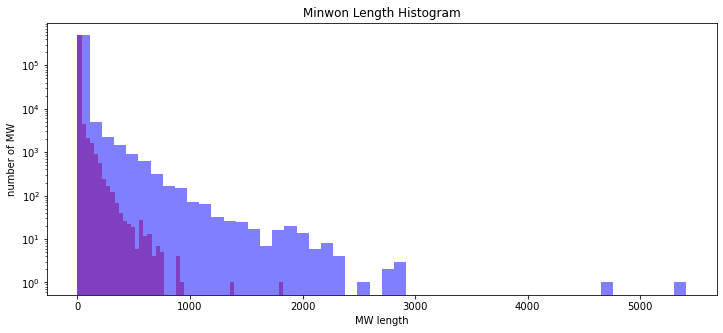

In [38]:
plt.figure(figsize = (12,5))

plt.hist(mw_len_by_token, bins = 50, alpha=0.5, color="r", label="word")
plt.hist(mw_len_by_eumjeol, bins = 50, alpha=0.5, color="b", label="aplt.yscallphabet")

plt.yscale('log', nonposy = 'clip')
plt.title('Minwon Length Histogram')
plt.xlabel('MW length')
plt.ylabel('number of MW')
# plt.legend(labels = ('어절','음절'), encoding='utf8')

In [41]:
# 어절 
print('문장 최대 길이 : {}'.format(np.max(mw_len_by_token)))
print('문장 최소 길이 : {}'.format(np.min(mw_len_by_token)))
print('문장 평균 길이 : {:.2f}'.format(np.mean(mw_len_by_token)))
print('문장 길이 표준편차 : {:.2f}'.format(np.std(mw_len_by_token)))
print('문장 중간 길이 : {}'.format(np.median(mw_len_by_token)))
print('제 1사분위 길이 : {}'.format(np.percentile(mw_len_by_token, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(mw_len_by_token, 75)))
# 형태소
print('제 1사분위 길이 : {}'.format(np.percentile(cnt2_list, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(cnt2_list, 75)))

문장 최대 길이 : 1828
문장 최소 길이 : 0
문장 평균 길이 : 5.76
문장 길이 표준편차 : 20.33
문장 중간 길이 : 2.0
제 1사분위 길이 : 1.0
제 3사분위 길이 : 4.0
제 1사분위 길이 : 1.0
제 3사분위 길이 : 5.0


In [42]:
print('음절 최대 길이 : {}'.format(np.max(mw_len_by_eumjeol)))
print('음절 최소 길이 : {}'.format(np.min(mw_len_by_eumjeol)))
print('음절 평균 길이 : {:.2f}'.format(np.mean(mw_len_by_eumjeol)))
print('문장 길이 표준편차 : {:.2f}'.format(np.std(mw_len_by_eumjeol)))
print('문장 중간 길이 : {}'.format(np.median(mw_len_by_eumjeol)))
print('제 1사분위 길이 : {}'.format(np.percentile(mw_len_by_eumjeol, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(mw_len_by_eumjeol, 75)))
# 명사
print('제 1사분위 길이 : {}'.format(np.percentile(cnt3_list, 25)))
print('제 3사분위 길이 : {}'.format(np.percentile(cnt3_list, 75)))

음절 최대 길이 : 5407
음절 최소 길이 : 0
음절 평균 길이 : 17.56
문장 길이 표준편차 : 63.98
문장 중간 길이 : 5.0
제 1사분위 길이 : 2.0
제 3사분위 길이 : 12.0
제 1사분위 길이 : 1.0
제 3사분위 길이 : 4.0
